In [1]:
import numpy as np
import matplotlib.pyplot as plt
import warnings
import statsmodels.api as sm
import seaborn as sns
import pandas as pd
warnings.filterwarnings("ignore")
df = pd.read_csv(r".\Heart data.csv")
df

,Age (age in year),sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,slope,ca,thal,c
0,63,1,1,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,37,1,3,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
2,41,0,2,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0
3,56,1,2,120.0,236.0,0.0,0.0,178.0,0.0,0.8,1.0,0.0,3.0,0
4,57,0,4,120.0,354.0,0.0,0.0,163.0,1.0,0.6,1.0,0.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
592,52,1,4,140.0,266.0,0.0,0.0,134.0,1.0,2.0,2.0,NaN,NaN,1
593,43,1,4,140.0,288.0,0.0,0.0,135.0,1.0,2.0,2.0,NaN,NaN,1
594,41,1,4,120.0,336.0,0.0,0.0,118.0,1.0,3.0,2.0,NaN,NaN,1
595,44,1,4,135.0,491.0,0.0,0.0,135.0,0.0,0.0,NaN,NaN,NaN,1


In [2]:
df.shape

(597, 14)

In [3]:
df.columns

Index(['Age (age in year)', 'sex', 'chest pain', 'blood pressure',
       'cholestoral ', 'blood sugar', 'electrocardiographic ', 'heart rate',
       'exercise induced', 'depression ', 'slope', 'ca', 'thal', 'c'],
      dtype='object')

In [4]:
# df.rename(columns={"A": "a", "B": "c"})
df.rename(columns={"cholestoral ":"cholestoral","electrocardiographic ":"electrocardiographic","Age (age in year)":"age",'depression ':'depression' },inplace=True)

In [5]:
df=df.drop_duplicates()
df.shape

(596, 14)

In [6]:
for i in df.columns:
    print(i)
    print(df[i].value_counts())
    print("______________________")

age
54    41
52    30
58    28
48    26
55    23
57    22
59    22
41    21
56    21
51    21
43    20
53    20
46    20
50    19
49    19
44    18
45    16
42    15
47    15
39    15
60    14
62    13
65    11
63    10
37    10
40    10
61    10
64    10
35     9
67     9
38     9
66     8
34     6
36     5
70     4
32     4
68     4
71     3
29     3
69     3
31     2
33     2
76     1
74     1
28     1
30     1
77     1
Name: age, dtype: int64
______________________
sex
1    419
0    177
Name: sex, dtype: int64
______________________
chest pain
4    267
2    155
3    140
1     34
Name: chest pain, dtype: int64
______________________
blood pressure
120.0    102
130.0     90
140.0     82
150.0     40
110.0     39
160.0     31
125.0     19
138.0     13
128.0     13
112.0     12
135.0     11
145.0     10
100.0     10
132.0      9
118.0      9
180.0      9
170.0      9
124.0      8
108.0      7
122.0      6
134.0      5
115.0      5
152.0      5
105.0      4
136.0      4
142.0      4
126

In [7]:
df.loc[df['ca'] == 9, 'ca'] = 0

In [8]:
df.ca.value_counts()

0.0    180
1.0     65
2.0     38
3.0     20
Name: ca, dtype: int64

blood pressure
count :  4
234    190.0
387    192.0
499    200.0
521    200.0
Name: blood pressure, dtype: float64


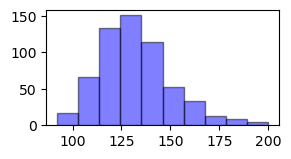

cholestoral
count :  7
85     564.0
183    468.0
421    466.0
483    529.0
491    603.0
545    518.0
595    491.0
Name: cholestoral, dtype: float64


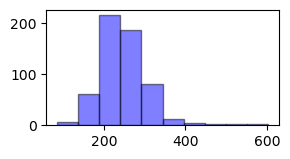

blood sugar
count :  65
0      1.0
8      1.0
14     1.0
23     1.0
26     1.0
      ... 
557    1.0
558    1.0
563    1.0
575    1.0
589    1.0
Name: blood sugar, Length: 65, dtype: float64


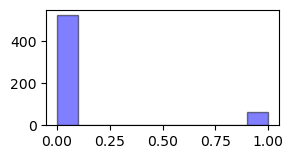

depression
count :  16
1      3.5
101    4.2
365    3.6
455    3.6
478    4.0
506    3.6
514    6.2
520    5.6
521    4.0
527    4.2
549    4.0
573    4.0
579    3.8
580    3.6
581    4.4
591    5.0
Name: depression, dtype: float64


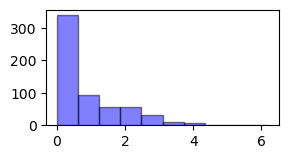

ca
count :  20
52     3.0
97     3.0
99     3.0
363    3.0
379    3.0
393    3.0
444    3.0
461    3.0
462    3.0
463    3.0
514    3.0
516    3.0
518    3.0
527    3.0
529    3.0
570    3.0
573    3.0
575    3.0
577    3.0
581    3.0
Name: ca, dtype: float64


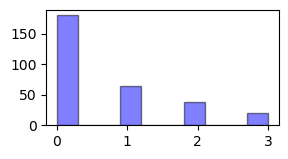

In [9]:
# همه ستون هایی که اوتلایرز داشتند را پیدا میکنیم و نمودارشان هم برای درک بهتر رسم میکنیم
for i in df.columns:
    x=df[i]
    if x[((x-x.median())/x.std()).abs()>3].count()>1:
        print(i) 
        print("count : ",x[((x-x.median())/x.std()).abs()>3].count())
        print(x[((x-x.median())/x.std()).abs()>3])
        plt.figure(figsize=(3, 1.5))
        plt.hist(x, alpha=0.5, color='blue', edgecolor='black')
        plt.show()
        print("===============================")
        

In [10]:
# تمامی ستون هایی که اوتلایرز داشتند را با ماکسیممشان تغییر دادم
handout=['blood pressure','cholestoral','depression']
for i in handout:
    x=df[i]
    m = x[((x-x.median())/x.std()).abs()<3].max()
    df.loc[df[i] > m , i ] = m

In [11]:
df.isnull().sum()

age                       0
sex                       0
chest pain                0
blood pressure            1
cholestoral              22
blood sugar               8
electrocardiographic      1
heart rate                1
exercise induced          1
depression                0
slope                   189
ca                      293
thal                    267
c                         0
dtype: int64

In [12]:
print(df["cholestoral"].median())
ind=df[df["cholestoral"].isnull()].index
print(ind)
df[df["cholestoral"].isnull()]

242.5
Int64Index([166, 185, 189, 204, 221, 251, 257, 258, 262, 267, 272, 286, 305,
            332, 336, 345, 346, 490, 492, 505, 550, 566],
           dtype='int64')


,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,slope,ca,thal,c
166,54,1,3,150.0,NaN,0.0,0.0,122.0,0.0,0.0,NaN,NaN,NaN,0
185,56,1,3,130.0,NaN,0.0,0.0,114.0,0.0,0.0,NaN,NaN,NaN,0
189,48,0,2,120.0,NaN,1.0,1.0,148.0,0.0,0.0,NaN,NaN,NaN,0
204,43,0,3,150.0,NaN,0.0,0.0,175.0,0.0,0.0,NaN,NaN,3.0,0
221,49,0,2,110.0,NaN,0.0,0.0,160.0,0.0,0.0,NaN,NaN,NaN,0
251,39,1,2,120.0,NaN,0.0,1.0,146.0,0.0,2.0,1.0,NaN,NaN,0
257,39,1,2,130.0,NaN,0.0,0.0,120.0,0.0,0.0,NaN,NaN,NaN,0
258,48,1,2,100.0,NaN,0.0,0.0,100.0,0.0,0.0,NaN,NaN,NaN,0
262,49,1,4,140.0,NaN,0.0,0.0,130.0,0.0,0.0,NaN,NaN,NaN,0
267,52,0,2,140.0,NaN,0.0,0.0,140.0,0.0,0.0,NaN,NaN,NaN,0


In [13]:
# گروه‌بندی ستون "blood pressure" بر اساس ستون تارگت "c" و محاسبه میانه هر دسته
median_by_target = df.groupby('c')['cholestoral'].median()

print(median_by_target)

c
0    234.0
1    254.0
Name: cholestoral, dtype: float64


In [14]:
misscol=["blood pressure","cholestoral","blood sugar","electrocardiographic","heart rate","exercise induced"]
# for i in misscol:
#     med=df[i].median()
#     df.loc[df[i].isna()]=med
# حلقه برای پر کردن مقادیر نال در ستون‌های دارای میس
for col in misscol:
    # محاسبه میانگین بر اساس تارگت
    target_grouped = df.groupby("c")[col].transform(lambda x: x.median())
    # پر کردن مقادیر نال با میانه مناسب
    df[col].fillna(target_grouped, inplace=True)

df

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,slope,ca,thal,c
0,63,1,1,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,37,1,3,130.0,250.0,0.0,0.0,187.0,0.0,3.4,3.0,0.0,3.0,0
2,41,0,2,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0
3,56,1,2,120.0,236.0,0.0,0.0,178.0,0.0,0.8,1.0,0.0,3.0,0
4,57,0,4,120.0,354.0,0.0,0.0,163.0,1.0,0.6,1.0,0.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
592,52,1,4,140.0,266.0,0.0,0.0,134.0,1.0,2.0,2.0,NaN,NaN,1
593,43,1,4,140.0,288.0,0.0,0.0,135.0,1.0,2.0,2.0,NaN,NaN,1
594,41,1,4,120.0,336.0,0.0,0.0,118.0,1.0,3.0,2.0,NaN,NaN,1
595,44,1,4,135.0,417.0,0.0,0.0,135.0,0.0,0.0,NaN,NaN,NaN,1


In [15]:
df.isnull().sum()

age                       0
sex                       0
chest pain                0
blood pressure            0
cholestoral               0
blood sugar               0
electrocardiographic      0
heart rate                0
exercise induced          0
depression                0
slope                   189
ca                      293
thal                    267
c                         0
dtype: int64

In [16]:
df.loc[[505]]

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,slope,ca,thal,c
505,52,1,4,170.0,254.0,0.0,0.0,126.0,1.0,1.5,2.0,NaN,NaN,1


In [17]:
correlation_matrix=df.corr()
correlation_matrix

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,slope,ca,thal,c
age,1.000000,-0.063144,0.146775,0.242320,0.137036,0.177304,0.259326,-0.303586,0.155979,0.258748,0.078979,0.364036,0.105296,0.216230
sex,-0.063144,1.000000,0.118245,0.008183,-0.081509,0.038918,-0.037621,-0.087846,0.148814,0.101936,0.075835,0.090833,0.349134,0.266879
chest pain,0.146775,0.118245,1.000000,0.018514,0.106417,0.001123,0.074334,-0.322208,0.438328,0.282090,0.209141,0.227668,0.245214,0.462721
blood pressure,0.242320,0.008183,0.018514,1.000000,0.121872,0.135020,0.074289,-0.118751,0.133906,0.174586,0.123100,0.089110,0.129762,0.138272
cholestoral,0.137036,-0.081509,0.106417,0.121872,1.000000,0.042823,0.103677,-0.073255,0.130189,0.088472,0.042078,0.136999,0.001550,0.149741
blood sugar,0.177304,0.038918,0.001123,0.135020,0.042823,1.000000,0.113412,-0.003576,0.063669,0.060238,0.057147,0.148741,0.066755,0.090583
electrocardiographic,0.259326,-0.037621,0.074334,0.074289,0.103677,0.113412,1.000000,0.053944,0.071418,0.174237,0.032245,0.136486,-0.012682,0.134927
heart rate,-0.303586,-0.087846,-0.322208,-0.118751,-0.073255,-0.003576,0.053944,1.000000,-0.374362,-0.267903,-0.402847,-0.253548,-0.302562,-0.341831
exercise induced,0.155979,0.148814,0.438328,0.133906,0.130189,0.063669,0.071418,-0.374362,1.000000,0.442959,0.333663,0.140423,0.320352,0.504280
depression,0.258748,0.101936,0.282090,0.174586,0.088472,0.060238,0.174237,-0.267903,0.442959,1.000000,0.550600,0.286391,0.308562,0.491615


In [18]:
# مجموع مقادیر مطلق وابستگی‌ها برای ستون‌های انتخاب شده
total_abs_corr = correlation_matrix[['slope', 'ca', 'thal']].abs().sum()

print("مجموع مقادیر مطلق وابستگی‌ها برای ستون‌های انتخاب شده:", total_abs_corr)

مجموع مقادیر مطلق وابستگی‌ها برای ستون‌های انتخاب شده: slope    3.692163
ca       3.693713
thal     3.901879
dtype: float64


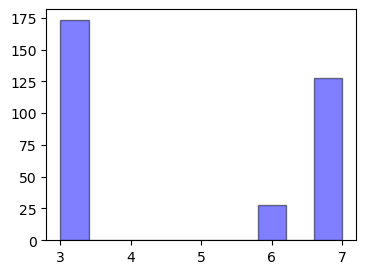

In [19]:
plt.figure(figsize=(4, 3))
plt.hist(df['thal'], alpha=0.5, color='blue', edgecolor='black')
plt.show()

In [20]:
# حذف دو ستون و نگهداری نسخه پشتیبانی شده از آن‌ها
backup_columns = df[['slope', 'ca']]
df = df.drop(['slope', 'ca'], axis=1)


In [21]:
from sklearn.ensemble import RandomForestClassifier
# داده‌های دارای میسینگ
x_test = df[df['thal'].isnull()]
x_test

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,thal,c
48,53,0,3,128.0,216.0,0.0,2.0,115.0,0.0,0.0,NaN,0
164,40,1,2,140.0,289.0,0.0,0.0,172.0,0.0,0.0,NaN,0
165,37,1,2,130.0,283.0,0.0,1.0,98.0,0.0,0.0,NaN,0
166,54,1,3,150.0,234.0,0.0,0.0,122.0,0.0,0.0,NaN,0
167,39,1,3,120.0,339.0,0.0,0.0,170.0,0.0,0.0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...
592,52,1,4,140.0,266.0,0.0,0.0,134.0,1.0,2.0,NaN,1
593,43,1,4,140.0,288.0,0.0,0.0,135.0,1.0,2.0,NaN,1
594,41,1,4,120.0,336.0,0.0,0.0,118.0,1.0,3.0,NaN,1
595,44,1,4,135.0,417.0,0.0,0.0,135.0,0.0,0.0,NaN,1


In [22]:
# داده‌های بدون میسینگ
data_without_missing = df[~df['thal'].isnull()]
# ویژگی‌های ورودی برای پیش‌بینی میسینگ‌ها
x_train = data_without_missing.drop('thal', axis=1)
# ویژگی خروجی که میسینگ دارد
y_train = data_without_missing['thal']

In [23]:
# ایجاد مدل Random Forest
rf = RandomForestClassifier(n_estimators=15, random_state=42)
# آموزش مدل بر روی داده‌های بدون میسینگ
rf.fit(x_train, y_train)

RandomForestClassifier(n_estimators=15, random_state=42)

In [24]:
# پیش‌بینی مقادیر میسینگ
rf_pred = rf.predict(x_test.drop('thal', axis=1))

# # قرار دادن مقادیر پیش‌بینی شده در داده اصلی
x_test['thal'] = rf_pred

In [25]:
df = data_without_missing.append(x_test)
df

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,thal,c
0,63,1,1,145.0,233.0,1.0,2.0,150.0,0.0,2.3,6.0,0
1,37,1,3,130.0,250.0,0.0,0.0,187.0,0.0,3.4,3.0,0
2,41,0,2,130.0,204.0,0.0,2.0,172.0,0.0,1.4,3.0,0
3,56,1,2,120.0,236.0,0.0,0.0,178.0,0.0,0.8,3.0,0
4,57,0,4,120.0,354.0,0.0,0.0,163.0,1.0,0.6,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
592,52,1,4,140.0,266.0,0.0,0.0,134.0,1.0,2.0,7.0,1
593,43,1,4,140.0,288.0,0.0,0.0,135.0,1.0,2.0,7.0,1
594,41,1,4,120.0,336.0,0.0,0.0,118.0,1.0,3.0,7.0,1
595,44,1,4,135.0,417.0,0.0,0.0,135.0,0.0,0.0,6.0,1


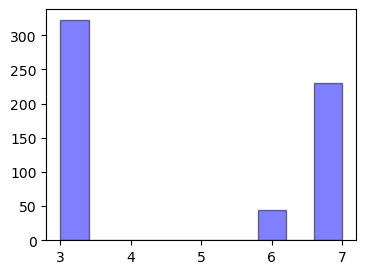

In [26]:
plt.figure(figsize=(4, 3))
plt.hist(df['thal'], alpha=0.5, color='blue', edgecolor='black')
plt.show()

In [27]:
# اضافه کردن ستون "ca" به دیتاست df_new
df['ca'] = backup_columns['ca']
df

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,thal,c,ca
0,63,1,1,145.0,233.0,1.0,2.0,150.0,0.0,2.3,6.0,0,0.0
1,37,1,3,130.0,250.0,0.0,0.0,187.0,0.0,3.4,3.0,0,0.0
2,41,0,2,130.0,204.0,0.0,2.0,172.0,0.0,1.4,3.0,0,0.0
3,56,1,2,120.0,236.0,0.0,0.0,178.0,0.0,0.8,3.0,0,0.0
4,57,0,4,120.0,354.0,0.0,0.0,163.0,1.0,0.6,3.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
592,52,1,4,140.0,266.0,0.0,0.0,134.0,1.0,2.0,7.0,1,NaN
593,43,1,4,140.0,288.0,0.0,0.0,135.0,1.0,2.0,7.0,1,NaN
594,41,1,4,120.0,336.0,0.0,0.0,118.0,1.0,3.0,7.0,1,NaN
595,44,1,4,135.0,417.0,0.0,0.0,135.0,0.0,0.0,6.0,1,NaN


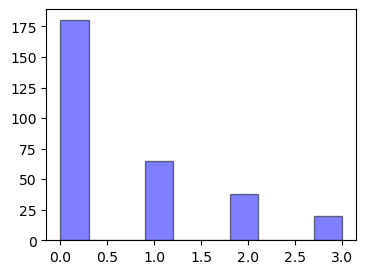

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,thal,c,ca
92,52,1,3,138.0,223.0,0.0,0.0,169.0,0.0,0.0,3.0,0,NaN
158,58,1,2,125.0,220.0,0.0,0.0,144.0,0.0,0.4,7.0,0,NaN
163,38,1,3,138.0,175.0,0.0,0.0,173.0,0.0,0.0,3.0,0,NaN
194,59,1,3,130.0,318.0,0.0,0.0,120.0,1.0,1.0,3.0,0,NaN
195,37,1,4,120.0,223.0,0.0,0.0,168.0,0.0,0.0,3.0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
592,52,1,4,140.0,266.0,0.0,0.0,134.0,1.0,2.0,7.0,1,NaN
593,43,1,4,140.0,288.0,0.0,0.0,135.0,1.0,2.0,7.0,1,NaN
594,41,1,4,120.0,336.0,0.0,0.0,118.0,1.0,3.0,7.0,1,NaN
595,44,1,4,135.0,417.0,0.0,0.0,135.0,0.0,0.0,6.0,1,NaN


In [28]:
plt.figure(figsize=(4, 3))
plt.hist(df['ca'], alpha=0.5, color='blue', edgecolor='black')
plt.show()
x_test = df[df['ca'].isnull()]
x_test

In [29]:
# داده‌های بدون میسینگ
data_without_missing = df[~df['ca'].isnull()]
# ویژگی‌های ورودی برای پیش‌بینی میسینگ‌ها
x_train = data_without_missing.drop('ca', axis=1)
# ویژگی خروجی که میسینگ دارد
y_train = data_without_missing['ca']

In [30]:
# ایجاد مدل Random Forest
rf = RandomForestClassifier(n_estimators=15, random_state=42)
# آموزش مدل بر روی داده‌های بدون میسینگ
rf.fit(x_train, y_train)
# پیش‌بینی مقادیر میسینگ
rf_pred = rf.predict(x_test.drop('ca', axis=1))

# # قرار دادن مقادیر پیش‌بینی شده در داده اصلی
x_test['ca'] = rf_pred

In [31]:
df = data_without_missing.append(x_test)
df

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,thal,c,ca
0,63,1,1,145.0,233.0,1.0,2.0,150.0,0.0,2.3,6.0,0,0.0
1,37,1,3,130.0,250.0,0.0,0.0,187.0,0.0,3.4,3.0,0,0.0
2,41,0,2,130.0,204.0,0.0,2.0,172.0,0.0,1.4,3.0,0,0.0
3,56,1,2,120.0,236.0,0.0,0.0,178.0,0.0,0.8,3.0,0,0.0
4,57,0,4,120.0,354.0,0.0,0.0,163.0,1.0,0.6,3.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
592,52,1,4,140.0,266.0,0.0,0.0,134.0,1.0,2.0,7.0,1,1.0
593,43,1,4,140.0,288.0,0.0,0.0,135.0,1.0,2.0,7.0,1,0.0
594,41,1,4,120.0,336.0,0.0,0.0,118.0,1.0,3.0,7.0,1,0.0
595,44,1,4,135.0,417.0,0.0,0.0,135.0,0.0,0.0,6.0,1,0.0


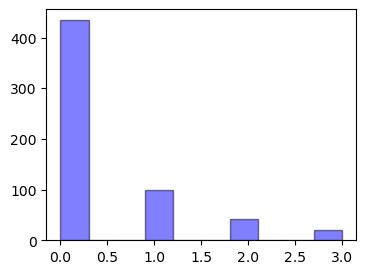

In [32]:
plt.figure(figsize=(4, 3))
plt.hist(df['ca'], alpha=0.5, color='blue', edgecolor='black')
plt.show()

In [33]:
# اضافه کردن ستون "ca" به دیتاست df_new
df['slope'] = backup_columns['slope']
df

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,thal,c,ca,slope
0,63,1,1,145.0,233.0,1.0,2.0,150.0,0.0,2.3,6.0,0,0.0,3.0
1,37,1,3,130.0,250.0,0.0,0.0,187.0,0.0,3.4,3.0,0,0.0,3.0
2,41,0,2,130.0,204.0,0.0,2.0,172.0,0.0,1.4,3.0,0,0.0,1.0
3,56,1,2,120.0,236.0,0.0,0.0,178.0,0.0,0.8,3.0,0,0.0,1.0
4,57,0,4,120.0,354.0,0.0,0.0,163.0,1.0,0.6,3.0,0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
592,52,1,4,140.0,266.0,0.0,0.0,134.0,1.0,2.0,7.0,1,1.0,2.0
593,43,1,4,140.0,288.0,0.0,0.0,135.0,1.0,2.0,7.0,1,0.0,2.0
594,41,1,4,120.0,336.0,0.0,0.0,118.0,1.0,3.0,7.0,1,0.0,2.0
595,44,1,4,135.0,417.0,0.0,0.0,135.0,0.0,0.0,6.0,1,0.0,NaN


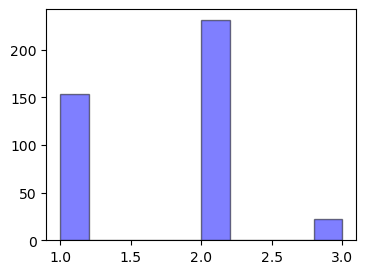

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,thal,c,ca,slope
256,50,1,2,120.0,168.0,0.0,0.0,160.0,0.0,0.0,3.0,0,0.0,NaN
345,59,1,4,140.0,234.0,0.0,0.0,140.0,0.0,0.0,3.0,0,0.0,NaN
195,37,1,4,120.0,223.0,0.0,0.0,168.0,0.0,0.0,3.0,0,0.0,NaN
196,50,1,2,140.0,216.0,0.0,0.0,170.0,0.0,0.0,3.0,0,0.0,NaN
204,43,0,3,150.0,234.0,0.0,0.0,175.0,0.0,0.0,3.0,0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
562,55,1,1,140.0,295.0,0.0,0.0,136.0,0.0,0.0,7.0,1,0.0,NaN
566,59,1,4,130.0,254.0,0.0,0.0,125.0,0.0,0.0,7.0,1,1.0,NaN
586,52,1,4,160.0,331.0,0.0,0.0,94.0,1.0,2.5,7.0,1,0.0,NaN
590,49,1,4,128.0,212.0,0.0,0.0,96.0,1.0,0.0,7.0,1,0.0,NaN


In [34]:
plt.figure(figsize=(4, 3))
plt.hist(df['slope'], alpha=0.5, color='blue', edgecolor='black')
plt.show()
x_test = df[df['slope'].isnull()]
x_test

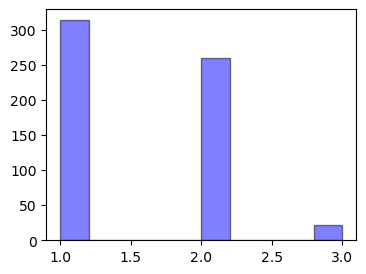

RandomForestClassifier(class_weight={0: 0.4, 1: 0.6}, max_depth=7,
                       min_samples_leaf=2, min_samples_split=3)

In [35]:
# داده‌های بدون میسینگ
data_without_missing = df[~df['slope'].isnull()]
# ویژگی‌های ورودی برای پیش‌بینی میسینگ‌ها
x_train = data_without_missing.drop('slope', axis=1)
# ویژگی خروجی که میسینگ دارد
y_train = data_without_missing['slope']
# ایجاد مدل Random Forest
rf = RandomForestClassifier(n_estimators=15, random_state=42)
# آموزش مدل بر روی داده‌های بدون میسینگ
rf.fit(x_train, y_train)
# پیش‌بینی مقادیر میسینگ
rf_pred = rf.predict(x_test.drop('slope', axis=1))
# قرار دادن مقادیر پیش‌بینی شده در داده اصلی
x_test['slope'] = rf_pred
df = data_without_missing.append(x_test)
plt.figure(figsize=(4, 3))
plt.hist(df['slope'], alpha=0.5, color='blue', edgecolor='black')
plt.show()
df
RandomForestClassifier(class_weight={0:0.4 , 1:0.6}, criterion='gini',
                             max_depth=7, min_samples_leaf=2, min_samples_split=3)

In [36]:
df.corr()

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,thal,c,ca,slope
age,1.000000,-0.063144,0.146775,0.242320,0.137036,0.177304,0.259326,-0.303586,0.155979,0.258748,0.185338,0.216230,0.424273,0.225993
sex,-0.063144,1.000000,0.118245,0.008183,-0.081509,0.038918,-0.037621,-0.087846,0.148814,0.101936,0.389017,0.266879,0.083906,0.040542
chest pain,0.146775,0.118245,1.000000,0.018514,0.106417,0.001123,0.074334,-0.322208,0.438328,0.282090,0.349099,0.462721,0.248009,0.292081
blood pressure,0.242320,0.008183,0.018514,1.000000,0.121872,0.135020,0.074289,-0.118751,0.133906,0.174586,0.152326,0.138272,0.075776,0.112135
cholestoral,0.137036,-0.081509,0.106417,0.121872,1.000000,0.042823,0.103677,-0.073255,0.130189,0.088472,0.055257,0.149741,0.097062,0.050391
blood sugar,0.177304,0.038918,0.001123,0.135020,0.042823,1.000000,0.113412,-0.003576,0.063669,0.060238,0.109540,0.090583,0.178819,0.083683
electrocardiographic,0.259326,-0.037621,0.074334,0.074289,0.103677,0.113412,1.000000,0.053944,0.071418,0.174237,-0.003500,0.134927,0.245114,0.150517
heart rate,-0.303586,-0.087846,-0.322208,-0.118751,-0.073255,-0.003576,0.053944,1.000000,-0.374362,-0.267903,-0.367126,-0.341831,-0.160639,-0.356916
exercise induced,0.155979,0.148814,0.438328,0.133906,0.130189,0.063669,0.071418,-0.374362,1.000000,0.442959,0.398871,0.504280,0.193864,0.444905
depression,0.258748,0.101936,0.282090,0.174586,0.088472,0.060238,0.174237,-0.267903,0.442959,1.000000,0.358091,0.491615,0.329044,0.620390


In [37]:
# حذف دو ستون و نگهداری نسخه پشتیبانی شده از آن‌ها
backup_columns = df[['c']]
df = df.drop(['c'], axis=1)
df["c"]=backup_columns["c"]
df

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,thal,ca,slope,c
0,63,1,1,145.0,233.0,1.0,2.0,150.0,0.0,2.3,6.0,0.0,3.0,0
1,37,1,3,130.0,250.0,0.0,0.0,187.0,0.0,3.4,3.0,0.0,3.0,0
2,41,0,2,130.0,204.0,0.0,2.0,172.0,0.0,1.4,3.0,0.0,1.0,0
3,56,1,2,120.0,236.0,0.0,0.0,178.0,0.0,0.8,3.0,0.0,1.0,0
4,57,0,4,120.0,354.0,0.0,0.0,163.0,1.0,0.6,3.0,0.0,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
562,55,1,1,140.0,295.0,0.0,0.0,136.0,0.0,0.0,7.0,0.0,1.0,1
566,59,1,4,130.0,254.0,0.0,0.0,125.0,0.0,0.0,7.0,1.0,1.0,1
586,52,1,4,160.0,331.0,0.0,0.0,94.0,1.0,2.5,7.0,0.0,2.0,1
590,49,1,4,128.0,212.0,0.0,0.0,96.0,1.0,0.0,7.0,0.0,2.0,1


In [38]:
df.corr(method="pearson")

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,thal,ca,slope,c
age,1.000000,-0.063144,0.146775,0.242320,0.137036,0.177304,0.259326,-0.303586,0.155979,0.258748,0.185338,0.424273,0.225993,0.216230
sex,-0.063144,1.000000,0.118245,0.008183,-0.081509,0.038918,-0.037621,-0.087846,0.148814,0.101936,0.389017,0.083906,0.040542,0.266879
chest pain,0.146775,0.118245,1.000000,0.018514,0.106417,0.001123,0.074334,-0.322208,0.438328,0.282090,0.349099,0.248009,0.292081,0.462721
blood pressure,0.242320,0.008183,0.018514,1.000000,0.121872,0.135020,0.074289,-0.118751,0.133906,0.174586,0.152326,0.075776,0.112135,0.138272
cholestoral,0.137036,-0.081509,0.106417,0.121872,1.000000,0.042823,0.103677,-0.073255,0.130189,0.088472,0.055257,0.097062,0.050391,0.149741
blood sugar,0.177304,0.038918,0.001123,0.135020,0.042823,1.000000,0.113412,-0.003576,0.063669,0.060238,0.109540,0.178819,0.083683,0.090583
electrocardiographic,0.259326,-0.037621,0.074334,0.074289,0.103677,0.113412,1.000000,0.053944,0.071418,0.174237,-0.003500,0.245114,0.150517,0.134927
heart rate,-0.303586,-0.087846,-0.322208,-0.118751,-0.073255,-0.003576,0.053944,1.000000,-0.374362,-0.267903,-0.367126,-0.160639,-0.356916,-0.341831
exercise induced,0.155979,0.148814,0.438328,0.133906,0.130189,0.063669,0.071418,-0.374362,1.000000,0.442959,0.398871,0.193864,0.444905,0.504280
depression,0.258748,0.101936,0.282090,0.174586,0.088472,0.060238,0.174237,-0.267903,0.442959,1.000000,0.358091,0.329044,0.620390,0.491615


In [39]:
from sklearn.feature_selection import chi2
x = df.drop('c', axis=1)
y = df['c']
chi_scores= chi2(x, y)
col = df.columns[:-1]
data = {'Feature Name': col, 'chi_squared': chi_scores[0], 'p_value': chi_scores[1]}
col_chi_P = pd.DataFrame(data)
col_chi_P

,Feature Name,chi_squared,p_value
0,age,44.824501,2.155092e-11
1,sex,12.606715,3.843633e-04
2,chest pain,38.641836,5.091578e-10
3,blood pressure,25.614068,4.169882e-07
4,cholestoral,155.955890,8.655786e-36
5,blood sugar,4.357002,3.685712e-02
6,electrocardiographic,13.404634,2.510035e-04
7,heart rate,272.364865,3.463422e-61
8,exercise induced,103.753802,2.290851e-24
9,depression,180.016092,4.807361e-41


In [40]:
covariance_matrix = df.cov()
covariance_matrix

,age,sex,chest pain,blood pressure,cholestoral,blood sugar,electrocardiographic,heart rate,exercise induced,depression,thal,ca,slope,c
age,82.474499,-0.262244,1.287068,37.947028,66.882026,0.502343,2.047408,-65.583475,0.658801,2.345625,3.250544,2.947155,1.168710,0.967010
sex,-0.262244,0.209134,0.052214,0.064528,-2.003249,0.005552,-0.014957,-0.955626,0.031651,0.046533,0.343568,0.029350,0.010558,0.060101
chest pain,1.287068,0.052214,0.932356,0.308262,5.522272,0.000338,0.062399,-7.400823,0.196842,0.271894,0.650984,0.183171,0.160600,0.220021
blood pressure,37.947028,0.064528,0.308262,297.342764,112.940195,0.726358,1.113654,-48.710090,1.073882,3.005111,5.072641,0.999447,1.101088,1.174139
cholestoral,66.882026,-2.003249,5.522272,112.940195,2888.216389,0.717985,4.843912,-93.649563,3.253985,4.746180,5.735018,3.989893,1.542113,3.962879
blood sugar,0.502343,0.005552,0.000338,0.726358,0.717985,0.097330,0.030760,-0.026541,0.009238,0.018759,0.065997,0.042671,0.014867,0.013916
electrocardiographic,2.047408,-0.014957,0.062399,1.113654,4.843912,0.030760,0.755784,1.115572,0.028876,0.151203,-0.005877,0.162991,0.074514,0.057763
heart rate,-65.583475,-0.955626,-7.400823,-48.710090,-93.649563,-0.026541,1.115572,565.857244,-4.141639,-6.361407,-16.865524,-2.922824,-4.834719,-4.004241
exercise induced,0.658801,0.031651,0.196842,1.073882,3.253985,0.009238,0.028876,-4.141639,0.216299,0.205642,0.358254,0.068964,0.117828,0.115493
depression,2.345625,0.046533,0.271894,3.005111,4.746180,0.018759,0.151203,-6.361407,0.205642,0.996421,0.690313,0.251231,0.352646,0.241658


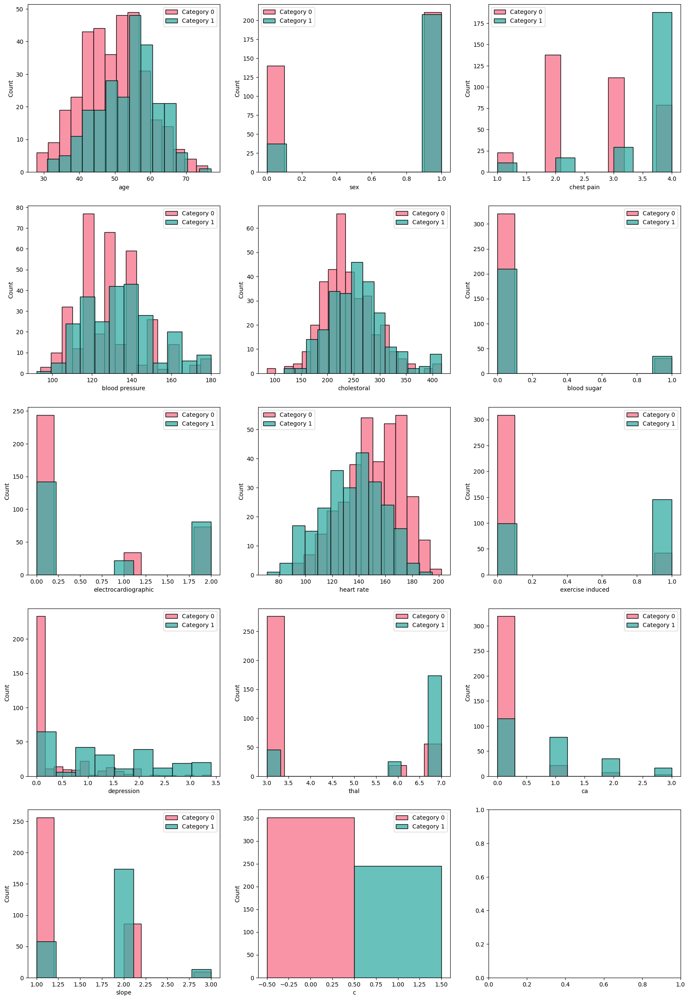

In [41]:
# for idx, column in enumerate(df.columns):
palette = sns.husl_palette(n_colors=len(df['c'].unique()))
fig1 , axes = plt.subplots(nrows=5, ncols=3, figsize=(20, 30))
for idx, column in enumerate(df.columns):
    if idx < 14:  # اجرای تابع تنها برای اندیس‌های معتبر
        for i, category in enumerate(df['c'].unique()):
            sns.histplot(df[df['c'] == category][column], ax=axes[idx // 3, idx % 3], label=f'Category {category}', color=palette[i])
        axes[idx // 3, idx % 3].legend()



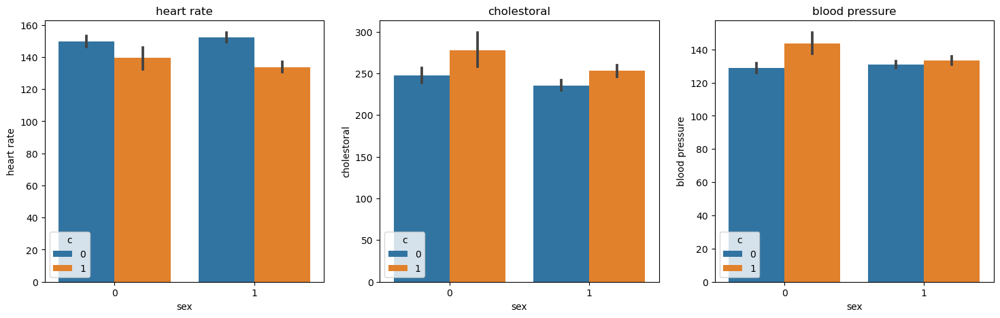

In [42]:
fig, axes = plt.subplots(1, 3, sharex=True, figsize=(18,5))
sns.barplot(ax=axes[0], data=df , x="sex" , y="heart rate" , hue='c')
axes[0].set_title("heart rate")

# Charmander
sns.barplot(ax=axes[1], data=df , x="sex" , y="cholestoral" , hue='c')
axes[1].set_title("cholestoral")
# Squirtle
sns.barplot(ax=axes[2], data=df , x="sex" , y="blood pressure" , hue='c')
axes[2].set_title('blood pressure')

plt.show()


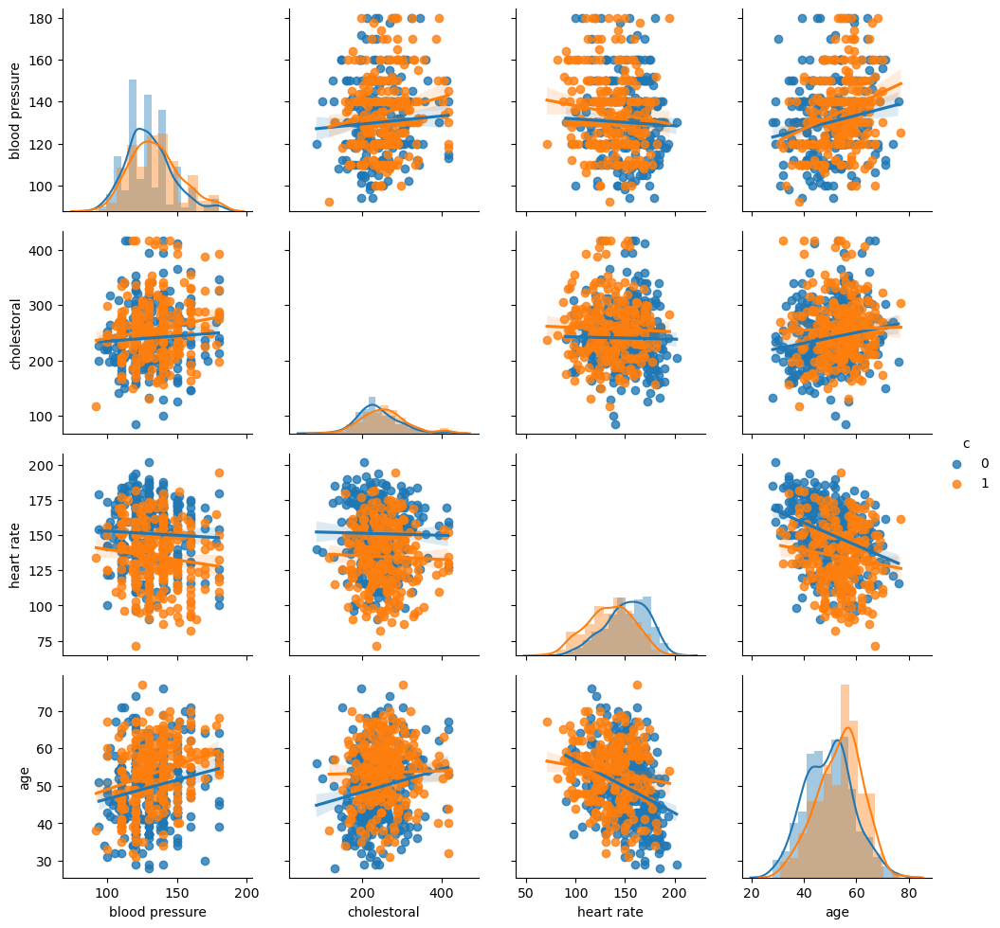

In [43]:
g = sns.PairGrid(df.loc[:, ["blood pressure", "cholestoral", "heart rate","age",  "c"]] , hue='c')
g = g.map_offdiag(sns.regplot)
g = g.map_diag(sns.distplot)
g = g.add_legend()
plt.show()

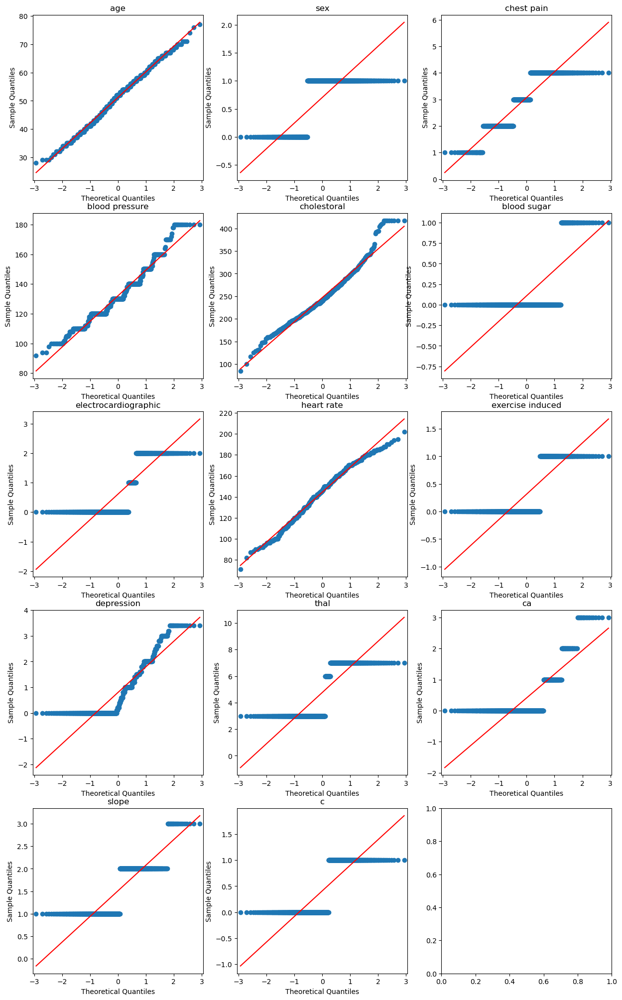

In [44]:
# تعداد ستون‌ها در هر ردیف و ستون نمودارها
num_rows = int(len(df.columns) / 3) + 1

# ایجاد شکل (figure) و محورها (axes) برای نمودارها
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))
axes = axes.ravel()

# حلقه برای رسم نمودار Q-Q برای هر ستون
for i, column in enumerate(df.columns):
    ax = axes[i]
    sm.qqplot(df[column], line='s', ax=ax)
    ax.set_title(column)

plt.show()


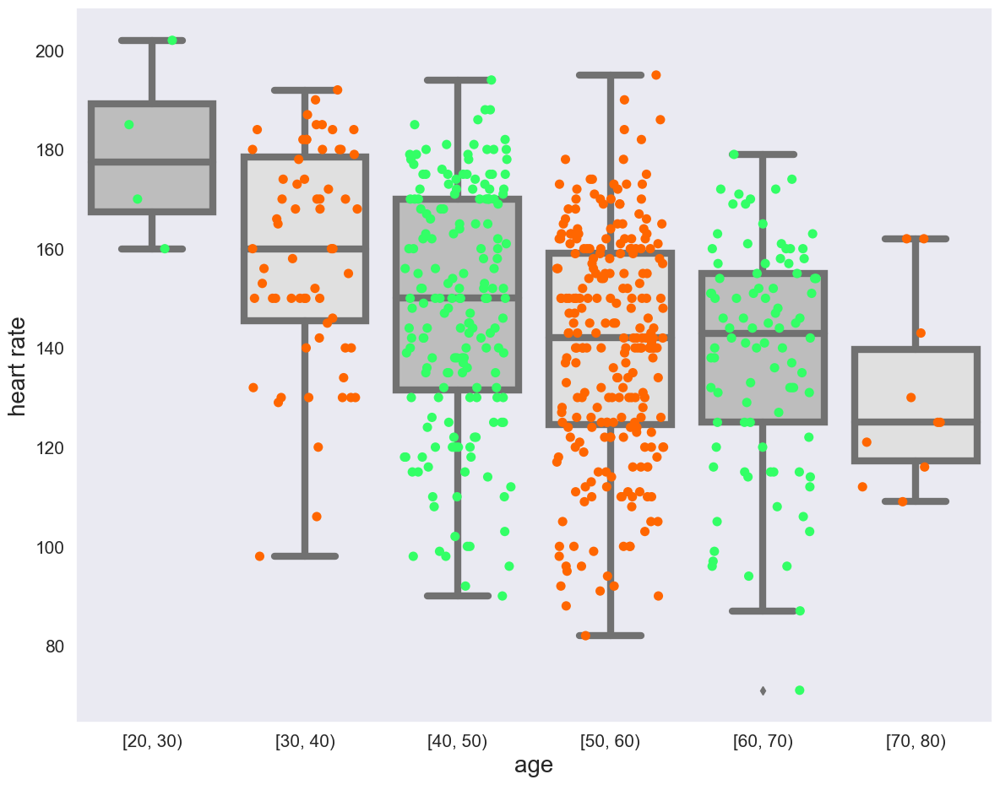

In [45]:
# ایجاد ستون تازه به نام "age_group" برای گروه‌بندی بر اساس سن
df2= pd.cut(df['age'], bins=range(20, 90, 10), right=False)
plt.figure(figsize=(14,11))
sns.set(rc={"axes.grid":False,
'xtick.labelsize':15,'ytick.labelsize':15,
'axes.labelsize':20,'figure.figsize':(20.0, 9.0)})
params = dict(x = df2 ,y = df['heart rate'])
sns.stripplot(**params , size=8,jitter=0.35,palette=['#33FF66','#FF6600'],edgecolor='black')
sns.boxplot(**params ,palette=['#BDBDBD','#E0E0E0'],linewidth=6)
plt.show()

In [46]:
df.isnull().sum()

age                     0
sex                     0
chest pain              0
blood pressure          0
cholestoral             0
blood sugar             0
electrocardiographic    0
heart rate              0
exercise induced        0
depression              0
thal                    0
ca                      0
slope                   0
c                       0
dtype: int64

In [47]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
x = df.drop('c', axis=1)
y = df['c']
x_train,x_test,y_train,y_test = train_test_split(x, y, test_size=0.2, random_state=42)
scaler = MinMaxScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

# DecisionTree

In [48]:
from sklearn.model_selection import cross_val_predict,cross_val_score
from sklearn.model_selection import KFold
from sklearn.tree import DecisionTreeClassifier

DT = DecisionTreeClassifier(criterion='entropy' , max_depth=6, min_samples_split=6 ,
                            min_samples_leaf=3 ,class_weight={0:0.4 , 1:0.6})
kf = KFold(5, shuffle=True, random_state=42)
scoresCV = cross_val_score(DT, x_train, y_train, cv=kf, scoring='accuracy')
print(scoresCV)
scoresCV.mean()

[0.80208333 0.90526316 0.88421053 0.78947368 0.82105263]


0.8404166666666667

In [49]:
from sklearn.metrics import confusion_matrix
pred = cross_val_predict(DT, x_train, y_train, cv=kf)
confusion_matrix(y_train,pred)

array([[246,  39],
       [ 37, 154]], dtype=int64)

In [50]:
from sklearn.model_selection import GridSearchCV
DT = DecisionTreeClassifier(class_weight={0:0.4 , 1:0.6})
param = {'criterion':['gini', 'entropy'],
        'max_depth':[3,5,7,10],
        'min_samples_split':[3,4,5,6],
        'min_samples_leaf':[2,3,4]}
kf = KFold(5, shuffle=True, random_state=42)
GS = GridSearchCV(DT, param, cv=kf, scoring='f1')
%time GS.fit(x_train,y_train)

Wall time: 982 ms


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=DecisionTreeClassifier(class_weight={0: 0.4, 1: 0.6}),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 7, 10],
                         'min_samples_leaf': [2, 3, 4],
                         'min_samples_split': [3, 4, 5, 6]},
             scoring='f1')

In [51]:
print('best params : ',GS.best_params_)
print('accuracy train : ' , GS.best_score_)
y_pred = GS.predict(x_test)
print('accuracy test : ', (y_pred==y_test).mean())

best params :  {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 3}
accuracy train :  0.8194693269982872
accuracy test :  0.8416666666666667


# Naive Bayes

In [52]:
from sklearn.naive_bayes import GaussianNB, MultinomialNB
kf = KFold(5, shuffle=True, random_state=42)
# نایو بیز توزیع گاوسین
GNB = GaussianNB()
scores = cross_val_score(GNB, x, y, cv=kf, scoring='accuracy')
print('accuracy : ' , scores.mean())

accuracy :  0.8439775910364146


In [53]:
# توزیع چند جمله ای
MNB = MultinomialNB()
scores = cross_val_score(MNB, x_train, y_train, cv=kf, scoring='accuracy')
print('accuracy : ', scores.mean())

accuracy :  0.8488596491228069


# Neural Network

In [54]:
from sklearn.neural_network import MLPClassifier
MLP = MLPClassifier(max_iter=50,momentum=0.5)
param = {
    'hidden_layer_sizes': [(60,),(20,),(40,)],   # تعداد نورون‌ها در هر لایه مخفی
    'activation': ['relu'],  # تابع فعال‌سازی
    'learning_rate_init' : [0.1,0.05,0.01],
    'solver': ['adam'],  # الگوریتم بهینه‌سازی
    'alpha': [0.0001, 0.001, 0.01],  # مقدار جریمه
    'learning_rate': ['invscaling'],
    'batch_size': [32,16]  # اندازهٔ دسته‌های آموزش
    
}
kf = KFold(5, shuffle=True, random_state=42)
GS = GridSearchCV(MLP, param, cv=kf, scoring='f1')
%time GS.fit(x_train,y_train)

Wall time: 1min 14s


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=MLPClassifier(max_iter=50, momentum=0.5),
             param_grid={'activation': ['relu'], 'alpha': [0.0001, 0.001, 0.01],
                         'batch_size': [32, 16],
                         'hidden_layer_sizes': [(60,), (20,), (40,)],
                         'learning_rate': ['invscaling'],
                         'learning_rate_init': [0.1, 0.05, 0.01],
                         'solver': ['adam']},
             scoring='f1')

In [55]:
print('best params : ',GS.best_params_)
print('accuracy train : ' , GS.best_score_)
y_pred = GS.predict(x_test)
print('accuracy test : ', (y_pred==y_test).mean())

best params :  {'activation': 'relu', 'alpha': 0.01, 'batch_size': 32, 'hidden_layer_sizes': (40,), 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'solver': 'adam'}
accuracy train :  0.8553923291887896
accuracy test :  0.825


# SVM

In [56]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
SVM = SVC(class_weight={0:0.4 , 1:0.6})
param = {
    'C': [0.1, 1, 10, 100],  # پارامتر مختلف C
    'kernel': ['linear', 'rbf', 'sigmoid'],  # مقادیر مختلف برای تابع هسته
    'degree': [2, 3, 4],  # درجهٔ چندجمله‌ای (فقط برای تابع هستهٔ چندجمله‌ای)
    'gamma': [0.1, 0.01, 0.001]  # پارامتر مختلف گاما
}
kf = KFold(5, shuffle=True, random_state=42)
GS = GridSearchCV(SVM, param, cv=kf, scoring='f1')
%time GS.fit(x_train,y_train)

Wall time: 3.57 s


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=SVC(class_weight={0: 0.4, 1: 0.6}),
             param_grid={'C': [0.1, 1, 10, 100], 'degree': [2, 3, 4],
                         'gamma': [0.1, 0.01, 0.001],
                         'kernel': ['linear', 'rbf', 'sigmoid']},
             scoring='f1')

In [57]:
print('best params : ',GS.best_params_)
print('accuracy train : ' , GS.best_score_)
y_pred = GS.predict(x_test)
print('accuracy test : ', (y_pred==y_test).mean())

best params :  {'C': 100, 'degree': 2, 'gamma': 0.1, 'kernel': 'linear'}
accuracy train :  0.8581440151010437
accuracy test :  0.825


In [59]:
from pycaret.classification import *

In [60]:
sup = setup(df , target = "c")

,Description,Value
0,Session id,1020
1,Target,c
2,Target type,Binary
3,Original data shape,"(596, 14)"
4,Transformed data shape,"(596, 14)"
5,Transformed train set shape,"(417, 14)"
6,Transformed test set shape,"(179, 14)"
7,Numeric features,13
8,Preprocess,True
9,Imputation type,simple


In [61]:
class_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.8729,0.9327,0.8418,0.8562,0.8442,0.7370,0.7426,0.3020
rf,Random Forest Classifier,0.8705,0.9310,0.8248,0.8646,0.8396,0.7312,0.7370,0.0300
ridge,Ridge Classifier,0.8680,0.0000,0.7954,0.8808,0.8308,0.7233,0.7307,0.0090
lda,Linear Discriminant Analysis,0.8680,0.9195,0.7954,0.8808,0.8308,0.7233,0.7307,0.0070
lr,Logistic Regression,0.8657,0.9176,0.8131,0.8607,0.8311,0.7201,0.7260,0.3300
et,Extra Trees Classifier,0.8609,0.9337,0.8065,0.8555,0.8250,0.7100,0.7165,0.0260
gbc,Gradient Boosting Classifier,0.8587,0.9116,0.8186,0.8496,0.8265,0.7076,0.7162,0.0130
lightgbm,Light Gradient Boosting Machine,0.8585,0.9180,0.8013,0.8607,0.8212,0.7048,0.7146,0.2440
xgboost,Extreme Gradient Boosting,0.8466,0.9194,0.8072,0.8307,0.8136,0.6833,0.6896,0.0380
qda,Quadratic Discriminant Analysis,0.8465,0.9068,0.8248,0.8140,0.8156,0.6844,0.6887,0.0080


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

In [62]:
best_class_models = compare_models(n_select = 2)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.8729,0.9327,0.8418,0.8562,0.8442,0.7370,0.7426,0.3420
rf,Random Forest Classifier,0.8705,0.9310,0.8248,0.8646,0.8396,0.7312,0.7370,0.0260
ridge,Ridge Classifier,0.8680,0.0000,0.7954,0.8808,0.8308,0.7233,0.7307,0.0060
lda,Linear Discriminant Analysis,0.8680,0.9195,0.7954,0.8808,0.8308,0.7233,0.7307,0.0060
lr,Logistic Regression,0.8657,0.9176,0.8131,0.8607,0.8311,0.7201,0.7260,0.0240
et,Extra Trees Classifier,0.8609,0.9337,0.8065,0.8555,0.8250,0.7100,0.7165,0.0300
gbc,Gradient Boosting Classifier,0.8587,0.9116,0.8186,0.8496,0.8265,0.7076,0.7162,0.0130
lightgbm,Light Gradient Boosting Machine,0.8585,0.9180,0.8013,0.8607,0.8212,0.7048,0.7146,0.2640
xgboost,Extreme Gradient Boosting,0.8466,0.9194,0.8072,0.8307,0.8136,0.6833,0.6896,0.0160
qda,Quadratic Discriminant Analysis,0.8465,0.9068,0.8248,0.8140,0.8156,0.6844,0.6887,0.0060


Processing:   0%|          | 0/70 [00:00<?, ?it/s]

In [63]:
best_class_models

 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                        criterion='gini', max_depth=None, max_features='auto',
                        max_leaf_nodes=None, max_samples=None,
                        min_impurity_decrease=0.0, min_samples_leaf=1,
                        min_samples_split=2, min_weight_fraction_leaf=0.0,
                        n_estimators=100, n_jobs=-1, oob_score=False,
                        random_state=1020, verbose=0, warm_start=False)]

In [64]:
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import GridSearchCV
RG = RidgeClassifier(class_weight={0:0.4 , 1:0.6})
param = {
    'alpha' : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
}
kf = KFold(5, shuffle=True, random_state=42)
GS = GridSearchCV(RG, param, cv=kf, scoring='f1')
%time GS.fit(x_train,y_train)

Wall time: 243 ms


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             error_score=nan,
             estimator=RidgeClassifier(alpha=1.0, class_weight={0: 0.4, 1: 0.6},
                                       copy_X=True, fit_intercept=True,
                                       max_iter=None, normalize='deprecated',
                                       positive=False, random_state=None,
                                       solver='auto', tol=0.001),
             n_jobs=None,
             param_grid={'alpha': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,
                                   1.0]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='f1', verbose=0)

In [65]:
print('best params : ',GS.best_params_)
print('accuracy train : ' , GS.best_score_)
y_pred = GS.predict(x_test)
print('accuracy test : ', (y_pred==y_test).mean())

best params :  {'alpha': 0.1}
accuracy train :  0.8590668838947764
accuracy test :  0.825


In [66]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
RFC = RandomForestClassifier(class_weight={0:0.4 , 1:0.6})
param = {'criterion':['gini', 'entropy'],
        'max_depth':[3,5,7,10],
        'min_samples_split':[3,4,5,6],
        'min_samples_leaf':[2,3,4]
        }
kf = KFold(5, shuffle=True, random_state=42)
GS = GridSearchCV(RFC, param, cv=kf, scoring='f1')
%time GS.fit(x_train,y_train)

Wall time: 53.8 s


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight={0: 0.4, 1: 0.6},
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rand

In [67]:
print('best params : ',GS.best_params_)
print('accuracy train : ' , GS.best_score_)
y_pred = GS.predict(x_test)
print('accuracy test : ', (y_pred==y_test).mean())

best params :  {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 3, 'min_samples_split': 3}
accuracy train :  0.8686597024777635
accuracy test :  0.8333333333333334


In [68]:
import lightgbm
LGB = lightgbm.LGBMClassifier()
param = {
    'num_leaves': [5, 20, 31],
    'learning_rate': [0.05, 0.1, 0.2],
    'n_estimators': [50, 100, 150]
}
kf = KFold(5, shuffle=True, random_state=42)
GS = GridSearchCV(LGB, param, cv=kf, scoring='f1')
%time GS.fit(x_train,y_train)

[LightGBM] [Info] Number of positive: 143, number of negative: 237
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 267
[LightGBM] [Info] Number of data points in the train set: 380, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.376316 -> initscore=-0.505216
[LightGBM] [Info] Start training from score -0.505216
[LightGBM] [Info] Number of positive: 154, number of negative: 227
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 270
[LightGBM] [Info] Number of data points in the train set: 381, number of used features: 13
[LightGBM] [Info] [binary:BoostF

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 268
[LightGBM] [Info] Number of data points in the train set: 381, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.404199 -> initscore=-0.387997
[LightGBM] [Info] Start training from score -0.387997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 143, number of negative: 237
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 154, number of negative: 227
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 268
[LightGBM] [Info] Number of data points in the train set: 381, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.404199 -> initscore=-0.387997
[LightGBM] [Info] Start training from score -0.387997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 163, number of negative: 218
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 271

[LightGBM] [Info] Number of positive: 154, number of negative: 227
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 270
[LightGBM] [Info] Number of data points in the train set: 381, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.404199 -> initscore=-0.387997
[LightGBM] [Info] Start training from score -0.387997
[LightGBM] [Info] Number of positive: 154, number of negative: 227
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 268
[LightGBM] [Info] Number of data points in the train set: 381, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.404199 -> initscore=-0.387997
[LightGBM] [Info

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.404199 -> initscore=-0.387997
[LightGBM] [Info] Start training from score -0.387997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 154, number of negative: 227
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 268
[LightGBM] [Info] Number of data points in the train set: 381, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.404199 -> initscore=-0.387997
[LightGBM] [Info] Start training from score -0.387997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of data points in the train set: 381, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.404199 -> initscore=-0.387997
[LightGBM] [Info] Start training from score -0.387997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 163, number of negative: 218
[LightGBM] [Info] Auto-choosing r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 143, number of negative: 237
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 267
[LightGBM] [Info] Number of data points in the train set: 380, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.376316 -> initscore=-0.505216
[LightGBM] [Info] Start training from score -0.505216
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 163, number of negative: 218
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000449 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 271
[LightGBM] [Info] Number of data points in the train set: 381, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.427822 -> initscore=-0.290745
[LightGBM] [Info] Start training from score -0.290745
[LightGBM] [Info] Number of positive: 143, number of negative: 237
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 267
[LightGBM] [Info] Number of data points in the train set: 380, number of used features: 13
[LightGBM] [Info] [binary:BoostF

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 143, number of negative: 237
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 267
[LightGBM] [Info] Number of data points in the train set: 380, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.376316 -> initscore=-0.505216
[LightGBM] [Info] Start training from score -0.505216
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 154, number of negative: 227
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 270
[LightGBM] [Info] Number of data points in the train set: 381, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.404199 -> initscore=-0.387997
[LightGBM] [Info] Start training from score -0.387997
[LightGBM] [Info] Number of positive: 154, number of negative: 227
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 268
[LightGBM] [Info] Number of data points in the train set: 381, number of used features: 13
[LightGBM] [Info] [binary:BoostF

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 191, number of negative: 285
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 295
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.401261 -> initscore=-0.400216
[LightGBM] [Info] Start training from score -0.400216
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             error_score=nan,
             estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=None, num_leaves=31,
                                      objective=None, random_state=None,
                                      reg_alpha=0.0, reg_lambda=0.0,
                                      subsample=1.0, subsample_for_bin=200000,
                                      subsample_freq=0),
             n_jobs=None,
             param_grid={'learning_rate': [0.05, 0.1, 0.2],
   

In [69]:
print('best params : ',GS.best_params_)
print('accuracy train : ' , GS.best_score_)
y_pred = GS.predict(x_test)
print('accuracy test : ', (y_pred==y_test).mean())

best params :  {'learning_rate': 0.05, 'n_estimators': 50, 'num_leaves': 20}
accuracy train :  0.861482143774165
accuracy test :  0.8333333333333334


In [70]:
import xgboost
XGBC = xgboost.XGBClassifier()
param = {'gamma': [0.001,0.1,0.01],
      'learning_rate': [0.01,0.001,0.05],
      'max_depth': [8,20],
      'n_estimators': [150],
      'reg_alpha': [0],
      'reg_lambda': [0]}
kf = KFold(5, shuffle=True, random_state=42)
GS = GridSearchCV(XGBC, param, cv=kf, scoring='f1')
%time GS.fit(x_train,y_train)

Wall time: 35.6 s


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             error_score=nan,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importan...
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     objective='binary:logistic', ...),
             n_jobs=None,
             param

In [71]:
print('best params : ',GS.best_params_)
print('accuracy train : ' , GS.best_score_)
y_pred = GS.predict(x_test)
print('accuracy test : ', (y_pred==y_test).mean())

best params :  {'gamma': 0.001, 'learning_rate': 0.05, 'max_depth': 20, 'n_estimators': 150, 'reg_alpha': 0, 'reg_lambda': 0}
accuracy train :  0.8287046957391786
accuracy test :  0.8333333333333334


In [72]:
import catboost as cb
CB = cb.CatBoostClassifier(colsample_bylevel=1.0, depth= 10, iterations= 100,
                           learning_rate= 0.05, min_data_in_leaf= 1, subsample= 1.0)
kf = KFold(5, shuffle=True, random_state=42)
scoresCB = cross_val_score(CB,x_train,y_train, cv=kf, scoring='f1')
print( 'CB : ', scoresCB.mean())

0:	learn: 0.6723768	total: 1.28ms	remaining: 126ms
1:	learn: 0.6618232	total: 8.82ms	remaining: 432ms
2:	learn: 0.6484135	total: 16.2ms	remaining: 525ms
3:	learn: 0.6360680	total: 23.3ms	remaining: 560ms
4:	learn: 0.6227953	total: 26.9ms	remaining: 511ms
5:	learn: 0.6072194	total: 30.4ms	remaining: 477ms
6:	learn: 0.5916330	total: 34ms	remaining: 452ms
7:	learn: 0.5816572	total: 41.8ms	remaining: 481ms
8:	learn: 0.5681525	total: 43.7ms	remaining: 442ms
9:	learn: 0.5592765	total: 50.5ms	remaining: 454ms
10:	learn: 0.5480825	total: 57.3ms	remaining: 464ms
11:	learn: 0.5404688	total: 64.1ms	remaining: 470ms
12:	learn: 0.5281994	total: 73ms	remaining: 489ms
13:	learn: 0.5140585	total: 74.2ms	remaining: 456ms
14:	learn: 0.5047033	total: 77.9ms	remaining: 441ms
15:	learn: 0.4971517	total: 85.1ms	remaining: 447ms
16:	learn: 0.4857043	total: 85.8ms	remaining: 419ms
17:	learn: 0.4806236	total: 93.9ms	remaining: 428ms
18:	learn: 0.4733213	total: 101ms	remaining: 430ms
19:	learn: 0.4669163	total:

80:	learn: 0.2971136	total: 410ms	remaining: 96.3ms
81:	learn: 0.2954241	total: 417ms	remaining: 91.6ms
82:	learn: 0.2936949	total: 423ms	remaining: 86.7ms
83:	learn: 0.2919175	total: 429ms	remaining: 81.8ms
84:	learn: 0.2896683	total: 431ms	remaining: 76ms
85:	learn: 0.2881230	total: 437ms	remaining: 71.1ms
86:	learn: 0.2866151	total: 443ms	remaining: 66.1ms
87:	learn: 0.2848587	total: 446ms	remaining: 60.8ms
88:	learn: 0.2835292	total: 452ms	remaining: 55.8ms
89:	learn: 0.2823708	total: 458ms	remaining: 50.9ms
90:	learn: 0.2809939	total: 464ms	remaining: 45.9ms
91:	learn: 0.2794923	total: 470ms	remaining: 40.9ms
92:	learn: 0.2781357	total: 475ms	remaining: 35.8ms
93:	learn: 0.2769549	total: 481ms	remaining: 30.7ms
94:	learn: 0.2757498	total: 487ms	remaining: 25.6ms
95:	learn: 0.2743409	total: 494ms	remaining: 20.6ms
96:	learn: 0.2727918	total: 501ms	remaining: 15.5ms
97:	learn: 0.2713668	total: 507ms	remaining: 10.3ms
98:	learn: 0.2701342	total: 513ms	remaining: 5.18ms
99:	learn: 0.2

43:	learn: 0.3615070	total: 222ms	remaining: 282ms
44:	learn: 0.3584253	total: 228ms	remaining: 279ms
45:	learn: 0.3545380	total: 230ms	remaining: 270ms
46:	learn: 0.3514566	total: 237ms	remaining: 267ms
47:	learn: 0.3483085	total: 243ms	remaining: 263ms
48:	learn: 0.3450591	total: 243ms	remaining: 253ms
49:	learn: 0.3420809	total: 249ms	remaining: 249ms
50:	learn: 0.3397229	total: 256ms	remaining: 246ms
51:	learn: 0.3370722	total: 262ms	remaining: 242ms
52:	learn: 0.3342420	total: 264ms	remaining: 234ms
53:	learn: 0.3317172	total: 270ms	remaining: 230ms
54:	learn: 0.3295561	total: 277ms	remaining: 226ms
55:	learn: 0.3275831	total: 283ms	remaining: 222ms
56:	learn: 0.3252625	total: 289ms	remaining: 218ms
57:	learn: 0.3229939	total: 295ms	remaining: 214ms
58:	learn: 0.3209812	total: 301ms	remaining: 209ms
59:	learn: 0.3189221	total: 307ms	remaining: 205ms
60:	learn: 0.3168290	total: 313ms	remaining: 200ms
61:	learn: 0.3144470	total: 319ms	remaining: 195ms
62:	learn: 0.3119666	total: 325

In [73]:
import catboost as cb
CB = cb.CatBoostClassifier()
param = {
        "iterations": [100],
        "learning_rate": [0.1, 0.05,0.001],
        "depth": [10],
        "subsample": [0.05, 1.0],
        "colsample_bylevel": [0.05, 1.0],
        "min_data_in_leaf": [1, 100],
    }
kf = KFold(5, shuffle=True, random_state=42)
GS = GridSearchCV(CB, param, cv=kf, scoring='f1')
%time GS.fit(x_train,y_train)

0:	learn: 0.6509443	total: 175us	remaining: 17.4ms
1:	learn: 0.6268857	total: 552us	remaining: 27.1ms
2:	learn: 0.6230992	total: 643us	remaining: 20.8ms
3:	learn: 0.6186742	total: 771us	remaining: 18.5ms
4:	learn: 0.5837223	total: 920us	remaining: 17.5ms
5:	learn: 0.5816408	total: 1.01ms	remaining: 15.9ms
6:	learn: 0.5799401	total: 1.09ms	remaining: 14.5ms
7:	learn: 0.5785466	total: 1.18ms	remaining: 13.5ms
8:	learn: 0.5774070	total: 1.25ms	remaining: 12.7ms
9:	learn: 0.5764726	total: 1.33ms	remaining: 11.9ms
10:	learn: 0.5742117	total: 1.43ms	remaining: 11.6ms
11:	learn: 0.5573993	total: 1.54ms	remaining: 11.3ms
12:	learn: 0.5528938	total: 1.65ms	remaining: 11.1ms
13:	learn: 0.5524685	total: 1.73ms	remaining: 10.6ms
14:	learn: 0.5481779	total: 1.86ms	remaining: 10.5ms
15:	learn: 0.5470783	total: 1.98ms	remaining: 10.4ms
16:	learn: 0.5440865	total: 2.11ms	remaining: 10.3ms
17:	learn: 0.5438862	total: 2.19ms	remaining: 9.99ms
18:	learn: 0.5404098	total: 2.3ms	remaining: 9.82ms
19:	learn

0:	learn: 0.6514945	total: 617us	remaining: 61.2ms
1:	learn: 0.6316162	total: 1.2ms	remaining: 58.6ms
2:	learn: 0.6292991	total: 1.44ms	remaining: 46.5ms
3:	learn: 0.6208757	total: 1.8ms	remaining: 43.2ms
4:	learn: 0.5931160	total: 2.18ms	remaining: 41.5ms
5:	learn: 0.5918676	total: 2.41ms	remaining: 37.8ms
6:	learn: 0.5908478	total: 2.65ms	remaining: 35.2ms
7:	learn: 0.5900135	total: 2.88ms	remaining: 33.1ms
8:	learn: 0.5893333	total: 3.1ms	remaining: 31.4ms
9:	learn: 0.5887795	total: 3.32ms	remaining: 29.9ms
10:	learn: 0.5875078	total: 3.61ms	remaining: 29.2ms
11:	learn: 0.5724302	total: 3.91ms	remaining: 28.7ms
12:	learn: 0.5718448	total: 4.28ms	remaining: 28.6ms
13:	learn: 0.5715999	total: 4.52ms	remaining: 27.8ms
14:	learn: 0.5692341	total: 4.86ms	remaining: 27.5ms
15:	learn: 0.5672634	total: 5.16ms	remaining: 27.1ms
16:	learn: 0.5628401	total: 5.48ms	remaining: 26.7ms
17:	learn: 0.5627337	total: 5.71ms	remaining: 26ms
18:	learn: 0.5556560	total: 5.99ms	remaining: 25.5ms
19:	learn

5:	learn: 0.5679326	total: 1.26ms	remaining: 19.8ms
6:	learn: 0.5662024	total: 1.39ms	remaining: 18.4ms
7:	learn: 0.5547703	total: 1.56ms	remaining: 17.9ms
8:	learn: 0.5406698	total: 1.72ms	remaining: 17.4ms
9:	learn: 0.5397349	total: 1.8ms	remaining: 16.2ms
10:	learn: 0.5389690	total: 1.88ms	remaining: 15.2ms
11:	learn: 0.5371543	total: 2.25ms	remaining: 16.5ms
12:	learn: 0.5366423	total: 2.69ms	remaining: 18ms
13:	learn: 0.5251659	total: 2.83ms	remaining: 17.4ms
14:	learn: 0.5238525	total: 2.96ms	remaining: 16.8ms
15:	learn: 0.5198848	total: 3.07ms	remaining: 16.1ms
16:	learn: 0.5196468	total: 3.41ms	remaining: 16.6ms
17:	learn: 0.5194518	total: 3.51ms	remaining: 16ms
18:	learn: 0.5192928	total: 3.84ms	remaining: 16.4ms
19:	learn: 0.5191628	total: 3.93ms	remaining: 15.7ms
20:	learn: 0.5034726	total: 4.1ms	remaining: 15.4ms
21:	learn: 0.4885674	total: 4.71ms	remaining: 16.7ms
22:	learn: 0.4773362	total: 5.51ms	remaining: 18.5ms
23:	learn: 0.4675450	total: 5.72ms	remaining: 18.1ms
24:	

0:	learn: 0.6505366	total: 487us	remaining: 48.3ms
1:	learn: 0.6278174	total: 1.9ms	remaining: 93.1ms
2:	learn: 0.6250225	total: 2.5ms	remaining: 80.9ms
3:	learn: 0.6023472	total: 2.79ms	remaining: 66.9ms
4:	learn: 0.5862234	total: 3.1ms	remaining: 58.9ms
5:	learn: 0.5846783	total: 3.27ms	remaining: 51.3ms
6:	learn: 0.5834145	total: 3.5ms	remaining: 46.5ms
7:	learn: 0.5719814	total: 3.82ms	remaining: 44ms
8:	learn: 0.5586543	total: 4.13ms	remaining: 41.8ms
9:	learn: 0.5579798	total: 4.35ms	remaining: 39.2ms
10:	learn: 0.5574268	total: 4.56ms	remaining: 36.9ms
11:	learn: 0.5564123	total: 4.83ms	remaining: 35.4ms
12:	learn: 0.5560446	total: 5.03ms	remaining: 33.6ms
13:	learn: 0.5453003	total: 5.33ms	remaining: 32.8ms
14:	learn: 0.5445175	total: 5.59ms	remaining: 31.7ms
15:	learn: 0.5405303	total: 5.84ms	remaining: 30.7ms
16:	learn: 0.5403562	total: 6.04ms	remaining: 29.5ms
17:	learn: 0.5402137	total: 6.27ms	remaining: 28.6ms
18:	learn: 0.5400972	total: 6.51ms	remaining: 27.8ms
19:	learn:

0:	learn: 0.6509443	total: 284us	remaining: 28.2ms
1:	learn: 0.6268857	total: 695us	remaining: 34.1ms
2:	learn: 0.6230992	total: 816us	remaining: 26.4ms
3:	learn: 0.6186742	total: 963us	remaining: 23.1ms
4:	learn: 0.5837223	total: 1.28ms	remaining: 24.4ms
5:	learn: 0.5816408	total: 1.51ms	remaining: 23.6ms
6:	learn: 0.5799401	total: 1.69ms	remaining: 22.4ms
7:	learn: 0.5785466	total: 1.82ms	remaining: 20.9ms
8:	learn: 0.5774070	total: 1.96ms	remaining: 19.8ms
9:	learn: 0.5764726	total: 2.1ms	remaining: 18.9ms
10:	learn: 0.5742117	total: 2.27ms	remaining: 18.4ms
11:	learn: 0.5573993	total: 2.49ms	remaining: 18.3ms
12:	learn: 0.5528938	total: 2.7ms	remaining: 18.1ms
13:	learn: 0.5524685	total: 2.87ms	remaining: 17.6ms
14:	learn: 0.5481779	total: 3.04ms	remaining: 17.2ms
15:	learn: 0.5470783	total: 3.22ms	remaining: 16.9ms
16:	learn: 0.5440865	total: 3.39ms	remaining: 16.5ms
17:	learn: 0.5438862	total: 3.5ms	remaining: 15.9ms
18:	learn: 0.5404098	total: 3.65ms	remaining: 15.6ms
19:	learn:

0:	learn: 0.6506881	total: 271us	remaining: 26.9ms
1:	learn: 0.6294233	total: 795us	remaining: 39ms
2:	learn: 0.6281139	total: 913us	remaining: 29.5ms
3:	learn: 0.6117566	total: 1.06ms	remaining: 25.5ms
4:	learn: 0.5875772	total: 1.23ms	remaining: 23.3ms
5:	learn: 0.5869016	total: 1.32ms	remaining: 20.7ms
6:	learn: 0.5863513	total: 1.42ms	remaining: 18.9ms
7:	learn: 0.5859009	total: 1.53ms	remaining: 17.6ms
8:	learn: 0.5855343	total: 1.61ms	remaining: 16.3ms
9:	learn: 0.5852333	total: 1.7ms	remaining: 15.3ms
10:	learn: 0.5847601	total: 1.82ms	remaining: 14.7ms
11:	learn: 0.5687844	total: 1.94ms	remaining: 14.2ms
12:	learn: 0.5637287	total: 2.09ms	remaining: 14ms
13:	learn: 0.5635926	total: 2.19ms	remaining: 13.4ms
14:	learn: 0.5601193	total: 2.32ms	remaining: 13.1ms
15:	learn: 0.5583851	total: 2.44ms	remaining: 12.8ms
16:	learn: 0.5557643	total: 2.57ms	remaining: 12.6ms
17:	learn: 0.5556989	total: 2.66ms	remaining: 12.1ms
18:	learn: 0.5515573	total: 2.78ms	remaining: 11.9ms
19:	learn: 

99:	learn: 0.3479565	total: 33ms	remaining: 0us
0:	learn: 0.6508143	total: 476us	remaining: 47.1ms
1:	learn: 0.6303127	total: 653us	remaining: 32ms
2:	learn: 0.6280484	total: 753us	remaining: 24.4ms
3:	learn: 0.6040720	total: 934us	remaining: 22.4ms
4:	learn: 0.5860501	total: 1.14ms	remaining: 21.7ms
5:	learn: 0.5848070	total: 1.25ms	remaining: 19.6ms
6:	learn: 0.5837884	total: 1.35ms	remaining: 18ms
7:	learn: 0.5727682	total: 1.54ms	remaining: 17.8ms
8:	learn: 0.5606642	total: 1.79ms	remaining: 18.1ms
9:	learn: 0.5601262	total: 1.91ms	remaining: 17.2ms
10:	learn: 0.5596866	total: 2.02ms	remaining: 16.4ms
11:	learn: 0.5584044	total: 2.18ms	remaining: 16ms
12:	learn: 0.5581136	total: 2.28ms	remaining: 15.2ms
13:	learn: 0.5484891	total: 2.42ms	remaining: 14.9ms
14:	learn: 0.5478673	total: 2.54ms	remaining: 14.4ms
15:	learn: 0.5405856	total: 2.68ms	remaining: 14.1ms
16:	learn: 0.5404470	total: 2.78ms	remaining: 13.6ms
17:	learn: 0.5403327	total: 2.89ms	remaining: 13.2ms
18:	learn: 0.54024

97:	learn: 0.3422207	total: 35.1ms	remaining: 715us
98:	learn: 0.3410990	total: 35.8ms	remaining: 362us
99:	learn: 0.3365925	total: 36.3ms	remaining: 0us
0:	learn: 0.6511964	total: 221us	remaining: 22ms
1:	learn: 0.6290719	total: 365us	remaining: 17.9ms
2:	learn: 0.6277946	total: 465us	remaining: 15.1ms
3:	learn: 0.6060993	total: 602us	remaining: 14.5ms
4:	learn: 0.5877653	total: 766us	remaining: 14.6ms
5:	learn: 0.5870724	total: 860us	remaining: 13.5ms
6:	learn: 0.5865078	total: 945us	remaining: 12.6ms
7:	learn: 0.5714033	total: 1.09ms	remaining: 12.5ms
8:	learn: 0.5586237	total: 1.24ms	remaining: 12.5ms
9:	learn: 0.5583123	total: 1.34ms	remaining: 12ms
10:	learn: 0.5580564	total: 1.43ms	remaining: 11.5ms
11:	learn: 0.5574251	total: 1.56ms	remaining: 11.4ms
12:	learn: 0.5572544	total: 1.64ms	remaining: 11ms
13:	learn: 0.5467981	total: 1.76ms	remaining: 10.8ms
14:	learn: 0.5465961	total: 1.89ms	remaining: 10.7ms
15:	learn: 0.5416223	total: 2ms	remaining: 10.5ms
16:	learn: 0.5415402	tot

0:	learn: 0.6718290	total: 253us	remaining: 25.1ms
1:	learn: 0.6608686	total: 585us	remaining: 28.7ms
2:	learn: 0.6594251	total: 697us	remaining: 22.5ms
3:	learn: 0.6542796	total: 857us	remaining: 20.6ms
4:	learn: 0.6378805	total: 1.02ms	remaining: 19.4ms
5:	learn: 0.6368163	total: 1.12ms	remaining: 17.5ms
6:	learn: 0.6358515	total: 1.24ms	remaining: 16.4ms
7:	learn: 0.6349784	total: 1.33ms	remaining: 15.3ms
8:	learn: 0.6341877	total: 1.43ms	remaining: 14.4ms
9:	learn: 0.6334710	total: 1.52ms	remaining: 13.7ms
10:	learn: 0.6323613	total: 1.66ms	remaining: 13.4ms
11:	learn: 0.6229021	total: 1.77ms	remaining: 13ms
12:	learn: 0.6182864	total: 1.92ms	remaining: 12.9ms
13:	learn: 0.6177988	total: 2.02ms	remaining: 12.4ms
14:	learn: 0.6159656	total: 2.15ms	remaining: 12.2ms
15:	learn: 0.6143590	total: 2.28ms	remaining: 12ms
16:	learn: 0.6118865	total: 2.41ms	remaining: 11.8ms
17:	learn: 0.6115605	total: 2.5ms	remaining: 11.4ms
18:	learn: 0.6075150	total: 2.62ms	remaining: 11.2ms
19:	learn: 0

0:	learn: 0.6692789	total: 505us	remaining: 50ms
1:	learn: 0.6560415	total: 1.21ms	remaining: 59.1ms
2:	learn: 0.6536572	total: 1.5ms	remaining: 48.4ms
3:	learn: 0.6366711	total: 1.84ms	remaining: 44.2ms
4:	learn: 0.6247565	total: 2.21ms	remaining: 42ms
5:	learn: 0.6229764	total: 2.41ms	remaining: 37.8ms
6:	learn: 0.6213641	total: 2.65ms	remaining: 35.3ms
7:	learn: 0.6137901	total: 3ms	remaining: 34.5ms
8:	learn: 0.6044998	total: 3.35ms	remaining: 33.9ms
9:	learn: 0.6033049	total: 3.59ms	remaining: 32.3ms
10:	learn: 0.6022219	total: 3.79ms	remaining: 30.7ms
11:	learn: 0.6005096	total: 4.15ms	remaining: 30.4ms
12:	learn: 0.5996184	total: 4.35ms	remaining: 29.1ms
13:	learn: 0.5913283	total: 4.65ms	remaining: 28.6ms
14:	learn: 0.5903126	total: 4.91ms	remaining: 27.8ms
15:	learn: 0.5873831	total: 5.18ms	remaining: 27.2ms
16:	learn: 0.5867717	total: 5.44ms	remaining: 26.6ms
17:	learn: 0.5862184	total: 5.67ms	remaining: 25.8ms
18:	learn: 0.5857168	total: 5.87ms	remaining: 25ms
19:	learn: 0.5

0:	learn: 0.6714740	total: 647us	remaining: 64.1ms
1:	learn: 0.6603528	total: 843us	remaining: 41.3ms
2:	learn: 0.6589240	total: 936us	remaining: 30.3ms
3:	learn: 0.6454745	total: 1.08ms	remaining: 25.9ms
4:	learn: 0.6344380	total: 1.23ms	remaining: 23.3ms
5:	learn: 0.6333774	total: 1.33ms	remaining: 20.8ms
6:	learn: 0.6324161	total: 1.41ms	remaining: 18.8ms
7:	learn: 0.6254267	total: 1.57ms	remaining: 18.1ms
8:	learn: 0.6174384	total: 1.78ms	remaining: 18ms
9:	learn: 0.6167319	total: 1.88ms	remaining: 16.9ms
10:	learn: 0.6160921	total: 1.97ms	remaining: 15.9ms
11:	learn: 0.6149164	total: 2.1ms	remaining: 15.4ms
12:	learn: 0.6143903	total: 2.19ms	remaining: 14.6ms
13:	learn: 0.6074007	total: 2.76ms	remaining: 17ms
14:	learn: 0.6066343	total: 2.98ms	remaining: 16.9ms
15:	learn: 0.6021348	total: 3.11ms	remaining: 16.3ms
16:	learn: 0.6017748	total: 3.47ms	remaining: 16.9ms
17:	learn: 0.6014481	total: 3.6ms	remaining: 16.4ms
18:	learn: 0.6011521	total: 4ms	remaining: 17.1ms
19:	learn: 0.60

89:	learn: 0.4564728	total: 17.2ms	remaining: 1.91ms
90:	learn: 0.4564725	total: 17.4ms	remaining: 1.72ms
91:	learn: 0.4564726	total: 17.6ms	remaining: 1.53ms
92:	learn: 0.4498000	total: 17.7ms	remaining: 1.33ms
93:	learn: 0.4498001	total: 17.8ms	remaining: 1.14ms
94:	learn: 0.4498000	total: 17.9ms	remaining: 943us
95:	learn: 0.4463990	total: 18.1ms	remaining: 754us
96:	learn: 0.4463990	total: 18.2ms	remaining: 563us
97:	learn: 0.4421145	total: 18.4ms	remaining: 375us
98:	learn: 0.4359148	total: 18.5ms	remaining: 187us
99:	learn: 0.4332556	total: 18.8ms	remaining: 0us
0:	learn: 0.6727698	total: 1.74ms	remaining: 172ms
1:	learn: 0.6615648	total: 3.02ms	remaining: 148ms
2:	learn: 0.6601206	total: 4.85ms	remaining: 157ms
3:	learn: 0.6557675	total: 5.04ms	remaining: 121ms
4:	learn: 0.6401808	total: 5.32ms	remaining: 101ms
5:	learn: 0.6391161	total: 5.45ms	remaining: 85.4ms
6:	learn: 0.6381517	total: 5.56ms	remaining: 73.9ms
7:	learn: 0.6372785	total: 6.53ms	remaining: 75.1ms
8:	learn: 0.63

49:	learn: 0.5227089	total: 10.5ms	remaining: 10.5ms
50:	learn: 0.5226824	total: 10.9ms	remaining: 10.5ms
51:	learn: 0.5226687	total: 11.1ms	remaining: 10.2ms
52:	learn: 0.5226560	total: 11.2ms	remaining: 9.98ms
53:	learn: 0.5226448	total: 11.4ms	remaining: 9.71ms
54:	learn: 0.5226347	total: 11.5ms	remaining: 9.44ms
55:	learn: 0.5208174	total: 11.8ms	remaining: 9.28ms
56:	learn: 0.5205035	total: 12ms	remaining: 9.07ms
57:	learn: 0.5204957	total: 12.2ms	remaining: 8.84ms
58:	learn: 0.5204882	total: 12.4ms	remaining: 8.62ms
59:	learn: 0.5161891	total: 12.7ms	remaining: 8.49ms
60:	learn: 0.5161839	total: 12.9ms	remaining: 8.27ms
61:	learn: 0.5161791	total: 13.1ms	remaining: 8.03ms
62:	learn: 0.5161614	total: 13.5ms	remaining: 7.95ms
63:	learn: 0.5075866	total: 14ms	remaining: 7.88ms
64:	learn: 0.5065530	total: 14.4ms	remaining: 7.74ms
65:	learn: 0.5060332	total: 14.8ms	remaining: 7.62ms
66:	learn: 0.5060307	total: 15ms	remaining: 7.38ms
67:	learn: 0.5060236	total: 15.2ms	remaining: 7.16ms

76:	learn: 0.4609727	total: 24.7ms	remaining: 7.39ms
77:	learn: 0.4600813	total: 25.5ms	remaining: 7.19ms
78:	learn: 0.4600807	total: 25.7ms	remaining: 6.84ms
79:	learn: 0.4600804	total: 26ms	remaining: 6.49ms
80:	learn: 0.4521854	total: 26.4ms	remaining: 6.19ms
81:	learn: 0.4518931	total: 26.7ms	remaining: 5.87ms
82:	learn: 0.4450572	total: 27.1ms	remaining: 5.54ms
83:	learn: 0.4450569	total: 27.4ms	remaining: 5.22ms
84:	learn: 0.4404756	total: 28.5ms	remaining: 5.03ms
85:	learn: 0.4332603	total: 28.9ms	remaining: 4.71ms
86:	learn: 0.4275537	total: 29.5ms	remaining: 4.41ms
87:	learn: 0.4227551	total: 30ms	remaining: 4.1ms
88:	learn: 0.4226949	total: 30.5ms	remaining: 3.77ms
89:	learn: 0.4226946	total: 30.8ms	remaining: 3.42ms
90:	learn: 0.4226944	total: 31.1ms	remaining: 3.07ms
91:	learn: 0.4199039	total: 31.6ms	remaining: 2.75ms
92:	learn: 0.4194934	total: 32.3ms	remaining: 2.43ms
93:	learn: 0.4194932	total: 32.5ms	remaining: 2.07ms
94:	learn: 0.4194933	total: 32.7ms	remaining: 1.72m

45:	learn: 0.6866481	total: 6.14ms	remaining: 7.2ms
46:	learn: 0.6865935	total: 6.56ms	remaining: 7.4ms
47:	learn: 0.6865393	total: 6.67ms	remaining: 7.22ms
48:	learn: 0.6864177	total: 6.8ms	remaining: 7.08ms
49:	learn: 0.6862550	total: 6.93ms	remaining: 6.93ms
50:	learn: 0.6861976	total: 7.04ms	remaining: 6.76ms
51:	learn: 0.6861436	total: 7.14ms	remaining: 6.59ms
52:	learn: 0.6860901	total: 7.23ms	remaining: 6.41ms
53:	learn: 0.6860364	total: 7.33ms	remaining: 6.24ms
54:	learn: 0.6859828	total: 7.42ms	remaining: 6.07ms
55:	learn: 0.6858604	total: 7.57ms	remaining: 5.95ms
56:	learn: 0.6857986	total: 7.7ms	remaining: 5.81ms
57:	learn: 0.6857456	total: 7.79ms	remaining: 5.64ms
58:	learn: 0.6856926	total: 7.9ms	remaining: 5.49ms
59:	learn: 0.6854105	total: 8.05ms	remaining: 5.37ms
60:	learn: 0.6853574	total: 8.15ms	remaining: 5.21ms
61:	learn: 0.6853046	total: 8.24ms	remaining: 5.05ms
62:	learn: 0.6852421	total: 8.37ms	remaining: 4.92ms
63:	learn: 0.6848466	total: 8.55ms	remaining: 4.81m

88:	learn: 0.6839966	total: 28.7ms	remaining: 3.55ms
89:	learn: 0.6837148	total: 30.4ms	remaining: 3.38ms
90:	learn: 0.6835778	total: 30.9ms	remaining: 3.05ms
91:	learn: 0.6835482	total: 31.1ms	remaining: 2.7ms
92:	learn: 0.6835181	total: 31.3ms	remaining: 2.36ms
93:	learn: 0.6834882	total: 31.6ms	remaining: 2.01ms
94:	learn: 0.6833017	total: 32.2ms	remaining: 1.69ms
95:	learn: 0.6832721	total: 32.7ms	remaining: 1.36ms
96:	learn: 0.6832424	total: 33ms	remaining: 1.02ms
97:	learn: 0.6830156	total: 33.8ms	remaining: 688us
98:	learn: 0.6829860	total: 34ms	remaining: 343us
99:	learn: 0.6827503	total: 34.7ms	remaining: 0us
0:	learn: 0.6927159	total: 404us	remaining: 40ms
1:	learn: 0.6924486	total: 579us	remaining: 28.4ms
2:	learn: 0.6924044	total: 715us	remaining: 23.1ms
3:	learn: 0.6923404	total: 886us	remaining: 21.3ms
4:	learn: 0.6919211	total: 1.08ms	remaining: 20.6ms
5:	learn: 0.6918744	total: 1.2ms	remaining: 18.8ms
6:	learn: 0.6918329	total: 1.32ms	remaining: 17.5ms
7:	learn: 0.69178

0:	learn: 0.6927041	total: 222us	remaining: 22.1ms
1:	learn: 0.6924616	total: 620us	remaining: 30.4ms
2:	learn: 0.6924279	total: 709us	remaining: 22.9ms
3:	learn: 0.6921241	total: 829us	remaining: 19.9ms
4:	learn: 0.6918529	total: 987us	remaining: 18.8ms
5:	learn: 0.6918171	total: 1.07ms	remaining: 16.8ms
6:	learn: 0.6917808	total: 1.15ms	remaining: 15.3ms
7:	learn: 0.6915993	total: 1.3ms	remaining: 14.9ms
8:	learn: 0.6913956	total: 1.43ms	remaining: 14.5ms
9:	learn: 0.6913604	total: 1.51ms	remaining: 13.6ms
10:	learn: 0.6913249	total: 1.59ms	remaining: 12.9ms
11:	learn: 0.6912752	total: 1.7ms	remaining: 12.4ms
12:	learn: 0.6912399	total: 1.78ms	remaining: 11.9ms
13:	learn: 0.6910250	total: 1.88ms	remaining: 11.6ms
14:	learn: 0.6909797	total: 1.99ms	remaining: 11.3ms
15:	learn: 0.6908493	total: 2.11ms	remaining: 11.1ms
16:	learn: 0.6908145	total: 2.2ms	remaining: 10.7ms
17:	learn: 0.6907799	total: 2.28ms	remaining: 10.4ms
18:	learn: 0.6907450	total: 2.36ms	remaining: 10.1ms
19:	learn: 

0:	learn: 0.6927075	total: 526us	remaining: 52.1ms
1:	learn: 0.6924165	total: 1.14ms	remaining: 55.7ms
2:	learn: 0.6923575	total: 1.24ms	remaining: 40.1ms
3:	learn: 0.6922284	total: 1.41ms	remaining: 33.8ms
4:	learn: 0.6917536	total: 1.56ms	remaining: 29.7ms
5:	learn: 0.6916954	total: 1.65ms	remaining: 25.9ms
6:	learn: 0.6916343	total: 1.74ms	remaining: 23.1ms
7:	learn: 0.6915760	total: 1.83ms	remaining: 21.1ms
8:	learn: 0.6915172	total: 1.92ms	remaining: 19.4ms
9:	learn: 0.6914607	total: 2.02ms	remaining: 18.2ms
10:	learn: 0.6913929	total: 2.14ms	remaining: 17.3ms
11:	learn: 0.6911061	total: 2.26ms	remaining: 16.6ms
12:	learn: 0.6909926	total: 2.43ms	remaining: 16.3ms
13:	learn: 0.6909344	total: 2.57ms	remaining: 15.8ms
14:	learn: 0.6908075	total: 2.71ms	remaining: 15.4ms
15:	learn: 0.6907280	total: 2.86ms	remaining: 15ms
16:	learn: 0.6906134	total: 3ms	remaining: 14.7ms
17:	learn: 0.6905555	total: 3.09ms	remaining: 14.1ms
18:	learn: 0.6904434	total: 3.21ms	remaining: 13.7ms
19:	learn

0:	learn: 0.6927159	total: 470us	remaining: 46.6ms
1:	learn: 0.6924486	total: 1.16ms	remaining: 56.7ms
2:	learn: 0.6924044	total: 1.34ms	remaining: 43.3ms
3:	learn: 0.6923404	total: 1.6ms	remaining: 38.4ms
4:	learn: 0.6919211	total: 1.9ms	remaining: 36ms
5:	learn: 0.6918744	total: 2.06ms	remaining: 32.3ms
6:	learn: 0.6918329	total: 2.23ms	remaining: 29.6ms
7:	learn: 0.6917891	total: 2.4ms	remaining: 27.6ms
8:	learn: 0.6917451	total: 2.56ms	remaining: 25.9ms
9:	learn: 0.6917027	total: 2.72ms	remaining: 24.5ms
10:	learn: 0.6916458	total: 2.93ms	remaining: 23.7ms
11:	learn: 0.6913890	total: 3.17ms	remaining: 23.2ms
12:	learn: 0.6913384	total: 3.41ms	remaining: 22.9ms
13:	learn: 0.6912946	total: 3.57ms	remaining: 21.9ms
14:	learn: 0.6912242	total: 3.81ms	remaining: 21.6ms
15:	learn: 0.6911813	total: 4.02ms	remaining: 21.1ms
16:	learn: 0.6910630	total: 4.25ms	remaining: 20.7ms
17:	learn: 0.6910204	total: 4.47ms	remaining: 20.4ms
18:	learn: 0.6909313	total: 4.69ms	remaining: 20ms
19:	learn: 

0:	learn: 0.6927202	total: 216us	remaining: 21.4ms
1:	learn: 0.6924728	total: 604us	remaining: 29.6ms
2:	learn: 0.6924385	total: 732us	remaining: 23.7ms
3:	learn: 0.6921638	total: 875us	remaining: 21ms
4:	learn: 0.6918999	total: 1.02ms	remaining: 19.4ms
5:	learn: 0.6918607	total: 1.11ms	remaining: 17.4ms
6:	learn: 0.6918258	total: 1.2ms	remaining: 15.9ms
7:	learn: 0.6916365	total: 1.34ms	remaining: 15.4ms
8:	learn: 0.6914043	total: 1.49ms	remaining: 15ms
9:	learn: 0.6913691	total: 1.58ms	remaining: 14.2ms
10:	learn: 0.6913345	total: 1.66ms	remaining: 13.4ms
11:	learn: 0.6912852	total: 1.78ms	remaining: 13ms
12:	learn: 0.6912497	total: 1.87ms	remaining: 12.5ms
13:	learn: 0.6910174	total: 1.98ms	remaining: 12.2ms
14:	learn: 0.6909724	total: 2.08ms	remaining: 11.8ms
15:	learn: 0.6908813	total: 2.19ms	remaining: 11.5ms
16:	learn: 0.6908464	total: 2.29ms	remaining: 11.2ms
17:	learn: 0.6908122	total: 2.37ms	remaining: 10.8ms
18:	learn: 0.6907772	total: 2.45ms	remaining: 10.4ms
19:	learn: 0.6

0:	learn: 0.6927022	total: 393us	remaining: 39ms
1:	learn: 0.6924349	total: 671us	remaining: 32.9ms
2:	learn: 0.6923885	total: 853us	remaining: 27.6ms
3:	learn: 0.6920925	total: 1.14ms	remaining: 27.4ms
4:	learn: 0.6918472	total: 1.45ms	remaining: 27.6ms
5:	learn: 0.6918028	total: 1.62ms	remaining: 25.4ms
6:	learn: 0.6917589	total: 1.81ms	remaining: 24.1ms
7:	learn: 0.6915616	total: 2.12ms	remaining: 24.4ms
8:	learn: 0.6913343	total: 2.42ms	remaining: 24.5ms
9:	learn: 0.6912922	total: 2.6ms	remaining: 23.4ms
10:	learn: 0.6912490	total: 2.84ms	remaining: 23ms
11:	learn: 0.6911944	total: 3.24ms	remaining: 23.8ms
12:	learn: 0.6911524	total: 3.42ms	remaining: 22.9ms
13:	learn: 0.6909127	total: 3.68ms	remaining: 22.6ms
14:	learn: 0.6908570	total: 3.9ms	remaining: 22.1ms
15:	learn: 0.6907674	total: 4.13ms	remaining: 21.7ms
16:	learn: 0.6907250	total: 4.3ms	remaining: 21ms
17:	learn: 0.6906819	total: 4.46ms	remaining: 20.3ms
18:	learn: 0.6906398	total: 4.63ms	remaining: 19.7ms
19:	learn: 0.69

1:	learn: 0.6402092	total: 6.64ms	remaining: 326ms
2:	learn: 0.6163923	total: 12.3ms	remaining: 397ms
3:	learn: 0.5985257	total: 21ms	remaining: 505ms
4:	learn: 0.5812982	total: 31.3ms	remaining: 595ms
5:	learn: 0.5581363	total: 41.1ms	remaining: 643ms
6:	learn: 0.5420727	total: 45.5ms	remaining: 604ms
7:	learn: 0.5190099	total: 47ms	remaining: 540ms
8:	learn: 0.4991120	total: 49.3ms	remaining: 498ms
9:	learn: 0.4842537	total: 52.9ms	remaining: 476ms
10:	learn: 0.4685807	total: 61.9ms	remaining: 501ms
11:	learn: 0.4593433	total: 71.7ms	remaining: 526ms
12:	learn: 0.4432269	total: 73.6ms	remaining: 493ms
13:	learn: 0.4319672	total: 82.8ms	remaining: 509ms
14:	learn: 0.4177485	total: 84.9ms	remaining: 481ms
15:	learn: 0.4101599	total: 95.4ms	remaining: 501ms
16:	learn: 0.4029873	total: 106ms	remaining: 520ms
17:	learn: 0.3921251	total: 121ms	remaining: 552ms
18:	learn: 0.3835434	total: 135ms	remaining: 575ms
19:	learn: 0.3755744	total: 149ms	remaining: 597ms
20:	learn: 0.3665208	total: 1

75:	learn: 0.2343960	total: 404ms	remaining: 128ms
76:	learn: 0.2327241	total: 411ms	remaining: 123ms
77:	learn: 0.2309475	total: 417ms	remaining: 118ms
78:	learn: 0.2295326	total: 424ms	remaining: 113ms
79:	learn: 0.2275056	total: 431ms	remaining: 108ms
80:	learn: 0.2255975	total: 432ms	remaining: 101ms
81:	learn: 0.2243076	total: 438ms	remaining: 96.2ms
82:	learn: 0.2230098	total: 444ms	remaining: 91ms
83:	learn: 0.2214402	total: 451ms	remaining: 85.9ms
84:	learn: 0.2194810	total: 455ms	remaining: 80.2ms
85:	learn: 0.2179081	total: 461ms	remaining: 75.1ms
86:	learn: 0.2162964	total: 467ms	remaining: 69.8ms
87:	learn: 0.2146090	total: 473ms	remaining: 64.5ms
88:	learn: 0.2132671	total: 479ms	remaining: 59.3ms
89:	learn: 0.2118269	total: 486ms	remaining: 54ms
90:	learn: 0.2113409	total: 486ms	remaining: 48.1ms
91:	learn: 0.2099008	total: 493ms	remaining: 42.9ms
92:	learn: 0.2083310	total: 499ms	remaining: 37.5ms
93:	learn: 0.2070081	total: 505ms	remaining: 32.2ms
94:	learn: 0.2056783	t

49:	learn: 0.2627690	total: 261ms	remaining: 261ms
50:	learn: 0.2603607	total: 265ms	remaining: 255ms
51:	learn: 0.2576909	total: 271ms	remaining: 251ms
52:	learn: 0.2551668	total: 272ms	remaining: 241ms
53:	learn: 0.2522852	total: 279ms	remaining: 237ms
54:	learn: 0.2505255	total: 285ms	remaining: 233ms
55:	learn: 0.2482387	total: 291ms	remaining: 229ms
56:	learn: 0.2463195	total: 298ms	remaining: 225ms
57:	learn: 0.2446452	total: 304ms	remaining: 220ms
58:	learn: 0.2424089	total: 311ms	remaining: 216ms
59:	learn: 0.2408730	total: 317ms	remaining: 211ms
60:	learn: 0.2391820	total: 323ms	remaining: 207ms
61:	learn: 0.2371443	total: 329ms	remaining: 202ms
62:	learn: 0.2351396	total: 336ms	remaining: 197ms
63:	learn: 0.2329367	total: 342ms	remaining: 193ms
64:	learn: 0.2306164	total: 349ms	remaining: 188ms
65:	learn: 0.2289021	total: 355ms	remaining: 183ms
66:	learn: 0.2265960	total: 362ms	remaining: 178ms
67:	learn: 0.2244752	total: 362ms	remaining: 171ms
68:	learn: 0.2231261	total: 364

16:	learn: 0.3872285	total: 114ms	remaining: 556ms
17:	learn: 0.3788574	total: 119ms	remaining: 540ms
18:	learn: 0.3716303	total: 126ms	remaining: 538ms
19:	learn: 0.3621659	total: 136ms	remaining: 545ms
20:	learn: 0.3559749	total: 148ms	remaining: 556ms
21:	learn: 0.3496748	total: 162ms	remaining: 573ms
22:	learn: 0.3384133	total: 164ms	remaining: 548ms
23:	learn: 0.3326407	total: 179ms	remaining: 568ms
24:	learn: 0.3279879	total: 195ms	remaining: 585ms
25:	learn: 0.3190957	total: 197ms	remaining: 562ms
26:	learn: 0.3148589	total: 213ms	remaining: 576ms
27:	learn: 0.3107719	total: 228ms	remaining: 586ms
28:	learn: 0.3070803	total: 240ms	remaining: 587ms
29:	learn: 0.3037313	total: 248ms	remaining: 578ms
30:	learn: 0.2993001	total: 254ms	remaining: 566ms
31:	learn: 0.2952561	total: 261ms	remaining: 554ms
32:	learn: 0.2899872	total: 267ms	remaining: 542ms
33:	learn: 0.2862335	total: 273ms	remaining: 531ms
34:	learn: 0.2824521	total: 280ms	remaining: 519ms
35:	learn: 0.2771078	total: 281

99:	learn: 0.1699539	total: 835ms	remaining: 0us
0:	learn: 0.6569756	total: 2.11ms	remaining: 209ms
1:	learn: 0.6360873	total: 9.27ms	remaining: 454ms
2:	learn: 0.6038510	total: 10.9ms	remaining: 354ms
3:	learn: 0.5846160	total: 21.6ms	remaining: 519ms
4:	learn: 0.5583298	total: 23.5ms	remaining: 447ms
5:	learn: 0.5333025	total: 26.3ms	remaining: 412ms
6:	learn: 0.5083686	total: 28.7ms	remaining: 381ms
7:	learn: 0.4905734	total: 31ms	remaining: 356ms
8:	learn: 0.4714623	total: 35.7ms	remaining: 361ms
9:	learn: 0.4629291	total: 49.9ms	remaining: 449ms
10:	learn: 0.4511634	total: 65.9ms	remaining: 533ms
11:	learn: 0.4409565	total: 82.3ms	remaining: 603ms
12:	learn: 0.4252707	total: 84.2ms	remaining: 564ms
13:	learn: 0.4153807	total: 101ms	remaining: 620ms
14:	learn: 0.4054304	total: 117ms	remaining: 663ms
15:	learn: 0.3922371	total: 119ms	remaining: 627ms
16:	learn: 0.3838250	total: 128ms	remaining: 627ms
17:	learn: 0.3784240	total: 143ms	remaining: 651ms
18:	learn: 0.3691786	total: 145m

78:	learn: 0.1871292	total: 510ms	remaining: 136ms
79:	learn: 0.1855187	total: 517ms	remaining: 129ms
80:	learn: 0.1838551	total: 523ms	remaining: 123ms
81:	learn: 0.1818711	total: 530ms	remaining: 116ms
82:	learn: 0.1800460	total: 536ms	remaining: 110ms
83:	learn: 0.1785635	total: 543ms	remaining: 103ms
84:	learn: 0.1766712	total: 549ms	remaining: 96.9ms
85:	learn: 0.1748323	total: 555ms	remaining: 90.4ms
86:	learn: 0.1732546	total: 563ms	remaining: 84.1ms
87:	learn: 0.1714350	total: 569ms	remaining: 77.6ms
88:	learn: 0.1697069	total: 575ms	remaining: 71.1ms
89:	learn: 0.1679715	total: 582ms	remaining: 64.6ms
90:	learn: 0.1662671	total: 588ms	remaining: 58.1ms
91:	learn: 0.1645843	total: 594ms	remaining: 51.7ms
92:	learn: 0.1629666	total: 601ms	remaining: 45.2ms
93:	learn: 0.1614135	total: 608ms	remaining: 38.8ms
94:	learn: 0.1599023	total: 614ms	remaining: 32.3ms
95:	learn: 0.1588059	total: 621ms	remaining: 25.9ms
96:	learn: 0.1576344	total: 628ms	remaining: 19.4ms
97:	learn: 0.15628

69:	learn: 0.2093679	total: 443ms	remaining: 190ms
70:	learn: 0.2079124	total: 449ms	remaining: 183ms
71:	learn: 0.2066916	total: 455ms	remaining: 177ms
72:	learn: 0.2050930	total: 462ms	remaining: 171ms
73:	learn: 0.2035525	total: 468ms	remaining: 165ms
74:	learn: 0.2016031	total: 475ms	remaining: 158ms
75:	learn: 0.1995159	total: 478ms	remaining: 151ms
76:	learn: 0.1977420	total: 484ms	remaining: 145ms
77:	learn: 0.1962544	total: 490ms	remaining: 138ms
78:	learn: 0.1948733	total: 496ms	remaining: 132ms
79:	learn: 0.1933082	total: 502ms	remaining: 126ms
80:	learn: 0.1919384	total: 509ms	remaining: 119ms
81:	learn: 0.1905412	total: 515ms	remaining: 113ms
82:	learn: 0.1893011	total: 521ms	remaining: 107ms
83:	learn: 0.1879171	total: 527ms	remaining: 100ms
84:	learn: 0.1864530	total: 533ms	remaining: 94.1ms
85:	learn: 0.1851716	total: 540ms	remaining: 87.9ms
86:	learn: 0.1842273	total: 546ms	remaining: 81.6ms
87:	learn: 0.1824636	total: 553ms	remaining: 75.3ms
88:	learn: 0.1811495	total:

60:	learn: 0.2463836	total: 292ms	remaining: 187ms
61:	learn: 0.2440960	total: 299ms	remaining: 183ms
62:	learn: 0.2423347	total: 305ms	remaining: 179ms
63:	learn: 0.2396734	total: 311ms	remaining: 175ms
64:	learn: 0.2381941	total: 317ms	remaining: 171ms
65:	learn: 0.2366596	total: 323ms	remaining: 166ms
66:	learn: 0.2347950	total: 329ms	remaining: 162ms
67:	learn: 0.2329824	total: 331ms	remaining: 156ms
68:	learn: 0.2311942	total: 337ms	remaining: 152ms
69:	learn: 0.2301724	total: 344ms	remaining: 147ms
70:	learn: 0.2288026	total: 347ms	remaining: 142ms
71:	learn: 0.2275396	total: 353ms	remaining: 137ms
72:	learn: 0.2262574	total: 356ms	remaining: 132ms
73:	learn: 0.2250634	total: 362ms	remaining: 127ms
74:	learn: 0.2230433	total: 364ms	remaining: 121ms
75:	learn: 0.2214783	total: 370ms	remaining: 117ms
76:	learn: 0.2205564	total: 376ms	remaining: 112ms
77:	learn: 0.2189922	total: 379ms	remaining: 107ms
78:	learn: 0.2167866	total: 386ms	remaining: 102ms
79:	learn: 0.2154721	total: 392

43:	learn: 0.2933391	total: 318ms	remaining: 405ms
44:	learn: 0.2900261	total: 325ms	remaining: 397ms
45:	learn: 0.2864357	total: 332ms	remaining: 389ms
46:	learn: 0.2837818	total: 335ms	remaining: 378ms
47:	learn: 0.2815764	total: 341ms	remaining: 370ms
48:	learn: 0.2788566	total: 343ms	remaining: 357ms
49:	learn: 0.2753385	total: 350ms	remaining: 350ms
50:	learn: 0.2739676	total: 350ms	remaining: 337ms
51:	learn: 0.2720830	total: 357ms	remaining: 329ms
52:	learn: 0.2695069	total: 363ms	remaining: 322ms
53:	learn: 0.2672738	total: 370ms	remaining: 315ms
54:	learn: 0.2659386	total: 376ms	remaining: 308ms
55:	learn: 0.2637293	total: 383ms	remaining: 301ms
56:	learn: 0.2623541	total: 386ms	remaining: 291ms
57:	learn: 0.2606285	total: 388ms	remaining: 281ms
58:	learn: 0.2578257	total: 394ms	remaining: 274ms
59:	learn: 0.2557182	total: 401ms	remaining: 267ms
60:	learn: 0.2534612	total: 407ms	remaining: 260ms
61:	learn: 0.2513702	total: 414ms	remaining: 254ms
62:	learn: 0.2485767	total: 420

20:	learn: 0.3911323	total: 268ms	remaining: 1.01s
21:	learn: 0.3850820	total: 284ms	remaining: 1.01s
22:	learn: 0.3741308	total: 287ms	remaining: 960ms
23:	learn: 0.3671115	total: 301ms	remaining: 953ms
24:	learn: 0.3625834	total: 315ms	remaining: 946ms
25:	learn: 0.3585423	total: 330ms	remaining: 939ms
26:	learn: 0.3529545	total: 344ms	remaining: 930ms
27:	learn: 0.3478695	total: 357ms	remaining: 919ms
28:	learn: 0.3437243	total: 370ms	remaining: 905ms
29:	learn: 0.3391432	total: 385ms	remaining: 898ms
30:	learn: 0.3336454	total: 399ms	remaining: 888ms
31:	learn: 0.3288765	total: 413ms	remaining: 878ms
32:	learn: 0.3252249	total: 427ms	remaining: 868ms
33:	learn: 0.3216709	total: 438ms	remaining: 850ms
34:	learn: 0.3183019	total: 452ms	remaining: 839ms
35:	learn: 0.3136490	total: 453ms	remaining: 805ms
36:	learn: 0.3103113	total: 468ms	remaining: 798ms
37:	learn: 0.3067051	total: 482ms	remaining: 787ms
38:	learn: 0.3032743	total: 496ms	remaining: 775ms
39:	learn: 0.3002806	total: 510

90:	learn: 0.1726419	total: 674ms	remaining: 66.7ms
91:	learn: 0.1714970	total: 681ms	remaining: 59.2ms
92:	learn: 0.1703673	total: 688ms	remaining: 51.8ms
93:	learn: 0.1690084	total: 695ms	remaining: 44.3ms
94:	learn: 0.1677233	total: 701ms	remaining: 36.9ms
95:	learn: 0.1665366	total: 708ms	remaining: 29.5ms
96:	learn: 0.1651993	total: 714ms	remaining: 22.1ms
97:	learn: 0.1639226	total: 721ms	remaining: 14.7ms
98:	learn: 0.1627977	total: 728ms	remaining: 7.36ms
99:	learn: 0.1615627	total: 735ms	remaining: 0us
0:	learn: 0.6560055	total: 1.27ms	remaining: 126ms
1:	learn: 0.6352132	total: 9.33ms	remaining: 457ms
2:	learn: 0.6142807	total: 18ms	remaining: 581ms
3:	learn: 0.5939694	total: 28ms	remaining: 672ms
4:	learn: 0.5728149	total: 31.9ms	remaining: 607ms
5:	learn: 0.5494054	total: 35.7ms	remaining: 559ms
6:	learn: 0.5290580	total: 40.3ms	remaining: 535ms
7:	learn: 0.5113793	total: 49.7ms	remaining: 571ms
8:	learn: 0.4930208	total: 53.3ms	remaining: 539ms
9:	learn: 0.4794642	total: 6

60:	learn: 0.2296790	total: 536ms	remaining: 343ms
61:	learn: 0.2275193	total: 543ms	remaining: 333ms
62:	learn: 0.2256062	total: 550ms	remaining: 323ms
63:	learn: 0.2236801	total: 556ms	remaining: 313ms
64:	learn: 0.2214228	total: 562ms	remaining: 303ms
65:	learn: 0.2197388	total: 569ms	remaining: 293ms
66:	learn: 0.2177168	total: 575ms	remaining: 283ms
67:	learn: 0.2153286	total: 582ms	remaining: 274ms
68:	learn: 0.2135894	total: 588ms	remaining: 264ms
69:	learn: 0.2114067	total: 595ms	remaining: 255ms
70:	learn: 0.2096195	total: 601ms	remaining: 245ms
71:	learn: 0.2080770	total: 607ms	remaining: 236ms
72:	learn: 0.2059874	total: 614ms	remaining: 227ms
73:	learn: 0.2041774	total: 620ms	remaining: 218ms
74:	learn: 0.2026216	total: 626ms	remaining: 209ms
75:	learn: 0.2004270	total: 633ms	remaining: 200ms
76:	learn: 0.1988757	total: 639ms	remaining: 191ms
77:	learn: 0.1965422	total: 645ms	remaining: 182ms
78:	learn: 0.1945820	total: 652ms	remaining: 173ms
79:	learn: 0.1930692	total: 658

41:	learn: 0.4065885	total: 313ms	remaining: 432ms
42:	learn: 0.4035318	total: 318ms	remaining: 422ms
43:	learn: 0.4004494	total: 325ms	remaining: 413ms
44:	learn: 0.3971815	total: 331ms	remaining: 405ms
45:	learn: 0.3934028	total: 338ms	remaining: 397ms
46:	learn: 0.3905060	total: 345ms	remaining: 389ms
47:	learn: 0.3878676	total: 351ms	remaining: 381ms
48:	learn: 0.3862077	total: 352ms	remaining: 366ms
49:	learn: 0.3836459	total: 358ms	remaining: 358ms
50:	learn: 0.3803077	total: 365ms	remaining: 351ms
51:	learn: 0.3771936	total: 372ms	remaining: 343ms
52:	learn: 0.3746919	total: 378ms	remaining: 335ms
53:	learn: 0.3717019	total: 387ms	remaining: 330ms
54:	learn: 0.3690258	total: 390ms	remaining: 319ms
55:	learn: 0.3669270	total: 403ms	remaining: 317ms
56:	learn: 0.3648322	total: 404ms	remaining: 305ms
57:	learn: 0.3621356	total: 406ms	remaining: 294ms
58:	learn: 0.3598499	total: 419ms	remaining: 291ms
59:	learn: 0.3571896	total: 431ms	remaining: 287ms
60:	learn: 0.3544684	total: 441

20:	learn: 0.4774581	total: 162ms	remaining: 609ms
21:	learn: 0.4704519	total: 175ms	remaining: 621ms
22:	learn: 0.4662011	total: 191ms	remaining: 639ms
23:	learn: 0.4607011	total: 199ms	remaining: 631ms
24:	learn: 0.4566493	total: 215ms	remaining: 646ms
25:	learn: 0.4504773	total: 218ms	remaining: 620ms
26:	learn: 0.4457108	total: 233ms	remaining: 629ms
27:	learn: 0.4400923	total: 247ms	remaining: 634ms
28:	learn: 0.4350903	total: 247ms	remaining: 605ms
29:	learn: 0.4283316	total: 262ms	remaining: 612ms
30:	learn: 0.4246257	total: 278ms	remaining: 619ms
31:	learn: 0.4205598	total: 294ms	remaining: 624ms
32:	learn: 0.4150964	total: 297ms	remaining: 603ms
33:	learn: 0.4108330	total: 312ms	remaining: 605ms
34:	learn: 0.4086947	total: 318ms	remaining: 591ms
35:	learn: 0.4063176	total: 332ms	remaining: 591ms
36:	learn: 0.4005317	total: 334ms	remaining: 569ms
37:	learn: 0.3961036	total: 350ms	remaining: 571ms
38:	learn: 0.3921577	total: 365ms	remaining: 571ms
39:	learn: 0.3882101	total: 374

87:	learn: 0.2962521	total: 952ms	remaining: 130ms
88:	learn: 0.2943745	total: 954ms	remaining: 118ms
89:	learn: 0.2929614	total: 957ms	remaining: 106ms
90:	learn: 0.2915279	total: 973ms	remaining: 96.2ms
91:	learn: 0.2899738	total: 989ms	remaining: 86ms
92:	learn: 0.2888195	total: 1s	remaining: 75.7ms
93:	learn: 0.2877966	total: 1.02s	remaining: 65.3ms
94:	learn: 0.2862558	total: 1.04s	remaining: 54.7ms
95:	learn: 0.2843186	total: 1.04s	remaining: 43.5ms
96:	learn: 0.2831659	total: 1.06s	remaining: 32.8ms
97:	learn: 0.2821422	total: 1.08s	remaining: 22ms
98:	learn: 0.2808285	total: 1.09s	remaining: 11ms
99:	learn: 0.2797928	total: 1.1s	remaining: 0us
0:	learn: 0.6723768	total: 1.89ms	remaining: 187ms
1:	learn: 0.6618232	total: 13.1ms	remaining: 643ms
2:	learn: 0.6484135	total: 27.8ms	remaining: 898ms
3:	learn: 0.6360680	total: 43.4ms	remaining: 1.04s
4:	learn: 0.6227953	total: 52.5ms	remaining: 998ms
5:	learn: 0.6072194	total: 61.9ms	remaining: 970ms
6:	learn: 0.5916330	total: 70.3ms	

52:	learn: 0.3525478	total: 277ms	remaining: 245ms
53:	learn: 0.3505647	total: 283ms	remaining: 241ms
54:	learn: 0.3475489	total: 287ms	remaining: 235ms
55:	learn: 0.3453973	total: 294ms	remaining: 231ms
56:	learn: 0.3433762	total: 300ms	remaining: 226ms
57:	learn: 0.3414461	total: 302ms	remaining: 218ms
58:	learn: 0.3393638	total: 308ms	remaining: 214ms
59:	learn: 0.3372851	total: 314ms	remaining: 210ms
60:	learn: 0.3352085	total: 321ms	remaining: 205ms
61:	learn: 0.3326849	total: 327ms	remaining: 200ms
62:	learn: 0.3299716	total: 329ms	remaining: 193ms
63:	learn: 0.3279547	total: 336ms	remaining: 189ms
64:	learn: 0.3260121	total: 342ms	remaining: 184ms
65:	learn: 0.3239264	total: 345ms	remaining: 178ms
66:	learn: 0.3219203	total: 347ms	remaining: 171ms
67:	learn: 0.3197704	total: 353ms	remaining: 166ms
68:	learn: 0.3180209	total: 360ms	remaining: 162ms
69:	learn: 0.3157945	total: 361ms	remaining: 155ms
70:	learn: 0.3142103	total: 368ms	remaining: 150ms
71:	learn: 0.3124653	total: 374

22:	learn: 0.4553173	total: 278ms	remaining: 931ms
23:	learn: 0.4508655	total: 295ms	remaining: 934ms
24:	learn: 0.4459663	total: 311ms	remaining: 933ms
25:	learn: 0.4386661	total: 314ms	remaining: 894ms
26:	learn: 0.4319352	total: 322ms	remaining: 871ms
27:	learn: 0.4274379	total: 336ms	remaining: 863ms
28:	learn: 0.4227231	total: 351ms	remaining: 860ms
29:	learn: 0.4182384	total: 367ms	remaining: 857ms
30:	learn: 0.4129095	total: 382ms	remaining: 850ms
31:	learn: 0.4072591	total: 391ms	remaining: 830ms
32:	learn: 0.4030334	total: 407ms	remaining: 826ms
33:	learn: 0.3993885	total: 423ms	remaining: 821ms
34:	learn: 0.3955742	total: 439ms	remaining: 815ms
35:	learn: 0.3919280	total: 453ms	remaining: 805ms
36:	learn: 0.3884811	total: 464ms	remaining: 791ms
37:	learn: 0.3849231	total: 472ms	remaining: 770ms
38:	learn: 0.3799313	total: 474ms	remaining: 742ms
39:	learn: 0.3755801	total: 483ms	remaining: 724ms
40:	learn: 0.3722701	total: 490ms	remaining: 705ms
41:	learn: 0.3673101	total: 490

93:	learn: 0.2660318	total: 1.02s	remaining: 65.2ms
94:	learn: 0.2644256	total: 1.03s	remaining: 54.2ms
95:	learn: 0.2630472	total: 1.04s	remaining: 43.5ms
96:	learn: 0.2613215	total: 1.04s	remaining: 32.3ms
97:	learn: 0.2599722	total: 1.06s	remaining: 21.6ms
98:	learn: 0.2586495	total: 1.07s	remaining: 10.9ms
99:	learn: 0.2574852	total: 1.09s	remaining: 0us
0:	learn: 0.6741025	total: 1.45ms	remaining: 144ms
1:	learn: 0.6654663	total: 2.4ms	remaining: 118ms
2:	learn: 0.6518575	total: 9.5ms	remaining: 307ms
3:	learn: 0.6415997	total: 29.5ms	remaining: 709ms
4:	learn: 0.6317321	total: 48.8ms	remaining: 927ms
5:	learn: 0.6174373	total: 65.6ms	remaining: 1.03s
6:	learn: 0.6073380	total: 75.6ms	remaining: 1s
7:	learn: 0.5924586	total: 79.9ms	remaining: 918ms
8:	learn: 0.5788976	total: 83.7ms	remaining: 847ms
9:	learn: 0.5680750	total: 89.9ms	remaining: 809ms
10:	learn: 0.5565398	total: 107ms	remaining: 862ms
11:	learn: 0.5472191	total: 123ms	remaining: 904ms
12:	learn: 0.5355865	total: 126m

70:	learn: 0.3314112	total: 620ms	remaining: 253ms
71:	learn: 0.3299112	total: 623ms	remaining: 242ms
72:	learn: 0.3281487	total: 630ms	remaining: 233ms
73:	learn: 0.3257304	total: 632ms	remaining: 222ms
74:	learn: 0.3241132	total: 633ms	remaining: 211ms
75:	learn: 0.3226673	total: 640ms	remaining: 202ms
76:	learn: 0.3208908	total: 641ms	remaining: 192ms
77:	learn: 0.3191012	total: 648ms	remaining: 183ms
78:	learn: 0.3172955	total: 654ms	remaining: 174ms
79:	learn: 0.3157880	total: 660ms	remaining: 165ms
80:	learn: 0.3143659	total: 667ms	remaining: 156ms
81:	learn: 0.3133498	total: 673ms	remaining: 148ms
82:	learn: 0.3117577	total: 679ms	remaining: 139ms
83:	learn: 0.3105772	total: 685ms	remaining: 131ms
84:	learn: 0.3089301	total: 692ms	remaining: 122ms
85:	learn: 0.3071149	total: 698ms	remaining: 114ms
86:	learn: 0.3059062	total: 705ms	remaining: 105ms
87:	learn: 0.3047257	total: 707ms	remaining: 96.4ms
88:	learn: 0.3031518	total: 713ms	remaining: 88.2ms
89:	learn: 0.3019632	total: 7

59:	learn: 0.3335590	total: 467ms	remaining: 311ms
60:	learn: 0.3316949	total: 475ms	remaining: 303ms
61:	learn: 0.3290289	total: 482ms	remaining: 295ms
62:	learn: 0.3272453	total: 489ms	remaining: 287ms
63:	learn: 0.3237463	total: 489ms	remaining: 275ms
64:	learn: 0.3211948	total: 497ms	remaining: 268ms
65:	learn: 0.3192680	total: 504ms	remaining: 260ms
66:	learn: 0.3171512	total: 511ms	remaining: 252ms
67:	learn: 0.3151064	total: 515ms	remaining: 242ms
68:	learn: 0.3127138	total: 519ms	remaining: 233ms
69:	learn: 0.3104337	total: 526ms	remaining: 225ms
70:	learn: 0.3077966	total: 533ms	remaining: 218ms
71:	learn: 0.3055286	total: 541ms	remaining: 210ms
72:	learn: 0.3043712	total: 549ms	remaining: 203ms
73:	learn: 0.3027097	total: 557ms	remaining: 196ms
74:	learn: 0.3005675	total: 561ms	remaining: 187ms
75:	learn: 0.2996066	total: 562ms	remaining: 177ms
76:	learn: 0.2979567	total: 570ms	remaining: 170ms
77:	learn: 0.2964909	total: 578ms	remaining: 163ms
78:	learn: 0.2951577	total: 587

41:	learn: 0.3562875	total: 246ms	remaining: 340ms
42:	learn: 0.3511066	total: 246ms	remaining: 327ms
43:	learn: 0.3469588	total: 254ms	remaining: 323ms
44:	learn: 0.3443287	total: 261ms	remaining: 319ms
45:	learn: 0.3416587	total: 270ms	remaining: 316ms
46:	learn: 0.3375064	total: 272ms	remaining: 306ms
47:	learn: 0.3346637	total: 279ms	remaining: 302ms
48:	learn: 0.3316196	total: 285ms	remaining: 297ms
49:	learn: 0.3264916	total: 286ms	remaining: 286ms
50:	learn: 0.3244667	total: 293ms	remaining: 282ms
51:	learn: 0.3222086	total: 300ms	remaining: 277ms
52:	learn: 0.3193230	total: 300ms	remaining: 266ms
53:	learn: 0.3168636	total: 307ms	remaining: 262ms
54:	learn: 0.3145928	total: 314ms	remaining: 257ms
55:	learn: 0.3125715	total: 320ms	remaining: 252ms
56:	learn: 0.3095039	total: 324ms	remaining: 244ms
57:	learn: 0.3075185	total: 331ms	remaining: 240ms
58:	learn: 0.3056795	total: 338ms	remaining: 235ms
59:	learn: 0.3032505	total: 344ms	remaining: 230ms
60:	learn: 0.3013431	total: 351

5:	learn: 0.6155421	total: 67.5ms	remaining: 1.06s
6:	learn: 0.6035634	total: 83.7ms	remaining: 1.11s
7:	learn: 0.5961712	total: 100ms	remaining: 1.15s
8:	learn: 0.5798457	total: 102ms	remaining: 1.03s
9:	learn: 0.5673826	total: 112ms	remaining: 1s
10:	learn: 0.5593491	total: 129ms	remaining: 1.04s
11:	learn: 0.5476923	total: 131ms	remaining: 962ms
12:	learn: 0.5382708	total: 148ms	remaining: 988ms
13:	learn: 0.5291790	total: 163ms	remaining: 1s
14:	learn: 0.5209692	total: 179ms	remaining: 1.01s
15:	learn: 0.5140808	total: 190ms	remaining: 996ms
16:	learn: 0.5066179	total: 194ms	remaining: 949ms
17:	learn: 0.5009013	total: 201ms	remaining: 917ms
18:	learn: 0.4956832	total: 208ms	remaining: 887ms
19:	learn: 0.4903052	total: 215ms	remaining: 859ms
20:	learn: 0.4837649	total: 222ms	remaining: 834ms
21:	learn: 0.4787030	total: 228ms	remaining: 809ms
22:	learn: 0.4703698	total: 229ms	remaining: 768ms
23:	learn: 0.4649995	total: 236ms	remaining: 748ms
24:	learn: 0.4601389	total: 243ms	remain

68:	learn: 0.2997184	total: 491ms	remaining: 221ms
69:	learn: 0.2978590	total: 498ms	remaining: 214ms
70:	learn: 0.2959143	total: 505ms	remaining: 206ms
71:	learn: 0.2939388	total: 512ms	remaining: 199ms
72:	learn: 0.2922769	total: 519ms	remaining: 192ms
73:	learn: 0.2904755	total: 525ms	remaining: 184ms
74:	learn: 0.2885579	total: 532ms	remaining: 177ms
75:	learn: 0.2871811	total: 539ms	remaining: 170ms
76:	learn: 0.2853505	total: 546ms	remaining: 163ms
77:	learn: 0.2840382	total: 553ms	remaining: 156ms
78:	learn: 0.2823101	total: 560ms	remaining: 149ms
79:	learn: 0.2804252	total: 567ms	remaining: 142ms
80:	learn: 0.2782404	total: 569ms	remaining: 133ms
81:	learn: 0.2763008	total: 576ms	remaining: 126ms
82:	learn: 0.2747333	total: 583ms	remaining: 119ms
83:	learn: 0.2722260	total: 585ms	remaining: 111ms
84:	learn: 0.2711539	total: 585ms	remaining: 103ms
85:	learn: 0.2691060	total: 586ms	remaining: 95.4ms
86:	learn: 0.2662449	total: 588ms	remaining: 87.8ms
87:	learn: 0.2647571	total: 5

48:	learn: 0.6770945	total: 252ms	remaining: 262ms
49:	learn: 0.6768224	total: 258ms	remaining: 258ms
50:	learn: 0.6765951	total: 264ms	remaining: 254ms
51:	learn: 0.6763433	total: 270ms	remaining: 249ms
52:	learn: 0.6759457	total: 271ms	remaining: 241ms
53:	learn: 0.6756084	total: 273ms	remaining: 232ms
54:	learn: 0.6751640	total: 273ms	remaining: 224ms
55:	learn: 0.6749073	total: 279ms	remaining: 220ms
56:	learn: 0.6744987	total: 281ms	remaining: 212ms
57:	learn: 0.6742223	total: 288ms	remaining: 208ms
58:	learn: 0.6738900	total: 289ms	remaining: 201ms
59:	learn: 0.6736682	total: 296ms	remaining: 197ms
60:	learn: 0.6735487	total: 296ms	remaining: 189ms
61:	learn: 0.6731576	total: 296ms	remaining: 182ms
62:	learn: 0.6727739	total: 298ms	remaining: 175ms
63:	learn: 0.6724558	total: 305ms	remaining: 171ms
64:	learn: 0.6721698	total: 308ms	remaining: 166ms
65:	learn: 0.6719467	total: 314ms	remaining: 162ms
66:	learn: 0.6715309	total: 314ms	remaining: 155ms
67:	learn: 0.6712546	total: 320

30:	learn: 0.6841810	total: 122ms	remaining: 271ms
31:	learn: 0.6838688	total: 123ms	remaining: 261ms
32:	learn: 0.6835394	total: 129ms	remaining: 263ms
33:	learn: 0.6831005	total: 130ms	remaining: 253ms
34:	learn: 0.6827373	total: 131ms	remaining: 243ms
35:	learn: 0.6824246	total: 134ms	remaining: 238ms
36:	learn: 0.6822322	total: 140ms	remaining: 239ms
37:	learn: 0.6819896	total: 146ms	remaining: 239ms
38:	learn: 0.6817809	total: 152ms	remaining: 238ms
39:	learn: 0.6814981	total: 159ms	remaining: 238ms
40:	learn: 0.6812464	total: 165ms	remaining: 237ms
41:	learn: 0.6809267	total: 165ms	remaining: 228ms
42:	learn: 0.6806131	total: 169ms	remaining: 224ms
43:	learn: 0.6804563	total: 169ms	remaining: 215ms
44:	learn: 0.6802153	total: 175ms	remaining: 214ms
45:	learn: 0.6799123	total: 176ms	remaining: 207ms
46:	learn: 0.6796730	total: 183ms	remaining: 206ms
47:	learn: 0.6793864	total: 189ms	remaining: 204ms
48:	learn: 0.6791427	total: 192ms	remaining: 200ms
49:	learn: 0.6788836	total: 193

3:	learn: 0.6921796	total: 27.3ms	remaining: 655ms
4:	learn: 0.6918035	total: 28.6ms	remaining: 543ms
5:	learn: 0.6915858	total: 35.4ms	remaining: 555ms
6:	learn: 0.6913423	total: 42.4ms	remaining: 563ms
7:	learn: 0.6910570	total: 48.8ms	remaining: 562ms
8:	learn: 0.6907119	total: 49.4ms	remaining: 499ms
9:	learn: 0.6905148	total: 49.7ms	remaining: 447ms
10:	learn: 0.6903109	total: 56.9ms	remaining: 461ms
11:	learn: 0.6900285	total: 64.1ms	remaining: 470ms
12:	learn: 0.6898368	total: 68ms	remaining: 455ms
13:	learn: 0.6895308	total: 75ms	remaining: 461ms
14:	learn: 0.6892417	total: 81.8ms	remaining: 464ms
15:	learn: 0.6889225	total: 90.3ms	remaining: 474ms
16:	learn: 0.6886653	total: 100ms	remaining: 491ms
17:	learn: 0.6884749	total: 113ms	remaining: 514ms
18:	learn: 0.6881891	total: 127ms	remaining: 543ms
19:	learn: 0.6879549	total: 142ms	remaining: 570ms
20:	learn: 0.6876090	total: 157ms	remaining: 592ms
21:	learn: 0.6873356	total: 166ms	remaining: 587ms
22:	learn: 0.6870987	total: 1

1:	learn: 0.6924974	total: 9.28ms	remaining: 455ms
2:	learn: 0.6922519	total: 15.8ms	remaining: 512ms
3:	learn: 0.6919992	total: 22.3ms	remaining: 535ms
4:	learn: 0.6917491	total: 29.5ms	remaining: 560ms
5:	learn: 0.6915188	total: 35.7ms	remaining: 559ms
6:	learn: 0.6912166	total: 43.8ms	remaining: 582ms
7:	learn: 0.6909757	total: 50.4ms	remaining: 580ms
8:	learn: 0.6907318	total: 57.8ms	remaining: 584ms
9:	learn: 0.6904125	total: 64.8ms	remaining: 583ms
10:	learn: 0.6899772	total: 65.4ms	remaining: 529ms
11:	learn: 0.6896968	total: 71.9ms	remaining: 528ms
12:	learn: 0.6893361	total: 78.8ms	remaining: 527ms
13:	learn: 0.6889114	total: 79.5ms	remaining: 488ms
14:	learn: 0.6885396	total: 83.9ms	remaining: 476ms
15:	learn: 0.6883077	total: 91.1ms	remaining: 478ms
16:	learn: 0.6879011	total: 91.8ms	remaining: 448ms
17:	learn: 0.6876086	total: 98.4ms	remaining: 448ms
18:	learn: 0.6873306	total: 105ms	remaining: 447ms
19:	learn: 0.6870068	total: 111ms	remaining: 444ms
20:	learn: 0.6866943	to

77:	learn: 0.6676395	total: 397ms	remaining: 112ms
78:	learn: 0.6674116	total: 403ms	remaining: 107ms
79:	learn: 0.6671782	total: 409ms	remaining: 102ms
80:	learn: 0.6668336	total: 409ms	remaining: 96ms
81:	learn: 0.6665843	total: 413ms	remaining: 90.6ms
82:	learn: 0.6662974	total: 416ms	remaining: 85.3ms
83:	learn: 0.6660616	total: 423ms	remaining: 80.5ms
84:	learn: 0.6657439	total: 429ms	remaining: 75.7ms
85:	learn: 0.6653562	total: 430ms	remaining: 70.1ms
86:	learn: 0.6649285	total: 431ms	remaining: 64.4ms
87:	learn: 0.6646122	total: 433ms	remaining: 59.1ms
88:	learn: 0.6642890	total: 435ms	remaining: 53.7ms
89:	learn: 0.6638738	total: 436ms	remaining: 48.4ms
90:	learn: 0.6635970	total: 442ms	remaining: 43.7ms
91:	learn: 0.6633505	total: 448ms	remaining: 38.9ms
92:	learn: 0.6630201	total: 449ms	remaining: 33.8ms
93:	learn: 0.6626776	total: 451ms	remaining: 28.8ms
94:	learn: 0.6623068	total: 452ms	remaining: 23.8ms
95:	learn: 0.6620246	total: 458ms	remaining: 19.1ms
96:	learn: 0.6615

47:	learn: 0.6786098	total: 241ms	remaining: 261ms
48:	learn: 0.6783641	total: 248ms	remaining: 258ms
49:	learn: 0.6781356	total: 254ms	remaining: 254ms
50:	learn: 0.6778386	total: 261ms	remaining: 251ms
51:	learn: 0.6774318	total: 262ms	remaining: 242ms
52:	learn: 0.6771250	total: 268ms	remaining: 238ms
53:	learn: 0.6768250	total: 274ms	remaining: 234ms
54:	learn: 0.6764482	total: 275ms	remaining: 225ms
55:	learn: 0.6760572	total: 275ms	remaining: 216ms
56:	learn: 0.6756578	total: 276ms	remaining: 208ms
57:	learn: 0.6753904	total: 283ms	remaining: 205ms
58:	learn: 0.6751418	total: 289ms	remaining: 201ms
59:	learn: 0.6748882	total: 296ms	remaining: 197ms
60:	learn: 0.6745109	total: 297ms	remaining: 190ms
61:	learn: 0.6741622	total: 299ms	remaining: 183ms
62:	learn: 0.6739174	total: 306ms	remaining: 180ms
63:	learn: 0.6734719	total: 306ms	remaining: 172ms
64:	learn: 0.6731292	total: 308ms	remaining: 166ms
65:	learn: 0.6727049	total: 309ms	remaining: 159ms
66:	learn: 0.6723313	total: 311

21:	learn: 0.6874144	total: 210ms	remaining: 743ms
22:	learn: 0.6871282	total: 224ms	remaining: 749ms
23:	learn: 0.6868737	total: 239ms	remaining: 756ms
24:	learn: 0.6867159	total: 254ms	remaining: 762ms
25:	learn: 0.6862716	total: 255ms	remaining: 727ms
26:	learn: 0.6859741	total: 258ms	remaining: 697ms
27:	learn: 0.6857765	total: 272ms	remaining: 700ms
28:	learn: 0.6854787	total: 277ms	remaining: 677ms
29:	learn: 0.6851697	total: 291ms	remaining: 678ms
30:	learn: 0.6849321	total: 305ms	remaining: 678ms
31:	learn: 0.6847540	total: 318ms	remaining: 675ms
32:	learn: 0.6844122	total: 324ms	remaining: 659ms
33:	learn: 0.6840960	total: 332ms	remaining: 644ms
34:	learn: 0.6837853	total: 335ms	remaining: 622ms
35:	learn: 0.6835148	total: 338ms	remaining: 600ms
36:	learn: 0.6832412	total: 351ms	remaining: 598ms
37:	learn: 0.6830037	total: 353ms	remaining: 576ms
38:	learn: 0.6828031	total: 363ms	remaining: 567ms
39:	learn: 0.6825523	total: 370ms	remaining: 555ms
40:	learn: 0.6822706	total: 372

85:	learn: 0.6686605	total: 356ms	remaining: 57.9ms
86:	learn: 0.6684109	total: 363ms	remaining: 54.2ms
87:	learn: 0.6680528	total: 365ms	remaining: 49.7ms
88:	learn: 0.6677621	total: 372ms	remaining: 46ms
89:	learn: 0.6674290	total: 376ms	remaining: 41.7ms
90:	learn: 0.6671949	total: 382ms	remaining: 37.8ms
91:	learn: 0.6669707	total: 388ms	remaining: 33.8ms
92:	learn: 0.6667331	total: 395ms	remaining: 29.7ms
93:	learn: 0.6664457	total: 396ms	remaining: 25.3ms
94:	learn: 0.6662244	total: 402ms	remaining: 21.2ms
95:	learn: 0.6660058	total: 409ms	remaining: 17ms
96:	learn: 0.6657540	total: 411ms	remaining: 12.7ms
97:	learn: 0.6655312	total: 417ms	remaining: 8.51ms
98:	learn: 0.6653465	total: 424ms	remaining: 4.28ms
99:	learn: 0.6651129	total: 430ms	remaining: 0us
0:	learn: 0.6929023	total: 9.64ms	remaining: 955ms
1:	learn: 0.6924993	total: 12.5ms	remaining: 612ms
2:	learn: 0.6923344	total: 32.9ms	remaining: 1.06s
3:	learn: 0.6919468	total: 43ms	remaining: 1.03s
4:	learn: 0.6915311	total

46:	learn: 0.6801383	total: 489ms	remaining: 551ms
47:	learn: 0.6797102	total: 490ms	remaining: 531ms
48:	learn: 0.6794806	total: 496ms	remaining: 517ms
49:	learn: 0.6792484	total: 503ms	remaining: 503ms
50:	learn: 0.6789283	total: 510ms	remaining: 490ms
51:	learn: 0.6786093	total: 511ms	remaining: 471ms
52:	learn: 0.6784350	total: 517ms	remaining: 458ms
53:	learn: 0.6781312	total: 518ms	remaining: 442ms
54:	learn: 0.6778554	total: 525ms	remaining: 429ms
55:	learn: 0.6776201	total: 531ms	remaining: 417ms
56:	learn: 0.6773570	total: 537ms	remaining: 405ms
57:	learn: 0.6771583	total: 544ms	remaining: 394ms
58:	learn: 0.6769335	total: 551ms	remaining: 383ms
59:	learn: 0.6766222	total: 552ms	remaining: 368ms
60:	learn: 0.6763622	total: 559ms	remaining: 357ms
61:	learn: 0.6761915	total: 562ms	remaining: 344ms
62:	learn: 0.6758335	total: 563ms	remaining: 331ms
63:	learn: 0.6755900	total: 570ms	remaining: 320ms
64:	learn: 0.6754066	total: 576ms	remaining: 310ms
65:	learn: 0.6751633	total: 582

49:	learn: 0.6776895	total: 217ms	remaining: 217ms
50:	learn: 0.6773207	total: 217ms	remaining: 209ms
51:	learn: 0.6770050	total: 221ms	remaining: 204ms
52:	learn: 0.6766611	total: 224ms	remaining: 199ms
53:	learn: 0.6764309	total: 230ms	remaining: 196ms
54:	learn: 0.6761382	total: 236ms	remaining: 193ms
55:	learn: 0.6757663	total: 237ms	remaining: 186ms
56:	learn: 0.6754028	total: 238ms	remaining: 179ms
57:	learn: 0.6751563	total: 243ms	remaining: 176ms
58:	learn: 0.6749226	total: 249ms	remaining: 173ms
59:	learn: 0.6746885	total: 255ms	remaining: 170ms
60:	learn: 0.6743352	total: 255ms	remaining: 163ms
61:	learn: 0.6740157	total: 257ms	remaining: 158ms
62:	learn: 0.6736571	total: 259ms	remaining: 152ms
63:	learn: 0.6732997	total: 260ms	remaining: 146ms
64:	learn: 0.6729700	total: 262ms	remaining: 141ms
65:	learn: 0.6725670	total: 263ms	remaining: 135ms
66:	learn: 0.6721885	total: 264ms	remaining: 130ms
67:	learn: 0.6717940	total: 265ms	remaining: 125ms
68:	learn: 0.6714935	total: 268

41:	learn: 0.6794284	total: 199ms	remaining: 274ms
42:	learn: 0.6789901	total: 200ms	remaining: 265ms
43:	learn: 0.6785485	total: 201ms	remaining: 256ms
44:	learn: 0.6782985	total: 208ms	remaining: 254ms
45:	learn: 0.6780519	total: 215ms	remaining: 252ms
46:	learn: 0.6776086	total: 215ms	remaining: 243ms
47:	learn: 0.6772960	total: 223ms	remaining: 242ms
48:	learn: 0.6769992	total: 230ms	remaining: 239ms
49:	learn: 0.6767461	total: 237ms	remaining: 237ms
50:	learn: 0.6764532	total: 244ms	remaining: 234ms
51:	learn: 0.6760680	total: 245ms	remaining: 226ms
52:	learn: 0.6757154	total: 248ms	remaining: 220ms
53:	learn: 0.6753862	total: 252ms	remaining: 215ms
54:	learn: 0.6751625	total: 259ms	remaining: 212ms
55:	learn: 0.6748843	total: 266ms	remaining: 209ms
56:	learn: 0.6744971	total: 267ms	remaining: 201ms
57:	learn: 0.6741045	total: 268ms	remaining: 194ms
58:	learn: 0.6738376	total: 276ms	remaining: 192ms
59:	learn: 0.6735697	total: 283ms	remaining: 189ms
60:	learn: 0.6733329	total: 290

2:	learn: 0.6480294	total: 16.7ms	remaining: 540ms
3:	learn: 0.6364245	total: 24.7ms	remaining: 593ms
4:	learn: 0.6216286	total: 29.1ms	remaining: 552ms
5:	learn: 0.6109545	total: 37ms	remaining: 580ms
6:	learn: 0.5966098	total: 45.2ms	remaining: 600ms
7:	learn: 0.5881572	total: 53.3ms	remaining: 613ms
8:	learn: 0.5738922	total: 61.5ms	remaining: 622ms
9:	learn: 0.5644227	total: 69ms	remaining: 621ms
10:	learn: 0.5543449	total: 76.2ms	remaining: 616ms
11:	learn: 0.5416133	total: 78.1ms	remaining: 572ms
12:	learn: 0.5320931	total: 85.1ms	remaining: 570ms
13:	learn: 0.5199294	total: 85.9ms	remaining: 528ms
14:	learn: 0.5121648	total: 92.5ms	remaining: 524ms
15:	learn: 0.5047648	total: 95.9ms	remaining: 504ms
16:	learn: 0.4967427	total: 103ms	remaining: 503ms
17:	learn: 0.4885885	total: 110ms	remaining: 499ms
18:	learn: 0.4827251	total: 116ms	remaining: 496ms
19:	learn: 0.4759938	total: 123ms	remaining: 492ms
20:	learn: 0.4700578	total: 129ms	remaining: 487ms
21:	learn: 0.4601274	total: 1

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             error_score=nan,
             estimator=<catboost.core.CatBoostClassifier object at 0x000001E3D80935E0>,
             n_jobs=None,
             param_grid={'colsample_bylevel': [0.05, 1.0], 'depth': [10],
                         'iterations': [100],
                         'learning_rate': [0.1, 0.05, 0.001],
                         'min_data_in_leaf': [1, 100],
                         'subsample': [0.05, 1.0]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='f1', verbose=0)

In [74]:
print('best params : ',GS.best_params_)
print('accuracy train : ' , GS.best_score_)
y_pred = GS.predict(x_test)
print('accuracy test : ', (y_pred==y_test).mean())

best params :  {'colsample_bylevel': 1.0, 'depth': 10, 'iterations': 100, 'learning_rate': 0.05, 'min_data_in_leaf': 1, 'subsample': 1.0}
accuracy train :  0.8557304528365861
accuracy test :  0.825


In [75]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
LDA = LinearDiscriminantAnalysis()
param = {
    'n_components': [1, 2],
    'priors': [None, np.array([0.5, 0.5])],
    'solver': ['svd', 'lsqr']
}
kf = KFold(5, shuffle=True, random_state=42)
GS = GridSearchCV(LDA, param, cv=kf, scoring='f1')
%time GS.fit(x_train,y_train)

Wall time: 76.3 ms


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             error_score=nan,
             estimator=LinearDiscriminantAnalysis(covariance_estimator=None,
                                                  n_components=None,
                                                  priors=None, shrinkage=None,
                                                  solver='svd',
                                                  store_covariance=False,
                                                  tol=0.0001),
             n_jobs=None,
             param_grid={'n_components': [1, 2],
                         'priors': [None, array([0.5, 0.5])],
                         'solver': ['svd', 'lsqr']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='f1', verbose=0)

In [76]:
print("بهترین پارامترها:", GS.best_params_)
print("بهترین امتیاز:", GS.best_score_)

بهترین پارامترها: {'n_components': 1, 'priors': None, 'solver': 'svd'}
بهترین امتیاز: 0.8484396610254734


In [77]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.linear_model import RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
import lightgbm
import xgboost
import catboost as cb
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import cross_val_predict,cross_val_score


kf = KFold(5, shuffle=True, random_state=42)
# نایو بیز توزیع گاوسین
GNB = GaussianNB()
scores = cross_val_score(GNB, x, y, cv=kf, scoring='accuracy')
GNB.fit(x_train, y_train)
print('accuracy GNB : ' , scores.mean())
# -------------------------------
MLP = MLPClassifier(max_iter=50,momentum=0.5)
param = {'activation': ['relu'], 'alpha': [0.001], 'batch_size': [16],
         'hidden_layer_sizes': [(60,)], 'learning_rate': ['invscaling'],
         'learning_rate_init': [0.01], 'solver': ['adam']}
kf = KFold(5, shuffle=True, random_state=42)
GSMLP = GridSearchCV(MLP, param, cv=kf, scoring='f1')
%time GSMLP.fit(x_train,y_train)
print('accuracy MLP : ' , GSMLP.best_score_)
# -------------------------------
SVM = SVC(class_weight={0:0.4 , 1:0.6}, probability=True)
param = {'C':[0.1], 'degree': [2], 'gamma': [0.1], 'kernel': ['linear']}
GSSVM = GridSearchCV(SVM, param, cv=kf, scoring='f1')
%time GSSVM.fit(x_train,y_train)
print('accuracy SVM : ' , GSSVM.best_score_)
# -------------------------------
RG = RidgeClassifier(class_weight={0:0.4 , 1:0.6})
param = {'alpha' : [0.1]}
GSRG = GridSearchCV(RG, param, cv=kf, scoring='f1')
%time GSRG.fit(x_train,y_train)
print('accuracy RG : ' , GSRG.best_score_)
# -------------------------------
RFC = RandomForestClassifier(class_weight={0:0.4 , 1:0.6})
param = {'criterion': ['gini'], 'max_depth': [7], 'min_samples_leaf': [2], 'min_samples_split': [3]}
GSRFC = GridSearchCV(RFC, param, cv=kf, scoring='f1')
%time GSRFC.fit(x_train,y_train)
print('accuracy RFC : ' , GSRFC.best_score_)
# -------------------------------
LGB = lightgbm.LGBMClassifier()
param = {'learning_rate': [0.05], 'n_estimators': [50], 'num_leaves': [20]}
GSLGB = GridSearchCV(LGB, param, cv=kf, scoring='f1')
%time GSLGB.fit(x_train,y_train)
print('accuracy LGB : ' , GSLGB.best_score_)
# -------------------------------
XGBC = xgboost.XGBClassifier()
param = {'gamma': [0.001], 'learning_rate': [0.05], 'max_depth': [20], 'n_estimators': [150]}
GSXGBC = GridSearchCV(XGBC, param, cv=kf, scoring='f1')
%time GSXGBC.fit(x_train,y_train)
print('accuracy XGBC : ' , GSXGBC.best_score_)
# -------------------------------
CB = cb.CatBoostClassifier()
param = {'colsample_bylevel': [1.0], 'depth': [10], 'iterations': [100], 
         'learning_rate': [0.05], 'min_data_in_leaf': [1], 'subsample': [1.0]}
GSCB = GridSearchCV(CB, param, cv=kf, scoring='f1')
%time GSCB.fit(x_train,y_train)
print('accuracy CB : ' , GSCB.best_score_)
# -------------------------------
LDA = LinearDiscriminantAnalysis()
param = {'n_components': [1, 2],'priors': [None, np.array([0.5, 0.5])],'solver': ['svd', 'lsqr']}
GSLDA = GridSearchCV(LDA, param, cv=kf, scoring='f1')
%time GSLDA.fit(x_train,y_train)
print('accuracy LDA : ' , GSLDA.best_score_)

accuracy GNB :  0.8439775910364146
Wall time: 2.6 s
accuracy MLP :  0.8347283686035114
Wall time: 84.3 ms
accuracy SVM :  0.8193325193325194
Wall time: 32.3 ms
accuracy RG :  0.8590668838947764
Wall time: 692 ms
accuracy RFC :  0.8505106747212011
[LightGBM] [Info] Number of positive: 143, number of negative: 237
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 267
[LightGBM] [Info] Number of data points in the train set: 380, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.376316 -> initscore=-0.505216
[LightGBM] [Info] Start training from score -0.505216
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Wall time: 639 ms
accuracy LGB :  0.861482143774165
Wall time: 2.04 s
accuracy XGBC :  0.8394153688890531
0:	learn: 0.6723768	total: 1.43ms	remaining: 141ms
1:	learn: 0.6618232	total: 7.58ms	remaining: 372ms
2:	learn: 0.6484135	total: 13.7ms	remaining: 443ms
3:	learn: 0.6360680	total: 20.5ms	remaining: 492ms
4:	learn: 0.6227953	total: 23.7ms	remaining: 450ms
5:	learn: 0.6072194	total: 26.7ms	remaining: 419ms
6:	learn: 0.5916330	total: 30ms	remaining: 398ms
7:	learn: 0.5816572	total: 36ms	remaining: 414ms
8:	learn: 0.5681525	total: 37.8ms	remaining: 383ms
9:	learn: 0.5592765	total: 43.9ms	remaining: 396ms
10:	learn: 0.

82:	learn: 0.2936949	total: 610ms	remaining: 125ms
83:	learn: 0.2919175	total: 616ms	remaining: 117ms
84:	learn: 0.2896683	total: 617ms	remaining: 109ms
85:	learn: 0.2881230	total: 623ms	remaining: 101ms
86:	learn: 0.2866151	total: 629ms	remaining: 94ms
87:	learn: 0.2848587	total: 633ms	remaining: 86.3ms
88:	learn: 0.2835292	total: 639ms	remaining: 79ms
89:	learn: 0.2823708	total: 645ms	remaining: 71.7ms
90:	learn: 0.2809939	total: 651ms	remaining: 64.4ms
91:	learn: 0.2794923	total: 657ms	remaining: 57.2ms
92:	learn: 0.2781357	total: 663ms	remaining: 49.9ms
93:	learn: 0.2769549	total: 669ms	remaining: 42.7ms
94:	learn: 0.2757498	total: 675ms	remaining: 35.5ms
95:	learn: 0.2743409	total: 681ms	remaining: 28.4ms
96:	learn: 0.2727918	total: 687ms	remaining: 21.3ms
97:	learn: 0.2713668	total: 693ms	remaining: 14.1ms
98:	learn: 0.2701342	total: 700ms	remaining: 7.07ms
99:	learn: 0.2690469	total: 706ms	remaining: 0us
0:	learn: 0.6747342	total: 1.13ms	remaining: 112ms
1:	learn: 0.6634989	tota

44:	learn: 0.3584253	total: 401ms	remaining: 490ms
45:	learn: 0.3545380	total: 403ms	remaining: 473ms
46:	learn: 0.3514566	total: 409ms	remaining: 462ms
47:	learn: 0.3483085	total: 416ms	remaining: 451ms
48:	learn: 0.3450591	total: 416ms	remaining: 433ms
49:	learn: 0.3420809	total: 423ms	remaining: 423ms
50:	learn: 0.3397229	total: 429ms	remaining: 413ms
51:	learn: 0.3370722	total: 436ms	remaining: 402ms
52:	learn: 0.3342420	total: 438ms	remaining: 388ms
53:	learn: 0.3317172	total: 445ms	remaining: 379ms
54:	learn: 0.3295561	total: 452ms	remaining: 370ms
55:	learn: 0.3275831	total: 458ms	remaining: 360ms
56:	learn: 0.3252625	total: 464ms	remaining: 350ms
57:	learn: 0.3229939	total: 471ms	remaining: 341ms
58:	learn: 0.3209812	total: 477ms	remaining: 332ms
59:	learn: 0.3189221	total: 484ms	remaining: 322ms
60:	learn: 0.3168290	total: 490ms	remaining: 313ms
61:	learn: 0.3144470	total: 497ms	remaining: 304ms
62:	learn: 0.3119666	total: 503ms	remaining: 296ms
63:	learn: 0.3098034	total: 519

17:	learn: 0.4885885	total: 106ms	remaining: 483ms
18:	learn: 0.4827251	total: 113ms	remaining: 481ms
19:	learn: 0.4759938	total: 119ms	remaining: 478ms
20:	learn: 0.4700578	total: 127ms	remaining: 476ms
21:	learn: 0.4601274	total: 128ms	remaining: 453ms
22:	learn: 0.4505702	total: 128ms	remaining: 430ms
23:	learn: 0.4462890	total: 135ms	remaining: 428ms
24:	learn: 0.4403624	total: 139ms	remaining: 417ms
25:	learn: 0.4352644	total: 147ms	remaining: 418ms
26:	learn: 0.4269189	total: 147ms	remaining: 398ms
27:	learn: 0.4215113	total: 154ms	remaining: 396ms
28:	learn: 0.4175997	total: 161ms	remaining: 393ms
29:	learn: 0.4118453	total: 161ms	remaining: 376ms
30:	learn: 0.4057342	total: 163ms	remaining: 362ms
31:	learn: 0.4019248	total: 169ms	remaining: 360ms
32:	learn: 0.3947844	total: 170ms	remaining: 345ms
33:	learn: 0.3908407	total: 177ms	remaining: 343ms
34:	learn: 0.3872497	total: 184ms	remaining: 341ms
35:	learn: 0.3840719	total: 191ms	remaining: 339ms
36:	learn: 0.3805781	total: 197

In [78]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.linear_model import RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
import lightgbm
import xgboost
import catboost as cb
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import cross_val_predict,cross_val_score

kf = KFold(10, shuffle=True, random_state=42)
# نایو بیز توزیع گاوسین
GNB = GaussianNB()
# # -------------------------------
MLP = MLPClassifier(max_iter=50,momentum=0.5,activation='relu', alpha=0.001, batch_size=16,
         hidden_layer_sizes=(60,), learning_rate='invscaling',
         learning_rate_init=0.01, solver='adam')
# # -------------------------------
SVM = SVC(class_weight={0:0.4 , 1:0.6}, probability=True,C=0.1,degree=2, gamma=0.1, kernel='linear')
# # -------------------------------
RG = RidgeClassifier(class_weight={0:0.4 , 1:0.6}, alpha=0.1)
# # -------------------------------
RFC = RandomForestClassifier(class_weight={0:0.4 , 1:0.6}, criterion='gini',
                             max_depth=7, min_samples_leaf=2, min_samples_split=3)
# -------------------------------
LGB = lightgbm.LGBMClassifier(learning_rate=0.05 , n_estimators=50, num_leaves=20)
# -------------------------------
XGBC = xgboost.XGBClassifier(gamma=0.001, learning_rate=0.05, max_depth=20,n_estimators=150)
# -------------------------------
CB = cb.CatBoostClassifier(colsample_bylevel=1, depth=10, iterations=100,
                           learning_rate=0.05, min_data_in_leaf=1, subsample=1)
# -------------------------------
LDA = LinearDiscriminantAnalysis(n_components=1, priors=None, solver='svd')
# -------------------------------
clfs = [ LGB,  RFC, CB]

In [79]:
from mlxtend.classifier import EnsembleVoteClassifier,StackingCVClassifier
vclf = EnsembleVoteClassifier(clfs)
# scores_vclf = cross_val_score(vclf, x_train, y_train, cv=kf, scoring='f1')
param = {'voting' : ['soft','hard']}
GS_vclf = GridSearchCV(vclf,param, cv=kf, scoring='f1')
%time GS_vclf.fit(x_train,y_train)
print('best params : ',GS_vclf.best_params_)
print('accuracy train : ' , GS_vclf.best_score_)
y_pred = GS_vclf.predict(x_test)
print('accuracy test : ', (y_pred==y_test).mean())

[LightGBM] [Info] Number of positive: 169, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.394860 -> initscore=-0.426929
[LightGBM] [Info] Start training from score -0.426929
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

85:	learn: 0.2687683	total: 859ms	remaining: 140ms
86:	learn: 0.2669727	total: 861ms	remaining: 129ms
87:	learn: 0.2655644	total: 867ms	remaining: 118ms
88:	learn: 0.2642086	total: 874ms	remaining: 108ms
89:	learn: 0.2628984	total: 880ms	remaining: 97.8ms
90:	learn: 0.2616622	total: 887ms	remaining: 87.7ms
91:	learn: 0.2603878	total: 893ms	remaining: 77.7ms
92:	learn: 0.2592165	total: 900ms	remaining: 67.7ms
93:	learn: 0.2579401	total: 906ms	remaining: 57.8ms
94:	learn: 0.2568065	total: 912ms	remaining: 48ms
95:	learn: 0.2550509	total: 919ms	remaining: 38.3ms
96:	learn: 0.2538779	total: 925ms	remaining: 28.6ms
97:	learn: 0.2526877	total: 932ms	remaining: 19ms
98:	learn: 0.2515364	total: 938ms	remaining: 9.48ms
99:	learn: 0.2503956	total: 945ms	remaining: 0us
[LightGBM] [Info] Number of positive: 165, number of negative: 263
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_row_wise=true` to remove the overhead.
An

83:	learn: 0.2594164	total: 470ms	remaining: 89.4ms
84:	learn: 0.2571340	total: 476ms	remaining: 84.1ms
85:	learn: 0.2555432	total: 483ms	remaining: 78.7ms
86:	learn: 0.2536840	total: 484ms	remaining: 72.4ms
87:	learn: 0.2519162	total: 491ms	remaining: 66.9ms
88:	learn: 0.2505489	total: 497ms	remaining: 61.4ms
89:	learn: 0.2492540	total: 503ms	remaining: 55.9ms
90:	learn: 0.2479449	total: 509ms	remaining: 50.4ms
91:	learn: 0.2466305	total: 516ms	remaining: 44.9ms
92:	learn: 0.2454540	total: 522ms	remaining: 39.3ms
93:	learn: 0.2440858	total: 529ms	remaining: 33.8ms
94:	learn: 0.2429656	total: 535ms	remaining: 28.2ms
95:	learn: 0.2417401	total: 541ms	remaining: 22.6ms
96:	learn: 0.2405099	total: 548ms	remaining: 16.9ms
97:	learn: 0.2393172	total: 555ms	remaining: 11.3ms
98:	learn: 0.2378544	total: 561ms	remaining: 5.67ms
99:	learn: 0.2366936	total: 568ms	remaining: 0us
[LightGBM] [Info] Number of positive: 176, number of negative: 252
[LightGBM] [Info] Auto-choosing row-wise multi-threa

83:	learn: 0.2841826	total: 418ms	remaining: 79.6ms
84:	learn: 0.2823638	total: 424ms	remaining: 74.9ms
85:	learn: 0.2810100	total: 431ms	remaining: 70.1ms
86:	learn: 0.2789175	total: 437ms	remaining: 65.3ms
87:	learn: 0.2775324	total: 443ms	remaining: 60.4ms
88:	learn: 0.2757904	total: 444ms	remaining: 54.9ms
89:	learn: 0.2744430	total: 451ms	remaining: 50.1ms
90:	learn: 0.2730769	total: 457ms	remaining: 45.2ms
91:	learn: 0.2717941	total: 463ms	remaining: 40.3ms
92:	learn: 0.2706401	total: 470ms	remaining: 35.3ms
93:	learn: 0.2692902	total: 476ms	remaining: 30.4ms
94:	learn: 0.2682691	total: 482ms	remaining: 25.4ms
95:	learn: 0.2671204	total: 488ms	remaining: 20.3ms
96:	learn: 0.2659758	total: 494ms	remaining: 15.3ms
97:	learn: 0.2644885	total: 500ms	remaining: 10.2ms
98:	learn: 0.2631534	total: 506ms	remaining: 5.11ms
99:	learn: 0.2619316	total: 513ms	remaining: 0us
[LightGBM] [Info] Number of positive: 168, number of negative: 260
[LightGBM] [Info] Auto-choosing row-wise multi-threa

84:	learn: 0.2792602	total: 471ms	remaining: 83.1ms
85:	learn: 0.2769670	total: 478ms	remaining: 77.7ms
86:	learn: 0.2756448	total: 484ms	remaining: 72.4ms
87:	learn: 0.2744053	total: 490ms	remaining: 66.9ms
88:	learn: 0.2730316	total: 497ms	remaining: 61.4ms
89:	learn: 0.2717669	total: 503ms	remaining: 55.9ms
90:	learn: 0.2703331	total: 509ms	remaining: 50.4ms
91:	learn: 0.2689468	total: 516ms	remaining: 44.8ms
92:	learn: 0.2677076	total: 522ms	remaining: 39.3ms
93:	learn: 0.2660622	total: 528ms	remaining: 33.7ms
94:	learn: 0.2648507	total: 535ms	remaining: 28.1ms
95:	learn: 0.2636412	total: 541ms	remaining: 22.5ms
96:	learn: 0.2619234	total: 541ms	remaining: 16.7ms
97:	learn: 0.2606959	total: 548ms	remaining: 11.2ms
98:	learn: 0.2595626	total: 554ms	remaining: 5.6ms
99:	learn: 0.2579028	total: 560ms	remaining: 0us
[LightGBM] [Info] Number of positive: 170, number of negative: 258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000405 seconds.
Y

91:	learn: 0.2660538	total: 480ms	remaining: 41.7ms
92:	learn: 0.2647430	total: 486ms	remaining: 36.6ms
93:	learn: 0.2635713	total: 493ms	remaining: 31.4ms
94:	learn: 0.2622224	total: 499ms	remaining: 26.3ms
95:	learn: 0.2608575	total: 505ms	remaining: 21.1ms
96:	learn: 0.2597250	total: 512ms	remaining: 15.8ms
97:	learn: 0.2584860	total: 518ms	remaining: 10.6ms
98:	learn: 0.2572135	total: 524ms	remaining: 5.3ms
99:	learn: 0.2559742	total: 531ms	remaining: 0us
[LightGBM] [Info] Number of positive: 174, number of negative: 254
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.406542 -> initscore=-0.378279
[LightGBM] [Info] Start training from s

77:	learn: 0.2811574	total: 399ms	remaining: 112ms
78:	learn: 0.2797883	total: 405ms	remaining: 108ms
79:	learn: 0.2784412	total: 412ms	remaining: 103ms
80:	learn: 0.2767547	total: 418ms	remaining: 98ms
81:	learn: 0.2754491	total: 424ms	remaining: 93.2ms
82:	learn: 0.2738709	total: 431ms	remaining: 88.2ms
83:	learn: 0.2725229	total: 437ms	remaining: 83.2ms
84:	learn: 0.2711450	total: 443ms	remaining: 78.2ms
85:	learn: 0.2699922	total: 449ms	remaining: 73.2ms
86:	learn: 0.2684347	total: 456ms	remaining: 68.1ms
87:	learn: 0.2666902	total: 462ms	remaining: 63ms
88:	learn: 0.2649361	total: 464ms	remaining: 57.4ms
89:	learn: 0.2638724	total: 471ms	remaining: 52.3ms
90:	learn: 0.2628166	total: 477ms	remaining: 47.2ms
91:	learn: 0.2615337	total: 483ms	remaining: 42ms
92:	learn: 0.2602680	total: 490ms	remaining: 36.9ms
93:	learn: 0.2588785	total: 496ms	remaining: 31.7ms
94:	learn: 0.2574705	total: 503ms	remaining: 26.5ms
95:	learn: 0.2560950	total: 510ms	remaining: 21.2ms
96:	learn: 0.2548779	

79:	learn: 0.2900049	total: 424ms	remaining: 106ms
80:	learn: 0.2888182	total: 431ms	remaining: 101ms
81:	learn: 0.2871028	total: 437ms	remaining: 96ms
82:	learn: 0.2858414	total: 444ms	remaining: 90.9ms
83:	learn: 0.2843147	total: 450ms	remaining: 85.8ms
84:	learn: 0.2826073	total: 457ms	remaining: 80.6ms
85:	learn: 0.2809148	total: 463ms	remaining: 75.4ms
86:	learn: 0.2796364	total: 469ms	remaining: 70.1ms
87:	learn: 0.2779965	total: 476ms	remaining: 64.9ms
88:	learn: 0.2765581	total: 483ms	remaining: 59.6ms
89:	learn: 0.2751728	total: 489ms	remaining: 54.3ms
90:	learn: 0.2737473	total: 495ms	remaining: 49ms
91:	learn: 0.2724667	total: 502ms	remaining: 43.6ms
92:	learn: 0.2712500	total: 509ms	remaining: 38.3ms
93:	learn: 0.2700651	total: 516ms	remaining: 32.9ms
94:	learn: 0.2687699	total: 523ms	remaining: 27.5ms
95:	learn: 0.2676025	total: 530ms	remaining: 22.1ms
96:	learn: 0.2660789	total: 537ms	remaining: 16.6ms
97:	learn: 0.2645636	total: 544ms	remaining: 11.1ms
98:	learn: 0.26343

81:	learn: 0.2667383	total: 434ms	remaining: 95.2ms
82:	learn: 0.2650118	total: 440ms	remaining: 90.2ms
83:	learn: 0.2636775	total: 447ms	remaining: 85.1ms
84:	learn: 0.2618411	total: 453ms	remaining: 80ms
85:	learn: 0.2603418	total: 460ms	remaining: 74.9ms
86:	learn: 0.2582659	total: 461ms	remaining: 68.9ms
87:	learn: 0.2569043	total: 467ms	remaining: 63.7ms
88:	learn: 0.2556311	total: 474ms	remaining: 58.6ms
89:	learn: 0.2544077	total: 480ms	remaining: 53.4ms
90:	learn: 0.2529721	total: 487ms	remaining: 48.2ms
91:	learn: 0.2517055	total: 494ms	remaining: 42.9ms
92:	learn: 0.2502763	total: 500ms	remaining: 37.6ms
93:	learn: 0.2488748	total: 507ms	remaining: 32.3ms
94:	learn: 0.2475814	total: 513ms	remaining: 27ms
95:	learn: 0.2463287	total: 520ms	remaining: 21.7ms
96:	learn: 0.2452145	total: 527ms	remaining: 16.3ms
97:	learn: 0.2430898	total: 528ms	remaining: 10.8ms
98:	learn: 0.2418987	total: 534ms	remaining: 5.4ms
99:	learn: 0.2405787	total: 535ms	remaining: 0us
[LightGBM] [Info] Nu

83:	learn: 0.2742191	total: 659ms	remaining: 125ms
84:	learn: 0.2721631	total: 660ms	remaining: 116ms
85:	learn: 0.2698704	total: 660ms	remaining: 107ms
86:	learn: 0.2686162	total: 667ms	remaining: 99.6ms
87:	learn: 0.2673918	total: 673ms	remaining: 91.8ms
88:	learn: 0.2660624	total: 680ms	remaining: 84ms
89:	learn: 0.2648919	total: 687ms	remaining: 76.3ms
90:	learn: 0.2634820	total: 693ms	remaining: 68.6ms
91:	learn: 0.2618375	total: 700ms	remaining: 60.9ms
92:	learn: 0.2604279	total: 706ms	remaining: 53.2ms
93:	learn: 0.2592577	total: 713ms	remaining: 45.5ms
94:	learn: 0.2579493	total: 720ms	remaining: 37.9ms
95:	learn: 0.2562594	total: 720ms	remaining: 30ms
96:	learn: 0.2548009	total: 727ms	remaining: 22.5ms
97:	learn: 0.2534540	total: 734ms	remaining: 15ms
98:	learn: 0.2521377	total: 741ms	remaining: 7.49ms
99:	learn: 0.2511008	total: 748ms	remaining: 0us
[LightGBM] [Info] Number of positive: 180, number of negative: 249
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the

80:	learn: 0.2825284	total: 470ms	remaining: 110ms
81:	learn: 0.2810567	total: 477ms	remaining: 105ms
82:	learn: 0.2793097	total: 483ms	remaining: 99ms
83:	learn: 0.2775081	total: 490ms	remaining: 93.3ms
84:	learn: 0.2763276	total: 496ms	remaining: 87.6ms
85:	learn: 0.2742665	total: 503ms	remaining: 81.9ms
86:	learn: 0.2727995	total: 510ms	remaining: 76.1ms
87:	learn: 0.2708403	total: 511ms	remaining: 69.6ms
88:	learn: 0.2692391	total: 517ms	remaining: 63.9ms
89:	learn: 0.2679185	total: 524ms	remaining: 58.2ms
90:	learn: 0.2666424	total: 530ms	remaining: 52.4ms
91:	learn: 0.2653469	total: 537ms	remaining: 46.7ms
92:	learn: 0.2641696	total: 543ms	remaining: 40.9ms
93:	learn: 0.2629839	total: 550ms	remaining: 35.1ms
94:	learn: 0.2617466	total: 557ms	remaining: 29.3ms
95:	learn: 0.2605192	total: 563ms	remaining: 23.5ms
96:	learn: 0.2589683	total: 570ms	remaining: 17.6ms
97:	learn: 0.2577445	total: 576ms	remaining: 11.8ms
98:	learn: 0.2563150	total: 582ms	remaining: 5.88ms
99:	learn: 0.255

77:	learn: 0.2813869	total: 447ms	remaining: 126ms
78:	learn: 0.2800816	total: 454ms	remaining: 121ms
79:	learn: 0.2780926	total: 460ms	remaining: 115ms
80:	learn: 0.2763286	total: 466ms	remaining: 109ms
81:	learn: 0.2749344	total: 472ms	remaining: 104ms
82:	learn: 0.2732084	total: 479ms	remaining: 98.1ms
83:	learn: 0.2719866	total: 485ms	remaining: 92.4ms
84:	learn: 0.2702585	total: 492ms	remaining: 86.7ms
85:	learn: 0.2687683	total: 498ms	remaining: 81ms
86:	learn: 0.2669727	total: 499ms	remaining: 74.5ms
87:	learn: 0.2655644	total: 505ms	remaining: 68.9ms
88:	learn: 0.2642086	total: 512ms	remaining: 63.3ms
89:	learn: 0.2628984	total: 519ms	remaining: 57.6ms
90:	learn: 0.2616622	total: 526ms	remaining: 52ms
91:	learn: 0.2603878	total: 532ms	remaining: 46.3ms
92:	learn: 0.2592165	total: 539ms	remaining: 40.5ms
93:	learn: 0.2579401	total: 545ms	remaining: 34.8ms
94:	learn: 0.2568065	total: 552ms	remaining: 29ms
95:	learn: 0.2550509	total: 558ms	remaining: 23.3ms
96:	learn: 0.2538779	to

77:	learn: 0.2685870	total: 404ms	remaining: 114ms
78:	learn: 0.2672968	total: 410ms	remaining: 109ms
79:	learn: 0.2656959	total: 417ms	remaining: 104ms
80:	learn: 0.2640013	total: 423ms	remaining: 99.3ms
81:	learn: 0.2625604	total: 430ms	remaining: 94.4ms
82:	learn: 0.2606864	total: 436ms	remaining: 89.3ms
83:	learn: 0.2594164	total: 443ms	remaining: 84.3ms
84:	learn: 0.2571340	total: 449ms	remaining: 79.3ms
85:	learn: 0.2555432	total: 456ms	remaining: 74.2ms
86:	learn: 0.2536840	total: 457ms	remaining: 68.3ms
87:	learn: 0.2519162	total: 464ms	remaining: 63.2ms
88:	learn: 0.2505489	total: 470ms	remaining: 58.1ms
89:	learn: 0.2492540	total: 476ms	remaining: 52.9ms
90:	learn: 0.2479449	total: 483ms	remaining: 47.8ms
91:	learn: 0.2466305	total: 490ms	remaining: 42.6ms
92:	learn: 0.2454540	total: 496ms	remaining: 37.3ms
93:	learn: 0.2440858	total: 503ms	remaining: 32.1ms
94:	learn: 0.2429656	total: 510ms	remaining: 26.8ms
95:	learn: 0.2417401	total: 516ms	remaining: 21.5ms
96:	learn: 0.24

82:	learn: 0.2857763	total: 430ms	remaining: 88.1ms
83:	learn: 0.2841826	total: 437ms	remaining: 83.2ms
84:	learn: 0.2823638	total: 443ms	remaining: 78.3ms
85:	learn: 0.2810100	total: 450ms	remaining: 73.2ms
86:	learn: 0.2789175	total: 456ms	remaining: 68.1ms
87:	learn: 0.2775324	total: 462ms	remaining: 63ms
88:	learn: 0.2757904	total: 463ms	remaining: 57.3ms
89:	learn: 0.2744430	total: 470ms	remaining: 52.2ms
90:	learn: 0.2730769	total: 476ms	remaining: 47.1ms
91:	learn: 0.2717941	total: 482ms	remaining: 41.9ms
92:	learn: 0.2706401	total: 488ms	remaining: 36.8ms
93:	learn: 0.2692902	total: 495ms	remaining: 31.6ms
94:	learn: 0.2682691	total: 501ms	remaining: 26.4ms
95:	learn: 0.2671204	total: 508ms	remaining: 21.1ms
96:	learn: 0.2659758	total: 514ms	remaining: 15.9ms
97:	learn: 0.2644885	total: 520ms	remaining: 10.6ms
98:	learn: 0.2631534	total: 527ms	remaining: 5.32ms
99:	learn: 0.2619316	total: 533ms	remaining: 0us
[LightGBM] [Info] Number of positive: 168, number of negative: 260
[L

62:	learn: 0.3196931	total: 651ms	remaining: 382ms
63:	learn: 0.3172519	total: 658ms	remaining: 370ms
64:	learn: 0.3155453	total: 669ms	remaining: 360ms
65:	learn: 0.3133216	total: 679ms	remaining: 350ms
66:	learn: 0.3115634	total: 691ms	remaining: 340ms
67:	learn: 0.3095314	total: 703ms	remaining: 331ms
68:	learn: 0.3076642	total: 703ms	remaining: 316ms
69:	learn: 0.3058662	total: 717ms	remaining: 307ms
70:	learn: 0.3034735	total: 724ms	remaining: 296ms
71:	learn: 0.3016094	total: 733ms	remaining: 285ms
72:	learn: 0.2997886	total: 748ms	remaining: 277ms
73:	learn: 0.2984239	total: 759ms	remaining: 267ms
74:	learn: 0.2964343	total: 767ms	remaining: 256ms
75:	learn: 0.2948935	total: 779ms	remaining: 246ms
76:	learn: 0.2933901	total: 792ms	remaining: 237ms
77:	learn: 0.2913093	total: 805ms	remaining: 227ms
78:	learn: 0.2893777	total: 819ms	remaining: 218ms
79:	learn: 0.2877374	total: 833ms	remaining: 208ms
80:	learn: 0.2861728	total: 848ms	remaining: 199ms
81:	learn: 0.2847364	total: 854

58:	learn: 0.3219958	total: 285ms	remaining: 198ms
59:	learn: 0.3190139	total: 291ms	remaining: 194ms
60:	learn: 0.3167090	total: 298ms	remaining: 190ms
61:	learn: 0.3144923	total: 304ms	remaining: 187ms
62:	learn: 0.3127819	total: 311ms	remaining: 183ms
63:	learn: 0.3108404	total: 317ms	remaining: 179ms
64:	learn: 0.3090442	total: 324ms	remaining: 174ms
65:	learn: 0.3074253	total: 331ms	remaining: 170ms
66:	learn: 0.3055671	total: 337ms	remaining: 166ms
67:	learn: 0.3035524	total: 343ms	remaining: 162ms
68:	learn: 0.3020498	total: 349ms	remaining: 157ms
69:	learn: 0.2995777	total: 356ms	remaining: 153ms
70:	learn: 0.2980577	total: 363ms	remaining: 148ms
71:	learn: 0.2962901	total: 369ms	remaining: 144ms
72:	learn: 0.2946309	total: 376ms	remaining: 139ms
73:	learn: 0.2925816	total: 383ms	remaining: 134ms
74:	learn: 0.2909199	total: 389ms	remaining: 130ms
75:	learn: 0.2892051	total: 395ms	remaining: 125ms
76:	learn: 0.2876794	total: 402ms	remaining: 120ms
77:	learn: 0.2860796	total: 408

37:	learn: 0.3796897	total: 199ms	remaining: 324ms
38:	learn: 0.3765152	total: 205ms	remaining: 321ms
39:	learn: 0.3711878	total: 206ms	remaining: 309ms
40:	learn: 0.3683758	total: 212ms	remaining: 306ms
41:	learn: 0.3646503	total: 219ms	remaining: 303ms
42:	learn: 0.3612974	total: 226ms	remaining: 299ms
43:	learn: 0.3583039	total: 232ms	remaining: 295ms
44:	learn: 0.3536244	total: 234ms	remaining: 286ms
45:	learn: 0.3507509	total: 240ms	remaining: 282ms
46:	learn: 0.3475429	total: 247ms	remaining: 278ms
47:	learn: 0.3437885	total: 248ms	remaining: 269ms
48:	learn: 0.3406311	total: 254ms	remaining: 265ms
49:	learn: 0.3366736	total: 255ms	remaining: 255ms
50:	learn: 0.3345765	total: 261ms	remaining: 251ms
51:	learn: 0.3324543	total: 268ms	remaining: 247ms
52:	learn: 0.3301927	total: 268ms	remaining: 237ms
53:	learn: 0.3280461	total: 274ms	remaining: 234ms
54:	learn: 0.3258703	total: 281ms	remaining: 230ms
55:	learn: 0.3234347	total: 281ms	remaining: 221ms
56:	learn: 0.3215610	total: 287

42:	learn: 0.3745903	total: 233ms	remaining: 309ms
43:	learn: 0.3715157	total: 242ms	remaining: 307ms
44:	learn: 0.3686364	total: 248ms	remaining: 304ms
45:	learn: 0.3640534	total: 249ms	remaining: 293ms
46:	learn: 0.3613967	total: 256ms	remaining: 288ms
47:	learn: 0.3585345	total: 262ms	remaining: 284ms
48:	learn: 0.3560458	total: 270ms	remaining: 281ms
49:	learn: 0.3532417	total: 277ms	remaining: 277ms
50:	learn: 0.3505176	total: 284ms	remaining: 272ms
51:	learn: 0.3480702	total: 290ms	remaining: 268ms
52:	learn: 0.3456319	total: 297ms	remaining: 263ms
53:	learn: 0.3432855	total: 304ms	remaining: 259ms
54:	learn: 0.3407408	total: 310ms	remaining: 254ms
55:	learn: 0.3376667	total: 311ms	remaining: 245ms
56:	learn: 0.3351774	total: 318ms	remaining: 240ms
57:	learn: 0.3327830	total: 325ms	remaining: 236ms
58:	learn: 0.3299500	total: 332ms	remaining: 231ms
59:	learn: 0.3278176	total: 339ms	remaining: 226ms
60:	learn: 0.3258186	total: 346ms	remaining: 221ms
61:	learn: 0.3231592	total: 352

43:	learn: 0.3499934	total: 210ms	remaining: 267ms
44:	learn: 0.3464098	total: 216ms	remaining: 264ms
45:	learn: 0.3417070	total: 217ms	remaining: 254ms
46:	learn: 0.3389696	total: 223ms	remaining: 251ms
47:	learn: 0.3357923	total: 229ms	remaining: 248ms
48:	learn: 0.3331964	total: 236ms	remaining: 245ms
49:	learn: 0.3304700	total: 242ms	remaining: 242ms
50:	learn: 0.3281718	total: 249ms	remaining: 239ms
51:	learn: 0.3254121	total: 255ms	remaining: 235ms
52:	learn: 0.3232446	total: 261ms	remaining: 232ms
53:	learn: 0.3207893	total: 268ms	remaining: 228ms
54:	learn: 0.3186774	total: 274ms	remaining: 224ms
55:	learn: 0.3165274	total: 280ms	remaining: 220ms
56:	learn: 0.3142405	total: 286ms	remaining: 216ms
57:	learn: 0.3123197	total: 292ms	remaining: 212ms
58:	learn: 0.3094605	total: 294ms	remaining: 204ms
59:	learn: 0.3070208	total: 300ms	remaining: 200ms
60:	learn: 0.3045967	total: 306ms	remaining: 196ms
61:	learn: 0.3028414	total: 313ms	remaining: 192ms
62:	learn: 0.3004198	total: 319

48:	learn: 0.3453756	total: 258ms	remaining: 269ms
49:	learn: 0.3429418	total: 265ms	remaining: 265ms
50:	learn: 0.3394553	total: 266ms	remaining: 256ms
51:	learn: 0.3369279	total: 273ms	remaining: 252ms
52:	learn: 0.3336482	total: 279ms	remaining: 248ms
53:	learn: 0.3311211	total: 286ms	remaining: 244ms
54:	learn: 0.3280962	total: 290ms	remaining: 237ms
55:	learn: 0.3260887	total: 296ms	remaining: 233ms
56:	learn: 0.3235975	total: 303ms	remaining: 228ms
57:	learn: 0.3217776	total: 309ms	remaining: 224ms
58:	learn: 0.3200457	total: 316ms	remaining: 220ms
59:	learn: 0.3179063	total: 323ms	remaining: 216ms
60:	learn: 0.3157707	total: 330ms	remaining: 211ms
61:	learn: 0.3135339	total: 337ms	remaining: 206ms
62:	learn: 0.3115106	total: 343ms	remaining: 202ms
63:	learn: 0.3098012	total: 350ms	remaining: 197ms
64:	learn: 0.3072517	total: 353ms	remaining: 190ms
65:	learn: 0.3056465	total: 359ms	remaining: 185ms
66:	learn: 0.3032667	total: 366ms	remaining: 180ms
67:	learn: 0.3016353	total: 372

53:	learn: 0.3369504	total: 293ms	remaining: 250ms
54:	learn: 0.3342737	total: 294ms	remaining: 240ms
55:	learn: 0.3322961	total: 301ms	remaining: 237ms
56:	learn: 0.3299984	total: 308ms	remaining: 232ms
57:	learn: 0.3279675	total: 314ms	remaining: 227ms
58:	learn: 0.3259795	total: 320ms	remaining: 223ms
59:	learn: 0.3239744	total: 327ms	remaining: 218ms
60:	learn: 0.3221726	total: 333ms	remaining: 213ms
61:	learn: 0.3200823	total: 340ms	remaining: 208ms
62:	learn: 0.3175056	total: 342ms	remaining: 201ms
63:	learn: 0.3150770	total: 343ms	remaining: 193ms
64:	learn: 0.3118932	total: 344ms	remaining: 185ms
65:	learn: 0.3096880	total: 351ms	remaining: 181ms
66:	learn: 0.3081749	total: 357ms	remaining: 176ms
67:	learn: 0.3061865	total: 364ms	remaining: 171ms
68:	learn: 0.3037833	total: 370ms	remaining: 166ms
69:	learn: 0.3019884	total: 376ms	remaining: 161ms
70:	learn: 0.3001027	total: 383ms	remaining: 156ms
71:	learn: 0.2983499	total: 383ms	remaining: 149ms
72:	learn: 0.2965248	total: 390

72:	learn: 0.2900371	total: 402ms	remaining: 149ms
73:	learn: 0.2882593	total: 409ms	remaining: 144ms
74:	learn: 0.2865834	total: 410ms	remaining: 137ms
75:	learn: 0.2848570	total: 417ms	remaining: 132ms
76:	learn: 0.2822642	total: 418ms	remaining: 125ms
77:	learn: 0.2805271	total: 424ms	remaining: 120ms
78:	learn: 0.2791580	total: 430ms	remaining: 114ms
79:	learn: 0.2774606	total: 431ms	remaining: 108ms
80:	learn: 0.2760236	total: 437ms	remaining: 103ms
81:	learn: 0.2741757	total: 444ms	remaining: 97.4ms
82:	learn: 0.2726095	total: 450ms	remaining: 92.2ms
83:	learn: 0.2713045	total: 457ms	remaining: 87ms
84:	learn: 0.2700477	total: 464ms	remaining: 81.8ms
85:	learn: 0.2688320	total: 470ms	remaining: 76.5ms
86:	learn: 0.2674809	total: 476ms	remaining: 71.2ms
87:	learn: 0.2658317	total: 483ms	remaining: 65.9ms
88:	learn: 0.2645269	total: 489ms	remaining: 60.5ms
89:	learn: 0.2630293	total: 496ms	remaining: 55.1ms
90:	learn: 0.2618689	total: 502ms	remaining: 49.7ms
91:	learn: 0.2607581	to

In [51]:
from sklearn.ensemble import BaggingClassifier
bclf = BaggingClassifier(n_estimators=50,max_samples=0.9)
param = {'base_estimator' : clfs}
GS_bclf = GridSearchCV(bclf,param, cv=kf, scoring='f1')
%time GS_bclf.fit(x_train,y_train)

print('best params : ',GS_bclf.best_params_)
print('accuracy train : ' , GS_bclf.best_score_)
y_pred = GS_bclf.predict(x_test)
print('accuracy test : ', (y_pred==y_test).mean())

[LightGBM] [Info] Number of positive: 169, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.335065 -> initscore=-0.685365
[LightGBM] [Info] Start training from score -0.685365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 169, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 428, number of u

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 169, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000366 seconds.
You 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.415584 -> initscore=-0.340927
[LightGBM] [Info] Start training from score -0.340927
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 169, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.415584 -> initscore=-0.340927
[LightGBM] [Info] Start training from score -0.340927
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 165, number of negative: 263
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 428, number of u

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 165, number of negative: 263
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.418182 -> initscore=-0.330242
[LightGBM] [Info] Start training from score -0.330242
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 165, number of negative: 263
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.402597 -> initscore=-0.394654
[LightGBM] [Info] Start training from score -0.394654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 176, number of negative: 252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 282

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 176, number of negative: 252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 282
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.368831 -> initscore=-0.537234
[LightGBM] [Info] Start training from score -0.537234
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 176, number of negative: 252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 282
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.402597 -> initscore=-0.394654
[LightGBM] [Info] Start training from score -0.394654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 176, number of negative: 252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 282
[LightGBM] [Info] Number of data points in the train set: 428, number of u

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 168, number of negative: 260
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.394805 -

[LightGBM] [Info] Number of positive: 168, number of negative: 260
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.402597 -> initscore=-0.394654
[LightGBM] [Info] Start training from score -0.394654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 168, number of negative: 260
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.358442 -> initscore=-0.582135
[LightGBM] [Info] Start training from score -0.582135

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 168, number of negative: 260
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.379221 -> initscore=-0.492857
[LightGBM] [Info] Start training from scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 168, number of negative: 260
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.444156 -> initscore=-0.224312
[LightGBM] [Info] Start training from score -0.224312
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 168, number of negative: 260
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000475 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 428, number of u

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 170, number of negative: 258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.405195 -> initscore=-0.383866
[LightGBM] [Info] Start training from score -0.383866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 170, number of negative: 258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.392208 -> initscore=-0.438041
[LightGBM] [Info] Start training from score -0.438041
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 170, number of negative: 258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.400000 -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 170, number of negative: 258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.405195 -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 254
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.441558 -> initscore=-0.234840
[LightGBM] [Info] Start training from score -0.234840
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 254
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.438961 -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 254
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 428, number of u

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 254
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000483 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.438961 -> initscore=-0.245380
[LightGBM] [Info] Start training from score -0.245380
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 254
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000433 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.368831 -> initscore=-0.537234
[LightGBM] [Info] Start training from score -0.537234
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 173, number of negative: 256
[LightGBM] [Info] Auto-choosing r

[LightGBM] [Info] Number of positive: 173, number of negative: 256
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.466321 -> initscore=-0.134919
[LightGBM] [Info] Start training from score -0.134919
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Info] Number of positive: 173, number of negative: 256
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.398964 -> initscore=-0.409785
[LightGBM] [Info] Start training from score -0.409785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 173, number of negative: 256
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.401554 -> initscore=-0.398993
[LightGBM] [Info] Start training from score -0.398993
[LightGBM] [Warning] No further splits with positive gain, best

[LightGBM] [Info] Number of positive: 173, number of negative: 256
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.401554 -> initscore=-0.398993
[LightGBM] [Info] Start training from score -0.398993
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 173, number of negative: 256
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.354922 -> initscore=-0.597472
[LightGBM] [Info] Start training from score -0.597472
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 170, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000389 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.375648 -> initscore=-0.508063
[LightGBM] [Info] Start training from score -0.508063
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 170, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.375648 -> initscore=-0.508063
[LightGBM] [Info] Start training from score -0.508063
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 170, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not 

[LightGBM] [Info] Number of positive: 170, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.406736 -> initscore=-0.377476
[LightGBM] [Info] Start training from score -0.377476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 255
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.357513 -> initscore=-0.586175
[LightGBM] [Info] Start training from score -0.586175

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 255
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000342 seconds.
You 

[LightGBM] [Info] Number of positive: 174, number of negative: 255
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.391192 -> initscore=-0.442306
[LightGBM] [Info] Start training from score -0.442306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 255
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.424870 -> initscore=-0.302811
[LightGBM] [Info] Start training from score -0.302811
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Info] Number of positive: 174, number of negative: 255
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.427461 -> initscore=-0.292217
[LightGBM] [Info] Start training from score -0.292217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 180, number of negative: 249
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000427 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.445596 -> initscore=-0.218482
[LightGBM] [Info] Start training from score -0.218482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 180, number of negative: 249
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.378238 -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 180, number of negative: 249
[LightGBM] [Info] Auto-choosing r

[LightGBM] [Info] Number of positive: 180, number of negative: 249
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.411917 -> initscore=-0.356046
[LightGBM] [Info] Start training from score -0.356046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 180, number of negative: 249
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.424870 -> initscore=-0.302811
[LightGBM] [Info] Start training from score -0.302811

0:	learn: 0.6734170	total: 3.28ms	remaining: 325ms
1:	learn: 0.6617954	total: 18.6ms	remaining: 911ms
2:	learn: 0.6471192	total: 34.3ms	remaining: 1.11s
3:	learn: 0.6339284	total: 50.5ms	remaining: 1.21s
4:	learn: 0.6181400	total: 59.5ms	remaining: 1.13s
5:	learn: 0.6064367	total: 75.6ms	remaining: 1.18s
6:	learn: 0.5935549	total: 80.8ms	remaining: 1.07s
7:	learn: 0.5815914	total: 96.7ms	remaining: 1.11s
8:	learn: 0.5683250	total: 102ms	remaining: 1.03s
9:	learn: 0.5579386	total: 118ms	remaining: 1.06s
10:	learn: 0.5445619	total: 119ms	remaining: 959ms
11:	learn: 0.5329648	total: 128ms	remaining: 939ms
12:	learn: 0.5237001	total: 144ms	remaining: 962ms
13:	learn: 0.5155220	total: 160ms	remaining: 980ms
14:	learn: 0.5052428	total: 160ms	remaining: 909ms
15:	learn: 0.4961400	total: 169ms	remaining: 888ms
16:	learn: 0.4899042	total: 185ms	remaining: 905ms
17:	learn: 0.4788697	total: 187ms	remaining: 853ms
18:	learn: 0.4712909	total: 204ms	remaining: 868ms
19:	learn: 0.4647818	total: 220ms

66:	learn: 0.2550482	total: 649ms	remaining: 319ms
67:	learn: 0.2530784	total: 656ms	remaining: 309ms
68:	learn: 0.2507685	total: 660ms	remaining: 296ms
69:	learn: 0.2488731	total: 667ms	remaining: 286ms
70:	learn: 0.2468820	total: 673ms	remaining: 275ms
71:	learn: 0.2448633	total: 680ms	remaining: 265ms
72:	learn: 0.2428967	total: 687ms	remaining: 254ms
73:	learn: 0.2407587	total: 694ms	remaining: 244ms
74:	learn: 0.2384578	total: 702ms	remaining: 234ms
75:	learn: 0.2366501	total: 709ms	remaining: 224ms
76:	learn: 0.2346123	total: 716ms	remaining: 214ms
77:	learn: 0.2326112	total: 722ms	remaining: 204ms
78:	learn: 0.2308188	total: 726ms	remaining: 193ms
79:	learn: 0.2290017	total: 732ms	remaining: 183ms
80:	learn: 0.2275317	total: 739ms	remaining: 173ms
81:	learn: 0.2259465	total: 746ms	remaining: 164ms
82:	learn: 0.2243190	total: 746ms	remaining: 153ms
83:	learn: 0.2225974	total: 753ms	remaining: 143ms
84:	learn: 0.2207739	total: 753ms	remaining: 133ms
85:	learn: 0.2190396	total: 760

32:	learn: 0.3558253	total: 321ms	remaining: 652ms
33:	learn: 0.3519373	total: 322ms	remaining: 625ms
34:	learn: 0.3470367	total: 335ms	remaining: 622ms
35:	learn: 0.3430097	total: 346ms	remaining: 616ms
36:	learn: 0.3379779	total: 354ms	remaining: 602ms
37:	learn: 0.3344290	total: 365ms	remaining: 596ms
38:	learn: 0.3298186	total: 366ms	remaining: 572ms
39:	learn: 0.3261079	total: 374ms	remaining: 560ms
40:	learn: 0.3211626	total: 381ms	remaining: 549ms
41:	learn: 0.3178231	total: 389ms	remaining: 537ms
42:	learn: 0.3142917	total: 398ms	remaining: 527ms
43:	learn: 0.3112028	total: 405ms	remaining: 515ms
44:	learn: 0.3079330	total: 412ms	remaining: 503ms
45:	learn: 0.3035528	total: 412ms	remaining: 484ms
46:	learn: 0.3002153	total: 420ms	remaining: 473ms
47:	learn: 0.2966926	total: 427ms	remaining: 463ms
48:	learn: 0.2933485	total: 434ms	remaining: 452ms
49:	learn: 0.2904191	total: 442ms	remaining: 442ms
50:	learn: 0.2867172	total: 449ms	remaining: 431ms
51:	learn: 0.2824562	total: 450

5:	learn: 0.5977686	total: 77.6ms	remaining: 1.22s
6:	learn: 0.5819195	total: 95ms	remaining: 1.26s
7:	learn: 0.5707745	total: 112ms	remaining: 1.29s
8:	learn: 0.5578530	total: 129ms	remaining: 1.3s
9:	learn: 0.5465953	total: 144ms	remaining: 1.3s
10:	learn: 0.5303952	total: 145ms	remaining: 1.18s
11:	learn: 0.5157633	total: 162ms	remaining: 1.19s
12:	learn: 0.5051638	total: 178ms	remaining: 1.19s
13:	learn: 0.4909790	total: 184ms	remaining: 1.13s
14:	learn: 0.4834778	total: 200ms	remaining: 1.13s
15:	learn: 0.4754554	total: 217ms	remaining: 1.14s
16:	learn: 0.4686855	total: 233ms	remaining: 1.14s
17:	learn: 0.4618346	total: 249ms	remaining: 1.14s
18:	learn: 0.4529784	total: 266ms	remaining: 1.13s
19:	learn: 0.4448731	total: 282ms	remaining: 1.13s
20:	learn: 0.4370728	total: 300ms	remaining: 1.13s
21:	learn: 0.4261419	total: 303ms	remaining: 1.07s
22:	learn: 0.4162136	total: 305ms	remaining: 1.02s
23:	learn: 0.4099409	total: 322ms	remaining: 1.02s
24:	learn: 0.4034356	total: 336ms	rema

93:	learn: 0.1960125	total: 720ms	remaining: 45.9ms
94:	learn: 0.1943900	total: 726ms	remaining: 38.2ms
95:	learn: 0.1929158	total: 733ms	remaining: 30.5ms
96:	learn: 0.1914865	total: 740ms	remaining: 22.9ms
97:	learn: 0.1903743	total: 746ms	remaining: 15.2ms
98:	learn: 0.1893268	total: 753ms	remaining: 7.61ms
99:	learn: 0.1878525	total: 755ms	remaining: 0us
0:	learn: 0.6741404	total: 1.53ms	remaining: 152ms
1:	learn: 0.6621710	total: 10ms	remaining: 490ms
2:	learn: 0.6482635	total: 16.7ms	remaining: 541ms
3:	learn: 0.6346053	total: 24.2ms	remaining: 581ms
4:	learn: 0.6205887	total: 31.1ms	remaining: 591ms
5:	learn: 0.6009341	total: 31.6ms	remaining: 495ms
6:	learn: 0.5876940	total: 35.1ms	remaining: 467ms
7:	learn: 0.5733824	total: 35.6ms	remaining: 409ms
8:	learn: 0.5604431	total: 42.6ms	remaining: 431ms
9:	learn: 0.5486024	total: 44.6ms	remaining: 402ms
10:	learn: 0.5389288	total: 51.3ms	remaining: 415ms
11:	learn: 0.5266835	total: 58.4ms	remaining: 428ms
12:	learn: 0.5187334	total:

83:	learn: 0.2566981	total: 553ms	remaining: 105ms
84:	learn: 0.2548830	total: 560ms	remaining: 98.9ms
85:	learn: 0.2527336	total: 568ms	remaining: 92.4ms
86:	learn: 0.2507383	total: 577ms	remaining: 86.2ms
87:	learn: 0.2489285	total: 585ms	remaining: 79.8ms
88:	learn: 0.2472982	total: 591ms	remaining: 73ms
89:	learn: 0.2455281	total: 598ms	remaining: 66.5ms
90:	learn: 0.2441123	total: 607ms	remaining: 60ms
91:	learn: 0.2426022	total: 616ms	remaining: 53.6ms
92:	learn: 0.2409459	total: 624ms	remaining: 47ms
93:	learn: 0.2391934	total: 634ms	remaining: 40.5ms
94:	learn: 0.2371945	total: 643ms	remaining: 33.8ms
95:	learn: 0.2355472	total: 650ms	remaining: 27.1ms
96:	learn: 0.2340068	total: 658ms	remaining: 20.4ms
97:	learn: 0.2324572	total: 666ms	remaining: 13.6ms
98:	learn: 0.2309216	total: 673ms	remaining: 6.8ms
99:	learn: 0.2292748	total: 681ms	remaining: 0us
0:	learn: 0.6732542	total: 1.73ms	remaining: 171ms
1:	learn: 0.6606368	total: 11.6ms	remaining: 570ms
2:	learn: 0.6451415	total

72:	learn: 0.2515423	total: 470ms	remaining: 174ms
73:	learn: 0.2498896	total: 477ms	remaining: 168ms
74:	learn: 0.2482469	total: 484ms	remaining: 161ms
75:	learn: 0.2463863	total: 492ms	remaining: 155ms
76:	learn: 0.2449460	total: 499ms	remaining: 149ms
77:	learn: 0.2431758	total: 506ms	remaining: 143ms
78:	learn: 0.2415548	total: 513ms	remaining: 136ms
79:	learn: 0.2399467	total: 520ms	remaining: 130ms
80:	learn: 0.2384260	total: 526ms	remaining: 123ms
81:	learn: 0.2366120	total: 533ms	remaining: 117ms
82:	learn: 0.2349916	total: 540ms	remaining: 111ms
83:	learn: 0.2332771	total: 547ms	remaining: 104ms
84:	learn: 0.2311531	total: 548ms	remaining: 96.6ms
85:	learn: 0.2295211	total: 555ms	remaining: 90.3ms
86:	learn: 0.2279461	total: 555ms	remaining: 83ms
87:	learn: 0.2264642	total: 557ms	remaining: 75.9ms
88:	learn: 0.2252376	total: 563ms	remaining: 69.6ms
89:	learn: 0.2238009	total: 570ms	remaining: 63.3ms
90:	learn: 0.2221288	total: 576ms	remaining: 57ms
91:	learn: 0.2208185	total: 

37:	learn: 0.3335229	total: 269ms	remaining: 438ms
38:	learn: 0.3285770	total: 281ms	remaining: 439ms
39:	learn: 0.3236166	total: 286ms	remaining: 430ms
40:	learn: 0.3198128	total: 303ms	remaining: 435ms
41:	learn: 0.3154157	total: 320ms	remaining: 441ms
42:	learn: 0.3120489	total: 336ms	remaining: 446ms
43:	learn: 0.3081847	total: 353ms	remaining: 449ms
44:	learn: 0.3045175	total: 370ms	remaining: 452ms
45:	learn: 0.3016823	total: 370ms	remaining: 435ms
46:	learn: 0.2979458	total: 387ms	remaining: 437ms
47:	learn: 0.2943339	total: 390ms	remaining: 423ms
48:	learn: 0.2915988	total: 406ms	remaining: 422ms
49:	learn: 0.2878611	total: 422ms	remaining: 422ms
50:	learn: 0.2850517	total: 438ms	remaining: 421ms
51:	learn: 0.2819104	total: 454ms	remaining: 419ms
52:	learn: 0.2781564	total: 468ms	remaining: 415ms
53:	learn: 0.2743242	total: 478ms	remaining: 407ms
54:	learn: 0.2706784	total: 491ms	remaining: 402ms
55:	learn: 0.2683451	total: 507ms	remaining: 398ms
56:	learn: 0.2652403	total: 522

0:	learn: 0.6709339	total: 1.47ms	remaining: 146ms
1:	learn: 0.6578684	total: 8.97ms	remaining: 440ms
2:	learn: 0.6426426	total: 15.8ms	remaining: 511ms
3:	learn: 0.6282864	total: 23ms	remaining: 552ms
4:	learn: 0.6115395	total: 28.4ms	remaining: 540ms
5:	learn: 0.5938003	total: 28.7ms	remaining: 450ms
6:	learn: 0.5811257	total: 36ms	remaining: 478ms
7:	learn: 0.5635149	total: 37.3ms	remaining: 429ms
8:	learn: 0.5527172	total: 45.3ms	remaining: 459ms
9:	learn: 0.5383015	total: 45.7ms	remaining: 411ms
10:	learn: 0.5272980	total: 50.2ms	remaining: 406ms
11:	learn: 0.5171166	total: 57.9ms	remaining: 425ms
12:	learn: 0.5045650	total: 58.8ms	remaining: 394ms
13:	learn: 0.4934025	total: 67ms	remaining: 411ms
14:	learn: 0.4835998	total: 67.3ms	remaining: 382ms
15:	learn: 0.4708783	total: 68.6ms	remaining: 360ms
16:	learn: 0.4628949	total: 75.5ms	remaining: 369ms
17:	learn: 0.4554342	total: 82.8ms	remaining: 377ms
18:	learn: 0.4457860	total: 83.3ms	remaining: 355ms
19:	learn: 0.4396954	total: 

63:	learn: 0.2452189	total: 457ms	remaining: 257ms
64:	learn: 0.2431912	total: 464ms	remaining: 250ms
65:	learn: 0.2412800	total: 471ms	remaining: 243ms
66:	learn: 0.2389306	total: 475ms	remaining: 234ms
67:	learn: 0.2372726	total: 481ms	remaining: 226ms
68:	learn: 0.2351789	total: 488ms	remaining: 219ms
69:	learn: 0.2329804	total: 495ms	remaining: 212ms
70:	learn: 0.2310070	total: 502ms	remaining: 205ms
71:	learn: 0.2289586	total: 502ms	remaining: 195ms
72:	learn: 0.2273937	total: 509ms	remaining: 188ms
73:	learn: 0.2254964	total: 516ms	remaining: 181ms
74:	learn: 0.2234504	total: 523ms	remaining: 174ms
75:	learn: 0.2216383	total: 530ms	remaining: 167ms
76:	learn: 0.2198424	total: 537ms	remaining: 160ms
77:	learn: 0.2182802	total: 544ms	remaining: 153ms
78:	learn: 0.2166340	total: 551ms	remaining: 147ms
79:	learn: 0.2150612	total: 558ms	remaining: 140ms
80:	learn: 0.2131272	total: 566ms	remaining: 133ms
81:	learn: 0.2111498	total: 573ms	remaining: 126ms
82:	learn: 0.2096355	total: 580

26:	learn: 0.3935182	total: 203ms	remaining: 548ms
27:	learn: 0.3881296	total: 210ms	remaining: 539ms
28:	learn: 0.3817501	total: 217ms	remaining: 531ms
29:	learn: 0.3762353	total: 224ms	remaining: 522ms
30:	learn: 0.3695462	total: 224ms	remaining: 498ms
31:	learn: 0.3649863	total: 231ms	remaining: 490ms
32:	learn: 0.3559266	total: 231ms	remaining: 470ms
33:	learn: 0.3516187	total: 238ms	remaining: 462ms
34:	learn: 0.3474137	total: 245ms	remaining: 454ms
35:	learn: 0.3431688	total: 251ms	remaining: 447ms
36:	learn: 0.3394544	total: 258ms	remaining: 439ms
37:	learn: 0.3353751	total: 266ms	remaining: 434ms
38:	learn: 0.3317913	total: 273ms	remaining: 427ms
39:	learn: 0.3288139	total: 279ms	remaining: 419ms
40:	learn: 0.3252391	total: 287ms	remaining: 413ms
41:	learn: 0.3217926	total: 293ms	remaining: 405ms
42:	learn: 0.3178252	total: 301ms	remaining: 398ms
43:	learn: 0.3121521	total: 302ms	remaining: 384ms
44:	learn: 0.3086243	total: 309ms	remaining: 378ms
45:	learn: 0.3047861	total: 316

0:	learn: 0.6797636	total: 8.41ms	remaining: 833ms
1:	learn: 0.6638910	total: 12.2ms	remaining: 598ms
2:	learn: 0.6526520	total: 19ms	remaining: 615ms
3:	learn: 0.6404537	total: 26.2ms	remaining: 628ms
4:	learn: 0.6284615	total: 34.9ms	remaining: 662ms
5:	learn: 0.6158285	total: 42.3ms	remaining: 663ms
6:	learn: 0.5989901	total: 43.7ms	remaining: 580ms
7:	learn: 0.5896228	total: 50.4ms	remaining: 579ms
8:	learn: 0.5776471	total: 56.9ms	remaining: 575ms
9:	learn: 0.5666639	total: 63.7ms	remaining: 574ms
10:	learn: 0.5523696	total: 64.4ms	remaining: 521ms
11:	learn: 0.5430629	total: 71.3ms	remaining: 523ms
12:	learn: 0.5321576	total: 78.2ms	remaining: 523ms
13:	learn: 0.5193727	total: 79ms	remaining: 486ms
14:	learn: 0.5096767	total: 82.9ms	remaining: 470ms
15:	learn: 0.5024631	total: 89.7ms	remaining: 471ms
16:	learn: 0.4914690	total: 90.4ms	remaining: 441ms
17:	learn: 0.4849730	total: 97.1ms	remaining: 442ms
18:	learn: 0.4747549	total: 98.3ms	remaining: 419ms
19:	learn: 0.4679991	total

68:	learn: 0.2551912	total: 412ms	remaining: 185ms
69:	learn: 0.2533696	total: 419ms	remaining: 180ms
70:	learn: 0.2514813	total: 426ms	remaining: 174ms
71:	learn: 0.2493630	total: 433ms	remaining: 168ms
72:	learn: 0.2465713	total: 434ms	remaining: 160ms
73:	learn: 0.2446159	total: 440ms	remaining: 155ms
74:	learn: 0.2428073	total: 447ms	remaining: 149ms
75:	learn: 0.2407075	total: 454ms	remaining: 143ms
76:	learn: 0.2383404	total: 461ms	remaining: 138ms
77:	learn: 0.2364847	total: 467ms	remaining: 132ms
78:	learn: 0.2348925	total: 473ms	remaining: 126ms
79:	learn: 0.2328463	total: 480ms	remaining: 120ms
80:	learn: 0.2308190	total: 487ms	remaining: 114ms
81:	learn: 0.2284879	total: 493ms	remaining: 108ms
82:	learn: 0.2265358	total: 500ms	remaining: 102ms
83:	learn: 0.2249763	total: 506ms	remaining: 96.4ms
84:	learn: 0.2226647	total: 507ms	remaining: 89.4ms
85:	learn: 0.2211024	total: 513ms	remaining: 83.6ms
86:	learn: 0.2198351	total: 520ms	remaining: 77.7ms
87:	learn: 0.2183600	total:

51:	learn: 0.3034739	total: 325ms	remaining: 300ms
52:	learn: 0.3006927	total: 331ms	remaining: 294ms
53:	learn: 0.2976576	total: 338ms	remaining: 288ms
54:	learn: 0.2949307	total: 345ms	remaining: 282ms
55:	learn: 0.2915288	total: 351ms	remaining: 276ms
56:	learn: 0.2882292	total: 353ms	remaining: 266ms
57:	learn: 0.2857999	total: 359ms	remaining: 260ms
58:	learn: 0.2826872	total: 366ms	remaining: 255ms
59:	learn: 0.2798633	total: 373ms	remaining: 249ms
60:	learn: 0.2775143	total: 379ms	remaining: 243ms
61:	learn: 0.2753675	total: 386ms	remaining: 237ms
62:	learn: 0.2731963	total: 393ms	remaining: 231ms
63:	learn: 0.2702737	total: 396ms	remaining: 223ms
64:	learn: 0.2683111	total: 403ms	remaining: 217ms
65:	learn: 0.2662211	total: 410ms	remaining: 211ms
66:	learn: 0.2638679	total: 416ms	remaining: 205ms
67:	learn: 0.2616894	total: 423ms	remaining: 199ms
68:	learn: 0.2590956	total: 423ms	remaining: 190ms
69:	learn: 0.2570450	total: 430ms	remaining: 184ms
70:	learn: 0.2547782	total: 436

22:	learn: 0.4088564	total: 104ms	remaining: 348ms
23:	learn: 0.4038986	total: 118ms	remaining: 373ms
24:	learn: 0.3987709	total: 133ms	remaining: 400ms
25:	learn: 0.3915723	total: 137ms	remaining: 389ms
26:	learn: 0.3861792	total: 153ms	remaining: 413ms
27:	learn: 0.3807591	total: 168ms	remaining: 433ms
28:	learn: 0.3765635	total: 184ms	remaining: 451ms
29:	learn: 0.3712373	total: 200ms	remaining: 468ms
30:	learn: 0.3648784	total: 209ms	remaining: 465ms
31:	learn: 0.3601876	total: 225ms	remaining: 477ms
32:	learn: 0.3539530	total: 227ms	remaining: 460ms
33:	learn: 0.3492048	total: 243ms	remaining: 471ms
34:	learn: 0.3454050	total: 259ms	remaining: 481ms
35:	learn: 0.3406877	total: 267ms	remaining: 475ms
36:	learn: 0.3371385	total: 283ms	remaining: 481ms
37:	learn: 0.3320346	total: 287ms	remaining: 469ms
38:	learn: 0.3257280	total: 290ms	remaining: 453ms
39:	learn: 0.3215624	total: 304ms	remaining: 456ms
40:	learn: 0.3181163	total: 319ms	remaining: 459ms
41:	learn: 0.3154166	total: 331

93:	learn: 0.2196563	total: 625ms	remaining: 39.9ms
94:	learn: 0.2181992	total: 631ms	remaining: 33.2ms
95:	learn: 0.2168399	total: 637ms	remaining: 26.5ms
96:	learn: 0.2154997	total: 644ms	remaining: 19.9ms
97:	learn: 0.2140049	total: 650ms	remaining: 13.3ms
98:	learn: 0.2126049	total: 656ms	remaining: 6.63ms
99:	learn: 0.2110540	total: 657ms	remaining: 0us
0:	learn: 0.6681071	total: 1.02ms	remaining: 101ms
1:	learn: 0.6552657	total: 8.53ms	remaining: 418ms
2:	learn: 0.6388835	total: 20.8ms	remaining: 674ms
3:	learn: 0.6252342	total: 30.1ms	remaining: 722ms
4:	learn: 0.6087495	total: 34.1ms	remaining: 648ms
5:	learn: 0.5913047	total: 38.3ms	remaining: 600ms
6:	learn: 0.5764126	total: 44.9ms	remaining: 597ms
7:	learn: 0.5665424	total: 51.5ms	remaining: 592ms
8:	learn: 0.5526899	total: 57.7ms	remaining: 584ms
9:	learn: 0.5378024	total: 59.9ms	remaining: 539ms
10:	learn: 0.5266748	total: 67ms	remaining: 542ms
11:	learn: 0.5114271	total: 67.9ms	remaining: 498ms
12:	learn: 0.4976756	total:

59:	learn: 0.2752338	total: 402ms	remaining: 268ms
60:	learn: 0.2719463	total: 404ms	remaining: 258ms
61:	learn: 0.2697111	total: 410ms	remaining: 251ms
62:	learn: 0.2673007	total: 417ms	remaining: 245ms
63:	learn: 0.2650839	total: 424ms	remaining: 238ms
64:	learn: 0.2629487	total: 430ms	remaining: 232ms
65:	learn: 0.2606817	total: 437ms	remaining: 225ms
66:	learn: 0.2587074	total: 443ms	remaining: 218ms
67:	learn: 0.2560455	total: 446ms	remaining: 210ms
68:	learn: 0.2543026	total: 453ms	remaining: 204ms
69:	learn: 0.2521479	total: 460ms	remaining: 197ms
70:	learn: 0.2498077	total: 464ms	remaining: 189ms
71:	learn: 0.2476308	total: 470ms	remaining: 183ms
72:	learn: 0.2459121	total: 471ms	remaining: 174ms
73:	learn: 0.2444022	total: 477ms	remaining: 168ms
74:	learn: 0.2424854	total: 484ms	remaining: 161ms
75:	learn: 0.2405712	total: 490ms	remaining: 155ms
76:	learn: 0.2386855	total: 496ms	remaining: 148ms
77:	learn: 0.2370981	total: 503ms	remaining: 142ms
78:	learn: 0.2354588	total: 509

33:	learn: 0.3659087	total: 213ms	remaining: 414ms
34:	learn: 0.3616525	total: 221ms	remaining: 411ms
35:	learn: 0.3571042	total: 226ms	remaining: 403ms
36:	learn: 0.3526047	total: 233ms	remaining: 397ms
37:	learn: 0.3475675	total: 234ms	remaining: 381ms
38:	learn: 0.3425741	total: 235ms	remaining: 368ms
39:	learn: 0.3373016	total: 236ms	remaining: 355ms
40:	learn: 0.3335875	total: 243ms	remaining: 350ms
41:	learn: 0.3301531	total: 250ms	remaining: 346ms
42:	learn: 0.3262146	total: 252ms	remaining: 334ms
43:	learn: 0.3230422	total: 259ms	remaining: 330ms
44:	learn: 0.3190903	total: 267ms	remaining: 326ms
45:	learn: 0.3156118	total: 273ms	remaining: 321ms
46:	learn: 0.3113683	total: 280ms	remaining: 316ms
47:	learn: 0.3082713	total: 281ms	remaining: 304ms
48:	learn: 0.3046340	total: 282ms	remaining: 293ms
49:	learn: 0.3017129	total: 288ms	remaining: 288ms
50:	learn: 0.2972593	total: 289ms	remaining: 278ms
51:	learn: 0.2948099	total: 296ms	remaining: 273ms
52:	learn: 0.2922515	total: 302

5:	learn: 0.6048787	total: 46.9ms	remaining: 734ms
6:	learn: 0.5858429	total: 49.3ms	remaining: 655ms
7:	learn: 0.5746246	total: 63.6ms	remaining: 731ms
8:	learn: 0.5552465	total: 64.8ms	remaining: 655ms
9:	learn: 0.5445032	total: 73.7ms	remaining: 663ms
10:	learn: 0.5293843	total: 76.8ms	remaining: 621ms
11:	learn: 0.5175228	total: 79.8ms	remaining: 585ms
12:	learn: 0.5083859	total: 95.7ms	remaining: 640ms
13:	learn: 0.4988708	total: 112ms	remaining: 685ms
14:	learn: 0.4891287	total: 127ms	remaining: 721ms
15:	learn: 0.4801398	total: 143ms	remaining: 751ms
16:	learn: 0.4693856	total: 146ms	remaining: 715ms
17:	learn: 0.4631518	total: 162ms	remaining: 738ms
18:	learn: 0.4574363	total: 177ms	remaining: 756ms
19:	learn: 0.4463744	total: 180ms	remaining: 719ms
20:	learn: 0.4374164	total: 193ms	remaining: 726ms
21:	learn: 0.4317595	total: 204ms	remaining: 722ms
22:	learn: 0.4245391	total: 212ms	remaining: 710ms
23:	learn: 0.4180773	total: 219ms	remaining: 694ms
24:	learn: 0.4118246	total: 

78:	learn: 0.2515990	total: 560ms	remaining: 149ms
79:	learn: 0.2497029	total: 567ms	remaining: 142ms
80:	learn: 0.2477404	total: 574ms	remaining: 135ms
81:	learn: 0.2457196	total: 581ms	remaining: 128ms
82:	learn: 0.2440350	total: 588ms	remaining: 120ms
83:	learn: 0.2421512	total: 594ms	remaining: 113ms
84:	learn: 0.2404275	total: 601ms	remaining: 106ms
85:	learn: 0.2385965	total: 607ms	remaining: 98.9ms
86:	learn: 0.2368134	total: 614ms	remaining: 91.8ms
87:	learn: 0.2347541	total: 615ms	remaining: 83.9ms
88:	learn: 0.2330096	total: 623ms	remaining: 76.9ms
89:	learn: 0.2315738	total: 629ms	remaining: 69.9ms
90:	learn: 0.2299786	total: 636ms	remaining: 62.9ms
91:	learn: 0.2281334	total: 642ms	remaining: 55.9ms
92:	learn: 0.2265965	total: 649ms	remaining: 48.9ms
93:	learn: 0.2252324	total: 656ms	remaining: 41.9ms
94:	learn: 0.2238479	total: 663ms	remaining: 34.9ms
95:	learn: 0.2223342	total: 669ms	remaining: 27.9ms
96:	learn: 0.2208088	total: 676ms	remaining: 20.9ms
97:	learn: 0.219164

39:	learn: 0.3542790	total: 224ms	remaining: 336ms
40:	learn: 0.3489707	total: 231ms	remaining: 333ms
41:	learn: 0.3452200	total: 238ms	remaining: 329ms
42:	learn: 0.3416330	total: 245ms	remaining: 324ms
43:	learn: 0.3375108	total: 252ms	remaining: 320ms
44:	learn: 0.3334108	total: 258ms	remaining: 316ms
45:	learn: 0.3302411	total: 265ms	remaining: 311ms
46:	learn: 0.3267865	total: 272ms	remaining: 306ms
47:	learn: 0.3229974	total: 278ms	remaining: 302ms
48:	learn: 0.3207080	total: 279ms	remaining: 290ms
49:	learn: 0.3178489	total: 285ms	remaining: 285ms
50:	learn: 0.3146513	total: 292ms	remaining: 280ms
51:	learn: 0.3122504	total: 292ms	remaining: 270ms
52:	learn: 0.3079308	total: 299ms	remaining: 265ms
53:	learn: 0.3048448	total: 306ms	remaining: 261ms
54:	learn: 0.3018290	total: 307ms	remaining: 251ms
55:	learn: 0.2978813	total: 308ms	remaining: 242ms
56:	learn: 0.2951574	total: 315ms	remaining: 237ms
57:	learn: 0.2925829	total: 321ms	remaining: 233ms
58:	learn: 0.2900499	total: 328

22:	learn: 0.4302514	total: 132ms	remaining: 441ms
23:	learn: 0.4241697	total: 139ms	remaining: 439ms
24:	learn: 0.4182878	total: 145ms	remaining: 436ms
25:	learn: 0.4108020	total: 149ms	remaining: 423ms
26:	learn: 0.4054640	total: 156ms	remaining: 421ms
27:	learn: 0.3988376	total: 163ms	remaining: 419ms
28:	learn: 0.3943396	total: 169ms	remaining: 415ms
29:	learn: 0.3873120	total: 176ms	remaining: 412ms
30:	learn: 0.3812204	total: 180ms	remaining: 400ms
31:	learn: 0.3763744	total: 186ms	remaining: 396ms
32:	learn: 0.3715669	total: 193ms	remaining: 392ms
33:	learn: 0.3671728	total: 199ms	remaining: 387ms
34:	learn: 0.3625109	total: 206ms	remaining: 382ms
35:	learn: 0.3580783	total: 213ms	remaining: 378ms
36:	learn: 0.3538330	total: 219ms	remaining: 373ms
37:	learn: 0.3481246	total: 221ms	remaining: 361ms
38:	learn: 0.3422705	total: 222ms	remaining: 346ms
39:	learn: 0.3375203	total: 228ms	remaining: 342ms
40:	learn: 0.3331489	total: 235ms	remaining: 338ms
41:	learn: 0.3289414	total: 242

3:	learn: 0.6263604	total: 43ms	remaining: 1.03s
4:	learn: 0.6156107	total: 56.3ms	remaining: 1.07s
5:	learn: 0.5996318	total: 60.2ms	remaining: 943ms
6:	learn: 0.5868235	total: 74.4ms	remaining: 988ms
7:	learn: 0.5765803	total: 88.1ms	remaining: 1.01s
8:	learn: 0.5639448	total: 104ms	remaining: 1.05s
9:	learn: 0.5549425	total: 120ms	remaining: 1.08s
10:	learn: 0.5414084	total: 128ms	remaining: 1.04s
11:	learn: 0.5329549	total: 144ms	remaining: 1.06s
12:	learn: 0.5219085	total: 160ms	remaining: 1.07s
13:	learn: 0.5078962	total: 163ms	remaining: 1s
14:	learn: 0.4973363	total: 172ms	remaining: 973ms
15:	learn: 0.4888210	total: 187ms	remaining: 984ms
16:	learn: 0.4777765	total: 189ms	remaining: 923ms
17:	learn: 0.4709768	total: 205ms	remaining: 932ms
18:	learn: 0.4632684	total: 221ms	remaining: 941ms
19:	learn: 0.4558507	total: 236ms	remaining: 946ms
20:	learn: 0.4478527	total: 239ms	remaining: 898ms
21:	learn: 0.4401352	total: 247ms	remaining: 877ms
22:	learn: 0.4323305	total: 249ms	rema

82:	learn: 0.2120133	total: 458ms	remaining: 93.8ms
83:	learn: 0.2101736	total: 465ms	remaining: 88.5ms
84:	learn: 0.2086147	total: 471ms	remaining: 83.2ms
85:	learn: 0.2068573	total: 478ms	remaining: 77.8ms
86:	learn: 0.2047634	total: 478ms	remaining: 71.5ms
87:	learn: 0.2027290	total: 479ms	remaining: 65.3ms
88:	learn: 0.2006903	total: 486ms	remaining: 60ms
89:	learn: 0.1989471	total: 492ms	remaining: 54.7ms
90:	learn: 0.1973497	total: 499ms	remaining: 49.4ms
91:	learn: 0.1960289	total: 506ms	remaining: 44ms
92:	learn: 0.1945179	total: 513ms	remaining: 38.6ms
93:	learn: 0.1931710	total: 520ms	remaining: 33.2ms
94:	learn: 0.1913194	total: 521ms	remaining: 27.4ms
95:	learn: 0.1897097	total: 525ms	remaining: 21.9ms
96:	learn: 0.1881419	total: 532ms	remaining: 16.4ms
97:	learn: 0.1868863	total: 538ms	remaining: 11ms
98:	learn: 0.1854310	total: 545ms	remaining: 5.51ms
99:	learn: 0.1840078	total: 552ms	remaining: 0us
0:	learn: 0.6726723	total: 1.5ms	remaining: 148ms
1:	learn: 0.6603648	tot

55:	learn: 0.3174875	total: 415ms	remaining: 326ms
56:	learn: 0.3147018	total: 422ms	remaining: 318ms
57:	learn: 0.3117394	total: 423ms	remaining: 306ms
58:	learn: 0.3089879	total: 427ms	remaining: 297ms
59:	learn: 0.3062312	total: 433ms	remaining: 289ms
60:	learn: 0.3031713	total: 440ms	remaining: 281ms
61:	learn: 0.3006844	total: 447ms	remaining: 274ms
62:	learn: 0.2978852	total: 453ms	remaining: 266ms
63:	learn: 0.2954675	total: 459ms	remaining: 258ms
64:	learn: 0.2924974	total: 466ms	remaining: 251ms
65:	learn: 0.2901968	total: 473ms	remaining: 244ms
66:	learn: 0.2872773	total: 479ms	remaining: 236ms
67:	learn: 0.2850454	total: 486ms	remaining: 229ms
68:	learn: 0.2822919	total: 492ms	remaining: 221ms
69:	learn: 0.2804699	total: 493ms	remaining: 211ms
70:	learn: 0.2781544	total: 500ms	remaining: 204ms
71:	learn: 0.2756138	total: 507ms	remaining: 197ms
72:	learn: 0.2730859	total: 513ms	remaining: 190ms
73:	learn: 0.2707738	total: 520ms	remaining: 183ms
74:	learn: 0.2686521	total: 526

41:	learn: 0.3335477	total: 335ms	remaining: 462ms
42:	learn: 0.3301460	total: 341ms	remaining: 453ms
43:	learn: 0.3249847	total: 342ms	remaining: 436ms
44:	learn: 0.3210971	total: 349ms	remaining: 427ms
45:	learn: 0.3178576	total: 356ms	remaining: 418ms
46:	learn: 0.3134287	total: 357ms	remaining: 402ms
47:	learn: 0.3101664	total: 363ms	remaining: 394ms
48:	learn: 0.3068457	total: 371ms	remaining: 386ms
49:	learn: 0.3041165	total: 378ms	remaining: 378ms
50:	learn: 0.3007669	total: 385ms	remaining: 370ms
51:	learn: 0.2968922	total: 391ms	remaining: 361ms
52:	learn: 0.2933883	total: 393ms	remaining: 349ms
53:	learn: 0.2905991	total: 400ms	remaining: 341ms
54:	learn: 0.2879393	total: 407ms	remaining: 333ms
55:	learn: 0.2844547	total: 413ms	remaining: 325ms
56:	learn: 0.2815050	total: 420ms	remaining: 317ms
57:	learn: 0.2789835	total: 427ms	remaining: 309ms
58:	learn: 0.2766381	total: 433ms	remaining: 301ms
59:	learn: 0.2741345	total: 440ms	remaining: 293ms
60:	learn: 0.2715986	total: 446

11:	learn: 0.5254014	total: 135ms	remaining: 993ms
12:	learn: 0.5137345	total: 145ms	remaining: 970ms
13:	learn: 0.5042700	total: 160ms	remaining: 980ms
14:	learn: 0.4909492	total: 161ms	remaining: 912ms
15:	learn: 0.4820114	total: 171ms	remaining: 900ms
16:	learn: 0.4730056	total: 177ms	remaining: 863ms
17:	learn: 0.4628112	total: 179ms	remaining: 816ms
18:	learn: 0.4545418	total: 182ms	remaining: 776ms
19:	learn: 0.4472663	total: 191ms	remaining: 763ms
20:	learn: 0.4388582	total: 194ms	remaining: 731ms
21:	learn: 0.4314838	total: 201ms	remaining: 713ms
22:	learn: 0.4260279	total: 201ms	remaining: 674ms
23:	learn: 0.4207407	total: 208ms	remaining: 658ms
24:	learn: 0.4156855	total: 214ms	remaining: 643ms
25:	learn: 0.4104500	total: 221ms	remaining: 629ms
26:	learn: 0.4055961	total: 228ms	remaining: 616ms
27:	learn: 0.4000254	total: 235ms	remaining: 603ms
28:	learn: 0.3952361	total: 241ms	remaining: 590ms
29:	learn: 0.3892674	total: 248ms	remaining: 578ms
30:	learn: 0.3842293	total: 254

85:	learn: 0.1959524	total: 1.11s	remaining: 181ms
86:	learn: 0.1943335	total: 1.13s	remaining: 168ms
87:	learn: 0.1928711	total: 1.14s	remaining: 156ms
88:	learn: 0.1914312	total: 1.16s	remaining: 143ms
89:	learn: 0.1897697	total: 1.18s	remaining: 131ms
90:	learn: 0.1885301	total: 1.19s	remaining: 118ms
91:	learn: 0.1871054	total: 1.21s	remaining: 105ms
92:	learn: 0.1851044	total: 1.22s	remaining: 92.2ms
93:	learn: 0.1839039	total: 1.24s	remaining: 79.2ms
94:	learn: 0.1825884	total: 1.26s	remaining: 66.2ms
95:	learn: 0.1810703	total: 1.27s	remaining: 53.1ms
96:	learn: 0.1796631	total: 1.29s	remaining: 39.9ms
97:	learn: 0.1784581	total: 1.3s	remaining: 26.7ms
98:	learn: 0.1771409	total: 1.32s	remaining: 13.4ms
99:	learn: 0.1757219	total: 1.34s	remaining: 0us
0:	learn: 0.6737737	total: 3.92ms	remaining: 388ms
1:	learn: 0.6628645	total: 20.4ms	remaining: 1s
2:	learn: 0.6438301	total: 23.9ms	remaining: 774ms
3:	learn: 0.6318763	total: 40.3ms	remaining: 966ms
4:	learn: 0.6196750	total: 56.

63:	learn: 0.2523669	total: 329ms	remaining: 185ms
64:	learn: 0.2502055	total: 337ms	remaining: 182ms
65:	learn: 0.2478391	total: 344ms	remaining: 177ms
66:	learn: 0.2457373	total: 350ms	remaining: 172ms
67:	learn: 0.2432118	total: 357ms	remaining: 168ms
68:	learn: 0.2412333	total: 364ms	remaining: 163ms
69:	learn: 0.2386876	total: 370ms	remaining: 159ms
70:	learn: 0.2364444	total: 377ms	remaining: 154ms
71:	learn: 0.2346020	total: 383ms	remaining: 149ms
72:	learn: 0.2320100	total: 390ms	remaining: 144ms
73:	learn: 0.2293475	total: 393ms	remaining: 138ms
74:	learn: 0.2272846	total: 400ms	remaining: 133ms
75:	learn: 0.2254091	total: 404ms	remaining: 128ms
76:	learn: 0.2235491	total: 411ms	remaining: 123ms
77:	learn: 0.2218784	total: 417ms	remaining: 118ms
78:	learn: 0.2197981	total: 424ms	remaining: 113ms
79:	learn: 0.2167873	total: 431ms	remaining: 108ms
80:	learn: 0.2145854	total: 437ms	remaining: 103ms
81:	learn: 0.2129803	total: 444ms	remaining: 97.4ms
82:	learn: 0.2108128	total: 45

45:	learn: 0.3124029	total: 247ms	remaining: 290ms
46:	learn: 0.3086543	total: 254ms	remaining: 286ms
47:	learn: 0.3055624	total: 261ms	remaining: 282ms
48:	learn: 0.3032861	total: 261ms	remaining: 272ms
49:	learn: 0.3000003	total: 265ms	remaining: 265ms
50:	learn: 0.2964693	total: 271ms	remaining: 260ms
51:	learn: 0.2920773	total: 271ms	remaining: 251ms
52:	learn: 0.2895183	total: 278ms	remaining: 247ms
53:	learn: 0.2864695	total: 285ms	remaining: 243ms
54:	learn: 0.2839101	total: 291ms	remaining: 238ms
55:	learn: 0.2813175	total: 298ms	remaining: 234ms
56:	learn: 0.2780314	total: 304ms	remaining: 230ms
57:	learn: 0.2754755	total: 311ms	remaining: 225ms
58:	learn: 0.2721929	total: 314ms	remaining: 218ms
59:	learn: 0.2696588	total: 322ms	remaining: 214ms
60:	learn: 0.2671408	total: 328ms	remaining: 210ms
61:	learn: 0.2643848	total: 335ms	remaining: 205ms
62:	learn: 0.2622797	total: 341ms	remaining: 200ms
63:	learn: 0.2594645	total: 348ms	remaining: 196ms
64:	learn: 0.2568710	total: 355

21:	learn: 0.4286417	total: 116ms	remaining: 412ms
22:	learn: 0.4193929	total: 117ms	remaining: 393ms
23:	learn: 0.4101604	total: 118ms	remaining: 374ms
24:	learn: 0.4045321	total: 126ms	remaining: 377ms
25:	learn: 0.3978555	total: 132ms	remaining: 376ms
26:	learn: 0.3912583	total: 139ms	remaining: 376ms
27:	learn: 0.3854563	total: 145ms	remaining: 374ms
28:	learn: 0.3795698	total: 149ms	remaining: 364ms
29:	learn: 0.3727040	total: 150ms	remaining: 351ms
30:	learn: 0.3675975	total: 157ms	remaining: 349ms
31:	learn: 0.3625583	total: 163ms	remaining: 347ms
32:	learn: 0.3582998	total: 170ms	remaining: 345ms
33:	learn: 0.3523376	total: 173ms	remaining: 336ms
34:	learn: 0.3481714	total: 180ms	remaining: 334ms
35:	learn: 0.3428677	total: 186ms	remaining: 331ms
36:	learn: 0.3374685	total: 188ms	remaining: 320ms
37:	learn: 0.3336859	total: 195ms	remaining: 318ms
38:	learn: 0.3282758	total: 196ms	remaining: 307ms
39:	learn: 0.3245709	total: 203ms	remaining: 304ms
40:	learn: 0.3213664	total: 209

91:	learn: 0.2060804	total: 716ms	remaining: 62.2ms
92:	learn: 0.2046549	total: 723ms	remaining: 54.4ms
93:	learn: 0.2031884	total: 729ms	remaining: 46.5ms
94:	learn: 0.2018691	total: 736ms	remaining: 38.7ms
95:	learn: 0.2005052	total: 743ms	remaining: 30.9ms
96:	learn: 0.1988281	total: 743ms	remaining: 23ms
97:	learn: 0.1974821	total: 749ms	remaining: 15.3ms
98:	learn: 0.1958259	total: 756ms	remaining: 7.63ms
99:	learn: 0.1946048	total: 762ms	remaining: 0us
0:	learn: 0.6773717	total: 8.11ms	remaining: 803ms
1:	learn: 0.6518389	total: 9.08ms	remaining: 445ms
2:	learn: 0.6341167	total: 15.7ms	remaining: 509ms
3:	learn: 0.6162655	total: 22.7ms	remaining: 544ms
4:	learn: 0.6015537	total: 29.4ms	remaining: 558ms
5:	learn: 0.5883288	total: 37.8ms	remaining: 591ms
6:	learn: 0.5742929	total: 48.7ms	remaining: 647ms
7:	learn: 0.5636483	total: 63.9ms	remaining: 734ms
8:	learn: 0.5509885	total: 79.6ms	remaining: 805ms
9:	learn: 0.5359430	total: 96.3ms	remaining: 867ms
10:	learn: 0.5258676	total:

79:	learn: 0.2139245	total: 668ms	remaining: 167ms
80:	learn: 0.2122063	total: 674ms	remaining: 158ms
81:	learn: 0.2100490	total: 681ms	remaining: 149ms
82:	learn: 0.2084052	total: 688ms	remaining: 141ms
83:	learn: 0.2068609	total: 694ms	remaining: 132ms
84:	learn: 0.2052356	total: 701ms	remaining: 124ms
85:	learn: 0.2037875	total: 708ms	remaining: 115ms
86:	learn: 0.2020205	total: 715ms	remaining: 107ms
87:	learn: 0.2006236	total: 722ms	remaining: 98.5ms
88:	learn: 0.1990634	total: 724ms	remaining: 89.4ms
89:	learn: 0.1978560	total: 731ms	remaining: 81.3ms
90:	learn: 0.1964380	total: 739ms	remaining: 73ms
91:	learn: 0.1949615	total: 746ms	remaining: 64.8ms
92:	learn: 0.1934985	total: 753ms	remaining: 56.7ms
93:	learn: 0.1919220	total: 760ms	remaining: 48.5ms
94:	learn: 0.1904982	total: 768ms	remaining: 40.4ms
95:	learn: 0.1891298	total: 774ms	remaining: 32.3ms
96:	learn: 0.1878909	total: 781ms	remaining: 24.2ms
97:	learn: 0.1867483	total: 789ms	remaining: 16.1ms
98:	learn: 0.1854652	t

73:	learn: 0.2553581	total: 517ms	remaining: 182ms
74:	learn: 0.2535815	total: 524ms	remaining: 175ms
75:	learn: 0.2512488	total: 530ms	remaining: 168ms
76:	learn: 0.2488177	total: 537ms	remaining: 160ms
77:	learn: 0.2466249	total: 544ms	remaining: 153ms
78:	learn: 0.2446242	total: 550ms	remaining: 146ms
79:	learn: 0.2424426	total: 557ms	remaining: 139ms
80:	learn: 0.2406171	total: 563ms	remaining: 132ms
81:	learn: 0.2388338	total: 570ms	remaining: 125ms
82:	learn: 0.2369681	total: 576ms	remaining: 118ms
83:	learn: 0.2350676	total: 583ms	remaining: 111ms
84:	learn: 0.2336257	total: 583ms	remaining: 103ms
85:	learn: 0.2318419	total: 590ms	remaining: 96ms
86:	learn: 0.2301323	total: 597ms	remaining: 89.1ms
87:	learn: 0.2288138	total: 603ms	remaining: 82.2ms
88:	learn: 0.2271731	total: 610ms	remaining: 75.4ms
89:	learn: 0.2253338	total: 616ms	remaining: 68.5ms
90:	learn: 0.2237114	total: 623ms	remaining: 61.6ms
91:	learn: 0.2215456	total: 629ms	remaining: 54.7ms
92:	learn: 0.2196500	total

54:	learn: 0.2772629	total: 255ms	remaining: 209ms
55:	learn: 0.2747982	total: 262ms	remaining: 206ms
56:	learn: 0.2713138	total: 263ms	remaining: 198ms
57:	learn: 0.2690287	total: 269ms	remaining: 195ms
58:	learn: 0.2666690	total: 275ms	remaining: 191ms
59:	learn: 0.2644261	total: 282ms	remaining: 188ms
60:	learn: 0.2621529	total: 289ms	remaining: 185ms
61:	learn: 0.2597073	total: 289ms	remaining: 177ms
62:	learn: 0.2573416	total: 296ms	remaining: 174ms
63:	learn: 0.2551816	total: 300ms	remaining: 169ms
64:	learn: 0.2529629	total: 306ms	remaining: 165ms
65:	learn: 0.2501070	total: 312ms	remaining: 161ms
66:	learn: 0.2483605	total: 319ms	remaining: 157ms
67:	learn: 0.2465687	total: 325ms	remaining: 153ms
68:	learn: 0.2447786	total: 332ms	remaining: 149ms
69:	learn: 0.2429874	total: 339ms	remaining: 145ms
70:	learn: 0.2410251	total: 346ms	remaining: 141ms
71:	learn: 0.2392762	total: 352ms	remaining: 137ms
72:	learn: 0.2376378	total: 358ms	remaining: 133ms
73:	learn: 0.2359952	total: 365

19:	learn: 0.4507053	total: 101ms	remaining: 405ms
20:	learn: 0.4418499	total: 103ms	remaining: 388ms
21:	learn: 0.4317191	total: 104ms	remaining: 368ms
22:	learn: 0.4259348	total: 110ms	remaining: 369ms
23:	learn: 0.4200991	total: 116ms	remaining: 368ms
24:	learn: 0.4146419	total: 123ms	remaining: 368ms
25:	learn: 0.4069414	total: 124ms	remaining: 352ms
26:	learn: 0.4010973	total: 127ms	remaining: 344ms
27:	learn: 0.3954337	total: 134ms	remaining: 344ms
28:	learn: 0.3902354	total: 140ms	remaining: 342ms
29:	learn: 0.3852906	total: 146ms	remaining: 341ms
30:	learn: 0.3801619	total: 153ms	remaining: 339ms
31:	learn: 0.3751447	total: 156ms	remaining: 331ms
32:	learn: 0.3704195	total: 162ms	remaining: 329ms
33:	learn: 0.3655044	total: 169ms	remaining: 327ms
34:	learn: 0.3599009	total: 175ms	remaining: 325ms
35:	learn: 0.3558200	total: 181ms	remaining: 322ms
36:	learn: 0.3513888	total: 187ms	remaining: 319ms
37:	learn: 0.3464962	total: 194ms	remaining: 316ms
38:	learn: 0.3416007	total: 196

90:	learn: 0.1882982	total: 710ms	remaining: 70.2ms
91:	learn: 0.1865890	total: 714ms	remaining: 62.1ms
92:	learn: 0.1852899	total: 720ms	remaining: 54.2ms
93:	learn: 0.1835039	total: 724ms	remaining: 46.2ms
94:	learn: 0.1822137	total: 730ms	remaining: 38.4ms
95:	learn: 0.1808935	total: 736ms	remaining: 30.7ms
96:	learn: 0.1793868	total: 743ms	remaining: 23ms
97:	learn: 0.1779860	total: 749ms	remaining: 15.3ms
98:	learn: 0.1768503	total: 755ms	remaining: 7.63ms
99:	learn: 0.1751563	total: 759ms	remaining: 0us
0:	learn: 0.6700927	total: 1.44ms	remaining: 142ms
1:	learn: 0.6579546	total: 8.66ms	remaining: 425ms
2:	learn: 0.6412478	total: 14.9ms	remaining: 481ms
3:	learn: 0.6252884	total: 21.9ms	remaining: 525ms
4:	learn: 0.6091225	total: 25.2ms	remaining: 479ms
5:	learn: 0.5907401	total: 25.6ms	remaining: 401ms
6:	learn: 0.5725065	total: 27.5ms	remaining: 365ms
7:	learn: 0.5606203	total: 33.7ms	remaining: 388ms
8:	learn: 0.5456692	total: 35.5ms	remaining: 359ms
9:	learn: 0.5326842	total:

82:	learn: 0.2282035	total: 612ms	remaining: 125ms
83:	learn: 0.2263022	total: 619ms	remaining: 118ms
84:	learn: 0.2241214	total: 625ms	remaining: 110ms
85:	learn: 0.2218810	total: 629ms	remaining: 102ms
86:	learn: 0.2203841	total: 635ms	remaining: 94.9ms
87:	learn: 0.2188527	total: 642ms	remaining: 87.5ms
88:	learn: 0.2173511	total: 648ms	remaining: 80.1ms
89:	learn: 0.2157354	total: 655ms	remaining: 72.7ms
90:	learn: 0.2139356	total: 661ms	remaining: 65.4ms
91:	learn: 0.2124980	total: 668ms	remaining: 58.1ms
92:	learn: 0.2108485	total: 674ms	remaining: 50.7ms
93:	learn: 0.2096802	total: 681ms	remaining: 43.4ms
94:	learn: 0.2081617	total: 687ms	remaining: 36.2ms
95:	learn: 0.2065978	total: 690ms	remaining: 28.8ms
96:	learn: 0.2052944	total: 697ms	remaining: 21.6ms
97:	learn: 0.2031478	total: 698ms	remaining: 14.2ms
98:	learn: 0.2019672	total: 704ms	remaining: 7.11ms
99:	learn: 0.2004520	total: 710ms	remaining: 0us
0:	learn: 0.6781882	total: 9.56ms	remaining: 946ms
1:	learn: 0.6564206	

68:	learn: 0.2437099	total: 508ms	remaining: 228ms
69:	learn: 0.2416170	total: 514ms	remaining: 220ms
70:	learn: 0.2392971	total: 515ms	remaining: 210ms
71:	learn: 0.2370499	total: 517ms	remaining: 201ms
72:	learn: 0.2353210	total: 523ms	remaining: 193ms
73:	learn: 0.2334963	total: 529ms	remaining: 186ms
74:	learn: 0.2319340	total: 536ms	remaining: 179ms
75:	learn: 0.2298190	total: 542ms	remaining: 171ms
76:	learn: 0.2279853	total: 549ms	remaining: 164ms
77:	learn: 0.2259431	total: 550ms	remaining: 155ms
78:	learn: 0.2243002	total: 556ms	remaining: 148ms
79:	learn: 0.2227200	total: 563ms	remaining: 141ms
80:	learn: 0.2212362	total: 569ms	remaining: 134ms
81:	learn: 0.2198758	total: 570ms	remaining: 125ms
82:	learn: 0.2182981	total: 576ms	remaining: 118ms
83:	learn: 0.2161859	total: 583ms	remaining: 111ms
84:	learn: 0.2148227	total: 589ms	remaining: 104ms
85:	learn: 0.2132641	total: 596ms	remaining: 97ms
86:	learn: 0.2119665	total: 602ms	remaining: 90ms
87:	learn: 0.2098088	total: 603ms

50:	learn: 0.2853543	total: 256ms	remaining: 246ms
51:	learn: 0.2810147	total: 257ms	remaining: 237ms
52:	learn: 0.2784805	total: 264ms	remaining: 234ms
53:	learn: 0.2754606	total: 270ms	remaining: 230ms
54:	learn: 0.2730158	total: 270ms	remaining: 221ms
55:	learn: 0.2706612	total: 277ms	remaining: 218ms
56:	learn: 0.2682514	total: 284ms	remaining: 214ms
57:	learn: 0.2660036	total: 290ms	remaining: 210ms
58:	learn: 0.2625363	total: 294ms	remaining: 204ms
59:	learn: 0.2604133	total: 300ms	remaining: 200ms
60:	learn: 0.2581943	total: 307ms	remaining: 196ms
61:	learn: 0.2549838	total: 308ms	remaining: 189ms
62:	learn: 0.2528849	total: 314ms	remaining: 184ms
63:	learn: 0.2506274	total: 321ms	remaining: 180ms
64:	learn: 0.2483932	total: 327ms	remaining: 176ms
65:	learn: 0.2462480	total: 334ms	remaining: 172ms
66:	learn: 0.2443982	total: 340ms	remaining: 168ms
67:	learn: 0.2424259	total: 347ms	remaining: 163ms
68:	learn: 0.2405273	total: 353ms	remaining: 159ms
69:	learn: 0.2386477	total: 360

46:	learn: 0.3099116	total: 259ms	remaining: 292ms
47:	learn: 0.3044618	total: 259ms	remaining: 281ms
48:	learn: 0.3010973	total: 267ms	remaining: 278ms
49:	learn: 0.2978226	total: 273ms	remaining: 273ms
50:	learn: 0.2950137	total: 280ms	remaining: 269ms
51:	learn: 0.2914848	total: 287ms	remaining: 265ms
52:	learn: 0.2882911	total: 293ms	remaining: 260ms
53:	learn: 0.2858648	total: 300ms	remaining: 256ms
54:	learn: 0.2827971	total: 307ms	remaining: 251ms
55:	learn: 0.2784776	total: 308ms	remaining: 242ms
56:	learn: 0.2757947	total: 315ms	remaining: 238ms
57:	learn: 0.2728297	total: 325ms	remaining: 235ms
58:	learn: 0.2693970	total: 325ms	remaining: 226ms
59:	learn: 0.2669411	total: 333ms	remaining: 222ms
60:	learn: 0.2646421	total: 340ms	remaining: 217ms
61:	learn: 0.2625038	total: 347ms	remaining: 213ms
62:	learn: 0.2599916	total: 354ms	remaining: 208ms
63:	learn: 0.2576745	total: 361ms	remaining: 203ms
64:	learn: 0.2556314	total: 368ms	remaining: 198ms
65:	learn: 0.2528095	total: 371

9:	learn: 0.5418538	total: 84ms	remaining: 756ms
10:	learn: 0.5277103	total: 87.1ms	remaining: 704ms
11:	learn: 0.5161507	total: 90.1ms	remaining: 660ms
12:	learn: 0.5064832	total: 108ms	remaining: 721ms
13:	learn: 0.4976609	total: 123ms	remaining: 755ms
14:	learn: 0.4888251	total: 139ms	remaining: 788ms
15:	learn: 0.4805601	total: 154ms	remaining: 811ms
16:	learn: 0.4704783	total: 171ms	remaining: 832ms
17:	learn: 0.4602327	total: 179ms	remaining: 817ms
18:	learn: 0.4535493	total: 195ms	remaining: 833ms
19:	learn: 0.4454972	total: 211ms	remaining: 844ms
20:	learn: 0.4353550	total: 212ms	remaining: 799ms
21:	learn: 0.4279774	total: 228ms	remaining: 810ms
22:	learn: 0.4189329	total: 229ms	remaining: 768ms
23:	learn: 0.4127702	total: 245ms	remaining: 776ms
24:	learn: 0.4071063	total: 261ms	remaining: 783ms
25:	learn: 0.4007673	total: 276ms	remaining: 787ms
26:	learn: 0.3951067	total: 292ms	remaining: 789ms
27:	learn: 0.3863406	total: 297ms	remaining: 764ms
28:	learn: 0.3806562	total: 313

86:	learn: 0.1878895	total: 523ms	remaining: 78.1ms
87:	learn: 0.1865726	total: 529ms	remaining: 72.1ms
88:	learn: 0.1845673	total: 535ms	remaining: 66.1ms
89:	learn: 0.1833980	total: 541ms	remaining: 60.1ms
90:	learn: 0.1819118	total: 547ms	remaining: 54.1ms
91:	learn: 0.1799654	total: 551ms	remaining: 47.9ms
92:	learn: 0.1782148	total: 557ms	remaining: 41.9ms
93:	learn: 0.1762800	total: 563ms	remaining: 35.9ms
94:	learn: 0.1749898	total: 569ms	remaining: 29.9ms
95:	learn: 0.1738064	total: 575ms	remaining: 24ms
96:	learn: 0.1714835	total: 576ms	remaining: 17.8ms
97:	learn: 0.1702312	total: 582ms	remaining: 11.9ms
98:	learn: 0.1691403	total: 588ms	remaining: 5.94ms
99:	learn: 0.1678166	total: 594ms	remaining: 0us
0:	learn: 0.6715636	total: 1.52ms	remaining: 150ms
1:	learn: 0.6551237	total: 8.22ms	remaining: 403ms
2:	learn: 0.6405955	total: 14.6ms	remaining: 473ms
3:	learn: 0.6250936	total: 21.1ms	remaining: 506ms
4:	learn: 0.6082313	total: 24.5ms	remaining: 465ms
5:	learn: 0.5906517	to

62:	learn: 0.2522518	total: 295ms	remaining: 173ms
63:	learn: 0.2499258	total: 301ms	remaining: 169ms
64:	learn: 0.2475401	total: 308ms	remaining: 166ms
65:	learn: 0.2454073	total: 313ms	remaining: 161ms
66:	learn: 0.2423158	total: 314ms	remaining: 155ms
67:	learn: 0.2388199	total: 315ms	remaining: 148ms
68:	learn: 0.2368133	total: 321ms	remaining: 144ms
69:	learn: 0.2341861	total: 322ms	remaining: 138ms
70:	learn: 0.2318691	total: 328ms	remaining: 134ms
71:	learn: 0.2300756	total: 334ms	remaining: 130ms
72:	learn: 0.2277984	total: 336ms	remaining: 124ms
73:	learn: 0.2260178	total: 342ms	remaining: 120ms
74:	learn: 0.2242512	total: 348ms	remaining: 116ms
75:	learn: 0.2225811	total: 354ms	remaining: 112ms
76:	learn: 0.2207819	total: 360ms	remaining: 108ms
77:	learn: 0.2191417	total: 367ms	remaining: 103ms
78:	learn: 0.2172660	total: 373ms	remaining: 99.1ms
79:	learn: 0.2153140	total: 379ms	remaining: 94.8ms
80:	learn: 0.2138262	total: 385ms	remaining: 90.3ms
81:	learn: 0.2119027	total: 

40:	learn: 0.3377525	total: 229ms	remaining: 330ms
41:	learn: 0.3333591	total: 236ms	remaining: 326ms
42:	learn: 0.3290106	total: 242ms	remaining: 321ms
43:	learn: 0.3250021	total: 245ms	remaining: 312ms
44:	learn: 0.3201258	total: 252ms	remaining: 308ms
45:	learn: 0.3157361	total: 258ms	remaining: 303ms
46:	learn: 0.3120409	total: 258ms	remaining: 291ms
47:	learn: 0.3065743	total: 259ms	remaining: 280ms
48:	learn: 0.3038409	total: 265ms	remaining: 276ms
49:	learn: 0.3005880	total: 271ms	remaining: 271ms
50:	learn: 0.2975756	total: 277ms	remaining: 266ms
51:	learn: 0.2944621	total: 283ms	remaining: 262ms
52:	learn: 0.2904937	total: 284ms	remaining: 252ms
53:	learn: 0.2873990	total: 290ms	remaining: 247ms
54:	learn: 0.2841848	total: 296ms	remaining: 243ms
55:	learn: 0.2809506	total: 303ms	remaining: 238ms
56:	learn: 0.2785002	total: 310ms	remaining: 234ms
57:	learn: 0.2758956	total: 316ms	remaining: 229ms
58:	learn: 0.2736943	total: 322ms	remaining: 224ms
59:	learn: 0.2710634	total: 329

8:	learn: 0.5545839	total: 82.8ms	remaining: 837ms
9:	learn: 0.5428450	total: 97.6ms	remaining: 879ms
10:	learn: 0.5318134	total: 113ms	remaining: 913ms
11:	learn: 0.5223804	total: 126ms	remaining: 925ms
12:	learn: 0.5102389	total: 130ms	remaining: 870ms
13:	learn: 0.5014830	total: 141ms	remaining: 866ms
14:	learn: 0.4925234	total: 149ms	remaining: 844ms
15:	learn: 0.4834913	total: 157ms	remaining: 823ms
16:	learn: 0.4711891	total: 158ms	remaining: 773ms
17:	learn: 0.4637607	total: 167ms	remaining: 762ms
18:	learn: 0.4555275	total: 175ms	remaining: 746ms
19:	learn: 0.4487296	total: 182ms	remaining: 727ms
20:	learn: 0.4398789	total: 183ms	remaining: 687ms
21:	learn: 0.4321140	total: 186ms	remaining: 660ms
22:	learn: 0.4246269	total: 193ms	remaining: 646ms
23:	learn: 0.4177175	total: 200ms	remaining: 633ms
24:	learn: 0.4128883	total: 206ms	remaining: 619ms
25:	learn: 0.4048935	total: 207ms	remaining: 589ms
26:	learn: 0.3997469	total: 214ms	remaining: 579ms
27:	learn: 0.3940694	total: 221

77:	learn: 0.2266049	total: 432ms	remaining: 122ms
78:	learn: 0.2247392	total: 439ms	remaining: 117ms
79:	learn: 0.2224732	total: 445ms	remaining: 111ms
80:	learn: 0.2202762	total: 452ms	remaining: 106ms
81:	learn: 0.2184088	total: 458ms	remaining: 101ms
82:	learn: 0.2167693	total: 465ms	remaining: 95.2ms
83:	learn: 0.2150338	total: 471ms	remaining: 89.7ms
84:	learn: 0.2130024	total: 477ms	remaining: 84.3ms
85:	learn: 0.2114532	total: 484ms	remaining: 78.8ms
86:	learn: 0.2096596	total: 490ms	remaining: 73.3ms
87:	learn: 0.2079394	total: 497ms	remaining: 67.7ms
88:	learn: 0.2064713	total: 503ms	remaining: 62.2ms
89:	learn: 0.2051493	total: 510ms	remaining: 56.6ms
90:	learn: 0.2038091	total: 516ms	remaining: 51ms
91:	learn: 0.2022810	total: 522ms	remaining: 45.4ms
92:	learn: 0.2007470	total: 529ms	remaining: 39.8ms
93:	learn: 0.1992444	total: 535ms	remaining: 34.2ms
94:	learn: 0.1972973	total: 541ms	remaining: 28.5ms
95:	learn: 0.1956718	total: 548ms	remaining: 22.8ms
96:	learn: 0.194409

70:	learn: 0.2438959	total: 431ms	remaining: 176ms
71:	learn: 0.2411776	total: 432ms	remaining: 168ms
72:	learn: 0.2388533	total: 438ms	remaining: 162ms
73:	learn: 0.2369956	total: 444ms	remaining: 156ms
74:	learn: 0.2349843	total: 450ms	remaining: 150ms
75:	learn: 0.2330148	total: 456ms	remaining: 144ms
76:	learn: 0.2311900	total: 463ms	remaining: 138ms
77:	learn: 0.2295117	total: 468ms	remaining: 132ms
78:	learn: 0.2276510	total: 475ms	remaining: 126ms
79:	learn: 0.2255819	total: 481ms	remaining: 120ms
80:	learn: 0.2237642	total: 487ms	remaining: 114ms
81:	learn: 0.2221791	total: 493ms	remaining: 108ms
82:	learn: 0.2207329	total: 499ms	remaining: 102ms
83:	learn: 0.2189489	total: 505ms	remaining: 96.3ms
84:	learn: 0.2172835	total: 512ms	remaining: 90.3ms
85:	learn: 0.2157139	total: 518ms	remaining: 84.3ms
86:	learn: 0.2141040	total: 525ms	remaining: 78.4ms
87:	learn: 0.2123118	total: 531ms	remaining: 72.4ms
88:	learn: 0.2103908	total: 537ms	remaining: 66.4ms
89:	learn: 0.2086998	tota

48:	learn: 0.2898601	total: 258ms	remaining: 268ms
49:	learn: 0.2873059	total: 265ms	remaining: 265ms
50:	learn: 0.2842096	total: 271ms	remaining: 260ms
51:	learn: 0.2816006	total: 271ms	remaining: 250ms
52:	learn: 0.2787758	total: 278ms	remaining: 246ms
53:	learn: 0.2752321	total: 284ms	remaining: 242ms
54:	learn: 0.2722524	total: 290ms	remaining: 237ms
55:	learn: 0.2686829	total: 294ms	remaining: 231ms
56:	learn: 0.2666601	total: 300ms	remaining: 226ms
57:	learn: 0.2641379	total: 307ms	remaining: 222ms
58:	learn: 0.2617219	total: 313ms	remaining: 217ms
59:	learn: 0.2589873	total: 315ms	remaining: 210ms
60:	learn: 0.2568979	total: 321ms	remaining: 205ms
61:	learn: 0.2545400	total: 328ms	remaining: 201ms
62:	learn: 0.2521237	total: 334ms	remaining: 196ms
63:	learn: 0.2488812	total: 335ms	remaining: 188ms
64:	learn: 0.2464678	total: 341ms	remaining: 184ms
65:	learn: 0.2441886	total: 347ms	remaining: 179ms
66:	learn: 0.2417431	total: 354ms	remaining: 174ms
67:	learn: 0.2397579	total: 360

46:	learn: 0.3147252	total: 235ms	remaining: 265ms
47:	learn: 0.3115303	total: 242ms	remaining: 262ms
48:	learn: 0.3085672	total: 248ms	remaining: 259ms
49:	learn: 0.3054197	total: 256ms	remaining: 256ms
50:	learn: 0.3017582	total: 263ms	remaining: 253ms
51:	learn: 0.2992219	total: 263ms	remaining: 243ms
52:	learn: 0.2962825	total: 267ms	remaining: 237ms
53:	learn: 0.2927635	total: 274ms	remaining: 233ms
54:	learn: 0.2894968	total: 275ms	remaining: 225ms
55:	learn: 0.2867277	total: 285ms	remaining: 224ms
56:	learn: 0.2838102	total: 292ms	remaining: 220ms
57:	learn: 0.2811555	total: 298ms	remaining: 216ms
58:	learn: 0.2781607	total: 305ms	remaining: 212ms
59:	learn: 0.2756116	total: 311ms	remaining: 208ms
60:	learn: 0.2730468	total: 318ms	remaining: 203ms
61:	learn: 0.2705719	total: 324ms	remaining: 199ms
62:	learn: 0.2674614	total: 325ms	remaining: 191ms
63:	learn: 0.2649665	total: 331ms	remaining: 186ms
64:	learn: 0.2626341	total: 338ms	remaining: 182ms
65:	learn: 0.2595801	total: 344

40:	learn: 0.3190456	total: 198ms	remaining: 286ms
41:	learn: 0.3154750	total: 205ms	remaining: 283ms
42:	learn: 0.3122053	total: 211ms	remaining: 279ms
43:	learn: 0.3082816	total: 217ms	remaining: 276ms
44:	learn: 0.3050530	total: 224ms	remaining: 273ms
45:	learn: 0.2999485	total: 224ms	remaining: 263ms
46:	learn: 0.2970383	total: 231ms	remaining: 260ms
47:	learn: 0.2938715	total: 237ms	remaining: 257ms
48:	learn: 0.2899601	total: 243ms	remaining: 253ms
49:	learn: 0.2868447	total: 249ms	remaining: 249ms
50:	learn: 0.2821781	total: 249ms	remaining: 240ms
51:	learn: 0.2782425	total: 256ms	remaining: 236ms
52:	learn: 0.2751222	total: 259ms	remaining: 230ms
53:	learn: 0.2717554	total: 265ms	remaining: 226ms
54:	learn: 0.2689550	total: 271ms	remaining: 222ms
55:	learn: 0.2662068	total: 278ms	remaining: 218ms
56:	learn: 0.2634638	total: 284ms	remaining: 214ms
57:	learn: 0.2608005	total: 290ms	remaining: 210ms
58:	learn: 0.2581564	total: 296ms	remaining: 206ms
59:	learn: 0.2542551	total: 297

16:	learn: 0.4880283	total: 205ms	remaining: 999ms
17:	learn: 0.4813445	total: 221ms	remaining: 1s
18:	learn: 0.4729796	total: 236ms	remaining: 1s
19:	learn: 0.4649460	total: 251ms	remaining: 1s
20:	learn: 0.4567507	total: 255ms	remaining: 961ms
21:	learn: 0.4497784	total: 271ms	remaining: 962ms
22:	learn: 0.4416169	total: 286ms	remaining: 958ms
23:	learn: 0.4346374	total: 302ms	remaining: 955ms
24:	learn: 0.4298218	total: 317ms	remaining: 952ms
25:	learn: 0.4221463	total: 318ms	remaining: 906ms
26:	learn: 0.4167170	total: 333ms	remaining: 902ms
27:	learn: 0.4107429	total: 349ms	remaining: 897ms
28:	learn: 0.4048077	total: 357ms	remaining: 875ms
29:	learn: 0.3986015	total: 362ms	remaining: 846ms
30:	learn: 0.3936560	total: 378ms	remaining: 841ms
31:	learn: 0.3865916	total: 393ms	remaining: 836ms
32:	learn: 0.3815790	total: 402ms	remaining: 816ms
33:	learn: 0.3768110	total: 419ms	remaining: 813ms
34:	learn: 0.3718547	total: 435ms	remaining: 807ms
35:	learn: 0.3675336	total: 450ms	remain

88:	learn: 0.2071897	total: 461ms	remaining: 57ms
89:	learn: 0.2056142	total: 468ms	remaining: 52ms
90:	learn: 0.2034896	total: 475ms	remaining: 46.9ms
91:	learn: 0.2021398	total: 482ms	remaining: 41.9ms
92:	learn: 0.2006866	total: 491ms	remaining: 37ms
93:	learn: 0.1990367	total: 498ms	remaining: 31.8ms
94:	learn: 0.1977014	total: 504ms	remaining: 26.5ms
95:	learn: 0.1964131	total: 511ms	remaining: 21.3ms
96:	learn: 0.1947779	total: 517ms	remaining: 16ms
97:	learn: 0.1931697	total: 524ms	remaining: 10.7ms
98:	learn: 0.1919241	total: 530ms	remaining: 5.35ms
99:	learn: 0.1903412	total: 536ms	remaining: 0us
0:	learn: 0.6709749	total: 2ms	remaining: 198ms
1:	learn: 0.6570752	total: 8.76ms	remaining: 429ms
2:	learn: 0.6414334	total: 15.9ms	remaining: 513ms
3:	learn: 0.6253457	total: 23.1ms	remaining: 553ms
4:	learn: 0.6086476	total: 26.8ms	remaining: 510ms
5:	learn: 0.5969037	total: 32.9ms	remaining: 516ms
6:	learn: 0.5823770	total: 39.8ms	remaining: 529ms
7:	learn: 0.5715030	total: 46.1ms

71:	learn: 0.2337996	total: 690ms	remaining: 268ms
72:	learn: 0.2312000	total: 696ms	remaining: 258ms
73:	learn: 0.2293423	total: 703ms	remaining: 247ms
74:	learn: 0.2277495	total: 709ms	remaining: 236ms
75:	learn: 0.2255351	total: 716ms	remaining: 226ms
76:	learn: 0.2236267	total: 723ms	remaining: 216ms
77:	learn: 0.2211329	total: 723ms	remaining: 204ms
78:	learn: 0.2191862	total: 730ms	remaining: 194ms
79:	learn: 0.2171176	total: 732ms	remaining: 183ms
80:	learn: 0.2147069	total: 733ms	remaining: 172ms
81:	learn: 0.2130339	total: 739ms	remaining: 162ms
82:	learn: 0.2109048	total: 743ms	remaining: 152ms
83:	learn: 0.2090226	total: 749ms	remaining: 143ms
84:	learn: 0.2076280	total: 756ms	remaining: 133ms
85:	learn: 0.2054499	total: 762ms	remaining: 124ms
86:	learn: 0.2037736	total: 769ms	remaining: 115ms
87:	learn: 0.2019270	total: 777ms	remaining: 106ms
88:	learn: 0.2004285	total: 783ms	remaining: 96.8ms
89:	learn: 0.1985557	total: 784ms	remaining: 87.1ms
90:	learn: 0.1966728	total: 7

59:	learn: 0.2752575	total: 268ms	remaining: 178ms
60:	learn: 0.2731414	total: 275ms	remaining: 176ms
61:	learn: 0.2706690	total: 282ms	remaining: 173ms
62:	learn: 0.2691893	total: 282ms	remaining: 166ms
63:	learn: 0.2669943	total: 289ms	remaining: 162ms
64:	learn: 0.2649879	total: 295ms	remaining: 159ms
65:	learn: 0.2625120	total: 301ms	remaining: 155ms
66:	learn: 0.2599330	total: 307ms	remaining: 151ms
67:	learn: 0.2577609	total: 314ms	remaining: 148ms
68:	learn: 0.2550936	total: 317ms	remaining: 143ms
69:	learn: 0.2530140	total: 324ms	remaining: 139ms
70:	learn: 0.2506824	total: 330ms	remaining: 135ms
71:	learn: 0.2484047	total: 336ms	remaining: 131ms
72:	learn: 0.2460876	total: 343ms	remaining: 127ms
73:	learn: 0.2435116	total: 349ms	remaining: 123ms
74:	learn: 0.2416903	total: 356ms	remaining: 119ms
75:	learn: 0.2399400	total: 364ms	remaining: 115ms
76:	learn: 0.2379783	total: 370ms	remaining: 111ms
77:	learn: 0.2357462	total: 376ms	remaining: 106ms
78:	learn: 0.2339113	total: 382

26:	learn: 0.4003552	total: 105ms	remaining: 283ms
27:	learn: 0.3952159	total: 113ms	remaining: 290ms
28:	learn: 0.3892599	total: 120ms	remaining: 293ms
29:	learn: 0.3837957	total: 126ms	remaining: 294ms
30:	learn: 0.3779843	total: 133ms	remaining: 295ms
31:	learn: 0.3734367	total: 139ms	remaining: 295ms
32:	learn: 0.3686908	total: 145ms	remaining: 295ms
33:	learn: 0.3630981	total: 147ms	remaining: 285ms
34:	learn: 0.3583563	total: 149ms	remaining: 276ms
35:	learn: 0.3535666	total: 151ms	remaining: 268ms
36:	learn: 0.3490215	total: 154ms	remaining: 262ms
37:	learn: 0.3451808	total: 161ms	remaining: 262ms
38:	learn: 0.3418520	total: 167ms	remaining: 262ms
39:	learn: 0.3379009	total: 173ms	remaining: 260ms
40:	learn: 0.3335769	total: 174ms	remaining: 250ms
41:	learn: 0.3292617	total: 175ms	remaining: 242ms
42:	learn: 0.3261296	total: 182ms	remaining: 241ms
43:	learn: 0.3231140	total: 189ms	remaining: 240ms
44:	learn: 0.3189624	total: 196ms	remaining: 240ms
45:	learn: 0.3152596	total: 202

88:	learn: 0.2276359	total: 763ms	remaining: 94.3ms
89:	learn: 0.2260006	total: 770ms	remaining: 85.5ms
90:	learn: 0.2246073	total: 776ms	remaining: 76.8ms
91:	learn: 0.2233261	total: 783ms	remaining: 68.1ms
92:	learn: 0.2217325	total: 789ms	remaining: 59.4ms
93:	learn: 0.2203207	total: 796ms	remaining: 50.8ms
94:	learn: 0.2186313	total: 802ms	remaining: 42.2ms
95:	learn: 0.2172762	total: 809ms	remaining: 33.7ms
96:	learn: 0.2159513	total: 815ms	remaining: 25.2ms
97:	learn: 0.2141950	total: 821ms	remaining: 16.8ms
98:	learn: 0.2128865	total: 828ms	remaining: 8.36ms
99:	learn: 0.2115466	total: 834ms	remaining: 0us
0:	learn: 0.6693757	total: 1.49ms	remaining: 147ms
1:	learn: 0.6567858	total: 10.6ms	remaining: 521ms
2:	learn: 0.6392706	total: 18.3ms	remaining: 593ms
3:	learn: 0.6235185	total: 25.7ms	remaining: 616ms
4:	learn: 0.6072942	total: 29.6ms	remaining: 562ms
5:	learn: 0.5937149	total: 37.9ms	remaining: 594ms
6:	learn: 0.5808065	total: 45.2ms	remaining: 601ms
7:	learn: 0.5700315	to

58:	learn: 0.2938329	total: 494ms	remaining: 343ms
59:	learn: 0.2909619	total: 503ms	remaining: 336ms
60:	learn: 0.2886120	total: 510ms	remaining: 326ms
61:	learn: 0.2858438	total: 518ms	remaining: 317ms
62:	learn: 0.2834217	total: 525ms	remaining: 308ms
63:	learn: 0.2809496	total: 532ms	remaining: 299ms
64:	learn: 0.2781499	total: 536ms	remaining: 288ms
65:	learn: 0.2756342	total: 543ms	remaining: 280ms
66:	learn: 0.2729332	total: 550ms	remaining: 271ms
67:	learn: 0.2703977	total: 553ms	remaining: 260ms
68:	learn: 0.2685648	total: 561ms	remaining: 252ms
69:	learn: 0.2662984	total: 568ms	remaining: 243ms
70:	learn: 0.2645490	total: 575ms	remaining: 235ms
71:	learn: 0.2625516	total: 582ms	remaining: 226ms
72:	learn: 0.2600429	total: 590ms	remaining: 218ms
73:	learn: 0.2579024	total: 596ms	remaining: 210ms
74:	learn: 0.2555567	total: 603ms	remaining: 201ms
75:	learn: 0.2539194	total: 610ms	remaining: 193ms
76:	learn: 0.2517311	total: 617ms	remaining: 184ms
77:	learn: 0.2501375	total: 623

29:	learn: 0.3808976	total: 199ms	remaining: 464ms
30:	learn: 0.3754773	total: 205ms	remaining: 457ms
31:	learn: 0.3717109	total: 212ms	remaining: 450ms
32:	learn: 0.3666947	total: 218ms	remaining: 443ms
33:	learn: 0.3619564	total: 225ms	remaining: 437ms
34:	learn: 0.3574531	total: 231ms	remaining: 429ms
35:	learn: 0.3541558	total: 238ms	remaining: 422ms
36:	learn: 0.3468845	total: 238ms	remaining: 406ms
37:	learn: 0.3434832	total: 245ms	remaining: 399ms
38:	learn: 0.3381620	total: 251ms	remaining: 393ms
39:	learn: 0.3345518	total: 257ms	remaining: 386ms
40:	learn: 0.3312808	total: 264ms	remaining: 380ms
41:	learn: 0.3276507	total: 270ms	remaining: 373ms
42:	learn: 0.3215951	total: 271ms	remaining: 359ms
43:	learn: 0.3176225	total: 278ms	remaining: 354ms
44:	learn: 0.3126180	total: 280ms	remaining: 342ms
45:	learn: 0.3083184	total: 282ms	remaining: 331ms
46:	learn: 0.3042031	total: 283ms	remaining: 319ms
47:	learn: 0.3002899	total: 284ms	remaining: 308ms
48:	learn: 0.2967373	total: 290

95:	learn: 0.2012549	total: 619ms	remaining: 25.8ms
96:	learn: 0.1995438	total: 625ms	remaining: 19.3ms
97:	learn: 0.1982612	total: 632ms	remaining: 12.9ms
98:	learn: 0.1969597	total: 638ms	remaining: 6.44ms
99:	learn: 0.1953465	total: 640ms	remaining: 0us
0:	learn: 0.6737535	total: 1.86ms	remaining: 185ms
1:	learn: 0.6617438	total: 8.58ms	remaining: 420ms
2:	learn: 0.6502259	total: 16.1ms	remaining: 520ms
3:	learn: 0.6367323	total: 22.7ms	remaining: 544ms
4:	learn: 0.6231986	total: 26.6ms	remaining: 505ms
5:	learn: 0.6124269	total: 35.9ms	remaining: 562ms
6:	learn: 0.6010648	total: 48.1ms	remaining: 640ms
7:	learn: 0.5900183	total: 63.1ms	remaining: 726ms
8:	learn: 0.5784344	total: 78.9ms	remaining: 797ms
9:	learn: 0.5667440	total: 94ms	remaining: 846ms
10:	learn: 0.5538901	total: 96ms	remaining: 777ms
11:	learn: 0.5439953	total: 112ms	remaining: 821ms
12:	learn: 0.5331431	total: 128ms	remaining: 857ms
13:	learn: 0.5205404	total: 131ms	remaining: 802ms
14:	learn: 0.5125853	total: 146m

67:	learn: 0.2663565	total: 407ms	remaining: 192ms
68:	learn: 0.2640986	total: 411ms	remaining: 184ms
69:	learn: 0.2620995	total: 417ms	remaining: 179ms
70:	learn: 0.2597500	total: 423ms	remaining: 173ms
71:	learn: 0.2574372	total: 429ms	remaining: 167ms
72:	learn: 0.2555745	total: 435ms	remaining: 161ms
73:	learn: 0.2534088	total: 441ms	remaining: 155ms
74:	learn: 0.2511839	total: 447ms	remaining: 149ms
75:	learn: 0.2492652	total: 453ms	remaining: 143ms
76:	learn: 0.2476229	total: 460ms	remaining: 137ms
77:	learn: 0.2460894	total: 466ms	remaining: 131ms
78:	learn: 0.2442904	total: 472ms	remaining: 125ms
79:	learn: 0.2421107	total: 478ms	remaining: 120ms
80:	learn: 0.2401778	total: 484ms	remaining: 114ms
81:	learn: 0.2384200	total: 491ms	remaining: 108ms
82:	learn: 0.2366556	total: 497ms	remaining: 102ms
83:	learn: 0.2350944	total: 503ms	remaining: 95.7ms
84:	learn: 0.2329718	total: 504ms	remaining: 89ms
85:	learn: 0.2312318	total: 511ms	remaining: 83.2ms
86:	learn: 0.2296879	total: 51

46:	learn: 0.3298760	total: 242ms	remaining: 273ms
47:	learn: 0.3252659	total: 243ms	remaining: 263ms
48:	learn: 0.3216243	total: 249ms	remaining: 260ms
49:	learn: 0.3184346	total: 256ms	remaining: 256ms
50:	learn: 0.3153034	total: 263ms	remaining: 252ms
51:	learn: 0.3118844	total: 269ms	remaining: 248ms
52:	learn: 0.3080702	total: 275ms	remaining: 244ms
53:	learn: 0.3048316	total: 282ms	remaining: 240ms
54:	learn: 0.3011878	total: 285ms	remaining: 233ms
55:	learn: 0.2981336	total: 292ms	remaining: 229ms
56:	learn: 0.2953129	total: 298ms	remaining: 225ms
57:	learn: 0.2931607	total: 305ms	remaining: 221ms
58:	learn: 0.2911610	total: 311ms	remaining: 216ms
59:	learn: 0.2886049	total: 318ms	remaining: 212ms
60:	learn: 0.2856811	total: 325ms	remaining: 208ms
61:	learn: 0.2831256	total: 331ms	remaining: 203ms
62:	learn: 0.2810989	total: 338ms	remaining: 198ms
63:	learn: 0.2786343	total: 344ms	remaining: 194ms
64:	learn: 0.2760106	total: 348ms	remaining: 187ms
65:	learn: 0.2737090	total: 354

16:	learn: 0.4726956	total: 133ms	remaining: 649ms
17:	learn: 0.4632194	total: 136ms	remaining: 618ms
18:	learn: 0.4553120	total: 150ms	remaining: 641ms
19:	learn: 0.4443234	total: 151ms	remaining: 606ms
20:	learn: 0.4368112	total: 157ms	remaining: 589ms
21:	learn: 0.4280379	total: 162ms	remaining: 573ms
22:	learn: 0.4212545	total: 177ms	remaining: 592ms
23:	learn: 0.4131460	total: 182ms	remaining: 576ms
24:	learn: 0.4069874	total: 198ms	remaining: 593ms
25:	learn: 0.4016139	total: 214ms	remaining: 608ms
26:	learn: 0.3957671	total: 229ms	remaining: 619ms
27:	learn: 0.3901226	total: 244ms	remaining: 628ms
28:	learn: 0.3845772	total: 260ms	remaining: 636ms
29:	learn: 0.3764910	total: 262ms	remaining: 612ms
30:	learn: 0.3722292	total: 277ms	remaining: 618ms
31:	learn: 0.3653178	total: 293ms	remaining: 623ms
32:	learn: 0.3607631	total: 302ms	remaining: 613ms
33:	learn: 0.3544487	total: 318ms	remaining: 616ms
34:	learn: 0.3500977	total: 335ms	remaining: 623ms
35:	learn: 0.3438198	total: 339

86:	learn: 0.2568163	total: 685ms	remaining: 102ms
87:	learn: 0.2546889	total: 689ms	remaining: 94ms
88:	learn: 0.2527795	total: 695ms	remaining: 85.9ms
89:	learn: 0.2505421	total: 702ms	remaining: 78ms
90:	learn: 0.2483060	total: 708ms	remaining: 70ms
91:	learn: 0.2463462	total: 714ms	remaining: 62.1ms
92:	learn: 0.2444941	total: 720ms	remaining: 54.2ms
93:	learn: 0.2423906	total: 727ms	remaining: 46.4ms
94:	learn: 0.2406697	total: 733ms	remaining: 38.6ms
95:	learn: 0.2391999	total: 739ms	remaining: 30.8ms
96:	learn: 0.2375927	total: 745ms	remaining: 23ms
97:	learn: 0.2363347	total: 751ms	remaining: 15.3ms
98:	learn: 0.2345993	total: 758ms	remaining: 7.65ms
99:	learn: 0.2326607	total: 764ms	remaining: 0us
0:	learn: 0.6733069	total: 1.66ms	remaining: 164ms
1:	learn: 0.6605749	total: 8.29ms	remaining: 406ms
2:	learn: 0.6446130	total: 15.2ms	remaining: 492ms
3:	learn: 0.6313519	total: 22.6ms	remaining: 541ms
4:	learn: 0.6188154	total: 29.5ms	remaining: 561ms
5:	learn: 0.5997573	total: 30

54:	learn: 0.2992106	total: 270ms	remaining: 221ms
55:	learn: 0.2967247	total: 277ms	remaining: 218ms
56:	learn: 0.2940690	total: 283ms	remaining: 214ms
57:	learn: 0.2913871	total: 290ms	remaining: 210ms
58:	learn: 0.2886646	total: 296ms	remaining: 206ms
59:	learn: 0.2861725	total: 302ms	remaining: 201ms
60:	learn: 0.2833137	total: 306ms	remaining: 196ms
61:	learn: 0.2805005	total: 312ms	remaining: 192ms
62:	learn: 0.2772064	total: 319ms	remaining: 187ms
63:	learn: 0.2743539	total: 325ms	remaining: 183ms
64:	learn: 0.2721443	total: 331ms	remaining: 178ms
65:	learn: 0.2698189	total: 338ms	remaining: 174ms
66:	learn: 0.2667126	total: 344ms	remaining: 169ms
67:	learn: 0.2644280	total: 350ms	remaining: 165ms
68:	learn: 0.2621611	total: 357ms	remaining: 160ms
69:	learn: 0.2600981	total: 363ms	remaining: 156ms
70:	learn: 0.2578951	total: 369ms	remaining: 151ms
71:	learn: 0.2555955	total: 376ms	remaining: 146ms
72:	learn: 0.2536564	total: 382ms	remaining: 141ms
73:	learn: 0.2516129	total: 388

24:	learn: 0.4548176	total: 126ms	remaining: 377ms
25:	learn: 0.4501636	total: 132ms	remaining: 376ms
26:	learn: 0.4439765	total: 132ms	remaining: 358ms
27:	learn: 0.4390326	total: 139ms	remaining: 356ms
28:	learn: 0.4338759	total: 145ms	remaining: 354ms
29:	learn: 0.4288344	total: 151ms	remaining: 352ms
30:	learn: 0.4243744	total: 157ms	remaining: 350ms
31:	learn: 0.4201244	total: 158ms	remaining: 335ms
32:	learn: 0.4145930	total: 164ms	remaining: 333ms
33:	learn: 0.4094007	total: 171ms	remaining: 331ms
34:	learn: 0.4052439	total: 177ms	remaining: 329ms
35:	learn: 0.3994014	total: 178ms	remaining: 317ms
36:	learn: 0.3963645	total: 185ms	remaining: 314ms
37:	learn: 0.3916261	total: 191ms	remaining: 312ms
38:	learn: 0.3879254	total: 193ms	remaining: 302ms
39:	learn: 0.3849526	total: 199ms	remaining: 299ms
40:	learn: 0.3812167	total: 205ms	remaining: 295ms
41:	learn: 0.3777505	total: 211ms	remaining: 292ms
42:	learn: 0.3744484	total: 218ms	remaining: 288ms
43:	learn: 0.3711198	total: 224

0:	learn: 0.6733053	total: 1.32ms	remaining: 131ms
1:	learn: 0.6570374	total: 7.81ms	remaining: 382ms
2:	learn: 0.6427518	total: 13.8ms	remaining: 445ms
3:	learn: 0.6262445	total: 19.9ms	remaining: 478ms
4:	learn: 0.6118403	total: 23.5ms	remaining: 447ms
5:	learn: 0.5956493	total: 26.8ms	remaining: 419ms
6:	learn: 0.5838876	total: 33.1ms	remaining: 439ms
7:	learn: 0.5731068	total: 39.4ms	remaining: 453ms
8:	learn: 0.5614679	total: 46.4ms	remaining: 470ms
9:	learn: 0.5493702	total: 52.8ms	remaining: 475ms
10:	learn: 0.5383718	total: 59.2ms	remaining: 479ms
11:	learn: 0.5273785	total: 62.6ms	remaining: 459ms
12:	learn: 0.5177782	total: 68.6ms	remaining: 459ms
13:	learn: 0.5043046	total: 69.5ms	remaining: 427ms
14:	learn: 0.4948889	total: 76.1ms	remaining: 431ms
15:	learn: 0.4878907	total: 79.6ms	remaining: 418ms
16:	learn: 0.4789791	total: 85.9ms	remaining: 420ms
17:	learn: 0.4688218	total: 86.8ms	remaining: 395ms
18:	learn: 0.4613704	total: 93.4ms	remaining: 398ms
19:	learn: 0.4499606	t

94:	learn: 0.2188382	total: 459ms	remaining: 24.2ms
95:	learn: 0.2171818	total: 466ms	remaining: 19.4ms
96:	learn: 0.2155222	total: 472ms	remaining: 14.6ms
97:	learn: 0.2140960	total: 479ms	remaining: 9.77ms
98:	learn: 0.2125754	total: 485ms	remaining: 4.89ms
99:	learn: 0.2114011	total: 491ms	remaining: 0us
0:	learn: 0.6735923	total: 1.35ms	remaining: 133ms
1:	learn: 0.6620043	total: 7.75ms	remaining: 380ms
2:	learn: 0.6487587	total: 14.2ms	remaining: 459ms
3:	learn: 0.6353396	total: 20.6ms	remaining: 494ms
4:	learn: 0.6211513	total: 24.2ms	remaining: 461ms
5:	learn: 0.6060759	total: 27.8ms	remaining: 436ms
6:	learn: 0.5936143	total: 34.2ms	remaining: 454ms
7:	learn: 0.5849800	total: 40.6ms	remaining: 467ms
8:	learn: 0.5731397	total: 47.3ms	remaining: 478ms
9:	learn: 0.5621225	total: 54ms	remaining: 486ms
10:	learn: 0.5529849	total: 60.6ms	remaining: 490ms
11:	learn: 0.5403767	total: 64ms	remaining: 470ms
12:	learn: 0.5297705	total: 70.3ms	remaining: 470ms
13:	learn: 0.5208068	total: 7

73:	learn: 0.2593519	total: 352ms	remaining: 124ms
74:	learn: 0.2572207	total: 359ms	remaining: 120ms
75:	learn: 0.2547929	total: 365ms	remaining: 115ms
76:	learn: 0.2521792	total: 371ms	remaining: 111ms
77:	learn: 0.2505281	total: 377ms	remaining: 106ms
78:	learn: 0.2487408	total: 384ms	remaining: 102ms
79:	learn: 0.2470540	total: 390ms	remaining: 97.4ms
80:	learn: 0.2453208	total: 396ms	remaining: 92.8ms
81:	learn: 0.2435156	total: 402ms	remaining: 88.2ms
82:	learn: 0.2415373	total: 408ms	remaining: 83.6ms
83:	learn: 0.2399909	total: 414ms	remaining: 78.9ms
84:	learn: 0.2383502	total: 420ms	remaining: 74.2ms
85:	learn: 0.2365365	total: 427ms	remaining: 69.4ms
86:	learn: 0.2347739	total: 433ms	remaining: 64.7ms
87:	learn: 0.2328507	total: 439ms	remaining: 59.9ms
88:	learn: 0.2309880	total: 443ms	remaining: 54.7ms
89:	learn: 0.2290851	total: 449ms	remaining: 49.9ms
90:	learn: 0.2277037	total: 455ms	remaining: 45ms
91:	learn: 0.2262458	total: 462ms	remaining: 40.2ms
92:	learn: 0.2246981

37:	learn: 0.3395965	total: 269ms	remaining: 439ms
38:	learn: 0.3348510	total: 278ms	remaining: 435ms
39:	learn: 0.3292031	total: 278ms	remaining: 418ms
40:	learn: 0.3247707	total: 285ms	remaining: 410ms
41:	learn: 0.3209436	total: 292ms	remaining: 403ms
42:	learn: 0.3172406	total: 298ms	remaining: 395ms
43:	learn: 0.3142703	total: 298ms	remaining: 379ms
44:	learn: 0.3109604	total: 305ms	remaining: 372ms
45:	learn: 0.3066174	total: 306ms	remaining: 359ms
46:	learn: 0.3028226	total: 308ms	remaining: 347ms
47:	learn: 0.2997519	total: 315ms	remaining: 341ms
48:	learn: 0.2959137	total: 315ms	remaining: 328ms
49:	learn: 0.2932616	total: 322ms	remaining: 322ms
50:	learn: 0.2910091	total: 329ms	remaining: 316ms
51:	learn: 0.2882990	total: 336ms	remaining: 310ms
52:	learn: 0.2849991	total: 343ms	remaining: 304ms
53:	learn: 0.2816228	total: 349ms	remaining: 298ms
54:	learn: 0.2781742	total: 353ms	remaining: 289ms
55:	learn: 0.2755659	total: 360ms	remaining: 283ms
56:	learn: 0.2730361	total: 366

19:	learn: 0.4621515	total: 92.4ms	remaining: 369ms
20:	learn: 0.4568528	total: 102ms	remaining: 384ms
21:	learn: 0.4499535	total: 113ms	remaining: 400ms
22:	learn: 0.4424480	total: 128ms	remaining: 427ms
23:	learn: 0.4345517	total: 136ms	remaining: 430ms
24:	learn: 0.4296601	total: 151ms	remaining: 454ms
25:	learn: 0.4234018	total: 168ms	remaining: 477ms
26:	learn: 0.4184007	total: 183ms	remaining: 495ms
27:	learn: 0.4137190	total: 199ms	remaining: 512ms
28:	learn: 0.4063983	total: 203ms	remaining: 497ms
29:	learn: 0.4008350	total: 219ms	remaining: 511ms
30:	learn: 0.3947484	total: 235ms	remaining: 523ms
31:	learn: 0.3898728	total: 243ms	remaining: 517ms
32:	learn: 0.3850005	total: 259ms	remaining: 525ms
33:	learn: 0.3799591	total: 264ms	remaining: 513ms
34:	learn: 0.3743227	total: 268ms	remaining: 498ms
35:	learn: 0.3706974	total: 283ms	remaining: 504ms
36:	learn: 0.3669246	total: 299ms	remaining: 510ms
37:	learn: 0.3607336	total: 302ms	remaining: 493ms
38:	learn: 0.3574825	total: 31

10:	learn: 0.5292486	total: 42.8ms	remaining: 346ms
11:	learn: 0.5196290	total: 52.4ms	remaining: 385ms
12:	learn: 0.5107779	total: 63.3ms	remaining: 424ms
13:	learn: 0.4995264	total: 67.1ms	remaining: 412ms
14:	learn: 0.4924651	total: 79.4ms	remaining: 450ms
15:	learn: 0.4832943	total: 81.2ms	remaining: 426ms
16:	learn: 0.4746491	total: 94ms	remaining: 459ms
17:	learn: 0.4675396	total: 102ms	remaining: 465ms
18:	learn: 0.4601492	total: 117ms	remaining: 500ms
19:	learn: 0.4519895	total: 133ms	remaining: 530ms
20:	learn: 0.4451347	total: 136ms	remaining: 511ms
21:	learn: 0.4372100	total: 152ms	remaining: 540ms
22:	learn: 0.4318536	total: 168ms	remaining: 562ms
23:	learn: 0.4230610	total: 173ms	remaining: 549ms
24:	learn: 0.4159806	total: 179ms	remaining: 537ms
25:	learn: 0.4107913	total: 195ms	remaining: 555ms
26:	learn: 0.4043218	total: 204ms	remaining: 551ms
27:	learn: 0.3989091	total: 209ms	remaining: 537ms
28:	learn: 0.3947490	total: 225ms	remaining: 551ms
29:	learn: 0.3874038	total

77:	learn: 0.2599579	total: 515ms	remaining: 145ms
78:	learn: 0.2579206	total: 522ms	remaining: 139ms
79:	learn: 0.2558688	total: 528ms	remaining: 132ms
80:	learn: 0.2536574	total: 534ms	remaining: 125ms
81:	learn: 0.2520253	total: 541ms	remaining: 119ms
82:	learn: 0.2502885	total: 547ms	remaining: 112ms
83:	learn: 0.2485312	total: 553ms	remaining: 105ms
84:	learn: 0.2465931	total: 559ms	remaining: 98.7ms
85:	learn: 0.2446057	total: 566ms	remaining: 92.1ms
86:	learn: 0.2428632	total: 567ms	remaining: 84.7ms
87:	learn: 0.2414442	total: 573ms	remaining: 78.2ms
88:	learn: 0.2396122	total: 579ms	remaining: 71.6ms
89:	learn: 0.2381351	total: 586ms	remaining: 65.1ms
90:	learn: 0.2366432	total: 592ms	remaining: 58.5ms
91:	learn: 0.2350079	total: 598ms	remaining: 52ms
92:	learn: 0.2334500	total: 604ms	remaining: 45.5ms
93:	learn: 0.2320821	total: 610ms	remaining: 39ms
94:	learn: 0.2306017	total: 617ms	remaining: 32.5ms
95:	learn: 0.2292147	total: 623ms	remaining: 26ms
96:	learn: 0.2277840	tota

64:	learn: 0.2737394	total: 557ms	remaining: 300ms
65:	learn: 0.2717567	total: 563ms	remaining: 290ms
66:	learn: 0.2694323	total: 570ms	remaining: 281ms
67:	learn: 0.2663740	total: 570ms	remaining: 268ms
68:	learn: 0.2638000	total: 572ms	remaining: 257ms
69:	learn: 0.2616223	total: 578ms	remaining: 248ms
70:	learn: 0.2594217	total: 585ms	remaining: 239ms
71:	learn: 0.2572583	total: 591ms	remaining: 230ms
72:	learn: 0.2550586	total: 597ms	remaining: 221ms
73:	learn: 0.2530104	total: 604ms	remaining: 212ms
74:	learn: 0.2511704	total: 610ms	remaining: 203ms
75:	learn: 0.2493761	total: 616ms	remaining: 195ms
76:	learn: 0.2474309	total: 622ms	remaining: 186ms
77:	learn: 0.2455509	total: 628ms	remaining: 177ms
78:	learn: 0.2438546	total: 634ms	remaining: 169ms
79:	learn: 0.2418760	total: 641ms	remaining: 160ms
80:	learn: 0.2400073	total: 647ms	remaining: 152ms
81:	learn: 0.2381370	total: 648ms	remaining: 142ms
82:	learn: 0.2365581	total: 654ms	remaining: 134ms
83:	learn: 0.2348576	total: 660

25:	learn: 0.4099570	total: 261ms	remaining: 743ms
26:	learn: 0.4044909	total: 277ms	remaining: 748ms
27:	learn: 0.3988586	total: 287ms	remaining: 739ms
28:	learn: 0.3935147	total: 302ms	remaining: 739ms
29:	learn: 0.3882426	total: 318ms	remaining: 741ms
30:	learn: 0.3816457	total: 323ms	remaining: 720ms
31:	learn: 0.3749946	total: 327ms	remaining: 695ms
32:	learn: 0.3702385	total: 331ms	remaining: 672ms
33:	learn: 0.3661975	total: 347ms	remaining: 674ms
34:	learn: 0.3621776	total: 363ms	remaining: 675ms
35:	learn: 0.3577831	total: 379ms	remaining: 673ms
36:	learn: 0.3528746	total: 387ms	remaining: 659ms
37:	learn: 0.3491817	total: 403ms	remaining: 657ms
38:	learn: 0.3449954	total: 419ms	remaining: 655ms
39:	learn: 0.3416473	total: 435ms	remaining: 652ms
40:	learn: 0.3377079	total: 451ms	remaining: 649ms
41:	learn: 0.3341044	total: 467ms	remaining: 646ms
42:	learn: 0.3305831	total: 483ms	remaining: 640ms
43:	learn: 0.3268312	total: 484ms	remaining: 616ms
44:	learn: 0.3228746	total: 500

0:	learn: 0.6801254	total: 14.5ms	remaining: 1.44s
1:	learn: 0.6588994	total: 17.2ms	remaining: 842ms
2:	learn: 0.6457920	total: 28.9ms	remaining: 936ms
3:	learn: 0.6312022	total: 44.2ms	remaining: 1.06s
4:	learn: 0.6189406	total: 59.9ms	remaining: 1.14s
5:	learn: 0.6070198	total: 76.2ms	remaining: 1.19s
6:	learn: 0.5937481	total: 91.9ms	remaining: 1.22s
7:	learn: 0.5819611	total: 107ms	remaining: 1.23s
8:	learn: 0.5703132	total: 124ms	remaining: 1.25s
9:	learn: 0.5591225	total: 139ms	remaining: 1.25s
10:	learn: 0.5443099	total: 141ms	remaining: 1.14s
11:	learn: 0.5338317	total: 157ms	remaining: 1.15s
12:	learn: 0.5217420	total: 173ms	remaining: 1.16s
13:	learn: 0.5085874	total: 175ms	remaining: 1.08s
14:	learn: 0.4992732	total: 191ms	remaining: 1.08s
15:	learn: 0.4900865	total: 207ms	remaining: 1.09s
16:	learn: 0.4826205	total: 223ms	remaining: 1.09s
17:	learn: 0.4745924	total: 229ms	remaining: 1.04s
18:	learn: 0.4649259	total: 245ms	remaining: 1.05s
19:	learn: 0.4564348	total: 254ms	

85:	learn: 0.2162717	total: 462ms	remaining: 75.2ms
86:	learn: 0.2141430	total: 463ms	remaining: 69.2ms
87:	learn: 0.2125675	total: 469ms	remaining: 64ms
88:	learn: 0.2108291	total: 476ms	remaining: 58.8ms
89:	learn: 0.2096356	total: 482ms	remaining: 53.6ms
90:	learn: 0.2079715	total: 488ms	remaining: 48.3ms
91:	learn: 0.2065469	total: 495ms	remaining: 43ms
92:	learn: 0.2052014	total: 501ms	remaining: 37.7ms
93:	learn: 0.2038168	total: 507ms	remaining: 32.4ms
94:	learn: 0.2023484	total: 513ms	remaining: 27ms
95:	learn: 0.2007933	total: 520ms	remaining: 21.6ms
96:	learn: 0.1990014	total: 520ms	remaining: 16.1ms
97:	learn: 0.1976220	total: 526ms	remaining: 10.7ms
98:	learn: 0.1962251	total: 532ms	remaining: 5.38ms
99:	learn: 0.1948843	total: 539ms	remaining: 0us
0:	learn: 0.6692678	total: 1.45ms	remaining: 144ms
1:	learn: 0.6562418	total: 8.02ms	remaining: 393ms
2:	learn: 0.6407797	total: 14.3ms	remaining: 462ms
3:	learn: 0.6263427	total: 20.8ms	remaining: 500ms
4:	learn: 0.6127879	total

62:	learn: 0.2652446	total: 328ms	remaining: 192ms
63:	learn: 0.2629265	total: 334ms	remaining: 188ms
64:	learn: 0.2606448	total: 341ms	remaining: 183ms
65:	learn: 0.2575493	total: 344ms	remaining: 177ms
66:	learn: 0.2553337	total: 350ms	remaining: 173ms
67:	learn: 0.2530295	total: 357ms	remaining: 168ms
68:	learn: 0.2511746	total: 363ms	remaining: 163ms
69:	learn: 0.2484044	total: 363ms	remaining: 156ms
70:	learn: 0.2466937	total: 370ms	remaining: 151ms
71:	learn: 0.2448766	total: 376ms	remaining: 146ms
72:	learn: 0.2430361	total: 382ms	remaining: 141ms
73:	learn: 0.2411694	total: 388ms	remaining: 136ms
74:	learn: 0.2392584	total: 395ms	remaining: 132ms
75:	learn: 0.2376339	total: 401ms	remaining: 127ms
76:	learn: 0.2358237	total: 408ms	remaining: 122ms
77:	learn: 0.2342103	total: 414ms	remaining: 117ms
78:	learn: 0.2325123	total: 420ms	remaining: 112ms
79:	learn: 0.2298682	total: 427ms	remaining: 107ms
80:	learn: 0.2283196	total: 434ms	remaining: 102ms
81:	learn: 0.2267117	total: 440

48:	learn: 0.3035462	total: 344ms	remaining: 358ms
49:	learn: 0.2998481	total: 351ms	remaining: 351ms
50:	learn: 0.2957557	total: 352ms	remaining: 338ms
51:	learn: 0.2934212	total: 358ms	remaining: 331ms
52:	learn: 0.2908994	total: 365ms	remaining: 323ms
53:	learn: 0.2887772	total: 365ms	remaining: 311ms
54:	learn: 0.2851088	total: 368ms	remaining: 301ms
55:	learn: 0.2828142	total: 376ms	remaining: 295ms
56:	learn: 0.2802802	total: 382ms	remaining: 288ms
57:	learn: 0.2775535	total: 389ms	remaining: 282ms
58:	learn: 0.2752734	total: 395ms	remaining: 275ms
59:	learn: 0.2728021	total: 402ms	remaining: 268ms
60:	learn: 0.2701558	total: 403ms	remaining: 257ms
61:	learn: 0.2676188	total: 409ms	remaining: 251ms
62:	learn: 0.2656195	total: 416ms	remaining: 244ms
63:	learn: 0.2631969	total: 423ms	remaining: 238ms
64:	learn: 0.2611869	total: 429ms	remaining: 231ms
65:	learn: 0.2591454	total: 436ms	remaining: 225ms
66:	learn: 0.2573010	total: 442ms	remaining: 218ms
67:	learn: 0.2547837	total: 446

19:	learn: 0.4637508	total: 206ms	remaining: 822ms
20:	learn: 0.4562999	total: 222ms	remaining: 837ms
21:	learn: 0.4470161	total: 228ms	remaining: 808ms
22:	learn: 0.4406546	total: 244ms	remaining: 819ms
23:	learn: 0.4345855	total: 260ms	remaining: 824ms
24:	learn: 0.4267508	total: 261ms	remaining: 782ms
25:	learn: 0.4207751	total: 275ms	remaining: 782ms
26:	learn: 0.4146614	total: 285ms	remaining: 771ms
27:	learn: 0.4083534	total: 289ms	remaining: 743ms
28:	learn: 0.4031583	total: 297ms	remaining: 726ms
29:	learn: 0.3957035	total: 297ms	remaining: 694ms
30:	learn: 0.3885189	total: 299ms	remaining: 665ms
31:	learn: 0.3835016	total: 307ms	remaining: 652ms
32:	learn: 0.3783526	total: 314ms	remaining: 637ms
33:	learn: 0.3739860	total: 320ms	remaining: 622ms
34:	learn: 0.3681524	total: 324ms	remaining: 601ms
35:	learn: 0.3640744	total: 330ms	remaining: 587ms
36:	learn: 0.3597401	total: 331ms	remaining: 563ms
37:	learn: 0.3547293	total: 334ms	remaining: 545ms
38:	learn: 0.3510969	total: 340

0:	learn: 0.6703186	total: 1.55ms	remaining: 154ms
1:	learn: 0.6574635	total: 8.36ms	remaining: 410ms
2:	learn: 0.6427820	total: 14.6ms	remaining: 473ms
3:	learn: 0.6285333	total: 20.9ms	remaining: 502ms
4:	learn: 0.6146863	total: 27.1ms	remaining: 514ms
5:	learn: 0.5944942	total: 27.6ms	remaining: 433ms
6:	learn: 0.5788343	total: 31.2ms	remaining: 415ms
7:	learn: 0.5671797	total: 37.8ms	remaining: 434ms
8:	learn: 0.5568806	total: 44.3ms	remaining: 448ms
9:	learn: 0.5468423	total: 51.3ms	remaining: 461ms
10:	learn: 0.5305245	total: 52ms	remaining: 421ms
11:	learn: 0.5164303	total: 53.4ms	remaining: 392ms
12:	learn: 0.5064923	total: 60.3ms	remaining: 404ms
13:	learn: 0.4983902	total: 67ms	remaining: 412ms
14:	learn: 0.4898726	total: 73.4ms	remaining: 416ms
15:	learn: 0.4812762	total: 79.9ms	remaining: 419ms
16:	learn: 0.4716369	total: 81.3ms	remaining: 397ms
17:	learn: 0.4657224	total: 87.9ms	remaining: 400ms
18:	learn: 0.4590725	total: 94.9ms	remaining: 405ms
19:	learn: 0.4476370	total

95:	learn: 0.2173042	total: 842ms	remaining: 35.1ms
96:	learn: 0.2156344	total: 849ms	remaining: 26.3ms
97:	learn: 0.2140696	total: 855ms	remaining: 17.5ms
98:	learn: 0.2124918	total: 856ms	remaining: 8.65ms
99:	learn: 0.2113292	total: 862ms	remaining: 0us
0:	learn: 0.6728229	total: 1.68ms	remaining: 166ms
1:	learn: 0.6607562	total: 8.23ms	remaining: 404ms
2:	learn: 0.6479149	total: 15ms	remaining: 486ms
3:	learn: 0.6344562	total: 21.2ms	remaining: 508ms
4:	learn: 0.6219970	total: 24.7ms	remaining: 469ms
5:	learn: 0.6113756	total: 31.2ms	remaining: 489ms
6:	learn: 0.5999389	total: 37.2ms	remaining: 495ms
7:	learn: 0.5896476	total: 43.6ms	remaining: 501ms
8:	learn: 0.5772128	total: 49.8ms	remaining: 503ms
9:	learn: 0.5650572	total: 55.8ms	remaining: 502ms
10:	learn: 0.5514828	total: 56.4ms	remaining: 456ms
11:	learn: 0.5418164	total: 62.7ms	remaining: 460ms
12:	learn: 0.5340301	total: 68.9ms	remaining: 461ms
13:	learn: 0.5223045	total: 69.8ms	remaining: 429ms
14:	learn: 0.5146250	total:

82:	learn: 0.2458025	total: 600ms	remaining: 123ms
83:	learn: 0.2440603	total: 606ms	remaining: 115ms
84:	learn: 0.2421739	total: 613ms	remaining: 108ms
85:	learn: 0.2401602	total: 619ms	remaining: 101ms
86:	learn: 0.2386202	total: 625ms	remaining: 93.5ms
87:	learn: 0.2366937	total: 629ms	remaining: 85.7ms
88:	learn: 0.2347255	total: 631ms	remaining: 78ms
89:	learn: 0.2332320	total: 638ms	remaining: 70.8ms
90:	learn: 0.2317242	total: 644ms	remaining: 63.7ms
91:	learn: 0.2298427	total: 650ms	remaining: 56.5ms
92:	learn: 0.2283703	total: 656ms	remaining: 49.4ms
93:	learn: 0.2269347	total: 663ms	remaining: 42.3ms
94:	learn: 0.2253910	total: 669ms	remaining: 35.2ms
95:	learn: 0.2240001	total: 675ms	remaining: 28.1ms
96:	learn: 0.2222840	total: 681ms	remaining: 21.1ms
97:	learn: 0.2206958	total: 688ms	remaining: 14ms
98:	learn: 0.2194914	total: 694ms	remaining: 7.01ms
99:	learn: 0.2183433	total: 700ms	remaining: 0us
0:	learn: 0.6725109	total: 1.83ms	remaining: 181ms
1:	learn: 0.6594591	tota

55:	learn: 0.2959315	total: 328ms	remaining: 258ms
56:	learn: 0.2934888	total: 334ms	remaining: 252ms
57:	learn: 0.2908795	total: 336ms	remaining: 243ms
58:	learn: 0.2879751	total: 342ms	remaining: 238ms
59:	learn: 0.2859058	total: 349ms	remaining: 233ms
60:	learn: 0.2827974	total: 356ms	remaining: 227ms
61:	learn: 0.2804628	total: 363ms	remaining: 222ms
62:	learn: 0.2777111	total: 369ms	remaining: 217ms
63:	learn: 0.2753770	total: 375ms	remaining: 211ms
64:	learn: 0.2732159	total: 382ms	remaining: 206ms
65:	learn: 0.2710914	total: 388ms	remaining: 200ms
66:	learn: 0.2692633	total: 394ms	remaining: 194ms
67:	learn: 0.2665184	total: 395ms	remaining: 186ms
68:	learn: 0.2639537	total: 397ms	remaining: 178ms
69:	learn: 0.2615591	total: 403ms	remaining: 173ms
70:	learn: 0.2595587	total: 409ms	remaining: 167ms
71:	learn: 0.2577614	total: 416ms	remaining: 162ms
72:	learn: 0.2551004	total: 423ms	remaining: 156ms
73:	learn: 0.2532169	total: 429ms	remaining: 151ms
74:	learn: 0.2515537	total: 436

27:	learn: 0.3991641	total: 155ms	remaining: 398ms
28:	learn: 0.3938292	total: 163ms	remaining: 399ms
29:	learn: 0.3875066	total: 170ms	remaining: 398ms
30:	learn: 0.3818025	total: 177ms	remaining: 395ms
31:	learn: 0.3741977	total: 179ms	remaining: 380ms
32:	learn: 0.3685782	total: 186ms	remaining: 378ms
33:	learn: 0.3626806	total: 188ms	remaining: 365ms
34:	learn: 0.3586297	total: 195ms	remaining: 363ms
35:	learn: 0.3547477	total: 202ms	remaining: 359ms
36:	learn: 0.3501105	total: 208ms	remaining: 355ms
37:	learn: 0.3457605	total: 215ms	remaining: 351ms
38:	learn: 0.3387623	total: 218ms	remaining: 340ms
39:	learn: 0.3352175	total: 225ms	remaining: 337ms
40:	learn: 0.3311118	total: 231ms	remaining: 332ms
41:	learn: 0.3263441	total: 232ms	remaining: 320ms
42:	learn: 0.3222822	total: 234ms	remaining: 310ms
43:	learn: 0.3190967	total: 240ms	remaining: 306ms
44:	learn: 0.3157133	total: 246ms	remaining: 301ms
45:	learn: 0.3115586	total: 248ms	remaining: 291ms
46:	learn: 0.3084479	total: 255

0:	learn: 0.6740472	total: 3.29ms	remaining: 325ms
1:	learn: 0.6590392	total: 19ms	remaining: 931ms
2:	learn: 0.6428821	total: 33.3ms	remaining: 1.08s
3:	learn: 0.6294330	total: 41.4ms	remaining: 993ms
4:	learn: 0.6162113	total: 41.7ms	remaining: 793ms
5:	learn: 0.5995608	total: 45ms	remaining: 705ms
6:	learn: 0.5813236	total: 47.1ms	remaining: 626ms
7:	learn: 0.5677843	total: 54.8ms	remaining: 630ms
8:	learn: 0.5575773	total: 66ms	remaining: 667ms
9:	learn: 0.5473256	total: 82.3ms	remaining: 741ms
10:	learn: 0.5372495	total: 98.1ms	remaining: 794ms
11:	learn: 0.5256417	total: 99.3ms	remaining: 728ms
12:	learn: 0.5131541	total: 103ms	remaining: 691ms
13:	learn: 0.5033818	total: 120ms	remaining: 734ms
14:	learn: 0.4958488	total: 136ms	remaining: 769ms
15:	learn: 0.4895271	total: 152ms	remaining: 797ms
16:	learn: 0.4803300	total: 168ms	remaining: 821ms
17:	learn: 0.4723025	total: 184ms	remaining: 838ms
18:	learn: 0.4637074	total: 193ms	remaining: 823ms
19:	learn: 0.4573130	total: 209ms	r

86:	learn: 0.2225584	total: 677ms	remaining: 101ms
87:	learn: 0.2208154	total: 684ms	remaining: 93.3ms
88:	learn: 0.2193617	total: 691ms	remaining: 85.4ms
89:	learn: 0.2180167	total: 698ms	remaining: 77.5ms
90:	learn: 0.2163817	total: 704ms	remaining: 69.6ms
91:	learn: 0.2148419	total: 711ms	remaining: 61.8ms
92:	learn: 0.2136754	total: 717ms	remaining: 54ms
93:	learn: 0.2118919	total: 724ms	remaining: 46.2ms
94:	learn: 0.2104143	total: 730ms	remaining: 38.4ms
95:	learn: 0.2088543	total: 737ms	remaining: 30.7ms
96:	learn: 0.2070015	total: 743ms	remaining: 23ms
97:	learn: 0.2057079	total: 749ms	remaining: 15.3ms
98:	learn: 0.2045173	total: 756ms	remaining: 7.63ms
99:	learn: 0.2029040	total: 762ms	remaining: 0us
0:	learn: 0.6797162	total: 14.3ms	remaining: 1.42s
1:	learn: 0.6620959	total: 19.4ms	remaining: 952ms
2:	learn: 0.6468245	total: 28.1ms	remaining: 909ms
3:	learn: 0.6331484	total: 37.7ms	remaining: 905ms
4:	learn: 0.6153790	total: 41ms	remaining: 780ms
5:	learn: 0.5967687	total: 

47:	learn: 0.3122076	total: 405ms	remaining: 439ms
48:	learn: 0.3083431	total: 412ms	remaining: 429ms
49:	learn: 0.3050079	total: 412ms	remaining: 412ms
50:	learn: 0.3021702	total: 419ms	remaining: 403ms
51:	learn: 0.2986129	total: 425ms	remaining: 393ms
52:	learn: 0.2957438	total: 432ms	remaining: 383ms
53:	learn: 0.2933082	total: 439ms	remaining: 374ms
54:	learn: 0.2903617	total: 446ms	remaining: 365ms
55:	learn: 0.2872810	total: 452ms	remaining: 355ms
56:	learn: 0.2842978	total: 459ms	remaining: 346ms
57:	learn: 0.2819653	total: 465ms	remaining: 337ms
58:	learn: 0.2795486	total: 467ms	remaining: 325ms
59:	learn: 0.2769642	total: 471ms	remaining: 314ms
60:	learn: 0.2744964	total: 479ms	remaining: 306ms
61:	learn: 0.2722178	total: 486ms	remaining: 298ms
62:	learn: 0.2696879	total: 492ms	remaining: 289ms
63:	learn: 0.2667917	total: 498ms	remaining: 280ms
64:	learn: 0.2646203	total: 504ms	remaining: 272ms
65:	learn: 0.2621216	total: 511ms	remaining: 263ms
66:	learn: 0.2598588	total: 517

16:	learn: 0.4997263	total: 232ms	remaining: 1.13s
17:	learn: 0.4932258	total: 249ms	remaining: 1.13s
18:	learn: 0.4870653	total: 266ms	remaining: 1.13s
19:	learn: 0.4770524	total: 272ms	remaining: 1.09s
20:	learn: 0.4687006	total: 273ms	remaining: 1.03s
21:	learn: 0.4626413	total: 290ms	remaining: 1.03s
22:	learn: 0.4566142	total: 306ms	remaining: 1.02s
23:	learn: 0.4481238	total: 308ms	remaining: 976ms
24:	learn: 0.4428678	total: 325ms	remaining: 974ms
25:	learn: 0.4370956	total: 334ms	remaining: 950ms
26:	learn: 0.4320095	total: 349ms	remaining: 944ms
27:	learn: 0.4274724	total: 365ms	remaining: 938ms
28:	learn: 0.4203975	total: 381ms	remaining: 933ms
29:	learn: 0.4157326	total: 397ms	remaining: 927ms
30:	learn: 0.4092463	total: 402ms	remaining: 895ms
31:	learn: 0.4034115	total: 411ms	remaining: 874ms
32:	learn: 0.3963024	total: 414ms	remaining: 841ms
33:	learn: 0.3917367	total: 431ms	remaining: 837ms
34:	learn: 0.3872626	total: 448ms	remaining: 831ms
35:	learn: 0.3824489	total: 456

0:	learn: 0.6722911	total: 1.67ms	remaining: 166ms
1:	learn: 0.6583120	total: 11.2ms	remaining: 548ms
2:	learn: 0.6427357	total: 21.4ms	remaining: 693ms
3:	learn: 0.6285620	total: 28.4ms	remaining: 682ms
4:	learn: 0.6155550	total: 28.6ms	remaining: 544ms
5:	learn: 0.5994385	total: 30.6ms	remaining: 479ms
6:	learn: 0.5825559	total: 31.7ms	remaining: 422ms
7:	learn: 0.5701830	total: 41.7ms	remaining: 479ms
8:	learn: 0.5548633	total: 42.4ms	remaining: 429ms
9:	learn: 0.5462194	total: 56.2ms	remaining: 506ms
10:	learn: 0.5355878	total: 72.8ms	remaining: 589ms
11:	learn: 0.5260057	total: 89.8ms	remaining: 658ms
12:	learn: 0.5169300	total: 107ms	remaining: 717ms
13:	learn: 0.5055530	total: 113ms	remaining: 693ms
14:	learn: 0.4945385	total: 129ms	remaining: 730ms
15:	learn: 0.4839741	total: 131ms	remaining: 689ms
16:	learn: 0.4768502	total: 148ms	remaining: 723ms
17:	learn: 0.4700035	total: 165ms	remaining: 750ms
18:	learn: 0.4636826	total: 180ms	remaining: 768ms
19:	learn: 0.4579037	total: 1

87:	learn: 0.2418272	total: 712ms	remaining: 97.1ms
88:	learn: 0.2402362	total: 719ms	remaining: 88.8ms
89:	learn: 0.2389626	total: 719ms	remaining: 79.9ms
90:	learn: 0.2372913	total: 726ms	remaining: 71.8ms
91:	learn: 0.2354271	total: 732ms	remaining: 63.7ms
92:	learn: 0.2339105	total: 739ms	remaining: 55.6ms
93:	learn: 0.2323169	total: 746ms	remaining: 47.6ms
94:	learn: 0.2304884	total: 753ms	remaining: 39.6ms
95:	learn: 0.2285689	total: 759ms	remaining: 31.6ms
96:	learn: 0.2271405	total: 766ms	remaining: 23.7ms
97:	learn: 0.2256861	total: 774ms	remaining: 15.8ms
98:	learn: 0.2243705	total: 781ms	remaining: 7.89ms
99:	learn: 0.2227467	total: 788ms	remaining: 0us
0:	learn: 0.6707209	total: 2.02ms	remaining: 200ms
1:	learn: 0.6571233	total: 15.6ms	remaining: 765ms
2:	learn: 0.6425485	total: 30.9ms	remaining: 999ms
3:	learn: 0.6279530	total: 42.3ms	remaining: 1.01s
4:	learn: 0.6109973	total: 48.9ms	remaining: 929ms
5:	learn: 0.5995001	total: 58.9ms	remaining: 922ms
6:	learn: 0.5839938	t

51:	learn: 0.2862080	total: 315ms	remaining: 291ms
52:	learn: 0.2834892	total: 322ms	remaining: 285ms
53:	learn: 0.2799472	total: 329ms	remaining: 280ms
54:	learn: 0.2767755	total: 335ms	remaining: 274ms
55:	learn: 0.2744264	total: 342ms	remaining: 269ms
56:	learn: 0.2721529	total: 348ms	remaining: 263ms
57:	learn: 0.2699057	total: 355ms	remaining: 257ms
58:	learn: 0.2670054	total: 362ms	remaining: 251ms
59:	learn: 0.2647492	total: 369ms	remaining: 246ms
60:	learn: 0.2625759	total: 375ms	remaining: 240ms
61:	learn: 0.2602791	total: 382ms	remaining: 234ms
62:	learn: 0.2585042	total: 383ms	remaining: 225ms
63:	learn: 0.2567713	total: 389ms	remaining: 219ms
64:	learn: 0.2547362	total: 396ms	remaining: 213ms
65:	learn: 0.2520499	total: 402ms	remaining: 207ms
66:	learn: 0.2498883	total: 409ms	remaining: 201ms
67:	learn: 0.2476717	total: 416ms	remaining: 196ms
68:	learn: 0.2457218	total: 423ms	remaining: 190ms
69:	learn: 0.2438703	total: 430ms	remaining: 184ms
70:	learn: 0.2416909	total: 437

29:	learn: 0.3819318	total: 335ms	remaining: 782ms
30:	learn: 0.3758190	total: 341ms	remaining: 760ms
31:	learn: 0.3709947	total: 350ms	remaining: 744ms
32:	learn: 0.3657701	total: 366ms	remaining: 744ms
33:	learn: 0.3613908	total: 382ms	remaining: 742ms
34:	learn: 0.3562292	total: 389ms	remaining: 723ms
35:	learn: 0.3522014	total: 398ms	remaining: 708ms
36:	learn: 0.3469361	total: 399ms	remaining: 679ms
37:	learn: 0.3428755	total: 403ms	remaining: 658ms
38:	learn: 0.3383638	total: 407ms	remaining: 637ms
39:	learn: 0.3344495	total: 414ms	remaining: 622ms
40:	learn: 0.3295471	total: 421ms	remaining: 606ms
41:	learn: 0.3252409	total: 428ms	remaining: 590ms
42:	learn: 0.3207597	total: 434ms	remaining: 575ms
43:	learn: 0.3174727	total: 441ms	remaining: 561ms
44:	learn: 0.3148760	total: 448ms	remaining: 547ms
45:	learn: 0.3104082	total: 448ms	remaining: 526ms
46:	learn: 0.3069960	total: 455ms	remaining: 513ms
47:	learn: 0.3031776	total: 462ms	remaining: 500ms
48:	learn: 0.3002987	total: 469

95:	learn: 0.2051631	total: 696ms	remaining: 29ms
96:	learn: 0.2038267	total: 702ms	remaining: 21.7ms
97:	learn: 0.2020845	total: 709ms	remaining: 14.5ms
98:	learn: 0.2008688	total: 716ms	remaining: 7.23ms
99:	learn: 0.1994813	total: 722ms	remaining: 0us
0:	learn: 0.6721809	total: 1.46ms	remaining: 144ms
1:	learn: 0.6595496	total: 8.18ms	remaining: 401ms
2:	learn: 0.6455300	total: 14.5ms	remaining: 469ms
3:	learn: 0.6316109	total: 21.1ms	remaining: 507ms
4:	learn: 0.6170835	total: 24.6ms	remaining: 467ms
5:	learn: 0.6058939	total: 31.4ms	remaining: 491ms
6:	learn: 0.5909121	total: 33.3ms	remaining: 442ms
7:	learn: 0.5793078	total: 40.2ms	remaining: 462ms
8:	learn: 0.5654162	total: 42.3ms	remaining: 428ms
9:	learn: 0.5540207	total: 49.3ms	remaining: 444ms
10:	learn: 0.5401187	total: 53ms	remaining: 429ms
11:	learn: 0.5306628	total: 60.4ms	remaining: 443ms
12:	learn: 0.5209095	total: 67.5ms	remaining: 452ms
13:	learn: 0.5079834	total: 69ms	remaining: 424ms
14:	learn: 0.4986969	total: 69.

60:	learn: 0.2769602	total: 730ms	remaining: 467ms
61:	learn: 0.2744153	total: 744ms	remaining: 456ms
62:	learn: 0.2718902	total: 759ms	remaining: 446ms
63:	learn: 0.2699291	total: 775ms	remaining: 436ms
64:	learn: 0.2676608	total: 792ms	remaining: 426ms
65:	learn: 0.2653234	total: 801ms	remaining: 412ms
66:	learn: 0.2633850	total: 817ms	remaining: 402ms
67:	learn: 0.2609012	total: 834ms	remaining: 392ms
68:	learn: 0.2589024	total: 850ms	remaining: 382ms
69:	learn: 0.2570819	total: 866ms	remaining: 371ms
70:	learn: 0.2556307	total: 868ms	remaining: 354ms
71:	learn: 0.2537297	total: 885ms	remaining: 344ms
72:	learn: 0.2516072	total: 901ms	remaining: 333ms
73:	learn: 0.2502446	total: 917ms	remaining: 322ms
74:	learn: 0.2483528	total: 934ms	remaining: 311ms
75:	learn: 0.2465275	total: 952ms	remaining: 300ms
76:	learn: 0.2447695	total: 969ms	remaining: 289ms
77:	learn: 0.2427581	total: 985ms	remaining: 278ms
78:	learn: 0.2408061	total: 1s	remaining: 266ms
79:	learn: 0.2390778	total: 1.02s	

21:	learn: 0.4357266	total: 247ms	remaining: 876ms
22:	learn: 0.4298790	total: 249ms	remaining: 832ms
23:	learn: 0.4223161	total: 258ms	remaining: 816ms
24:	learn: 0.4161965	total: 274ms	remaining: 821ms
25:	learn: 0.4094042	total: 290ms	remaining: 826ms
26:	learn: 0.4027463	total: 306ms	remaining: 828ms
27:	learn: 0.3984563	total: 323ms	remaining: 831ms
28:	learn: 0.3918675	total: 340ms	remaining: 832ms
29:	learn: 0.3863917	total: 355ms	remaining: 829ms
30:	learn: 0.3799375	total: 361ms	remaining: 803ms
31:	learn: 0.3740480	total: 362ms	remaining: 770ms
32:	learn: 0.3697051	total: 379ms	remaining: 769ms
33:	learn: 0.3642071	total: 385ms	remaining: 747ms
34:	learn: 0.3601432	total: 401ms	remaining: 745ms
35:	learn: 0.3555086	total: 417ms	remaining: 742ms
36:	learn: 0.3508245	total: 433ms	remaining: 738ms
37:	learn: 0.3468014	total: 450ms	remaining: 734ms
38:	learn: 0.3424088	total: 467ms	remaining: 731ms
39:	learn: 0.3382528	total: 484ms	remaining: 726ms
40:	learn: 0.3348219	total: 500

91:	learn: 0.2122813	total: 657ms	remaining: 57.1ms
92:	learn: 0.2109914	total: 663ms	remaining: 49.9ms
93:	learn: 0.2095456	total: 670ms	remaining: 42.8ms
94:	learn: 0.2081561	total: 677ms	remaining: 35.6ms
95:	learn: 0.2069037	total: 684ms	remaining: 28.5ms
96:	learn: 0.2057529	total: 690ms	remaining: 21.4ms
97:	learn: 0.2045513	total: 697ms	remaining: 14.2ms
98:	learn: 0.2032297	total: 700ms	remaining: 7.07ms
99:	learn: 0.2018652	total: 707ms	remaining: 0us
0:	learn: 0.6689842	total: 1.12ms	remaining: 111ms
1:	learn: 0.6547042	total: 8.54ms	remaining: 418ms
2:	learn: 0.6399880	total: 15.5ms	remaining: 500ms
3:	learn: 0.6253439	total: 22.2ms	remaining: 534ms
4:	learn: 0.6113779	total: 29.7ms	remaining: 564ms
5:	learn: 0.5996706	total: 38.3ms	remaining: 600ms
6:	learn: 0.5856731	total: 49.3ms	remaining: 655ms
7:	learn: 0.5764937	total: 63.8ms	remaining: 733ms
8:	learn: 0.5636822	total: 78.2ms	remaining: 790ms
9:	learn: 0.5517714	total: 93.8ms	remaining: 844ms
10:	learn: 0.5392591	tota

62:	learn: 0.2824485	total: 495ms	remaining: 290ms
63:	learn: 0.2805172	total: 502ms	remaining: 282ms
64:	learn: 0.2781101	total: 509ms	remaining: 274ms
65:	learn: 0.2754867	total: 516ms	remaining: 266ms
66:	learn: 0.2729852	total: 520ms	remaining: 256ms
67:	learn: 0.2706937	total: 522ms	remaining: 246ms
68:	learn: 0.2685529	total: 529ms	remaining: 238ms
69:	learn: 0.2668552	total: 537ms	remaining: 230ms
70:	learn: 0.2650485	total: 539ms	remaining: 220ms
71:	learn: 0.2634591	total: 547ms	remaining: 213ms
72:	learn: 0.2616879	total: 554ms	remaining: 205ms
73:	learn: 0.2595932	total: 561ms	remaining: 197ms
74:	learn: 0.2577922	total: 568ms	remaining: 189ms
75:	learn: 0.2559137	total: 575ms	remaining: 182ms
76:	learn: 0.2539609	total: 582ms	remaining: 174ms
77:	learn: 0.2519704	total: 590ms	remaining: 166ms
78:	learn: 0.2500938	total: 598ms	remaining: 159ms
79:	learn: 0.2481336	total: 606ms	remaining: 151ms
80:	learn: 0.2455178	total: 618ms	remaining: 145ms
81:	learn: 0.2437475	total: 627

43:	learn: 0.3130602	total: 359ms	remaining: 456ms
44:	learn: 0.3097306	total: 359ms	remaining: 439ms
45:	learn: 0.3066808	total: 366ms	remaining: 430ms
46:	learn: 0.3032538	total: 370ms	remaining: 417ms
47:	learn: 0.2998414	total: 377ms	remaining: 409ms
48:	learn: 0.2961636	total: 385ms	remaining: 400ms
49:	learn: 0.2928559	total: 391ms	remaining: 391ms
50:	learn: 0.2895799	total: 398ms	remaining: 383ms
51:	learn: 0.2859773	total: 405ms	remaining: 374ms
52:	learn: 0.2834287	total: 412ms	remaining: 365ms
53:	learn: 0.2807033	total: 419ms	remaining: 357ms
54:	learn: 0.2780910	total: 421ms	remaining: 344ms
55:	learn: 0.2749843	total: 428ms	remaining: 336ms
56:	learn: 0.2727193	total: 435ms	remaining: 328ms
57:	learn: 0.2704949	total: 442ms	remaining: 320ms
58:	learn: 0.2683114	total: 448ms	remaining: 312ms
59:	learn: 0.2659530	total: 455ms	remaining: 303ms
60:	learn: 0.2638995	total: 461ms	remaining: 295ms
61:	learn: 0.2614890	total: 468ms	remaining: 287ms
62:	learn: 0.2594891	total: 474

19:	learn: 0.4671504	total: 157ms	remaining: 627ms
20:	learn: 0.4580160	total: 162ms	remaining: 610ms
21:	learn: 0.4521181	total: 175ms	remaining: 621ms
22:	learn: 0.4431349	total: 178ms	remaining: 595ms
23:	learn: 0.4370364	total: 188ms	remaining: 597ms
24:	learn: 0.4306567	total: 197ms	remaining: 590ms
25:	learn: 0.4233197	total: 198ms	remaining: 564ms
26:	learn: 0.4174513	total: 207ms	remaining: 560ms
27:	learn: 0.4109646	total: 218ms	remaining: 561ms
28:	learn: 0.4053697	total: 225ms	remaining: 552ms
29:	learn: 0.4007088	total: 232ms	remaining: 542ms
30:	learn: 0.3960086	total: 239ms	remaining: 532ms
31:	learn: 0.3884441	total: 246ms	remaining: 523ms
32:	learn: 0.3820728	total: 252ms	remaining: 512ms
33:	learn: 0.3773321	total: 256ms	remaining: 497ms
34:	learn: 0.3732720	total: 262ms	remaining: 487ms
35:	learn: 0.3671457	total: 263ms	remaining: 468ms
36:	learn: 0.3637543	total: 270ms	remaining: 459ms
37:	learn: 0.3584573	total: 276ms	remaining: 450ms
38:	learn: 0.3545932	total: 283

80:	learn: 0.2400847	total: 476ms	remaining: 112ms
81:	learn: 0.2384204	total: 484ms	remaining: 106ms
82:	learn: 0.2369068	total: 491ms	remaining: 101ms
83:	learn: 0.2349497	total: 497ms	remaining: 94.7ms
84:	learn: 0.2325186	total: 501ms	remaining: 88.4ms
85:	learn: 0.2304503	total: 502ms	remaining: 81.8ms
86:	learn: 0.2289976	total: 509ms	remaining: 76.1ms
87:	learn: 0.2273202	total: 516ms	remaining: 70.4ms
88:	learn: 0.2252569	total: 523ms	remaining: 64.7ms
89:	learn: 0.2234603	total: 530ms	remaining: 58.9ms
90:	learn: 0.2220071	total: 536ms	remaining: 53ms
91:	learn: 0.2204053	total: 543ms	remaining: 47.2ms
92:	learn: 0.2190673	total: 550ms	remaining: 41.4ms
93:	learn: 0.2175070	total: 556ms	remaining: 35.5ms
94:	learn: 0.2161820	total: 563ms	remaining: 29.6ms
95:	learn: 0.2146048	total: 569ms	remaining: 23.7ms
96:	learn: 0.2125689	total: 570ms	remaining: 17.6ms
97:	learn: 0.2112328	total: 576ms	remaining: 11.8ms
98:	learn: 0.2099812	total: 583ms	remaining: 5.89ms
99:	learn: 0.2086

62:	learn: 0.3065068	total: 339ms	remaining: 199ms
63:	learn: 0.3040653	total: 346ms	remaining: 194ms
64:	learn: 0.3012073	total: 353ms	remaining: 190ms
65:	learn: 0.2985142	total: 359ms	remaining: 185ms
66:	learn: 0.2960220	total: 366ms	remaining: 180ms
67:	learn: 0.2939424	total: 367ms	remaining: 173ms
68:	learn: 0.2916697	total: 373ms	remaining: 168ms
69:	learn: 0.2893710	total: 380ms	remaining: 163ms
70:	learn: 0.2869868	total: 386ms	remaining: 158ms
71:	learn: 0.2850045	total: 392ms	remaining: 153ms
72:	learn: 0.2828363	total: 399ms	remaining: 148ms
73:	learn: 0.2809245	total: 406ms	remaining: 143ms
74:	learn: 0.2790076	total: 413ms	remaining: 138ms
75:	learn: 0.2767339	total: 419ms	remaining: 132ms
76:	learn: 0.2746454	total: 426ms	remaining: 127ms
77:	learn: 0.2723674	total: 433ms	remaining: 122ms
78:	learn: 0.2701252	total: 434ms	remaining: 115ms
79:	learn: 0.2683565	total: 434ms	remaining: 109ms
80:	learn: 0.2663192	total: 441ms	remaining: 103ms
81:	learn: 0.2641726	total: 447

40:	learn: 0.3290814	total: 208ms	remaining: 299ms
41:	learn: 0.3247779	total: 215ms	remaining: 297ms
42:	learn: 0.3205579	total: 222ms	remaining: 294ms
43:	learn: 0.3170082	total: 229ms	remaining: 292ms
44:	learn: 0.3127796	total: 236ms	remaining: 289ms
45:	learn: 0.3093776	total: 243ms	remaining: 285ms
46:	learn: 0.3060517	total: 250ms	remaining: 282ms
47:	learn: 0.3037188	total: 251ms	remaining: 272ms
48:	learn: 0.3005894	total: 257ms	remaining: 268ms
49:	learn: 0.2969539	total: 258ms	remaining: 258ms
50:	learn: 0.2937474	total: 265ms	remaining: 255ms
51:	learn: 0.2900778	total: 272ms	remaining: 251ms
52:	learn: 0.2874497	total: 279ms	remaining: 247ms
53:	learn: 0.2846276	total: 286ms	remaining: 243ms
54:	learn: 0.2822377	total: 292ms	remaining: 239ms
55:	learn: 0.2792140	total: 299ms	remaining: 235ms
56:	learn: 0.2763339	total: 299ms	remaining: 226ms
57:	learn: 0.2737026	total: 306ms	remaining: 222ms
58:	learn: 0.2709230	total: 313ms	remaining: 217ms
59:	learn: 0.2681464	total: 319

6:	learn: 0.5842080	total: 30.6ms	remaining: 407ms
7:	learn: 0.5649745	total: 31.4ms	remaining: 361ms
8:	learn: 0.5547023	total: 38.2ms	remaining: 386ms
9:	learn: 0.5397287	total: 38.6ms	remaining: 348ms
10:	learn: 0.5296001	total: 42.3ms	remaining: 342ms
11:	learn: 0.5171153	total: 48.9ms	remaining: 359ms
12:	learn: 0.5066082	total: 50.1ms	remaining: 335ms
13:	learn: 0.4978749	total: 50.6ms	remaining: 311ms
14:	learn: 0.4882916	total: 51ms	remaining: 289ms
15:	learn: 0.4792840	total: 52.7ms	remaining: 277ms
16:	learn: 0.4704002	total: 56.3ms	remaining: 275ms
17:	learn: 0.4642244	total: 62.6ms	remaining: 285ms
18:	learn: 0.4577687	total: 68.9ms	remaining: 294ms
19:	learn: 0.4519447	total: 75.3ms	remaining: 301ms
20:	learn: 0.4426990	total: 77.2ms	remaining: 290ms
21:	learn: 0.4359382	total: 83.6ms	remaining: 296ms
22:	learn: 0.4275736	total: 84ms	remaining: 281ms
23:	learn: 0.4177365	total: 85.1ms	remaining: 270ms
24:	learn: 0.4099979	total: 88.8ms	remaining: 266ms
25:	learn: 0.4042395

67:	learn: 0.2786664	total: 711ms	remaining: 335ms
68:	learn: 0.2763670	total: 719ms	remaining: 323ms
69:	learn: 0.2746274	total: 719ms	remaining: 308ms
70:	learn: 0.2724418	total: 726ms	remaining: 297ms
71:	learn: 0.2705606	total: 733ms	remaining: 285ms
72:	learn: 0.2683128	total: 740ms	remaining: 274ms
73:	learn: 0.2656495	total: 747ms	remaining: 262ms
74:	learn: 0.2636846	total: 754ms	remaining: 251ms
75:	learn: 0.2614237	total: 761ms	remaining: 240ms
76:	learn: 0.2592641	total: 768ms	remaining: 229ms
77:	learn: 0.2574652	total: 775ms	remaining: 218ms
78:	learn: 0.2555071	total: 782ms	remaining: 208ms
79:	learn: 0.2534102	total: 789ms	remaining: 197ms
80:	learn: 0.2516878	total: 796ms	remaining: 187ms
81:	learn: 0.2499278	total: 803ms	remaining: 176ms
82:	learn: 0.2484947	total: 810ms	remaining: 166ms
83:	learn: 0.2467447	total: 818ms	remaining: 156ms
84:	learn: 0.2447151	total: 825ms	remaining: 146ms
85:	learn: 0.2421484	total: 826ms	remaining: 135ms
86:	learn: 0.2402676	total: 834

32:	learn: 0.3521365	total: 321ms	remaining: 651ms
33:	learn: 0.3465816	total: 337ms	remaining: 655ms
34:	learn: 0.3411592	total: 343ms	remaining: 636ms
35:	learn: 0.3366129	total: 349ms	remaining: 620ms
36:	learn: 0.3329742	total: 366ms	remaining: 623ms
37:	learn: 0.3289339	total: 383ms	remaining: 625ms
38:	learn: 0.3239806	total: 389ms	remaining: 608ms
39:	learn: 0.3188570	total: 392ms	remaining: 589ms
40:	learn: 0.3141220	total: 395ms	remaining: 568ms
41:	learn: 0.3107065	total: 411ms	remaining: 567ms
42:	learn: 0.3073105	total: 426ms	remaining: 565ms
43:	learn: 0.3040094	total: 442ms	remaining: 563ms
44:	learn: 0.3003572	total: 458ms	remaining: 560ms
45:	learn: 0.2968772	total: 473ms	remaining: 555ms
46:	learn: 0.2942870	total: 485ms	remaining: 547ms
47:	learn: 0.2915638	total: 500ms	remaining: 542ms
48:	learn: 0.2884023	total: 513ms	remaining: 534ms
49:	learn: 0.2836688	total: 515ms	remaining: 515ms
50:	learn: 0.2809104	total: 529ms	remaining: 508ms
51:	learn: 0.2779039	total: 545

94:	learn: 0.2165048	total: 830ms	remaining: 43.7ms
95:	learn: 0.2152636	total: 838ms	remaining: 34.9ms
96:	learn: 0.2135957	total: 845ms	remaining: 26.1ms
97:	learn: 0.2114843	total: 852ms	remaining: 17.4ms
98:	learn: 0.2100501	total: 860ms	remaining: 8.69ms
99:	learn: 0.2087811	total: 861ms	remaining: 0us
0:	learn: 0.6698036	total: 3.46ms	remaining: 342ms
1:	learn: 0.6577956	total: 15ms	remaining: 733ms
2:	learn: 0.6412241	total: 24ms	remaining: 776ms
3:	learn: 0.6266695	total: 32.7ms	remaining: 784ms
4:	learn: 0.6117358	total: 36.9ms	remaining: 701ms
5:	learn: 0.6006501	total: 48.5ms	remaining: 759ms
6:	learn: 0.5867130	total: 61.8ms	remaining: 821ms
7:	learn: 0.5771260	total: 78.2ms	remaining: 899ms
8:	learn: 0.5603313	total: 79.9ms	remaining: 808ms
9:	learn: 0.5477874	total: 89.4ms	remaining: 805ms
10:	learn: 0.5376531	total: 106ms	remaining: 854ms
11:	learn: 0.5248901	total: 108ms	remaining: 789ms
12:	learn: 0.5152436	total: 124ms	remaining: 831ms
13:	learn: 0.5060152	total: 140m

90:	learn: 0.2035543	total: 518ms	remaining: 51.2ms
91:	learn: 0.2021926	total: 525ms	remaining: 45.7ms
92:	learn: 0.2009693	total: 532ms	remaining: 40ms
93:	learn: 0.1993580	total: 538ms	remaining: 34.4ms
94:	learn: 0.1981357	total: 545ms	remaining: 28.7ms
95:	learn: 0.1967973	total: 552ms	remaining: 23ms
96:	learn: 0.1954132	total: 558ms	remaining: 17.3ms
97:	learn: 0.1941079	total: 565ms	remaining: 11.5ms
98:	learn: 0.1928735	total: 571ms	remaining: 5.77ms
99:	learn: 0.1915134	total: 575ms	remaining: 0us
0:	learn: 0.6720462	total: 1.76ms	remaining: 174ms
1:	learn: 0.6594137	total: 9.68ms	remaining: 474ms
2:	learn: 0.6445911	total: 17.4ms	remaining: 563ms
3:	learn: 0.6313836	total: 24.6ms	remaining: 591ms
4:	learn: 0.6167077	total: 28.3ms	remaining: 537ms
5:	learn: 0.6048255	total: 35.2ms	remaining: 551ms
6:	learn: 0.5897939	total: 41.8ms	remaining: 555ms
7:	learn: 0.5787689	total: 48.8ms	remaining: 562ms
8:	learn: 0.5643102	total: 55.7ms	remaining: 564ms
9:	learn: 0.5522392	total: 6

67:	learn: 0.2849977	total: 375ms	remaining: 176ms
68:	learn: 0.2827496	total: 381ms	remaining: 171ms
69:	learn: 0.2808053	total: 389ms	remaining: 167ms
70:	learn: 0.2790179	total: 391ms	remaining: 160ms
71:	learn: 0.2768920	total: 398ms	remaining: 155ms
72:	learn: 0.2749665	total: 405ms	remaining: 150ms
73:	learn: 0.2732952	total: 412ms	remaining: 145ms
74:	learn: 0.2707166	total: 419ms	remaining: 140ms
75:	learn: 0.2685111	total: 426ms	remaining: 135ms
76:	learn: 0.2666502	total: 433ms	remaining: 129ms
77:	learn: 0.2645276	total: 441ms	remaining: 124ms
78:	learn: 0.2625844	total: 449ms	remaining: 119ms
79:	learn: 0.2602821	total: 456ms	remaining: 114ms
80:	learn: 0.2585623	total: 463ms	remaining: 109ms
81:	learn: 0.2571848	total: 469ms	remaining: 103ms
82:	learn: 0.2551976	total: 476ms	remaining: 97.5ms
83:	learn: 0.2536720	total: 477ms	remaining: 90.9ms
84:	learn: 0.2517321	total: 484ms	remaining: 85.5ms
85:	learn: 0.2496868	total: 491ms	remaining: 79.9ms
86:	learn: 0.2478499	total:

37:	learn: 0.3570301	total: 205ms	remaining: 335ms
38:	learn: 0.3534357	total: 213ms	remaining: 333ms
39:	learn: 0.3499578	total: 221ms	remaining: 332ms
40:	learn: 0.3463095	total: 229ms	remaining: 329ms
41:	learn: 0.3432933	total: 236ms	remaining: 326ms
42:	learn: 0.3381313	total: 242ms	remaining: 321ms
43:	learn: 0.3336745	total: 249ms	remaining: 317ms
44:	learn: 0.3297942	total: 256ms	remaining: 313ms
45:	learn: 0.3262330	total: 260ms	remaining: 305ms
46:	learn: 0.3223972	total: 267ms	remaining: 301ms
47:	learn: 0.3169315	total: 275ms	remaining: 298ms
48:	learn: 0.3134164	total: 276ms	remaining: 287ms
49:	learn: 0.3104647	total: 283ms	remaining: 283ms
50:	learn: 0.3073734	total: 289ms	remaining: 278ms
51:	learn: 0.3043025	total: 296ms	remaining: 274ms
52:	learn: 0.3011381	total: 299ms	remaining: 265ms
53:	learn: 0.2987250	total: 305ms	remaining: 260ms
54:	learn: 0.2962463	total: 312ms	remaining: 255ms
55:	learn: 0.2938247	total: 319ms	remaining: 250ms
56:	learn: 0.2914659	total: 325

6:	learn: 0.5868289	total: 36.9ms	remaining: 491ms
7:	learn: 0.5706240	total: 38.1ms	remaining: 439ms
8:	learn: 0.5618688	total: 45.2ms	remaining: 458ms
9:	learn: 0.5510835	total: 53ms	remaining: 477ms
10:	learn: 0.5385173	total: 60.2ms	remaining: 487ms
11:	learn: 0.5235880	total: 60.7ms	remaining: 445ms
12:	learn: 0.5121949	total: 67.7ms	remaining: 453ms
13:	learn: 0.5007913	total: 74.6ms	remaining: 458ms
14:	learn: 0.4882669	total: 75.4ms	remaining: 427ms
15:	learn: 0.4799315	total: 79.6ms	remaining: 418ms
16:	learn: 0.4726701	total: 86.3ms	remaining: 421ms
17:	learn: 0.4620997	total: 86.8ms	remaining: 395ms
18:	learn: 0.4562984	total: 93.9ms	remaining: 400ms
19:	learn: 0.4448956	total: 94.9ms	remaining: 380ms
20:	learn: 0.4389969	total: 101ms	remaining: 382ms
21:	learn: 0.4321529	total: 108ms	remaining: 384ms
22:	learn: 0.4249830	total: 112ms	remaining: 375ms
23:	learn: 0.4194392	total: 119ms	remaining: 375ms
24:	learn: 0.4131499	total: 121ms	remaining: 362ms
25:	learn: 0.4080599	to

82:	learn: 0.2347833	total: 455ms	remaining: 93.3ms
83:	learn: 0.2333794	total: 463ms	remaining: 88.1ms
84:	learn: 0.2310264	total: 470ms	remaining: 82.9ms
85:	learn: 0.2293062	total: 477ms	remaining: 77.6ms
86:	learn: 0.2273242	total: 484ms	remaining: 72.3ms
87:	learn: 0.2257659	total: 490ms	remaining: 66.8ms
88:	learn: 0.2239110	total: 497ms	remaining: 61.4ms
89:	learn: 0.2223145	total: 503ms	remaining: 55.9ms
90:	learn: 0.2207615	total: 510ms	remaining: 50.4ms
91:	learn: 0.2189265	total: 517ms	remaining: 44.9ms
92:	learn: 0.2174514	total: 523ms	remaining: 39.4ms
93:	learn: 0.2158168	total: 529ms	remaining: 33.8ms
94:	learn: 0.2140740	total: 536ms	remaining: 28.2ms
95:	learn: 0.2127273	total: 542ms	remaining: 22.6ms
96:	learn: 0.2111077	total: 549ms	remaining: 17ms
97:	learn: 0.2097538	total: 555ms	remaining: 11.3ms
98:	learn: 0.2079662	total: 559ms	remaining: 5.64ms
99:	learn: 0.2067779	total: 565ms	remaining: 0us
0:	learn: 0.6737447	total: 2.64ms	remaining: 261ms
1:	learn: 0.661844

66:	learn: 0.2671217	total: 369ms	remaining: 182ms
67:	learn: 0.2652076	total: 376ms	remaining: 177ms
68:	learn: 0.2630119	total: 383ms	remaining: 172ms
69:	learn: 0.2611484	total: 390ms	remaining: 167ms
70:	learn: 0.2589847	total: 391ms	remaining: 160ms
71:	learn: 0.2568157	total: 398ms	remaining: 155ms
72:	learn: 0.2546788	total: 405ms	remaining: 150ms
73:	learn: 0.2528830	total: 411ms	remaining: 144ms
74:	learn: 0.2509729	total: 418ms	remaining: 139ms
75:	learn: 0.2488903	total: 425ms	remaining: 134ms
76:	learn: 0.2471343	total: 432ms	remaining: 129ms
77:	learn: 0.2450198	total: 438ms	remaining: 124ms
78:	learn: 0.2432032	total: 445ms	remaining: 118ms
79:	learn: 0.2414670	total: 452ms	remaining: 113ms
80:	learn: 0.2395121	total: 459ms	remaining: 108ms
81:	learn: 0.2377677	total: 465ms	remaining: 102ms
82:	learn: 0.2358501	total: 472ms	remaining: 96.6ms
83:	learn: 0.2333133	total: 478ms	remaining: 91.1ms
84:	learn: 0.2320425	total: 486ms	remaining: 85.7ms
85:	learn: 0.2304736	total: 

29:	learn: 0.4041716	total: 270ms	remaining: 630ms
30:	learn: 0.3987477	total: 279ms	remaining: 622ms
31:	learn: 0.3928870	total: 283ms	remaining: 601ms
32:	learn: 0.3884437	total: 299ms	remaining: 607ms
33:	learn: 0.3832780	total: 300ms	remaining: 582ms
34:	learn: 0.3791964	total: 315ms	remaining: 584ms
35:	learn: 0.3748856	total: 330ms	remaining: 587ms
36:	learn: 0.3707652	total: 346ms	remaining: 588ms
37:	learn: 0.3652153	total: 349ms	remaining: 570ms
38:	learn: 0.3612887	total: 365ms	remaining: 571ms
39:	learn: 0.3573330	total: 380ms	remaining: 571ms
40:	learn: 0.3532590	total: 385ms	remaining: 554ms
41:	learn: 0.3501740	total: 401ms	remaining: 554ms
42:	learn: 0.3455989	total: 417ms	remaining: 553ms
43:	learn: 0.3417920	total: 434ms	remaining: 552ms
44:	learn: 0.3382009	total: 450ms	remaining: 550ms
45:	learn: 0.3350092	total: 466ms	remaining: 547ms
46:	learn: 0.3322685	total: 483ms	remaining: 544ms
47:	learn: 0.3280740	total: 486ms	remaining: 526ms
48:	learn: 0.3249118	total: 502

6:	learn: 0.5877452	total: 50.4ms	remaining: 670ms
7:	learn: 0.5713098	total: 51.6ms	remaining: 594ms
8:	learn: 0.5625621	total: 65.5ms	remaining: 663ms
9:	learn: 0.5476276	total: 66.6ms	remaining: 599ms
10:	learn: 0.5369285	total: 75ms	remaining: 607ms
11:	learn: 0.5260693	total: 91.4ms	remaining: 670ms
12:	learn: 0.5150797	total: 94.1ms	remaining: 630ms
13:	learn: 0.5064509	total: 111ms	remaining: 682ms
14:	learn: 0.4972565	total: 113ms	remaining: 643ms
15:	learn: 0.4867629	total: 116ms	remaining: 611ms
16:	learn: 0.4789810	total: 133ms	remaining: 650ms
17:	learn: 0.4713669	total: 149ms	remaining: 679ms
18:	learn: 0.4642080	total: 165ms	remaining: 703ms
19:	learn: 0.4566833	total: 181ms	remaining: 725ms
20:	learn: 0.4498189	total: 190ms	remaining: 715ms
21:	learn: 0.4412503	total: 206ms	remaining: 729ms
22:	learn: 0.4350557	total: 221ms	remaining: 740ms
23:	learn: 0.4281464	total: 234ms	remaining: 741ms
24:	learn: 0.4194830	total: 235ms	remaining: 706ms
25:	learn: 0.4138978	total: 24

0:	learn: 0.6693574	total: 1.59ms	remaining: 157ms
1:	learn: 0.6531403	total: 8.65ms	remaining: 424ms
2:	learn: 0.6359725	total: 15.2ms	remaining: 490ms
3:	learn: 0.6202528	total: 22ms	remaining: 528ms
4:	learn: 0.6038864	total: 25.8ms	remaining: 490ms
5:	learn: 0.5910533	total: 32.4ms	remaining: 508ms
6:	learn: 0.5728403	total: 34.5ms	remaining: 459ms
7:	learn: 0.5587327	total: 41.2ms	remaining: 474ms
8:	learn: 0.5428299	total: 43.6ms	remaining: 441ms
9:	learn: 0.5315134	total: 50.5ms	remaining: 455ms
10:	learn: 0.5155857	total: 54ms	remaining: 437ms
11:	learn: 0.5055304	total: 60.6ms	remaining: 444ms
12:	learn: 0.4926933	total: 67.3ms	remaining: 451ms
13:	learn: 0.4776895	total: 68.7ms	remaining: 422ms
14:	learn: 0.4657809	total: 72.1ms	remaining: 409ms
15:	learn: 0.4582213	total: 79ms	remaining: 415ms
16:	learn: 0.4467654	total: 79.6ms	remaining: 389ms
17:	learn: 0.4393526	total: 86.2ms	remaining: 393ms
18:	learn: 0.4318910	total: 92.8ms	remaining: 396ms
19:	learn: 0.4232542	total: 

82:	learn: 0.2189254	total: 460ms	remaining: 94.3ms
83:	learn: 0.2170588	total: 467ms	remaining: 88.9ms
84:	learn: 0.2149750	total: 471ms	remaining: 83ms
85:	learn: 0.2134049	total: 478ms	remaining: 77.8ms
86:	learn: 0.2115745	total: 479ms	remaining: 71.5ms
87:	learn: 0.2100410	total: 485ms	remaining: 66.1ms
88:	learn: 0.2086648	total: 491ms	remaining: 60.7ms
89:	learn: 0.2072535	total: 498ms	remaining: 55.3ms
90:	learn: 0.2056913	total: 504ms	remaining: 49.8ms
91:	learn: 0.2043904	total: 510ms	remaining: 44.4ms
92:	learn: 0.2028627	total: 517ms	remaining: 38.9ms
93:	learn: 0.2015134	total: 521ms	remaining: 33.2ms
94:	learn: 0.2000823	total: 527ms	remaining: 27.8ms
95:	learn: 0.1984558	total: 528ms	remaining: 22ms
96:	learn: 0.1969513	total: 534ms	remaining: 16.5ms
97:	learn: 0.1951205	total: 538ms	remaining: 11ms
98:	learn: 0.1939887	total: 545ms	remaining: 5.5ms
99:	learn: 0.1924040	total: 546ms	remaining: 0us
0:	learn: 0.6805209	total: 7.02ms	remaining: 695ms
1:	learn: 0.6607423	tot

55:	learn: 0.3105315	total: 290ms	remaining: 228ms
56:	learn: 0.3076089	total: 297ms	remaining: 224ms
57:	learn: 0.3050796	total: 304ms	remaining: 220ms
58:	learn: 0.3022767	total: 311ms	remaining: 216ms
59:	learn: 0.2998232	total: 317ms	remaining: 211ms
60:	learn: 0.2977665	total: 323ms	remaining: 207ms
61:	learn: 0.2952955	total: 330ms	remaining: 202ms
62:	learn: 0.2918896	total: 336ms	remaining: 197ms
63:	learn: 0.2895119	total: 338ms	remaining: 190ms
64:	learn: 0.2865687	total: 344ms	remaining: 185ms
65:	learn: 0.2843878	total: 350ms	remaining: 180ms
66:	learn: 0.2817946	total: 354ms	remaining: 174ms
67:	learn: 0.2794503	total: 356ms	remaining: 167ms
68:	learn: 0.2765708	total: 363ms	remaining: 163ms
69:	learn: 0.2745214	total: 369ms	remaining: 158ms
70:	learn: 0.2718708	total: 371ms	remaining: 152ms
71:	learn: 0.2701209	total: 377ms	remaining: 147ms
72:	learn: 0.2683638	total: 378ms	remaining: 140ms
73:	learn: 0.2661822	total: 384ms	remaining: 135ms
74:	learn: 0.2640060	total: 390

21:	learn: 0.4470746	total: 156ms	remaining: 553ms
22:	learn: 0.4413994	total: 163ms	remaining: 547ms
23:	learn: 0.4343165	total: 164ms	remaining: 519ms
24:	learn: 0.4287636	total: 171ms	remaining: 512ms
25:	learn: 0.4224697	total: 175ms	remaining: 497ms
26:	learn: 0.4172259	total: 182ms	remaining: 493ms
27:	learn: 0.4126668	total: 189ms	remaining: 487ms
28:	learn: 0.4070260	total: 196ms	remaining: 481ms
29:	learn: 0.4006241	total: 200ms	remaining: 468ms
30:	learn: 0.3944944	total: 202ms	remaining: 450ms
31:	learn: 0.3891234	total: 206ms	remaining: 438ms
32:	learn: 0.3839427	total: 213ms	remaining: 432ms
33:	learn: 0.3787527	total: 220ms	remaining: 427ms
34:	learn: 0.3743041	total: 227ms	remaining: 421ms
35:	learn: 0.3699609	total: 233ms	remaining: 415ms
36:	learn: 0.3660136	total: 240ms	remaining: 409ms
37:	learn: 0.3623115	total: 247ms	remaining: 403ms
38:	learn: 0.3587476	total: 254ms	remaining: 397ms
39:	learn: 0.3540766	total: 261ms	remaining: 391ms
40:	learn: 0.3506005	total: 268

90:	learn: 0.2441815	total: 528ms	remaining: 52.2ms
91:	learn: 0.2427579	total: 535ms	remaining: 46.5ms
92:	learn: 0.2408343	total: 542ms	remaining: 40.8ms
93:	learn: 0.2394693	total: 549ms	remaining: 35ms
94:	learn: 0.2378387	total: 555ms	remaining: 29.2ms
95:	learn: 0.2357459	total: 562ms	remaining: 23.4ms
96:	learn: 0.2342421	total: 568ms	remaining: 17.6ms
97:	learn: 0.2329354	total: 575ms	remaining: 11.7ms
98:	learn: 0.2312307	total: 581ms	remaining: 5.87ms
99:	learn: 0.2297323	total: 588ms	remaining: 0us
0:	learn: 0.6802839	total: 6.84ms	remaining: 678ms
1:	learn: 0.6602286	total: 7.86ms	remaining: 385ms
2:	learn: 0.6483966	total: 15.1ms	remaining: 487ms
3:	learn: 0.6341680	total: 22.2ms	remaining: 533ms
4:	learn: 0.6214298	total: 29.1ms	remaining: 553ms
5:	learn: 0.6099793	total: 36.5ms	remaining: 572ms
6:	learn: 0.5983206	total: 43.8ms	remaining: 582ms
7:	learn: 0.5872131	total: 51.5ms	remaining: 592ms
8:	learn: 0.5728617	total: 51.9ms	remaining: 525ms
9:	learn: 0.5618480	total:

60:	learn: 0.2684669	total: 309ms	remaining: 197ms
61:	learn: 0.2648859	total: 310ms	remaining: 190ms
62:	learn: 0.2618768	total: 312ms	remaining: 183ms
63:	learn: 0.2594199	total: 319ms	remaining: 180ms
64:	learn: 0.2571715	total: 327ms	remaining: 176ms
65:	learn: 0.2548039	total: 333ms	remaining: 172ms
66:	learn: 0.2525992	total: 340ms	remaining: 167ms
67:	learn: 0.2505260	total: 347ms	remaining: 163ms
68:	learn: 0.2483803	total: 354ms	remaining: 159ms
69:	learn: 0.2461357	total: 360ms	remaining: 154ms
70:	learn: 0.2436887	total: 361ms	remaining: 147ms
71:	learn: 0.2410337	total: 363ms	remaining: 141ms
72:	learn: 0.2389697	total: 370ms	remaining: 137ms
73:	learn: 0.2372402	total: 378ms	remaining: 133ms
74:	learn: 0.2349864	total: 385ms	remaining: 128ms
75:	learn: 0.2331018	total: 391ms	remaining: 124ms
76:	learn: 0.2309333	total: 398ms	remaining: 119ms
77:	learn: 0.2290293	total: 405ms	remaining: 114ms
78:	learn: 0.2271741	total: 413ms	remaining: 110ms
79:	learn: 0.2255326	total: 420

26:	learn: 0.3998895	total: 145ms	remaining: 393ms
27:	learn: 0.3942778	total: 153ms	remaining: 393ms
28:	learn: 0.3900563	total: 160ms	remaining: 393ms
29:	learn: 0.3846206	total: 168ms	remaining: 391ms
30:	learn: 0.3797676	total: 175ms	remaining: 389ms
31:	learn: 0.3732706	total: 183ms	remaining: 388ms
32:	learn: 0.3674603	total: 190ms	remaining: 385ms
33:	learn: 0.3629809	total: 196ms	remaining: 381ms
34:	learn: 0.3583871	total: 200ms	remaining: 372ms
35:	learn: 0.3535095	total: 207ms	remaining: 369ms
36:	learn: 0.3475999	total: 208ms	remaining: 354ms
37:	learn: 0.3428823	total: 209ms	remaining: 341ms
38:	learn: 0.3398055	total: 216ms	remaining: 338ms
39:	learn: 0.3351742	total: 217ms	remaining: 325ms
40:	learn: 0.3317902	total: 224ms	remaining: 322ms
41:	learn: 0.3271815	total: 226ms	remaining: 312ms
42:	learn: 0.3237182	total: 233ms	remaining: 309ms
43:	learn: 0.3184868	total: 236ms	remaining: 301ms
44:	learn: 0.3153932	total: 244ms	remaining: 298ms
45:	learn: 0.3124287	total: 251

91:	learn: 0.2142262	total: 569ms	remaining: 49.5ms
92:	learn: 0.2127326	total: 578ms	remaining: 43.5ms
93:	learn: 0.2113635	total: 586ms	remaining: 37.4ms
94:	learn: 0.2099344	total: 593ms	remaining: 31.2ms
95:	learn: 0.2080822	total: 600ms	remaining: 25ms
96:	learn: 0.2065507	total: 607ms	remaining: 18.8ms
97:	learn: 0.2053604	total: 614ms	remaining: 12.5ms
98:	learn: 0.2035615	total: 621ms	remaining: 6.28ms
99:	learn: 0.2020276	total: 628ms	remaining: 0us
0:	learn: 0.6713891	total: 1.49ms	remaining: 148ms
1:	learn: 0.6581052	total: 8.58ms	remaining: 420ms
2:	learn: 0.6434164	total: 16.7ms	remaining: 539ms
3:	learn: 0.6291410	total: 24.2ms	remaining: 581ms
4:	learn: 0.6176001	total: 31ms	remaining: 589ms
5:	learn: 0.5990423	total: 31.9ms	remaining: 500ms
6:	learn: 0.5820868	total: 32.8ms	remaining: 436ms
7:	learn: 0.5659113	total: 36.7ms	remaining: 422ms
8:	learn: 0.5570680	total: 44.5ms	remaining: 450ms
9:	learn: 0.5455384	total: 52.2ms	remaining: 470ms
10:	learn: 0.5345553	total: 5

75:	learn: 0.2411247	total: 467ms	remaining: 147ms
76:	learn: 0.2390580	total: 468ms	remaining: 140ms
77:	learn: 0.2370717	total: 475ms	remaining: 134ms
78:	learn: 0.2355883	total: 482ms	remaining: 128ms
79:	learn: 0.2336134	total: 489ms	remaining: 122ms
80:	learn: 0.2320981	total: 495ms	remaining: 116ms
81:	learn: 0.2305554	total: 502ms	remaining: 110ms
82:	learn: 0.2290333	total: 509ms	remaining: 104ms
83:	learn: 0.2269959	total: 515ms	remaining: 98.1ms
84:	learn: 0.2254685	total: 522ms	remaining: 92.1ms
85:	learn: 0.2236249	total: 528ms	remaining: 86ms
86:	learn: 0.2216945	total: 529ms	remaining: 79.1ms
87:	learn: 0.2200120	total: 536ms	remaining: 73.1ms
88:	learn: 0.2187851	total: 537ms	remaining: 66.4ms
89:	learn: 0.2171483	total: 544ms	remaining: 60.5ms
90:	learn: 0.2158237	total: 551ms	remaining: 54.5ms
91:	learn: 0.2142911	total: 557ms	remaining: 48.5ms
92:	learn: 0.2122060	total: 559ms	remaining: 42ms
93:	learn: 0.2108244	total: 565ms	remaining: 36.1ms
94:	learn: 0.2093212	tot

42:	learn: 0.3414869	total: 230ms	remaining: 305ms
43:	learn: 0.3380968	total: 237ms	remaining: 301ms
44:	learn: 0.3349467	total: 244ms	remaining: 298ms
45:	learn: 0.3315040	total: 247ms	remaining: 291ms
46:	learn: 0.3280991	total: 254ms	remaining: 287ms
47:	learn: 0.3242383	total: 261ms	remaining: 282ms
48:	learn: 0.3199499	total: 262ms	remaining: 272ms
49:	learn: 0.3166740	total: 268ms	remaining: 268ms
50:	learn: 0.3136094	total: 275ms	remaining: 264ms
51:	learn: 0.3106415	total: 282ms	remaining: 260ms
52:	learn: 0.3074697	total: 289ms	remaining: 256ms
53:	learn: 0.3046194	total: 295ms	remaining: 252ms
54:	learn: 0.3014672	total: 302ms	remaining: 247ms
55:	learn: 0.2985710	total: 309ms	remaining: 243ms
56:	learn: 0.2962513	total: 316ms	remaining: 239ms
57:	learn: 0.2935130	total: 318ms	remaining: 230ms
58:	learn: 0.2912279	total: 324ms	remaining: 225ms
59:	learn: 0.2881901	total: 331ms	remaining: 221ms
60:	learn: 0.2856720	total: 338ms	remaining: 216ms
61:	learn: 0.2833919	total: 345

14:	learn: 0.4923318	total: 79.6ms	remaining: 451ms
15:	learn: 0.4841794	total: 86.7ms	remaining: 455ms
16:	learn: 0.4768472	total: 90.3ms	remaining: 441ms
17:	learn: 0.4681440	total: 97.5ms	remaining: 444ms
18:	learn: 0.4585702	total: 98.7ms	remaining: 421ms
19:	learn: 0.4494873	total: 106ms	remaining: 426ms
20:	learn: 0.4413527	total: 114ms	remaining: 428ms
21:	learn: 0.4330697	total: 116ms	remaining: 412ms
22:	learn: 0.4273560	total: 117ms	remaining: 391ms
23:	learn: 0.4208614	total: 120ms	remaining: 382ms
24:	learn: 0.4118631	total: 122ms	remaining: 365ms
25:	learn: 0.4046914	total: 129ms	remaining: 366ms
26:	learn: 0.3994915	total: 136ms	remaining: 367ms
27:	learn: 0.3907627	total: 136ms	remaining: 350ms
28:	learn: 0.3837718	total: 138ms	remaining: 339ms
29:	learn: 0.3789548	total: 146ms	remaining: 340ms
30:	learn: 0.3732658	total: 152ms	remaining: 339ms
31:	learn: 0.3686090	total: 159ms	remaining: 339ms
32:	learn: 0.3630049	total: 166ms	remaining: 337ms
33:	learn: 0.3578989	total

87:	learn: 0.2103816	total: 497ms	remaining: 67.8ms
88:	learn: 0.2092990	total: 497ms	remaining: 61.5ms
89:	learn: 0.2081134	total: 504ms	remaining: 56ms
90:	learn: 0.2068751	total: 511ms	remaining: 50.6ms
91:	learn: 0.2052017	total: 518ms	remaining: 45.1ms
92:	learn: 0.2037777	total: 525ms	remaining: 39.5ms
93:	learn: 0.2023599	total: 532ms	remaining: 34ms
94:	learn: 0.2009388	total: 538ms	remaining: 28.3ms
95:	learn: 0.1998470	total: 545ms	remaining: 22.7ms
96:	learn: 0.1986194	total: 552ms	remaining: 17.1ms
97:	learn: 0.1972519	total: 559ms	remaining: 11.4ms
98:	learn: 0.1961155	total: 565ms	remaining: 5.71ms
99:	learn: 0.1945974	total: 572ms	remaining: 0us
0:	learn: 0.6754830	total: 2.3ms	remaining: 228ms
1:	learn: 0.6654309	total: 10.3ms	remaining: 505ms
2:	learn: 0.6511250	total: 17.5ms	remaining: 567ms
3:	learn: 0.6389946	total: 24.4ms	remaining: 586ms
4:	learn: 0.6280095	total: 31.3ms	remaining: 595ms
5:	learn: 0.6117627	total: 32.3ms	remaining: 507ms
6:	learn: 0.5993388	total:

75:	learn: 0.2397759	total: 474ms	remaining: 150ms
76:	learn: 0.2379181	total: 482ms	remaining: 144ms
77:	learn: 0.2363572	total: 489ms	remaining: 138ms
78:	learn: 0.2345532	total: 497ms	remaining: 132ms
79:	learn: 0.2327345	total: 504ms	remaining: 126ms
80:	learn: 0.2308696	total: 512ms	remaining: 120ms
81:	learn: 0.2291725	total: 519ms	remaining: 114ms
82:	learn: 0.2273479	total: 526ms	remaining: 108ms
83:	learn: 0.2257013	total: 534ms	remaining: 102ms
84:	learn: 0.2236070	total: 541ms	remaining: 95.4ms
85:	learn: 0.2220351	total: 548ms	remaining: 89.2ms
86:	learn: 0.2204457	total: 556ms	remaining: 83ms
87:	learn: 0.2192252	total: 563ms	remaining: 76.7ms
88:	learn: 0.2172551	total: 570ms	remaining: 70.4ms
89:	learn: 0.2159353	total: 577ms	remaining: 64.1ms
90:	learn: 0.2139223	total: 579ms	remaining: 57.2ms
91:	learn: 0.2124725	total: 586ms	remaining: 51ms
92:	learn: 0.2110979	total: 594ms	remaining: 44.7ms
93:	learn: 0.2099299	total: 600ms	remaining: 38.3ms
94:	learn: 0.2084141	tota

55:	learn: 0.2683464	total: 560ms	remaining: 440ms
56:	learn: 0.2651921	total: 568ms	remaining: 428ms
57:	learn: 0.2628503	total: 576ms	remaining: 417ms
58:	learn: 0.2602742	total: 583ms	remaining: 405ms
59:	learn: 0.2578004	total: 590ms	remaining: 393ms
60:	learn: 0.2553383	total: 598ms	remaining: 382ms
61:	learn: 0.2523454	total: 598ms	remaining: 367ms
62:	learn: 0.2502833	total: 599ms	remaining: 352ms
63:	learn: 0.2471575	total: 601ms	remaining: 338ms
64:	learn: 0.2441934	total: 608ms	remaining: 327ms
65:	learn: 0.2411980	total: 615ms	remaining: 317ms
66:	learn: 0.2392948	total: 621ms	remaining: 306ms
67:	learn: 0.2359556	total: 622ms	remaining: 293ms
68:	learn: 0.2341043	total: 629ms	remaining: 283ms
69:	learn: 0.2320815	total: 636ms	remaining: 273ms
70:	learn: 0.2300340	total: 643ms	remaining: 263ms
71:	learn: 0.2277500	total: 651ms	remaining: 253ms
72:	learn: 0.2259713	total: 658ms	remaining: 243ms
73:	learn: 0.2237821	total: 665ms	remaining: 234ms
74:	learn: 0.2218355	total: 673

47:	learn: 0.3001222	total: 283ms	remaining: 306ms
48:	learn: 0.2962910	total: 291ms	remaining: 303ms
49:	learn: 0.2935645	total: 291ms	remaining: 291ms
50:	learn: 0.2909328	total: 300ms	remaining: 288ms
51:	learn: 0.2882452	total: 307ms	remaining: 283ms
52:	learn: 0.2849900	total: 314ms	remaining: 279ms
53:	learn: 0.2822318	total: 321ms	remaining: 274ms
54:	learn: 0.2786783	total: 325ms	remaining: 266ms
55:	learn: 0.2758275	total: 332ms	remaining: 261ms
56:	learn: 0.2728537	total: 339ms	remaining: 256ms
57:	learn: 0.2703437	total: 346ms	remaining: 251ms
58:	learn: 0.2674788	total: 348ms	remaining: 242ms
59:	learn: 0.2651623	total: 355ms	remaining: 237ms
60:	learn: 0.2627458	total: 362ms	remaining: 232ms
61:	learn: 0.2604618	total: 369ms	remaining: 226ms
62:	learn: 0.2580732	total: 377ms	remaining: 221ms
63:	learn: 0.2554042	total: 384ms	remaining: 216ms
64:	learn: 0.2530703	total: 391ms	remaining: 211ms
65:	learn: 0.2505484	total: 395ms	remaining: 203ms
66:	learn: 0.2485963	total: 402

13:	learn: 0.4810859	total: 129ms	remaining: 795ms
14:	learn: 0.4722122	total: 148ms	remaining: 836ms
15:	learn: 0.4593946	total: 151ms	remaining: 792ms
16:	learn: 0.4497435	total: 161ms	remaining: 786ms
17:	learn: 0.4422121	total: 179ms	remaining: 815ms
18:	learn: 0.4312766	total: 181ms	remaining: 771ms
19:	learn: 0.4251707	total: 198ms	remaining: 791ms
20:	learn: 0.4165316	total: 202ms	remaining: 758ms
21:	learn: 0.4081043	total: 204ms	remaining: 723ms
22:	learn: 0.4005807	total: 213ms	remaining: 714ms
23:	learn: 0.3948444	total: 231ms	remaining: 731ms
24:	learn: 0.3887028	total: 249ms	remaining: 746ms
25:	learn: 0.3819681	total: 253ms	remaining: 719ms
26:	learn: 0.3769220	total: 270ms	remaining: 730ms
27:	learn: 0.3716777	total: 288ms	remaining: 740ms
28:	learn: 0.3658620	total: 305ms	remaining: 747ms
29:	learn: 0.3584239	total: 310ms	remaining: 724ms
30:	learn: 0.3536178	total: 329ms	remaining: 732ms
31:	learn: 0.3474861	total: 346ms	remaining: 736ms
32:	learn: 0.3425006	total: 364

75:	learn: 0.2225196	total: 677ms	remaining: 214ms
76:	learn: 0.2206698	total: 686ms	remaining: 205ms
77:	learn: 0.2186437	total: 693ms	remaining: 196ms
78:	learn: 0.2168266	total: 700ms	remaining: 186ms
79:	learn: 0.2152982	total: 707ms	remaining: 177ms
80:	learn: 0.2133702	total: 714ms	remaining: 168ms
81:	learn: 0.2120298	total: 721ms	remaining: 158ms
82:	learn: 0.2102018	total: 729ms	remaining: 149ms
83:	learn: 0.2085409	total: 736ms	remaining: 140ms
84:	learn: 0.2060788	total: 737ms	remaining: 130ms
85:	learn: 0.2048089	total: 744ms	remaining: 121ms
86:	learn: 0.2032960	total: 751ms	remaining: 112ms
87:	learn: 0.2017401	total: 758ms	remaining: 103ms
88:	learn: 0.2002127	total: 765ms	remaining: 94.5ms
89:	learn: 0.1987330	total: 772ms	remaining: 85.7ms
90:	learn: 0.1972908	total: 779ms	remaining: 77ms
91:	learn: 0.1959019	total: 786ms	remaining: 68.4ms
92:	learn: 0.1946979	total: 793ms	remaining: 59.7ms
93:	learn: 0.1933763	total: 800ms	remaining: 51.1ms
94:	learn: 0.1920684	total:

60:	learn: 0.2664664	total: 345ms	remaining: 221ms
61:	learn: 0.2641479	total: 353ms	remaining: 217ms
62:	learn: 0.2616252	total: 361ms	remaining: 212ms
63:	learn: 0.2594523	total: 367ms	remaining: 207ms
64:	learn: 0.2569625	total: 374ms	remaining: 201ms
65:	learn: 0.2547446	total: 381ms	remaining: 196ms
66:	learn: 0.2521557	total: 389ms	remaining: 191ms
67:	learn: 0.2498949	total: 396ms	remaining: 186ms
68:	learn: 0.2479419	total: 403ms	remaining: 181ms
69:	learn: 0.2458653	total: 403ms	remaining: 173ms
70:	learn: 0.2442032	total: 410ms	remaining: 168ms
71:	learn: 0.2422269	total: 417ms	remaining: 162ms
72:	learn: 0.2406462	total: 425ms	remaining: 157ms
73:	learn: 0.2386169	total: 432ms	remaining: 152ms
74:	learn: 0.2370604	total: 440ms	remaining: 147ms
75:	learn: 0.2347200	total: 447ms	remaining: 141ms
76:	learn: 0.2328915	total: 454ms	remaining: 136ms
77:	learn: 0.2311599	total: 461ms	remaining: 130ms
78:	learn: 0.2289397	total: 468ms	remaining: 124ms
79:	learn: 0.2270471	total: 475

26:	learn: 0.4239754	total: 374ms	remaining: 1.01s
27:	learn: 0.4182316	total: 392ms	remaining: 1.01s
28:	learn: 0.4129381	total: 410ms	remaining: 1s
29:	learn: 0.4071476	total: 428ms	remaining: 998ms
30:	learn: 0.4018001	total: 434ms	remaining: 965ms
31:	learn: 0.3976052	total: 451ms	remaining: 959ms
32:	learn: 0.3915693	total: 458ms	remaining: 929ms
33:	learn: 0.3872572	total: 477ms	remaining: 925ms
34:	learn: 0.3813194	total: 480ms	remaining: 891ms
35:	learn: 0.3775295	total: 497ms	remaining: 884ms
36:	learn: 0.3730642	total: 510ms	remaining: 868ms
37:	learn: 0.3686250	total: 518ms	remaining: 845ms
38:	learn: 0.3633059	total: 519ms	remaining: 812ms
39:	learn: 0.3588503	total: 529ms	remaining: 793ms
40:	learn: 0.3553776	total: 538ms	remaining: 774ms
41:	learn: 0.3516755	total: 546ms	remaining: 754ms
42:	learn: 0.3472345	total: 553ms	remaining: 734ms
43:	learn: 0.3431573	total: 554ms	remaining: 706ms
44:	learn: 0.3391890	total: 562ms	remaining: 687ms
45:	learn: 0.3357804	total: 571ms	

90:	learn: 0.2217707	total: 621ms	remaining: 61.4ms
91:	learn: 0.2199356	total: 629ms	remaining: 54.7ms
92:	learn: 0.2183463	total: 637ms	remaining: 47.9ms
93:	learn: 0.2167804	total: 645ms	remaining: 41.1ms
94:	learn: 0.2153612	total: 652ms	remaining: 34.3ms
95:	learn: 0.2138064	total: 660ms	remaining: 27.5ms
96:	learn: 0.2121752	total: 667ms	remaining: 20.6ms
97:	learn: 0.2107445	total: 675ms	remaining: 13.8ms
98:	learn: 0.2092943	total: 677ms	remaining: 6.84ms
99:	learn: 0.2077331	total: 684ms	remaining: 0us
0:	learn: 0.6776734	total: 8.78ms	remaining: 870ms
1:	learn: 0.6564970	total: 10ms	remaining: 490ms
2:	learn: 0.6414472	total: 17.7ms	remaining: 573ms
3:	learn: 0.6255671	total: 25ms	remaining: 600ms
4:	learn: 0.6128490	total: 33.2ms	remaining: 630ms
5:	learn: 0.6006653	total: 41.5ms	remaining: 651ms
6:	learn: 0.5868674	total: 49.5ms	remaining: 658ms
7:	learn: 0.5759907	total: 57.2ms	remaining: 658ms
8:	learn: 0.5644891	total: 65ms	remaining: 657ms
9:	learn: 0.5516090	total: 73m

54:	learn: 0.2761762	total: 404ms	remaining: 330ms
55:	learn: 0.2729159	total: 405ms	remaining: 318ms
56:	learn: 0.2705053	total: 413ms	remaining: 312ms
57:	learn: 0.2669943	total: 422ms	remaining: 306ms
58:	learn: 0.2645532	total: 430ms	remaining: 299ms
59:	learn: 0.2621209	total: 438ms	remaining: 292ms
60:	learn: 0.2594757	total: 442ms	remaining: 283ms
61:	learn: 0.2572794	total: 451ms	remaining: 276ms
62:	learn: 0.2548690	total: 459ms	remaining: 270ms
63:	learn: 0.2528222	total: 467ms	remaining: 263ms
64:	learn: 0.2494548	total: 475ms	remaining: 256ms
65:	learn: 0.2474178	total: 484ms	remaining: 249ms
66:	learn: 0.2452019	total: 492ms	remaining: 242ms
67:	learn: 0.2432810	total: 500ms	remaining: 235ms
68:	learn: 0.2413596	total: 508ms	remaining: 228ms
69:	learn: 0.2394000	total: 517ms	remaining: 222ms
70:	learn: 0.2370113	total: 518ms	remaining: 211ms
71:	learn: 0.2353165	total: 526ms	remaining: 204ms
72:	learn: 0.2333821	total: 534ms	remaining: 197ms
73:	learn: 0.2311354	total: 542

40:	learn: 0.3199121	total: 280ms	remaining: 403ms
41:	learn: 0.3157883	total: 289ms	remaining: 399ms
42:	learn: 0.3122480	total: 297ms	remaining: 394ms
43:	learn: 0.3064690	total: 298ms	remaining: 380ms
44:	learn: 0.3033175	total: 302ms	remaining: 370ms
45:	learn: 0.2994773	total: 310ms	remaining: 364ms
46:	learn: 0.2962699	total: 319ms	remaining: 359ms
47:	learn: 0.2930134	total: 326ms	remaining: 354ms
48:	learn: 0.2894270	total: 334ms	remaining: 348ms
49:	learn: 0.2857892	total: 336ms	remaining: 336ms
50:	learn: 0.2819785	total: 345ms	remaining: 331ms
51:	learn: 0.2794254	total: 353ms	remaining: 326ms
52:	learn: 0.2762031	total: 361ms	remaining: 320ms
53:	learn: 0.2729225	total: 368ms	remaining: 313ms
54:	learn: 0.2708477	total: 368ms	remaining: 301ms
55:	learn: 0.2676680	total: 376ms	remaining: 295ms
56:	learn: 0.2649093	total: 383ms	remaining: 289ms
57:	learn: 0.2621125	total: 392ms	remaining: 284ms
58:	learn: 0.2587371	total: 394ms	remaining: 274ms
59:	learn: 0.2557555	total: 401

27:	learn: 0.3908349	total: 147ms	remaining: 378ms
28:	learn: 0.3858620	total: 156ms	remaining: 383ms
29:	learn: 0.3805616	total: 164ms	remaining: 384ms
30:	learn: 0.3757903	total: 172ms	remaining: 382ms
31:	learn: 0.3719688	total: 179ms	remaining: 381ms
32:	learn: 0.3671914	total: 189ms	remaining: 383ms
33:	learn: 0.3612175	total: 196ms	remaining: 381ms
34:	learn: 0.3569703	total: 204ms	remaining: 379ms
35:	learn: 0.3528997	total: 212ms	remaining: 377ms
36:	learn: 0.3486134	total: 220ms	remaining: 375ms
37:	learn: 0.3420485	total: 221ms	remaining: 360ms
38:	learn: 0.3382618	total: 229ms	remaining: 358ms
39:	learn: 0.3342381	total: 237ms	remaining: 355ms
40:	learn: 0.3312952	total: 244ms	remaining: 352ms
41:	learn: 0.3266453	total: 252ms	remaining: 349ms
42:	learn: 0.3221399	total: 256ms	remaining: 340ms
43:	learn: 0.3190492	total: 264ms	remaining: 336ms
44:	learn: 0.3158913	total: 271ms	remaining: 332ms
45:	learn: 0.3124557	total: 311ms	remaining: 366ms
46:	learn: 0.3094307	total: 319

98:	learn: 0.1995257	total: 667ms	remaining: 6.74ms
99:	learn: 0.1982898	total: 675ms	remaining: 0us
0:	learn: 0.6795069	total: 8.72ms	remaining: 863ms
1:	learn: 0.6564005	total: 10.4ms	remaining: 511ms
2:	learn: 0.6416779	total: 18ms	remaining: 583ms
3:	learn: 0.6267157	total: 27.1ms	remaining: 649ms
4:	learn: 0.6136763	total: 34.8ms	remaining: 662ms
5:	learn: 0.6024946	total: 42.5ms	remaining: 666ms
6:	learn: 0.5878078	total: 50.4ms	remaining: 669ms
7:	learn: 0.5773940	total: 59ms	remaining: 678ms
8:	learn: 0.5657940	total: 66.9ms	remaining: 677ms
9:	learn: 0.5536150	total: 74.7ms	remaining: 672ms
10:	learn: 0.5369514	total: 75.3ms	remaining: 609ms
11:	learn: 0.5262980	total: 83ms	remaining: 608ms
12:	learn: 0.5167259	total: 90.9ms	remaining: 608ms
13:	learn: 0.5032520	total: 92.1ms	remaining: 566ms
14:	learn: 0.4928271	total: 96.4ms	remaining: 546ms
15:	learn: 0.4837247	total: 104ms	remaining: 547ms
16:	learn: 0.4725515	total: 105ms	remaining: 512ms
17:	learn: 0.4655664	total: 113ms

73:	learn: 0.2351440	total: 544ms	remaining: 191ms
74:	learn: 0.2333662	total: 551ms	remaining: 184ms
75:	learn: 0.2315204	total: 559ms	remaining: 176ms
76:	learn: 0.2296512	total: 566ms	remaining: 169ms
77:	learn: 0.2274193	total: 573ms	remaining: 162ms
78:	learn: 0.2253521	total: 581ms	remaining: 154ms
79:	learn: 0.2236530	total: 588ms	remaining: 147ms
80:	learn: 0.2213319	total: 595ms	remaining: 140ms
81:	learn: 0.2196546	total: 602ms	remaining: 132ms
82:	learn: 0.2181758	total: 610ms	remaining: 125ms
83:	learn: 0.2166911	total: 617ms	remaining: 118ms
84:	learn: 0.2148132	total: 625ms	remaining: 110ms
85:	learn: 0.2128146	total: 633ms	remaining: 103ms
86:	learn: 0.2109280	total: 635ms	remaining: 94.9ms
87:	learn: 0.2095718	total: 643ms	remaining: 87.6ms
88:	learn: 0.2077781	total: 650ms	remaining: 80.4ms
89:	learn: 0.2062813	total: 657ms	remaining: 73ms
90:	learn: 0.2048727	total: 665ms	remaining: 65.7ms
91:	learn: 0.2035239	total: 672ms	remaining: 58.5ms
92:	learn: 0.2021219	total:

36:	learn: 0.3668321	total: 199ms	remaining: 339ms
37:	learn: 0.3626236	total: 206ms	remaining: 337ms
38:	learn: 0.3575404	total: 207ms	remaining: 324ms
39:	learn: 0.3533313	total: 209ms	remaining: 314ms
40:	learn: 0.3501246	total: 217ms	remaining: 312ms
41:	learn: 0.3469995	total: 224ms	remaining: 309ms
42:	learn: 0.3437415	total: 232ms	remaining: 307ms
43:	learn: 0.3403762	total: 239ms	remaining: 304ms
44:	learn: 0.3369466	total: 246ms	remaining: 301ms
45:	learn: 0.3342017	total: 254ms	remaining: 298ms
46:	learn: 0.3315760	total: 262ms	remaining: 295ms
47:	learn: 0.3280850	total: 265ms	remaining: 288ms
48:	learn: 0.3247565	total: 273ms	remaining: 284ms
49:	learn: 0.3204009	total: 281ms	remaining: 281ms
50:	learn: 0.3163902	total: 282ms	remaining: 271ms
51:	learn: 0.3136399	total: 289ms	remaining: 267ms
52:	learn: 0.3109971	total: 297ms	remaining: 263ms
53:	learn: 0.3075872	total: 304ms	remaining: 259ms
54:	learn: 0.3051571	total: 312ms	remaining: 255ms
55:	learn: 0.3025460	total: 319

17:	learn: 0.4460740	total: 142ms	remaining: 646ms
18:	learn: 0.4388200	total: 160ms	remaining: 683ms
19:	learn: 0.4301773	total: 175ms	remaining: 699ms
20:	learn: 0.4222418	total: 185ms	remaining: 697ms
21:	learn: 0.4150563	total: 194ms	remaining: 687ms
22:	learn: 0.4053688	total: 195ms	remaining: 654ms
23:	learn: 0.3959887	total: 197ms	remaining: 623ms
24:	learn: 0.3896746	total: 205ms	remaining: 614ms
25:	learn: 0.3840074	total: 213ms	remaining: 605ms
26:	learn: 0.3789305	total: 221ms	remaining: 597ms
27:	learn: 0.3726264	total: 229ms	remaining: 589ms
28:	learn: 0.3668837	total: 237ms	remaining: 580ms
29:	learn: 0.3596600	total: 238ms	remaining: 556ms
30:	learn: 0.3548911	total: 247ms	remaining: 549ms
31:	learn: 0.3471048	total: 247ms	remaining: 526ms
32:	learn: 0.3427290	total: 255ms	remaining: 518ms
33:	learn: 0.3379834	total: 264ms	remaining: 512ms
34:	learn: 0.3333177	total: 272ms	remaining: 505ms
35:	learn: 0.3287879	total: 279ms	remaining: 497ms
36:	learn: 0.3253620	total: 288

91:	learn: 0.2173596	total: 627ms	remaining: 54.5ms
92:	learn: 0.2157197	total: 633ms	remaining: 47.7ms
93:	learn: 0.2140010	total: 640ms	remaining: 40.8ms
94:	learn: 0.2126228	total: 646ms	remaining: 34ms
95:	learn: 0.2109252	total: 653ms	remaining: 27.2ms
96:	learn: 0.2095149	total: 660ms	remaining: 20.4ms
97:	learn: 0.2079469	total: 666ms	remaining: 13.6ms
98:	learn: 0.2066435	total: 672ms	remaining: 6.79ms
99:	learn: 0.2052602	total: 679ms	remaining: 0us
0:	learn: 0.6749157	total: 1.9ms	remaining: 188ms
1:	learn: 0.6632972	total: 13ms	remaining: 637ms
2:	learn: 0.6498528	total: 30.8ms	remaining: 997ms
3:	learn: 0.6373804	total: 47.1ms	remaining: 1.13s
4:	learn: 0.6254253	total: 55.1ms	remaining: 1.05s
5:	learn: 0.6067733	total: 55.9ms	remaining: 876ms
6:	learn: 0.5941963	total: 68.9ms	remaining: 915ms
7:	learn: 0.5834143	total: 85.1ms	remaining: 979ms
8:	learn: 0.5732213	total: 101ms	remaining: 1.02s
9:	learn: 0.5583709	total: 103ms	remaining: 923ms
10:	learn: 0.5465690	total: 108m

62:	learn: 0.2678782	total: 644ms	remaining: 378ms
63:	learn: 0.2656137	total: 651ms	remaining: 366ms
64:	learn: 0.2635128	total: 660ms	remaining: 356ms
65:	learn: 0.2613758	total: 669ms	remaining: 345ms
66:	learn: 0.2594554	total: 677ms	remaining: 333ms
67:	learn: 0.2566144	total: 685ms	remaining: 322ms
68:	learn: 0.2546563	total: 685ms	remaining: 308ms
69:	learn: 0.2526889	total: 693ms	remaining: 297ms
70:	learn: 0.2505271	total: 701ms	remaining: 286ms
71:	learn: 0.2485583	total: 709ms	remaining: 276ms
72:	learn: 0.2461240	total: 711ms	remaining: 263ms
73:	learn: 0.2443150	total: 718ms	remaining: 252ms
74:	learn: 0.2424320	total: 727ms	remaining: 242ms
75:	learn: 0.2407471	total: 735ms	remaining: 232ms
76:	learn: 0.2392538	total: 736ms	remaining: 220ms
77:	learn: 0.2378176	total: 744ms	remaining: 210ms
78:	learn: 0.2359207	total: 752ms	remaining: 200ms
79:	learn: 0.2343242	total: 760ms	remaining: 190ms
80:	learn: 0.2321744	total: 768ms	remaining: 180ms
81:	learn: 0.2308286	total: 776

38:	learn: 0.3318527	total: 283ms	remaining: 442ms
39:	learn: 0.3267818	total: 287ms	remaining: 430ms
40:	learn: 0.3225796	total: 294ms	remaining: 423ms
41:	learn: 0.3194108	total: 301ms	remaining: 416ms
42:	learn: 0.3159472	total: 308ms	remaining: 408ms
43:	learn: 0.3123881	total: 315ms	remaining: 400ms
44:	learn: 0.3074342	total: 316ms	remaining: 386ms
45:	learn: 0.3041808	total: 323ms	remaining: 379ms
46:	learn: 0.3004514	total: 330ms	remaining: 372ms
47:	learn: 0.2970834	total: 330ms	remaining: 357ms
48:	learn: 0.2925802	total: 330ms	remaining: 344ms
49:	learn: 0.2889783	total: 337ms	remaining: 337ms
50:	learn: 0.2856907	total: 343ms	remaining: 330ms
51:	learn: 0.2834007	total: 344ms	remaining: 317ms
52:	learn: 0.2807537	total: 351ms	remaining: 311ms
53:	learn: 0.2782402	total: 357ms	remaining: 304ms
54:	learn: 0.2749116	total: 364ms	remaining: 298ms
55:	learn: 0.2716867	total: 371ms	remaining: 292ms
56:	learn: 0.2692607	total: 378ms	remaining: 285ms
57:	learn: 0.2668517	total: 384

0:	learn: 0.6737205	total: 2.04ms	remaining: 202ms
1:	learn: 0.6609563	total: 10.1ms	remaining: 496ms
2:	learn: 0.6458227	total: 18.1ms	remaining: 584ms
3:	learn: 0.6317041	total: 26ms	remaining: 624ms
4:	learn: 0.6170145	total: 34.7ms	remaining: 659ms
5:	learn: 0.5973007	total: 35.4ms	remaining: 554ms
6:	learn: 0.5813166	total: 36.5ms	remaining: 485ms
7:	learn: 0.5617816	total: 37.5ms	remaining: 431ms
8:	learn: 0.5484113	total: 47.2ms	remaining: 477ms
9:	learn: 0.5361368	total: 50.6ms	remaining: 455ms
10:	learn: 0.5253905	total: 64.4ms	remaining: 521ms
11:	learn: 0.5116796	total: 71.9ms	remaining: 528ms
12:	learn: 0.5024819	total: 86.4ms	remaining: 578ms
13:	learn: 0.4917266	total: 101ms	remaining: 618ms
14:	learn: 0.4763144	total: 102ms	remaining: 576ms
15:	learn: 0.4676564	total: 116ms	remaining: 611ms
16:	learn: 0.4612601	total: 128ms	remaining: 625ms
17:	learn: 0.4541570	total: 142ms	remaining: 646ms
18:	learn: 0.4470312	total: 158ms	remaining: 674ms
19:	learn: 0.4395574	total: 17

93:	learn: 0.2102267	total: 511ms	remaining: 32.6ms
94:	learn: 0.2087343	total: 519ms	remaining: 27.3ms
95:	learn: 0.2073952	total: 526ms	remaining: 21.9ms
96:	learn: 0.2058095	total: 533ms	remaining: 16.5ms
97:	learn: 0.2043613	total: 539ms	remaining: 11ms
98:	learn: 0.2032525	total: 545ms	remaining: 5.51ms
99:	learn: 0.2020287	total: 552ms	remaining: 0us
0:	learn: 0.6786490	total: 10.9ms	remaining: 1.08s
1:	learn: 0.6616465	total: 16ms	remaining: 783ms
2:	learn: 0.6419770	total: 16.4ms	remaining: 529ms
3:	learn: 0.6273585	total: 23.1ms	remaining: 554ms
4:	learn: 0.6159583	total: 30.6ms	remaining: 580ms
5:	learn: 0.6022340	total: 37.8ms	remaining: 593ms
6:	learn: 0.5896149	total: 38.9ms	remaining: 517ms
7:	learn: 0.5748595	total: 41.3ms	remaining: 475ms
8:	learn: 0.5659958	total: 48.8ms	remaining: 493ms
9:	learn: 0.5564386	total: 57.8ms	remaining: 520ms
10:	learn: 0.5464461	total: 67.1ms	remaining: 543ms
11:	learn: 0.5359764	total: 77.6ms	remaining: 569ms
12:	learn: 0.5229245	total: 8

83:	learn: 0.2164996	total: 603ms	remaining: 115ms
84:	learn: 0.2148046	total: 612ms	remaining: 108ms
85:	learn: 0.2128428	total: 616ms	remaining: 100ms
86:	learn: 0.2114733	total: 625ms	remaining: 93.4ms
87:	learn: 0.2098881	total: 633ms	remaining: 86.4ms
88:	learn: 0.2082214	total: 642ms	remaining: 79.3ms
89:	learn: 0.2063527	total: 643ms	remaining: 71.4ms
90:	learn: 0.2046446	total: 645ms	remaining: 63.8ms
91:	learn: 0.2032885	total: 653ms	remaining: 56.7ms
92:	learn: 0.2019078	total: 661ms	remaining: 49.8ms
93:	learn: 0.2006905	total: 669ms	remaining: 42.7ms
94:	learn: 0.1992491	total: 678ms	remaining: 35.7ms
95:	learn: 0.1977882	total: 686ms	remaining: 28.6ms
96:	learn: 0.1964307	total: 694ms	remaining: 21.5ms
97:	learn: 0.1952250	total: 702ms	remaining: 14.3ms
98:	learn: 0.1932045	total: 703ms	remaining: 7.1ms
99:	learn: 0.1919196	total: 711ms	remaining: 0us
0:	learn: 0.6714749	total: 4.79ms	remaining: 474ms
1:	learn: 0.6597346	total: 22.2ms	remaining: 1.09s
2:	learn: 0.6434909	t

81:	learn: 0.2356978	total: 455ms	remaining: 99.8ms
82:	learn: 0.2340254	total: 461ms	remaining: 94.5ms
83:	learn: 0.2322646	total: 469ms	remaining: 89.3ms
84:	learn: 0.2302384	total: 476ms	remaining: 83.9ms
85:	learn: 0.2283731	total: 482ms	remaining: 78.5ms
86:	learn: 0.2267721	total: 489ms	remaining: 73ms
87:	learn: 0.2246662	total: 490ms	remaining: 66.8ms
88:	learn: 0.2232012	total: 497ms	remaining: 61.4ms
89:	learn: 0.2214610	total: 504ms	remaining: 56ms
90:	learn: 0.2200013	total: 511ms	remaining: 50.5ms
91:	learn: 0.2185178	total: 517ms	remaining: 45ms
92:	learn: 0.2168858	total: 524ms	remaining: 39.4ms
93:	learn: 0.2152559	total: 531ms	remaining: 33.9ms
94:	learn: 0.2136665	total: 537ms	remaining: 28.3ms
95:	learn: 0.2121574	total: 544ms	remaining: 22.7ms
96:	learn: 0.2106857	total: 551ms	remaining: 17ms
97:	learn: 0.2094261	total: 557ms	remaining: 11.4ms
98:	learn: 0.2082914	total: 563ms	remaining: 5.69ms
99:	learn: 0.2070432	total: 570ms	remaining: 0us
0:	learn: 0.6732504	tot

43:	learn: 0.3087239	total: 255ms	remaining: 324ms
44:	learn: 0.3050433	total: 263ms	remaining: 322ms
45:	learn: 0.3020079	total: 272ms	remaining: 320ms
46:	learn: 0.2989578	total: 280ms	remaining: 316ms
47:	learn: 0.2960134	total: 288ms	remaining: 312ms
48:	learn: 0.2907145	total: 289ms	remaining: 301ms
49:	learn: 0.2875764	total: 296ms	remaining: 296ms
50:	learn: 0.2850642	total: 303ms	remaining: 291ms
51:	learn: 0.2812488	total: 309ms	remaining: 285ms
52:	learn: 0.2779508	total: 316ms	remaining: 280ms
53:	learn: 0.2756921	total: 323ms	remaining: 276ms
54:	learn: 0.2734604	total: 330ms	remaining: 270ms
55:	learn: 0.2710405	total: 337ms	remaining: 265ms
56:	learn: 0.2675365	total: 344ms	remaining: 260ms
57:	learn: 0.2647128	total: 352ms	remaining: 255ms
58:	learn: 0.2623681	total: 359ms	remaining: 249ms
59:	learn: 0.2594301	total: 366ms	remaining: 244ms
60:	learn: 0.2567194	total: 373ms	remaining: 239ms
61:	learn: 0.2544790	total: 380ms	remaining: 233ms
62:	learn: 0.2522736	total: 387

28:	learn: 0.3789003	total: 164ms	remaining: 402ms
29:	learn: 0.3733812	total: 172ms	remaining: 401ms
30:	learn: 0.3666794	total: 174ms	remaining: 388ms
31:	learn: 0.3624228	total: 182ms	remaining: 388ms
32:	learn: 0.3572153	total: 190ms	remaining: 387ms
33:	learn: 0.3514353	total: 194ms	remaining: 377ms
34:	learn: 0.3461411	total: 196ms	remaining: 364ms
35:	learn: 0.3423257	total: 204ms	remaining: 362ms
36:	learn: 0.3356620	total: 205ms	remaining: 348ms
37:	learn: 0.3322558	total: 212ms	remaining: 346ms
38:	learn: 0.3272401	total: 220ms	remaining: 344ms
39:	learn: 0.3223858	total: 222ms	remaining: 333ms
40:	learn: 0.3188490	total: 230ms	remaining: 331ms
41:	learn: 0.3149998	total: 239ms	remaining: 330ms
42:	learn: 0.3115612	total: 246ms	remaining: 326ms
43:	learn: 0.3070775	total: 249ms	remaining: 317ms
44:	learn: 0.3033169	total: 257ms	remaining: 314ms
45:	learn: 0.3006084	total: 265ms	remaining: 311ms
46:	learn: 0.2961911	total: 266ms	remaining: 300ms
47:	learn: 0.2930714	total: 274

1:	learn: 0.6623253	total: 14.2ms	remaining: 696ms
2:	learn: 0.6485290	total: 24.6ms	remaining: 796ms
3:	learn: 0.6337868	total: 34.1ms	remaining: 819ms
4:	learn: 0.6191459	total: 39.1ms	remaining: 743ms
5:	learn: 0.6075290	total: 48ms	remaining: 752ms
6:	learn: 0.5956589	total: 56.1ms	remaining: 745ms
7:	learn: 0.5859421	total: 67ms	remaining: 770ms
8:	learn: 0.5720815	total: 82.1ms	remaining: 831ms
9:	learn: 0.5586974	total: 92.2ms	remaining: 830ms
10:	learn: 0.5428022	total: 94.9ms	remaining: 768ms
11:	learn: 0.5295101	total: 101ms	remaining: 740ms
12:	learn: 0.5167540	total: 105ms	remaining: 704ms
13:	learn: 0.5085181	total: 124ms	remaining: 760ms
14:	learn: 0.4976450	total: 125ms	remaining: 709ms
15:	learn: 0.4889040	total: 142ms	remaining: 746ms
16:	learn: 0.4802956	total: 152ms	remaining: 744ms
17:	learn: 0.4719355	total: 170ms	remaining: 775ms
18:	learn: 0.4628882	total: 172ms	remaining: 732ms
19:	learn: 0.4569764	total: 189ms	remaining: 755ms
20:	learn: 0.4500034	total: 206ms	

79:	learn: 0.2273143	total: 727ms	remaining: 182ms
80:	learn: 0.2257046	total: 734ms	remaining: 172ms
81:	learn: 0.2241311	total: 742ms	remaining: 163ms
82:	learn: 0.2225667	total: 749ms	remaining: 153ms
83:	learn: 0.2205432	total: 757ms	remaining: 144ms
84:	learn: 0.2188133	total: 765ms	remaining: 135ms
85:	learn: 0.2161447	total: 766ms	remaining: 125ms
86:	learn: 0.2148321	total: 774ms	remaining: 116ms
87:	learn: 0.2132223	total: 782ms	remaining: 107ms
88:	learn: 0.2117220	total: 789ms	remaining: 97.6ms
89:	learn: 0.2101612	total: 796ms	remaining: 88.5ms
90:	learn: 0.2087802	total: 804ms	remaining: 79.6ms
91:	learn: 0.2074079	total: 812ms	remaining: 70.6ms
92:	learn: 0.2061513	total: 820ms	remaining: 61.7ms
93:	learn: 0.2044304	total: 827ms	remaining: 52.8ms
94:	learn: 0.2024143	total: 834ms	remaining: 43.9ms
95:	learn: 0.2011866	total: 843ms	remaining: 35.1ms
96:	learn: 0.2000074	total: 850ms	remaining: 26.3ms
97:	learn: 0.1981854	total: 853ms	remaining: 17.4ms
98:	learn: 0.1971346	

66:	learn: 0.2524460	total: 521ms	remaining: 257ms
67:	learn: 0.2502155	total: 529ms	remaining: 249ms
68:	learn: 0.2482281	total: 530ms	remaining: 238ms
69:	learn: 0.2462982	total: 538ms	remaining: 231ms
70:	learn: 0.2442023	total: 546ms	remaining: 223ms
71:	learn: 0.2422447	total: 554ms	remaining: 215ms
72:	learn: 0.2401457	total: 561ms	remaining: 208ms
73:	learn: 0.2382971	total: 569ms	remaining: 200ms
74:	learn: 0.2366569	total: 577ms	remaining: 192ms
75:	learn: 0.2349278	total: 585ms	remaining: 185ms
76:	learn: 0.2335257	total: 592ms	remaining: 177ms
77:	learn: 0.2315028	total: 600ms	remaining: 169ms
78:	learn: 0.2299186	total: 600ms	remaining: 160ms
79:	learn: 0.2277963	total: 608ms	remaining: 152ms
80:	learn: 0.2259301	total: 615ms	remaining: 144ms
81:	learn: 0.2241877	total: 623ms	remaining: 137ms
82:	learn: 0.2225599	total: 629ms	remaining: 129ms
83:	learn: 0.2203438	total: 637ms	remaining: 121ms
84:	learn: 0.2179479	total: 644ms	remaining: 114ms
85:	learn: 0.2164598	total: 652

34:	learn: 0.3692182	total: 201ms	remaining: 374ms
35:	learn: 0.3651750	total: 209ms	remaining: 371ms
36:	learn: 0.3588174	total: 211ms	remaining: 359ms
37:	learn: 0.3554361	total: 218ms	remaining: 356ms
38:	learn: 0.3517888	total: 226ms	remaining: 353ms
39:	learn: 0.3483731	total: 234ms	remaining: 351ms
40:	learn: 0.3448295	total: 241ms	remaining: 347ms
41:	learn: 0.3399027	total: 248ms	remaining: 343ms
42:	learn: 0.3360870	total: 255ms	remaining: 338ms
43:	learn: 0.3319677	total: 262ms	remaining: 333ms
44:	learn: 0.3289935	total: 269ms	remaining: 328ms
45:	learn: 0.3252849	total: 276ms	remaining: 324ms
46:	learn: 0.3220683	total: 277ms	remaining: 312ms
47:	learn: 0.3190102	total: 284ms	remaining: 307ms
48:	learn: 0.3148110	total: 292ms	remaining: 303ms
49:	learn: 0.3115254	total: 301ms	remaining: 301ms
50:	learn: 0.3087873	total: 309ms	remaining: 297ms
51:	learn: 0.3057877	total: 317ms	remaining: 293ms
52:	learn: 0.3026643	total: 321ms	remaining: 285ms
53:	learn: 0.2995949	total: 329

0:	learn: 0.6722767	total: 1.57ms	remaining: 155ms
1:	learn: 0.6590507	total: 8.88ms	remaining: 435ms
2:	learn: 0.6434038	total: 15.9ms	remaining: 514ms
3:	learn: 0.6285949	total: 23ms	remaining: 553ms
4:	learn: 0.6136230	total: 26.9ms	remaining: 511ms
5:	learn: 0.6019224	total: 33.6ms	remaining: 527ms
6:	learn: 0.5887766	total: 40.3ms	remaining: 535ms
7:	learn: 0.5784397	total: 47.1ms	remaining: 542ms
8:	learn: 0.5650741	total: 54.1ms	remaining: 547ms
9:	learn: 0.5512933	total: 57.8ms	remaining: 520ms
10:	learn: 0.5352463	total: 58.8ms	remaining: 476ms
11:	learn: 0.5235952	total: 66.1ms	remaining: 485ms
12:	learn: 0.5135728	total: 72.9ms	remaining: 488ms
13:	learn: 0.4991395	total: 73.7ms	remaining: 453ms
14:	learn: 0.4869076	total: 74.1ms	remaining: 420ms
15:	learn: 0.4790209	total: 81.1ms	remaining: 426ms
16:	learn: 0.4697665	total: 84.8ms	remaining: 414ms
17:	learn: 0.4614232	total: 91.5ms	remaining: 417ms
18:	learn: 0.4528548	total: 92.3ms	remaining: 394ms
19:	learn: 0.4455062	tot

65:	learn: 0.2675143	total: 418ms	remaining: 216ms
66:	learn: 0.2651673	total: 427ms	remaining: 210ms
67:	learn: 0.2632257	total: 436ms	remaining: 205ms
68:	learn: 0.2614120	total: 443ms	remaining: 199ms
69:	learn: 0.2585501	total: 444ms	remaining: 190ms
70:	learn: 0.2562306	total: 446ms	remaining: 182ms
71:	learn: 0.2535893	total: 453ms	remaining: 176ms
72:	learn: 0.2517850	total: 460ms	remaining: 170ms
73:	learn: 0.2496453	total: 469ms	remaining: 165ms
74:	learn: 0.2477343	total: 476ms	remaining: 159ms
75:	learn: 0.2457218	total: 483ms	remaining: 153ms
76:	learn: 0.2427392	total: 484ms	remaining: 145ms
77:	learn: 0.2408120	total: 491ms	remaining: 138ms
78:	learn: 0.2389967	total: 497ms	remaining: 132ms
79:	learn: 0.2371485	total: 501ms	remaining: 125ms
80:	learn: 0.2347583	total: 503ms	remaining: 118ms
81:	learn: 0.2329868	total: 510ms	remaining: 112ms
82:	learn: 0.2311795	total: 517ms	remaining: 106ms
83:	learn: 0.2294705	total: 524ms	remaining: 99.8ms
84:	learn: 0.2276536	total: 52

39:	learn: 0.3275922	total: 211ms	remaining: 316ms
40:	learn: 0.3230369	total: 218ms	remaining: 313ms
41:	learn: 0.3197883	total: 224ms	remaining: 310ms
42:	learn: 0.3159677	total: 232ms	remaining: 307ms
43:	learn: 0.3116770	total: 236ms	remaining: 301ms
44:	learn: 0.3083353	total: 243ms	remaining: 297ms
45:	learn: 0.3054459	total: 251ms	remaining: 294ms
46:	learn: 0.3027238	total: 258ms	remaining: 291ms
47:	learn: 0.3000325	total: 265ms	remaining: 287ms
48:	learn: 0.2967214	total: 273ms	remaining: 284ms
49:	learn: 0.2924362	total: 275ms	remaining: 275ms
50:	learn: 0.2889686	total: 282ms	remaining: 271ms
51:	learn: 0.2848187	total: 284ms	remaining: 263ms
52:	learn: 0.2819040	total: 292ms	remaining: 259ms
53:	learn: 0.2791554	total: 299ms	remaining: 255ms
54:	learn: 0.2766108	total: 307ms	remaining: 251ms
55:	learn: 0.2740668	total: 314ms	remaining: 246ms
56:	learn: 0.2708354	total: 321ms	remaining: 242ms
57:	learn: 0.2682000	total: 328ms	remaining: 237ms
58:	learn: 0.2658865	total: 337

13:	learn: 0.4943352	total: 87.9ms	remaining: 540ms
14:	learn: 0.4819317	total: 90.5ms	remaining: 513ms
15:	learn: 0.4726300	total: 98ms	remaining: 514ms
16:	learn: 0.4650559	total: 109ms	remaining: 533ms
17:	learn: 0.4549801	total: 110ms	remaining: 501ms
18:	learn: 0.4475933	total: 127ms	remaining: 543ms
19:	learn: 0.4410448	total: 136ms	remaining: 545ms
20:	learn: 0.4331909	total: 145ms	remaining: 544ms
21:	learn: 0.4249393	total: 145ms	remaining: 516ms
22:	learn: 0.4179502	total: 150ms	remaining: 503ms
23:	learn: 0.4113251	total: 158ms	remaining: 501ms
24:	learn: 0.4032820	total: 159ms	remaining: 478ms
25:	learn: 0.3982998	total: 166ms	remaining: 474ms
26:	learn: 0.3927891	total: 173ms	remaining: 468ms
27:	learn: 0.3877123	total: 180ms	remaining: 463ms
28:	learn: 0.3824188	total: 187ms	remaining: 459ms
29:	learn: 0.3768579	total: 191ms	remaining: 446ms
30:	learn: 0.3722051	total: 198ms	remaining: 441ms
31:	learn: 0.3659748	total: 199ms	remaining: 423ms
32:	learn: 0.3602595	total: 20

95:	learn: 0.2062392	total: 668ms	remaining: 27.8ms
96:	learn: 0.2046853	total: 675ms	remaining: 20.9ms
97:	learn: 0.2031219	total: 681ms	remaining: 13.9ms
98:	learn: 0.2017781	total: 688ms	remaining: 6.95ms
99:	learn: 0.2004493	total: 694ms	remaining: 0us
0:	learn: 0.6745414	total: 1.7ms	remaining: 169ms
1:	learn: 0.6590126	total: 8.49ms	remaining: 416ms
2:	learn: 0.6445123	total: 15.3ms	remaining: 494ms
3:	learn: 0.6291505	total: 22.2ms	remaining: 533ms
4:	learn: 0.6140374	total: 25.7ms	remaining: 488ms
5:	learn: 0.5975569	total: 26ms	remaining: 407ms
6:	learn: 0.5855399	total: 33ms	remaining: 439ms
7:	learn: 0.5726641	total: 39.9ms	remaining: 459ms
8:	learn: 0.5591047	total: 41.9ms	remaining: 424ms
9:	learn: 0.5471385	total: 49ms	remaining: 441ms
10:	learn: 0.5365068	total: 55.5ms	remaining: 449ms
11:	learn: 0.5243523	total: 62.2ms	remaining: 456ms
12:	learn: 0.5131757	total: 69.1ms	remaining: 462ms
13:	learn: 0.5040823	total: 75.6ms	remaining: 464ms
14:	learn: 0.4937633	total: 79.2

64:	learn: 0.2577934	total: 336ms	remaining: 181ms
65:	learn: 0.2557273	total: 340ms	remaining: 175ms
66:	learn: 0.2536784	total: 347ms	remaining: 171ms
67:	learn: 0.2514858	total: 354ms	remaining: 166ms
68:	learn: 0.2496741	total: 361ms	remaining: 162ms
69:	learn: 0.2477074	total: 367ms	remaining: 157ms
70:	learn: 0.2451073	total: 376ms	remaining: 153ms
71:	learn: 0.2426260	total: 383ms	remaining: 149ms
72:	learn: 0.2407222	total: 391ms	remaining: 144ms
73:	learn: 0.2389093	total: 391ms	remaining: 137ms
74:	learn: 0.2366204	total: 398ms	remaining: 133ms
75:	learn: 0.2349445	total: 406ms	remaining: 128ms
76:	learn: 0.2332424	total: 414ms	remaining: 124ms
77:	learn: 0.2312851	total: 421ms	remaining: 119ms
78:	learn: 0.2297082	total: 428ms	remaining: 114ms
79:	learn: 0.2277696	total: 436ms	remaining: 109ms
80:	learn: 0.2252092	total: 437ms	remaining: 102ms
81:	learn: 0.2235874	total: 444ms	remaining: 97.4ms
82:	learn: 0.2219109	total: 450ms	remaining: 92.3ms
83:	learn: 0.2202162	total: 4

52:	learn: 0.3042950	total: 353ms	remaining: 313ms
53:	learn: 0.3013101	total: 361ms	remaining: 307ms
54:	learn: 0.2981689	total: 367ms	remaining: 300ms
55:	learn: 0.2956862	total: 374ms	remaining: 294ms
56:	learn: 0.2929884	total: 381ms	remaining: 287ms
57:	learn: 0.2896280	total: 389ms	remaining: 282ms
58:	learn: 0.2872959	total: 396ms	remaining: 275ms
59:	learn: 0.2840294	total: 397ms	remaining: 265ms
60:	learn: 0.2817337	total: 404ms	remaining: 258ms
61:	learn: 0.2793401	total: 412ms	remaining: 252ms
62:	learn: 0.2771352	total: 419ms	remaining: 246ms
63:	learn: 0.2747480	total: 426ms	remaining: 240ms
64:	learn: 0.2727380	total: 433ms	remaining: 233ms
65:	learn: 0.2701186	total: 440ms	remaining: 227ms
66:	learn: 0.2674450	total: 448ms	remaining: 220ms
67:	learn: 0.2656190	total: 454ms	remaining: 214ms
68:	learn: 0.2629267	total: 462ms	remaining: 207ms
69:	learn: 0.2605085	total: 468ms	remaining: 201ms
70:	learn: 0.2583576	total: 475ms	remaining: 194ms
71:	learn: 0.2562459	total: 481

19:	learn: 0.4542362	total: 106ms	remaining: 426ms
20:	learn: 0.4463074	total: 113ms	remaining: 425ms
21:	learn: 0.4390720	total: 120ms	remaining: 425ms
22:	learn: 0.4287349	total: 121ms	remaining: 405ms
23:	learn: 0.4188071	total: 122ms	remaining: 387ms
24:	learn: 0.4130491	total: 129ms	remaining: 387ms
25:	learn: 0.4070724	total: 136ms	remaining: 387ms
26:	learn: 0.4015146	total: 142ms	remaining: 385ms
27:	learn: 0.3954825	total: 149ms	remaining: 384ms
28:	learn: 0.3893964	total: 156ms	remaining: 382ms
29:	learn: 0.3839383	total: 162ms	remaining: 378ms
30:	learn: 0.3785394	total: 168ms	remaining: 375ms
31:	learn: 0.3724890	total: 175ms	remaining: 371ms
32:	learn: 0.3676321	total: 181ms	remaining: 368ms
33:	learn: 0.3622622	total: 188ms	remaining: 364ms
34:	learn: 0.3573053	total: 195ms	remaining: 361ms
35:	learn: 0.3507346	total: 196ms	remaining: 348ms
36:	learn: 0.3472509	total: 203ms	remaining: 345ms
37:	learn: 0.3430777	total: 209ms	remaining: 341ms
38:	learn: 0.3394309	total: 216

85:	learn: 0.2116501	total: 496ms	remaining: 80.7ms
86:	learn: 0.2096746	total: 498ms	remaining: 74.3ms
87:	learn: 0.2078008	total: 504ms	remaining: 68.7ms
88:	learn: 0.2061000	total: 511ms	remaining: 63.2ms
89:	learn: 0.2045164	total: 518ms	remaining: 57.5ms
90:	learn: 0.2028461	total: 524ms	remaining: 51.9ms
91:	learn: 0.2012175	total: 531ms	remaining: 46.2ms
92:	learn: 0.1999361	total: 538ms	remaining: 40.5ms
93:	learn: 0.1985627	total: 542ms	remaining: 34.6ms
94:	learn: 0.1970351	total: 549ms	remaining: 28.9ms
95:	learn: 0.1954725	total: 555ms	remaining: 23.1ms
96:	learn: 0.1940158	total: 562ms	remaining: 17.4ms
97:	learn: 0.1925583	total: 569ms	remaining: 11.6ms
98:	learn: 0.1911920	total: 575ms	remaining: 5.81ms
99:	learn: 0.1899217	total: 582ms	remaining: 0us
0:	learn: 0.6714102	total: 1.66ms	remaining: 164ms
1:	learn: 0.6596048	total: 8.39ms	remaining: 411ms
2:	learn: 0.6422902	total: 15.2ms	remaining: 493ms
3:	learn: 0.6259472	total: 22.6ms	remaining: 542ms
4:	learn: 0.6143316

49:	learn: 0.2943833	total: 317ms	remaining: 317ms
50:	learn: 0.2913342	total: 324ms	remaining: 311ms
51:	learn: 0.2883417	total: 331ms	remaining: 306ms
52:	learn: 0.2854582	total: 333ms	remaining: 296ms
53:	learn: 0.2833935	total: 341ms	remaining: 290ms
54:	learn: 0.2808641	total: 348ms	remaining: 284ms
55:	learn: 0.2785266	total: 354ms	remaining: 279ms
56:	learn: 0.2766151	total: 361ms	remaining: 273ms
57:	learn: 0.2740895	total: 369ms	remaining: 267ms
58:	learn: 0.2716800	total: 376ms	remaining: 261ms
59:	learn: 0.2693492	total: 382ms	remaining: 255ms
60:	learn: 0.2672873	total: 389ms	remaining: 249ms
61:	learn: 0.2647268	total: 396ms	remaining: 243ms
62:	learn: 0.2618523	total: 397ms	remaining: 233ms
63:	learn: 0.2597315	total: 404ms	remaining: 227ms
64:	learn: 0.2574190	total: 411ms	remaining: 221ms
65:	learn: 0.2551195	total: 418ms	remaining: 215ms
66:	learn: 0.2531562	total: 422ms	remaining: 208ms
67:	learn: 0.2503243	total: 429ms	remaining: 202ms
68:	learn: 0.2483858	total: 435

16:	learn: 0.4653228	total: 106ms	remaining: 520ms
17:	learn: 0.4583813	total: 113ms	remaining: 516ms
18:	learn: 0.4490563	total: 120ms	remaining: 512ms
19:	learn: 0.4396077	total: 121ms	remaining: 484ms
20:	learn: 0.4308354	total: 126ms	remaining: 472ms
21:	learn: 0.4224548	total: 132ms	remaining: 469ms
22:	learn: 0.4116055	total: 133ms	remaining: 446ms
23:	learn: 0.4052508	total: 141ms	remaining: 445ms
24:	learn: 0.3993355	total: 147ms	remaining: 442ms
25:	learn: 0.3930349	total: 154ms	remaining: 439ms
26:	learn: 0.3867792	total: 161ms	remaining: 436ms
27:	learn: 0.3811555	total: 165ms	remaining: 425ms
28:	learn: 0.3727836	total: 166ms	remaining: 406ms
29:	learn: 0.3678295	total: 173ms	remaining: 403ms
30:	learn: 0.3632286	total: 180ms	remaining: 400ms
31:	learn: 0.3586803	total: 187ms	remaining: 397ms
32:	learn: 0.3530142	total: 194ms	remaining: 394ms
33:	learn: 0.3476826	total: 201ms	remaining: 390ms
34:	learn: 0.3421961	total: 203ms	remaining: 376ms
35:	learn: 0.3372570	total: 210

93:	learn: 0.2187608	total: 518ms	remaining: 33.1ms
94:	learn: 0.2174681	total: 527ms	remaining: 27.7ms
95:	learn: 0.2161444	total: 534ms	remaining: 22.2ms
96:	learn: 0.2147524	total: 541ms	remaining: 16.7ms
97:	learn: 0.2130336	total: 549ms	remaining: 11.2ms
98:	learn: 0.2113134	total: 556ms	remaining: 5.62ms
99:	learn: 0.2101626	total: 563ms	remaining: 0us
0:	learn: 0.6751332	total: 3.24ms	remaining: 321ms
1:	learn: 0.6590642	total: 11.8ms	remaining: 579ms
2:	learn: 0.6441384	total: 20ms	remaining: 647ms
3:	learn: 0.6315193	total: 29.1ms	remaining: 698ms
4:	learn: 0.6169819	total: 39ms	remaining: 740ms
5:	learn: 0.5986865	total: 40.1ms	remaining: 628ms
6:	learn: 0.5862818	total: 51.4ms	remaining: 682ms
7:	learn: 0.5712890	total: 52.2ms	remaining: 600ms
8:	learn: 0.5609044	total: 63.5ms	remaining: 642ms
9:	learn: 0.5475838	total: 63.9ms	remaining: 575ms
10:	learn: 0.5333637	total: 64.9ms	remaining: 525ms
11:	learn: 0.5247178	total: 75.9ms	remaining: 557ms
12:	learn: 0.5139411	total: 9

75:	learn: 0.2486031	total: 364ms	remaining: 115ms
76:	learn: 0.2467659	total: 372ms	remaining: 111ms
77:	learn: 0.2444899	total: 379ms	remaining: 107ms
78:	learn: 0.2427087	total: 386ms	remaining: 103ms
79:	learn: 0.2414527	total: 393ms	remaining: 98.2ms
80:	learn: 0.2401947	total: 393ms	remaining: 92.3ms
81:	learn: 0.2385980	total: 400ms	remaining: 87.8ms
82:	learn: 0.2364981	total: 407ms	remaining: 83.3ms
83:	learn: 0.2344895	total: 414ms	remaining: 78.8ms
84:	learn: 0.2330908	total: 414ms	remaining: 73.1ms
85:	learn: 0.2317469	total: 421ms	remaining: 68.5ms
86:	learn: 0.2302370	total: 428ms	remaining: 64ms
87:	learn: 0.2285792	total: 435ms	remaining: 59.3ms
88:	learn: 0.2266907	total: 441ms	remaining: 54.5ms
89:	learn: 0.2246265	total: 448ms	remaining: 49.8ms
90:	learn: 0.2226497	total: 452ms	remaining: 44.7ms
91:	learn: 0.2211719	total: 459ms	remaining: 39.9ms
92:	learn: 0.2191792	total: 463ms	remaining: 34.8ms
93:	learn: 0.2176670	total: 469ms	remaining: 30ms
94:	learn: 0.2162961

48:	learn: 0.2899599	total: 243ms	remaining: 253ms
49:	learn: 0.2868162	total: 251ms	remaining: 251ms
50:	learn: 0.2842980	total: 258ms	remaining: 248ms
51:	learn: 0.2811075	total: 265ms	remaining: 244ms
52:	learn: 0.2783009	total: 265ms	remaining: 235ms
53:	learn: 0.2759754	total: 272ms	remaining: 231ms
54:	learn: 0.2724000	total: 278ms	remaining: 228ms
55:	learn: 0.2700474	total: 278ms	remaining: 219ms
56:	learn: 0.2663295	total: 282ms	remaining: 213ms
57:	learn: 0.2637196	total: 289ms	remaining: 209ms
58:	learn: 0.2614821	total: 289ms	remaining: 201ms
59:	learn: 0.2590976	total: 296ms	remaining: 197ms
60:	learn: 0.2569018	total: 296ms	remaining: 189ms
61:	learn: 0.2545996	total: 303ms	remaining: 186ms
62:	learn: 0.2522386	total: 310ms	remaining: 182ms
63:	learn: 0.2494506	total: 316ms	remaining: 178ms
64:	learn: 0.2474278	total: 323ms	remaining: 174ms
65:	learn: 0.2450793	total: 329ms	remaining: 170ms
66:	learn: 0.2427447	total: 336ms	remaining: 165ms
67:	learn: 0.2407891	total: 342

16:	learn: 0.4840248	total: 94.2ms	remaining: 460ms
17:	learn: 0.4758681	total: 95.5ms	remaining: 435ms
18:	learn: 0.4690253	total: 106ms	remaining: 452ms
19:	learn: 0.4617317	total: 115ms	remaining: 459ms
20:	learn: 0.4533032	total: 122ms	remaining: 461ms
21:	learn: 0.4452957	total: 124ms	remaining: 438ms
22:	learn: 0.4383713	total: 131ms	remaining: 440ms
23:	learn: 0.4323180	total: 139ms	remaining: 439ms
24:	learn: 0.4267829	total: 139ms	remaining: 418ms
25:	learn: 0.4217047	total: 147ms	remaining: 419ms
26:	learn: 0.4150328	total: 151ms	remaining: 408ms
27:	learn: 0.4087566	total: 158ms	remaining: 406ms
28:	learn: 0.4031068	total: 158ms	remaining: 388ms
29:	learn: 0.3972116	total: 165ms	remaining: 385ms
30:	learn: 0.3924891	total: 173ms	remaining: 384ms
31:	learn: 0.3870933	total: 174ms	remaining: 370ms
32:	learn: 0.3809781	total: 176ms	remaining: 357ms
33:	learn: 0.3766116	total: 183ms	remaining: 355ms
34:	learn: 0.3720583	total: 189ms	remaining: 352ms
35:	learn: 0.3671327	total: 1

98:	learn: 0.1885465	total: 550ms	remaining: 5.56ms
99:	learn: 0.1873397	total: 557ms	remaining: 0us
0:	learn: 0.6787489	total: 6.83ms	remaining: 676ms
1:	learn: 0.6557051	total: 7.69ms	remaining: 377ms
2:	learn: 0.6414206	total: 14.3ms	remaining: 464ms
3:	learn: 0.6264687	total: 21.2ms	remaining: 508ms
4:	learn: 0.6128630	total: 27.8ms	remaining: 529ms
5:	learn: 0.5967600	total: 28.1ms	remaining: 440ms
6:	learn: 0.5814445	total: 34.7ms	remaining: 461ms
7:	learn: 0.5629849	total: 35.3ms	remaining: 405ms
8:	learn: 0.5519995	total: 41.9ms	remaining: 424ms
9:	learn: 0.5360299	total: 44.1ms	remaining: 397ms
10:	learn: 0.5258168	total: 50.7ms	remaining: 410ms
11:	learn: 0.5135892	total: 57.4ms	remaining: 421ms
12:	learn: 0.5047702	total: 63.9ms	remaining: 428ms
13:	learn: 0.4943804	total: 70.5ms	remaining: 433ms
14:	learn: 0.4794949	total: 71.6ms	remaining: 406ms
15:	learn: 0.4679860	total: 75.5ms	remaining: 397ms
16:	learn: 0.4598261	total: 82.2ms	remaining: 402ms
17:	learn: 0.4481250	tota

72:	learn: 0.2494192	total: 412ms	remaining: 153ms
73:	learn: 0.2472584	total: 419ms	remaining: 147ms
74:	learn: 0.2456712	total: 427ms	remaining: 142ms
75:	learn: 0.2438716	total: 427ms	remaining: 135ms
76:	learn: 0.2421400	total: 434ms	remaining: 130ms
77:	learn: 0.2403598	total: 441ms	remaining: 124ms
78:	learn: 0.2385759	total: 448ms	remaining: 119ms
79:	learn: 0.2366647	total: 454ms	remaining: 114ms
80:	learn: 0.2341117	total: 455ms	remaining: 107ms
81:	learn: 0.2321779	total: 461ms	remaining: 101ms
82:	learn: 0.2307431	total: 468ms	remaining: 95.9ms
83:	learn: 0.2291244	total: 475ms	remaining: 90.4ms
84:	learn: 0.2276180	total: 482ms	remaining: 85ms
85:	learn: 0.2255360	total: 489ms	remaining: 79.5ms
86:	learn: 0.2236037	total: 495ms	remaining: 74ms
87:	learn: 0.2212953	total: 502ms	remaining: 68.4ms
88:	learn: 0.2198094	total: 508ms	remaining: 62.8ms
89:	learn: 0.2183361	total: 515ms	remaining: 57.2ms
90:	learn: 0.2169891	total: 521ms	remaining: 51.5ms
91:	learn: 0.2157142	total

33:	learn: 0.3648754	total: 215ms	remaining: 417ms
34:	learn: 0.3601172	total: 222ms	remaining: 413ms
35:	learn: 0.3559544	total: 230ms	remaining: 408ms
36:	learn: 0.3516684	total: 236ms	remaining: 402ms
37:	learn: 0.3482581	total: 236ms	remaining: 386ms
38:	learn: 0.3443359	total: 243ms	remaining: 380ms
39:	learn: 0.3402678	total: 244ms	remaining: 365ms
40:	learn: 0.3357458	total: 245ms	remaining: 353ms
41:	learn: 0.3329299	total: 252ms	remaining: 348ms
42:	learn: 0.3292210	total: 252ms	remaining: 334ms
43:	learn: 0.3255071	total: 260ms	remaining: 331ms
44:	learn: 0.3222075	total: 267ms	remaining: 326ms
45:	learn: 0.3191063	total: 274ms	remaining: 321ms
46:	learn: 0.3159413	total: 280ms	remaining: 316ms
47:	learn: 0.3118412	total: 281ms	remaining: 305ms
48:	learn: 0.3089262	total: 288ms	remaining: 300ms
49:	learn: 0.3061138	total: 295ms	remaining: 295ms
50:	learn: 0.3031676	total: 301ms	remaining: 290ms
51:	learn: 0.2997744	total: 309ms	remaining: 285ms
52:	learn: 0.2962118	total: 309

0:	learn: 0.6802691	total: 7.81ms	remaining: 774ms
1:	learn: 0.6631436	total: 12.8ms	remaining: 625ms
2:	learn: 0.6510671	total: 19.6ms	remaining: 635ms
3:	learn: 0.6367416	total: 26.8ms	remaining: 644ms
4:	learn: 0.6236949	total: 33.7ms	remaining: 640ms
5:	learn: 0.6115909	total: 40.3ms	remaining: 631ms
6:	learn: 0.6002241	total: 47.4ms	remaining: 630ms
7:	learn: 0.5870144	total: 49.4ms	remaining: 568ms
8:	learn: 0.5742232	total: 56ms	remaining: 567ms
9:	learn: 0.5643216	total: 62.9ms	remaining: 566ms
10:	learn: 0.5491139	total: 63.3ms	remaining: 512ms
11:	learn: 0.5361361	total: 65.6ms	remaining: 481ms
12:	learn: 0.5254079	total: 69.6ms	remaining: 466ms
13:	learn: 0.5145347	total: 71ms	remaining: 436ms
14:	learn: 0.5035902	total: 71.6ms	remaining: 406ms
15:	learn: 0.4954167	total: 78.3ms	remaining: 411ms
16:	learn: 0.4880377	total: 82.4ms	remaining: 402ms
17:	learn: 0.4812040	total: 89.8ms	remaining: 409ms
18:	learn: 0.4728385	total: 90.3ms	remaining: 385ms
19:	learn: 0.4670008	total

76:	learn: 0.2102955	total: 427ms	remaining: 127ms
77:	learn: 0.2087576	total: 434ms	remaining: 122ms
78:	learn: 0.2067656	total: 442ms	remaining: 117ms
79:	learn: 0.2047892	total: 449ms	remaining: 112ms
80:	learn: 0.2029243	total: 456ms	remaining: 107ms
81:	learn: 0.2009720	total: 463ms	remaining: 102ms
82:	learn: 0.1994734	total: 470ms	remaining: 96.3ms
83:	learn: 0.1977147	total: 474ms	remaining: 90.2ms
84:	learn: 0.1958797	total: 481ms	remaining: 84.8ms
85:	learn: 0.1943377	total: 488ms	remaining: 79.5ms
86:	learn: 0.1925968	total: 495ms	remaining: 73.9ms
87:	learn: 0.1905513	total: 499ms	remaining: 68ms
88:	learn: 0.1888075	total: 505ms	remaining: 62.4ms
89:	learn: 0.1873104	total: 512ms	remaining: 56.9ms
90:	learn: 0.1857325	total: 519ms	remaining: 51.3ms
91:	learn: 0.1838453	total: 526ms	remaining: 45.7ms
92:	learn: 0.1825195	total: 532ms	remaining: 40.1ms
93:	learn: 0.1811835	total: 539ms	remaining: 34.4ms
94:	learn: 0.1798223	total: 545ms	remaining: 28.7ms
95:	learn: 0.1783779

41:	learn: 0.3337290	total: 427ms	remaining: 590ms
42:	learn: 0.3296728	total: 438ms	remaining: 580ms
43:	learn: 0.3268037	total: 438ms	remaining: 557ms
44:	learn: 0.3238959	total: 445ms	remaining: 544ms
45:	learn: 0.3205157	total: 454ms	remaining: 532ms
46:	learn: 0.3172233	total: 460ms	remaining: 519ms
47:	learn: 0.3138046	total: 461ms	remaining: 500ms
48:	learn: 0.3109486	total: 468ms	remaining: 488ms
49:	learn: 0.3071122	total: 476ms	remaining: 476ms
50:	learn: 0.3024778	total: 476ms	remaining: 458ms
51:	learn: 0.2998645	total: 483ms	remaining: 446ms
52:	learn: 0.2969080	total: 490ms	remaining: 435ms
53:	learn: 0.2948222	total: 491ms	remaining: 418ms
54:	learn: 0.2915817	total: 494ms	remaining: 404ms
55:	learn: 0.2887240	total: 501ms	remaining: 394ms
56:	learn: 0.2859958	total: 508ms	remaining: 383ms
57:	learn: 0.2830726	total: 515ms	remaining: 373ms
58:	learn: 0.2808449	total: 522ms	remaining: 363ms
59:	learn: 0.2782036	total: 530ms	remaining: 353ms
60:	learn: 0.2755433	total: 531

5:	learn: 0.5963332	total: 60.9ms	remaining: 954ms
6:	learn: 0.5846164	total: 71.2ms	remaining: 946ms
7:	learn: 0.5741886	total: 79.7ms	remaining: 916ms
8:	learn: 0.5614962	total: 88.6ms	remaining: 896ms
9:	learn: 0.5509475	total: 98.1ms	remaining: 883ms
10:	learn: 0.5421213	total: 110ms	remaining: 888ms
11:	learn: 0.5311129	total: 116ms	remaining: 854ms
12:	learn: 0.5206208	total: 129ms	remaining: 862ms
13:	learn: 0.5110931	total: 145ms	remaining: 892ms
14:	learn: 0.5018586	total: 162ms	remaining: 918ms
15:	learn: 0.4939142	total: 178ms	remaining: 937ms
16:	learn: 0.4850962	total: 195ms	remaining: 950ms
17:	learn: 0.4777231	total: 211ms	remaining: 962ms
18:	learn: 0.4702285	total: 228ms	remaining: 974ms
19:	learn: 0.4624274	total: 245ms	remaining: 980ms
20:	learn: 0.4543922	total: 261ms	remaining: 983ms
21:	learn: 0.4459769	total: 265ms	remaining: 938ms
22:	learn: 0.4394266	total: 281ms	remaining: 942ms
23:	learn: 0.4331640	total: 298ms	remaining: 943ms
24:	learn: 0.4272702	total: 314

96:	learn: 0.2029512	total: 754ms	remaining: 23.3ms
97:	learn: 0.2014551	total: 761ms	remaining: 15.5ms
98:	learn: 0.2002976	total: 768ms	remaining: 7.76ms
99:	learn: 0.1988698	total: 775ms	remaining: 0us
0:	learn: 0.6720891	total: 1.44ms	remaining: 143ms
1:	learn: 0.6595546	total: 8.45ms	remaining: 414ms
2:	learn: 0.6395295	total: 10.1ms	remaining: 327ms
3:	learn: 0.6289358	total: 16.9ms	remaining: 405ms
4:	learn: 0.6168448	total: 23.8ms	remaining: 452ms
5:	learn: 0.6006818	total: 25.8ms	remaining: 404ms
6:	learn: 0.5846038	total: 29.9ms	remaining: 397ms
7:	learn: 0.5719346	total: 30.2ms	remaining: 347ms
8:	learn: 0.5593558	total: 37ms	remaining: 374ms
9:	learn: 0.5462089	total: 39.6ms	remaining: 356ms
10:	learn: 0.5355466	total: 46.7ms	remaining: 378ms
11:	learn: 0.5252873	total: 53.9ms	remaining: 395ms
12:	learn: 0.5178849	total: 60.7ms	remaining: 406ms
13:	learn: 0.5075084	total: 67.6ms	remaining: 415ms
14:	learn: 0.4940832	total: 68.6ms	remaining: 389ms
15:	learn: 0.4853215	total:

84:	learn: 0.2285150	total: 575ms	remaining: 101ms
85:	learn: 0.2264127	total: 582ms	remaining: 94.7ms
86:	learn: 0.2249970	total: 592ms	remaining: 88.5ms
87:	learn: 0.2228630	total: 593ms	remaining: 80.9ms
88:	learn: 0.2210280	total: 601ms	remaining: 74.3ms
89:	learn: 0.2196272	total: 609ms	remaining: 67.6ms
90:	learn: 0.2177615	total: 615ms	remaining: 60.8ms
91:	learn: 0.2158480	total: 622ms	remaining: 54.1ms
92:	learn: 0.2141939	total: 624ms	remaining: 46.9ms
93:	learn: 0.2128227	total: 631ms	remaining: 40.3ms
94:	learn: 0.2113177	total: 638ms	remaining: 33.6ms
95:	learn: 0.2095314	total: 645ms	remaining: 26.9ms
96:	learn: 0.2082094	total: 652ms	remaining: 20.2ms
97:	learn: 0.2068883	total: 659ms	remaining: 13.4ms
98:	learn: 0.2053251	total: 666ms	remaining: 6.72ms
99:	learn: 0.2040343	total: 672ms	remaining: 0us
0:	learn: 0.6709420	total: 1.86ms	remaining: 184ms
1:	learn: 0.6581857	total: 9.46ms	remaining: 464ms
2:	learn: 0.6427297	total: 16.3ms	remaining: 526ms
3:	learn: 0.6272443

68:	learn: 0.2485314	total: 639ms	remaining: 287ms
69:	learn: 0.2463140	total: 646ms	remaining: 277ms
70:	learn: 0.2442656	total: 653ms	remaining: 267ms
71:	learn: 0.2420847	total: 660ms	remaining: 257ms
72:	learn: 0.2401708	total: 667ms	remaining: 247ms
73:	learn: 0.2382102	total: 674ms	remaining: 237ms
74:	learn: 0.2364333	total: 681ms	remaining: 227ms
75:	learn: 0.2348089	total: 688ms	remaining: 217ms
76:	learn: 0.2327572	total: 695ms	remaining: 208ms
77:	learn: 0.2306671	total: 703ms	remaining: 198ms
78:	learn: 0.2289700	total: 703ms	remaining: 187ms
79:	learn: 0.2273986	total: 710ms	remaining: 177ms
80:	learn: 0.2256542	total: 717ms	remaining: 168ms
81:	learn: 0.2238268	total: 724ms	remaining: 159ms
82:	learn: 0.2221402	total: 731ms	remaining: 150ms
83:	learn: 0.2201816	total: 737ms	remaining: 140ms
84:	learn: 0.2184732	total: 744ms	remaining: 131ms
85:	learn: 0.2162868	total: 745ms	remaining: 121ms
86:	learn: 0.2143415	total: 752ms	remaining: 112ms
87:	learn: 0.2128404	total: 759

60:	learn: 0.2767279	total: 412ms	remaining: 263ms
61:	learn: 0.2749461	total: 419ms	remaining: 257ms
62:	learn: 0.2729904	total: 426ms	remaining: 250ms
63:	learn: 0.2709331	total: 433ms	remaining: 244ms
64:	learn: 0.2688800	total: 441ms	remaining: 237ms
65:	learn: 0.2666783	total: 449ms	remaining: 231ms
66:	learn: 0.2643601	total: 451ms	remaining: 222ms
67:	learn: 0.2627960	total: 459ms	remaining: 216ms
68:	learn: 0.2605396	total: 466ms	remaining: 209ms
69:	learn: 0.2585740	total: 470ms	remaining: 201ms
70:	learn: 0.2566859	total: 476ms	remaining: 195ms
71:	learn: 0.2547508	total: 483ms	remaining: 188ms
72:	learn: 0.2521011	total: 486ms	remaining: 180ms
73:	learn: 0.2499780	total: 492ms	remaining: 173ms
74:	learn: 0.2482935	total: 499ms	remaining: 166ms
75:	learn: 0.2465831	total: 506ms	remaining: 160ms
76:	learn: 0.2448500	total: 507ms	remaining: 151ms
77:	learn: 0.2428346	total: 514ms	remaining: 145ms
78:	learn: 0.2413524	total: 521ms	remaining: 138ms
79:	learn: 0.2398401	total: 528

26:	learn: 0.4137448	total: 147ms	remaining: 397ms
27:	learn: 0.4080582	total: 150ms	remaining: 385ms
28:	learn: 0.4017392	total: 157ms	remaining: 384ms
29:	learn: 0.3971149	total: 164ms	remaining: 382ms
30:	learn: 0.3889286	total: 165ms	remaining: 366ms
31:	learn: 0.3832281	total: 165ms	remaining: 351ms
32:	learn: 0.3779222	total: 172ms	remaining: 350ms
33:	learn: 0.3710091	total: 173ms	remaining: 336ms
34:	learn: 0.3664179	total: 180ms	remaining: 334ms
35:	learn: 0.3613051	total: 188ms	remaining: 334ms
36:	learn: 0.3564139	total: 196ms	remaining: 333ms
37:	learn: 0.3514393	total: 203ms	remaining: 330ms
38:	learn: 0.3469056	total: 211ms	remaining: 330ms
39:	learn: 0.3434804	total: 218ms	remaining: 327ms
40:	learn: 0.3402985	total: 224ms	remaining: 323ms
41:	learn: 0.3371299	total: 231ms	remaining: 319ms
42:	learn: 0.3337196	total: 238ms	remaining: 315ms
43:	learn: 0.3296772	total: 245ms	remaining: 312ms
44:	learn: 0.3259014	total: 252ms	remaining: 308ms
45:	learn: 0.3227963	total: 259

0:	learn: 0.6741005	total: 3.34ms	remaining: 330ms
1:	learn: 0.6621025	total: 11.6ms	remaining: 567ms
2:	learn: 0.6399959	total: 13.1ms	remaining: 424ms
3:	learn: 0.6286677	total: 21.4ms	remaining: 514ms
4:	learn: 0.6159782	total: 31.3ms	remaining: 595ms
5:	learn: 0.5976432	total: 32.2ms	remaining: 505ms
6:	learn: 0.5849523	total: 37.5ms	remaining: 498ms
7:	learn: 0.5703464	total: 40ms	remaining: 461ms
8:	learn: 0.5597816	total: 47.8ms	remaining: 483ms
9:	learn: 0.5509582	total: 55.9ms	remaining: 503ms
10:	learn: 0.5412665	total: 63.2ms	remaining: 511ms
11:	learn: 0.5256620	total: 64ms	remaining: 470ms
12:	learn: 0.5165422	total: 71.5ms	remaining: 478ms
13:	learn: 0.5073986	total: 78.3ms	remaining: 481ms
14:	learn: 0.4951285	total: 79.1ms	remaining: 448ms
15:	learn: 0.4858400	total: 83.2ms	remaining: 437ms
16:	learn: 0.4783711	total: 90.1ms	remaining: 440ms
17:	learn: 0.4670623	total: 90.8ms	remaining: 413ms
18:	learn: 0.4609901	total: 99.6ms	remaining: 424ms
19:	learn: 0.4532687	total

76:	learn: 0.2893748	total: 624ms	remaining: 186ms
77:	learn: 0.2873369	total: 630ms	remaining: 178ms
78:	learn: 0.2853687	total: 638ms	remaining: 170ms
79:	learn: 0.2835986	total: 646ms	remaining: 161ms
80:	learn: 0.2815657	total: 652ms	remaining: 153ms
81:	learn: 0.2794369	total: 659ms	remaining: 145ms
82:	learn: 0.2771833	total: 666ms	remaining: 136ms
83:	learn: 0.2755820	total: 666ms	remaining: 127ms
84:	learn: 0.2731739	total: 673ms	remaining: 119ms
85:	learn: 0.2709269	total: 680ms	remaining: 111ms
86:	learn: 0.2691744	total: 687ms	remaining: 103ms
87:	learn: 0.2671696	total: 693ms	remaining: 94.6ms
88:	learn: 0.2651379	total: 702ms	remaining: 86.7ms
89:	learn: 0.2633488	total: 708ms	remaining: 78.7ms
90:	learn: 0.2617978	total: 716ms	remaining: 70.8ms
91:	learn: 0.2601287	total: 722ms	remaining: 62.8ms
92:	learn: 0.2579051	total: 729ms	remaining: 54.9ms
93:	learn: 0.2564414	total: 729ms	remaining: 46.5ms
94:	learn: 0.2547020	total: 736ms	remaining: 38.7ms
95:	learn: 0.2525738	to

53:	learn: 0.3010556	total: 351ms	remaining: 299ms
54:	learn: 0.2979042	total: 359ms	remaining: 293ms
55:	learn: 0.2948194	total: 366ms	remaining: 288ms
56:	learn: 0.2921300	total: 373ms	remaining: 281ms
57:	learn: 0.2891040	total: 380ms	remaining: 275ms
58:	learn: 0.2865044	total: 380ms	remaining: 264ms
59:	learn: 0.2842542	total: 388ms	remaining: 259ms
60:	learn: 0.2818058	total: 396ms	remaining: 253ms
61:	learn: 0.2794030	total: 403ms	remaining: 247ms
62:	learn: 0.2771569	total: 410ms	remaining: 241ms
63:	learn: 0.2749170	total: 416ms	remaining: 234ms
64:	learn: 0.2726920	total: 423ms	remaining: 228ms
65:	learn: 0.2702136	total: 430ms	remaining: 222ms
66:	learn: 0.2681222	total: 437ms	remaining: 215ms
67:	learn: 0.2660086	total: 444ms	remaining: 209ms
68:	learn: 0.2633868	total: 444ms	remaining: 200ms
69:	learn: 0.2607127	total: 447ms	remaining: 191ms
70:	learn: 0.2585112	total: 453ms	remaining: 185ms
71:	learn: 0.2562151	total: 460ms	remaining: 179ms
72:	learn: 0.2545153	total: 467

24:	learn: 0.4259249	total: 129ms	remaining: 387ms
25:	learn: 0.4186181	total: 130ms	remaining: 371ms
26:	learn: 0.4126314	total: 137ms	remaining: 369ms
27:	learn: 0.4065402	total: 144ms	remaining: 369ms
28:	learn: 0.4002572	total: 148ms	remaining: 361ms
29:	learn: 0.3940386	total: 150ms	remaining: 349ms
30:	learn: 0.3888065	total: 156ms	remaining: 348ms
31:	learn: 0.3820262	total: 163ms	remaining: 347ms
32:	learn: 0.3771376	total: 167ms	remaining: 339ms
33:	learn: 0.3721023	total: 174ms	remaining: 337ms
34:	learn: 0.3677220	total: 180ms	remaining: 335ms
35:	learn: 0.3622896	total: 181ms	remaining: 322ms
36:	learn: 0.3578459	total: 187ms	remaining: 319ms
37:	learn: 0.3533865	total: 194ms	remaining: 316ms
38:	learn: 0.3494905	total: 200ms	remaining: 313ms
39:	learn: 0.3458411	total: 207ms	remaining: 311ms
40:	learn: 0.3420685	total: 214ms	remaining: 308ms
41:	learn: 0.3387381	total: 221ms	remaining: 305ms
42:	learn: 0.3348980	total: 228ms	remaining: 302ms
43:	learn: 0.3310158	total: 234

4:	learn: 0.6193339	total: 36.9ms	remaining: 700ms
5:	learn: 0.5998106	total: 37.8ms	remaining: 593ms
6:	learn: 0.5870592	total: 45.5ms	remaining: 604ms
7:	learn: 0.5729594	total: 46ms	remaining: 529ms
8:	learn: 0.5628546	total: 56ms	remaining: 566ms
9:	learn: 0.5523257	total: 65.1ms	remaining: 586ms
10:	learn: 0.5415730	total: 73.3ms	remaining: 593ms
11:	learn: 0.5318519	total: 81.6ms	remaining: 599ms
12:	learn: 0.5211842	total: 91.1ms	remaining: 609ms
13:	learn: 0.5114488	total: 96.3ms	remaining: 592ms
14:	learn: 0.5005347	total: 98.5ms	remaining: 558ms
15:	learn: 0.4930616	total: 106ms	remaining: 556ms
16:	learn: 0.4822715	total: 110ms	remaining: 536ms
17:	learn: 0.4750025	total: 118ms	remaining: 537ms
18:	learn: 0.4668570	total: 126ms	remaining: 536ms
19:	learn: 0.4585472	total: 133ms	remaining: 531ms
20:	learn: 0.4501227	total: 134ms	remaining: 503ms
21:	learn: 0.4436408	total: 141ms	remaining: 500ms
22:	learn: 0.4364261	total: 149ms	remaining: 500ms
23:	learn: 0.4280981	total: 15

72:	learn: 0.2740177	total: 587ms	remaining: 217ms
73:	learn: 0.2717828	total: 599ms	remaining: 210ms
74:	learn: 0.2698984	total: 610ms	remaining: 203ms
75:	learn: 0.2679437	total: 626ms	remaining: 198ms
76:	learn: 0.2660576	total: 643ms	remaining: 192ms
77:	learn: 0.2638471	total: 660ms	remaining: 186ms
78:	learn: 0.2617744	total: 676ms	remaining: 180ms
79:	learn: 0.2602441	total: 692ms	remaining: 173ms
80:	learn: 0.2585111	total: 708ms	remaining: 166ms
81:	learn: 0.2565422	total: 710ms	remaining: 156ms
82:	learn: 0.2547748	total: 727ms	remaining: 149ms
83:	learn: 0.2530262	total: 743ms	remaining: 141ms
84:	learn: 0.2510785	total: 759ms	remaining: 134ms
85:	learn: 0.2489795	total: 769ms	remaining: 125ms
86:	learn: 0.2472558	total: 786ms	remaining: 117ms
87:	learn: 0.2453257	total: 803ms	remaining: 109ms
88:	learn: 0.2438655	total: 820ms	remaining: 101ms
89:	learn: 0.2423350	total: 837ms	remaining: 93ms
90:	learn: 0.2408247	total: 855ms	remaining: 84.6ms
91:	learn: 0.2387678	total: 872

65:	learn: 0.2534282	total: 355ms	remaining: 183ms
66:	learn: 0.2506925	total: 356ms	remaining: 175ms
67:	learn: 0.2481439	total: 359ms	remaining: 169ms
68:	learn: 0.2460055	total: 367ms	remaining: 165ms
69:	learn: 0.2432591	total: 368ms	remaining: 158ms
70:	learn: 0.2409456	total: 376ms	remaining: 154ms
71:	learn: 0.2384394	total: 383ms	remaining: 149ms
72:	learn: 0.2360396	total: 390ms	remaining: 144ms
73:	learn: 0.2339972	total: 396ms	remaining: 139ms
74:	learn: 0.2323005	total: 403ms	remaining: 134ms
75:	learn: 0.2302243	total: 404ms	remaining: 128ms
76:	learn: 0.2284641	total: 411ms	remaining: 123ms
77:	learn: 0.2269148	total: 418ms	remaining: 118ms
78:	learn: 0.2253840	total: 425ms	remaining: 113ms
79:	learn: 0.2237543	total: 432ms	remaining: 108ms
80:	learn: 0.2222958	total: 439ms	remaining: 103ms
81:	learn: 0.2206282	total: 446ms	remaining: 97.9ms
82:	learn: 0.2189576	total: 453ms	remaining: 92.7ms
83:	learn: 0.2172355	total: 460ms	remaining: 87.6ms
84:	learn: 0.2155109	total: 

39:	learn: 0.3484407	total: 209ms	remaining: 314ms
40:	learn: 0.3444590	total: 217ms	remaining: 312ms
41:	learn: 0.3403017	total: 224ms	remaining: 309ms
42:	learn: 0.3375463	total: 232ms	remaining: 307ms
43:	learn: 0.3341012	total: 236ms	remaining: 300ms
44:	learn: 0.3310615	total: 243ms	remaining: 297ms
45:	learn: 0.3263606	total: 244ms	remaining: 286ms
46:	learn: 0.3221029	total: 245ms	remaining: 276ms
47:	learn: 0.3185912	total: 253ms	remaining: 274ms
48:	learn: 0.3161436	total: 260ms	remaining: 271ms
49:	learn: 0.3131754	total: 267ms	remaining: 267ms
50:	learn: 0.3104178	total: 274ms	remaining: 264ms
51:	learn: 0.3082617	total: 282ms	remaining: 260ms
52:	learn: 0.3049397	total: 289ms	remaining: 257ms
53:	learn: 0.3019344	total: 297ms	remaining: 253ms
54:	learn: 0.2988297	total: 298ms	remaining: 244ms
55:	learn: 0.2961980	total: 306ms	remaining: 240ms
56:	learn: 0.2928139	total: 313ms	remaining: 236ms
57:	learn: 0.2909089	total: 319ms	remaining: 231ms
58:	learn: 0.2887236	total: 327

6:	learn: 0.5794356	total: 31.4ms	remaining: 417ms
7:	learn: 0.5622764	total: 32.9ms	remaining: 378ms
8:	learn: 0.5514404	total: 40ms	remaining: 405ms
9:	learn: 0.5386356	total: 42.4ms	remaining: 382ms
10:	learn: 0.5309103	total: 51.4ms	remaining: 416ms
11:	learn: 0.5174875	total: 54.8ms	remaining: 402ms
12:	learn: 0.5088717	total: 62ms	remaining: 415ms
13:	learn: 0.4979588	total: 68.6ms	remaining: 421ms
14:	learn: 0.4838666	total: 69ms	remaining: 391ms
15:	learn: 0.4724772	total: 70.1ms	remaining: 368ms
16:	learn: 0.4654170	total: 77.6ms	remaining: 379ms
17:	learn: 0.4580857	total: 81.7ms	remaining: 372ms
18:	learn: 0.4518804	total: 88.7ms	remaining: 378ms
19:	learn: 0.4443809	total: 95.7ms	remaining: 383ms
20:	learn: 0.4375606	total: 103ms	remaining: 386ms
21:	learn: 0.4311507	total: 110ms	remaining: 389ms
22:	learn: 0.4233837	total: 117ms	remaining: 391ms
23:	learn: 0.4149096	total: 118ms	remaining: 374ms
24:	learn: 0.4055531	total: 119ms	remaining: 358ms
25:	learn: 0.3995606	total:

92:	learn: 0.2141116	total: 876ms	remaining: 65.9ms
93:	learn: 0.2126945	total: 883ms	remaining: 56.4ms
94:	learn: 0.2113483	total: 891ms	remaining: 46.9ms
95:	learn: 0.2098140	total: 899ms	remaining: 37.4ms
96:	learn: 0.2085688	total: 906ms	remaining: 28ms
97:	learn: 0.2070948	total: 912ms	remaining: 18.6ms
98:	learn: 0.2052773	total: 913ms	remaining: 9.22ms
99:	learn: 0.2037682	total: 920ms	remaining: 0us
0:	learn: 0.6729129	total: 2.84ms	remaining: 281ms
1:	learn: 0.6605541	total: 11.4ms	remaining: 558ms
2:	learn: 0.6406000	total: 13.1ms	remaining: 424ms
3:	learn: 0.6269757	total: 18ms	remaining: 433ms
4:	learn: 0.6147666	total: 26.9ms	remaining: 511ms
5:	learn: 0.5989668	total: 34.5ms	remaining: 540ms
6:	learn: 0.5825151	total: 36.7ms	remaining: 487ms
7:	learn: 0.5712632	total: 44.7ms	remaining: 514ms
8:	learn: 0.5584938	total: 49.2ms	remaining: 497ms
9:	learn: 0.5442881	total: 50.1ms	remaining: 451ms
10:	learn: 0.5341519	total: 57.5ms	remaining: 465ms
11:	learn: 0.5192972	total: 5

89:	learn: 0.2277076	total: 546ms	remaining: 60.6ms
90:	learn: 0.2260513	total: 553ms	remaining: 54.7ms
91:	learn: 0.2245999	total: 560ms	remaining: 48.7ms
92:	learn: 0.2232212	total: 569ms	remaining: 42.9ms
93:	learn: 0.2213387	total: 576ms	remaining: 36.8ms
94:	learn: 0.2198694	total: 583ms	remaining: 30.7ms
95:	learn: 0.2186530	total: 590ms	remaining: 24.6ms
96:	learn: 0.2169618	total: 597ms	remaining: 18.5ms
97:	learn: 0.2155818	total: 597ms	remaining: 12.2ms
98:	learn: 0.2144327	total: 604ms	remaining: 6.1ms
99:	learn: 0.2127471	total: 606ms	remaining: 0us
0:	learn: 0.6716687	total: 1.84ms	remaining: 182ms
1:	learn: 0.6601731	total: 8.77ms	remaining: 430ms
2:	learn: 0.6394923	total: 10.5ms	remaining: 341ms
3:	learn: 0.6254075	total: 14.7ms	remaining: 352ms
4:	learn: 0.6087642	total: 16ms	remaining: 304ms
5:	learn: 0.5906729	total: 17.4ms	remaining: 273ms
6:	learn: 0.5730988	total: 18ms	remaining: 240ms
7:	learn: 0.5564065	total: 19.2ms	remaining: 221ms
8:	learn: 0.5425579	total: 2

64:	learn: 0.2692832	total: 333ms	remaining: 180ms
65:	learn: 0.2663965	total: 342ms	remaining: 176ms
66:	learn: 0.2638270	total: 350ms	remaining: 172ms
67:	learn: 0.2616183	total: 356ms	remaining: 168ms
68:	learn: 0.2598451	total: 363ms	remaining: 163ms
69:	learn: 0.2573894	total: 368ms	remaining: 158ms
70:	learn: 0.2554833	total: 374ms	remaining: 153ms
71:	learn: 0.2536983	total: 381ms	remaining: 148ms
72:	learn: 0.2517183	total: 382ms	remaining: 141ms
73:	learn: 0.2495117	total: 389ms	remaining: 137ms
74:	learn: 0.2477453	total: 396ms	remaining: 132ms
75:	learn: 0.2459856	total: 403ms	remaining: 127ms
76:	learn: 0.2443896	total: 409ms	remaining: 122ms
77:	learn: 0.2425341	total: 416ms	remaining: 117ms
78:	learn: 0.2408045	total: 423ms	remaining: 112ms
79:	learn: 0.2389849	total: 430ms	remaining: 107ms
80:	learn: 0.2371211	total: 437ms	remaining: 102ms
81:	learn: 0.2353366	total: 444ms	remaining: 97.5ms
82:	learn: 0.2335338	total: 451ms	remaining: 92.4ms
83:	learn: 0.2315283	total: 4

35:	learn: 0.3721509	total: 217ms	remaining: 385ms
36:	learn: 0.3664268	total: 224ms	remaining: 382ms
37:	learn: 0.3628309	total: 227ms	remaining: 370ms
38:	learn: 0.3589821	total: 234ms	remaining: 366ms
39:	learn: 0.3548621	total: 243ms	remaining: 364ms
40:	learn: 0.3506879	total: 249ms	remaining: 359ms
41:	learn: 0.3473145	total: 257ms	remaining: 354ms
42:	learn: 0.3438062	total: 264ms	remaining: 350ms
43:	learn: 0.3403489	total: 270ms	remaining: 344ms
44:	learn: 0.3362902	total: 271ms	remaining: 332ms
45:	learn: 0.3330669	total: 278ms	remaining: 326ms
46:	learn: 0.3292544	total: 286ms	remaining: 322ms
47:	learn: 0.3260089	total: 293ms	remaining: 317ms
48:	learn: 0.3222581	total: 299ms	remaining: 311ms
49:	learn: 0.3191034	total: 306ms	remaining: 306ms
50:	learn: 0.3162627	total: 313ms	remaining: 301ms
51:	learn: 0.3132084	total: 320ms	remaining: 296ms
52:	learn: 0.3091314	total: 327ms	remaining: 290ms
53:	learn: 0.3061944	total: 334ms	remaining: 284ms
54:	learn: 0.3034972	total: 341

97:	learn: 0.2138213	total: 546ms	remaining: 11.1ms
98:	learn: 0.2124150	total: 554ms	remaining: 5.6ms
99:	learn: 0.2113560	total: 561ms	remaining: 0us
0:	learn: 0.6741976	total: 2.31ms	remaining: 228ms
1:	learn: 0.6610518	total: 9.59ms	remaining: 470ms
2:	learn: 0.6427978	total: 11ms	remaining: 355ms
3:	learn: 0.6289138	total: 15.2ms	remaining: 364ms
4:	learn: 0.6148993	total: 19.5ms	remaining: 371ms
5:	learn: 0.6023763	total: 26.7ms	remaining: 418ms
6:	learn: 0.5902088	total: 33.7ms	remaining: 448ms
7:	learn: 0.5740979	total: 34.1ms	remaining: 392ms
8:	learn: 0.5638822	total: 40.5ms	remaining: 410ms
9:	learn: 0.5545917	total: 43.9ms	remaining: 395ms
10:	learn: 0.5448553	total: 50.8ms	remaining: 411ms
11:	learn: 0.5359658	total: 57.5ms	remaining: 422ms
12:	learn: 0.5247794	total: 61.4ms	remaining: 411ms
13:	learn: 0.5132725	total: 62.6ms	remaining: 385ms
14:	learn: 0.5014878	total: 63.7ms	remaining: 361ms
15:	learn: 0.4922755	total: 67.5ms	remaining: 354ms
16:	learn: 0.4853632	total: 

68:	learn: 0.2466878	total: 419ms	remaining: 188ms
69:	learn: 0.2443838	total: 430ms	remaining: 184ms
70:	learn: 0.2414463	total: 431ms	remaining: 176ms
71:	learn: 0.2383065	total: 431ms	remaining: 168ms
72:	learn: 0.2361060	total: 432ms	remaining: 160ms
73:	learn: 0.2340047	total: 445ms	remaining: 156ms
74:	learn: 0.2319269	total: 459ms	remaining: 153ms
75:	learn: 0.2300371	total: 476ms	remaining: 150ms
76:	learn: 0.2282931	total: 493ms	remaining: 147ms
77:	learn: 0.2259739	total: 509ms	remaining: 143ms
78:	learn: 0.2242961	total: 525ms	remaining: 140ms
79:	learn: 0.2223362	total: 542ms	remaining: 135ms
80:	learn: 0.2207242	total: 558ms	remaining: 131ms
81:	learn: 0.2188117	total: 575ms	remaining: 126ms
82:	learn: 0.2167582	total: 591ms	remaining: 121ms
83:	learn: 0.2151096	total: 608ms	remaining: 116ms
84:	learn: 0.2131532	total: 624ms	remaining: 110ms
85:	learn: 0.2117619	total: 642ms	remaining: 104ms
86:	learn: 0.2101531	total: 658ms	remaining: 98.3ms
87:	learn: 0.2082831	total: 67

39:	learn: 0.3467470	total: 225ms	remaining: 338ms
40:	learn: 0.3430807	total: 233ms	remaining: 335ms
41:	learn: 0.3395855	total: 239ms	remaining: 331ms
42:	learn: 0.3361713	total: 246ms	remaining: 326ms
43:	learn: 0.3324941	total: 253ms	remaining: 322ms
44:	learn: 0.3287382	total: 260ms	remaining: 318ms
45:	learn: 0.3240281	total: 261ms	remaining: 306ms
46:	learn: 0.3211919	total: 268ms	remaining: 302ms
47:	learn: 0.3181202	total: 275ms	remaining: 297ms
48:	learn: 0.3146654	total: 281ms	remaining: 293ms
49:	learn: 0.3122843	total: 282ms	remaining: 282ms
50:	learn: 0.3097800	total: 289ms	remaining: 278ms
51:	learn: 0.3068684	total: 295ms	remaining: 273ms
52:	learn: 0.3034427	total: 302ms	remaining: 268ms
53:	learn: 0.3003702	total: 308ms	remaining: 263ms
54:	learn: 0.2978473	total: 309ms	remaining: 253ms
55:	learn: 0.2951050	total: 316ms	remaining: 248ms
56:	learn: 0.2923877	total: 324ms	remaining: 244ms
57:	learn: 0.2897500	total: 330ms	remaining: 239ms
58:	learn: 0.2871307	total: 337

9:	learn: 0.5458161	total: 70.1ms	remaining: 631ms
10:	learn: 0.5333266	total: 79.7ms	remaining: 645ms
11:	learn: 0.5213819	total: 80.7ms	remaining: 592ms
12:	learn: 0.5110346	total: 91.7ms	remaining: 614ms
13:	learn: 0.4995503	total: 103ms	remaining: 631ms
14:	learn: 0.4910887	total: 117ms	remaining: 662ms
15:	learn: 0.4826737	total: 134ms	remaining: 701ms
16:	learn: 0.4748004	total: 149ms	remaining: 728ms
17:	learn: 0.4644080	total: 158ms	remaining: 719ms
18:	learn: 0.4532298	total: 160ms	remaining: 683ms
19:	learn: 0.4446467	total: 170ms	remaining: 679ms
20:	learn: 0.4355665	total: 175ms	remaining: 657ms
21:	learn: 0.4283640	total: 192ms	remaining: 680ms
22:	learn: 0.4193330	total: 201ms	remaining: 673ms
23:	learn: 0.4109805	total: 218ms	remaining: 690ms
24:	learn: 0.4051678	total: 230ms	remaining: 690ms
25:	learn: 0.3980829	total: 231ms	remaining: 658ms
26:	learn: 0.3930077	total: 239ms	remaining: 647ms
27:	learn: 0.3868536	total: 247ms	remaining: 636ms
28:	learn: 0.3813359	total: 

81:	learn: 0.2423581	total: 438ms	remaining: 96.2ms
82:	learn: 0.2408203	total: 445ms	remaining: 91.2ms
83:	learn: 0.2387757	total: 452ms	remaining: 86.1ms
84:	learn: 0.2368735	total: 452ms	remaining: 79.8ms
85:	learn: 0.2354842	total: 459ms	remaining: 74.7ms
86:	learn: 0.2333566	total: 465ms	remaining: 69.6ms
87:	learn: 0.2313382	total: 473ms	remaining: 64.5ms
88:	learn: 0.2293479	total: 474ms	remaining: 58.6ms
89:	learn: 0.2279200	total: 481ms	remaining: 53.4ms
90:	learn: 0.2263063	total: 488ms	remaining: 48.2ms
91:	learn: 0.2249381	total: 494ms	remaining: 43ms
92:	learn: 0.2233652	total: 501ms	remaining: 37.7ms
93:	learn: 0.2217606	total: 508ms	remaining: 32.4ms
94:	learn: 0.2201805	total: 515ms	remaining: 27.1ms
95:	learn: 0.2187807	total: 521ms	remaining: 21.7ms
96:	learn: 0.2171053	total: 528ms	remaining: 16.3ms
97:	learn: 0.2160970	total: 535ms	remaining: 10.9ms
98:	learn: 0.2149496	total: 541ms	remaining: 5.47ms
99:	learn: 0.2133857	total: 623ms	remaining: 0us
0:	learn: 0.67377

76:	learn: 0.2375508	total: 533ms	remaining: 159ms
77:	learn: 0.2355831	total: 541ms	remaining: 152ms
78:	learn: 0.2335254	total: 549ms	remaining: 146ms
79:	learn: 0.2320963	total: 556ms	remaining: 139ms
80:	learn: 0.2301535	total: 559ms	remaining: 131ms
81:	learn: 0.2286973	total: 566ms	remaining: 124ms
82:	learn: 0.2271210	total: 574ms	remaining: 117ms
83:	learn: 0.2255799	total: 580ms	remaining: 111ms
84:	learn: 0.2244489	total: 587ms	remaining: 104ms
85:	learn: 0.2228697	total: 593ms	remaining: 96.6ms
86:	learn: 0.2208378	total: 595ms	remaining: 89ms
87:	learn: 0.2191011	total: 603ms	remaining: 82.2ms
88:	learn: 0.2174972	total: 610ms	remaining: 75.3ms
89:	learn: 0.2159553	total: 610ms	remaining: 67.8ms
90:	learn: 0.2146103	total: 617ms	remaining: 61ms
91:	learn: 0.2134533	total: 624ms	remaining: 54.2ms
92:	learn: 0.2121505	total: 630ms	remaining: 47.5ms
93:	learn: 0.2107226	total: 637ms	remaining: 40.7ms
94:	learn: 0.2092381	total: 644ms	remaining: 33.9ms
95:	learn: 0.2076046	tota

50:	learn: 0.3015464	total: 642ms	remaining: 617ms
51:	learn: 0.2980556	total: 649ms	remaining: 599ms
52:	learn: 0.2952531	total: 657ms	remaining: 583ms
53:	learn: 0.2923500	total: 665ms	remaining: 566ms
54:	learn: 0.2895338	total: 673ms	remaining: 550ms
55:	learn: 0.2870447	total: 680ms	remaining: 534ms
56:	learn: 0.2844473	total: 687ms	remaining: 518ms
57:	learn: 0.2816603	total: 694ms	remaining: 502ms
58:	learn: 0.2781733	total: 696ms	remaining: 483ms
59:	learn: 0.2746246	total: 697ms	remaining: 465ms
60:	learn: 0.2725223	total: 704ms	remaining: 450ms
61:	learn: 0.2698174	total: 711ms	remaining: 436ms
62:	learn: 0.2674693	total: 718ms	remaining: 422ms
63:	learn: 0.2653291	total: 725ms	remaining: 408ms
64:	learn: 0.2630501	total: 733ms	remaining: 395ms
65:	learn: 0.2610650	total: 740ms	remaining: 381ms
66:	learn: 0.2583346	total: 748ms	remaining: 368ms
67:	learn: 0.2560155	total: 756ms	remaining: 356ms
68:	learn: 0.2538681	total: 764ms	remaining: 343ms
69:	learn: 0.2508256	total: 765

11:	learn: 0.5360976	total: 94.2ms	remaining: 691ms
12:	learn: 0.5241506	total: 102ms	remaining: 684ms
13:	learn: 0.5118722	total: 103ms	remaining: 633ms
14:	learn: 0.5040811	total: 111ms	remaining: 630ms
15:	learn: 0.4955605	total: 115ms	remaining: 605ms
16:	learn: 0.4870865	total: 125ms	remaining: 613ms
17:	learn: 0.4765822	total: 126ms	remaining: 576ms
18:	learn: 0.4694574	total: 136ms	remaining: 582ms
19:	learn: 0.4614537	total: 146ms	remaining: 582ms
20:	learn: 0.4542672	total: 153ms	remaining: 575ms
21:	learn: 0.4445542	total: 153ms	remaining: 544ms
22:	learn: 0.4373290	total: 155ms	remaining: 520ms
23:	learn: 0.4296059	total: 162ms	remaining: 514ms
24:	learn: 0.4209037	total: 163ms	remaining: 489ms
25:	learn: 0.4148909	total: 170ms	remaining: 484ms
26:	learn: 0.4085155	total: 177ms	remaining: 480ms
27:	learn: 0.3996430	total: 179ms	remaining: 459ms
28:	learn: 0.3942193	total: 186ms	remaining: 456ms
29:	learn: 0.3884116	total: 191ms	remaining: 445ms
30:	learn: 0.3838900	total: 19

99:	learn: 0.1896585	total: 629ms	remaining: 0us
0:	learn: 0.6696966	total: 2.1ms	remaining: 208ms
1:	learn: 0.6569223	total: 10.5ms	remaining: 515ms
2:	learn: 0.6405203	total: 21.1ms	remaining: 684ms
3:	learn: 0.6246734	total: 34.2ms	remaining: 820ms
4:	learn: 0.6076064	total: 39.7ms	remaining: 754ms
5:	learn: 0.5946050	total: 51.8ms	remaining: 812ms
6:	learn: 0.5794527	total: 60.1ms	remaining: 798ms
7:	learn: 0.5623540	total: 61.9ms	remaining: 711ms
8:	learn: 0.5518378	total: 69.7ms	remaining: 705ms
9:	learn: 0.5321413	total: 70.6ms	remaining: 635ms
10:	learn: 0.5176210	total: 72.5ms	remaining: 587ms
11:	learn: 0.5045915	total: 74.6ms	remaining: 547ms
12:	learn: 0.4912051	total: 82.6ms	remaining: 553ms
13:	learn: 0.4797217	total: 93ms	remaining: 572ms
14:	learn: 0.4659312	total: 94.5ms	remaining: 536ms
15:	learn: 0.4549843	total: 95.3ms	remaining: 500ms
16:	learn: 0.4471796	total: 108ms	remaining: 526ms
17:	learn: 0.4391830	total: 117ms	remaining: 533ms
18:	learn: 0.4312357	total: 13

60:	learn: 0.2633577	total: 352ms	remaining: 225ms
61:	learn: 0.2608914	total: 359ms	remaining: 220ms
62:	learn: 0.2586255	total: 366ms	remaining: 215ms
63:	learn: 0.2560467	total: 374ms	remaining: 210ms
64:	learn: 0.2541738	total: 380ms	remaining: 205ms
65:	learn: 0.2506472	total: 384ms	remaining: 198ms
66:	learn: 0.2477323	total: 391ms	remaining: 192ms
67:	learn: 0.2452316	total: 397ms	remaining: 187ms
68:	learn: 0.2431809	total: 404ms	remaining: 182ms
69:	learn: 0.2414020	total: 411ms	remaining: 176ms
70:	learn: 0.2394926	total: 418ms	remaining: 171ms
71:	learn: 0.2376946	total: 424ms	remaining: 165ms
72:	learn: 0.2361760	total: 431ms	remaining: 159ms
73:	learn: 0.2344596	total: 438ms	remaining: 154ms
74:	learn: 0.2327087	total: 444ms	remaining: 148ms
75:	learn: 0.2302724	total: 451ms	remaining: 142ms
76:	learn: 0.2285436	total: 458ms	remaining: 137ms
77:	learn: 0.2268351	total: 465ms	remaining: 131ms
78:	learn: 0.2251068	total: 472ms	remaining: 125ms
79:	learn: 0.2229791	total: 478

31:	learn: 0.3667684	total: 244ms	remaining: 517ms
32:	learn: 0.3620752	total: 252ms	remaining: 512ms
33:	learn: 0.3582033	total: 260ms	remaining: 505ms
34:	learn: 0.3519579	total: 267ms	remaining: 497ms
35:	learn: 0.3480724	total: 276ms	remaining: 491ms
36:	learn: 0.3440908	total: 285ms	remaining: 485ms
37:	learn: 0.3405303	total: 292ms	remaining: 476ms
38:	learn: 0.3367981	total: 299ms	remaining: 467ms
39:	learn: 0.3332486	total: 306ms	remaining: 458ms
40:	learn: 0.3288454	total: 312ms	remaining: 449ms
41:	learn: 0.3259994	total: 319ms	remaining: 441ms
42:	learn: 0.3222622	total: 326ms	remaining: 432ms
43:	learn: 0.3169446	total: 327ms	remaining: 416ms
44:	learn: 0.3129766	total: 331ms	remaining: 405ms
45:	learn: 0.3085174	total: 332ms	remaining: 390ms
46:	learn: 0.3058592	total: 339ms	remaining: 382ms
47:	learn: 0.3022088	total: 346ms	remaining: 375ms
48:	learn: 0.2984600	total: 353ms	remaining: 367ms
49:	learn: 0.2953580	total: 353ms	remaining: 353ms
50:	learn: 0.2929520	total: 360

98:	learn: 0.2137041	total: 1.41s	remaining: 14.3ms
99:	learn: 0.2122286	total: 1.42s	remaining: 0us
0:	learn: 0.6703289	total: 1.82ms	remaining: 180ms
1:	learn: 0.6586829	total: 14.4ms	remaining: 706ms
2:	learn: 0.6426632	total: 26.6ms	remaining: 861ms
3:	learn: 0.6273433	total: 42.6ms	remaining: 1.02s
4:	learn: 0.6082975	total: 51.9ms	remaining: 986ms
5:	learn: 0.5957128	total: 68.7ms	remaining: 1.08s
6:	learn: 0.5805923	total: 85.2ms	remaining: 1.13s
7:	learn: 0.5651109	total: 88.6ms	remaining: 1.02s
8:	learn: 0.5522336	total: 105ms	remaining: 1.06s
9:	learn: 0.5322528	total: 107ms	remaining: 963ms
10:	learn: 0.5168001	total: 110ms	remaining: 893ms
11:	learn: 0.5056120	total: 126ms	remaining: 922ms
12:	learn: 0.4931450	total: 135ms	remaining: 907ms
13:	learn: 0.4822827	total: 152ms	remaining: 937ms
14:	learn: 0.4736872	total: 170ms	remaining: 963ms
15:	learn: 0.4641700	total: 187ms	remaining: 981ms
16:	learn: 0.4514089	total: 190ms	remaining: 929ms
17:	learn: 0.4431443	total: 205ms	

65:	learn: 0.2635384	total: 764ms	remaining: 394ms
66:	learn: 0.2609146	total: 781ms	remaining: 385ms
67:	learn: 0.2584713	total: 797ms	remaining: 375ms
68:	learn: 0.2563987	total: 814ms	remaining: 366ms
69:	learn: 0.2541198	total: 831ms	remaining: 356ms
70:	learn: 0.2523803	total: 849ms	remaining: 347ms
71:	learn: 0.2503793	total: 867ms	remaining: 337ms
72:	learn: 0.2482832	total: 885ms	remaining: 327ms
73:	learn: 0.2465060	total: 889ms	remaining: 313ms
74:	learn: 0.2450784	total: 907ms	remaining: 302ms
75:	learn: 0.2432950	total: 924ms	remaining: 292ms
76:	learn: 0.2409256	total: 941ms	remaining: 281ms
77:	learn: 0.2386173	total: 958ms	remaining: 270ms
78:	learn: 0.2363634	total: 975ms	remaining: 259ms
79:	learn: 0.2346786	total: 993ms	remaining: 248ms
80:	learn: 0.2326885	total: 1.01s	remaining: 237ms
81:	learn: 0.2313396	total: 1.03s	remaining: 225ms
82:	learn: 0.2293099	total: 1.04s	remaining: 214ms
83:	learn: 0.2278397	total: 1.06s	remaining: 202ms
84:	learn: 0.2259317	total: 1.0

42:	learn: 0.3154822	total: 253ms	remaining: 336ms
43:	learn: 0.3119028	total: 261ms	remaining: 332ms
44:	learn: 0.3090300	total: 268ms	remaining: 327ms
45:	learn: 0.3040665	total: 269ms	remaining: 316ms
46:	learn: 0.3007820	total: 276ms	remaining: 311ms
47:	learn: 0.2981846	total: 284ms	remaining: 308ms
48:	learn: 0.2956153	total: 291ms	remaining: 303ms
49:	learn: 0.2922774	total: 298ms	remaining: 298ms
50:	learn: 0.2892179	total: 306ms	remaining: 294ms
51:	learn: 0.2865338	total: 313ms	remaining: 289ms
52:	learn: 0.2834064	total: 320ms	remaining: 284ms
53:	learn: 0.2806725	total: 327ms	remaining: 279ms
54:	learn: 0.2776950	total: 335ms	remaining: 274ms
55:	learn: 0.2754712	total: 343ms	remaining: 269ms
56:	learn: 0.2725615	total: 350ms	remaining: 264ms
57:	learn: 0.2691837	total: 351ms	remaining: 254ms
58:	learn: 0.2669233	total: 358ms	remaining: 249ms
59:	learn: 0.2639343	total: 364ms	remaining: 243ms
60:	learn: 0.2614237	total: 371ms	remaining: 238ms
61:	learn: 0.2584368	total: 379

12:	learn: 0.5139905	total: 78.4ms	remaining: 525ms
13:	learn: 0.5008591	total: 79.7ms	remaining: 490ms
14:	learn: 0.4915501	total: 86.7ms	remaining: 491ms
15:	learn: 0.4828337	total: 95.4ms	remaining: 501ms
16:	learn: 0.4760888	total: 103ms	remaining: 502ms
17:	learn: 0.4672327	total: 110ms	remaining: 503ms
18:	learn: 0.4586860	total: 118ms	remaining: 502ms
19:	learn: 0.4499931	total: 122ms	remaining: 487ms
20:	learn: 0.4440172	total: 129ms	remaining: 487ms
21:	learn: 0.4368431	total: 130ms	remaining: 460ms
22:	learn: 0.4314631	total: 137ms	remaining: 459ms
23:	learn: 0.4252920	total: 144ms	remaining: 457ms
24:	learn: 0.4173248	total: 145ms	remaining: 436ms
25:	learn: 0.4075705	total: 147ms	remaining: 418ms
26:	learn: 0.4007022	total: 148ms	remaining: 399ms
27:	learn: 0.3961097	total: 155ms	remaining: 398ms
28:	learn: 0.3911236	total: 163ms	remaining: 399ms
29:	learn: 0.3862379	total: 170ms	remaining: 397ms
30:	learn: 0.3812504	total: 177ms	remaining: 395ms
31:	learn: 0.3761368	total:

85:	learn: 0.2114913	total: 676ms	remaining: 110ms
86:	learn: 0.2100565	total: 693ms	remaining: 104ms
87:	learn: 0.2084659	total: 709ms	remaining: 96.7ms
88:	learn: 0.2071780	total: 726ms	remaining: 89.7ms
89:	learn: 0.2054797	total: 742ms	remaining: 82.5ms
90:	learn: 0.2032568	total: 759ms	remaining: 75.1ms
91:	learn: 0.2016847	total: 776ms	remaining: 67.5ms
92:	learn: 0.1994395	total: 781ms	remaining: 58.8ms
93:	learn: 0.1973443	total: 784ms	remaining: 50ms
94:	learn: 0.1958565	total: 801ms	remaining: 42.2ms
95:	learn: 0.1944891	total: 819ms	remaining: 34.1ms
96:	learn: 0.1930521	total: 835ms	remaining: 25.8ms
97:	learn: 0.1918519	total: 848ms	remaining: 17.3ms
98:	learn: 0.1905240	total: 857ms	remaining: 8.65ms
99:	learn: 0.1893838	total: 865ms	remaining: 0us
0:	learn: 0.6713987	total: 2.88ms	remaining: 285ms
1:	learn: 0.6592913	total: 10.9ms	remaining: 534ms
2:	learn: 0.6444687	total: 18.1ms	remaining: 586ms
3:	learn: 0.6303937	total: 26.7ms	remaining: 642ms
4:	learn: 0.6136403	tot

51:	learn: 0.3014438	total: 438ms	remaining: 404ms
52:	learn: 0.2981276	total: 455ms	remaining: 404ms
53:	learn: 0.2957363	total: 473ms	remaining: 403ms
54:	learn: 0.2923898	total: 490ms	remaining: 401ms
55:	learn: 0.2890670	total: 506ms	remaining: 397ms
56:	learn: 0.2862692	total: 522ms	remaining: 394ms
57:	learn: 0.2835820	total: 540ms	remaining: 391ms
58:	learn: 0.2800177	total: 543ms	remaining: 377ms
59:	learn: 0.2772502	total: 546ms	remaining: 364ms
60:	learn: 0.2747422	total: 560ms	remaining: 358ms
61:	learn: 0.2715245	total: 571ms	remaining: 350ms
62:	learn: 0.2689688	total: 579ms	remaining: 340ms
63:	learn: 0.2666659	total: 590ms	remaining: 332ms
64:	learn: 0.2638533	total: 601ms	remaining: 323ms
65:	learn: 0.2611784	total: 608ms	remaining: 313ms
66:	learn: 0.2588447	total: 616ms	remaining: 303ms
67:	learn: 0.2562244	total: 620ms	remaining: 292ms
68:	learn: 0.2532547	total: 628ms	remaining: 282ms
69:	learn: 0.2510428	total: 640ms	remaining: 274ms
70:	learn: 0.2478080	total: 642

20:	learn: 0.4286624	total: 147ms	remaining: 555ms
21:	learn: 0.4213955	total: 158ms	remaining: 560ms
22:	learn: 0.4136486	total: 161ms	remaining: 539ms
23:	learn: 0.4073095	total: 169ms	remaining: 535ms
24:	learn: 0.3982679	total: 171ms	remaining: 512ms
25:	learn: 0.3934169	total: 178ms	remaining: 507ms
26:	learn: 0.3879128	total: 186ms	remaining: 502ms
27:	learn: 0.3821982	total: 196ms	remaining: 504ms
28:	learn: 0.3767541	total: 204ms	remaining: 500ms
29:	learn: 0.3723301	total: 213ms	remaining: 497ms
30:	learn: 0.3678301	total: 222ms	remaining: 494ms
31:	learn: 0.3633769	total: 232ms	remaining: 492ms
32:	learn: 0.3575380	total: 243ms	remaining: 494ms
33:	learn: 0.3526732	total: 251ms	remaining: 488ms
34:	learn: 0.3484420	total: 259ms	remaining: 481ms
35:	learn: 0.3442741	total: 266ms	remaining: 473ms
36:	learn: 0.3385091	total: 267ms	remaining: 454ms
37:	learn: 0.3347994	total: 275ms	remaining: 449ms
38:	learn: 0.3291465	total: 277ms	remaining: 434ms
39:	learn: 0.3250305	total: 285

81:	learn: 0.2022267	total: 697ms	remaining: 153ms
82:	learn: 0.2002367	total: 704ms	remaining: 144ms
83:	learn: 0.1987322	total: 711ms	remaining: 135ms
84:	learn: 0.1968209	total: 713ms	remaining: 126ms
85:	learn: 0.1953196	total: 720ms	remaining: 117ms
86:	learn: 0.1939230	total: 728ms	remaining: 109ms
87:	learn: 0.1916725	total: 729ms	remaining: 99.4ms
88:	learn: 0.1899335	total: 730ms	remaining: 90.2ms
89:	learn: 0.1883790	total: 738ms	remaining: 81.9ms
90:	learn: 0.1870291	total: 745ms	remaining: 73.6ms
91:	learn: 0.1852461	total: 752ms	remaining: 65.4ms
92:	learn: 0.1837227	total: 760ms	remaining: 57.2ms
93:	learn: 0.1826009	total: 767ms	remaining: 48.9ms
94:	learn: 0.1814114	total: 774ms	remaining: 40.8ms
95:	learn: 0.1802346	total: 781ms	remaining: 32.6ms
96:	learn: 0.1785556	total: 788ms	remaining: 24.4ms
97:	learn: 0.1771720	total: 796ms	remaining: 16.2ms
98:	learn: 0.1760085	total: 802ms	remaining: 8.1ms
99:	learn: 0.1744983	total: 809ms	remaining: 0us
0:	learn: 0.6709727	to

45:	learn: 0.3163731	total: 619ms	remaining: 727ms
46:	learn: 0.3125391	total: 644ms	remaining: 726ms
47:	learn: 0.3095904	total: 655ms	remaining: 710ms
48:	learn: 0.3064682	total: 663ms	remaining: 690ms
49:	learn: 0.3024436	total: 664ms	remaining: 664ms
50:	learn: 0.2991993	total: 671ms	remaining: 645ms
51:	learn: 0.2961782	total: 681ms	remaining: 629ms
52:	learn: 0.2935192	total: 692ms	remaining: 614ms
53:	learn: 0.2907623	total: 706ms	remaining: 602ms
54:	learn: 0.2878221	total: 719ms	remaining: 588ms
55:	learn: 0.2854789	total: 736ms	remaining: 578ms
56:	learn: 0.2831007	total: 752ms	remaining: 567ms
57:	learn: 0.2803814	total: 766ms	remaining: 555ms
58:	learn: 0.2773193	total: 768ms	remaining: 534ms
59:	learn: 0.2749462	total: 780ms	remaining: 520ms
60:	learn: 0.2725367	total: 795ms	remaining: 508ms
61:	learn: 0.2704867	total: 810ms	remaining: 496ms
62:	learn: 0.2684505	total: 826ms	remaining: 485ms
63:	learn: 0.2664738	total: 843ms	remaining: 474ms
64:	learn: 0.2640562	total: 859

23:	learn: 0.4105706	total: 269ms	remaining: 853ms
24:	learn: 0.4051335	total: 286ms	remaining: 857ms
25:	learn: 0.3992237	total: 303ms	remaining: 861ms
26:	learn: 0.3904427	total: 304ms	remaining: 822ms
27:	learn: 0.3824741	total: 309ms	remaining: 796ms
28:	learn: 0.3745049	total: 314ms	remaining: 768ms
29:	learn: 0.3682279	total: 331ms	remaining: 771ms
30:	learn: 0.3632189	total: 347ms	remaining: 773ms
31:	learn: 0.3558729	total: 349ms	remaining: 741ms
32:	learn: 0.3502395	total: 355ms	remaining: 720ms
33:	learn: 0.3439829	total: 359ms	remaining: 696ms
34:	learn: 0.3394841	total: 376ms	remaining: 699ms
35:	learn: 0.3354579	total: 392ms	remaining: 698ms
36:	learn: 0.3288235	total: 395ms	remaining: 673ms
37:	learn: 0.3250512	total: 412ms	remaining: 672ms
38:	learn: 0.3210879	total: 429ms	remaining: 671ms
39:	learn: 0.3158805	total: 435ms	remaining: 653ms
40:	learn: 0.3123160	total: 453ms	remaining: 652ms
41:	learn: 0.3077000	total: 465ms	remaining: 643ms
42:	learn: 0.3044793	total: 474

0:	learn: 0.6738865	total: 1.97ms	remaining: 195ms
1:	learn: 0.6616400	total: 10.8ms	remaining: 530ms
2:	learn: 0.6480247	total: 20.9ms	remaining: 675ms
3:	learn: 0.6329642	total: 32.5ms	remaining: 779ms
4:	learn: 0.6172564	total: 40.2ms	remaining: 765ms
5:	learn: 0.6020271	total: 46ms	remaining: 720ms
6:	learn: 0.5886964	total: 57.9ms	remaining: 769ms
7:	learn: 0.5792050	total: 70.5ms	remaining: 811ms
8:	learn: 0.5666162	total: 83.1ms	remaining: 840ms
9:	learn: 0.5559319	total: 97.6ms	remaining: 878ms
10:	learn: 0.5430807	total: 110ms	remaining: 893ms
11:	learn: 0.5303270	total: 116ms	remaining: 854ms
12:	learn: 0.5190440	total: 125ms	remaining: 838ms
13:	learn: 0.5108715	total: 133ms	remaining: 818ms
14:	learn: 0.5031377	total: 141ms	remaining: 802ms
15:	learn: 0.4944906	total: 148ms	remaining: 779ms
16:	learn: 0.4867253	total: 156ms	remaining: 761ms
17:	learn: 0.4784585	total: 163ms	remaining: 741ms
18:	learn: 0.4710708	total: 170ms	remaining: 724ms
19:	learn: 0.4628677	total: 176ms

67:	learn: 0.2205861	total: 367ms	remaining: 173ms
68:	learn: 0.2187517	total: 374ms	remaining: 168ms
69:	learn: 0.2168868	total: 381ms	remaining: 163ms
70:	learn: 0.2152526	total: 388ms	remaining: 158ms
71:	learn: 0.2136074	total: 394ms	remaining: 153ms
72:	learn: 0.2118779	total: 402ms	remaining: 149ms
73:	learn: 0.2100229	total: 409ms	remaining: 144ms
74:	learn: 0.2077266	total: 409ms	remaining: 136ms
75:	learn: 0.2058561	total: 417ms	remaining: 132ms
76:	learn: 0.2042578	total: 423ms	remaining: 126ms
77:	learn: 0.2022672	total: 430ms	remaining: 121ms
78:	learn: 0.2003973	total: 437ms	remaining: 116ms
79:	learn: 0.1982881	total: 438ms	remaining: 109ms
80:	learn: 0.1967184	total: 445ms	remaining: 104ms
81:	learn: 0.1953995	total: 452ms	remaining: 99.2ms
82:	learn: 0.1939297	total: 458ms	remaining: 93.8ms
83:	learn: 0.1926087	total: 465ms	remaining: 88.6ms
84:	learn: 0.1910406	total: 472ms	remaining: 83.3ms
85:	learn: 0.1898015	total: 479ms	remaining: 77.9ms
86:	learn: 0.1883408	total

39:	learn: 0.3317185	total: 201ms	remaining: 302ms
40:	learn: 0.3268878	total: 208ms	remaining: 300ms
41:	learn: 0.3226702	total: 215ms	remaining: 297ms
42:	learn: 0.3183240	total: 222ms	remaining: 294ms
43:	learn: 0.3142006	total: 229ms	remaining: 292ms
44:	learn: 0.3092794	total: 237ms	remaining: 289ms
45:	learn: 0.3058510	total: 244ms	remaining: 287ms
46:	learn: 0.3028927	total: 251ms	remaining: 283ms
47:	learn: 0.3000288	total: 259ms	remaining: 280ms
48:	learn: 0.2953761	total: 266ms	remaining: 277ms
49:	learn: 0.2926796	total: 266ms	remaining: 266ms
50:	learn: 0.2897608	total: 273ms	remaining: 263ms
51:	learn: 0.2866894	total: 280ms	remaining: 259ms
52:	learn: 0.2843756	total: 281ms	remaining: 249ms
53:	learn: 0.2810372	total: 285ms	remaining: 242ms
54:	learn: 0.2783736	total: 293ms	remaining: 240ms
55:	learn: 0.2755094	total: 294ms	remaining: 231ms
56:	learn: 0.2718736	total: 295ms	remaining: 223ms
57:	learn: 0.2692118	total: 302ms	remaining: 219ms
58:	learn: 0.2668518	total: 310

9:	learn: 0.5523883	total: 50.8ms	remaining: 457ms
10:	learn: 0.5414412	total: 58.2ms	remaining: 471ms
11:	learn: 0.5270991	total: 59.1ms	remaining: 433ms
12:	learn: 0.5165503	total: 66.6ms	remaining: 445ms
13:	learn: 0.5076569	total: 73.2ms	remaining: 450ms
14:	learn: 0.4957818	total: 74.5ms	remaining: 422ms
15:	learn: 0.4862996	total: 78.3ms	remaining: 411ms
16:	learn: 0.4797641	total: 85.7ms	remaining: 418ms
17:	learn: 0.4697450	total: 86.5ms	remaining: 394ms
18:	learn: 0.4631968	total: 94.2ms	remaining: 402ms
19:	learn: 0.4555077	total: 100ms	remaining: 402ms
20:	learn: 0.4492020	total: 107ms	remaining: 404ms
21:	learn: 0.4423052	total: 114ms	remaining: 404ms
22:	learn: 0.4355273	total: 121ms	remaining: 406ms
23:	learn: 0.4284814	total: 125ms	remaining: 397ms
24:	learn: 0.4226582	total: 132ms	remaining: 397ms
25:	learn: 0.4160087	total: 136ms	remaining: 387ms
26:	learn: 0.4093952	total: 138ms	remaining: 372ms
27:	learn: 0.4041108	total: 145ms	remaining: 373ms
28:	learn: 0.3993308	t

0:	learn: 0.6712960	total: 4.11ms	remaining: 407ms
1:	learn: 0.6592630	total: 25.8ms	remaining: 1.26s
2:	learn: 0.6380593	total: 28.9ms	remaining: 935ms
3:	learn: 0.6247300	total: 33.8ms	remaining: 811ms
4:	learn: 0.6092031	total: 38.2ms	remaining: 726ms
5:	learn: 0.5954129	total: 47.7ms	remaining: 747ms
6:	learn: 0.5813165	total: 59.9ms	remaining: 796ms
7:	learn: 0.5620407	total: 61.2ms	remaining: 704ms
8:	learn: 0.5472023	total: 64.1ms	remaining: 648ms
9:	learn: 0.5330765	total: 69ms	remaining: 621ms
10:	learn: 0.5232476	total: 80.2ms	remaining: 649ms
11:	learn: 0.5098050	total: 84.6ms	remaining: 620ms
12:	learn: 0.4972140	total: 86.1ms	remaining: 576ms
13:	learn: 0.4864147	total: 90.5ms	remaining: 556ms
14:	learn: 0.4765922	total: 97.8ms	remaining: 554ms
15:	learn: 0.4654105	total: 98.8ms	remaining: 518ms
16:	learn: 0.4576551	total: 106ms	remaining: 518ms
17:	learn: 0.4504999	total: 110ms	remaining: 500ms
18:	learn: 0.4427029	total: 117ms	remaining: 498ms
19:	learn: 0.4346949	total:

73:	learn: 0.2467973	total: 399ms	remaining: 140ms
74:	learn: 0.2448627	total: 406ms	remaining: 135ms
75:	learn: 0.2429625	total: 413ms	remaining: 130ms
76:	learn: 0.2405312	total: 413ms	remaining: 123ms
77:	learn: 0.2386108	total: 420ms	remaining: 118ms
78:	learn: 0.2369199	total: 427ms	remaining: 114ms
79:	learn: 0.2352894	total: 434ms	remaining: 109ms
80:	learn: 0.2335654	total: 441ms	remaining: 103ms
81:	learn: 0.2316374	total: 442ms	remaining: 96.9ms
82:	learn: 0.2300269	total: 449ms	remaining: 91.9ms
83:	learn: 0.2284071	total: 456ms	remaining: 86.8ms
84:	learn: 0.2267543	total: 463ms	remaining: 81.6ms
85:	learn: 0.2246693	total: 470ms	remaining: 76.5ms
86:	learn: 0.2227841	total: 478ms	remaining: 71.4ms
87:	learn: 0.2207094	total: 481ms	remaining: 65.6ms
88:	learn: 0.2186187	total: 482ms	remaining: 59.6ms
89:	learn: 0.2171530	total: 489ms	remaining: 54.3ms
90:	learn: 0.2155061	total: 496ms	remaining: 49.1ms
91:	learn: 0.2140245	total: 503ms	remaining: 43.8ms
92:	learn: 0.2124662

56:	learn: 0.2774387	total: 491ms	remaining: 371ms
57:	learn: 0.2752073	total: 499ms	remaining: 361ms
58:	learn: 0.2723444	total: 500ms	remaining: 348ms
59:	learn: 0.2699175	total: 507ms	remaining: 338ms
60:	learn: 0.2677301	total: 514ms	remaining: 329ms
61:	learn: 0.2656873	total: 522ms	remaining: 320ms
62:	learn: 0.2634213	total: 530ms	remaining: 311ms
63:	learn: 0.2611906	total: 537ms	remaining: 302ms
64:	learn: 0.2592618	total: 545ms	remaining: 293ms
65:	learn: 0.2569096	total: 552ms	remaining: 284ms
66:	learn: 0.2547081	total: 559ms	remaining: 275ms
67:	learn: 0.2527136	total: 566ms	remaining: 267ms
68:	learn: 0.2494737	total: 567ms	remaining: 255ms
69:	learn: 0.2471826	total: 569ms	remaining: 244ms
70:	learn: 0.2451072	total: 576ms	remaining: 235ms
71:	learn: 0.2430297	total: 584ms	remaining: 227ms
72:	learn: 0.2411055	total: 592ms	remaining: 219ms
73:	learn: 0.2391523	total: 600ms	remaining: 211ms
74:	learn: 0.2368518	total: 607ms	remaining: 202ms
75:	learn: 0.2352267	total: 616

19:	learn: 0.4523816	total: 209ms	remaining: 835ms
20:	learn: 0.4455147	total: 227ms	remaining: 854ms
21:	learn: 0.4389146	total: 243ms	remaining: 863ms
22:	learn: 0.4331809	total: 262ms	remaining: 876ms
23:	learn: 0.4249770	total: 265ms	remaining: 839ms
24:	learn: 0.4162555	total: 267ms	remaining: 802ms
25:	learn: 0.4114294	total: 285ms	remaining: 810ms
26:	learn: 0.4067122	total: 302ms	remaining: 816ms
27:	learn: 0.4021147	total: 316ms	remaining: 813ms
28:	learn: 0.3972362	total: 333ms	remaining: 816ms
29:	learn: 0.3918237	total: 350ms	remaining: 817ms
30:	learn: 0.3873976	total: 367ms	remaining: 817ms
31:	learn: 0.3823334	total: 384ms	remaining: 816ms
32:	learn: 0.3766613	total: 401ms	remaining: 815ms
33:	learn: 0.3721520	total: 419ms	remaining: 812ms
34:	learn: 0.3679233	total: 437ms	remaining: 811ms
35:	learn: 0.3643462	total: 456ms	remaining: 810ms
36:	learn: 0.3598728	total: 472ms	remaining: 803ms
37:	learn: 0.3552955	total: 474ms	remaining: 773ms
38:	learn: 0.3509751	total: 477

93:	learn: 0.1854043	total: 629ms	remaining: 40.2ms
94:	learn: 0.1842234	total: 638ms	remaining: 33.6ms
95:	learn: 0.1829811	total: 646ms	remaining: 26.9ms
96:	learn: 0.1814237	total: 654ms	remaining: 20.2ms
97:	learn: 0.1800975	total: 661ms	remaining: 13.5ms
98:	learn: 0.1782292	total: 662ms	remaining: 6.69ms
99:	learn: 0.1767970	total: 665ms	remaining: 0us
0:	learn: 0.6726476	total: 1.9ms	remaining: 188ms
1:	learn: 0.6599905	total: 10.2ms	remaining: 500ms
2:	learn: 0.6477816	total: 18.6ms	remaining: 601ms
3:	learn: 0.6332831	total: 29.2ms	remaining: 702ms
4:	learn: 0.6184404	total: 34.4ms	remaining: 654ms
5:	learn: 0.6074377	total: 43.5ms	remaining: 681ms
6:	learn: 0.5939918	total: 51.7ms	remaining: 687ms
7:	learn: 0.5842371	total: 60.7ms	remaining: 698ms
8:	learn: 0.5725496	total: 69.3ms	remaining: 701ms
9:	learn: 0.5589167	total: 73.8ms	remaining: 664ms
10:	learn: 0.5486514	total: 82.1ms	remaining: 664ms
11:	learn: 0.5357548	total: 86.4ms	remaining: 634ms
12:	learn: 0.5249297	total

80:	learn: 0.2355085	total: 786ms	remaining: 184ms
81:	learn: 0.2339169	total: 794ms	remaining: 174ms
82:	learn: 0.2321425	total: 802ms	remaining: 164ms
83:	learn: 0.2302765	total: 804ms	remaining: 153ms
84:	learn: 0.2285631	total: 812ms	remaining: 143ms
85:	learn: 0.2268021	total: 812ms	remaining: 132ms
86:	learn: 0.2247721	total: 813ms	remaining: 121ms
87:	learn: 0.2229341	total: 814ms	remaining: 111ms
88:	learn: 0.2214807	total: 822ms	remaining: 102ms
89:	learn: 0.2198676	total: 829ms	remaining: 92.1ms
90:	learn: 0.2182495	total: 836ms	remaining: 82.7ms
91:	learn: 0.2170117	total: 844ms	remaining: 73.4ms
92:	learn: 0.2155744	total: 851ms	remaining: 64ms
93:	learn: 0.2141269	total: 858ms	remaining: 54.8ms
94:	learn: 0.2125958	total: 866ms	remaining: 45.6ms
95:	learn: 0.2111752	total: 873ms	remaining: 36.4ms
96:	learn: 0.2096837	total: 880ms	remaining: 27.2ms
97:	learn: 0.2083252	total: 888ms	remaining: 18.1ms
98:	learn: 0.2067904	total: 888ms	remaining: 8.97ms
99:	learn: 0.2052995	to

44:	learn: 0.2949243	total: 454ms	remaining: 554ms
45:	learn: 0.2921816	total: 462ms	remaining: 543ms
46:	learn: 0.2889783	total: 471ms	remaining: 531ms
47:	learn: 0.2851869	total: 472ms	remaining: 511ms
48:	learn: 0.2816942	total: 480ms	remaining: 499ms
49:	learn: 0.2770560	total: 481ms	remaining: 481ms
50:	learn: 0.2742581	total: 488ms	remaining: 469ms
51:	learn: 0.2708136	total: 496ms	remaining: 458ms
52:	learn: 0.2686454	total: 496ms	remaining: 440ms
53:	learn: 0.2649834	total: 497ms	remaining: 424ms
54:	learn: 0.2621803	total: 505ms	remaining: 413ms
55:	learn: 0.2594255	total: 507ms	remaining: 399ms
56:	learn: 0.2568826	total: 512ms	remaining: 386ms
57:	learn: 0.2541240	total: 520ms	remaining: 376ms
58:	learn: 0.2521071	total: 527ms	remaining: 366ms
59:	learn: 0.2500827	total: 535ms	remaining: 356ms
60:	learn: 0.2480032	total: 542ms	remaining: 347ms
61:	learn: 0.2458877	total: 550ms	remaining: 337ms
62:	learn: 0.2439782	total: 558ms	remaining: 328ms
63:	learn: 0.2418947	total: 566

8:	learn: 0.5644492	total: 79.4ms	remaining: 803ms
9:	learn: 0.5513692	total: 84.1ms	remaining: 757ms
10:	learn: 0.5415350	total: 96.8ms	remaining: 783ms
11:	learn: 0.5312594	total: 105ms	remaining: 773ms
12:	learn: 0.5230320	total: 115ms	remaining: 773ms
13:	learn: 0.5124949	total: 124ms	remaining: 764ms
14:	learn: 0.5002526	total: 125ms	remaining: 710ms
15:	learn: 0.4904706	total: 130ms	remaining: 680ms
16:	learn: 0.4846172	total: 138ms	remaining: 675ms
17:	learn: 0.4752776	total: 139ms	remaining: 633ms
18:	learn: 0.4688514	total: 147ms	remaining: 626ms
19:	learn: 0.4616145	total: 154ms	remaining: 617ms
20:	learn: 0.4555348	total: 162ms	remaining: 608ms
21:	learn: 0.4473960	total: 163ms	remaining: 577ms
22:	learn: 0.4413108	total: 170ms	remaining: 571ms
23:	learn: 0.4342514	total: 174ms	remaining: 552ms
24:	learn: 0.4283423	total: 182ms	remaining: 546ms
25:	learn: 0.4226188	total: 189ms	remaining: 538ms
26:	learn: 0.4161502	total: 190ms	remaining: 514ms
27:	learn: 0.4110491	total: 19

77:	learn: 0.2207353	total: 837ms	remaining: 236ms
78:	learn: 0.2187421	total: 846ms	remaining: 225ms
79:	learn: 0.2168261	total: 856ms	remaining: 214ms
80:	learn: 0.2151683	total: 867ms	remaining: 203ms
81:	learn: 0.2134757	total: 875ms	remaining: 192ms
82:	learn: 0.2114033	total: 884ms	remaining: 181ms
83:	learn: 0.2093843	total: 895ms	remaining: 170ms
84:	learn: 0.2073216	total: 910ms	remaining: 161ms
85:	learn: 0.2054361	total: 920ms	remaining: 150ms
86:	learn: 0.2039951	total: 937ms	remaining: 140ms
87:	learn: 0.2023576	total: 955ms	remaining: 130ms
88:	learn: 0.2007226	total: 973ms	remaining: 120ms
89:	learn: 0.1987525	total: 976ms	remaining: 108ms
90:	learn: 0.1973787	total: 993ms	remaining: 98.2ms
91:	learn: 0.1955545	total: 1.01s	remaining: 87.8ms
92:	learn: 0.1933952	total: 1.01s	remaining: 76.3ms
93:	learn: 0.1919282	total: 1.03s	remaining: 65.8ms
94:	learn: 0.1900923	total: 1.05s	remaining: 55.3ms
95:	learn: 0.1886069	total: 1.07s	remaining: 44.5ms
96:	learn: 0.1860591	tota

42:	learn: 0.3231000	total: 423ms	remaining: 561ms
43:	learn: 0.3194709	total: 440ms	remaining: 561ms
44:	learn: 0.3155556	total: 457ms	remaining: 559ms
45:	learn: 0.3122968	total: 459ms	remaining: 539ms
46:	learn: 0.3089110	total: 476ms	remaining: 537ms
47:	learn: 0.3053307	total: 493ms	remaining: 534ms
48:	learn: 0.3016472	total: 510ms	remaining: 531ms
49:	learn: 0.2985377	total: 528ms	remaining: 528ms
50:	learn: 0.2949658	total: 545ms	remaining: 523ms
51:	learn: 0.2917085	total: 554ms	remaining: 511ms
52:	learn: 0.2883902	total: 572ms	remaining: 507ms
53:	learn: 0.2846681	total: 582ms	remaining: 496ms
54:	learn: 0.2820971	total: 599ms	remaining: 490ms
55:	learn: 0.2794822	total: 616ms	remaining: 484ms
56:	learn: 0.2769548	total: 633ms	remaining: 478ms
57:	learn: 0.2739554	total: 651ms	remaining: 471ms
58:	learn: 0.2701250	total: 652ms	remaining: 453ms
59:	learn: 0.2679637	total: 668ms	remaining: 446ms
60:	learn: 0.2656136	total: 684ms	remaining: 437ms
61:	learn: 0.2626200	total: 701

7:	learn: 0.5841000	total: 68.5ms	remaining: 788ms
8:	learn: 0.5676910	total: 69.2ms	remaining: 700ms
9:	learn: 0.5557586	total: 72.9ms	remaining: 656ms
10:	learn: 0.5434542	total: 80.2ms	remaining: 649ms
11:	learn: 0.5311241	total: 81ms	remaining: 594ms
12:	learn: 0.5185755	total: 81.4ms	remaining: 545ms
13:	learn: 0.5114586	total: 89.3ms	remaining: 548ms
14:	learn: 0.5012931	total: 93.5ms	remaining: 530ms
15:	learn: 0.4927511	total: 97.7ms	remaining: 513ms
16:	learn: 0.4857858	total: 108ms	remaining: 525ms
17:	learn: 0.4764205	total: 109ms	remaining: 495ms
18:	learn: 0.4701342	total: 121ms	remaining: 516ms
19:	learn: 0.4634798	total: 133ms	remaining: 531ms
20:	learn: 0.4560304	total: 143ms	remaining: 539ms
21:	learn: 0.4483788	total: 146ms	remaining: 516ms
22:	learn: 0.4420883	total: 160ms	remaining: 535ms
23:	learn: 0.4360371	total: 176ms	remaining: 557ms
24:	learn: 0.4296114	total: 193ms	remaining: 578ms
25:	learn: 0.4225938	total: 202ms	remaining: 575ms
26:	learn: 0.4161295	total:

0:	learn: 0.6719413	total: 1.56ms	remaining: 154ms
1:	learn: 0.6577137	total: 11.4ms	remaining: 560ms
2:	learn: 0.6429841	total: 18.7ms	remaining: 605ms
3:	learn: 0.6276937	total: 26ms	remaining: 623ms
4:	learn: 0.6169015	total: 34ms	remaining: 645ms
5:	learn: 0.5988998	total: 131ms	remaining: 2.05s
6:	learn: 0.5833690	total: 135ms	remaining: 1.79s
7:	learn: 0.5687171	total: 135ms	remaining: 1.56s
8:	learn: 0.5608197	total: 143ms	remaining: 1.45s
9:	learn: 0.5509649	total: 151ms	remaining: 1.36s
10:	learn: 0.5402195	total: 158ms	remaining: 1.28s
11:	learn: 0.5311499	total: 165ms	remaining: 1.21s
12:	learn: 0.5217374	total: 173ms	remaining: 1.15s
13:	learn: 0.5124788	total: 177ms	remaining: 1.09s
14:	learn: 0.4993621	total: 178ms	remaining: 1.01s
15:	learn: 0.4920806	total: 187ms	remaining: 983ms
16:	learn: 0.4851538	total: 197ms	remaining: 961ms
17:	learn: 0.4789875	total: 206ms	remaining: 938ms
18:	learn: 0.4731079	total: 216ms	remaining: 922ms
19:	learn: 0.4644625	total: 229ms	remain

81:	learn: 0.2061925	total: 722ms	remaining: 158ms
82:	learn: 0.2046615	total: 730ms	remaining: 149ms
83:	learn: 0.2031585	total: 737ms	remaining: 140ms
84:	learn: 0.2019364	total: 745ms	remaining: 132ms
85:	learn: 0.2001349	total: 755ms	remaining: 123ms
86:	learn: 0.1984228	total: 767ms	remaining: 115ms
87:	learn: 0.1966903	total: 769ms	remaining: 105ms
88:	learn: 0.1951855	total: 783ms	remaining: 96.7ms
89:	learn: 0.1939617	total: 797ms	remaining: 88.6ms
90:	learn: 0.1926866	total: 812ms	remaining: 80.3ms
91:	learn: 0.1914226	total: 828ms	remaining: 72ms
92:	learn: 0.1902121	total: 845ms	remaining: 63.6ms
93:	learn: 0.1891127	total: 861ms	remaining: 55ms
94:	learn: 0.1878934	total: 878ms	remaining: 46.2ms
95:	learn: 0.1866728	total: 894ms	remaining: 37.3ms
96:	learn: 0.1855038	total: 911ms	remaining: 28.2ms
97:	learn: 0.1842271	total: 927ms	remaining: 18.9ms
98:	learn: 0.1827272	total: 944ms	remaining: 9.53ms
99:	learn: 0.1812908	total: 949ms	remaining: 0us
0:	learn: 0.6730136	total:

54:	learn: 0.3086433	total: 657ms	remaining: 537ms
55:	learn: 0.3053315	total: 664ms	remaining: 522ms
56:	learn: 0.3027096	total: 673ms	remaining: 508ms
57:	learn: 0.2996307	total: 682ms	remaining: 494ms
58:	learn: 0.2974067	total: 689ms	remaining: 479ms
59:	learn: 0.2950522	total: 696ms	remaining: 464ms
60:	learn: 0.2927599	total: 703ms	remaining: 450ms
61:	learn: 0.2891414	total: 704ms	remaining: 432ms
62:	learn: 0.2866570	total: 712ms	remaining: 418ms
63:	learn: 0.2846023	total: 719ms	remaining: 404ms
64:	learn: 0.2816700	total: 726ms	remaining: 391ms
65:	learn: 0.2792804	total: 734ms	remaining: 378ms
66:	learn: 0.2770382	total: 743ms	remaining: 366ms
67:	learn: 0.2747449	total: 749ms	remaining: 353ms
68:	learn: 0.2719193	total: 756ms	remaining: 340ms
69:	learn: 0.2698409	total: 764ms	remaining: 327ms
70:	learn: 0.2664336	total: 772ms	remaining: 315ms
71:	learn: 0.2642831	total: 781ms	remaining: 304ms
72:	learn: 0.2621203	total: 791ms	remaining: 292ms
73:	learn: 0.2602015	total: 798

16:	learn: 0.4603273	total: 216ms	remaining: 1.06s
17:	learn: 0.4522124	total: 234ms	remaining: 1.06s
18:	learn: 0.4394500	total: 234ms	remaining: 999ms
19:	learn: 0.4322132	total: 251ms	remaining: 1s
20:	learn: 0.4243526	total: 268ms	remaining: 1.01s
21:	learn: 0.4194934	total: 285ms	remaining: 1.01s
22:	learn: 0.4130337	total: 302ms	remaining: 1.01s
23:	learn: 0.4048037	total: 306ms	remaining: 969ms
24:	learn: 0.3984617	total: 324ms	remaining: 972ms
25:	learn: 0.3918715	total: 334ms	remaining: 949ms
26:	learn: 0.3862064	total: 350ms	remaining: 947ms
27:	learn: 0.3785706	total: 352ms	remaining: 905ms
28:	learn: 0.3726113	total: 368ms	remaining: 901ms
29:	learn: 0.3679726	total: 384ms	remaining: 896ms
30:	learn: 0.3618528	total: 385ms	remaining: 857ms
31:	learn: 0.3548511	total: 386ms	remaining: 821ms
32:	learn: 0.3499672	total: 403ms	remaining: 818ms
33:	learn: 0.3433983	total: 405ms	remaining: 787ms
34:	learn: 0.3390807	total: 422ms	remaining: 783ms
35:	learn: 0.3348121	total: 440ms	

91:	learn: 0.2209472	total: 645ms	remaining: 56.1ms
92:	learn: 0.2195863	total: 662ms	remaining: 49.9ms
93:	learn: 0.2181648	total: 679ms	remaining: 43.4ms
94:	learn: 0.2168138	total: 697ms	remaining: 36.7ms
95:	learn: 0.2151372	total: 710ms	remaining: 29.6ms
96:	learn: 0.2137007	total: 719ms	remaining: 22.2ms
97:	learn: 0.2119626	total: 727ms	remaining: 14.8ms
98:	learn: 0.2099164	total: 728ms	remaining: 7.35ms
99:	learn: 0.2084443	total: 735ms	remaining: 0us
0:	learn: 0.6745602	total: 3.77ms	remaining: 373ms
1:	learn: 0.6623134	total: 19.2ms	remaining: 941ms
2:	learn: 0.6481415	total: 33.4ms	remaining: 1.08s
3:	learn: 0.6339092	total: 49.2ms	remaining: 1.18s
4:	learn: 0.6200501	total: 63.8ms	remaining: 1.21s
5:	learn: 0.6001784	total: 64.9ms	remaining: 1.02s
6:	learn: 0.5862609	total: 76.4ms	remaining: 1.01s
7:	learn: 0.5668946	total: 78.5ms	remaining: 903ms
8:	learn: 0.5552828	total: 87.2ms	remaining: 882ms
9:	learn: 0.5416601	total: 88ms	remaining: 792ms
10:	learn: 0.5320805	total:

72:	learn: 0.2455084	total: 464ms	remaining: 172ms
73:	learn: 0.2429095	total: 471ms	remaining: 166ms
74:	learn: 0.2407650	total: 473ms	remaining: 158ms
75:	learn: 0.2388893	total: 480ms	remaining: 152ms
76:	learn: 0.2370127	total: 487ms	remaining: 145ms
77:	learn: 0.2350061	total: 494ms	remaining: 139ms
78:	learn: 0.2330087	total: 500ms	remaining: 133ms
79:	learn: 0.2306966	total: 507ms	remaining: 127ms
80:	learn: 0.2282016	total: 511ms	remaining: 120ms
81:	learn: 0.2261828	total: 518ms	remaining: 114ms
82:	learn: 0.2242531	total: 525ms	remaining: 107ms
83:	learn: 0.2224102	total: 532ms	remaining: 101ms
84:	learn: 0.2203559	total: 539ms	remaining: 95.1ms
85:	learn: 0.2179659	total: 546ms	remaining: 88.8ms
86:	learn: 0.2159610	total: 546ms	remaining: 81.6ms
87:	learn: 0.2138722	total: 547ms	remaining: 74.5ms
88:	learn: 0.2110880	total: 548ms	remaining: 67.7ms
89:	learn: 0.2096654	total: 555ms	remaining: 61.7ms
90:	learn: 0.2081703	total: 562ms	remaining: 55.6ms
91:	learn: 0.2066868	tot

50:	learn: 0.3123735	total: 244ms	remaining: 235ms
51:	learn: 0.3087198	total: 252ms	remaining: 232ms
52:	learn: 0.3063303	total: 259ms	remaining: 230ms
53:	learn: 0.3039487	total: 266ms	remaining: 226ms
54:	learn: 0.3009885	total: 273ms	remaining: 223ms
55:	learn: 0.2973657	total: 280ms	remaining: 220ms
56:	learn: 0.2951983	total: 280ms	remaining: 211ms
57:	learn: 0.2927647	total: 287ms	remaining: 208ms
58:	learn: 0.2898363	total: 295ms	remaining: 205ms
59:	learn: 0.2876823	total: 302ms	remaining: 201ms
60:	learn: 0.2850870	total: 309ms	remaining: 197ms
61:	learn: 0.2820715	total: 311ms	remaining: 190ms
62:	learn: 0.2795750	total: 318ms	remaining: 187ms
63:	learn: 0.2770793	total: 324ms	remaining: 182ms
64:	learn: 0.2745183	total: 331ms	remaining: 178ms
65:	learn: 0.2724690	total: 338ms	remaining: 174ms
66:	learn: 0.2695777	total: 338ms	remaining: 167ms
67:	learn: 0.2672459	total: 345ms	remaining: 162ms
68:	learn: 0.2650610	total: 352ms	remaining: 158ms
69:	learn: 0.2627178	total: 359

36:	learn: 0.3447509	total: 234ms	remaining: 398ms
37:	learn: 0.3413178	total: 239ms	remaining: 390ms
38:	learn: 0.3372932	total: 248ms	remaining: 388ms
39:	learn: 0.3327324	total: 249ms	remaining: 373ms
40:	learn: 0.3277751	total: 251ms	remaining: 361ms
41:	learn: 0.3244036	total: 263ms	remaining: 363ms
42:	learn: 0.3210882	total: 276ms	remaining: 366ms
43:	learn: 0.3153629	total: 277ms	remaining: 352ms
44:	learn: 0.3116094	total: 279ms	remaining: 341ms
45:	learn: 0.3083182	total: 287ms	remaining: 337ms
46:	learn: 0.3056373	total: 295ms	remaining: 333ms
47:	learn: 0.3023982	total: 310ms	remaining: 336ms
48:	learn: 0.3002055	total: 326ms	remaining: 339ms
49:	learn: 0.2971239	total: 346ms	remaining: 346ms
50:	learn: 0.2947913	total: 347ms	remaining: 333ms
51:	learn: 0.2923146	total: 363ms	remaining: 335ms
52:	learn: 0.2898637	total: 374ms	remaining: 332ms
53:	learn: 0.2870487	total: 383ms	remaining: 326ms
54:	learn: 0.2841508	total: 392ms	remaining: 321ms
55:	learn: 0.2814611	total: 405

0:	learn: 0.6719275	total: 1.62ms	remaining: 160ms
1:	learn: 0.6554856	total: 10.7ms	remaining: 523ms
2:	learn: 0.6411705	total: 19.5ms	remaining: 631ms
3:	learn: 0.6266309	total: 27.5ms	remaining: 660ms
4:	learn: 0.6112352	total: 32.1ms	remaining: 609ms
5:	learn: 0.5990839	total: 39.8ms	remaining: 623ms
6:	learn: 0.5845832	total: 47.6ms	remaining: 632ms
7:	learn: 0.5749820	total: 55.1ms	remaining: 634ms
8:	learn: 0.5608271	total: 65.5ms	remaining: 662ms
9:	learn: 0.5486508	total: 74.8ms	remaining: 674ms
10:	learn: 0.5339162	total: 75.6ms	remaining: 612ms
11:	learn: 0.5241621	total: 88.1ms	remaining: 646ms
12:	learn: 0.5144740	total: 97.3ms	remaining: 651ms
13:	learn: 0.5017774	total: 103ms	remaining: 633ms
14:	learn: 0.4896652	total: 105ms	remaining: 597ms
15:	learn: 0.4810368	total: 110ms	remaining: 579ms
16:	learn: 0.4745102	total: 122ms	remaining: 597ms
17:	learn: 0.4654228	total: 128ms	remaining: 584ms
18:	learn: 0.4575571	total: 140ms	remaining: 597ms
19:	learn: 0.4476102	total: 

72:	learn: 0.2541717	total: 672ms	remaining: 249ms
73:	learn: 0.2521431	total: 681ms	remaining: 239ms
74:	learn: 0.2502237	total: 689ms	remaining: 230ms
75:	learn: 0.2489352	total: 690ms	remaining: 218ms
76:	learn: 0.2464244	total: 697ms	remaining: 208ms
77:	learn: 0.2449039	total: 704ms	remaining: 198ms
78:	learn: 0.2429263	total: 711ms	remaining: 189ms
79:	learn: 0.2410482	total: 719ms	remaining: 180ms
80:	learn: 0.2382530	total: 722ms	remaining: 169ms
81:	learn: 0.2365155	total: 729ms	remaining: 160ms
82:	learn: 0.2348411	total: 736ms	remaining: 151ms
83:	learn: 0.2331921	total: 743ms	remaining: 142ms
84:	learn: 0.2315981	total: 751ms	remaining: 132ms
85:	learn: 0.2300166	total: 757ms	remaining: 123ms
86:	learn: 0.2277833	total: 758ms	remaining: 113ms
87:	learn: 0.2255961	total: 760ms	remaining: 104ms
88:	learn: 0.2238031	total: 767ms	remaining: 94.8ms
89:	learn: 0.2223524	total: 774ms	remaining: 86ms
90:	learn: 0.2207440	total: 781ms	remaining: 77.2ms
91:	learn: 0.2193145	total: 78

43:	learn: 0.3453300	total: 301ms	remaining: 383ms
44:	learn: 0.3425297	total: 301ms	remaining: 368ms
45:	learn: 0.3399610	total: 301ms	remaining: 354ms
46:	learn: 0.3370991	total: 310ms	remaining: 349ms
47:	learn: 0.3342420	total: 323ms	remaining: 350ms
48:	learn: 0.3311323	total: 331ms	remaining: 345ms
49:	learn: 0.3278294	total: 339ms	remaining: 339ms
50:	learn: 0.3247246	total: 347ms	remaining: 334ms
51:	learn: 0.3216577	total: 355ms	remaining: 328ms
52:	learn: 0.3187663	total: 364ms	remaining: 323ms
53:	learn: 0.3156569	total: 371ms	remaining: 316ms
54:	learn: 0.3126102	total: 380ms	remaining: 311ms
55:	learn: 0.3090025	total: 387ms	remaining: 304ms
56:	learn: 0.3063962	total: 396ms	remaining: 298ms
57:	learn: 0.3031278	total: 403ms	remaining: 292ms
58:	learn: 0.2998615	total: 404ms	remaining: 281ms
59:	learn: 0.2975982	total: 412ms	remaining: 275ms
60:	learn: 0.2946167	total: 420ms	remaining: 269ms
61:	learn: 0.2921932	total: 428ms	remaining: 263ms
62:	learn: 0.2896356	total: 438

20:	learn: 0.4401668	total: 278ms	remaining: 1.04s
21:	learn: 0.4312461	total: 281ms	remaining: 997ms
22:	learn: 0.4240118	total: 292ms	remaining: 978ms
23:	learn: 0.4174183	total: 309ms	remaining: 979ms
24:	learn: 0.4116951	total: 326ms	remaining: 977ms
25:	learn: 0.4049026	total: 329ms	remaining: 937ms
26:	learn: 0.3986960	total: 338ms	remaining: 913ms
27:	learn: 0.3939643	total: 349ms	remaining: 896ms
28:	learn: 0.3888394	total: 356ms	remaining: 872ms
29:	learn: 0.3834421	total: 360ms	remaining: 839ms
30:	learn: 0.3759611	total: 361ms	remaining: 803ms
31:	learn: 0.3712605	total: 369ms	remaining: 784ms
32:	learn: 0.3660812	total: 371ms	remaining: 753ms
33:	learn: 0.3618431	total: 379ms	remaining: 736ms
34:	learn: 0.3575771	total: 387ms	remaining: 718ms
35:	learn: 0.3536955	total: 394ms	remaining: 701ms
36:	learn: 0.3499141	total: 402ms	remaining: 685ms
37:	learn: 0.3463953	total: 412ms	remaining: 672ms
38:	learn: 0.3422090	total: 424ms	remaining: 663ms
39:	learn: 0.3385115	total: 436

1:	learn: 0.6589177	total: 9.64ms	remaining: 472ms
2:	learn: 0.6441784	total: 20.7ms	remaining: 671ms
3:	learn: 0.6312108	total: 30.6ms	remaining: 735ms
4:	learn: 0.6159693	total: 35.6ms	remaining: 676ms
5:	learn: 0.6043479	total: 44.3ms	remaining: 694ms
6:	learn: 0.5904952	total: 51.8ms	remaining: 688ms
7:	learn: 0.5800448	total: 60.6ms	remaining: 697ms
8:	learn: 0.5656510	total: 69.6ms	remaining: 704ms
9:	learn: 0.5536892	total: 82.5ms	remaining: 743ms
10:	learn: 0.5433987	total: 91ms	remaining: 736ms
11:	learn: 0.5311785	total: 94.9ms	remaining: 696ms
12:	learn: 0.5222998	total: 106ms	remaining: 710ms
13:	learn: 0.5144679	total: 116ms	remaining: 715ms
14:	learn: 0.5050934	total: 128ms	remaining: 726ms
15:	learn: 0.4928450	total: 131ms	remaining: 687ms
16:	learn: 0.4853534	total: 142ms	remaining: 695ms
17:	learn: 0.4772556	total: 151ms	remaining: 690ms
18:	learn: 0.4693585	total: 162ms	remaining: 692ms
19:	learn: 0.4608940	total: 171ms	remaining: 684ms
20:	learn: 0.4532928	total: 180

79:	learn: 0.2360231	total: 464ms	remaining: 116ms
80:	learn: 0.2341985	total: 471ms	remaining: 110ms
81:	learn: 0.2325391	total: 478ms	remaining: 105ms
82:	learn: 0.2306181	total: 485ms	remaining: 99.4ms
83:	learn: 0.2284592	total: 492ms	remaining: 93.8ms
84:	learn: 0.2265027	total: 500ms	remaining: 88.1ms
85:	learn: 0.2245805	total: 507ms	remaining: 82.5ms
86:	learn: 0.2226817	total: 508ms	remaining: 75.9ms
87:	learn: 0.2203969	total: 509ms	remaining: 69.4ms
88:	learn: 0.2189970	total: 516ms	remaining: 63.8ms
89:	learn: 0.2175343	total: 523ms	remaining: 58.1ms
90:	learn: 0.2162140	total: 530ms	remaining: 52.4ms
91:	learn: 0.2142761	total: 531ms	remaining: 46.2ms
92:	learn: 0.2129148	total: 539ms	remaining: 40.5ms
93:	learn: 0.2115187	total: 546ms	remaining: 34.9ms
94:	learn: 0.2096952	total: 548ms	remaining: 28.8ms
95:	learn: 0.2081745	total: 556ms	remaining: 23.1ms
96:	learn: 0.2064439	total: 563ms	remaining: 17.4ms
97:	learn: 0.2045996	total: 571ms	remaining: 11.6ms
98:	learn: 0.20

47:	learn: 0.3324014	total: 545ms	remaining: 590ms
48:	learn: 0.3295119	total: 559ms	remaining: 582ms
49:	learn: 0.3262875	total: 572ms	remaining: 572ms
50:	learn: 0.3232152	total: 573ms	remaining: 550ms
51:	learn: 0.3200742	total: 590ms	remaining: 545ms
52:	learn: 0.3169371	total: 608ms	remaining: 539ms
53:	learn: 0.3148382	total: 608ms	remaining: 518ms
54:	learn: 0.3121572	total: 626ms	remaining: 512ms
55:	learn: 0.3091538	total: 643ms	remaining: 505ms
56:	learn: 0.3058486	total: 660ms	remaining: 498ms
57:	learn: 0.3029517	total: 671ms	remaining: 486ms
58:	learn: 0.3007495	total: 688ms	remaining: 478ms
59:	learn: 0.2978395	total: 705ms	remaining: 470ms
60:	learn: 0.2955433	total: 723ms	remaining: 462ms
61:	learn: 0.2929294	total: 727ms	remaining: 446ms
62:	learn: 0.2902695	total: 742ms	remaining: 436ms
63:	learn: 0.2877336	total: 755ms	remaining: 425ms
64:	learn: 0.2849461	total: 764ms	remaining: 412ms
65:	learn: 0.2825993	total: 772ms	remaining: 398ms
66:	learn: 0.2800685	total: 780

19:	learn: 0.4339394	total: 231ms	remaining: 926ms
20:	learn: 0.4276140	total: 246ms	remaining: 927ms
21:	learn: 0.4190934	total: 259ms	remaining: 918ms
22:	learn: 0.4111676	total: 260ms	remaining: 872ms
23:	learn: 0.4048891	total: 274ms	remaining: 866ms
24:	learn: 0.3972964	total: 280ms	remaining: 840ms
25:	learn: 0.3891191	total: 282ms	remaining: 803ms
26:	learn: 0.3828524	total: 298ms	remaining: 805ms
27:	learn: 0.3774648	total: 315ms	remaining: 811ms
28:	learn: 0.3726296	total: 332ms	remaining: 813ms
29:	learn: 0.3673556	total: 350ms	remaining: 816ms
30:	learn: 0.3621013	total: 359ms	remaining: 799ms
31:	learn: 0.3556474	total: 365ms	remaining: 775ms
32:	learn: 0.3505091	total: 382ms	remaining: 775ms
33:	learn: 0.3456231	total: 383ms	remaining: 744ms
34:	learn: 0.3418220	total: 402ms	remaining: 746ms
35:	learn: 0.3360184	total: 411ms	remaining: 730ms
36:	learn: 0.3316334	total: 427ms	remaining: 727ms
37:	learn: 0.3266662	total: 438ms	remaining: 714ms
38:	learn: 0.3212625	total: 442

92:	learn: 0.2293758	total: 935ms	remaining: 70.4ms
93:	learn: 0.2276114	total: 943ms	remaining: 60.2ms
94:	learn: 0.2261949	total: 952ms	remaining: 50.1ms
95:	learn: 0.2248090	total: 959ms	remaining: 40ms
96:	learn: 0.2233540	total: 967ms	remaining: 29.9ms
97:	learn: 0.2218173	total: 974ms	remaining: 19.9ms
98:	learn: 0.2203587	total: 982ms	remaining: 9.92ms
99:	learn: 0.2191487	total: 990ms	remaining: 0us
0:	learn: 0.6725309	total: 3.42ms	remaining: 339ms
1:	learn: 0.6581384	total: 18.3ms	remaining: 896ms
2:	learn: 0.6430949	total: 31.5ms	remaining: 1.02s
3:	learn: 0.6290931	total: 43.1ms	remaining: 1.03s
4:	learn: 0.6178605	total: 55.8ms	remaining: 1.06s
5:	learn: 0.5999467	total: 57.1ms	remaining: 894ms
6:	learn: 0.5859924	total: 73.5ms	remaining: 977ms
7:	learn: 0.5710249	total: 74.3ms	remaining: 855ms
8:	learn: 0.5618510	total: 89.7ms	remaining: 907ms
9:	learn: 0.5475453	total: 90.2ms	remaining: 812ms
10:	learn: 0.5362729	total: 95.9ms	remaining: 776ms
11:	learn: 0.5243802	total:

56:	learn: 0.2798084	total: 505ms	remaining: 381ms
57:	learn: 0.2771343	total: 514ms	remaining: 372ms
58:	learn: 0.2745933	total: 522ms	remaining: 362ms
59:	learn: 0.2722335	total: 529ms	remaining: 353ms
60:	learn: 0.2702233	total: 537ms	remaining: 343ms
61:	learn: 0.2676256	total: 537ms	remaining: 329ms
62:	learn: 0.2661625	total: 538ms	remaining: 316ms
63:	learn: 0.2635241	total: 540ms	remaining: 304ms
64:	learn: 0.2612311	total: 547ms	remaining: 295ms
65:	learn: 0.2580443	total: 548ms	remaining: 282ms
66:	learn: 0.2557927	total: 556ms	remaining: 274ms
67:	learn: 0.2535714	total: 563ms	remaining: 265ms
68:	learn: 0.2514532	total: 570ms	remaining: 256ms
69:	learn: 0.2490497	total: 577ms	remaining: 247ms
70:	learn: 0.2469617	total: 584ms	remaining: 239ms
71:	learn: 0.2446134	total: 585ms	remaining: 227ms
72:	learn: 0.2425751	total: 592ms	remaining: 219ms
73:	learn: 0.2407811	total: 600ms	remaining: 211ms
74:	learn: 0.2390314	total: 607ms	remaining: 202ms
75:	learn: 0.2374196	total: 615

29:	learn: 0.4146558	total: 281ms	remaining: 655ms
30:	learn: 0.4089624	total: 282ms	remaining: 627ms
31:	learn: 0.4034472	total: 282ms	remaining: 600ms
32:	learn: 0.3986342	total: 290ms	remaining: 589ms
33:	learn: 0.3930967	total: 292ms	remaining: 566ms
34:	learn: 0.3885188	total: 299ms	remaining: 556ms
35:	learn: 0.3844616	total: 307ms	remaining: 545ms
36:	learn: 0.3799201	total: 307ms	remaining: 523ms
37:	learn: 0.3759135	total: 314ms	remaining: 513ms
38:	learn: 0.3726358	total: 322ms	remaining: 503ms
39:	learn: 0.3685398	total: 322ms	remaining: 483ms
40:	learn: 0.3649173	total: 330ms	remaining: 475ms
41:	learn: 0.3612930	total: 337ms	remaining: 466ms
42:	learn: 0.3574466	total: 345ms	remaining: 457ms
43:	learn: 0.3539870	total: 352ms	remaining: 448ms
44:	learn: 0.3505504	total: 360ms	remaining: 440ms
45:	learn: 0.3473251	total: 367ms	remaining: 431ms
46:	learn: 0.3442599	total: 375ms	remaining: 423ms
47:	learn: 0.3405810	total: 382ms	remaining: 414ms
48:	learn: 0.3375452	total: 390

99:	learn: 0.2129245	total: 936ms	remaining: 0us
0:	learn: 0.6808780	total: 17.9ms	remaining: 1.77s
1:	learn: 0.6600519	total: 20.5ms	remaining: 1s
2:	learn: 0.6487883	total: 38.4ms	remaining: 1.24s
3:	learn: 0.6355009	total: 55.6ms	remaining: 1.33s
4:	learn: 0.6223598	total: 73.1ms	remaining: 1.39s
5:	learn: 0.6112741	total: 91ms	remaining: 1.43s
6:	learn: 0.5990253	total: 108ms	remaining: 1.44s
7:	learn: 0.5884363	total: 125ms	remaining: 1.44s
8:	learn: 0.5721632	total: 126ms	remaining: 1.28s
9:	learn: 0.5620858	total: 136ms	remaining: 1.22s
10:	learn: 0.5507142	total: 153ms	remaining: 1.24s
11:	learn: 0.5389492	total: 155ms	remaining: 1.14s
12:	learn: 0.5300458	total: 171ms	remaining: 1.15s
13:	learn: 0.5199111	total: 180ms	remaining: 1.11s
14:	learn: 0.5097118	total: 183ms	remaining: 1.03s
15:	learn: 0.5023139	total: 198ms	remaining: 1.04s
16:	learn: 0.4938761	total: 213ms	remaining: 1.04s
17:	learn: 0.4876511	total: 229ms	remaining: 1.04s
18:	learn: 0.4796230	total: 239ms	remainin

72:	learn: 0.2733937	total: 419ms	remaining: 155ms
73:	learn: 0.2710167	total: 426ms	remaining: 150ms
74:	learn: 0.2691714	total: 434ms	remaining: 145ms
75:	learn: 0.2665849	total: 441ms	remaining: 139ms
76:	learn: 0.2643100	total: 448ms	remaining: 134ms
77:	learn: 0.2620138	total: 456ms	remaining: 129ms
78:	learn: 0.2597864	total: 463ms	remaining: 123ms
79:	learn: 0.2580442	total: 470ms	remaining: 118ms
80:	learn: 0.2561117	total: 471ms	remaining: 110ms
81:	learn: 0.2541196	total: 478ms	remaining: 105ms
82:	learn: 0.2521467	total: 485ms	remaining: 99.4ms
83:	learn: 0.2500747	total: 492ms	remaining: 93.7ms
84:	learn: 0.2480093	total: 500ms	remaining: 88.2ms
85:	learn: 0.2460945	total: 507ms	remaining: 82.6ms
86:	learn: 0.2441337	total: 515ms	remaining: 76.9ms
87:	learn: 0.2422066	total: 515ms	remaining: 70.3ms
88:	learn: 0.2404635	total: 523ms	remaining: 64.6ms
89:	learn: 0.2389636	total: 530ms	remaining: 58.9ms
90:	learn: 0.2371948	total: 537ms	remaining: 53.1ms
91:	learn: 0.2355506	t

52:	learn: 0.2916030	total: 430ms	remaining: 382ms
53:	learn: 0.2887502	total: 434ms	remaining: 370ms
54:	learn: 0.2862070	total: 442ms	remaining: 361ms
55:	learn: 0.2838712	total: 449ms	remaining: 353ms
56:	learn: 0.2818542	total: 456ms	remaining: 344ms
57:	learn: 0.2796813	total: 463ms	remaining: 336ms
58:	learn: 0.2776646	total: 471ms	remaining: 327ms
59:	learn: 0.2754509	total: 478ms	remaining: 319ms
60:	learn: 0.2719998	total: 478ms	remaining: 306ms
61:	learn: 0.2697092	total: 486ms	remaining: 298ms
62:	learn: 0.2676558	total: 493ms	remaining: 290ms
63:	learn: 0.2650518	total: 500ms	remaining: 281ms
64:	learn: 0.2629881	total: 507ms	remaining: 273ms
65:	learn: 0.2612878	total: 516ms	remaining: 266ms
66:	learn: 0.2595294	total: 524ms	remaining: 258ms
67:	learn: 0.2577362	total: 532ms	remaining: 250ms
68:	learn: 0.2559279	total: 539ms	remaining: 242ms
69:	learn: 0.2540730	total: 546ms	remaining: 234ms
70:	learn: 0.2517323	total: 554ms	remaining: 226ms
71:	learn: 0.2493613	total: 555

43:	learn: 0.3181589	total: 238ms	remaining: 303ms
44:	learn: 0.3148604	total: 245ms	remaining: 300ms
45:	learn: 0.3121887	total: 253ms	remaining: 297ms
46:	learn: 0.3094711	total: 261ms	remaining: 294ms
47:	learn: 0.3050184	total: 262ms	remaining: 284ms
48:	learn: 0.3014386	total: 269ms	remaining: 280ms
49:	learn: 0.2976093	total: 277ms	remaining: 277ms
50:	learn: 0.2944411	total: 285ms	remaining: 274ms
51:	learn: 0.2892992	total: 286ms	remaining: 264ms
52:	learn: 0.2860718	total: 293ms	remaining: 260ms
53:	learn: 0.2820541	total: 293ms	remaining: 250ms
54:	learn: 0.2786019	total: 301ms	remaining: 246ms
55:	learn: 0.2761901	total: 307ms	remaining: 242ms
56:	learn: 0.2741951	total: 308ms	remaining: 232ms
57:	learn: 0.2712663	total: 310ms	remaining: 225ms
58:	learn: 0.2685983	total: 318ms	remaining: 221ms
59:	learn: 0.2659052	total: 325ms	remaining: 217ms
60:	learn: 0.2630938	total: 333ms	remaining: 213ms
61:	learn: 0.2601470	total: 335ms	remaining: 205ms
62:	learn: 0.2573118	total: 336

28:	learn: 0.4281117	total: 209ms	remaining: 511ms
29:	learn: 0.4231070	total: 211ms	remaining: 492ms
30:	learn: 0.4183429	total: 218ms	remaining: 485ms
31:	learn: 0.4138375	total: 220ms	remaining: 468ms
32:	learn: 0.4095717	total: 228ms	remaining: 462ms
33:	learn: 0.4049973	total: 235ms	remaining: 457ms
34:	learn: 0.4017147	total: 243ms	remaining: 451ms
35:	learn: 0.3985945	total: 250ms	remaining: 445ms
36:	learn: 0.3946056	total: 257ms	remaining: 437ms
37:	learn: 0.3910257	total: 261ms	remaining: 426ms
38:	learn: 0.3869015	total: 268ms	remaining: 419ms
39:	learn: 0.3829234	total: 276ms	remaining: 413ms
40:	learn: 0.3791893	total: 283ms	remaining: 407ms
41:	learn: 0.3757038	total: 290ms	remaining: 400ms
42:	learn: 0.3710703	total: 297ms	remaining: 393ms
43:	learn: 0.3671052	total: 298ms	remaining: 379ms
44:	learn: 0.3627197	total: 299ms	remaining: 366ms
45:	learn: 0.3595166	total: 306ms	remaining: 359ms
46:	learn: 0.3568041	total: 313ms	remaining: 353ms
47:	learn: 0.3534545	total: 321

0:	learn: 0.6720204	total: 4.62ms	remaining: 457ms
1:	learn: 0.6583122	total: 14.9ms	remaining: 730ms
2:	learn: 0.6427823	total: 25ms	remaining: 807ms
3:	learn: 0.6293558	total: 33.1ms	remaining: 794ms
4:	learn: 0.6139239	total: 38.1ms	remaining: 725ms
5:	learn: 0.5954062	total: 38.6ms	remaining: 605ms
6:	learn: 0.5831918	total: 49.8ms	remaining: 662ms
7:	learn: 0.5722013	total: 61.4ms	remaining: 706ms
8:	learn: 0.5597312	total: 65.9ms	remaining: 667ms
9:	learn: 0.5463563	total: 76.9ms	remaining: 692ms
10:	learn: 0.5367379	total: 84.3ms	remaining: 682ms
11:	learn: 0.5266854	total: 91.9ms	remaining: 674ms
12:	learn: 0.5161253	total: 99.5ms	remaining: 666ms
13:	learn: 0.5049433	total: 102ms	remaining: 624ms
14:	learn: 0.4935182	total: 102ms	remaining: 580ms
15:	learn: 0.4850790	total: 110ms	remaining: 579ms
16:	learn: 0.4761423	total: 115ms	remaining: 559ms
17:	learn: 0.4680065	total: 122ms	remaining: 557ms
18:	learn: 0.4613408	total: 130ms	remaining: 552ms
19:	learn: 0.4513173	total: 13

74:	learn: 0.2447101	total: 779ms	remaining: 260ms
75:	learn: 0.2425821	total: 786ms	remaining: 248ms
76:	learn: 0.2406670	total: 794ms	remaining: 237ms
77:	learn: 0.2387149	total: 802ms	remaining: 226ms
78:	learn: 0.2374364	total: 809ms	remaining: 215ms
79:	learn: 0.2354557	total: 817ms	remaining: 204ms
80:	learn: 0.2338780	total: 824ms	remaining: 193ms
81:	learn: 0.2321435	total: 831ms	remaining: 182ms
82:	learn: 0.2302578	total: 838ms	remaining: 172ms
83:	learn: 0.2286300	total: 846ms	remaining: 161ms
84:	learn: 0.2269738	total: 853ms	remaining: 150ms
85:	learn: 0.2250345	total: 860ms	remaining: 140ms
86:	learn: 0.2229913	total: 867ms	remaining: 129ms
87:	learn: 0.2214500	total: 874ms	remaining: 119ms
88:	learn: 0.2198666	total: 881ms	remaining: 109ms
89:	learn: 0.2184168	total: 888ms	remaining: 98.6ms
90:	learn: 0.2169007	total: 895ms	remaining: 88.5ms
91:	learn: 0.2148491	total: 903ms	remaining: 78.5ms
92:	learn: 0.2135362	total: 910ms	remaining: 68.5ms
93:	learn: 0.2121054	total:

50:	learn: 0.3093523	total: 306ms	remaining: 294ms
51:	learn: 0.3061058	total: 314ms	remaining: 290ms
52:	learn: 0.3040955	total: 314ms	remaining: 279ms
53:	learn: 0.3005573	total: 322ms	remaining: 275ms
54:	learn: 0.2981552	total: 330ms	remaining: 270ms
55:	learn: 0.2953666	total: 338ms	remaining: 266ms
56:	learn: 0.2928593	total: 346ms	remaining: 261ms
57:	learn: 0.2908864	total: 346ms	remaining: 251ms
58:	learn: 0.2886110	total: 354ms	remaining: 246ms
59:	learn: 0.2860836	total: 362ms	remaining: 241ms
60:	learn: 0.2840441	total: 369ms	remaining: 236ms
61:	learn: 0.2818933	total: 377ms	remaining: 231ms
62:	learn: 0.2797232	total: 385ms	remaining: 226ms
63:	learn: 0.2773500	total: 392ms	remaining: 221ms
64:	learn: 0.2747717	total: 400ms	remaining: 215ms
65:	learn: 0.2725237	total: 407ms	remaining: 210ms
66:	learn: 0.2705456	total: 415ms	remaining: 204ms
67:	learn: 0.2679167	total: 416ms	remaining: 196ms
68:	learn: 0.2661807	total: 423ms	remaining: 190ms
69:	learn: 0.2636810	total: 430

25:	learn: 0.3921368	total: 117ms	remaining: 332ms
26:	learn: 0.3867396	total: 124ms	remaining: 334ms
27:	learn: 0.3810122	total: 131ms	remaining: 336ms
28:	learn: 0.3760152	total: 138ms	remaining: 337ms
29:	learn: 0.3719370	total: 144ms	remaining: 337ms
30:	learn: 0.3648758	total: 146ms	remaining: 324ms
31:	learn: 0.3604693	total: 152ms	remaining: 323ms
32:	learn: 0.3565510	total: 153ms	remaining: 310ms
33:	learn: 0.3530899	total: 160ms	remaining: 310ms
34:	learn: 0.3485584	total: 164ms	remaining: 304ms
35:	learn: 0.3445995	total: 171ms	remaining: 303ms
36:	learn: 0.3408941	total: 178ms	remaining: 302ms
37:	learn: 0.3346774	total: 179ms	remaining: 291ms
38:	learn: 0.3318515	total: 186ms	remaining: 291ms
39:	learn: 0.3272086	total: 193ms	remaining: 289ms
40:	learn: 0.3236517	total: 195ms	remaining: 280ms
41:	learn: 0.3201175	total: 201ms	remaining: 278ms
42:	learn: 0.3162017	total: 208ms	remaining: 276ms
43:	learn: 0.3128435	total: 215ms	remaining: 274ms
44:	learn: 0.3099865	total: 222

89:	learn: 0.2223845	total: 545ms	remaining: 60.6ms
90:	learn: 0.2206368	total: 552ms	remaining: 54.6ms
91:	learn: 0.2186321	total: 559ms	remaining: 48.6ms
92:	learn: 0.2171858	total: 566ms	remaining: 42.6ms
93:	learn: 0.2150684	total: 574ms	remaining: 36.6ms
94:	learn: 0.2133682	total: 581ms	remaining: 30.6ms
95:	learn: 0.2117149	total: 585ms	remaining: 24.4ms
96:	learn: 0.2097919	total: 592ms	remaining: 18.3ms
97:	learn: 0.2083783	total: 599ms	remaining: 12.2ms
98:	learn: 0.2070175	total: 606ms	remaining: 6.12ms
99:	learn: 0.2055143	total: 612ms	remaining: 0us
0:	learn: 0.6747961	total: 2.89ms	remaining: 287ms
1:	learn: 0.6624197	total: 15.8ms	remaining: 776ms
2:	learn: 0.6447506	total: 23ms	remaining: 743ms
3:	learn: 0.6309798	total: 30.4ms	remaining: 731ms
4:	learn: 0.6165853	total: 30.7ms	remaining: 584ms
5:	learn: 0.6016161	total: 32.9ms	remaining: 516ms
6:	learn: 0.5863391	total: 34.1ms	remaining: 453ms
7:	learn: 0.5740473	total: 35.8ms	remaining: 411ms
8:	learn: 0.5626497	total

58:	learn: 0.2867457	total: 317ms	remaining: 220ms
59:	learn: 0.2838898	total: 324ms	remaining: 216ms
60:	learn: 0.2818027	total: 331ms	remaining: 212ms
61:	learn: 0.2797613	total: 338ms	remaining: 207ms
62:	learn: 0.2770815	total: 344ms	remaining: 202ms
63:	learn: 0.2746795	total: 351ms	remaining: 197ms
64:	learn: 0.2725612	total: 358ms	remaining: 193ms
65:	learn: 0.2698837	total: 364ms	remaining: 188ms
66:	learn: 0.2679577	total: 371ms	remaining: 183ms
67:	learn: 0.2661257	total: 377ms	remaining: 178ms
68:	learn: 0.2643172	total: 384ms	remaining: 173ms
69:	learn: 0.2619827	total: 385ms	remaining: 165ms
70:	learn: 0.2599225	total: 392ms	remaining: 160ms
71:	learn: 0.2581513	total: 398ms	remaining: 155ms
72:	learn: 0.2558180	total: 405ms	remaining: 150ms
73:	learn: 0.2536723	total: 412ms	remaining: 145ms
74:	learn: 0.2516081	total: 419ms	remaining: 140ms
75:	learn: 0.2502246	total: 420ms	remaining: 133ms
76:	learn: 0.2481667	total: 427ms	remaining: 127ms
77:	learn: 0.2462402	total: 433

56:	learn: 0.2615954	total: 323ms	remaining: 243ms
57:	learn: 0.2591514	total: 325ms	remaining: 235ms
58:	learn: 0.2569089	total: 332ms	remaining: 230ms
59:	learn: 0.2542852	total: 340ms	remaining: 226ms
60:	learn: 0.2513324	total: 347ms	remaining: 222ms
61:	learn: 0.2488161	total: 354ms	remaining: 217ms
62:	learn: 0.2466814	total: 361ms	remaining: 212ms
63:	learn: 0.2443174	total: 368ms	remaining: 207ms
64:	learn: 0.2421948	total: 375ms	remaining: 202ms
65:	learn: 0.2401267	total: 381ms	remaining: 196ms
66:	learn: 0.2380439	total: 388ms	remaining: 191ms
67:	learn: 0.2352101	total: 388ms	remaining: 183ms
68:	learn: 0.2326840	total: 390ms	remaining: 175ms
69:	learn: 0.2306704	total: 397ms	remaining: 170ms
70:	learn: 0.2289647	total: 404ms	remaining: 165ms
71:	learn: 0.2274367	total: 411ms	remaining: 160ms
72:	learn: 0.2251470	total: 413ms	remaining: 153ms
73:	learn: 0.2226002	total: 419ms	remaining: 147ms
74:	learn: 0.2198385	total: 420ms	remaining: 140ms
75:	learn: 0.2182538	total: 427

27:	learn: 0.4034029	total: 145ms	remaining: 374ms
28:	learn: 0.3974995	total: 153ms	remaining: 374ms
29:	learn: 0.3922572	total: 160ms	remaining: 373ms
30:	learn: 0.3858661	total: 162ms	remaining: 361ms
31:	learn: 0.3808511	total: 169ms	remaining: 358ms
32:	learn: 0.3740862	total: 170ms	remaining: 344ms
33:	learn: 0.3697925	total: 177ms	remaining: 343ms
34:	learn: 0.3652149	total: 183ms	remaining: 340ms
35:	learn: 0.3604127	total: 190ms	remaining: 338ms
36:	learn: 0.3564757	total: 191ms	remaining: 325ms
37:	learn: 0.3516473	total: 192ms	remaining: 313ms
38:	learn: 0.3477956	total: 198ms	remaining: 310ms
39:	learn: 0.3447274	total: 205ms	remaining: 307ms
40:	learn: 0.3407078	total: 205ms	remaining: 295ms
41:	learn: 0.3370289	total: 212ms	remaining: 293ms
42:	learn: 0.3326960	total: 219ms	remaining: 290ms
43:	learn: 0.3289725	total: 225ms	remaining: 287ms
44:	learn: 0.3257913	total: 232ms	remaining: 284ms
45:	learn: 0.3222977	total: 239ms	remaining: 281ms
46:	learn: 0.3193219	total: 246

99:	learn: 0.1809077	total: 592ms	remaining: 0us
0:	learn: 0.6726543	total: 1.44ms	remaining: 143ms
1:	learn: 0.6593362	total: 8.49ms	remaining: 416ms
2:	learn: 0.6442876	total: 15ms	remaining: 486ms
3:	learn: 0.6304383	total: 21.5ms	remaining: 516ms
4:	learn: 0.6161833	total: 25.6ms	remaining: 486ms
5:	learn: 0.6038113	total: 32.3ms	remaining: 506ms
6:	learn: 0.5895419	total: 39.2ms	remaining: 521ms
7:	learn: 0.5783863	total: 46ms	remaining: 529ms
8:	learn: 0.5626812	total: 46.5ms	remaining: 470ms
9:	learn: 0.5497082	total: 50.2ms	remaining: 452ms
10:	learn: 0.5389595	total: 57ms	remaining: 461ms
11:	learn: 0.5277019	total: 58ms	remaining: 425ms
12:	learn: 0.5161992	total: 58.5ms	remaining: 392ms
13:	learn: 0.5072827	total: 59ms	remaining: 362ms
14:	learn: 0.4989096	total: 65.9ms	remaining: 373ms
15:	learn: 0.4894727	total: 72.6ms	remaining: 381ms
16:	learn: 0.4808335	total: 79.1ms	remaining: 386ms
17:	learn: 0.4731066	total: 86ms	remaining: 392ms
18:	learn: 0.4650393	total: 93ms	rema

77:	learn: 0.2241885	total: 418ms	remaining: 118ms
78:	learn: 0.2225416	total: 426ms	remaining: 113ms
79:	learn: 0.2209837	total: 433ms	remaining: 108ms
80:	learn: 0.2190471	total: 437ms	remaining: 102ms
81:	learn: 0.2170000	total: 444ms	remaining: 97.4ms
82:	learn: 0.2153983	total: 451ms	remaining: 92.4ms
83:	learn: 0.2139188	total: 458ms	remaining: 87.2ms
84:	learn: 0.2124626	total: 464ms	remaining: 82ms
85:	learn: 0.2109809	total: 471ms	remaining: 76.7ms
86:	learn: 0.2089322	total: 473ms	remaining: 70.7ms
87:	learn: 0.2074399	total: 480ms	remaining: 65.5ms
88:	learn: 0.2057133	total: 487ms	remaining: 60.2ms
89:	learn: 0.2042083	total: 494ms	remaining: 54.9ms
90:	learn: 0.2028768	total: 500ms	remaining: 49.5ms
91:	learn: 0.2012658	total: 507ms	remaining: 44.1ms
92:	learn: 0.1996558	total: 514ms	remaining: 38.7ms
93:	learn: 0.1982325	total: 520ms	remaining: 33.2ms
94:	learn: 0.1969547	total: 527ms	remaining: 27.7ms
95:	learn: 0.1955504	total: 533ms	remaining: 22.2ms
96:	learn: 0.19389

52:	learn: 0.3151460	total: 302ms	remaining: 268ms
53:	learn: 0.3120420	total: 309ms	remaining: 263ms
54:	learn: 0.3093880	total: 317ms	remaining: 259ms
55:	learn: 0.3068212	total: 324ms	remaining: 254ms
56:	learn: 0.3041498	total: 330ms	remaining: 249ms
57:	learn: 0.3014836	total: 337ms	remaining: 244ms
58:	learn: 0.2989221	total: 344ms	remaining: 239ms
59:	learn: 0.2961424	total: 346ms	remaining: 230ms
60:	learn: 0.2938310	total: 349ms	remaining: 223ms
61:	learn: 0.2915225	total: 356ms	remaining: 218ms
62:	learn: 0.2892501	total: 362ms	remaining: 213ms
63:	learn: 0.2870468	total: 369ms	remaining: 207ms
64:	learn: 0.2850437	total: 375ms	remaining: 202ms
65:	learn: 0.2826867	total: 382ms	remaining: 197ms
66:	learn: 0.2800671	total: 389ms	remaining: 192ms
67:	learn: 0.2779697	total: 396ms	remaining: 186ms
68:	learn: 0.2757101	total: 403ms	remaining: 181ms
69:	learn: 0.2729117	total: 407ms	remaining: 174ms
70:	learn: 0.2704140	total: 414ms	remaining: 169ms
71:	learn: 0.2684670	total: 420

29:	learn: 0.3849728	total: 331ms	remaining: 772ms
30:	learn: 0.3807489	total: 348ms	remaining: 775ms
31:	learn: 0.3742989	total: 350ms	remaining: 744ms
32:	learn: 0.3684259	total: 354ms	remaining: 719ms
33:	learn: 0.3648033	total: 371ms	remaining: 719ms
34:	learn: 0.3603445	total: 387ms	remaining: 718ms
35:	learn: 0.3559796	total: 403ms	remaining: 716ms
36:	learn: 0.3518602	total: 420ms	remaining: 715ms
37:	learn: 0.3466846	total: 425ms	remaining: 693ms
38:	learn: 0.3438348	total: 436ms	remaining: 682ms
39:	learn: 0.3384394	total: 445ms	remaining: 668ms
40:	learn: 0.3336523	total: 448ms	remaining: 645ms
41:	learn: 0.3296415	total: 455ms	remaining: 628ms
42:	learn: 0.3256178	total: 462ms	remaining: 613ms
43:	learn: 0.3227190	total: 470ms	remaining: 598ms
44:	learn: 0.3197599	total: 477ms	remaining: 582ms
45:	learn: 0.3170377	total: 484ms	remaining: 568ms
46:	learn: 0.3140679	total: 491ms	remaining: 553ms
47:	learn: 0.3109355	total: 497ms	remaining: 539ms
48:	learn: 0.3082184	total: 504

13:	learn: 0.5032319	total: 66.6ms	remaining: 409ms
14:	learn: 0.4906854	total: 67.8ms	remaining: 384ms
15:	learn: 0.4813740	total: 71.2ms	remaining: 374ms
16:	learn: 0.4732587	total: 77.9ms	remaining: 380ms
17:	learn: 0.4623193	total: 78.6ms	remaining: 358ms
18:	learn: 0.4553036	total: 85.7ms	remaining: 366ms
19:	learn: 0.4463175	total: 87.1ms	remaining: 349ms
20:	learn: 0.4388507	total: 94.4ms	remaining: 355ms
21:	learn: 0.4301492	total: 96.6ms	remaining: 343ms
22:	learn: 0.4233171	total: 103ms	remaining: 345ms
23:	learn: 0.4176859	total: 110ms	remaining: 348ms
24:	learn: 0.4111730	total: 117ms	remaining: 350ms
25:	learn: 0.4059792	total: 124ms	remaining: 352ms
26:	learn: 0.3982218	total: 125ms	remaining: 337ms
27:	learn: 0.3930409	total: 132ms	remaining: 339ms
28:	learn: 0.3871537	total: 138ms	remaining: 338ms
29:	learn: 0.3813799	total: 142ms	remaining: 332ms
30:	learn: 0.3747635	total: 144ms	remaining: 321ms
31:	learn: 0.3705542	total: 151ms	remaining: 322ms
32:	learn: 0.3654990	t

88:	learn: 0.2227987	total: 534ms	remaining: 66ms
89:	learn: 0.2210443	total: 542ms	remaining: 60.2ms
90:	learn: 0.2191709	total: 546ms	remaining: 54ms
91:	learn: 0.2175574	total: 553ms	remaining: 48.1ms
92:	learn: 0.2160807	total: 560ms	remaining: 42.2ms
93:	learn: 0.2146518	total: 568ms	remaining: 36.2ms
94:	learn: 0.2124887	total: 575ms	remaining: 30.3ms
95:	learn: 0.2109398	total: 582ms	remaining: 24.2ms
96:	learn: 0.2093997	total: 589ms	remaining: 18.2ms
97:	learn: 0.2076523	total: 593ms	remaining: 12.1ms
98:	learn: 0.2062117	total: 600ms	remaining: 6.06ms
99:	learn: 0.2046034	total: 608ms	remaining: 0us
0:	learn: 0.6746154	total: 1.8ms	remaining: 178ms
1:	learn: 0.6617721	total: 9.46ms	remaining: 463ms
2:	learn: 0.6477872	total: 16.8ms	remaining: 543ms
3:	learn: 0.6343979	total: 23.6ms	remaining: 567ms
4:	learn: 0.6202998	total: 28.1ms	remaining: 534ms
5:	learn: 0.6084008	total: 35.6ms	remaining: 558ms
6:	learn: 0.5955081	total: 42.9ms	remaining: 570ms
7:	learn: 0.5851387	total: 

58:	learn: 0.2661792	total: 275ms	remaining: 191ms
59:	learn: 0.2636580	total: 282ms	remaining: 188ms
60:	learn: 0.2611282	total: 288ms	remaining: 184ms
61:	learn: 0.2589145	total: 295ms	remaining: 181ms
62:	learn: 0.2559218	total: 297ms	remaining: 174ms
63:	learn: 0.2535577	total: 301ms	remaining: 169ms
64:	learn: 0.2512921	total: 308ms	remaining: 166ms
65:	learn: 0.2488755	total: 315ms	remaining: 162ms
66:	learn: 0.2463494	total: 321ms	remaining: 158ms
67:	learn: 0.2440133	total: 328ms	remaining: 154ms
68:	learn: 0.2422331	total: 335ms	remaining: 151ms
69:	learn: 0.2399914	total: 342ms	remaining: 146ms
70:	learn: 0.2377455	total: 348ms	remaining: 142ms
71:	learn: 0.2351926	total: 355ms	remaining: 138ms
72:	learn: 0.2333489	total: 362ms	remaining: 134ms
73:	learn: 0.2310434	total: 369ms	remaining: 130ms
74:	learn: 0.2291444	total: 369ms	remaining: 123ms
75:	learn: 0.2275183	total: 376ms	remaining: 119ms
76:	learn: 0.2256292	total: 383ms	remaining: 114ms
77:	learn: 0.2241831	total: 389

33:	learn: 0.3553004	total: 317ms	remaining: 615ms
34:	learn: 0.3508409	total: 325ms	remaining: 604ms
35:	learn: 0.3461697	total: 332ms	remaining: 590ms
36:	learn: 0.3398366	total: 334ms	remaining: 568ms
37:	learn: 0.3366655	total: 341ms	remaining: 556ms
38:	learn: 0.3315983	total: 348ms	remaining: 544ms
39:	learn: 0.3267508	total: 350ms	remaining: 525ms
40:	learn: 0.3229842	total: 357ms	remaining: 514ms
41:	learn: 0.3187821	total: 364ms	remaining: 502ms
42:	learn: 0.3152549	total: 370ms	remaining: 491ms
43:	learn: 0.3115113	total: 377ms	remaining: 480ms
44:	learn: 0.3061340	total: 378ms	remaining: 462ms
45:	learn: 0.3022739	total: 382ms	remaining: 449ms
46:	learn: 0.2989938	total: 389ms	remaining: 439ms
47:	learn: 0.2965683	total: 397ms	remaining: 430ms
48:	learn: 0.2932105	total: 403ms	remaining: 420ms
49:	learn: 0.2894245	total: 410ms	remaining: 410ms
50:	learn: 0.2857930	total: 411ms	remaining: 395ms
51:	learn: 0.2822392	total: 418ms	remaining: 386ms
52:	learn: 0.2796319	total: 425

3:	learn: 0.6328639	total: 31.9ms	remaining: 764ms
4:	learn: 0.6186066	total: 40.7ms	remaining: 773ms
5:	learn: 0.6042432	total: 49.8ms	remaining: 780ms
6:	learn: 0.5853563	total: 51.8ms	remaining: 688ms
7:	learn: 0.5751502	total: 59.4ms	remaining: 684ms
8:	learn: 0.5613136	total: 66.6ms	remaining: 674ms
9:	learn: 0.5483564	total: 73.8ms	remaining: 664ms
10:	learn: 0.5336033	total: 74.3ms	remaining: 601ms
11:	learn: 0.5225704	total: 81.9ms	remaining: 601ms
12:	learn: 0.5107658	total: 90.5ms	remaining: 605ms
13:	learn: 0.4985951	total: 91.5ms	remaining: 562ms
14:	learn: 0.4881663	total: 96.7ms	remaining: 548ms
15:	learn: 0.4805549	total: 106ms	remaining: 557ms
16:	learn: 0.4687619	total: 107ms	remaining: 521ms
17:	learn: 0.4622283	total: 115ms	remaining: 526ms
18:	learn: 0.4543246	total: 127ms	remaining: 540ms
19:	learn: 0.4462841	total: 142ms	remaining: 566ms
20:	learn: 0.4378964	total: 147ms	remaining: 553ms
21:	learn: 0.4309694	total: 164ms	remaining: 580ms
22:	learn: 0.4232129	total

83:	learn: 0.2130310	total: 537ms	remaining: 102ms
84:	learn: 0.2113458	total: 544ms	remaining: 96.1ms
85:	learn: 0.2094044	total: 551ms	remaining: 89.8ms
86:	learn: 0.2081462	total: 558ms	remaining: 83.4ms
87:	learn: 0.2067498	total: 565ms	remaining: 77ms
88:	learn: 0.2052843	total: 572ms	remaining: 70.7ms
89:	learn: 0.2036628	total: 579ms	remaining: 64.3ms
90:	learn: 0.2022478	total: 586ms	remaining: 57.9ms
91:	learn: 0.2010173	total: 592ms	remaining: 51.5ms
92:	learn: 0.1994039	total: 593ms	remaining: 44.7ms
93:	learn: 0.1974106	total: 600ms	remaining: 38.3ms
94:	learn: 0.1958673	total: 607ms	remaining: 31.9ms
95:	learn: 0.1935889	total: 607ms	remaining: 25.3ms
96:	learn: 0.1923890	total: 615ms	remaining: 19ms
97:	learn: 0.1914715	total: 622ms	remaining: 12.7ms
98:	learn: 0.1899500	total: 625ms	remaining: 6.32ms
99:	learn: 0.1887176	total: 626ms	remaining: 0us
0:	learn: 0.6782630	total: 8.55ms	remaining: 847ms
1:	learn: 0.6603122	total: 12.7ms	remaining: 622ms
2:	learn: 0.6443631	to

55:	learn: 0.2765749	total: 318ms	remaining: 250ms
56:	learn: 0.2740884	total: 325ms	remaining: 245ms
57:	learn: 0.2716646	total: 333ms	remaining: 241ms
58:	learn: 0.2687336	total: 335ms	remaining: 233ms
59:	learn: 0.2666058	total: 342ms	remaining: 228ms
60:	learn: 0.2646657	total: 349ms	remaining: 223ms
61:	learn: 0.2625942	total: 356ms	remaining: 218ms
62:	learn: 0.2603217	total: 362ms	remaining: 213ms
63:	learn: 0.2575546	total: 369ms	remaining: 208ms
64:	learn: 0.2554552	total: 376ms	remaining: 202ms
65:	learn: 0.2528285	total: 379ms	remaining: 195ms
66:	learn: 0.2508524	total: 386ms	remaining: 190ms
67:	learn: 0.2482295	total: 393ms	remaining: 185ms
68:	learn: 0.2456785	total: 399ms	remaining: 179ms
69:	learn: 0.2439153	total: 406ms	remaining: 174ms
70:	learn: 0.2419545	total: 407ms	remaining: 166ms
71:	learn: 0.2400856	total: 414ms	remaining: 161ms
72:	learn: 0.2381297	total: 421ms	remaining: 156ms
73:	learn: 0.2363752	total: 428ms	remaining: 150ms
74:	learn: 0.2342792	total: 434

22:	learn: 0.4493214	total: 213ms	remaining: 711ms
23:	learn: 0.4422787	total: 220ms	remaining: 695ms
24:	learn: 0.4350412	total: 227ms	remaining: 681ms
25:	learn: 0.4299896	total: 234ms	remaining: 665ms
26:	learn: 0.4236756	total: 237ms	remaining: 642ms
27:	learn: 0.4186192	total: 245ms	remaining: 629ms
28:	learn: 0.4133622	total: 251ms	remaining: 615ms
29:	learn: 0.4085642	total: 258ms	remaining: 603ms
30:	learn: 0.4031706	total: 265ms	remaining: 591ms
31:	learn: 0.3982548	total: 269ms	remaining: 572ms
32:	learn: 0.3921204	total: 271ms	remaining: 551ms
33:	learn: 0.3877940	total: 279ms	remaining: 541ms
34:	learn: 0.3822591	total: 282ms	remaining: 524ms
35:	learn: 0.3778454	total: 290ms	remaining: 515ms
36:	learn: 0.3734131	total: 290ms	remaining: 494ms
37:	learn: 0.3688094	total: 292ms	remaining: 476ms
38:	learn: 0.3651114	total: 298ms	remaining: 467ms
39:	learn: 0.3613572	total: 305ms	remaining: 457ms
40:	learn: 0.3573072	total: 312ms	remaining: 449ms
41:	learn: 0.3541094	total: 319

83:	learn: 0.2232081	total: 531ms	remaining: 101ms
84:	learn: 0.2207687	total: 532ms	remaining: 93.9ms
85:	learn: 0.2185107	total: 539ms	remaining: 87.7ms
86:	learn: 0.2164533	total: 540ms	remaining: 80.7ms
87:	learn: 0.2147976	total: 547ms	remaining: 74.6ms
88:	learn: 0.2134134	total: 554ms	remaining: 68.4ms
89:	learn: 0.2118054	total: 560ms	remaining: 62.3ms
90:	learn: 0.2102599	total: 567ms	remaining: 56.1ms
91:	learn: 0.2089226	total: 573ms	remaining: 49.8ms
92:	learn: 0.2071632	total: 580ms	remaining: 43.6ms
93:	learn: 0.2056284	total: 586ms	remaining: 37.4ms
94:	learn: 0.2042470	total: 593ms	remaining: 31.2ms
95:	learn: 0.2027112	total: 600ms	remaining: 25ms
96:	learn: 0.2013093	total: 606ms	remaining: 18.8ms
97:	learn: 0.1997529	total: 613ms	remaining: 12.5ms
98:	learn: 0.1977266	total: 614ms	remaining: 6.2ms
99:	learn: 0.1964455	total: 620ms	remaining: 0us
0:	learn: 0.6728438	total: 1.88ms	remaining: 186ms
1:	learn: 0.6604600	total: 12.7ms	remaining: 623ms
2:	learn: 0.6459222	t

68:	learn: 0.2393565	total: 363ms	remaining: 163ms
69:	learn: 0.2373462	total: 370ms	remaining: 158ms
70:	learn: 0.2350258	total: 376ms	remaining: 154ms
71:	learn: 0.2330941	total: 377ms	remaining: 147ms
72:	learn: 0.2310456	total: 384ms	remaining: 142ms
73:	learn: 0.2286682	total: 390ms	remaining: 137ms
74:	learn: 0.2264875	total: 397ms	remaining: 132ms
75:	learn: 0.2242670	total: 403ms	remaining: 127ms
76:	learn: 0.2221014	total: 410ms	remaining: 122ms
77:	learn: 0.2202686	total: 417ms	remaining: 118ms
78:	learn: 0.2176680	total: 417ms	remaining: 111ms
79:	learn: 0.2160908	total: 424ms	remaining: 106ms
80:	learn: 0.2141499	total: 431ms	remaining: 101ms
81:	learn: 0.2123470	total: 438ms	remaining: 96.1ms
82:	learn: 0.2105180	total: 444ms	remaining: 91ms
83:	learn: 0.2084767	total: 451ms	remaining: 85.9ms
84:	learn: 0.2062497	total: 458ms	remaining: 80.9ms
85:	learn: 0.2045124	total: 465ms	remaining: 75.7ms
86:	learn: 0.2027027	total: 472ms	remaining: 70.5ms
87:	learn: 0.2005843	total:

67:	learn: 0.2497094	total: 428ms	remaining: 201ms
68:	learn: 0.2474594	total: 432ms	remaining: 194ms
69:	learn: 0.2449128	total: 438ms	remaining: 188ms
70:	learn: 0.2427825	total: 445ms	remaining: 182ms
71:	learn: 0.2411132	total: 452ms	remaining: 176ms
72:	learn: 0.2389429	total: 458ms	remaining: 170ms
73:	learn: 0.2373162	total: 465ms	remaining: 163ms
74:	learn: 0.2352291	total: 472ms	remaining: 157ms
75:	learn: 0.2331965	total: 478ms	remaining: 151ms
76:	learn: 0.2314937	total: 485ms	remaining: 145ms
77:	learn: 0.2303324	total: 485ms	remaining: 137ms
78:	learn: 0.2285421	total: 491ms	remaining: 131ms
79:	learn: 0.2266321	total: 498ms	remaining: 124ms
80:	learn: 0.2250219	total: 505ms	remaining: 118ms
81:	learn: 0.2231813	total: 511ms	remaining: 112ms
82:	learn: 0.2214843	total: 518ms	remaining: 106ms
83:	learn: 0.2198277	total: 525ms	remaining: 99.9ms
84:	learn: 0.2183473	total: 531ms	remaining: 93.8ms
85:	learn: 0.2165703	total: 538ms	remaining: 87.5ms
86:	learn: 0.2150918	total: 

36:	learn: 0.3424500	total: 217ms	remaining: 370ms
37:	learn: 0.3374235	total: 225ms	remaining: 367ms
38:	learn: 0.3327237	total: 227ms	remaining: 356ms
39:	learn: 0.3288728	total: 236ms	remaining: 353ms
40:	learn: 0.3247055	total: 243ms	remaining: 350ms
41:	learn: 0.3202198	total: 243ms	remaining: 336ms
42:	learn: 0.3159271	total: 250ms	remaining: 332ms
43:	learn: 0.3119826	total: 257ms	remaining: 327ms
44:	learn: 0.3086693	total: 264ms	remaining: 323ms
45:	learn: 0.3054528	total: 272ms	remaining: 319ms
46:	learn: 0.3024766	total: 278ms	remaining: 314ms
47:	learn: 0.2978917	total: 287ms	remaining: 310ms
48:	learn: 0.2953061	total: 293ms	remaining: 305ms
49:	learn: 0.2920338	total: 300ms	remaining: 300ms
50:	learn: 0.2887267	total: 307ms	remaining: 295ms
51:	learn: 0.2857127	total: 310ms	remaining: 286ms
52:	learn: 0.2829685	total: 317ms	remaining: 281ms
53:	learn: 0.2803041	total: 324ms	remaining: 276ms
54:	learn: 0.2770761	total: 331ms	remaining: 271ms
55:	learn: 0.2744763	total: 338

0:	learn: 0.6729802	total: 1.63ms	remaining: 162ms
1:	learn: 0.6600059	total: 9.41ms	remaining: 461ms
2:	learn: 0.6398034	total: 10.7ms	remaining: 347ms
3:	learn: 0.6269190	total: 15.6ms	remaining: 375ms
4:	learn: 0.6120212	total: 20.5ms	remaining: 390ms
5:	learn: 0.5934886	total: 21.1ms	remaining: 331ms
6:	learn: 0.5773675	total: 22ms	remaining: 292ms
7:	learn: 0.5649770	total: 32.3ms	remaining: 371ms
8:	learn: 0.5556451	total: 40ms	remaining: 404ms
9:	learn: 0.5452899	total: 42.4ms	remaining: 382ms
10:	learn: 0.5354923	total: 51ms	remaining: 413ms
11:	learn: 0.5251683	total: 60ms	remaining: 440ms
12:	learn: 0.5160108	total: 60.7ms	remaining: 406ms
13:	learn: 0.5075865	total: 71.9ms	remaining: 442ms
14:	learn: 0.4990914	total: 78.9ms	remaining: 447ms
15:	learn: 0.4902265	total: 79.5ms	remaining: 417ms
16:	learn: 0.4827323	total: 88.9ms	remaining: 434ms
17:	learn: 0.4757753	total: 93.2ms	remaining: 425ms
18:	learn: 0.4684303	total: 102ms	remaining: 437ms
19:	learn: 0.4619300	total: 109

63:	learn: 0.2643735	total: 451ms	remaining: 253ms
64:	learn: 0.2622982	total: 457ms	remaining: 246ms
65:	learn: 0.2604210	total: 465ms	remaining: 240ms
66:	learn: 0.2580207	total: 472ms	remaining: 232ms
67:	learn: 0.2558093	total: 479ms	remaining: 225ms
68:	learn: 0.2539534	total: 486ms	remaining: 218ms
69:	learn: 0.2510280	total: 487ms	remaining: 209ms
70:	learn: 0.2490717	total: 488ms	remaining: 199ms
71:	learn: 0.2470629	total: 494ms	remaining: 192ms
72:	learn: 0.2452124	total: 501ms	remaining: 185ms
73:	learn: 0.2431638	total: 508ms	remaining: 179ms
74:	learn: 0.2412830	total: 515ms	remaining: 172ms
75:	learn: 0.2393634	total: 522ms	remaining: 165ms
76:	learn: 0.2375026	total: 529ms	remaining: 158ms
77:	learn: 0.2357558	total: 536ms	remaining: 151ms
78:	learn: 0.2346011	total: 544ms	remaining: 145ms
79:	learn: 0.2326029	total: 551ms	remaining: 138ms
80:	learn: 0.2309607	total: 558ms	remaining: 131ms
81:	learn: 0.2294859	total: 564ms	remaining: 124ms
82:	learn: 0.2277227	total: 571

47:	learn: 0.3123917	total: 240ms	remaining: 260ms
48:	learn: 0.3095603	total: 247ms	remaining: 257ms
49:	learn: 0.3065916	total: 254ms	remaining: 254ms
50:	learn: 0.3024032	total: 260ms	remaining: 250ms
51:	learn: 0.3001658	total: 261ms	remaining: 241ms
52:	learn: 0.2975197	total: 267ms	remaining: 237ms
53:	learn: 0.2936231	total: 274ms	remaining: 233ms
54:	learn: 0.2909889	total: 280ms	remaining: 229ms
55:	learn: 0.2885584	total: 288ms	remaining: 226ms
56:	learn: 0.2857959	total: 294ms	remaining: 222ms
57:	learn: 0.2832808	total: 301ms	remaining: 218ms
58:	learn: 0.2808347	total: 309ms	remaining: 214ms
59:	learn: 0.2786255	total: 315ms	remaining: 210ms
60:	learn: 0.2758884	total: 322ms	remaining: 206ms
61:	learn: 0.2732541	total: 324ms	remaining: 199ms
62:	learn: 0.2704575	total: 325ms	remaining: 191ms
63:	learn: 0.2682755	total: 332ms	remaining: 187ms
64:	learn: 0.2659951	total: 339ms	remaining: 183ms
65:	learn: 0.2630391	total: 340ms	remaining: 175ms
66:	learn: 0.2605725	total: 347

21:	learn: 0.4267976	total: 116ms	remaining: 411ms
22:	learn: 0.4189354	total: 123ms	remaining: 412ms
23:	learn: 0.4127226	total: 130ms	remaining: 411ms
24:	learn: 0.4077044	total: 137ms	remaining: 410ms
25:	learn: 0.4006833	total: 137ms	remaining: 390ms
26:	learn: 0.3946873	total: 144ms	remaining: 390ms
27:	learn: 0.3889571	total: 152ms	remaining: 391ms
28:	learn: 0.3813917	total: 159ms	remaining: 389ms
29:	learn: 0.3762181	total: 166ms	remaining: 388ms
30:	learn: 0.3709726	total: 173ms	remaining: 385ms
31:	learn: 0.3647574	total: 179ms	remaining: 381ms
32:	learn: 0.3604684	total: 186ms	remaining: 378ms
33:	learn: 0.3551463	total: 192ms	remaining: 374ms
34:	learn: 0.3512084	total: 199ms	remaining: 370ms
35:	learn: 0.3438925	total: 200ms	remaining: 355ms
36:	learn: 0.3403814	total: 207ms	remaining: 352ms
37:	learn: 0.3362132	total: 214ms	remaining: 349ms
38:	learn: 0.3326547	total: 221ms	remaining: 346ms
39:	learn: 0.3280178	total: 228ms	remaining: 342ms
40:	learn: 0.3234098	total: 232

5:	learn: 0.6105098	total: 42.5ms	remaining: 665ms
6:	learn: 0.5925621	total: 44.5ms	remaining: 591ms
7:	learn: 0.5823187	total: 51.9ms	remaining: 597ms
8:	learn: 0.5684667	total: 59.6ms	remaining: 602ms
9:	learn: 0.5587873	total: 66.9ms	remaining: 602ms
10:	learn: 0.5466312	total: 74ms	remaining: 598ms
11:	learn: 0.5347010	total: 76.5ms	remaining: 561ms
12:	learn: 0.5243035	total: 83.6ms	remaining: 560ms
13:	learn: 0.5140137	total: 84.5ms	remaining: 519ms
14:	learn: 0.5052979	total: 91.9ms	remaining: 521ms
15:	learn: 0.4988166	total: 95.7ms	remaining: 503ms
16:	learn: 0.4902539	total: 103ms	remaining: 503ms
17:	learn: 0.4811601	total: 104ms	remaining: 476ms
18:	learn: 0.4730587	total: 111ms	remaining: 475ms
19:	learn: 0.4655842	total: 119ms	remaining: 475ms
20:	learn: 0.4594456	total: 126ms	remaining: 475ms
21:	learn: 0.4506541	total: 130ms	remaining: 460ms
22:	learn: 0.4423503	total: 133ms	remaining: 444ms
23:	learn: 0.4352312	total: 140ms	remaining: 444ms
24:	learn: 0.4300232	total:

73:	learn: 0.2618286	total: 419ms	remaining: 147ms
74:	learn: 0.2601891	total: 420ms	remaining: 140ms
75:	learn: 0.2583440	total: 427ms	remaining: 135ms
76:	learn: 0.2559295	total: 434ms	remaining: 130ms
77:	learn: 0.2531854	total: 441ms	remaining: 124ms
78:	learn: 0.2510621	total: 448ms	remaining: 119ms
79:	learn: 0.2489917	total: 455ms	remaining: 114ms
80:	learn: 0.2472143	total: 462ms	remaining: 108ms
81:	learn: 0.2453459	total: 469ms	remaining: 103ms
82:	learn: 0.2436953	total: 476ms	remaining: 97.6ms
83:	learn: 0.2417222	total: 484ms	remaining: 92.1ms
84:	learn: 0.2396699	total: 491ms	remaining: 86.6ms
85:	learn: 0.2376417	total: 498ms	remaining: 81ms
86:	learn: 0.2360812	total: 505ms	remaining: 75.5ms
87:	learn: 0.2344712	total: 512ms	remaining: 69.8ms
88:	learn: 0.2326254	total: 519ms	remaining: 64.2ms
89:	learn: 0.2311223	total: 527ms	remaining: 58.5ms
90:	learn: 0.2295851	total: 534ms	remaining: 52.8ms
91:	learn: 0.2279212	total: 542ms	remaining: 47.1ms
92:	learn: 0.2265209	to

47:	learn: 0.3183396	total: 647ms	remaining: 701ms
48:	learn: 0.3146337	total: 665ms	remaining: 692ms
49:	learn: 0.3124287	total: 666ms	remaining: 666ms
50:	learn: 0.3092764	total: 681ms	remaining: 654ms
51:	learn: 0.3070504	total: 698ms	remaining: 644ms
52:	learn: 0.3036238	total: 715ms	remaining: 634ms
53:	learn: 0.3005728	total: 732ms	remaining: 624ms
54:	learn: 0.2982979	total: 749ms	remaining: 613ms
55:	learn: 0.2956089	total: 767ms	remaining: 603ms
56:	learn: 0.2922712	total: 769ms	remaining: 580ms
57:	learn: 0.2895265	total: 779ms	remaining: 564ms
58:	learn: 0.2863907	total: 795ms	remaining: 553ms
59:	learn: 0.2842937	total: 812ms	remaining: 542ms
60:	learn: 0.2818220	total: 822ms	remaining: 525ms
61:	learn: 0.2794384	total: 839ms	remaining: 514ms
62:	learn: 0.2771396	total: 856ms	remaining: 503ms
63:	learn: 0.2748465	total: 875ms	remaining: 492ms
64:	learn: 0.2724363	total: 891ms	remaining: 480ms
65:	learn: 0.2697508	total: 894ms	remaining: 461ms
66:	learn: 0.2672387	total: 912

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 191, number of negative: 285
[LightGBM] [Info] Auto-choosing r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 191, number of negative: 285
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 295
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.418224 -> initscore=-0.330067
[LightGBM] [Info] Start training from score -0.330067
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 191, number of negative: 285
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 191, number of negative: 285
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 295
[LightGBM] [Info] Number of data points in the train set: 476, number of u

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 191, number of negative: 285
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 295
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.404206 -> initscore=-0.387972
[LightGBM] [Info] Start training from score -0.387972
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 191, number of negative: 285
[LightGBM] [Info] Auto-choosing r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 191, number of negative: 285
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000459 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 295
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.420561 -> initscore=-0.320472
[LightGBM] [Info] Start training from score -0.320472
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 191, number of negative: 285
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000455 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 295
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.411215 -> initscore=-0.358945
[LightGBM] [Info] Start training from score -0.358945
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [66]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
import lightgbm
import catboost as cb
from sklearn.ensemble import AdaBoostClassifier
kf = KFold(10, shuffle=True, random_state=42)
LGB = lightgbm.LGBMClassifier(learning_rate=0.05 , n_estimators=50, num_leaves=20)
CB = cb.CatBoostClassifier(colsample_bylevel=1, depth=10, iterations=100, loss_function='Logloss',
                           learning_rate=0.05, min_data_in_leaf=1, subsample=1)
RFC = RandomForestClassifier(class_weight={0:0.4 , 1:0.6}, criterion='gini',
                             max_depth=7, min_samples_leaf=2, min_samples_split=3)
param_grid = {
    'base_estimator' : [LGB, CB, RFC],
    'algorithm': ['SAMME', 'SAMME.R']
}

# ایجاد AdaBoost با GridSearchCV
boosting = AdaBoostClassifier(base_estimator = LGB, n_estimators=50)
grid_search = GridSearchCV(boosting, param_grid, cv=kf, scoring='f1')
grid_search.fit(x_train, y_train)
print('best params : ',grid_search.best_params_)
print('accuracy train : ' , grid_search.best_score_)
y_pred = grid_search.predict(x_test)
print('accuracy test : ', (y_pred==y_test).mean())

[LightGBM] [Info] Number of positive: 169, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.394860 -> initscore=-0.426929
[LightGBM] [Info] Start training from score -0.426929
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 169, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499242 -> initscore=-0.003034
[LightGBM] [Info] Start training from score -0.003034
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 169, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.576234 -> initscore=0.307334
[LightGBM] [Info] Start training from score 0.307334
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 169, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.620656 -> initscore=0.492332
[LightGBM] [Info] Start training from score 0.492332
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 169, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.475922 -> initscore=-0.096388
[LightGBM] [Info] Start training from score -0.096388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 165, number of negative: 263
[LightGBM] [Info] Auto-choosing r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 176, number of negative: 252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 282
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.522585 -> initscore=0.090401
[LightGBM] [Info] Start training from score 0.090401
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 176, number of negative: 252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 282
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.470326 -> initscore=-0.118837
[LightGBM] [Info] Start training from score -0.118837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 176, number of negative: 252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 168, number of negative: 260
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 168, number of negative: 260
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.545268 -> initscore=0.181570
[LightGBM] [Info] Start training from score 0.181570
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 168, number of negative: 260
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.544331 -> initscore=0.177790
[LightGBM] [Info] Start training from score 0.177790
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 168, number of negative: 260
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.550631 -> initscore=0.203219
[LightGBM] [Info] Start training from score 0.203219
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 168, number of negative: 260
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.527787 -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 170, number of negative: 258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000417 seconds.
You 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 170, number of negative: 258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.429722 -> initscore=-0.282986
[LightGBM] [Info] Start training from score -0.282986
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 254
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.406542 -> initscore=-0.378279
[LightGBM] [Info] Start training from score -0.378279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 254
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.311941 -> initscore=-0.791059
[LightGBM] [Info] Start training from score -0.791059
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 254
[LightGBM] [Info] Auto-choosing r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 254
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 254
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 173, number of negative: 256
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.523891 -> initscore=0.095636
[LightGBM] [Info] Start training from score 0.095636
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.415499 -> initscore=-0.341279
[LightGBM] [Info] Start training from score -0.341279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 173, number of negative: 256
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.384252 -> initscore=-0.471540
[LightGBM] [Info] Start training from score -0.471540
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 173, number of negative: 256
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.507871 -> initscore=0.031485
[LightGBM] [Info] Start training from score 0.031485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 173, number of negative: 256
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000427 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.528442 -> initscore=0.113891
[LightGBM] [Info] Start training from score 0.113891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 173, number of negative: 256
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499605 -> initscore=-0.001579
[LightGBM] [Info] Start training from score -0.001579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 173, number of negative: 256
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499563 -> initscore=-0.001747
[LightGBM] [Info] Start training from score -0.001747
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 173, number of negative: 256
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.408018 -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 170, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.518101 -> initscore=0.072437
[LightGBM] [Info] Start training from score 0.072437
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 170, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000498 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 429, number of u

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 170, number of negative: 259
[LightGBM] [Info] Auto-choosing r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.629483 -> initscore=0.529999
[LightGBM] [Info] Start training from score 0.529999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 170, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000451 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.431620 -> initscore=-0.275243
[LightGBM] [Info] Start training from score -0.275243
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 170, number of negative: 259
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 170, number of negative: 259
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Tot

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 255
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.487405 -> initscore=-0.050391
[LightGBM] [Info] Start training from score -0.050391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 255
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.350313 -> initscore=-0.617665
[LightGBM] [Info] Start training from score -0.617665
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 255
[LightGBM] [Info] Auto-choosing r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 255
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000391 seconds.
You 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 255
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000486 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.595046 -> initscore=0.384864
[LightGBM] [Info] Start training from score 0.384864
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 255
[LightGBM] [Info] Auto-choosing r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 255
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000458 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.611504 -> initscore=0.453639
[LightGBM] [Info] Start training from score 0.453639
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 174, number of negative: 255
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.565758 -> initscore=0.264563
[LightGBM] [Info] Start training from score 0.264563
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 180, number of negative: 249
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 180, number of negative: 249
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499693 -> initscore=-0.001226
[LightGBM] [Info] Start training from score -0.001226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 180, number of negative: 249
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000413 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.519850 -> initscore=0.079443
[LightGBM] [Info] Start training from score 0.079443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Info] Number of positive: 180, number of negative: 249
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.570775 -> initscore=0.285012
[LightGBM] [Info] Start training from score 0.285012
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Info] Number of positive: 180, number of negative: 249
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.524954 -> initscore=0.099899
[LightGBM] [Info] Start training from score 0.099899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 180, number of negative: 249
[LightGBM] [Info] Auto-choosing r

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

0:	learn: 0.6822284	total: 7.68ms	remaining: 760ms
1:	learn: 0.6717971	total: 14.2ms	remaining: 695ms
2:	learn: 0.6630562	total: 20.9ms	remaining: 677ms
3:	learn: 0.6540803	total: 27.2ms	remaining: 652ms
4:	learn: 0.6453795	total: 33.8ms	remaining: 643ms
5:	learn: 0.6371912	total: 40.2ms	remaining: 630ms
6:	learn: 0.6290428	total: 46.4ms	remaining: 617ms
7:	learn: 0.6201855	total: 52.9ms	remaining: 609ms
8:	learn: 0.6117710	total: 59ms	remaining: 597ms
9:	learn: 0.6040413	total: 65.5ms	remaining: 589ms
10:	learn: 0.5958229	total: 73.4ms	remaining: 594ms
11:	learn: 0.5888187	total: 81.7ms	remaining: 599ms
12:	learn: 0.5810586	total: 88.5ms	remaining: 593ms
13:	learn: 0.5738339	total: 95.8ms	remaining: 589ms
14:	learn: 0.5638539	total: 103ms	remaining: 584ms
15:	learn: 0.5566084	total: 110ms	remaining: 576ms
16:	learn: 0.5494728	total: 116ms	remaining: 569ms
17:	learn: 0.5426652	total: 124ms	remaining: 565ms
18:	learn: 0.5349231	total: 132ms	remaining: 562ms
19:	learn: 0.5290682	total: 1

64:	learn: 0.2531009	total: 847ms	remaining: 456ms
65:	learn: 0.2513668	total: 856ms	remaining: 441ms
66:	learn: 0.2495805	total: 864ms	remaining: 426ms
67:	learn: 0.2477178	total: 872ms	remaining: 410ms
68:	learn: 0.2462167	total: 879ms	remaining: 395ms
69:	learn: 0.2447884	total: 885ms	remaining: 379ms
70:	learn: 0.2432040	total: 893ms	remaining: 365ms
71:	learn: 0.2415918	total: 900ms	remaining: 350ms
72:	learn: 0.2400860	total: 907ms	remaining: 335ms
73:	learn: 0.2385881	total: 916ms	remaining: 322ms
74:	learn: 0.2372172	total: 928ms	remaining: 309ms
75:	learn: 0.2357630	total: 941ms	remaining: 297ms
76:	learn: 0.2343520	total: 955ms	remaining: 285ms
77:	learn: 0.2330729	total: 968ms	remaining: 273ms
78:	learn: 0.2317270	total: 984ms	remaining: 261ms
79:	learn: 0.2305770	total: 1s	remaining: 250ms
80:	learn: 0.2289808	total: 1.01s	remaining: 238ms
81:	learn: 0.2276922	total: 1.03s	remaining: 226ms
82:	learn: 0.2263806	total: 1.05s	remaining: 215ms
83:	learn: 0.2250471	total: 1.06s	

51:	learn: 0.2801504	total: 436ms	remaining: 403ms
52:	learn: 0.2766263	total: 444ms	remaining: 393ms
53:	learn: 0.2733881	total: 450ms	remaining: 384ms
54:	learn: 0.2701118	total: 457ms	remaining: 374ms
55:	learn: 0.2669864	total: 464ms	remaining: 365ms
56:	learn: 0.2640069	total: 471ms	remaining: 355ms
57:	learn: 0.2612092	total: 478ms	remaining: 346ms
58:	learn: 0.2582279	total: 484ms	remaining: 337ms
59:	learn: 0.2550846	total: 491ms	remaining: 327ms
60:	learn: 0.2522629	total: 498ms	remaining: 318ms
61:	learn: 0.2496494	total: 505ms	remaining: 310ms
62:	learn: 0.2470603	total: 512ms	remaining: 301ms
63:	learn: 0.2441411	total: 519ms	remaining: 292ms
64:	learn: 0.2411111	total: 526ms	remaining: 283ms
65:	learn: 0.2381285	total: 533ms	remaining: 274ms
66:	learn: 0.2356561	total: 540ms	remaining: 266ms
67:	learn: 0.2329005	total: 546ms	remaining: 257ms
68:	learn: 0.2302791	total: 553ms	remaining: 248ms
69:	learn: 0.2280205	total: 560ms	remaining: 240ms
70:	learn: 0.2256962	total: 567

21:	learn: 0.4677202	total: 151ms	remaining: 536ms
22:	learn: 0.4602004	total: 158ms	remaining: 529ms
23:	learn: 0.4535307	total: 165ms	remaining: 522ms
24:	learn: 0.4470872	total: 172ms	remaining: 515ms
25:	learn: 0.4409632	total: 178ms	remaining: 507ms
26:	learn: 0.4351074	total: 185ms	remaining: 500ms
27:	learn: 0.4290450	total: 191ms	remaining: 492ms
28:	learn: 0.4231774	total: 198ms	remaining: 485ms
29:	learn: 0.4177538	total: 205ms	remaining: 478ms
30:	learn: 0.4125886	total: 212ms	remaining: 471ms
31:	learn: 0.4076300	total: 219ms	remaining: 464ms
32:	learn: 0.4019916	total: 225ms	remaining: 458ms
33:	learn: 0.3967627	total: 232ms	remaining: 450ms
34:	learn: 0.3914776	total: 238ms	remaining: 443ms
35:	learn: 0.3866028	total: 245ms	remaining: 436ms
36:	learn: 0.3817021	total: 253ms	remaining: 431ms
37:	learn: 0.3767713	total: 260ms	remaining: 424ms
38:	learn: 0.3713900	total: 267ms	remaining: 418ms
39:	learn: 0.3673506	total: 274ms	remaining: 411ms
40:	learn: 0.3629926	total: 281

0:	learn: 0.6725990	total: 21.1ms	remaining: 2.08s
1:	learn: 0.6521685	total: 43.4ms	remaining: 2.13s
2:	learn: 0.6333186	total: 62.3ms	remaining: 2.01s
3:	learn: 0.6152802	total: 79ms	remaining: 1.9s
4:	learn: 0.5981190	total: 94.9ms	remaining: 1.8s
5:	learn: 0.5828904	total: 112ms	remaining: 1.75s
6:	learn: 0.5676951	total: 128ms	remaining: 1.7s
7:	learn: 0.5521706	total: 144ms	remaining: 1.66s
8:	learn: 0.5389674	total: 160ms	remaining: 1.62s
9:	learn: 0.5257670	total: 177ms	remaining: 1.59s
10:	learn: 0.5131712	total: 193ms	remaining: 1.56s
11:	learn: 0.5005546	total: 209ms	remaining: 1.53s
12:	learn: 0.4891092	total: 223ms	remaining: 1.49s
13:	learn: 0.4782268	total: 240ms	remaining: 1.47s
14:	learn: 0.4684400	total: 256ms	remaining: 1.45s
15:	learn: 0.4585665	total: 271ms	remaining: 1.43s
16:	learn: 0.4478461	total: 287ms	remaining: 1.4s
17:	learn: 0.4381453	total: 303ms	remaining: 1.38s
18:	learn: 0.4291139	total: 318ms	remaining: 1.35s
19:	learn: 0.4210085	total: 334ms	remainin

75:	learn: 0.1911280	total: 868ms	remaining: 274ms
76:	learn: 0.1893050	total: 875ms	remaining: 261ms
77:	learn: 0.1878802	total: 886ms	remaining: 250ms
78:	learn: 0.1864659	total: 893ms	remaining: 237ms
79:	learn: 0.1849522	total: 900ms	remaining: 225ms
80:	learn: 0.1836341	total: 907ms	remaining: 213ms
81:	learn: 0.1827578	total: 915ms	remaining: 201ms
82:	learn: 0.1811260	total: 923ms	remaining: 189ms
83:	learn: 0.1798850	total: 935ms	remaining: 178ms
84:	learn: 0.1787117	total: 946ms	remaining: 167ms
85:	learn: 0.1774975	total: 959ms	remaining: 156ms
86:	learn: 0.1761618	total: 975ms	remaining: 146ms
87:	learn: 0.1746613	total: 991ms	remaining: 135ms
88:	learn: 0.1734923	total: 1.01s	remaining: 124ms
89:	learn: 0.1723656	total: 1.02s	remaining: 114ms
90:	learn: 0.1713654	total: 1.04s	remaining: 103ms
91:	learn: 0.1699765	total: 1.05s	remaining: 91.7ms
92:	learn: 0.1687515	total: 1.07s	remaining: 80.6ms
93:	learn: 0.1677008	total: 1.08s	remaining: 69.2ms
94:	learn: 0.1668320	total: 

43:	learn: 0.3045969	total: 625ms	remaining: 796ms
44:	learn: 0.3004346	total: 634ms	remaining: 775ms
45:	learn: 0.2965901	total: 642ms	remaining: 753ms
46:	learn: 0.2927164	total: 650ms	remaining: 733ms
47:	learn: 0.2890992	total: 658ms	remaining: 713ms
48:	learn: 0.2851187	total: 665ms	remaining: 692ms
49:	learn: 0.2815669	total: 672ms	remaining: 672ms
50:	learn: 0.2780542	total: 679ms	remaining: 653ms
51:	learn: 0.2747114	total: 687ms	remaining: 634ms
52:	learn: 0.2717374	total: 695ms	remaining: 616ms
53:	learn: 0.2683998	total: 703ms	remaining: 598ms
54:	learn: 0.2652075	total: 710ms	remaining: 581ms
55:	learn: 0.2620690	total: 719ms	remaining: 565ms
56:	learn: 0.2591581	total: 727ms	remaining: 548ms
57:	learn: 0.2562918	total: 734ms	remaining: 531ms
58:	learn: 0.2534318	total: 741ms	remaining: 515ms
59:	learn: 0.2507419	total: 748ms	remaining: 498ms
60:	learn: 0.2477739	total: 754ms	remaining: 482ms
61:	learn: 0.2448983	total: 761ms	remaining: 467ms
62:	learn: 0.2422451	total: 768

27:	learn: 0.3551598	total: 209ms	remaining: 538ms
28:	learn: 0.3489876	total: 216ms	remaining: 529ms
29:	learn: 0.3439613	total: 223ms	remaining: 521ms
30:	learn: 0.3385537	total: 231ms	remaining: 514ms
31:	learn: 0.3334986	total: 238ms	remaining: 506ms
32:	learn: 0.3281864	total: 245ms	remaining: 497ms
33:	learn: 0.3236308	total: 252ms	remaining: 489ms
34:	learn: 0.3186978	total: 258ms	remaining: 480ms
35:	learn: 0.3142004	total: 265ms	remaining: 472ms
36:	learn: 0.3094045	total: 272ms	remaining: 464ms
37:	learn: 0.3052183	total: 279ms	remaining: 456ms
38:	learn: 0.3009343	total: 286ms	remaining: 447ms
39:	learn: 0.2973379	total: 293ms	remaining: 439ms
40:	learn: 0.2932827	total: 299ms	remaining: 431ms
41:	learn: 0.2896038	total: 306ms	remaining: 423ms
42:	learn: 0.2858986	total: 313ms	remaining: 415ms
43:	learn: 0.2820339	total: 320ms	remaining: 407ms
44:	learn: 0.2786021	total: 327ms	remaining: 399ms
45:	learn: 0.2752800	total: 333ms	remaining: 391ms
46:	learn: 0.2723265	total: 340

97:	learn: 0.1684470	total: 683ms	remaining: 13.9ms
98:	learn: 0.1676748	total: 692ms	remaining: 6.99ms
99:	learn: 0.1667679	total: 698ms	remaining: 0us
0:	learn: 0.6712426	total: 8.14ms	remaining: 806ms
1:	learn: 0.6480138	total: 17.4ms	remaining: 855ms
2:	learn: 0.6283666	total: 25.4ms	remaining: 822ms
3:	learn: 0.6084167	total: 32.9ms	remaining: 790ms
4:	learn: 0.5892126	total: 41.4ms	remaining: 786ms
5:	learn: 0.5697670	total: 50ms	remaining: 783ms
6:	learn: 0.5538166	total: 57.2ms	remaining: 760ms
7:	learn: 0.5374031	total: 63.7ms	remaining: 732ms
8:	learn: 0.5229817	total: 71ms	remaining: 718ms
9:	learn: 0.5079100	total: 77.4ms	remaining: 696ms
10:	learn: 0.4937335	total: 84.5ms	remaining: 684ms
11:	learn: 0.4802014	total: 91.2ms	remaining: 669ms
12:	learn: 0.4680523	total: 97.8ms	remaining: 655ms
13:	learn: 0.4556913	total: 105ms	remaining: 643ms
14:	learn: 0.4440413	total: 111ms	remaining: 630ms
15:	learn: 0.4333593	total: 118ms	remaining: 618ms
16:	learn: 0.4227310	total: 125m

71:	learn: 0.2173412	total: 472ms	remaining: 184ms
72:	learn: 0.2151073	total: 479ms	remaining: 177ms
73:	learn: 0.2131289	total: 486ms	remaining: 171ms
74:	learn: 0.2109955	total: 493ms	remaining: 164ms
75:	learn: 0.2090154	total: 500ms	remaining: 158ms
76:	learn: 0.2071658	total: 507ms	remaining: 151ms
77:	learn: 0.2051361	total: 513ms	remaining: 145ms
78:	learn: 0.2031841	total: 520ms	remaining: 138ms
79:	learn: 0.2015011	total: 527ms	remaining: 132ms
80:	learn: 0.1997537	total: 534ms	remaining: 125ms
81:	learn: 0.1971919	total: 541ms	remaining: 119ms
82:	learn: 0.1952761	total: 548ms	remaining: 112ms
83:	learn: 0.1936650	total: 555ms	remaining: 106ms
84:	learn: 0.1919749	total: 562ms	remaining: 99.1ms
85:	learn: 0.1903809	total: 570ms	remaining: 92.7ms
86:	learn: 0.1884560	total: 576ms	remaining: 86.1ms
87:	learn: 0.1869385	total: 583ms	remaining: 79.5ms
88:	learn: 0.1852815	total: 590ms	remaining: 72.9ms
89:	learn: 0.1836095	total: 597ms	remaining: 66.3ms
90:	learn: 0.1821105	tota

48:	learn: 0.2783964	total: 324ms	remaining: 338ms
49:	learn: 0.2756381	total: 331ms	remaining: 331ms
50:	learn: 0.2723202	total: 337ms	remaining: 324ms
51:	learn: 0.2690013	total: 344ms	remaining: 317ms
52:	learn: 0.2656444	total: 350ms	remaining: 311ms
53:	learn: 0.2631076	total: 357ms	remaining: 304ms
54:	learn: 0.2600153	total: 364ms	remaining: 297ms
55:	learn: 0.2572408	total: 370ms	remaining: 291ms
56:	learn: 0.2545587	total: 376ms	remaining: 284ms
57:	learn: 0.2516443	total: 383ms	remaining: 277ms
58:	learn: 0.2492075	total: 389ms	remaining: 270ms
59:	learn: 0.2463901	total: 395ms	remaining: 263ms
60:	learn: 0.2438301	total: 401ms	remaining: 257ms
61:	learn: 0.2416421	total: 408ms	remaining: 250ms
62:	learn: 0.2394096	total: 415ms	remaining: 243ms
63:	learn: 0.2369999	total: 421ms	remaining: 237ms
64:	learn: 0.2340695	total: 427ms	remaining: 230ms
65:	learn: 0.2316448	total: 434ms	remaining: 224ms
66:	learn: 0.2293642	total: 441ms	remaining: 217ms
67:	learn: 0.2270728	total: 448

21:	learn: 0.4061686	total: 151ms	remaining: 536ms
22:	learn: 0.3982705	total: 158ms	remaining: 530ms
23:	learn: 0.3912607	total: 166ms	remaining: 524ms
24:	learn: 0.3839425	total: 173ms	remaining: 518ms
25:	learn: 0.3770797	total: 180ms	remaining: 512ms
26:	learn: 0.3699688	total: 187ms	remaining: 505ms
27:	learn: 0.3636763	total: 195ms	remaining: 501ms
28:	learn: 0.3575826	total: 201ms	remaining: 493ms
29:	learn: 0.3517878	total: 209ms	remaining: 487ms
30:	learn: 0.3460626	total: 216ms	remaining: 480ms
31:	learn: 0.3404845	total: 222ms	remaining: 472ms
32:	learn: 0.3348629	total: 229ms	remaining: 465ms
33:	learn: 0.3295357	total: 236ms	remaining: 458ms
34:	learn: 0.3244194	total: 243ms	remaining: 451ms
35:	learn: 0.3196071	total: 250ms	remaining: 444ms
36:	learn: 0.3149294	total: 256ms	remaining: 437ms
37:	learn: 0.3104429	total: 263ms	remaining: 430ms
38:	learn: 0.3063646	total: 270ms	remaining: 422ms
39:	learn: 0.3029266	total: 277ms	remaining: 415ms
40:	learn: 0.2983631	total: 283

96:	learn: 0.1711102	total: 877ms	remaining: 27.1ms
97:	learn: 0.1701708	total: 886ms	remaining: 18.1ms
98:	learn: 0.1690880	total: 895ms	remaining: 9.04ms
99:	learn: 0.1681589	total: 902ms	remaining: 0us
0:	learn: 0.6753770	total: 7.14ms	remaining: 707ms
1:	learn: 0.6567453	total: 14ms	remaining: 688ms
2:	learn: 0.6387796	total: 21.2ms	remaining: 685ms
3:	learn: 0.6218626	total: 28.4ms	remaining: 682ms
4:	learn: 0.6058485	total: 35.8ms	remaining: 681ms
5:	learn: 0.5884816	total: 45.4ms	remaining: 711ms
6:	learn: 0.5751123	total: 57.5ms	remaining: 763ms
7:	learn: 0.5621128	total: 72.7ms	remaining: 836ms
8:	learn: 0.5488043	total: 88.8ms	remaining: 898ms
9:	learn: 0.5360329	total: 105ms	remaining: 943ms
10:	learn: 0.5239111	total: 121ms	remaining: 975ms
11:	learn: 0.5115584	total: 138ms	remaining: 1.01s
12:	learn: 0.4997501	total: 154ms	remaining: 1.03s
13:	learn: 0.4890682	total: 171ms	remaining: 1.05s
14:	learn: 0.4795495	total: 187ms	remaining: 1.06s
15:	learn: 0.4698572	total: 204ms

65:	learn: 0.2356515	total: 473ms	remaining: 244ms
66:	learn: 0.2337138	total: 480ms	remaining: 237ms
67:	learn: 0.2313999	total: 489ms	remaining: 230ms
68:	learn: 0.2295576	total: 496ms	remaining: 223ms
69:	learn: 0.2270096	total: 502ms	remaining: 215ms
70:	learn: 0.2246291	total: 509ms	remaining: 208ms
71:	learn: 0.2221668	total: 516ms	remaining: 201ms
72:	learn: 0.2196529	total: 523ms	remaining: 193ms
73:	learn: 0.2177930	total: 530ms	remaining: 186ms
74:	learn: 0.2157348	total: 537ms	remaining: 179ms
75:	learn: 0.2140262	total: 544ms	remaining: 172ms
76:	learn: 0.2117509	total: 551ms	remaining: 165ms
77:	learn: 0.2100337	total: 558ms	remaining: 157ms
78:	learn: 0.2083323	total: 566ms	remaining: 150ms
79:	learn: 0.2068855	total: 573ms	remaining: 143ms
80:	learn: 0.2049655	total: 580ms	remaining: 136ms
81:	learn: 0.2032338	total: 589ms	remaining: 129ms
82:	learn: 0.2013622	total: 598ms	remaining: 123ms
83:	learn: 0.1998274	total: 605ms	remaining: 115ms
84:	learn: 0.1980155	total: 612

38:	learn: 0.2925090	total: 427ms	remaining: 668ms
39:	learn: 0.2882179	total: 435ms	remaining: 652ms
40:	learn: 0.2839013	total: 442ms	remaining: 636ms
41:	learn: 0.2799006	total: 449ms	remaining: 620ms
42:	learn: 0.2754680	total: 457ms	remaining: 605ms
43:	learn: 0.2720662	total: 464ms	remaining: 590ms
44:	learn: 0.2684484	total: 471ms	remaining: 576ms
45:	learn: 0.2650958	total: 478ms	remaining: 561ms
46:	learn: 0.2617170	total: 486ms	remaining: 547ms
47:	learn: 0.2584311	total: 492ms	remaining: 533ms
48:	learn: 0.2555732	total: 499ms	remaining: 520ms
49:	learn: 0.2525862	total: 506ms	remaining: 506ms
50:	learn: 0.2499617	total: 513ms	remaining: 493ms
51:	learn: 0.2470643	total: 520ms	remaining: 480ms
52:	learn: 0.2445289	total: 527ms	remaining: 467ms
53:	learn: 0.2417701	total: 534ms	remaining: 455ms
54:	learn: 0.2388455	total: 542ms	remaining: 443ms
55:	learn: 0.2361747	total: 549ms	remaining: 431ms
56:	learn: 0.2336424	total: 556ms	remaining: 420ms
57:	learn: 0.2316346	total: 563

6:	learn: 0.5665749	total: 108ms	remaining: 1.43s
7:	learn: 0.5513187	total: 124ms	remaining: 1.43s
8:	learn: 0.5369855	total: 140ms	remaining: 1.42s
9:	learn: 0.5241824	total: 156ms	remaining: 1.41s
10:	learn: 0.5104728	total: 173ms	remaining: 1.4s
11:	learn: 0.4977904	total: 188ms	remaining: 1.38s
12:	learn: 0.4860140	total: 205ms	remaining: 1.37s
13:	learn: 0.4742123	total: 222ms	remaining: 1.36s
14:	learn: 0.4638752	total: 238ms	remaining: 1.35s
15:	learn: 0.4539627	total: 254ms	remaining: 1.33s
16:	learn: 0.4432859	total: 270ms	remaining: 1.32s
17:	learn: 0.4331789	total: 285ms	remaining: 1.3s
18:	learn: 0.4232871	total: 302ms	remaining: 1.28s
19:	learn: 0.4141306	total: 317ms	remaining: 1.27s
20:	learn: 0.4057758	total: 333ms	remaining: 1.25s
21:	learn: 0.3964254	total: 350ms	remaining: 1.24s
22:	learn: 0.3889110	total: 366ms	remaining: 1.22s
23:	learn: 0.3821288	total: 382ms	remaining: 1.21s
24:	learn: 0.3748217	total: 398ms	remaining: 1.19s
25:	learn: 0.3681792	total: 414ms	rem

74:	learn: 0.1876736	total: 995ms	remaining: 332ms
75:	learn: 0.1859703	total: 1.01s	remaining: 319ms
76:	learn: 0.1839890	total: 1.02s	remaining: 305ms
77:	learn: 0.1824616	total: 1.04s	remaining: 293ms
78:	learn: 0.1808681	total: 1.05s	remaining: 280ms
79:	learn: 0.1789193	total: 1.07s	remaining: 267ms
80:	learn: 0.1774730	total: 1.08s	remaining: 254ms
81:	learn: 0.1762535	total: 1.1s	remaining: 241ms
82:	learn: 0.1749866	total: 1.11s	remaining: 229ms
83:	learn: 0.1738024	total: 1.13s	remaining: 215ms
84:	learn: 0.1723152	total: 1.15s	remaining: 202ms
85:	learn: 0.1710735	total: 1.16s	remaining: 189ms
86:	learn: 0.1696421	total: 1.18s	remaining: 176ms
87:	learn: 0.1683036	total: 1.19s	remaining: 162ms
88:	learn: 0.1670090	total: 1.21s	remaining: 149ms
89:	learn: 0.1658075	total: 1.22s	remaining: 135ms
90:	learn: 0.1645458	total: 1.23s	remaining: 122ms
91:	learn: 0.1634222	total: 1.25s	remaining: 108ms
92:	learn: 0.1622141	total: 1.26s	remaining: 95ms
93:	learn: 0.1612657	total: 1.28s

41:	learn: 0.3019235	total: 432ms	remaining: 596ms
42:	learn: 0.2975410	total: 439ms	remaining: 582ms
43:	learn: 0.2935760	total: 447ms	remaining: 568ms
44:	learn: 0.2897095	total: 454ms	remaining: 555ms
45:	learn: 0.2857236	total: 461ms	remaining: 541ms
46:	learn: 0.2819632	total: 469ms	remaining: 529ms
47:	learn: 0.2783486	total: 477ms	remaining: 516ms
48:	learn: 0.2748510	total: 484ms	remaining: 504ms
49:	learn: 0.2706510	total: 492ms	remaining: 492ms
50:	learn: 0.2670258	total: 500ms	remaining: 480ms
51:	learn: 0.2636444	total: 507ms	remaining: 468ms
52:	learn: 0.2602915	total: 515ms	remaining: 457ms
53:	learn: 0.2574436	total: 525ms	remaining: 447ms
54:	learn: 0.2543374	total: 532ms	remaining: 435ms
55:	learn: 0.2509265	total: 540ms	remaining: 424ms
56:	learn: 0.2481800	total: 547ms	remaining: 413ms
57:	learn: 0.2452714	total: 554ms	remaining: 401ms
58:	learn: 0.2423885	total: 561ms	remaining: 390ms
59:	learn: 0.2391198	total: 568ms	remaining: 379ms
60:	learn: 0.2363739	total: 575

15:	learn: 0.4436013	total: 219ms	remaining: 1.15s
16:	learn: 0.4342827	total: 237ms	remaining: 1.16s
17:	learn: 0.4254344	total: 253ms	remaining: 1.15s
18:	learn: 0.4168618	total: 271ms	remaining: 1.15s
19:	learn: 0.4080411	total: 288ms	remaining: 1.15s
20:	learn: 0.4007323	total: 305ms	remaining: 1.15s
21:	learn: 0.3923708	total: 321ms	remaining: 1.14s
22:	learn: 0.3867555	total: 337ms	remaining: 1.13s
23:	learn: 0.3802492	total: 354ms	remaining: 1.12s
24:	learn: 0.3723960	total: 371ms	remaining: 1.11s
25:	learn: 0.3657384	total: 388ms	remaining: 1.1s
26:	learn: 0.3587590	total: 405ms	remaining: 1.09s
27:	learn: 0.3523969	total: 421ms	remaining: 1.08s
28:	learn: 0.3476863	total: 438ms	remaining: 1.07s
29:	learn: 0.3419148	total: 455ms	remaining: 1.06s
30:	learn: 0.3367885	total: 470ms	remaining: 1.05s
31:	learn: 0.3316236	total: 487ms	remaining: 1.03s
32:	learn: 0.3272379	total: 501ms	remaining: 1.02s
33:	learn: 0.3222465	total: 514ms	remaining: 998ms
34:	learn: 0.3168704	total: 530m

88:	learn: 0.1799633	total: 1.48s	remaining: 183ms
89:	learn: 0.1784766	total: 1.5s	remaining: 167ms
90:	learn: 0.1773397	total: 1.52s	remaining: 150ms
91:	learn: 0.1760972	total: 1.54s	remaining: 134ms
92:	learn: 0.1748366	total: 1.55s	remaining: 117ms
93:	learn: 0.1736950	total: 1.57s	remaining: 100ms
94:	learn: 0.1725215	total: 1.59s	remaining: 83.7ms
95:	learn: 0.1712217	total: 1.61s	remaining: 67ms
96:	learn: 0.1697856	total: 1.62s	remaining: 50.2ms
97:	learn: 0.1683055	total: 1.64s	remaining: 33.5ms
98:	learn: 0.1670807	total: 1.66s	remaining: 16.7ms
99:	learn: 0.1658779	total: 1.67s	remaining: 0us
0:	learn: 0.6724446	total: 21.5ms	remaining: 2.12s
1:	learn: 0.6532787	total: 37ms	remaining: 1.81s
2:	learn: 0.6319366	total: 49.8ms	remaining: 1.61s
3:	learn: 0.6139194	total: 59.6ms	remaining: 1.43s
4:	learn: 0.5973111	total: 68.5ms	remaining: 1.3s
5:	learn: 0.5797610	total: 77.4ms	remaining: 1.21s
6:	learn: 0.5645354	total: 85.4ms	remaining: 1.13s
7:	learn: 0.5502512	total: 93.1ms	

49:	learn: 0.2674773	total: 365ms	remaining: 365ms
50:	learn: 0.2641536	total: 373ms	remaining: 358ms
51:	learn: 0.2610575	total: 380ms	remaining: 351ms
52:	learn: 0.2583294	total: 388ms	remaining: 344ms
53:	learn: 0.2555351	total: 395ms	remaining: 336ms
54:	learn: 0.2527287	total: 402ms	remaining: 329ms
55:	learn: 0.2498114	total: 409ms	remaining: 321ms
56:	learn: 0.2470589	total: 416ms	remaining: 314ms
57:	learn: 0.2442421	total: 423ms	remaining: 306ms
58:	learn: 0.2417785	total: 430ms	remaining: 299ms
59:	learn: 0.2389464	total: 436ms	remaining: 291ms
60:	learn: 0.2364976	total: 443ms	remaining: 283ms
61:	learn: 0.2340042	total: 450ms	remaining: 276ms
62:	learn: 0.2316695	total: 457ms	remaining: 269ms
63:	learn: 0.2294222	total: 464ms	remaining: 261ms
64:	learn: 0.2270521	total: 471ms	remaining: 254ms
65:	learn: 0.2241853	total: 478ms	remaining: 246ms
66:	learn: 0.2220157	total: 486ms	remaining: 239ms
67:	learn: 0.2200818	total: 493ms	remaining: 232ms
68:	learn: 0.2180925	total: 500

19:	learn: 0.4086390	total: 216ms	remaining: 866ms
20:	learn: 0.4002892	total: 224ms	remaining: 843ms
21:	learn: 0.3918021	total: 231ms	remaining: 819ms
22:	learn: 0.3841749	total: 238ms	remaining: 797ms
23:	learn: 0.3772299	total: 246ms	remaining: 778ms
24:	learn: 0.3693518	total: 254ms	remaining: 762ms
25:	learn: 0.3617171	total: 261ms	remaining: 744ms
26:	learn: 0.3547819	total: 268ms	remaining: 726ms
27:	learn: 0.3480995	total: 276ms	remaining: 709ms
28:	learn: 0.3419984	total: 283ms	remaining: 692ms
29:	learn: 0.3362335	total: 290ms	remaining: 677ms
30:	learn: 0.3302990	total: 297ms	remaining: 661ms
31:	learn: 0.3244522	total: 304ms	remaining: 645ms
32:	learn: 0.3187214	total: 311ms	remaining: 632ms
33:	learn: 0.3132293	total: 319ms	remaining: 619ms
34:	learn: 0.3078637	total: 326ms	remaining: 605ms
35:	learn: 0.3033607	total: 334ms	remaining: 595ms
36:	learn: 0.2987719	total: 342ms	remaining: 582ms
37:	learn: 0.2937856	total: 349ms	remaining: 569ms
38:	learn: 0.2894098	total: 356

84:	learn: 0.2001943	total: 1.47s	remaining: 260ms
85:	learn: 0.1986539	total: 1.49s	remaining: 243ms
86:	learn: 0.1979550	total: 1.51s	remaining: 225ms
87:	learn: 0.1971290	total: 1.53s	remaining: 208ms
88:	learn: 0.1959835	total: 1.54s	remaining: 191ms
89:	learn: 0.1946716	total: 1.56s	remaining: 174ms
90:	learn: 0.1939101	total: 1.58s	remaining: 156ms
91:	learn: 0.1930733	total: 1.6s	remaining: 139ms
92:	learn: 0.1921670	total: 1.61s	remaining: 121ms
93:	learn: 0.1910814	total: 1.63s	remaining: 104ms
94:	learn: 0.1903723	total: 1.64s	remaining: 86.5ms
95:	learn: 0.1889634	total: 1.66s	remaining: 69.1ms
96:	learn: 0.1879332	total: 1.67s	remaining: 51.8ms
97:	learn: 0.1873548	total: 1.69s	remaining: 34.5ms
98:	learn: 0.1859917	total: 1.71s	remaining: 17.3ms
99:	learn: 0.1846233	total: 1.73s	remaining: 0us
0:	learn: 0.6744634	total: 18.6ms	remaining: 1.84s
1:	learn: 0.6563146	total: 35.7ms	remaining: 1.75s
2:	learn: 0.6362285	total: 52.8ms	remaining: 1.71s
3:	learn: 0.6184994	total: 70

53:	learn: 0.2643645	total: 459ms	remaining: 391ms
54:	learn: 0.2612788	total: 467ms	remaining: 382ms
55:	learn: 0.2582909	total: 474ms	remaining: 373ms
56:	learn: 0.2554033	total: 482ms	remaining: 363ms
57:	learn: 0.2525390	total: 488ms	remaining: 354ms
58:	learn: 0.2499765	total: 496ms	remaining: 344ms
59:	learn: 0.2469994	total: 502ms	remaining: 335ms
60:	learn: 0.2446075	total: 509ms	remaining: 326ms
61:	learn: 0.2420135	total: 517ms	remaining: 317ms
62:	learn: 0.2396709	total: 523ms	remaining: 307ms
63:	learn: 0.2372453	total: 530ms	remaining: 298ms
64:	learn: 0.2353503	total: 538ms	remaining: 289ms
65:	learn: 0.2327857	total: 545ms	remaining: 281ms
66:	learn: 0.2302888	total: 552ms	remaining: 272ms
67:	learn: 0.2279357	total: 559ms	remaining: 263ms
68:	learn: 0.2258743	total: 566ms	remaining: 254ms
69:	learn: 0.2235146	total: 574ms	remaining: 246ms
70:	learn: 0.2212905	total: 581ms	remaining: 237ms
71:	learn: 0.2194189	total: 588ms	remaining: 229ms
72:	learn: 0.2176939	total: 595

25:	learn: 0.3710952	total: 430ms	remaining: 1.22s
26:	learn: 0.3644416	total: 447ms	remaining: 1.21s
27:	learn: 0.3575976	total: 464ms	remaining: 1.19s
28:	learn: 0.3509498	total: 480ms	remaining: 1.17s
29:	learn: 0.3445858	total: 496ms	remaining: 1.16s
30:	learn: 0.3388343	total: 513ms	remaining: 1.14s
31:	learn: 0.3326345	total: 529ms	remaining: 1.12s
32:	learn: 0.3270260	total: 544ms	remaining: 1.1s
33:	learn: 0.3215858	total: 560ms	remaining: 1.09s
34:	learn: 0.3162339	total: 576ms	remaining: 1.07s
35:	learn: 0.3111352	total: 591ms	remaining: 1.05s
36:	learn: 0.3060223	total: 606ms	remaining: 1.03s
37:	learn: 0.3009847	total: 620ms	remaining: 1.01s
38:	learn: 0.2962312	total: 637ms	remaining: 997ms
39:	learn: 0.2918470	total: 654ms	remaining: 981ms
40:	learn: 0.2869377	total: 671ms	remaining: 965ms
41:	learn: 0.2824973	total: 689ms	remaining: 951ms
42:	learn: 0.2785870	total: 706ms	remaining: 936ms
43:	learn: 0.2746286	total: 723ms	remaining: 920ms
44:	learn: 0.2705575	total: 740m

0:	learn: 0.6730461	total: 8.38ms	remaining: 830ms
1:	learn: 0.6533535	total: 17.3ms	remaining: 849ms
2:	learn: 0.6345493	total: 26.6ms	remaining: 861ms
3:	learn: 0.6156861	total: 36.6ms	remaining: 879ms
4:	learn: 0.5995925	total: 43.3ms	remaining: 822ms
5:	learn: 0.5833693	total: 51.1ms	remaining: 801ms
6:	learn: 0.5672928	total: 59.2ms	remaining: 787ms
7:	learn: 0.5523296	total: 66.4ms	remaining: 764ms
8:	learn: 0.5396163	total: 72.9ms	remaining: 737ms
9:	learn: 0.5260284	total: 80.6ms	remaining: 725ms
10:	learn: 0.5128854	total: 88.1ms	remaining: 713ms
11:	learn: 0.5009924	total: 95.4ms	remaining: 700ms
12:	learn: 0.4900942	total: 102ms	remaining: 684ms
13:	learn: 0.4787897	total: 109ms	remaining: 669ms
14:	learn: 0.4686284	total: 116ms	remaining: 656ms
15:	learn: 0.4585721	total: 122ms	remaining: 643ms
16:	learn: 0.4483460	total: 129ms	remaining: 630ms
17:	learn: 0.4390512	total: 136ms	remaining: 618ms
18:	learn: 0.4299697	total: 142ms	remaining: 607ms
19:	learn: 0.4214486	total: 1

68:	learn: 0.2383329	total: 490ms	remaining: 220ms
69:	learn: 0.2363088	total: 498ms	remaining: 213ms
70:	learn: 0.2339325	total: 505ms	remaining: 206ms
71:	learn: 0.2321924	total: 512ms	remaining: 199ms
72:	learn: 0.2301768	total: 519ms	remaining: 192ms
73:	learn: 0.2283504	total: 526ms	remaining: 185ms
74:	learn: 0.2266969	total: 533ms	remaining: 178ms
75:	learn: 0.2246870	total: 540ms	remaining: 171ms
76:	learn: 0.2230058	total: 547ms	remaining: 163ms
77:	learn: 0.2213514	total: 554ms	remaining: 156ms
78:	learn: 0.2198994	total: 561ms	remaining: 149ms
79:	learn: 0.2179801	total: 568ms	remaining: 142ms
80:	learn: 0.2164596	total: 575ms	remaining: 135ms
81:	learn: 0.2149672	total: 582ms	remaining: 128ms
82:	learn: 0.2136422	total: 590ms	remaining: 121ms
83:	learn: 0.2124745	total: 597ms	remaining: 114ms
84:	learn: 0.2106849	total: 604ms	remaining: 107ms
85:	learn: 0.2090232	total: 611ms	remaining: 99.4ms
86:	learn: 0.2073052	total: 618ms	remaining: 92.3ms
87:	learn: 0.2059245	total: 6

29:	learn: 0.3313442	total: 435ms	remaining: 1.01s
30:	learn: 0.3251846	total: 452ms	remaining: 1.01s
31:	learn: 0.3186471	total: 468ms	remaining: 994ms
32:	learn: 0.3133575	total: 484ms	remaining: 982ms
33:	learn: 0.3080151	total: 500ms	remaining: 971ms
34:	learn: 0.3029012	total: 517ms	remaining: 960ms
35:	learn: 0.2982467	total: 533ms	remaining: 947ms
36:	learn: 0.2933425	total: 551ms	remaining: 938ms
37:	learn: 0.2890380	total: 567ms	remaining: 926ms
38:	learn: 0.2844666	total: 585ms	remaining: 915ms
39:	learn: 0.2799144	total: 601ms	remaining: 902ms
40:	learn: 0.2761057	total: 618ms	remaining: 889ms
41:	learn: 0.2717462	total: 634ms	remaining: 876ms
42:	learn: 0.2681130	total: 650ms	remaining: 862ms
43:	learn: 0.2642973	total: 668ms	remaining: 850ms
44:	learn: 0.2607018	total: 685ms	remaining: 837ms
45:	learn: 0.2571726	total: 701ms	remaining: 823ms
46:	learn: 0.2537622	total: 717ms	remaining: 809ms
47:	learn: 0.2507843	total: 734ms	remaining: 795ms
48:	learn: 0.2475097	total: 751

5:	learn: 0.5640999	total: 52.3ms	remaining: 820ms
6:	learn: 0.5470384	total: 61.2ms	remaining: 813ms
7:	learn: 0.5310603	total: 69.1ms	remaining: 795ms
8:	learn: 0.5155229	total: 77.7ms	remaining: 786ms
9:	learn: 0.5002751	total: 87.8ms	remaining: 790ms
10:	learn: 0.4855433	total: 96ms	remaining: 777ms
11:	learn: 0.4717148	total: 105ms	remaining: 771ms
12:	learn: 0.4593875	total: 116ms	remaining: 775ms
13:	learn: 0.4467460	total: 128ms	remaining: 787ms
14:	learn: 0.4346935	total: 144ms	remaining: 818ms
15:	learn: 0.4232346	total: 161ms	remaining: 844ms
16:	learn: 0.4119598	total: 176ms	remaining: 861ms
17:	learn: 0.4015062	total: 192ms	remaining: 876ms
18:	learn: 0.3912844	total: 208ms	remaining: 886ms
19:	learn: 0.3813133	total: 223ms	remaining: 893ms
20:	learn: 0.3730755	total: 240ms	remaining: 901ms
21:	learn: 0.3647581	total: 255ms	remaining: 905ms
22:	learn: 0.3561564	total: 272ms	remaining: 912ms
23:	learn: 0.3483579	total: 289ms	remaining: 916ms
24:	learn: 0.3405150	total: 305m

67:	learn: 0.2184001	total: 650ms	remaining: 306ms
68:	learn: 0.2163141	total: 657ms	remaining: 295ms
69:	learn: 0.2141085	total: 665ms	remaining: 285ms
70:	learn: 0.2116315	total: 672ms	remaining: 275ms
71:	learn: 0.2095961	total: 680ms	remaining: 264ms
72:	learn: 0.2077377	total: 687ms	remaining: 254ms
73:	learn: 0.2056710	total: 694ms	remaining: 244ms
74:	learn: 0.2032842	total: 701ms	remaining: 234ms
75:	learn: 0.2017232	total: 708ms	remaining: 224ms
76:	learn: 0.1992572	total: 716ms	remaining: 214ms
77:	learn: 0.1969933	total: 723ms	remaining: 204ms
78:	learn: 0.1951532	total: 730ms	remaining: 194ms
79:	learn: 0.1933663	total: 737ms	remaining: 184ms
80:	learn: 0.1916355	total: 745ms	remaining: 175ms
81:	learn: 0.1902092	total: 752ms	remaining: 165ms
82:	learn: 0.1888627	total: 759ms	remaining: 155ms
83:	learn: 0.1874565	total: 766ms	remaining: 146ms
84:	learn: 0.1860663	total: 774ms	remaining: 137ms
85:	learn: 0.1845577	total: 782ms	remaining: 127ms
86:	learn: 0.1826710	total: 789

45:	learn: 0.2651950	total: 478ms	remaining: 561ms
46:	learn: 0.2618371	total: 485ms	remaining: 547ms
47:	learn: 0.2590936	total: 492ms	remaining: 533ms
48:	learn: 0.2552596	total: 499ms	remaining: 519ms
49:	learn: 0.2520840	total: 505ms	remaining: 505ms
50:	learn: 0.2486611	total: 512ms	remaining: 492ms
51:	learn: 0.2466090	total: 519ms	remaining: 479ms
52:	learn: 0.2438651	total: 525ms	remaining: 466ms
53:	learn: 0.2417450	total: 532ms	remaining: 454ms
54:	learn: 0.2394171	total: 539ms	remaining: 441ms
55:	learn: 0.2368838	total: 546ms	remaining: 429ms
56:	learn: 0.2350543	total: 552ms	remaining: 417ms
57:	learn: 0.2326829	total: 560ms	remaining: 405ms
58:	learn: 0.2309387	total: 567ms	remaining: 394ms
59:	learn: 0.2290393	total: 573ms	remaining: 382ms
60:	learn: 0.2266257	total: 580ms	remaining: 371ms
61:	learn: 0.2251059	total: 587ms	remaining: 360ms
62:	learn: 0.2226687	total: 594ms	remaining: 349ms
63:	learn: 0.2209301	total: 600ms	remaining: 338ms
64:	learn: 0.2193590	total: 607

13:	learn: 0.5038698	total: 165ms	remaining: 1.01s
14:	learn: 0.4943493	total: 180ms	remaining: 1.02s
15:	learn: 0.4837251	total: 190ms	remaining: 997ms
16:	learn: 0.4746908	total: 197ms	remaining: 962ms
17:	learn: 0.4657463	total: 204ms	remaining: 931ms
18:	learn: 0.4567830	total: 216ms	remaining: 919ms
19:	learn: 0.4490155	total: 230ms	remaining: 919ms
20:	learn: 0.4419480	total: 245ms	remaining: 920ms
21:	learn: 0.4337449	total: 260ms	remaining: 922ms
22:	learn: 0.4254624	total: 276ms	remaining: 922ms
23:	learn: 0.4189533	total: 291ms	remaining: 923ms
24:	learn: 0.4110125	total: 307ms	remaining: 920ms
25:	learn: 0.4028161	total: 324ms	remaining: 921ms
26:	learn: 0.3964249	total: 340ms	remaining: 918ms
27:	learn: 0.3904726	total: 356ms	remaining: 915ms
28:	learn: 0.3839158	total: 370ms	remaining: 907ms
29:	learn: 0.3785133	total: 382ms	remaining: 891ms
30:	learn: 0.3719317	total: 389ms	remaining: 866ms
31:	learn: 0.3658964	total: 396ms	remaining: 842ms
32:	learn: 0.3601662	total: 403

96:	learn: 0.2023549	total: 677ms	remaining: 20.9ms
97:	learn: 0.2007569	total: 684ms	remaining: 14ms
98:	learn: 0.1991405	total: 691ms	remaining: 6.98ms
99:	learn: 0.1976872	total: 698ms	remaining: 0us
0:	learn: 0.6770099	total: 7.38ms	remaining: 731ms
1:	learn: 0.6624228	total: 15.6ms	remaining: 763ms
2:	learn: 0.6494611	total: 22.7ms	remaining: 734ms
3:	learn: 0.6358043	total: 31.1ms	remaining: 747ms
4:	learn: 0.6230399	total: 38.4ms	remaining: 730ms
5:	learn: 0.6098515	total: 45.7ms	remaining: 716ms
6:	learn: 0.5978614	total: 52.2ms	remaining: 694ms
7:	learn: 0.5851390	total: 59.2ms	remaining: 680ms
8:	learn: 0.5741778	total: 65.8ms	remaining: 665ms
9:	learn: 0.5632448	total: 72.7ms	remaining: 654ms
10:	learn: 0.5525283	total: 79.3ms	remaining: 642ms
11:	learn: 0.5418499	total: 86.3ms	remaining: 633ms
12:	learn: 0.5304684	total: 93.4ms	remaining: 625ms
13:	learn: 0.5207393	total: 99.9ms	remaining: 614ms
14:	learn: 0.5117590	total: 107ms	remaining: 605ms
15:	learn: 0.5028314	total: 

70:	learn: 0.2318130	total: 826ms	remaining: 337ms
71:	learn: 0.2291364	total: 833ms	remaining: 324ms
72:	learn: 0.2271767	total: 840ms	remaining: 311ms
73:	learn: 0.2251401	total: 847ms	remaining: 298ms
74:	learn: 0.2229481	total: 853ms	remaining: 284ms
75:	learn: 0.2210114	total: 860ms	remaining: 272ms
76:	learn: 0.2192309	total: 867ms	remaining: 259ms
77:	learn: 0.2171711	total: 874ms	remaining: 246ms
78:	learn: 0.2154478	total: 881ms	remaining: 234ms
79:	learn: 0.2136892	total: 888ms	remaining: 222ms
80:	learn: 0.2119944	total: 894ms	remaining: 210ms
81:	learn: 0.2101808	total: 901ms	remaining: 198ms
82:	learn: 0.2084302	total: 907ms	remaining: 186ms
83:	learn: 0.2067311	total: 914ms	remaining: 174ms
84:	learn: 0.2049923	total: 922ms	remaining: 163ms
85:	learn: 0.2033802	total: 929ms	remaining: 151ms
86:	learn: 0.2018061	total: 935ms	remaining: 140ms
87:	learn: 0.2001828	total: 942ms	remaining: 128ms
88:	learn: 0.1987337	total: 949ms	remaining: 117ms
89:	learn: 0.1970547	total: 956

31:	learn: 0.2899244	total: 239ms	remaining: 507ms
32:	learn: 0.2846453	total: 245ms	remaining: 498ms
33:	learn: 0.2792843	total: 252ms	remaining: 489ms
34:	learn: 0.2746230	total: 259ms	remaining: 482ms
35:	learn: 0.2700217	total: 267ms	remaining: 474ms
36:	learn: 0.2654323	total: 275ms	remaining: 469ms
37:	learn: 0.2612374	total: 282ms	remaining: 460ms
38:	learn: 0.2567081	total: 289ms	remaining: 452ms
39:	learn: 0.2527116	total: 296ms	remaining: 444ms
40:	learn: 0.2482802	total: 303ms	remaining: 436ms
41:	learn: 0.2445524	total: 310ms	remaining: 428ms
42:	learn: 0.2403082	total: 316ms	remaining: 419ms
43:	learn: 0.2362050	total: 326ms	remaining: 415ms
44:	learn: 0.2332944	total: 335ms	remaining: 409ms
45:	learn: 0.2299866	total: 342ms	remaining: 401ms
46:	learn: 0.2262727	total: 349ms	remaining: 393ms
47:	learn: 0.2227147	total: 356ms	remaining: 386ms
48:	learn: 0.2194112	total: 363ms	remaining: 377ms
49:	learn: 0.2163009	total: 370ms	remaining: 370ms
50:	learn: 0.2132835	total: 378

95:	learn: 0.1503059	total: 741ms	remaining: 30.9ms
96:	learn: 0.1490434	total: 749ms	remaining: 23.2ms
97:	learn: 0.1479300	total: 756ms	remaining: 15.4ms
98:	learn: 0.1467599	total: 763ms	remaining: 7.71ms
99:	learn: 0.1457455	total: 770ms	remaining: 0us
0:	learn: 0.6765729	total: 11.3ms	remaining: 1.12s
1:	learn: 0.6599213	total: 19.6ms	remaining: 962ms
2:	learn: 0.6439801	total: 26.6ms	remaining: 861ms
3:	learn: 0.6286298	total: 33.8ms	remaining: 811ms
4:	learn: 0.6131366	total: 42.2ms	remaining: 802ms
5:	learn: 0.5968626	total: 51.3ms	remaining: 804ms
6:	learn: 0.5829851	total: 62.3ms	remaining: 828ms
7:	learn: 0.5705560	total: 76ms	remaining: 874ms
8:	learn: 0.5592391	total: 87ms	remaining: 880ms
9:	learn: 0.5464963	total: 100ms	remaining: 903ms
10:	learn: 0.5334437	total: 113ms	remaining: 918ms
11:	learn: 0.5237760	total: 128ms	remaining: 939ms
12:	learn: 0.5133160	total: 140ms	remaining: 935ms
13:	learn: 0.5021610	total: 152ms	remaining: 931ms
14:	learn: 0.4927781	total: 164ms	

66:	learn: 0.2505432	total: 1.07s	remaining: 527ms
67:	learn: 0.2478312	total: 1.09s	remaining: 511ms
68:	learn: 0.2451258	total: 1.1s	remaining: 495ms
69:	learn: 0.2424605	total: 1.12s	remaining: 479ms
70:	learn: 0.2403523	total: 1.13s	remaining: 463ms
71:	learn: 0.2377660	total: 1.15s	remaining: 447ms
72:	learn: 0.2355855	total: 1.17s	remaining: 432ms
73:	learn: 0.2331378	total: 1.18s	remaining: 416ms
74:	learn: 0.2308629	total: 1.2s	remaining: 400ms
75:	learn: 0.2285515	total: 1.22s	remaining: 384ms
76:	learn: 0.2264380	total: 1.23s	remaining: 368ms
77:	learn: 0.2243527	total: 1.25s	remaining: 352ms
78:	learn: 0.2224007	total: 1.26s	remaining: 336ms
79:	learn: 0.2204855	total: 1.28s	remaining: 320ms
80:	learn: 0.2185607	total: 1.29s	remaining: 303ms
81:	learn: 0.2166857	total: 1.31s	remaining: 287ms
82:	learn: 0.2147362	total: 1.32s	remaining: 270ms
83:	learn: 0.2126404	total: 1.33s	remaining: 254ms
84:	learn: 0.2108292	total: 1.35s	remaining: 238ms
85:	learn: 0.2091127	total: 1.36s

39:	learn: 0.2708968	total: 632ms	remaining: 948ms
40:	learn: 0.2668212	total: 649ms	remaining: 934ms
41:	learn: 0.2631032	total: 666ms	remaining: 919ms
42:	learn: 0.2593647	total: 682ms	remaining: 904ms
43:	learn: 0.2555917	total: 698ms	remaining: 888ms
44:	learn: 0.2519029	total: 714ms	remaining: 872ms
45:	learn: 0.2484386	total: 729ms	remaining: 856ms
46:	learn: 0.2450594	total: 745ms	remaining: 840ms
47:	learn: 0.2418435	total: 760ms	remaining: 824ms
48:	learn: 0.2385822	total: 777ms	remaining: 808ms
49:	learn: 0.2351933	total: 793ms	remaining: 793ms
50:	learn: 0.2322836	total: 809ms	remaining: 777ms
51:	learn: 0.2292495	total: 825ms	remaining: 762ms
52:	learn: 0.2267054	total: 842ms	remaining: 746ms
53:	learn: 0.2237349	total: 859ms	remaining: 732ms
54:	learn: 0.2210590	total: 874ms	remaining: 715ms
55:	learn: 0.2185834	total: 890ms	remaining: 699ms
56:	learn: 0.2160488	total: 905ms	remaining: 683ms
57:	learn: 0.2136794	total: 919ms	remaining: 666ms
58:	learn: 0.2112909	total: 931

0:	learn: 0.6699155	total: 7.49ms	remaining: 741ms
1:	learn: 0.6491863	total: 16.4ms	remaining: 801ms
2:	learn: 0.6280859	total: 30.5ms	remaining: 986ms
3:	learn: 0.6087485	total: 41.1ms	remaining: 986ms
4:	learn: 0.5912090	total: 52.7ms	remaining: 1s
5:	learn: 0.5717891	total: 62.1ms	remaining: 973ms
6:	learn: 0.5537303	total: 69.9ms	remaining: 928ms
7:	learn: 0.5375914	total: 77.5ms	remaining: 891ms
8:	learn: 0.5227641	total: 88.1ms	remaining: 891ms
9:	learn: 0.5082039	total: 99.8ms	remaining: 898ms
10:	learn: 0.4941601	total: 110ms	remaining: 893ms
11:	learn: 0.4816816	total: 120ms	remaining: 881ms
12:	learn: 0.4694004	total: 129ms	remaining: 864ms
13:	learn: 0.4576715	total: 137ms	remaining: 839ms
14:	learn: 0.4462504	total: 145ms	remaining: 819ms
15:	learn: 0.4354874	total: 151ms	remaining: 793ms
16:	learn: 0.4250417	total: 159ms	remaining: 778ms
17:	learn: 0.4148709	total: 168ms	remaining: 765ms
18:	learn: 0.4053140	total: 175ms	remaining: 746ms
19:	learn: 0.3955330	total: 183ms	

85:	learn: 0.2036160	total: 831ms	remaining: 135ms
86:	learn: 0.2019048	total: 837ms	remaining: 125ms
87:	learn: 0.2002521	total: 844ms	remaining: 115ms
88:	learn: 0.1985872	total: 851ms	remaining: 105ms
89:	learn: 0.1970280	total: 857ms	remaining: 95.3ms
90:	learn: 0.1952432	total: 864ms	remaining: 85.4ms
91:	learn: 0.1933960	total: 870ms	remaining: 75.7ms
92:	learn: 0.1918792	total: 878ms	remaining: 66.1ms
93:	learn: 0.1903555	total: 885ms	remaining: 56.5ms
94:	learn: 0.1888629	total: 892ms	remaining: 46.9ms
95:	learn: 0.1872222	total: 899ms	remaining: 37.4ms
96:	learn: 0.1858295	total: 906ms	remaining: 28ms
97:	learn: 0.1842642	total: 912ms	remaining: 18.6ms
98:	learn: 0.1826783	total: 918ms	remaining: 9.28ms
99:	learn: 0.1813068	total: 925ms	remaining: 0us
0:	learn: 0.6766273	total: 8.01ms	remaining: 793ms
1:	learn: 0.6602821	total: 15.8ms	remaining: 776ms
2:	learn: 0.6443494	total: 22.9ms	remaining: 740ms
3:	learn: 0.6281243	total: 31.7ms	remaining: 761ms
4:	learn: 0.6125664	total

58:	learn: 0.2381419	total: 968ms	remaining: 673ms
59:	learn: 0.2354278	total: 985ms	remaining: 657ms
60:	learn: 0.2332882	total: 1s	remaining: 641ms
61:	learn: 0.2311443	total: 1.02s	remaining: 624ms
62:	learn: 0.2288514	total: 1.03s	remaining: 608ms
63:	learn: 0.2266533	total: 1.05s	remaining: 591ms
64:	learn: 0.2244386	total: 1.07s	remaining: 575ms
65:	learn: 0.2221305	total: 1.08s	remaining: 559ms
66:	learn: 0.2200359	total: 1.1s	remaining: 542ms
67:	learn: 0.2180639	total: 1.11s	remaining: 523ms
68:	learn: 0.2160925	total: 1.12s	remaining: 503ms
69:	learn: 0.2139036	total: 1.13s	remaining: 483ms
70:	learn: 0.2121759	total: 1.13s	remaining: 463ms
71:	learn: 0.2104572	total: 1.14s	remaining: 444ms
72:	learn: 0.2083441	total: 1.15s	remaining: 424ms
73:	learn: 0.2060801	total: 1.15s	remaining: 405ms
74:	learn: 0.2042864	total: 1.16s	remaining: 387ms
75:	learn: 0.2025610	total: 1.17s	remaining: 369ms
76:	learn: 0.2008466	total: 1.18s	remaining: 351ms
77:	learn: 0.1990027	total: 1.18s	r

28:	learn: 0.2944103	total: 230ms	remaining: 562ms
29:	learn: 0.2882609	total: 237ms	remaining: 553ms
30:	learn: 0.2820391	total: 244ms	remaining: 543ms
31:	learn: 0.2761793	total: 251ms	remaining: 534ms
32:	learn: 0.2701839	total: 258ms	remaining: 523ms
33:	learn: 0.2643260	total: 264ms	remaining: 513ms
34:	learn: 0.2592421	total: 271ms	remaining: 504ms
35:	learn: 0.2540048	total: 278ms	remaining: 495ms
36:	learn: 0.2496631	total: 285ms	remaining: 486ms
37:	learn: 0.2451331	total: 293ms	remaining: 477ms
38:	learn: 0.2401638	total: 300ms	remaining: 469ms
39:	learn: 0.2362627	total: 307ms	remaining: 460ms
40:	learn: 0.2319893	total: 314ms	remaining: 452ms
41:	learn: 0.2278809	total: 322ms	remaining: 445ms
42:	learn: 0.2239760	total: 331ms	remaining: 439ms
43:	learn: 0.2205549	total: 343ms	remaining: 437ms
44:	learn: 0.2171012	total: 354ms	remaining: 433ms
45:	learn: 0.2138636	total: 366ms	remaining: 429ms
46:	learn: 0.2107837	total: 376ms	remaining: 424ms
47:	learn: 0.2075926	total: 386

95:	learn: 0.1544089	total: 1.02s	remaining: 42.6ms
96:	learn: 0.1534940	total: 1.03s	remaining: 31.9ms
97:	learn: 0.1530592	total: 1.04s	remaining: 21.2ms
98:	learn: 0.1520476	total: 1.04s	remaining: 10.5ms
99:	learn: 0.1510495	total: 1.05s	remaining: 0us
0:	learn: 0.6760103	total: 6.96ms	remaining: 689ms
1:	learn: 0.6594713	total: 13.5ms	remaining: 661ms
2:	learn: 0.6437789	total: 20.4ms	remaining: 661ms
3:	learn: 0.6269712	total: 27.3ms	remaining: 656ms
4:	learn: 0.6114655	total: 33.9ms	remaining: 644ms
5:	learn: 0.5962538	total: 40.8ms	remaining: 639ms
6:	learn: 0.5819569	total: 47.3ms	remaining: 629ms
7:	learn: 0.5690745	total: 53.9ms	remaining: 620ms
8:	learn: 0.5568796	total: 60.2ms	remaining: 609ms
9:	learn: 0.5460262	total: 66.8ms	remaining: 601ms
10:	learn: 0.5357236	total: 73.3ms	remaining: 593ms
11:	learn: 0.5256106	total: 79.6ms	remaining: 584ms
12:	learn: 0.5146062	total: 86.5ms	remaining: 579ms
13:	learn: 0.5042131	total: 92.9ms	remaining: 571ms
14:	learn: 0.4949959	tota

71:	learn: 0.2227739	total: 464ms	remaining: 180ms
72:	learn: 0.2206524	total: 470ms	remaining: 174ms
73:	learn: 0.2186209	total: 477ms	remaining: 168ms
74:	learn: 0.2165287	total: 484ms	remaining: 161ms
75:	learn: 0.2144287	total: 491ms	remaining: 155ms
76:	learn: 0.2126175	total: 498ms	remaining: 149ms
77:	learn: 0.2108109	total: 504ms	remaining: 142ms
78:	learn: 0.2090492	total: 511ms	remaining: 136ms
79:	learn: 0.2072587	total: 517ms	remaining: 129ms
80:	learn: 0.2053772	total: 524ms	remaining: 123ms
81:	learn: 0.2036355	total: 531ms	remaining: 116ms
82:	learn: 0.2018295	total: 537ms	remaining: 110ms
83:	learn: 0.2002042	total: 543ms	remaining: 104ms
84:	learn: 0.1986302	total: 550ms	remaining: 97.1ms
85:	learn: 0.1966405	total: 557ms	remaining: 90.6ms
86:	learn: 0.1949524	total: 563ms	remaining: 84.2ms
87:	learn: 0.1934161	total: 570ms	remaining: 77.7ms
88:	learn: 0.1918668	total: 576ms	remaining: 71.2ms
89:	learn: 0.1904312	total: 582ms	remaining: 64.7ms
90:	learn: 0.1889592	tota

50:	learn: 0.2359125	total: 343ms	remaining: 329ms
51:	learn: 0.2330834	total: 350ms	remaining: 323ms
52:	learn: 0.2302240	total: 356ms	remaining: 316ms
53:	learn: 0.2275179	total: 364ms	remaining: 310ms
54:	learn: 0.2247680	total: 373ms	remaining: 306ms
55:	learn: 0.2221358	total: 381ms	remaining: 300ms
56:	learn: 0.2195150	total: 389ms	remaining: 294ms
57:	learn: 0.2170030	total: 396ms	remaining: 287ms
58:	learn: 0.2143154	total: 403ms	remaining: 280ms
59:	learn: 0.2118458	total: 410ms	remaining: 274ms
60:	learn: 0.2096654	total: 418ms	remaining: 267ms
61:	learn: 0.2074580	total: 425ms	remaining: 260ms
62:	learn: 0.2051144	total: 432ms	remaining: 254ms
63:	learn: 0.2029523	total: 440ms	remaining: 247ms
64:	learn: 0.2007590	total: 447ms	remaining: 241ms
65:	learn: 0.1985013	total: 454ms	remaining: 234ms
66:	learn: 0.1965574	total: 461ms	remaining: 227ms
67:	learn: 0.1945716	total: 469ms	remaining: 221ms
68:	learn: 0.1925977	total: 476ms	remaining: 214ms
69:	learn: 0.1906450	total: 483

37:	learn: 0.2731536	total: 280ms	remaining: 457ms
38:	learn: 0.2683798	total: 288ms	remaining: 450ms
39:	learn: 0.2638792	total: 295ms	remaining: 443ms
40:	learn: 0.2593427	total: 303ms	remaining: 435ms
41:	learn: 0.2553002	total: 310ms	remaining: 427ms
42:	learn: 0.2512040	total: 317ms	remaining: 420ms
43:	learn: 0.2471072	total: 324ms	remaining: 412ms
44:	learn: 0.2434462	total: 331ms	remaining: 404ms
45:	learn: 0.2391999	total: 338ms	remaining: 397ms
46:	learn: 0.2355482	total: 346ms	remaining: 390ms
47:	learn: 0.2322052	total: 353ms	remaining: 382ms
48:	learn: 0.2287867	total: 360ms	remaining: 375ms
49:	learn: 0.2249702	total: 367ms	remaining: 367ms
50:	learn: 0.2217039	total: 375ms	remaining: 360ms
51:	learn: 0.2186435	total: 382ms	remaining: 353ms
52:	learn: 0.2155138	total: 390ms	remaining: 345ms
53:	learn: 0.2122612	total: 397ms	remaining: 338ms
54:	learn: 0.2094778	total: 404ms	remaining: 331ms
55:	learn: 0.2065857	total: 411ms	remaining: 323ms
56:	learn: 0.2039126	total: 418

11:	learn: 0.5207658	total: 140ms	remaining: 1.03s
12:	learn: 0.5100968	total: 156ms	remaining: 1.04s
13:	learn: 0.5001687	total: 172ms	remaining: 1.05s
14:	learn: 0.4903208	total: 181ms	remaining: 1.02s
15:	learn: 0.4809879	total: 195ms	remaining: 1.02s
16:	learn: 0.4708604	total: 210ms	remaining: 1.02s
17:	learn: 0.4624936	total: 221ms	remaining: 1s
18:	learn: 0.4534279	total: 232ms	remaining: 988ms
19:	learn: 0.4444030	total: 245ms	remaining: 981ms
20:	learn: 0.4361860	total: 257ms	remaining: 968ms
21:	learn: 0.4287230	total: 269ms	remaining: 955ms
22:	learn: 0.4205430	total: 279ms	remaining: 933ms
23:	learn: 0.4125783	total: 289ms	remaining: 915ms
24:	learn: 0.4059409	total: 297ms	remaining: 891ms
25:	learn: 0.3993539	total: 304ms	remaining: 866ms
26:	learn: 0.3935600	total: 311ms	remaining: 842ms
27:	learn: 0.3874943	total: 320ms	remaining: 822ms
28:	learn: 0.3809528	total: 327ms	remaining: 801ms
29:	learn: 0.3755587	total: 334ms	remaining: 780ms
30:	learn: 0.3692923	total: 342ms	

76:	learn: 0.2082600	total: 1.23s	remaining: 367ms
77:	learn: 0.2063538	total: 1.25s	remaining: 352ms
78:	learn: 0.2045541	total: 1.26s	remaining: 336ms
79:	learn: 0.2027495	total: 1.27s	remaining: 319ms
80:	learn: 0.2012036	total: 1.28s	remaining: 301ms
81:	learn: 0.1994548	total: 1.29s	remaining: 284ms
82:	learn: 0.1976025	total: 1.3s	remaining: 266ms
83:	learn: 0.1959270	total: 1.31s	remaining: 249ms
84:	learn: 0.1943581	total: 1.32s	remaining: 232ms
85:	learn: 0.1926450	total: 1.32s	remaining: 216ms
86:	learn: 0.1913140	total: 1.33s	remaining: 199ms
87:	learn: 0.1896716	total: 1.35s	remaining: 184ms
88:	learn: 0.1880742	total: 1.36s	remaining: 169ms
89:	learn: 0.1867292	total: 1.38s	remaining: 154ms
90:	learn: 0.1853793	total: 1.4s	remaining: 138ms
91:	learn: 0.1839231	total: 1.42s	remaining: 123ms
92:	learn: 0.1822513	total: 1.43s	remaining: 108ms
93:	learn: 0.1809495	total: 1.45s	remaining: 92.5ms
94:	learn: 0.1795135	total: 1.47s	remaining: 77.3ms
95:	learn: 0.1782269	total: 1.4

48:	learn: 0.2138817	total: 529ms	remaining: 551ms
49:	learn: 0.2113292	total: 539ms	remaining: 539ms
50:	learn: 0.2089398	total: 548ms	remaining: 526ms
51:	learn: 0.2059451	total: 557ms	remaining: 514ms
52:	learn: 0.2033038	total: 565ms	remaining: 501ms
53:	learn: 0.2008881	total: 574ms	remaining: 489ms
54:	learn: 0.1981983	total: 583ms	remaining: 477ms
55:	learn: 0.1954458	total: 592ms	remaining: 465ms
56:	learn: 0.1930861	total: 601ms	remaining: 453ms
57:	learn: 0.1908491	total: 610ms	remaining: 442ms
58:	learn: 0.1886762	total: 621ms	remaining: 431ms
59:	learn: 0.1869374	total: 630ms	remaining: 420ms
60:	learn: 0.1846208	total: 641ms	remaining: 410ms
61:	learn: 0.1823997	total: 649ms	remaining: 398ms
62:	learn: 0.1801652	total: 659ms	remaining: 387ms
63:	learn: 0.1779925	total: 669ms	remaining: 376ms
64:	learn: 0.1760340	total: 677ms	remaining: 365ms
65:	learn: 0.1742333	total: 692ms	remaining: 356ms
66:	learn: 0.1723558	total: 701ms	remaining: 345ms
67:	learn: 0.1706649	total: 709

13:	learn: 0.4491972	total: 210ms	remaining: 1.29s
14:	learn: 0.4379909	total: 227ms	remaining: 1.28s
15:	learn: 0.4267391	total: 243ms	remaining: 1.27s
16:	learn: 0.4149319	total: 259ms	remaining: 1.26s
17:	learn: 0.4051493	total: 274ms	remaining: 1.25s
18:	learn: 0.3965012	total: 290ms	remaining: 1.23s
19:	learn: 0.3867189	total: 307ms	remaining: 1.23s
20:	learn: 0.3783167	total: 324ms	remaining: 1.22s
21:	learn: 0.3693375	total: 341ms	remaining: 1.21s
22:	learn: 0.3617645	total: 359ms	remaining: 1.2s
23:	learn: 0.3549125	total: 374ms	remaining: 1.18s
24:	learn: 0.3471586	total: 393ms	remaining: 1.18s
25:	learn: 0.3391462	total: 409ms	remaining: 1.16s
26:	learn: 0.3319171	total: 422ms	remaining: 1.14s
27:	learn: 0.3249370	total: 434ms	remaining: 1.12s
28:	learn: 0.3188640	total: 451ms	remaining: 1.1s
29:	learn: 0.3122862	total: 465ms	remaining: 1.08s
30:	learn: 0.3065357	total: 479ms	remaining: 1.07s
31:	learn: 0.3001950	total: 492ms	remaining: 1.04s
32:	learn: 0.2935849	total: 505ms

91:	learn: 0.1809928	total: 1.03s	remaining: 89.7ms
92:	learn: 0.1795064	total: 1.04s	remaining: 78.3ms
93:	learn: 0.1781136	total: 1.05s	remaining: 67ms
94:	learn: 0.1766854	total: 1.06s	remaining: 55.9ms
95:	learn: 0.1752836	total: 1.07s	remaining: 44.6ms
96:	learn: 0.1739746	total: 1.08s	remaining: 33.5ms
97:	learn: 0.1728171	total: 1.1s	remaining: 22.4ms
98:	learn: 0.1713468	total: 1.11s	remaining: 11.2ms
99:	learn: 0.1700392	total: 1.12s	remaining: 0us
0:	learn: 0.6751863	total: 18.8ms	remaining: 1.86s
1:	learn: 0.6591524	total: 39.3ms	remaining: 1.92s
2:	learn: 0.6440392	total: 51.6ms	remaining: 1.67s
3:	learn: 0.6257432	total: 62.1ms	remaining: 1.49s
4:	learn: 0.6117173	total: 72.6ms	remaining: 1.38s
5:	learn: 0.5986167	total: 82.6ms	remaining: 1.29s
6:	learn: 0.5837808	total: 93.8ms	remaining: 1.25s
7:	learn: 0.5703392	total: 107ms	remaining: 1.23s
8:	learn: 0.5577070	total: 121ms	remaining: 1.23s
9:	learn: 0.5457737	total: 134ms	remaining: 1.2s
10:	learn: 0.5350070	total: 146m

52:	learn: 0.2521392	total: 666ms	remaining: 591ms
53:	learn: 0.2492211	total: 675ms	remaining: 575ms
54:	learn: 0.2465045	total: 683ms	remaining: 559ms
55:	learn: 0.2436348	total: 691ms	remaining: 543ms
56:	learn: 0.2407048	total: 700ms	remaining: 528ms
57:	learn: 0.2380386	total: 708ms	remaining: 513ms
58:	learn: 0.2353243	total: 716ms	remaining: 498ms
59:	learn: 0.2325731	total: 725ms	remaining: 483ms
60:	learn: 0.2299713	total: 732ms	remaining: 468ms
61:	learn: 0.2273664	total: 740ms	remaining: 454ms
62:	learn: 0.2251557	total: 748ms	remaining: 439ms
63:	learn: 0.2227085	total: 755ms	remaining: 425ms
64:	learn: 0.2202906	total: 763ms	remaining: 411ms
65:	learn: 0.2182159	total: 771ms	remaining: 397ms
66:	learn: 0.2159526	total: 779ms	remaining: 384ms
67:	learn: 0.2138547	total: 786ms	remaining: 370ms
68:	learn: 0.2116970	total: 795ms	remaining: 357ms
69:	learn: 0.2094517	total: 803ms	remaining: 344ms
70:	learn: 0.2074471	total: 811ms	remaining: 331ms
71:	learn: 0.2053803	total: 819

15:	learn: 0.4117043	total: 238ms	remaining: 1.25s
16:	learn: 0.4012843	total: 255ms	remaining: 1.25s
17:	learn: 0.3910817	total: 273ms	remaining: 1.24s
18:	learn: 0.3806518	total: 290ms	remaining: 1.23s
19:	learn: 0.3709971	total: 307ms	remaining: 1.23s
20:	learn: 0.3621638	total: 324ms	remaining: 1.22s
21:	learn: 0.3538216	total: 341ms	remaining: 1.21s
22:	learn: 0.3459855	total: 358ms	remaining: 1.2s
23:	learn: 0.3382831	total: 375ms	remaining: 1.19s
24:	learn: 0.3309196	total: 392ms	remaining: 1.18s
25:	learn: 0.3237289	total: 410ms	remaining: 1.17s
26:	learn: 0.3171668	total: 428ms	remaining: 1.16s
27:	learn: 0.3106875	total: 443ms	remaining: 1.14s
28:	learn: 0.3036095	total: 461ms	remaining: 1.13s
29:	learn: 0.2974495	total: 477ms	remaining: 1.11s
30:	learn: 0.2915813	total: 494ms	remaining: 1.1s
31:	learn: 0.2852297	total: 513ms	remaining: 1.09s
32:	learn: 0.2797720	total: 530ms	remaining: 1.08s
33:	learn: 0.2744124	total: 547ms	remaining: 1.06s
34:	learn: 0.2695180	total: 566ms

80:	learn: 0.1466419	total: 1.3s	remaining: 306ms
81:	learn: 0.1453574	total: 1.32s	remaining: 290ms
82:	learn: 0.1441026	total: 1.34s	remaining: 274ms
83:	learn: 0.1429237	total: 1.36s	remaining: 258ms
84:	learn: 0.1414568	total: 1.37s	remaining: 242ms
85:	learn: 0.1399587	total: 1.39s	remaining: 226ms
86:	learn: 0.1386114	total: 1.41s	remaining: 210ms
87:	learn: 0.1373530	total: 1.42s	remaining: 194ms
88:	learn: 0.1362950	total: 1.44s	remaining: 178ms
89:	learn: 0.1353428	total: 1.46s	remaining: 162ms
90:	learn: 0.1343407	total: 1.47s	remaining: 146ms
91:	learn: 0.1331958	total: 1.49s	remaining: 130ms
92:	learn: 0.1322270	total: 1.51s	remaining: 113ms
93:	learn: 0.1310335	total: 1.52s	remaining: 96.9ms
94:	learn: 0.1301203	total: 1.53s	remaining: 80.7ms
95:	learn: 0.1292742	total: 1.55s	remaining: 64.7ms
96:	learn: 0.1280820	total: 1.57s	remaining: 48.6ms
97:	learn: 0.1271488	total: 1.59s	remaining: 32.4ms
98:	learn: 0.1263024	total: 1.61s	remaining: 16.2ms
99:	learn: 0.1254514	total

52:	learn: 0.2618836	total: 507ms	remaining: 449ms
53:	learn: 0.2586024	total: 523ms	remaining: 446ms
54:	learn: 0.2556399	total: 540ms	remaining: 442ms
55:	learn: 0.2526533	total: 558ms	remaining: 438ms
56:	learn: 0.2492409	total: 571ms	remaining: 431ms
57:	learn: 0.2458184	total: 587ms	remaining: 425ms
58:	learn: 0.2431691	total: 604ms	remaining: 419ms
59:	learn: 0.2405814	total: 620ms	remaining: 413ms
60:	learn: 0.2380169	total: 637ms	remaining: 407ms
61:	learn: 0.2353833	total: 654ms	remaining: 401ms
62:	learn: 0.2327560	total: 672ms	remaining: 394ms
63:	learn: 0.2297829	total: 689ms	remaining: 388ms
64:	learn: 0.2272373	total: 706ms	remaining: 380ms
65:	learn: 0.2248892	total: 723ms	remaining: 372ms
66:	learn: 0.2224623	total: 741ms	remaining: 365ms
67:	learn: 0.2205563	total: 757ms	remaining: 356ms
68:	learn: 0.2183459	total: 774ms	remaining: 348ms
69:	learn: 0.2161527	total: 790ms	remaining: 339ms
70:	learn: 0.2136577	total: 808ms	remaining: 330ms
71:	learn: 0.2118218	total: 825

29:	learn: 0.3322265	total: 430ms	remaining: 1s
30:	learn: 0.3262122	total: 442ms	remaining: 984ms
31:	learn: 0.3208453	total: 459ms	remaining: 975ms
32:	learn: 0.3152843	total: 472ms	remaining: 958ms
33:	learn: 0.3102372	total: 481ms	remaining: 934ms
34:	learn: 0.3050313	total: 489ms	remaining: 908ms
35:	learn: 0.2996490	total: 496ms	remaining: 882ms
36:	learn: 0.2946986	total: 503ms	remaining: 856ms
37:	learn: 0.2898094	total: 510ms	remaining: 832ms
38:	learn: 0.2858839	total: 517ms	remaining: 808ms
39:	learn: 0.2821610	total: 524ms	remaining: 786ms
40:	learn: 0.2783842	total: 531ms	remaining: 764ms
41:	learn: 0.2744471	total: 539ms	remaining: 745ms
42:	learn: 0.2706271	total: 546ms	remaining: 724ms
43:	learn: 0.2670814	total: 554ms	remaining: 705ms
44:	learn: 0.2628933	total: 561ms	remaining: 686ms
45:	learn: 0.2594440	total: 569ms	remaining: 668ms
46:	learn: 0.2557215	total: 579ms	remaining: 653ms
47:	learn: 0.2527547	total: 590ms	remaining: 640ms
48:	learn: 0.2495639	total: 600ms	

0:	learn: 0.6637674	total: 18.8ms	remaining: 1.86s
1:	learn: 0.6363624	total: 37.4ms	remaining: 1.83s
2:	learn: 0.6108533	total: 46.4ms	remaining: 1.5s
3:	learn: 0.5884887	total: 62.5ms	remaining: 1.5s
4:	learn: 0.5673415	total: 79.4ms	remaining: 1.51s
5:	learn: 0.5480636	total: 96.1ms	remaining: 1.51s
6:	learn: 0.5288939	total: 112ms	remaining: 1.49s
7:	learn: 0.5107349	total: 128ms	remaining: 1.48s
8:	learn: 0.4942362	total: 145ms	remaining: 1.46s
9:	learn: 0.4789247	total: 162ms	remaining: 1.46s
10:	learn: 0.4640779	total: 178ms	remaining: 1.44s
11:	learn: 0.4489972	total: 195ms	remaining: 1.43s
12:	learn: 0.4350520	total: 211ms	remaining: 1.41s
13:	learn: 0.4221359	total: 227ms	remaining: 1.4s
14:	learn: 0.4093495	total: 245ms	remaining: 1.39s
15:	learn: 0.3968023	total: 260ms	remaining: 1.37s
16:	learn: 0.3858462	total: 277ms	remaining: 1.35s
17:	learn: 0.3754020	total: 293ms	remaining: 1.33s
18:	learn: 0.3651818	total: 308ms	remaining: 1.31s
19:	learn: 0.3559503	total: 321ms	rema

63:	learn: 0.1848222	total: 775ms	remaining: 436ms
64:	learn: 0.1823941	total: 783ms	remaining: 421ms
65:	learn: 0.1803981	total: 792ms	remaining: 408ms
66:	learn: 0.1783285	total: 799ms	remaining: 394ms
67:	learn: 0.1762604	total: 807ms	remaining: 380ms
68:	learn: 0.1742852	total: 814ms	remaining: 366ms
69:	learn: 0.1722665	total: 822ms	remaining: 352ms
70:	learn: 0.1704896	total: 833ms	remaining: 340ms
71:	learn: 0.1687224	total: 843ms	remaining: 328ms
72:	learn: 0.1671038	total: 851ms	remaining: 315ms
73:	learn: 0.1655028	total: 858ms	remaining: 301ms
74:	learn: 0.1639024	total: 865ms	remaining: 288ms
75:	learn: 0.1621932	total: 872ms	remaining: 275ms
76:	learn: 0.1606543	total: 879ms	remaining: 263ms
77:	learn: 0.1589903	total: 887ms	remaining: 250ms
78:	learn: 0.1576864	total: 895ms	remaining: 238ms
79:	learn: 0.1560746	total: 906ms	remaining: 226ms
80:	learn: 0.1547384	total: 919ms	remaining: 216ms
81:	learn: 0.1532869	total: 935ms	remaining: 205ms
82:	learn: 0.1519305	total: 948

46:	learn: 0.2847943	total: 468ms	remaining: 528ms
47:	learn: 0.2811696	total: 475ms	remaining: 515ms
48:	learn: 0.2778637	total: 483ms	remaining: 503ms
49:	learn: 0.2747723	total: 491ms	remaining: 491ms
50:	learn: 0.2711790	total: 499ms	remaining: 479ms
51:	learn: 0.2683612	total: 508ms	remaining: 469ms
52:	learn: 0.2651640	total: 517ms	remaining: 459ms
53:	learn: 0.2620494	total: 527ms	remaining: 449ms
54:	learn: 0.2589809	total: 535ms	remaining: 438ms
55:	learn: 0.2561746	total: 546ms	remaining: 429ms
56:	learn: 0.2532178	total: 553ms	remaining: 417ms
57:	learn: 0.2499962	total: 561ms	remaining: 406ms
58:	learn: 0.2474706	total: 569ms	remaining: 395ms
59:	learn: 0.2449761	total: 576ms	remaining: 384ms
60:	learn: 0.2424435	total: 583ms	remaining: 372ms
61:	learn: 0.2398254	total: 590ms	remaining: 362ms
62:	learn: 0.2367105	total: 597ms	remaining: 351ms
63:	learn: 0.2340756	total: 603ms	remaining: 339ms
64:	learn: 0.2316448	total: 610ms	remaining: 329ms
65:	learn: 0.2295629	total: 618

14:	learn: 0.4921197	total: 127ms	remaining: 718ms
15:	learn: 0.4844533	total: 137ms	remaining: 720ms
16:	learn: 0.4750372	total: 144ms	remaining: 705ms
17:	learn: 0.4662657	total: 152ms	remaining: 694ms
18:	learn: 0.4584609	total: 159ms	remaining: 680ms
19:	learn: 0.4518922	total: 166ms	remaining: 665ms
20:	learn: 0.4450320	total: 173ms	remaining: 651ms
21:	learn: 0.4382288	total: 180ms	remaining: 637ms
22:	learn: 0.4315716	total: 186ms	remaining: 623ms
23:	learn: 0.4246791	total: 193ms	remaining: 611ms
24:	learn: 0.4194523	total: 200ms	remaining: 599ms
25:	learn: 0.4131854	total: 208ms	remaining: 592ms
26:	learn: 0.4081568	total: 219ms	remaining: 591ms
27:	learn: 0.4018389	total: 227ms	remaining: 583ms
28:	learn: 0.3972018	total: 235ms	remaining: 576ms
29:	learn: 0.3911741	total: 243ms	remaining: 567ms
30:	learn: 0.3851808	total: 254ms	remaining: 565ms
31:	learn: 0.3796173	total: 265ms	remaining: 562ms
32:	learn: 0.3757180	total: 274ms	remaining: 556ms
33:	learn: 0.3716372	total: 283

86:	learn: 0.2084313	total: 729ms	remaining: 109ms
87:	learn: 0.2072852	total: 743ms	remaining: 101ms
88:	learn: 0.2056113	total: 755ms	remaining: 93.4ms
89:	learn: 0.2048666	total: 767ms	remaining: 85.2ms
90:	learn: 0.2035618	total: 781ms	remaining: 77.2ms
91:	learn: 0.2021105	total: 792ms	remaining: 68.8ms
92:	learn: 0.2007367	total: 800ms	remaining: 60.2ms
93:	learn: 0.1996806	total: 809ms	remaining: 51.7ms
94:	learn: 0.1983609	total: 823ms	remaining: 43.3ms
95:	learn: 0.1967996	total: 836ms	remaining: 34.8ms
96:	learn: 0.1955880	total: 849ms	remaining: 26.2ms
97:	learn: 0.1946726	total: 862ms	remaining: 17.6ms
98:	learn: 0.1936848	total: 871ms	remaining: 8.8ms
99:	learn: 0.1926495	total: 882ms	remaining: 0us
0:	learn: 0.6782714	total: 15.9ms	remaining: 1.57s
1:	learn: 0.6624303	total: 31.2ms	remaining: 1.53s
2:	learn: 0.6469927	total: 40.5ms	remaining: 1.31s
3:	learn: 0.6325565	total: 48.1ms	remaining: 1.15s
4:	learn: 0.6190702	total: 56ms	remaining: 1.06s
5:	learn: 0.6053245	total

57:	learn: 0.3047715	total: 698ms	remaining: 505ms
58:	learn: 0.3016502	total: 709ms	remaining: 493ms
59:	learn: 0.2985863	total: 722ms	remaining: 482ms
60:	learn: 0.2955578	total: 738ms	remaining: 472ms
61:	learn: 0.2926955	total: 754ms	remaining: 462ms
62:	learn: 0.2897070	total: 769ms	remaining: 452ms
63:	learn: 0.2865763	total: 786ms	remaining: 442ms
64:	learn: 0.2835289	total: 801ms	remaining: 431ms
65:	learn: 0.2807842	total: 817ms	remaining: 421ms
66:	learn: 0.2779910	total: 833ms	remaining: 410ms
67:	learn: 0.2745272	total: 849ms	remaining: 399ms
68:	learn: 0.2715346	total: 865ms	remaining: 389ms
69:	learn: 0.2687083	total: 881ms	remaining: 378ms
70:	learn: 0.2662862	total: 897ms	remaining: 366ms
71:	learn: 0.2638166	total: 913ms	remaining: 355ms
72:	learn: 0.2614321	total: 930ms	remaining: 344ms
73:	learn: 0.2588338	total: 944ms	remaining: 332ms
74:	learn: 0.2565767	total: 954ms	remaining: 318ms
75:	learn: 0.2542241	total: 967ms	remaining: 305ms
76:	learn: 0.2515816	total: 977

28:	learn: 0.3689843	total: 421ms	remaining: 1.03s
29:	learn: 0.3636663	total: 438ms	remaining: 1.02s
30:	learn: 0.3586880	total: 454ms	remaining: 1.01s
31:	learn: 0.3538528	total: 469ms	remaining: 998ms
32:	learn: 0.3493216	total: 485ms	remaining: 985ms
33:	learn: 0.3451246	total: 500ms	remaining: 971ms
34:	learn: 0.3408421	total: 516ms	remaining: 958ms
35:	learn: 0.3369859	total: 532ms	remaining: 946ms
36:	learn: 0.3328165	total: 548ms	remaining: 934ms
37:	learn: 0.3287921	total: 564ms	remaining: 920ms
38:	learn: 0.3247945	total: 580ms	remaining: 907ms
39:	learn: 0.3209425	total: 594ms	remaining: 891ms
40:	learn: 0.3175403	total: 606ms	remaining: 872ms
41:	learn: 0.3139321	total: 614ms	remaining: 849ms
42:	learn: 0.3104900	total: 631ms	remaining: 837ms
43:	learn: 0.3075048	total: 649ms	remaining: 825ms
44:	learn: 0.3044637	total: 665ms	remaining: 813ms
45:	learn: 0.3011514	total: 678ms	remaining: 796ms
46:	learn: 0.2981840	total: 691ms	remaining: 779ms
47:	learn: 0.2953704	total: 705

0:	learn: 0.6702574	total: 17.4ms	remaining: 1.72s
1:	learn: 0.6473693	total: 36.2ms	remaining: 1.77s
2:	learn: 0.6248320	total: 49.5ms	remaining: 1.6s
3:	learn: 0.6058629	total: 60.9ms	remaining: 1.46s
4:	learn: 0.5874405	total: 75.7ms	remaining: 1.44s
5:	learn: 0.5682402	total: 91.7ms	remaining: 1.44s
6:	learn: 0.5523335	total: 108ms	remaining: 1.43s
7:	learn: 0.5368683	total: 123ms	remaining: 1.42s
8:	learn: 0.5220549	total: 139ms	remaining: 1.41s
9:	learn: 0.5072246	total: 155ms	remaining: 1.4s
10:	learn: 0.4939160	total: 171ms	remaining: 1.38s
11:	learn: 0.4811182	total: 187ms	remaining: 1.37s
12:	learn: 0.4682827	total: 202ms	remaining: 1.35s
13:	learn: 0.4564823	total: 218ms	remaining: 1.34s
14:	learn: 0.4461017	total: 233ms	remaining: 1.32s
15:	learn: 0.4351722	total: 246ms	remaining: 1.29s
16:	learn: 0.4248756	total: 257ms	remaining: 1.25s
17:	learn: 0.4154301	total: 269ms	remaining: 1.22s
18:	learn: 0.4061718	total: 278ms	remaining: 1.19s
19:	learn: 0.3969343	total: 285ms	rem

67:	learn: 0.2203904	total: 847ms	remaining: 399ms
68:	learn: 0.2181733	total: 858ms	remaining: 385ms
69:	learn: 0.2159766	total: 872ms	remaining: 374ms
70:	learn: 0.2137104	total: 894ms	remaining: 365ms
71:	learn: 0.2115617	total: 911ms	remaining: 354ms
72:	learn: 0.2098287	total: 927ms	remaining: 343ms
73:	learn: 0.2076339	total: 942ms	remaining: 331ms
74:	learn: 0.2057511	total: 958ms	remaining: 319ms
75:	learn: 0.2035119	total: 973ms	remaining: 307ms
76:	learn: 0.2015864	total: 983ms	remaining: 294ms
77:	learn: 0.1993125	total: 997ms	remaining: 281ms
78:	learn: 0.1974427	total: 1.01s	remaining: 269ms
79:	learn: 0.1953387	total: 1.03s	remaining: 257ms
80:	learn: 0.1937670	total: 1.04s	remaining: 245ms
81:	learn: 0.1920605	total: 1.06s	remaining: 233ms
82:	learn: 0.1897725	total: 1.08s	remaining: 221ms
83:	learn: 0.1878546	total: 1.09s	remaining: 208ms
84:	learn: 0.1860335	total: 1.11s	remaining: 196ms
85:	learn: 0.1842232	total: 1.12s	remaining: 183ms
86:	learn: 0.1825783	total: 1.1

29:	learn: 0.4094968	total: 290ms	remaining: 676ms
30:	learn: 0.4039377	total: 301ms	remaining: 669ms
31:	learn: 0.3984478	total: 314ms	remaining: 668ms
32:	learn: 0.3920031	total: 330ms	remaining: 671ms
33:	learn: 0.3867926	total: 346ms	remaining: 672ms
34:	learn: 0.3817461	total: 362ms	remaining: 673ms
35:	learn: 0.3759723	total: 378ms	remaining: 672ms
36:	learn: 0.3706922	total: 394ms	remaining: 671ms
37:	learn: 0.3661664	total: 411ms	remaining: 670ms
38:	learn: 0.3618509	total: 426ms	remaining: 667ms
39:	learn: 0.3576615	total: 443ms	remaining: 664ms
40:	learn: 0.3526600	total: 459ms	remaining: 660ms
41:	learn: 0.3487006	total: 475ms	remaining: 656ms
42:	learn: 0.3439840	total: 491ms	remaining: 651ms
43:	learn: 0.3404826	total: 508ms	remaining: 647ms
44:	learn: 0.3369047	total: 524ms	remaining: 640ms
45:	learn: 0.3334073	total: 540ms	remaining: 634ms
46:	learn: 0.3299236	total: 555ms	remaining: 626ms
47:	learn: 0.3256346	total: 572ms	remaining: 620ms
48:	learn: 0.3222819	total: 588

97:	learn: 0.2009639	total: 1.03s	remaining: 21.1ms
98:	learn: 0.1999879	total: 1.04s	remaining: 10.5ms
99:	learn: 0.1987034	total: 1.05s	remaining: 0us
0:	learn: 0.6725283	total: 15.6ms	remaining: 1.55s
1:	learn: 0.6523080	total: 26.2ms	remaining: 1.28s
2:	learn: 0.6336231	total: 36.6ms	remaining: 1.18s
3:	learn: 0.6147284	total: 45.3ms	remaining: 1.09s
4:	learn: 0.5975285	total: 54ms	remaining: 1.02s
5:	learn: 0.5812665	total: 63ms	remaining: 986ms
6:	learn: 0.5655882	total: 71.1ms	remaining: 944ms
7:	learn: 0.5511100	total: 77.7ms	remaining: 894ms
8:	learn: 0.5374220	total: 89ms	remaining: 900ms
9:	learn: 0.5244339	total: 99.4ms	remaining: 894ms
10:	learn: 0.5123642	total: 109ms	remaining: 885ms
11:	learn: 0.4998707	total: 121ms	remaining: 884ms
12:	learn: 0.4871721	total: 130ms	remaining: 867ms
13:	learn: 0.4761987	total: 142ms	remaining: 873ms
14:	learn: 0.4655560	total: 157ms	remaining: 892ms
15:	learn: 0.4546327	total: 173ms	remaining: 907ms
16:	learn: 0.4434346	total: 189ms	rem

76:	learn: 0.2079175	total: 949ms	remaining: 283ms
77:	learn: 0.2061341	total: 956ms	remaining: 270ms
78:	learn: 0.2041150	total: 964ms	remaining: 256ms
79:	learn: 0.2015930	total: 971ms	remaining: 243ms
80:	learn: 0.1999918	total: 978ms	remaining: 229ms
81:	learn: 0.1984805	total: 985ms	remaining: 216ms
82:	learn: 0.1971947	total: 992ms	remaining: 203ms
83:	learn: 0.1956631	total: 998ms	remaining: 190ms
84:	learn: 0.1940609	total: 1s	remaining: 177ms
85:	learn: 0.1928796	total: 1.01s	remaining: 165ms
86:	learn: 0.1911936	total: 1.02s	remaining: 152ms
87:	learn: 0.1896658	total: 1.03s	remaining: 140ms
88:	learn: 0.1883020	total: 1.03s	remaining: 128ms
89:	learn: 0.1867750	total: 1.04s	remaining: 116ms
90:	learn: 0.1852615	total: 1.05s	remaining: 104ms
91:	learn: 0.1832572	total: 1.05s	remaining: 91.7ms
92:	learn: 0.1819799	total: 1.06s	remaining: 79.8ms
93:	learn: 0.1805181	total: 1.07s	remaining: 68.1ms
94:	learn: 0.1792750	total: 1.07s	remaining: 56.5ms
95:	learn: 0.1777441	total: 1.

54:	learn: 0.2757934	total: 735ms	remaining: 602ms
55:	learn: 0.2725859	total: 750ms	remaining: 589ms
56:	learn: 0.2697419	total: 765ms	remaining: 577ms
57:	learn: 0.2665741	total: 782ms	remaining: 566ms
58:	learn: 0.2637261	total: 797ms	remaining: 554ms
59:	learn: 0.2607537	total: 813ms	remaining: 542ms
60:	learn: 0.2583318	total: 829ms	remaining: 530ms
61:	learn: 0.2559892	total: 845ms	remaining: 518ms
62:	learn: 0.2536090	total: 860ms	remaining: 505ms
63:	learn: 0.2512493	total: 876ms	remaining: 493ms
64:	learn: 0.2485049	total: 892ms	remaining: 481ms
65:	learn: 0.2458767	total: 907ms	remaining: 467ms
66:	learn: 0.2433159	total: 923ms	remaining: 454ms
67:	learn: 0.2407001	total: 936ms	remaining: 441ms
68:	learn: 0.2385375	total: 953ms	remaining: 428ms
69:	learn: 0.2360550	total: 969ms	remaining: 415ms
70:	learn: 0.2338917	total: 985ms	remaining: 402ms
71:	learn: 0.2318697	total: 1s	remaining: 389ms
72:	learn: 0.2297038	total: 1.02s	remaining: 376ms
73:	learn: 0.2277715	total: 1.03s	

17:	learn: 0.4193243	total: 291ms	remaining: 1.32s
18:	learn: 0.4108441	total: 307ms	remaining: 1.31s
19:	learn: 0.4011045	total: 323ms	remaining: 1.29s
20:	learn: 0.3931061	total: 338ms	remaining: 1.27s
21:	learn: 0.3853878	total: 354ms	remaining: 1.25s
22:	learn: 0.3771676	total: 371ms	remaining: 1.24s
23:	learn: 0.3692700	total: 387ms	remaining: 1.22s
24:	learn: 0.3620661	total: 403ms	remaining: 1.21s
25:	learn: 0.3553917	total: 417ms	remaining: 1.19s
26:	learn: 0.3490247	total: 432ms	remaining: 1.17s
27:	learn: 0.3431838	total: 447ms	remaining: 1.15s
28:	learn: 0.3373173	total: 461ms	remaining: 1.13s
29:	learn: 0.3311600	total: 473ms	remaining: 1.1s
30:	learn: 0.3251787	total: 488ms	remaining: 1.09s
31:	learn: 0.3194674	total: 504ms	remaining: 1.07s
32:	learn: 0.3142478	total: 520ms	remaining: 1.06s
33:	learn: 0.3092414	total: 537ms	remaining: 1.04s
34:	learn: 0.3037109	total: 553ms	remaining: 1.03s
35:	learn: 0.2990962	total: 569ms	remaining: 1.01s
36:	learn: 0.2938083	total: 586m

79:	learn: 0.1761694	total: 935ms	remaining: 234ms
80:	learn: 0.1748091	total: 942ms	remaining: 221ms
81:	learn: 0.1731739	total: 949ms	remaining: 208ms
82:	learn: 0.1718280	total: 955ms	remaining: 196ms
83:	learn: 0.1707819	total: 962ms	remaining: 183ms
84:	learn: 0.1694192	total: 970ms	remaining: 171ms
85:	learn: 0.1680135	total: 976ms	remaining: 159ms
86:	learn: 0.1666483	total: 983ms	remaining: 147ms
87:	learn: 0.1653517	total: 989ms	remaining: 135ms
88:	learn: 0.1639197	total: 996ms	remaining: 123ms
89:	learn: 0.1627475	total: 1s	remaining: 111ms
90:	learn: 0.1614409	total: 1.01s	remaining: 99.7ms
91:	learn: 0.1602212	total: 1.01s	remaining: 88.3ms
92:	learn: 0.1591908	total: 1.02s	remaining: 76.9ms
93:	learn: 0.1579343	total: 1.03s	remaining: 65.6ms
94:	learn: 0.1568621	total: 1.03s	remaining: 54.5ms
95:	learn: 0.1559568	total: 1.04s	remaining: 43.4ms
96:	learn: 0.1548372	total: 1.05s	remaining: 32.4ms
97:	learn: 0.1538391	total: 1.05s	remaining: 21.5ms
98:	learn: 0.1529833	total

53:	learn: 0.2873622	total: 720ms	remaining: 613ms
54:	learn: 0.2842229	total: 727ms	remaining: 594ms
55:	learn: 0.2804305	total: 733ms	remaining: 576ms
56:	learn: 0.2774029	total: 740ms	remaining: 559ms
57:	learn: 0.2735322	total: 747ms	remaining: 541ms
58:	learn: 0.2706788	total: 754ms	remaining: 524ms
59:	learn: 0.2676547	total: 761ms	remaining: 507ms
60:	learn: 0.2648259	total: 767ms	remaining: 491ms
61:	learn: 0.2621039	total: 774ms	remaining: 475ms
62:	learn: 0.2594011	total: 781ms	remaining: 459ms
63:	learn: 0.2567244	total: 787ms	remaining: 443ms
64:	learn: 0.2538146	total: 794ms	remaining: 428ms
65:	learn: 0.2512905	total: 801ms	remaining: 413ms
66:	learn: 0.2487604	total: 809ms	remaining: 398ms
67:	learn: 0.2464054	total: 815ms	remaining: 384ms
68:	learn: 0.2441512	total: 822ms	remaining: 369ms
69:	learn: 0.2415537	total: 829ms	remaining: 355ms
70:	learn: 0.2393647	total: 836ms	remaining: 341ms
71:	learn: 0.2369488	total: 843ms	remaining: 328ms
72:	learn: 0.2344948	total: 850

26:	learn: 0.3629341	total: 423ms	remaining: 1.14s
27:	learn: 0.3568302	total: 441ms	remaining: 1.13s
28:	learn: 0.3505560	total: 457ms	remaining: 1.12s
29:	learn: 0.3445390	total: 474ms	remaining: 1.11s
30:	learn: 0.3395273	total: 493ms	remaining: 1.1s
31:	learn: 0.3347362	total: 510ms	remaining: 1.08s
32:	learn: 0.3294481	total: 527ms	remaining: 1.07s
33:	learn: 0.3245814	total: 543ms	remaining: 1.05s
34:	learn: 0.3202896	total: 559ms	remaining: 1.04s
35:	learn: 0.3155487	total: 575ms	remaining: 1.02s
36:	learn: 0.3109706	total: 592ms	remaining: 1.01s
37:	learn: 0.3064788	total: 608ms	remaining: 992ms
38:	learn: 0.3020639	total: 624ms	remaining: 977ms
39:	learn: 0.2977913	total: 642ms	remaining: 962ms
40:	learn: 0.2938073	total: 659ms	remaining: 948ms
41:	learn: 0.2895344	total: 676ms	remaining: 934ms
42:	learn: 0.2859817	total: 693ms	remaining: 919ms
43:	learn: 0.2820744	total: 709ms	remaining: 902ms
44:	learn: 0.2784203	total: 725ms	remaining: 887ms
45:	learn: 0.2749680	total: 743m

99:	learn: 0.1464233	total: 1.64s	remaining: 0us
0:	learn: 0.6691120	total: 7.39ms	remaining: 731ms
1:	learn: 0.6472637	total: 13.9ms	remaining: 682ms
2:	learn: 0.6247134	total: 21.5ms	remaining: 696ms
3:	learn: 0.6044255	total: 28.6ms	remaining: 686ms
4:	learn: 0.5860998	total: 35.6ms	remaining: 676ms
5:	learn: 0.5676593	total: 42.6ms	remaining: 667ms
6:	learn: 0.5508036	total: 49.8ms	remaining: 661ms
7:	learn: 0.5341532	total: 56.8ms	remaining: 653ms
8:	learn: 0.5199781	total: 63.4ms	remaining: 641ms
9:	learn: 0.5055283	total: 70.3ms	remaining: 633ms
10:	learn: 0.4922832	total: 77.1ms	remaining: 624ms
11:	learn: 0.4788613	total: 84.2ms	remaining: 617ms
12:	learn: 0.4656352	total: 90.8ms	remaining: 607ms
13:	learn: 0.4534967	total: 98ms	remaining: 602ms
14:	learn: 0.4419517	total: 105ms	remaining: 593ms
15:	learn: 0.4315343	total: 111ms	remaining: 584ms
16:	learn: 0.4212935	total: 118ms	remaining: 575ms
17:	learn: 0.4106337	total: 125ms	remaining: 568ms
18:	learn: 0.4011675	total: 132

62:	learn: 0.2559166	total: 433ms	remaining: 254ms
63:	learn: 0.2539371	total: 440ms	remaining: 248ms
64:	learn: 0.2514080	total: 447ms	remaining: 241ms
65:	learn: 0.2488571	total: 454ms	remaining: 234ms
66:	learn: 0.2472608	total: 460ms	remaining: 227ms
67:	learn: 0.2444191	total: 468ms	remaining: 220ms
68:	learn: 0.2417927	total: 475ms	remaining: 213ms
69:	learn: 0.2394060	total: 482ms	remaining: 206ms
70:	learn: 0.2365654	total: 489ms	remaining: 200ms
71:	learn: 0.2345325	total: 495ms	remaining: 193ms
72:	learn: 0.2325526	total: 503ms	remaining: 186ms
73:	learn: 0.2304013	total: 510ms	remaining: 179ms
74:	learn: 0.2280790	total: 517ms	remaining: 172ms
75:	learn: 0.2261514	total: 523ms	remaining: 165ms
76:	learn: 0.2247776	total: 530ms	remaining: 158ms
77:	learn: 0.2226524	total: 537ms	remaining: 151ms
78:	learn: 0.2206569	total: 544ms	remaining: 145ms
79:	learn: 0.2190196	total: 551ms	remaining: 138ms
80:	learn: 0.2166316	total: 558ms	remaining: 131ms
81:	learn: 0.2147127	total: 565

43:	learn: 0.3181680	total: 428ms	remaining: 545ms
44:	learn: 0.3146455	total: 436ms	remaining: 532ms
45:	learn: 0.3112827	total: 442ms	remaining: 519ms
46:	learn: 0.3077792	total: 449ms	remaining: 506ms
47:	learn: 0.3043654	total: 456ms	remaining: 494ms
48:	learn: 0.3006959	total: 463ms	remaining: 481ms
49:	learn: 0.2972969	total: 469ms	remaining: 469ms
50:	learn: 0.2940179	total: 476ms	remaining: 458ms
51:	learn: 0.2907176	total: 483ms	remaining: 446ms
52:	learn: 0.2876730	total: 490ms	remaining: 434ms
53:	learn: 0.2844601	total: 497ms	remaining: 423ms
54:	learn: 0.2818441	total: 504ms	remaining: 412ms
55:	learn: 0.2785813	total: 511ms	remaining: 402ms
56:	learn: 0.2755238	total: 518ms	remaining: 391ms
57:	learn: 0.2726832	total: 525ms	remaining: 380ms
58:	learn: 0.2702758	total: 532ms	remaining: 369ms
59:	learn: 0.2676846	total: 538ms	remaining: 359ms
60:	learn: 0.2649779	total: 545ms	remaining: 348ms
61:	learn: 0.2625728	total: 553ms	remaining: 339ms
62:	learn: 0.2600691	total: 560

26:	learn: 0.3557279	total: 211ms	remaining: 571ms
27:	learn: 0.3491195	total: 218ms	remaining: 560ms
28:	learn: 0.3433045	total: 225ms	remaining: 551ms
29:	learn: 0.3373939	total: 232ms	remaining: 542ms
30:	learn: 0.3315015	total: 239ms	remaining: 532ms
31:	learn: 0.3258956	total: 246ms	remaining: 523ms
32:	learn: 0.3207049	total: 253ms	remaining: 514ms
33:	learn: 0.3157163	total: 260ms	remaining: 504ms
34:	learn: 0.3103677	total: 266ms	remaining: 495ms
35:	learn: 0.3055773	total: 273ms	remaining: 486ms
36:	learn: 0.3008880	total: 280ms	remaining: 477ms
37:	learn: 0.2963870	total: 287ms	remaining: 468ms
38:	learn: 0.2921230	total: 294ms	remaining: 460ms
39:	learn: 0.2879909	total: 301ms	remaining: 451ms
40:	learn: 0.2834738	total: 307ms	remaining: 442ms
41:	learn: 0.2794112	total: 314ms	remaining: 434ms
42:	learn: 0.2755380	total: 321ms	remaining: 425ms
43:	learn: 0.2718403	total: 328ms	remaining: 418ms
44:	learn: 0.2680696	total: 335ms	remaining: 410ms
45:	learn: 0.2643303	total: 342

2:	learn: 0.6487880	total: 52ms	remaining: 1.68s
3:	learn: 0.6339620	total: 69.7ms	remaining: 1.67s
4:	learn: 0.6196859	total: 86.5ms	remaining: 1.64s
5:	learn: 0.6069748	total: 102ms	remaining: 1.6s
6:	learn: 0.5942771	total: 118ms	remaining: 1.56s
7:	learn: 0.5819088	total: 134ms	remaining: 1.54s
8:	learn: 0.5698209	total: 150ms	remaining: 1.52s
9:	learn: 0.5576593	total: 168ms	remaining: 1.51s
10:	learn: 0.5469398	total: 182ms	remaining: 1.47s
11:	learn: 0.5364760	total: 194ms	remaining: 1.42s
12:	learn: 0.5246241	total: 208ms	remaining: 1.39s
13:	learn: 0.5145727	total: 223ms	remaining: 1.37s
14:	learn: 0.5049108	total: 235ms	remaining: 1.33s
15:	learn: 0.4952671	total: 247ms	remaining: 1.3s
16:	learn: 0.4854936	total: 264ms	remaining: 1.29s
17:	learn: 0.4760824	total: 278ms	remaining: 1.27s
18:	learn: 0.4663945	total: 293ms	remaining: 1.25s
19:	learn: 0.4579472	total: 307ms	remaining: 1.23s
20:	learn: 0.4500464	total: 316ms	remaining: 1.19s
21:	learn: 0.4432451	total: 328ms	remain

66:	learn: 0.2769506	total: 1.07s	remaining: 527ms
67:	learn: 0.2738435	total: 1.09s	remaining: 511ms
68:	learn: 0.2713875	total: 1.1s	remaining: 495ms
69:	learn: 0.2691961	total: 1.12s	remaining: 480ms
70:	learn: 0.2669242	total: 1.13s	remaining: 464ms
71:	learn: 0.2650484	total: 1.15s	remaining: 446ms
72:	learn: 0.2630002	total: 1.16s	remaining: 428ms
73:	learn: 0.2608303	total: 1.17s	remaining: 409ms
74:	learn: 0.2583739	total: 1.17s	remaining: 391ms
75:	learn: 0.2560716	total: 1.18s	remaining: 373ms
76:	learn: 0.2536857	total: 1.19s	remaining: 355ms
77:	learn: 0.2516877	total: 1.2s	remaining: 337ms
78:	learn: 0.2500139	total: 1.2s	remaining: 320ms
79:	learn: 0.2479431	total: 1.21s	remaining: 302ms
80:	learn: 0.2460394	total: 1.21s	remaining: 285ms
81:	learn: 0.2438327	total: 1.22s	remaining: 268ms
82:	learn: 0.2419686	total: 1.23s	remaining: 252ms
83:	learn: 0.2400182	total: 1.24s	remaining: 235ms
84:	learn: 0.2380839	total: 1.24s	remaining: 219ms
85:	learn: 0.2360728	total: 1.25s	

30:	learn: 0.3051876	total: 479ms	remaining: 1.07s
31:	learn: 0.2998268	total: 496ms	remaining: 1.05s
32:	learn: 0.2946127	total: 512ms	remaining: 1.04s
33:	learn: 0.2891998	total: 528ms	remaining: 1.02s
34:	learn: 0.2843266	total: 546ms	remaining: 1.01s
35:	learn: 0.2795141	total: 562ms	remaining: 1000ms
36:	learn: 0.2748503	total: 579ms	remaining: 985ms
37:	learn: 0.2707514	total: 595ms	remaining: 971ms
38:	learn: 0.2665065	total: 611ms	remaining: 956ms
39:	learn: 0.2622515	total: 627ms	remaining: 941ms
40:	learn: 0.2584412	total: 643ms	remaining: 925ms
41:	learn: 0.2545920	total: 660ms	remaining: 911ms
42:	learn: 0.2506597	total: 676ms	remaining: 896ms
43:	learn: 0.2469947	total: 691ms	remaining: 880ms
44:	learn: 0.2436408	total: 708ms	remaining: 865ms
45:	learn: 0.2402959	total: 725ms	remaining: 851ms
46:	learn: 0.2371208	total: 741ms	remaining: 836ms
47:	learn: 0.2338918	total: 757ms	remaining: 820ms
48:	learn: 0.2307087	total: 773ms	remaining: 804ms
49:	learn: 0.2279858	total: 78

0:	learn: 0.6714458	total: 11.5ms	remaining: 1.13s
1:	learn: 0.6520814	total: 23.7ms	remaining: 1.16s
2:	learn: 0.6323416	total: 34.5ms	remaining: 1.12s
3:	learn: 0.6142949	total: 49ms	remaining: 1.18s
4:	learn: 0.5970052	total: 65.4ms	remaining: 1.24s
5:	learn: 0.5811759	total: 81.4ms	remaining: 1.27s
6:	learn: 0.5668641	total: 97.3ms	remaining: 1.29s
7:	learn: 0.5526525	total: 113ms	remaining: 1.3s
8:	learn: 0.5391957	total: 129ms	remaining: 1.3s
9:	learn: 0.5262623	total: 144ms	remaining: 1.3s
10:	learn: 0.5135092	total: 158ms	remaining: 1.28s
11:	learn: 0.5006682	total: 174ms	remaining: 1.27s
12:	learn: 0.4881507	total: 189ms	remaining: 1.26s
13:	learn: 0.4766208	total: 205ms	remaining: 1.26s
14:	learn: 0.4646750	total: 222ms	remaining: 1.25s
15:	learn: 0.4536203	total: 239ms	remaining: 1.25s
16:	learn: 0.4425071	total: 255ms	remaining: 1.24s
17:	learn: 0.4328994	total: 269ms	remaining: 1.23s
18:	learn: 0.4235418	total: 278ms	remaining: 1.19s
19:	learn: 0.4145526	total: 285ms	remai

65:	learn: 0.2418098	total: 965ms	remaining: 497ms
66:	learn: 0.2394655	total: 981ms	remaining: 483ms
67:	learn: 0.2373280	total: 997ms	remaining: 469ms
68:	learn: 0.2349697	total: 1.01s	remaining: 456ms
69:	learn: 0.2324208	total: 1.03s	remaining: 441ms
70:	learn: 0.2307090	total: 1.04s	remaining: 427ms
71:	learn: 0.2280703	total: 1.06s	remaining: 412ms
72:	learn: 0.2256345	total: 1.07s	remaining: 398ms
73:	learn: 0.2235890	total: 1.09s	remaining: 383ms
74:	learn: 0.2217632	total: 1.1s	remaining: 368ms
75:	learn: 0.2201326	total: 1.12s	remaining: 354ms
76:	learn: 0.2184021	total: 1.14s	remaining: 339ms
77:	learn: 0.2162063	total: 1.15s	remaining: 323ms
78:	learn: 0.2142602	total: 1.16s	remaining: 309ms
79:	learn: 0.2120131	total: 1.18s	remaining: 295ms
80:	learn: 0.2100337	total: 1.2s	remaining: 280ms
81:	learn: 0.2086334	total: 1.21s	remaining: 266ms
82:	learn: 0.2067696	total: 1.23s	remaining: 251ms
83:	learn: 0.2052957	total: 1.24s	remaining: 236ms
84:	learn: 0.2035930	total: 1.26s

27:	learn: 0.3716835	total: 432ms	remaining: 1.11s
28:	learn: 0.3654580	total: 448ms	remaining: 1.1s
29:	learn: 0.3594855	total: 464ms	remaining: 1.08s
30:	learn: 0.3542147	total: 481ms	remaining: 1.07s
31:	learn: 0.3486093	total: 498ms	remaining: 1.06s
32:	learn: 0.3433786	total: 514ms	remaining: 1.04s
33:	learn: 0.3385317	total: 531ms	remaining: 1.03s
34:	learn: 0.3336350	total: 548ms	remaining: 1.02s
35:	learn: 0.3283908	total: 565ms	remaining: 1s
36:	learn: 0.3238143	total: 581ms	remaining: 990ms
37:	learn: 0.3194009	total: 598ms	remaining: 976ms
38:	learn: 0.3149532	total: 612ms	remaining: 958ms
39:	learn: 0.3104820	total: 623ms	remaining: 934ms
40:	learn: 0.3064581	total: 631ms	remaining: 908ms
41:	learn: 0.3019484	total: 639ms	remaining: 882ms
42:	learn: 0.2979380	total: 646ms	remaining: 856ms
43:	learn: 0.2943079	total: 653ms	remaining: 832ms
44:	learn: 0.2908648	total: 661ms	remaining: 808ms
45:	learn: 0.2872226	total: 670ms	remaining: 786ms
46:	learn: 0.2837686	total: 680ms	r

5:	learn: 0.5696785	total: 42.8ms	remaining: 671ms
6:	learn: 0.5534208	total: 50.1ms	remaining: 666ms
7:	learn: 0.5370727	total: 58.1ms	remaining: 668ms
8:	learn: 0.5218774	total: 64.9ms	remaining: 656ms
9:	learn: 0.5081074	total: 71.4ms	remaining: 643ms
10:	learn: 0.4952971	total: 78ms	remaining: 631ms
11:	learn: 0.4826942	total: 84.6ms	remaining: 621ms
12:	learn: 0.4707344	total: 91.4ms	remaining: 612ms
13:	learn: 0.4589111	total: 98.1ms	remaining: 603ms
14:	learn: 0.4481164	total: 105ms	remaining: 594ms
15:	learn: 0.4374949	total: 111ms	remaining: 585ms
16:	learn: 0.4264013	total: 118ms	remaining: 577ms
17:	learn: 0.4170494	total: 124ms	remaining: 567ms
18:	learn: 0.4080163	total: 131ms	remaining: 559ms
19:	learn: 0.3985752	total: 138ms	remaining: 550ms
20:	learn: 0.3902992	total: 145ms	remaining: 544ms
21:	learn: 0.3819694	total: 152ms	remaining: 538ms
22:	learn: 0.3736789	total: 158ms	remaining: 529ms
23:	learn: 0.3659022	total: 165ms	remaining: 523ms
24:	learn: 0.3586023	total: 1

77:	learn: 0.1732181	total: 528ms	remaining: 149ms
78:	learn: 0.1714991	total: 535ms	remaining: 142ms
79:	learn: 0.1702327	total: 542ms	remaining: 135ms
80:	learn: 0.1686837	total: 548ms	remaining: 129ms
81:	learn: 0.1674069	total: 555ms	remaining: 122ms
82:	learn: 0.1661813	total: 561ms	remaining: 115ms
83:	learn: 0.1649664	total: 568ms	remaining: 108ms
84:	learn: 0.1636724	total: 575ms	remaining: 102ms
85:	learn: 0.1623446	total: 582ms	remaining: 94.7ms
86:	learn: 0.1610122	total: 588ms	remaining: 87.9ms
87:	learn: 0.1598533	total: 595ms	remaining: 81.1ms
88:	learn: 0.1585462	total: 602ms	remaining: 74.4ms
89:	learn: 0.1573398	total: 609ms	remaining: 67.6ms
90:	learn: 0.1562535	total: 615ms	remaining: 60.9ms
91:	learn: 0.1549867	total: 622ms	remaining: 54.1ms
92:	learn: 0.1536809	total: 629ms	remaining: 47.3ms
93:	learn: 0.1524163	total: 635ms	remaining: 40.5ms
94:	learn: 0.1513729	total: 641ms	remaining: 33.8ms
95:	learn: 0.1503584	total: 648ms	remaining: 27ms
96:	learn: 0.1491637	t

51:	learn: 0.3165163	total: 649ms	remaining: 599ms
52:	learn: 0.3129700	total: 656ms	remaining: 582ms
53:	learn: 0.3093981	total: 663ms	remaining: 565ms
54:	learn: 0.3062792	total: 669ms	remaining: 548ms
55:	learn: 0.3033976	total: 676ms	remaining: 531ms
56:	learn: 0.3002243	total: 683ms	remaining: 516ms
57:	learn: 0.2973631	total: 690ms	remaining: 500ms
58:	learn: 0.2941336	total: 697ms	remaining: 484ms
59:	learn: 0.2914045	total: 703ms	remaining: 469ms
60:	learn: 0.2883398	total: 710ms	remaining: 454ms
61:	learn: 0.2857311	total: 717ms	remaining: 440ms
62:	learn: 0.2827942	total: 724ms	remaining: 425ms
63:	learn: 0.2801901	total: 731ms	remaining: 411ms
64:	learn: 0.2771831	total: 738ms	remaining: 397ms
65:	learn: 0.2744863	total: 745ms	remaining: 384ms
66:	learn: 0.2717031	total: 753ms	remaining: 371ms
67:	learn: 0.2693030	total: 760ms	remaining: 357ms
68:	learn: 0.2668169	total: 766ms	remaining: 344ms
69:	learn: 0.2643317	total: 774ms	remaining: 332ms
70:	learn: 0.2619467	total: 780

15:	learn: 0.4333454	total: 252ms	remaining: 1.32s
16:	learn: 0.4232068	total: 269ms	remaining: 1.31s
17:	learn: 0.4133095	total: 284ms	remaining: 1.29s
18:	learn: 0.4044071	total: 300ms	remaining: 1.28s
19:	learn: 0.3949944	total: 317ms	remaining: 1.27s
20:	learn: 0.3865361	total: 333ms	remaining: 1.25s
21:	learn: 0.3776251	total: 349ms	remaining: 1.24s
22:	learn: 0.3698538	total: 364ms	remaining: 1.22s
23:	learn: 0.3626071	total: 377ms	remaining: 1.19s
24:	learn: 0.3548167	total: 393ms	remaining: 1.18s
25:	learn: 0.3473102	total: 408ms	remaining: 1.16s
26:	learn: 0.3409956	total: 424ms	remaining: 1.15s
27:	learn: 0.3346920	total: 440ms	remaining: 1.13s
28:	learn: 0.3286561	total: 454ms	remaining: 1.11s
29:	learn: 0.3230076	total: 469ms	remaining: 1.09s
30:	learn: 0.3179008	total: 481ms	remaining: 1.07s
31:	learn: 0.3127836	total: 493ms	remaining: 1.05s
32:	learn: 0.3070234	total: 504ms	remaining: 1.02s
33:	learn: 0.3019295	total: 516ms	remaining: 1s
34:	learn: 0.2966780	total: 530ms	

81:	learn: 0.1660508	total: 1.25s	remaining: 275ms
82:	learn: 0.1646455	total: 1.27s	remaining: 261ms
83:	learn: 0.1633136	total: 1.29s	remaining: 245ms
84:	learn: 0.1619927	total: 1.3s	remaining: 230ms
85:	learn: 0.1606559	total: 1.32s	remaining: 214ms
86:	learn: 0.1594250	total: 1.33s	remaining: 199ms
87:	learn: 0.1583329	total: 1.34s	remaining: 182ms
88:	learn: 0.1573784	total: 1.34s	remaining: 166ms
89:	learn: 0.1562324	total: 1.35s	remaining: 150ms
90:	learn: 0.1551018	total: 1.36s	remaining: 134ms
91:	learn: 0.1539675	total: 1.37s	remaining: 119ms
92:	learn: 0.1527575	total: 1.37s	remaining: 103ms
93:	learn: 0.1514982	total: 1.38s	remaining: 88.1ms
94:	learn: 0.1503327	total: 1.39s	remaining: 73ms
95:	learn: 0.1491685	total: 1.39s	remaining: 58.1ms
96:	learn: 0.1481747	total: 1.4s	remaining: 43.3ms
97:	learn: 0.1470276	total: 1.41s	remaining: 28.7ms
98:	learn: 0.1461200	total: 1.41s	remaining: 14.3ms
99:	learn: 0.1451864	total: 1.42s	remaining: 0us
0:	learn: 0.6695478	total: 11.4

54:	learn: 0.3812466	total: 633ms	remaining: 518ms
55:	learn: 0.3786531	total: 640ms	remaining: 503ms
56:	learn: 0.3756562	total: 646ms	remaining: 487ms
57:	learn: 0.3730074	total: 653ms	remaining: 473ms
58:	learn: 0.3698890	total: 660ms	remaining: 459ms
59:	learn: 0.3662351	total: 667ms	remaining: 445ms
60:	learn: 0.3633649	total: 673ms	remaining: 430ms
61:	learn: 0.3605732	total: 680ms	remaining: 417ms
62:	learn: 0.3576990	total: 687ms	remaining: 404ms
63:	learn: 0.3552770	total: 694ms	remaining: 390ms
64:	learn: 0.3527497	total: 701ms	remaining: 377ms
65:	learn: 0.3502795	total: 708ms	remaining: 365ms
66:	learn: 0.3476951	total: 715ms	remaining: 352ms
67:	learn: 0.3453774	total: 722ms	remaining: 340ms
68:	learn: 0.3428848	total: 729ms	remaining: 327ms
69:	learn: 0.3405023	total: 736ms	remaining: 315ms
70:	learn: 0.3385504	total: 743ms	remaining: 303ms
71:	learn: 0.3361178	total: 750ms	remaining: 291ms
72:	learn: 0.3338032	total: 757ms	remaining: 280ms
73:	learn: 0.3314409	total: 763

37:	learn: 0.3222400	total: 368ms	remaining: 600ms
38:	learn: 0.3175301	total: 375ms	remaining: 586ms
39:	learn: 0.3134657	total: 381ms	remaining: 572ms
40:	learn: 0.3093574	total: 388ms	remaining: 558ms
41:	learn: 0.3052778	total: 395ms	remaining: 545ms
42:	learn: 0.3018512	total: 401ms	remaining: 532ms
43:	learn: 0.2986380	total: 408ms	remaining: 519ms
44:	learn: 0.2948906	total: 415ms	remaining: 507ms
45:	learn: 0.2918005	total: 421ms	remaining: 495ms
46:	learn: 0.2884056	total: 428ms	remaining: 483ms
47:	learn: 0.2850596	total: 435ms	remaining: 472ms
48:	learn: 0.2819248	total: 442ms	remaining: 460ms
49:	learn: 0.2789006	total: 450ms	remaining: 450ms
50:	learn: 0.2759934	total: 457ms	remaining: 439ms
51:	learn: 0.2733285	total: 465ms	remaining: 429ms
52:	learn: 0.2702016	total: 475ms	remaining: 421ms
53:	learn: 0.2676533	total: 481ms	remaining: 410ms
54:	learn: 0.2645257	total: 489ms	remaining: 400ms
55:	learn: 0.2620623	total: 496ms	remaining: 390ms
56:	learn: 0.2597257	total: 502

6:	learn: 0.6126323	total: 72.8ms	remaining: 968ms
7:	learn: 0.6005426	total: 82.6ms	remaining: 950ms
8:	learn: 0.5904641	total: 95.7ms	remaining: 968ms
9:	learn: 0.5796736	total: 112ms	remaining: 1s
10:	learn: 0.5703279	total: 127ms	remaining: 1.03s
11:	learn: 0.5611780	total: 143ms	remaining: 1.05s
12:	learn: 0.5509203	total: 159ms	remaining: 1.06s
13:	learn: 0.5422051	total: 175ms	remaining: 1.08s
14:	learn: 0.5341379	total: 191ms	remaining: 1.08s
15:	learn: 0.5269461	total: 207ms	remaining: 1.08s
16:	learn: 0.5198386	total: 222ms	remaining: 1.08s
17:	learn: 0.5107151	total: 238ms	remaining: 1.08s
18:	learn: 0.5033274	total: 254ms	remaining: 1.08s
19:	learn: 0.4969872	total: 270ms	remaining: 1.08s
20:	learn: 0.4891661	total: 286ms	remaining: 1.08s
21:	learn: 0.4825996	total: 302ms	remaining: 1.07s
22:	learn: 0.4755112	total: 318ms	remaining: 1.06s
23:	learn: 0.4696532	total: 334ms	remaining: 1.06s
24:	learn: 0.4636515	total: 350ms	remaining: 1.05s
25:	learn: 0.4577810	total: 366ms	r

67:	learn: 0.2896211	total: 645ms	remaining: 304ms
68:	learn: 0.2872267	total: 653ms	remaining: 293ms
69:	learn: 0.2847140	total: 660ms	remaining: 283ms
70:	learn: 0.2823490	total: 667ms	remaining: 272ms
71:	learn: 0.2800090	total: 674ms	remaining: 262ms
72:	learn: 0.2778269	total: 681ms	remaining: 252ms
73:	learn: 0.2756319	total: 687ms	remaining: 241ms
74:	learn: 0.2735255	total: 694ms	remaining: 231ms
75:	learn: 0.2712826	total: 701ms	remaining: 221ms
76:	learn: 0.2689489	total: 708ms	remaining: 211ms
77:	learn: 0.2666340	total: 715ms	remaining: 202ms
78:	learn: 0.2646256	total: 722ms	remaining: 192ms
79:	learn: 0.2624038	total: 729ms	remaining: 182ms
80:	learn: 0.2605025	total: 736ms	remaining: 173ms
81:	learn: 0.2585301	total: 743ms	remaining: 163ms
82:	learn: 0.2563709	total: 750ms	remaining: 154ms
83:	learn: 0.2543949	total: 756ms	remaining: 144ms
84:	learn: 0.2523958	total: 763ms	remaining: 135ms
85:	learn: 0.2505503	total: 770ms	remaining: 125ms
86:	learn: 0.2483170	total: 777

30:	learn: 0.3227449	total: 436ms	remaining: 971ms
31:	learn: 0.3170632	total: 443ms	remaining: 942ms
32:	learn: 0.3120039	total: 451ms	remaining: 916ms
33:	learn: 0.3073421	total: 458ms	remaining: 889ms
34:	learn: 0.3030032	total: 465ms	remaining: 864ms
35:	learn: 0.2990755	total: 472ms	remaining: 840ms
36:	learn: 0.2942517	total: 479ms	remaining: 816ms
37:	learn: 0.2897901	total: 486ms	remaining: 793ms
38:	learn: 0.2855810	total: 493ms	remaining: 771ms
39:	learn: 0.2811658	total: 500ms	remaining: 750ms
40:	learn: 0.2771762	total: 507ms	remaining: 730ms
41:	learn: 0.2736431	total: 518ms	remaining: 715ms
42:	learn: 0.2697495	total: 525ms	remaining: 695ms
43:	learn: 0.2661412	total: 532ms	remaining: 677ms
44:	learn: 0.2630547	total: 539ms	remaining: 659ms
45:	learn: 0.2594072	total: 546ms	remaining: 641ms
46:	learn: 0.2562588	total: 553ms	remaining: 623ms
47:	learn: 0.2520768	total: 560ms	remaining: 606ms
48:	learn: 0.2490639	total: 567ms	remaining: 590ms
49:	learn: 0.2463765	total: 574

97:	learn: 0.1741019	total: 1.5s	remaining: 30.6ms
98:	learn: 0.1728109	total: 1.51s	remaining: 15.3ms
99:	learn: 0.1717156	total: 1.53s	remaining: 0us
0:	learn: 0.6753971	total: 17.4ms	remaining: 1.73s
1:	learn: 0.6586012	total: 33.6ms	remaining: 1.65s
2:	learn: 0.6443375	total: 49.3ms	remaining: 1.59s
3:	learn: 0.6279320	total: 65.1ms	remaining: 1.56s
4:	learn: 0.6127765	total: 80.2ms	remaining: 1.52s
5:	learn: 0.5985596	total: 97.1ms	remaining: 1.52s
6:	learn: 0.5858120	total: 113ms	remaining: 1.5s
7:	learn: 0.5722201	total: 129ms	remaining: 1.48s
8:	learn: 0.5598970	total: 144ms	remaining: 1.46s
9:	learn: 0.5479393	total: 159ms	remaining: 1.43s
10:	learn: 0.5354975	total: 174ms	remaining: 1.41s
11:	learn: 0.5240402	total: 190ms	remaining: 1.4s
12:	learn: 0.5129153	total: 204ms	remaining: 1.37s
13:	learn: 0.5017542	total: 218ms	remaining: 1.34s
14:	learn: 0.4918675	total: 232ms	remaining: 1.31s
15:	learn: 0.4827792	total: 247ms	remaining: 1.29s
16:	learn: 0.4740512	total: 263ms	rema

65:	learn: 0.2415846	total: 736ms	remaining: 379ms
66:	learn: 0.2392773	total: 753ms	remaining: 371ms
67:	learn: 0.2368758	total: 769ms	remaining: 362ms
68:	learn: 0.2346696	total: 785ms	remaining: 352ms
69:	learn: 0.2317471	total: 800ms	remaining: 343ms
70:	learn: 0.2293053	total: 815ms	remaining: 333ms
71:	learn: 0.2269730	total: 829ms	remaining: 323ms
72:	learn: 0.2247227	total: 840ms	remaining: 311ms
73:	learn: 0.2227114	total: 850ms	remaining: 299ms
74:	learn: 0.2203827	total: 857ms	remaining: 286ms
75:	learn: 0.2184249	total: 864ms	remaining: 273ms
76:	learn: 0.2159638	total: 871ms	remaining: 260ms
77:	learn: 0.2139696	total: 878ms	remaining: 248ms
78:	learn: 0.2115823	total: 885ms	remaining: 235ms
79:	learn: 0.2098032	total: 892ms	remaining: 223ms
80:	learn: 0.2081088	total: 899ms	remaining: 211ms
81:	learn: 0.2062525	total: 906ms	remaining: 199ms
82:	learn: 0.2047011	total: 913ms	remaining: 187ms
83:	learn: 0.2029471	total: 920ms	remaining: 175ms
84:	learn: 0.2010808	total: 927

27:	learn: 0.3575145	total: 437ms	remaining: 1.12s
28:	learn: 0.3515135	total: 454ms	remaining: 1.11s
29:	learn: 0.3460079	total: 470ms	remaining: 1.1s
30:	learn: 0.3403259	total: 485ms	remaining: 1.08s
31:	learn: 0.3347311	total: 502ms	remaining: 1.07s
32:	learn: 0.3301753	total: 517ms	remaining: 1.05s
33:	learn: 0.3247964	total: 533ms	remaining: 1.03s
34:	learn: 0.3200273	total: 548ms	remaining: 1.02s
35:	learn: 0.3157168	total: 564ms	remaining: 1s
36:	learn: 0.3105337	total: 581ms	remaining: 988ms
37:	learn: 0.3064066	total: 597ms	remaining: 973ms
38:	learn: 0.3022865	total: 612ms	remaining: 958ms
39:	learn: 0.2982006	total: 628ms	remaining: 942ms
40:	learn: 0.2941226	total: 644ms	remaining: 927ms
41:	learn: 0.2905546	total: 659ms	remaining: 910ms
42:	learn: 0.2867670	total: 674ms	remaining: 894ms
43:	learn: 0.2833206	total: 690ms	remaining: 879ms
44:	learn: 0.2797630	total: 706ms	remaining: 863ms
45:	learn: 0.2763578	total: 721ms	remaining: 847ms
46:	learn: 0.2724889	total: 737ms	r

95:	learn: 0.1873754	total: 853ms	remaining: 35.5ms
96:	learn: 0.1865758	total: 861ms	remaining: 26.6ms
97:	learn: 0.1852149	total: 868ms	remaining: 17.7ms
98:	learn: 0.1837925	total: 875ms	remaining: 8.84ms
99:	learn: 0.1827045	total: 882ms	remaining: 0us
0:	learn: 0.6726188	total: 18ms	remaining: 1.78s
1:	learn: 0.6523353	total: 35.1ms	remaining: 1.72s
2:	learn: 0.6326865	total: 51.7ms	remaining: 1.67s
3:	learn: 0.6146380	total: 68.5ms	remaining: 1.65s
4:	learn: 0.5978957	total: 85.1ms	remaining: 1.62s
5:	learn: 0.5801084	total: 99.9ms	remaining: 1.56s
6:	learn: 0.5663554	total: 114ms	remaining: 1.51s
7:	learn: 0.5510715	total: 129ms	remaining: 1.48s
8:	learn: 0.5370343	total: 144ms	remaining: 1.46s
9:	learn: 0.5232011	total: 159ms	remaining: 1.43s
10:	learn: 0.5099960	total: 173ms	remaining: 1.4s
11:	learn: 0.4969478	total: 186ms	remaining: 1.36s
12:	learn: 0.4853896	total: 201ms	remaining: 1.34s
13:	learn: 0.4732833	total: 215ms	remaining: 1.32s
14:	learn: 0.4621165	total: 230ms	re

65:	learn: 0.2320013	total: 1.05s	remaining: 539ms
66:	learn: 0.2293151	total: 1.06s	remaining: 524ms
67:	learn: 0.2266517	total: 1.08s	remaining: 507ms
68:	learn: 0.2236309	total: 1.09s	remaining: 491ms
69:	learn: 0.2215144	total: 1.11s	remaining: 476ms
70:	learn: 0.2190071	total: 1.13s	remaining: 460ms
71:	learn: 0.2166632	total: 1.14s	remaining: 444ms
72:	learn: 0.2143156	total: 1.16s	remaining: 428ms
73:	learn: 0.2120446	total: 1.17s	remaining: 412ms
74:	learn: 0.2099144	total: 1.19s	remaining: 396ms
75:	learn: 0.2079421	total: 1.21s	remaining: 381ms
76:	learn: 0.2058603	total: 1.22s	remaining: 365ms
77:	learn: 0.2037730	total: 1.24s	remaining: 349ms
78:	learn: 0.2013535	total: 1.25s	remaining: 333ms
79:	learn: 0.1995429	total: 1.27s	remaining: 318ms
80:	learn: 0.1976075	total: 1.29s	remaining: 302ms
81:	learn: 0.1955453	total: 1.3s	remaining: 286ms
82:	learn: 0.1940217	total: 1.32s	remaining: 270ms
83:	learn: 0.1926006	total: 1.33s	remaining: 254ms
84:	learn: 0.1912717	total: 1.35

28:	learn: 0.3756182	total: 424ms	remaining: 1.04s
29:	learn: 0.3701905	total: 440ms	remaining: 1.03s
30:	learn: 0.3647798	total: 457ms	remaining: 1.02s
31:	learn: 0.3598980	total: 473ms	remaining: 1s
32:	learn: 0.3546314	total: 489ms	remaining: 993ms
33:	learn: 0.3493526	total: 505ms	remaining: 980ms
34:	learn: 0.3443792	total: 521ms	remaining: 967ms
35:	learn: 0.3393886	total: 537ms	remaining: 955ms
36:	learn: 0.3351550	total: 553ms	remaining: 942ms
37:	learn: 0.3307228	total: 570ms	remaining: 930ms
38:	learn: 0.3265353	total: 586ms	remaining: 916ms
39:	learn: 0.3220227	total: 602ms	remaining: 904ms
40:	learn: 0.3178816	total: 618ms	remaining: 889ms
41:	learn: 0.3139188	total: 633ms	remaining: 875ms
42:	learn: 0.3098945	total: 650ms	remaining: 862ms
43:	learn: 0.3064489	total: 666ms	remaining: 847ms
44:	learn: 0.3033384	total: 682ms	remaining: 833ms
45:	learn: 0.2998955	total: 697ms	remaining: 818ms
46:	learn: 0.2962637	total: 713ms	remaining: 804ms
47:	learn: 0.2932596	total: 729ms	

92:	learn: 0.1903473	total: 1.47s	remaining: 111ms
93:	learn: 0.1892639	total: 1.48s	remaining: 94.5ms
94:	learn: 0.1879966	total: 1.49s	remaining: 78.3ms
95:	learn: 0.1869205	total: 1.49s	remaining: 62.3ms
96:	learn: 0.1857186	total: 1.5s	remaining: 46.4ms
97:	learn: 0.1845681	total: 1.51s	remaining: 30.8ms
98:	learn: 0.1834085	total: 1.51s	remaining: 15.3ms
99:	learn: 0.1823918	total: 1.52s	remaining: 0us
0:	learn: 0.6692627	total: 16.6ms	remaining: 1.64s
1:	learn: 0.6481507	total: 32.6ms	remaining: 1.6s
2:	learn: 0.6275400	total: 48.6ms	remaining: 1.57s
3:	learn: 0.6082840	total: 65.5ms	remaining: 1.57s
4:	learn: 0.5899971	total: 81ms	remaining: 1.54s
5:	learn: 0.5720871	total: 96.9ms	remaining: 1.52s
6:	learn: 0.5544757	total: 113ms	remaining: 1.5s
7:	learn: 0.5372478	total: 129ms	remaining: 1.49s
8:	learn: 0.5227756	total: 145ms	remaining: 1.46s
9:	learn: 0.5093627	total: 161ms	remaining: 1.45s
10:	learn: 0.4952675	total: 177ms	remaining: 1.43s
11:	learn: 0.4817081	total: 193ms	re

72:	learn: 0.2098317	total: 827ms	remaining: 306ms
73:	learn: 0.2075702	total: 834ms	remaining: 293ms
74:	learn: 0.2057111	total: 841ms	remaining: 280ms
75:	learn: 0.2037939	total: 847ms	remaining: 268ms
76:	learn: 0.2019574	total: 854ms	remaining: 255ms
77:	learn: 0.2000122	total: 861ms	remaining: 243ms
78:	learn: 0.1983063	total: 867ms	remaining: 231ms
79:	learn: 0.1963470	total: 875ms	remaining: 219ms
80:	learn: 0.1944319	total: 882ms	remaining: 207ms
81:	learn: 0.1926389	total: 889ms	remaining: 195ms
82:	learn: 0.1909140	total: 896ms	remaining: 184ms
83:	learn: 0.1895009	total: 904ms	remaining: 172ms
84:	learn: 0.1876570	total: 911ms	remaining: 161ms
85:	learn: 0.1861015	total: 918ms	remaining: 149ms
86:	learn: 0.1846433	total: 926ms	remaining: 138ms
87:	learn: 0.1830041	total: 934ms	remaining: 127ms
88:	learn: 0.1813532	total: 941ms	remaining: 116ms
89:	learn: 0.1798911	total: 947ms	remaining: 105ms
90:	learn: 0.1783506	total: 954ms	remaining: 94.4ms
91:	learn: 0.1770652	total: 96

45:	learn: 0.3056385	total: 484ms	remaining: 568ms
46:	learn: 0.3014697	total: 490ms	remaining: 553ms
47:	learn: 0.2977568	total: 498ms	remaining: 539ms
48:	learn: 0.2943834	total: 505ms	remaining: 525ms
49:	learn: 0.2904968	total: 512ms	remaining: 512ms
50:	learn: 0.2872422	total: 519ms	remaining: 499ms
51:	learn: 0.2836843	total: 526ms	remaining: 486ms
52:	learn: 0.2801280	total: 533ms	remaining: 473ms
53:	learn: 0.2768091	total: 540ms	remaining: 460ms
54:	learn: 0.2733361	total: 547ms	remaining: 448ms
55:	learn: 0.2701807	total: 555ms	remaining: 436ms
56:	learn: 0.2673271	total: 563ms	remaining: 425ms
57:	learn: 0.2644087	total: 570ms	remaining: 412ms
58:	learn: 0.2611130	total: 576ms	remaining: 401ms
59:	learn: 0.2578906	total: 583ms	remaining: 389ms
60:	learn: 0.2553171	total: 591ms	remaining: 378ms
61:	learn: 0.2526127	total: 598ms	remaining: 366ms
62:	learn: 0.2499216	total: 605ms	remaining: 355ms
63:	learn: 0.2473977	total: 612ms	remaining: 344ms
64:	learn: 0.2448367	total: 619

18:	learn: 0.4439936	total: 307ms	remaining: 1.31s
19:	learn: 0.4358928	total: 324ms	remaining: 1.29s
20:	learn: 0.4274529	total: 340ms	remaining: 1.28s
21:	learn: 0.4199908	total: 357ms	remaining: 1.26s
22:	learn: 0.4131163	total: 373ms	remaining: 1.25s
23:	learn: 0.4058202	total: 389ms	remaining: 1.23s
24:	learn: 0.3984305	total: 405ms	remaining: 1.22s
25:	learn: 0.3916939	total: 422ms	remaining: 1.2s
26:	learn: 0.3849575	total: 438ms	remaining: 1.18s
27:	learn: 0.3791375	total: 453ms	remaining: 1.16s
28:	learn: 0.3736591	total: 469ms	remaining: 1.15s
29:	learn: 0.3675483	total: 486ms	remaining: 1.13s
30:	learn: 0.3626092	total: 502ms	remaining: 1.12s
31:	learn: 0.3574324	total: 518ms	remaining: 1.1s
32:	learn: 0.3523403	total: 534ms	remaining: 1.08s
33:	learn: 0.3475523	total: 551ms	remaining: 1.07s
34:	learn: 0.3427375	total: 567ms	remaining: 1.05s
35:	learn: 0.3377882	total: 584ms	remaining: 1.04s
36:	learn: 0.3328845	total: 600ms	remaining: 1.02s
37:	learn: 0.3285875	total: 615ms

79:	learn: 0.2111363	total: 1.07s	remaining: 268ms
80:	learn: 0.2094661	total: 1.08s	remaining: 253ms
81:	learn: 0.2078382	total: 1.08s	remaining: 238ms
82:	learn: 0.2060036	total: 1.09s	remaining: 224ms
83:	learn: 0.2040154	total: 1.1s	remaining: 209ms
84:	learn: 0.2023263	total: 1.1s	remaining: 195ms
85:	learn: 0.2006031	total: 1.11s	remaining: 181ms
86:	learn: 0.1990784	total: 1.12s	remaining: 167ms
87:	learn: 0.1976737	total: 1.13s	remaining: 154ms
88:	learn: 0.1959653	total: 1.13s	remaining: 140ms
89:	learn: 0.1945014	total: 1.14s	remaining: 127ms
90:	learn: 0.1929130	total: 1.15s	remaining: 114ms
91:	learn: 0.1916020	total: 1.16s	remaining: 100ms
92:	learn: 0.1900222	total: 1.16s	remaining: 87.6ms
93:	learn: 0.1887464	total: 1.17s	remaining: 74.7ms
94:	learn: 0.1873461	total: 1.18s	remaining: 62ms
95:	learn: 0.1860722	total: 1.19s	remaining: 49.4ms
96:	learn: 0.1847863	total: 1.19s	remaining: 36.9ms
97:	learn: 0.1834176	total: 1.2s	remaining: 24.5ms
98:	learn: 0.1820248	total: 1.

43:	learn: 0.2707900	total: 643ms	remaining: 818ms
44:	learn: 0.2671595	total: 650ms	remaining: 795ms
45:	learn: 0.2637126	total: 657ms	remaining: 772ms
46:	learn: 0.2600743	total: 664ms	remaining: 749ms
47:	learn: 0.2564323	total: 671ms	remaining: 727ms
48:	learn: 0.2530813	total: 678ms	remaining: 706ms
49:	learn: 0.2494559	total: 685ms	remaining: 685ms
50:	learn: 0.2461077	total: 692ms	remaining: 665ms
51:	learn: 0.2433326	total: 698ms	remaining: 645ms
52:	learn: 0.2406649	total: 705ms	remaining: 625ms
53:	learn: 0.2376932	total: 712ms	remaining: 607ms
54:	learn: 0.2348605	total: 719ms	remaining: 588ms
55:	learn: 0.2319658	total: 725ms	remaining: 570ms
56:	learn: 0.2292080	total: 732ms	remaining: 552ms
57:	learn: 0.2266107	total: 738ms	remaining: 535ms
58:	learn: 0.2237004	total: 745ms	remaining: 518ms
59:	learn: 0.2213557	total: 753ms	remaining: 502ms
60:	learn: 0.2188819	total: 759ms	remaining: 485ms
61:	learn: 0.2159322	total: 766ms	remaining: 470ms
62:	learn: 0.2135751	total: 773

18:	learn: 0.4502096	total: 132ms	remaining: 564ms
19:	learn: 0.4421473	total: 139ms	remaining: 557ms
20:	learn: 0.4339141	total: 146ms	remaining: 550ms
21:	learn: 0.4259048	total: 153ms	remaining: 543ms
22:	learn: 0.4182070	total: 160ms	remaining: 535ms
23:	learn: 0.4100412	total: 167ms	remaining: 527ms
24:	learn: 0.4037454	total: 173ms	remaining: 519ms
25:	learn: 0.3978952	total: 180ms	remaining: 511ms
26:	learn: 0.3911419	total: 187ms	remaining: 504ms
27:	learn: 0.3859096	total: 193ms	remaining: 497ms
28:	learn: 0.3793831	total: 200ms	remaining: 490ms
29:	learn: 0.3738079	total: 207ms	remaining: 483ms
30:	learn: 0.3686371	total: 213ms	remaining: 475ms
31:	learn: 0.3624670	total: 220ms	remaining: 468ms
32:	learn: 0.3580322	total: 227ms	remaining: 461ms
33:	learn: 0.3529458	total: 234ms	remaining: 453ms
34:	learn: 0.3479011	total: 240ms	remaining: 446ms
35:	learn: 0.3428832	total: 247ms	remaining: 439ms
36:	learn: 0.3374908	total: 255ms	remaining: 434ms
37:	learn: 0.3325115	total: 263

93:	learn: 0.2108898	total: 636ms	remaining: 40.6ms
94:	learn: 0.2103531	total: 642ms	remaining: 33.8ms
95:	learn: 0.2097043	total: 649ms	remaining: 27ms
96:	learn: 0.2085268	total: 656ms	remaining: 20.3ms
97:	learn: 0.2078873	total: 662ms	remaining: 13.5ms
98:	learn: 0.2072826	total: 669ms	remaining: 6.76ms
99:	learn: 0.2066940	total: 676ms	remaining: 0us
0:	learn: 0.6742220	total: 6.49ms	remaining: 643ms
1:	learn: 0.6572606	total: 13.5ms	remaining: 662ms
2:	learn: 0.6407919	total: 20.4ms	remaining: 659ms
3:	learn: 0.6247529	total: 26.9ms	remaining: 644ms
4:	learn: 0.6090792	total: 33.9ms	remaining: 644ms
5:	learn: 0.5951769	total: 41.7ms	remaining: 653ms
6:	learn: 0.5807542	total: 48.7ms	remaining: 647ms
7:	learn: 0.5663194	total: 55.3ms	remaining: 636ms
8:	learn: 0.5531938	total: 62.2ms	remaining: 629ms
9:	learn: 0.5418575	total: 69.7ms	remaining: 627ms
10:	learn: 0.5302823	total: 76.5ms	remaining: 619ms
11:	learn: 0.5184338	total: 83.4ms	remaining: 612ms
12:	learn: 0.5077467	total:

62:	learn: 0.2246746	total: 424ms	remaining: 249ms
63:	learn: 0.2221629	total: 432ms	remaining: 243ms
64:	learn: 0.2198962	total: 439ms	remaining: 236ms
65:	learn: 0.2176650	total: 446ms	remaining: 230ms
66:	learn: 0.2153215	total: 454ms	remaining: 224ms
67:	learn: 0.2134265	total: 462ms	remaining: 217ms
68:	learn: 0.2113864	total: 469ms	remaining: 211ms
69:	learn: 0.2094110	total: 476ms	remaining: 204ms
70:	learn: 0.2078684	total: 484ms	remaining: 197ms
71:	learn: 0.2060557	total: 491ms	remaining: 191ms
72:	learn: 0.2041972	total: 498ms	remaining: 184ms
73:	learn: 0.2025533	total: 505ms	remaining: 177ms
74:	learn: 0.2007087	total: 512ms	remaining: 171ms
75:	learn: 0.1991610	total: 520ms	remaining: 164ms
76:	learn: 0.1973673	total: 528ms	remaining: 158ms
77:	learn: 0.1956254	total: 535ms	remaining: 151ms
78:	learn: 0.1939722	total: 541ms	remaining: 144ms
79:	learn: 0.1921216	total: 549ms	remaining: 137ms
80:	learn: 0.1904549	total: 557ms	remaining: 131ms
81:	learn: 0.1891361	total: 564

28:	learn: 0.3722396	total: 211ms	remaining: 517ms
29:	learn: 0.3654191	total: 218ms	remaining: 509ms
30:	learn: 0.3594045	total: 225ms	remaining: 501ms
31:	learn: 0.3538584	total: 231ms	remaining: 492ms
32:	learn: 0.3481872	total: 238ms	remaining: 483ms
33:	learn: 0.3421089	total: 245ms	remaining: 475ms
34:	learn: 0.3363871	total: 251ms	remaining: 467ms
35:	learn: 0.3306693	total: 259ms	remaining: 460ms
36:	learn: 0.3253476	total: 266ms	remaining: 453ms
37:	learn: 0.3205373	total: 273ms	remaining: 445ms
38:	learn: 0.3159566	total: 280ms	remaining: 438ms
39:	learn: 0.3108325	total: 287ms	remaining: 430ms
40:	learn: 0.3062269	total: 294ms	remaining: 422ms
41:	learn: 0.3013076	total: 300ms	remaining: 414ms
42:	learn: 0.2964953	total: 307ms	remaining: 407ms
43:	learn: 0.2919936	total: 314ms	remaining: 400ms
44:	learn: 0.2878759	total: 321ms	remaining: 392ms
45:	learn: 0.2835347	total: 328ms	remaining: 385ms
46:	learn: 0.2796400	total: 334ms	remaining: 377ms
47:	learn: 0.2761667	total: 341

95:	learn: 0.1957289	total: 692ms	remaining: 28.8ms
96:	learn: 0.1940722	total: 700ms	remaining: 21.7ms
97:	learn: 0.1931328	total: 707ms	remaining: 14.4ms
98:	learn: 0.1917727	total: 713ms	remaining: 7.21ms
99:	learn: 0.1901174	total: 721ms	remaining: 0us
0:	learn: 0.6742088	total: 15.1ms	remaining: 1.5s
1:	learn: 0.6560794	total: 22.6ms	remaining: 1.1s
2:	learn: 0.6389306	total: 30ms	remaining: 971ms
3:	learn: 0.6218857	total: 37.8ms	remaining: 906ms
4:	learn: 0.6060276	total: 45.5ms	remaining: 864ms
5:	learn: 0.5890225	total: 52.3ms	remaining: 819ms
6:	learn: 0.5742551	total: 60.3ms	remaining: 801ms
7:	learn: 0.5615777	total: 67.3ms	remaining: 774ms
8:	learn: 0.5494366	total: 74ms	remaining: 748ms
9:	learn: 0.5367496	total: 82.2ms	remaining: 740ms
10:	learn: 0.5245133	total: 92.8ms	remaining: 751ms
11:	learn: 0.5136399	total: 105ms	remaining: 768ms
12:	learn: 0.5023791	total: 119ms	remaining: 795ms
13:	learn: 0.4919348	total: 134ms	remaining: 824ms
14:	learn: 0.4816878	total: 151ms	

59:	learn: 0.2337734	total: 685ms	remaining: 457ms
60:	learn: 0.2316093	total: 693ms	remaining: 443ms
61:	learn: 0.2290041	total: 700ms	remaining: 429ms
62:	learn: 0.2265503	total: 707ms	remaining: 415ms
63:	learn: 0.2243892	total: 714ms	remaining: 401ms
64:	learn: 0.2224542	total: 720ms	remaining: 388ms
65:	learn: 0.2207054	total: 727ms	remaining: 374ms
66:	learn: 0.2185912	total: 735ms	remaining: 362ms
67:	learn: 0.2165045	total: 742ms	remaining: 349ms
68:	learn: 0.2148134	total: 749ms	remaining: 336ms
69:	learn: 0.2131499	total: 755ms	remaining: 324ms
70:	learn: 0.2110317	total: 762ms	remaining: 311ms
71:	learn: 0.2094387	total: 769ms	remaining: 299ms
72:	learn: 0.2075472	total: 776ms	remaining: 287ms
73:	learn: 0.2060000	total: 782ms	remaining: 275ms
74:	learn: 0.2048892	total: 789ms	remaining: 263ms
75:	learn: 0.2031535	total: 796ms	remaining: 251ms
76:	learn: 0.2015862	total: 803ms	remaining: 240ms
77:	learn: 0.1996481	total: 809ms	remaining: 228ms
78:	learn: 0.1980022	total: 816

20:	learn: 0.4120347	total: 157ms	remaining: 590ms
21:	learn: 0.4045370	total: 166ms	remaining: 589ms
22:	learn: 0.3971203	total: 173ms	remaining: 580ms
23:	learn: 0.3897659	total: 180ms	remaining: 572ms
24:	learn: 0.3817718	total: 187ms	remaining: 561ms
25:	learn: 0.3744033	total: 194ms	remaining: 551ms
26:	learn: 0.3685402	total: 200ms	remaining: 541ms
27:	learn: 0.3625316	total: 207ms	remaining: 532ms
28:	learn: 0.3561669	total: 213ms	remaining: 523ms
29:	learn: 0.3507307	total: 220ms	remaining: 514ms
30:	learn: 0.3441720	total: 227ms	remaining: 506ms
31:	learn: 0.3385524	total: 234ms	remaining: 498ms
32:	learn: 0.3324569	total: 241ms	remaining: 490ms
33:	learn: 0.3263848	total: 248ms	remaining: 482ms
34:	learn: 0.3210580	total: 256ms	remaining: 475ms
35:	learn: 0.3157925	total: 263ms	remaining: 467ms
36:	learn: 0.3112013	total: 269ms	remaining: 459ms
37:	learn: 0.3061473	total: 276ms	remaining: 451ms
38:	learn: 0.3015473	total: 283ms	remaining: 443ms
39:	learn: 0.2967362	total: 290

86:	learn: 0.1746984	total: 616ms	remaining: 92.1ms
87:	learn: 0.1729783	total: 623ms	remaining: 85ms
88:	learn: 0.1715738	total: 630ms	remaining: 77.9ms
89:	learn: 0.1700812	total: 637ms	remaining: 70.8ms
90:	learn: 0.1687409	total: 644ms	remaining: 63.7ms
91:	learn: 0.1674565	total: 651ms	remaining: 56.6ms
92:	learn: 0.1660938	total: 657ms	remaining: 49.5ms
93:	learn: 0.1648378	total: 664ms	remaining: 42.4ms
94:	learn: 0.1635103	total: 671ms	remaining: 35.3ms
95:	learn: 0.1621336	total: 677ms	remaining: 28.2ms
96:	learn: 0.1608566	total: 685ms	remaining: 21.2ms
97:	learn: 0.1596581	total: 692ms	remaining: 14.1ms
98:	learn: 0.1584770	total: 698ms	remaining: 7.05ms
99:	learn: 0.1571068	total: 705ms	remaining: 0us
0:	learn: 0.6725052	total: 9.65ms	remaining: 955ms
1:	learn: 0.6544344	total: 20.3ms	remaining: 993ms
2:	learn: 0.6371739	total: 33.6ms	remaining: 1.09s
3:	learn: 0.6201370	total: 48.3ms	remaining: 1.16s
4:	learn: 0.6045765	total: 64.9ms	remaining: 1.23s
5:	learn: 0.5899150	to

60:	learn: 0.2488605	total: 549ms	remaining: 351ms
61:	learn: 0.2466318	total: 557ms	remaining: 341ms
62:	learn: 0.2438921	total: 564ms	remaining: 331ms
63:	learn: 0.2415523	total: 571ms	remaining: 321ms
64:	learn: 0.2391952	total: 578ms	remaining: 311ms
65:	learn: 0.2369352	total: 585ms	remaining: 301ms
66:	learn: 0.2346437	total: 592ms	remaining: 291ms
67:	learn: 0.2324625	total: 598ms	remaining: 282ms
68:	learn: 0.2303437	total: 606ms	remaining: 272ms
69:	learn: 0.2282993	total: 613ms	remaining: 263ms
70:	learn: 0.2262573	total: 620ms	remaining: 253ms
71:	learn: 0.2242214	total: 627ms	remaining: 244ms
72:	learn: 0.2222673	total: 634ms	remaining: 235ms
73:	learn: 0.2203234	total: 641ms	remaining: 225ms
74:	learn: 0.2185413	total: 648ms	remaining: 216ms
75:	learn: 0.2167297	total: 654ms	remaining: 207ms
76:	learn: 0.2150346	total: 662ms	remaining: 198ms
77:	learn: 0.2131812	total: 668ms	remaining: 188ms
78:	learn: 0.2114738	total: 675ms	remaining: 179ms
79:	learn: 0.2098263	total: 682

23:	learn: 0.3986243	total: 223ms	remaining: 707ms
24:	learn: 0.3914245	total: 239ms	remaining: 718ms
25:	learn: 0.3844517	total: 255ms	remaining: 726ms
26:	learn: 0.3783167	total: 271ms	remaining: 733ms
27:	learn: 0.3723334	total: 287ms	remaining: 738ms
28:	learn: 0.3665727	total: 304ms	remaining: 744ms
29:	learn: 0.3606302	total: 320ms	remaining: 747ms
30:	learn: 0.3546185	total: 337ms	remaining: 749ms
31:	learn: 0.3488053	total: 353ms	remaining: 750ms
32:	learn: 0.3436502	total: 369ms	remaining: 749ms
33:	learn: 0.3377945	total: 386ms	remaining: 748ms
34:	learn: 0.3334451	total: 402ms	remaining: 746ms
35:	learn: 0.3287088	total: 418ms	remaining: 743ms
36:	learn: 0.3237931	total: 434ms	remaining: 740ms
37:	learn: 0.3189252	total: 452ms	remaining: 737ms
38:	learn: 0.3148414	total: 469ms	remaining: 733ms
39:	learn: 0.3101149	total: 485ms	remaining: 727ms
40:	learn: 0.3055347	total: 501ms	remaining: 721ms
41:	learn: 0.3017619	total: 517ms	remaining: 714ms
42:	learn: 0.2977166	total: 533

99:	learn: 0.1684862	total: 1.14s	remaining: 0us
0:	learn: 0.6705496	total: 8.89ms	remaining: 880ms
1:	learn: 0.6510005	total: 15.9ms	remaining: 780ms
2:	learn: 0.6327333	total: 23.1ms	remaining: 745ms
3:	learn: 0.6129714	total: 30.2ms	remaining: 724ms
4:	learn: 0.5950795	total: 38.2ms	remaining: 727ms
5:	learn: 0.5763001	total: 48.7ms	remaining: 763ms
6:	learn: 0.5615146	total: 60.9ms	remaining: 808ms
7:	learn: 0.5475564	total: 75.8ms	remaining: 871ms
8:	learn: 0.5321373	total: 91.1ms	remaining: 921ms
9:	learn: 0.5173117	total: 106ms	remaining: 956ms
10:	learn: 0.5040884	total: 122ms	remaining: 988ms
11:	learn: 0.4923253	total: 138ms	remaining: 1.01s
12:	learn: 0.4802401	total: 154ms	remaining: 1.03s
13:	learn: 0.4678529	total: 168ms	remaining: 1.03s
14:	learn: 0.4571530	total: 185ms	remaining: 1.05s
15:	learn: 0.4467288	total: 201ms	remaining: 1.05s
16:	learn: 0.4359062	total: 217ms	remaining: 1.06s
17:	learn: 0.4256323	total: 233ms	remaining: 1.06s
18:	learn: 0.4165274	total: 249ms	

60:	learn: 0.2453348	total: 427ms	remaining: 273ms
61:	learn: 0.2429488	total: 434ms	remaining: 266ms
62:	learn: 0.2401628	total: 441ms	remaining: 259ms
63:	learn: 0.2378534	total: 448ms	remaining: 252ms
64:	learn: 0.2357765	total: 454ms	remaining: 245ms
65:	learn: 0.2332195	total: 461ms	remaining: 238ms
66:	learn: 0.2307086	total: 468ms	remaining: 231ms
67:	learn: 0.2282972	total: 475ms	remaining: 223ms
68:	learn: 0.2259117	total: 482ms	remaining: 216ms
69:	learn: 0.2237279	total: 489ms	remaining: 209ms
70:	learn: 0.2214743	total: 496ms	remaining: 202ms
71:	learn: 0.2194506	total: 502ms	remaining: 195ms
72:	learn: 0.2170586	total: 509ms	remaining: 188ms
73:	learn: 0.2150322	total: 515ms	remaining: 181ms
74:	learn: 0.2129107	total: 522ms	remaining: 174ms
75:	learn: 0.2107046	total: 528ms	remaining: 167ms
76:	learn: 0.2086366	total: 535ms	remaining: 160ms
77:	learn: 0.2069422	total: 542ms	remaining: 153ms
78:	learn: 0.2051707	total: 548ms	remaining: 146ms
79:	learn: 0.2031976	total: 555

41:	learn: 0.3000069	total: 419ms	remaining: 578ms
42:	learn: 0.2957253	total: 426ms	remaining: 565ms
43:	learn: 0.2917274	total: 433ms	remaining: 551ms
44:	learn: 0.2880434	total: 440ms	remaining: 538ms
45:	learn: 0.2844132	total: 447ms	remaining: 525ms
46:	learn: 0.2809302	total: 454ms	remaining: 512ms
47:	learn: 0.2776939	total: 460ms	remaining: 499ms
48:	learn: 0.2744281	total: 468ms	remaining: 487ms
49:	learn: 0.2715672	total: 474ms	remaining: 474ms
50:	learn: 0.2683464	total: 482ms	remaining: 463ms
51:	learn: 0.2650537	total: 489ms	remaining: 451ms
52:	learn: 0.2619763	total: 495ms	remaining: 439ms
53:	learn: 0.2589710	total: 503ms	remaining: 428ms
54:	learn: 0.2561775	total: 509ms	remaining: 417ms
55:	learn: 0.2531954	total: 517ms	remaining: 406ms
56:	learn: 0.2508220	total: 524ms	remaining: 395ms
57:	learn: 0.2483584	total: 531ms	remaining: 385ms
58:	learn: 0.2453893	total: 538ms	remaining: 374ms
59:	learn: 0.2428960	total: 544ms	remaining: 363ms
60:	learn: 0.2407153	total: 551

7:	learn: 0.5553439	total: 96.3ms	remaining: 1.11s
8:	learn: 0.5435382	total: 111ms	remaining: 1.12s
9:	learn: 0.5315703	total: 127ms	remaining: 1.14s
10:	learn: 0.5187010	total: 138ms	remaining: 1.11s
11:	learn: 0.5072087	total: 155ms	remaining: 1.13s
12:	learn: 0.4965703	total: 171ms	remaining: 1.15s
13:	learn: 0.4853021	total: 187ms	remaining: 1.15s
14:	learn: 0.4756080	total: 203ms	remaining: 1.15s
15:	learn: 0.4661615	total: 220ms	remaining: 1.15s
16:	learn: 0.4573811	total: 235ms	remaining: 1.15s
17:	learn: 0.4484236	total: 251ms	remaining: 1.14s
18:	learn: 0.4420890	total: 266ms	remaining: 1.14s
19:	learn: 0.4346919	total: 283ms	remaining: 1.13s
20:	learn: 0.4295590	total: 299ms	remaining: 1.12s
21:	learn: 0.4222535	total: 316ms	remaining: 1.12s
22:	learn: 0.4161784	total: 332ms	remaining: 1.11s
23:	learn: 0.4091657	total: 348ms	remaining: 1.1s
24:	learn: 0.4022426	total: 364ms	remaining: 1.09s
25:	learn: 0.3979468	total: 380ms	remaining: 1.08s
26:	learn: 0.3929768	total: 396ms	

88:	learn: 0.2019675	total: 619ms	remaining: 76.5ms
89:	learn: 0.2006079	total: 626ms	remaining: 69.6ms
90:	learn: 0.1992369	total: 633ms	remaining: 62.6ms
91:	learn: 0.1980165	total: 640ms	remaining: 55.6ms
92:	learn: 0.1966526	total: 646ms	remaining: 48.6ms
93:	learn: 0.1955506	total: 653ms	remaining: 41.7ms
94:	learn: 0.1945568	total: 660ms	remaining: 34.8ms
95:	learn: 0.1931215	total: 667ms	remaining: 27.8ms
96:	learn: 0.1918181	total: 674ms	remaining: 20.8ms
97:	learn: 0.1907017	total: 681ms	remaining: 13.9ms
98:	learn: 0.1896384	total: 687ms	remaining: 6.94ms
99:	learn: 0.1888050	total: 694ms	remaining: 0us
0:	learn: 0.6747280	total: 11.1ms	remaining: 1.09s
1:	learn: 0.6560864	total: 24.7ms	remaining: 1.21s
2:	learn: 0.6395765	total: 40.6ms	remaining: 1.31s
3:	learn: 0.6228079	total: 56.5ms	remaining: 1.35s
4:	learn: 0.6072953	total: 72.5ms	remaining: 1.38s
5:	learn: 0.5914591	total: 88.6ms	remaining: 1.39s
6:	learn: 0.5769753	total: 105ms	remaining: 1.4s
7:	learn: 0.5628313	tota

55:	learn: 0.3135662	total: 850ms	remaining: 668ms
56:	learn: 0.3104832	total: 865ms	remaining: 653ms
57:	learn: 0.3071337	total: 880ms	remaining: 637ms
58:	learn: 0.3038236	total: 896ms	remaining: 623ms
59:	learn: 0.3006100	total: 912ms	remaining: 608ms
60:	learn: 0.2972813	total: 927ms	remaining: 593ms
61:	learn: 0.2940507	total: 942ms	remaining: 577ms
62:	learn: 0.2912258	total: 956ms	remaining: 562ms
63:	learn: 0.2883162	total: 971ms	remaining: 546ms
64:	learn: 0.2856302	total: 986ms	remaining: 531ms
65:	learn: 0.2827770	total: 1s	remaining: 516ms
66:	learn: 0.2792016	total: 1.02s	remaining: 501ms
67:	learn: 0.2764778	total: 1.03s	remaining: 485ms
68:	learn: 0.2738015	total: 1.04s	remaining: 469ms
69:	learn: 0.2711320	total: 1.06s	remaining: 453ms
70:	learn: 0.2688024	total: 1.07s	remaining: 438ms
71:	learn: 0.2661658	total: 1.08s	remaining: 422ms
72:	learn: 0.2635186	total: 1.1s	remaining: 407ms
73:	learn: 0.2605416	total: 1.11s	remaining: 391ms
74:	learn: 0.2580617	total: 1.13s	r

19:	learn: 0.4204868	total: 228ms	remaining: 910ms
20:	learn: 0.4128877	total: 244ms	remaining: 919ms
21:	learn: 0.4049566	total: 260ms	remaining: 923ms
22:	learn: 0.3977485	total: 275ms	remaining: 922ms
23:	learn: 0.3912973	total: 291ms	remaining: 921ms
24:	learn: 0.3848187	total: 305ms	remaining: 916ms
25:	learn: 0.3777370	total: 321ms	remaining: 914ms
26:	learn: 0.3719756	total: 336ms	remaining: 908ms
27:	learn: 0.3654892	total: 350ms	remaining: 899ms
28:	learn: 0.3601021	total: 362ms	remaining: 885ms
29:	learn: 0.3544688	total: 374ms	remaining: 873ms
30:	learn: 0.3493888	total: 389ms	remaining: 866ms
31:	learn: 0.3443289	total: 404ms	remaining: 858ms
32:	learn: 0.3395531	total: 416ms	remaining: 845ms
33:	learn: 0.3343505	total: 432ms	remaining: 838ms
34:	learn: 0.3297115	total: 448ms	remaining: 831ms
35:	learn: 0.3253011	total: 463ms	remaining: 823ms
36:	learn: 0.3211459	total: 480ms	remaining: 817ms
37:	learn: 0.3166034	total: 495ms	remaining: 808ms
38:	learn: 0.3125543	total: 508

91:	learn: 0.1714921	total: 1.45s	remaining: 126ms
92:	learn: 0.1704765	total: 1.47s	remaining: 110ms
93:	learn: 0.1694858	total: 1.48s	remaining: 94.7ms
94:	learn: 0.1687642	total: 1.5s	remaining: 78.9ms
95:	learn: 0.1677938	total: 1.51s	remaining: 63.1ms
96:	learn: 0.1666964	total: 1.53s	remaining: 47.3ms
97:	learn: 0.1658242	total: 1.54s	remaining: 31.5ms
98:	learn: 0.1649578	total: 1.56s	remaining: 15.8ms
99:	learn: 0.1642462	total: 1.58s	remaining: 0us
0:	learn: 0.6716754	total: 18.7ms	remaining: 1.85s
1:	learn: 0.6494079	total: 36.2ms	remaining: 1.77s
2:	learn: 0.6281538	total: 52.5ms	remaining: 1.7s
3:	learn: 0.6090797	total: 68.5ms	remaining: 1.64s
4:	learn: 0.5906479	total: 84.7ms	remaining: 1.61s
5:	learn: 0.5733038	total: 102ms	remaining: 1.59s
6:	learn: 0.5578338	total: 118ms	remaining: 1.57s
7:	learn: 0.5421419	total: 134ms	remaining: 1.54s
8:	learn: 0.5276362	total: 150ms	remaining: 1.52s
9:	learn: 0.5143635	total: 166ms	remaining: 1.49s
10:	learn: 0.5003458	total: 182ms	

65:	learn: 0.2422310	total: 830ms	remaining: 428ms
66:	learn: 0.2396133	total: 845ms	remaining: 416ms
67:	learn: 0.2367785	total: 859ms	remaining: 404ms
68:	learn: 0.2345055	total: 874ms	remaining: 393ms
69:	learn: 0.2322125	total: 887ms	remaining: 380ms
70:	learn: 0.2298520	total: 904ms	remaining: 369ms
71:	learn: 0.2276693	total: 918ms	remaining: 357ms
72:	learn: 0.2252954	total: 934ms	remaining: 345ms
73:	learn: 0.2231841	total: 950ms	remaining: 334ms
74:	learn: 0.2211606	total: 965ms	remaining: 322ms
75:	learn: 0.2187714	total: 981ms	remaining: 310ms
76:	learn: 0.2165533	total: 997ms	remaining: 298ms
77:	learn: 0.2145298	total: 1.01s	remaining: 286ms
78:	learn: 0.2128300	total: 1.03s	remaining: 274ms
79:	learn: 0.2108743	total: 1.05s	remaining: 262ms
80:	learn: 0.2092148	total: 1.06s	remaining: 249ms
81:	learn: 0.2070998	total: 1.08s	remaining: 237ms
82:	learn: 0.2053353	total: 1.09s	remaining: 224ms
83:	learn: 0.2034866	total: 1.11s	remaining: 212ms
84:	learn: 0.2017440	total: 1.1

27:	learn: 0.3924856	total: 434ms	remaining: 1.11s
28:	learn: 0.3868360	total: 449ms	remaining: 1.1s
29:	learn: 0.3807130	total: 465ms	remaining: 1.08s
30:	learn: 0.3741061	total: 482ms	remaining: 1.07s
31:	learn: 0.3688883	total: 497ms	remaining: 1.05s
32:	learn: 0.3629858	total: 513ms	remaining: 1.04s
33:	learn: 0.3578669	total: 526ms	remaining: 1.02s
34:	learn: 0.3524225	total: 542ms	remaining: 1.01s
35:	learn: 0.3477089	total: 557ms	remaining: 991ms
36:	learn: 0.3428432	total: 572ms	remaining: 974ms
37:	learn: 0.3380563	total: 589ms	remaining: 961ms
38:	learn: 0.3338428	total: 606ms	remaining: 948ms
39:	learn: 0.3294343	total: 622ms	remaining: 933ms
40:	learn: 0.3251150	total: 638ms	remaining: 919ms
41:	learn: 0.3208078	total: 655ms	remaining: 904ms
42:	learn: 0.3169844	total: 671ms	remaining: 890ms
43:	learn: 0.3134630	total: 687ms	remaining: 874ms
44:	learn: 0.3102903	total: 704ms	remaining: 860ms
45:	learn: 0.3070460	total: 721ms	remaining: 846ms
46:	learn: 0.3031251	total: 737m

97:	learn: 0.1804053	total: 1.04s	remaining: 21.2ms
98:	learn: 0.1791586	total: 1.05s	remaining: 10.6ms
99:	learn: 0.1781236	total: 1.05s	remaining: 0us
0:	learn: 0.6674763	total: 14.6ms	remaining: 1.44s
1:	learn: 0.6415647	total: 33.8ms	remaining: 1.65s
2:	learn: 0.6177454	total: 48ms	remaining: 1.55s
3:	learn: 0.5954319	total: 63.9ms	remaining: 1.53s
4:	learn: 0.5750429	total: 75.5ms	remaining: 1.43s
5:	learn: 0.5558750	total: 88ms	remaining: 1.38s
6:	learn: 0.5373055	total: 100ms	remaining: 1.33s
7:	learn: 0.5204052	total: 111ms	remaining: 1.28s
8:	learn: 0.5036318	total: 121ms	remaining: 1.23s
9:	learn: 0.4879853	total: 131ms	remaining: 1.18s
10:	learn: 0.4741821	total: 139ms	remaining: 1.13s
11:	learn: 0.4601540	total: 147ms	remaining: 1.08s
12:	learn: 0.4468956	total: 154ms	remaining: 1.03s
13:	learn: 0.4345935	total: 161ms	remaining: 991ms
14:	learn: 0.4223337	total: 168ms	remaining: 954ms
15:	learn: 0.4107856	total: 178ms	remaining: 932ms
16:	learn: 0.4001338	total: 185ms	remai

63:	learn: 0.1910453	total: 844ms	remaining: 475ms
64:	learn: 0.1891222	total: 855ms	remaining: 460ms
65:	learn: 0.1876988	total: 870ms	remaining: 448ms
66:	learn: 0.1857261	total: 885ms	remaining: 436ms
67:	learn: 0.1839364	total: 901ms	remaining: 424ms
68:	learn: 0.1822941	total: 917ms	remaining: 412ms
69:	learn: 0.1809487	total: 933ms	remaining: 400ms
70:	learn: 0.1788014	total: 949ms	remaining: 388ms
71:	learn: 0.1774104	total: 965ms	remaining: 375ms
72:	learn: 0.1760227	total: 980ms	remaining: 363ms
73:	learn: 0.1742886	total: 997ms	remaining: 350ms
74:	learn: 0.1729350	total: 1.01s	remaining: 338ms
75:	learn: 0.1716253	total: 1.03s	remaining: 325ms
76:	learn: 0.1704911	total: 1.04s	remaining: 312ms
77:	learn: 0.1691291	total: 1.06s	remaining: 299ms
78:	learn: 0.1678778	total: 1.08s	remaining: 286ms
79:	learn: 0.1666716	total: 1.09s	remaining: 274ms
80:	learn: 0.1654618	total: 1.11s	remaining: 261ms
81:	learn: 0.1643819	total: 1.13s	remaining: 247ms
82:	learn: 0.1633892	total: 1.1

33:	learn: 0.3812606	total: 432ms	remaining: 839ms
34:	learn: 0.3765949	total: 439ms	remaining: 816ms
35:	learn: 0.3699554	total: 447ms	remaining: 794ms
36:	learn: 0.3655657	total: 453ms	remaining: 772ms
37:	learn: 0.3605871	total: 460ms	remaining: 751ms
38:	learn: 0.3561222	total: 467ms	remaining: 731ms
39:	learn: 0.3515346	total: 474ms	remaining: 710ms
40:	learn: 0.3466898	total: 481ms	remaining: 692ms
41:	learn: 0.3419266	total: 488ms	remaining: 674ms
42:	learn: 0.3379769	total: 495ms	remaining: 656ms
43:	learn: 0.3339280	total: 502ms	remaining: 639ms
44:	learn: 0.3302381	total: 510ms	remaining: 623ms
45:	learn: 0.3260907	total: 517ms	remaining: 607ms
46:	learn: 0.3220108	total: 524ms	remaining: 591ms
47:	learn: 0.3187755	total: 531ms	remaining: 575ms
48:	learn: 0.3147063	total: 538ms	remaining: 560ms
49:	learn: 0.3114736	total: 545ms	remaining: 545ms
50:	learn: 0.3073609	total: 552ms	remaining: 530ms
51:	learn: 0.3037903	total: 559ms	remaining: 516ms
52:	learn: 0.2995593	total: 566

95:	learn: 0.2012737	total: 1.52s	remaining: 63.3ms
96:	learn: 0.1996256	total: 1.54s	remaining: 47.5ms
97:	learn: 0.1980611	total: 1.55s	remaining: 31.7ms
98:	learn: 0.1964160	total: 1.57s	remaining: 15.9ms
99:	learn: 0.1951395	total: 1.58s	remaining: 0us
0:	learn: 0.6700195	total: 16.4ms	remaining: 1.62s
1:	learn: 0.6479228	total: 30.9ms	remaining: 1.51s
2:	learn: 0.6265426	total: 43.2ms	remaining: 1.4s
3:	learn: 0.6075556	total: 56.4ms	remaining: 1.35s
4:	learn: 0.5891805	total: 72.4ms	remaining: 1.38s
5:	learn: 0.5706460	total: 87.9ms	remaining: 1.38s
6:	learn: 0.5542265	total: 103ms	remaining: 1.37s
7:	learn: 0.5392038	total: 119ms	remaining: 1.37s
8:	learn: 0.5242568	total: 135ms	remaining: 1.37s
9:	learn: 0.5107250	total: 151ms	remaining: 1.36s
10:	learn: 0.4980213	total: 167ms	remaining: 1.35s
11:	learn: 0.4856454	total: 183ms	remaining: 1.34s
12:	learn: 0.4742700	total: 199ms	remaining: 1.33s
13:	learn: 0.4629193	total: 212ms	remaining: 1.3s
14:	learn: 0.4525155	total: 229ms	r

70:	learn: 0.1869898	total: 1.1s	remaining: 451ms
71:	learn: 0.1857780	total: 1.12s	remaining: 436ms
72:	learn: 0.1845119	total: 1.14s	remaining: 421ms
73:	learn: 0.1832711	total: 1.15s	remaining: 405ms
74:	learn: 0.1819463	total: 1.17s	remaining: 390ms
75:	learn: 0.1809313	total: 1.19s	remaining: 375ms
76:	learn: 0.1798106	total: 1.2s	remaining: 359ms
77:	learn: 0.1784001	total: 1.22s	remaining: 344ms
78:	learn: 0.1769629	total: 1.24s	remaining: 329ms
79:	learn: 0.1756669	total: 1.25s	remaining: 313ms
80:	learn: 0.1742118	total: 1.27s	remaining: 298ms
81:	learn: 0.1732288	total: 1.28s	remaining: 282ms
82:	learn: 0.1720649	total: 1.3s	remaining: 266ms
83:	learn: 0.1708629	total: 1.32s	remaining: 251ms
84:	learn: 0.1698940	total: 1.33s	remaining: 236ms
85:	learn: 0.1689842	total: 1.35s	remaining: 220ms
86:	learn: 0.1680251	total: 1.37s	remaining: 204ms
87:	learn: 0.1671056	total: 1.38s	remaining: 188ms
88:	learn: 0.1662770	total: 1.4s	remaining: 173ms
89:	learn: 0.1653949	total: 1.41s	r

33:	learn: 0.3364545	total: 561ms	remaining: 1.09s
34:	learn: 0.3307294	total: 577ms	remaining: 1.07s
35:	learn: 0.3248172	total: 594ms	remaining: 1.05s
36:	learn: 0.3198716	total: 610ms	remaining: 1.04s
37:	learn: 0.3155384	total: 627ms	remaining: 1.02s
38:	learn: 0.3108331	total: 642ms	remaining: 1s
39:	learn: 0.3059125	total: 659ms	remaining: 988ms
40:	learn: 0.3008954	total: 677ms	remaining: 974ms
41:	learn: 0.2961629	total: 693ms	remaining: 957ms
42:	learn: 0.2918028	total: 709ms	remaining: 940ms
43:	learn: 0.2881021	total: 726ms	remaining: 924ms
44:	learn: 0.2837185	total: 743ms	remaining: 908ms
45:	learn: 0.2799690	total: 759ms	remaining: 890ms
46:	learn: 0.2756556	total: 776ms	remaining: 875ms
47:	learn: 0.2718255	total: 792ms	remaining: 858ms
48:	learn: 0.2678127	total: 808ms	remaining: 841ms
49:	learn: 0.2639839	total: 825ms	remaining: 825ms
50:	learn: 0.2608818	total: 841ms	remaining: 808ms
51:	learn: 0.2573646	total: 857ms	remaining: 791ms
52:	learn: 0.2537120	total: 874ms	

2:	learn: 0.6452589	total: 38.6ms	remaining: 1.25s
3:	learn: 0.6297370	total: 53.8ms	remaining: 1.29s
4:	learn: 0.6145103	total: 68.9ms	remaining: 1.31s
5:	learn: 0.6008071	total: 84.2ms	remaining: 1.32s
6:	learn: 0.5867701	total: 99.6ms	remaining: 1.32s
7:	learn: 0.5744637	total: 113ms	remaining: 1.3s
8:	learn: 0.5620282	total: 129ms	remaining: 1.3s
9:	learn: 0.5511187	total: 145ms	remaining: 1.31s
10:	learn: 0.5393036	total: 161ms	remaining: 1.3s
11:	learn: 0.5287036	total: 174ms	remaining: 1.27s
12:	learn: 0.5182406	total: 183ms	remaining: 1.23s
13:	learn: 0.5074997	total: 192ms	remaining: 1.18s
14:	learn: 0.4982388	total: 199ms	remaining: 1.13s
15:	learn: 0.4883037	total: 206ms	remaining: 1.08s
16:	learn: 0.4793941	total: 213ms	remaining: 1.04s
17:	learn: 0.4706136	total: 221ms	remaining: 1s
18:	learn: 0.4615220	total: 228ms	remaining: 971ms
19:	learn: 0.4533532	total: 235ms	remaining: 940ms
20:	learn: 0.4457405	total: 243ms	remaining: 913ms
21:	learn: 0.4389850	total: 250ms	remain

94:	learn: 0.1749255	total: 636ms	remaining: 33.5ms
95:	learn: 0.1736647	total: 642ms	remaining: 26.8ms
96:	learn: 0.1725395	total: 649ms	remaining: 20.1ms
97:	learn: 0.1712994	total: 656ms	remaining: 13.4ms
98:	learn: 0.1702923	total: 662ms	remaining: 6.69ms
99:	learn: 0.1690782	total: 669ms	remaining: 0us
0:	learn: 0.6684411	total: 7.27ms	remaining: 720ms
1:	learn: 0.6448821	total: 14.2ms	remaining: 695ms
2:	learn: 0.6216502	total: 20.9ms	remaining: 675ms
3:	learn: 0.5998205	total: 27.5ms	remaining: 659ms
4:	learn: 0.5776248	total: 30.9ms	remaining: 587ms
5:	learn: 0.5588718	total: 37.4ms	remaining: 586ms
6:	learn: 0.5420339	total: 44.1ms	remaining: 586ms
7:	learn: 0.5255558	total: 50.6ms	remaining: 582ms
8:	learn: 0.5100899	total: 57ms	remaining: 576ms
9:	learn: 0.4957026	total: 63.4ms	remaining: 571ms
10:	learn: 0.4813486	total: 69.8ms	remaining: 565ms
11:	learn: 0.4687707	total: 76.5ms	remaining: 561ms
12:	learn: 0.4556561	total: 83.6ms	remaining: 559ms
13:	learn: 0.4438619	total:

69:	learn: 0.1985732	total: 460ms	remaining: 197ms
70:	learn: 0.1971546	total: 467ms	remaining: 191ms
71:	learn: 0.1951682	total: 475ms	remaining: 185ms
72:	learn: 0.1936114	total: 482ms	remaining: 178ms
73:	learn: 0.1923835	total: 488ms	remaining: 172ms
74:	learn: 0.1903124	total: 495ms	remaining: 165ms
75:	learn: 0.1887249	total: 502ms	remaining: 158ms
76:	learn: 0.1869619	total: 509ms	remaining: 152ms
77:	learn: 0.1855784	total: 515ms	remaining: 145ms
78:	learn: 0.1834718	total: 522ms	remaining: 139ms
79:	learn: 0.1823929	total: 529ms	remaining: 132ms
80:	learn: 0.1811467	total: 536ms	remaining: 126ms
81:	learn: 0.1795035	total: 543ms	remaining: 119ms
82:	learn: 0.1783587	total: 549ms	remaining: 112ms
83:	learn: 0.1774417	total: 556ms	remaining: 106ms
84:	learn: 0.1760258	total: 562ms	remaining: 99.2ms
85:	learn: 0.1751337	total: 569ms	remaining: 92.6ms
86:	learn: 0.1737334	total: 575ms	remaining: 85.9ms
87:	learn: 0.1728615	total: 582ms	remaining: 79.4ms
88:	learn: 0.1716149	total:

44:	learn: 0.3091448	total: 342ms	remaining: 418ms
45:	learn: 0.3052370	total: 349ms	remaining: 410ms
46:	learn: 0.3007929	total: 356ms	remaining: 401ms
47:	learn: 0.2969178	total: 363ms	remaining: 393ms
48:	learn: 0.2930328	total: 369ms	remaining: 384ms
49:	learn: 0.2895537	total: 376ms	remaining: 376ms
50:	learn: 0.2860850	total: 382ms	remaining: 367ms
51:	learn: 0.2826338	total: 388ms	remaining: 358ms
52:	learn: 0.2794627	total: 394ms	remaining: 350ms
53:	learn: 0.2761636	total: 401ms	remaining: 341ms
54:	learn: 0.2733238	total: 407ms	remaining: 333ms
55:	learn: 0.2701764	total: 414ms	remaining: 325ms
56:	learn: 0.2671193	total: 420ms	remaining: 317ms
57:	learn: 0.2641020	total: 426ms	remaining: 308ms
58:	learn: 0.2614078	total: 432ms	remaining: 300ms
59:	learn: 0.2584608	total: 438ms	remaining: 292ms
60:	learn: 0.2555768	total: 444ms	remaining: 284ms
61:	learn: 0.2529299	total: 451ms	remaining: 276ms
62:	learn: 0.2506699	total: 457ms	remaining: 269ms
63:	learn: 0.2482491	total: 464

12:	learn: 0.4885523	total: 134ms	remaining: 896ms
13:	learn: 0.4772049	total: 150ms	remaining: 923ms
14:	learn: 0.4666108	total: 166ms	remaining: 942ms
15:	learn: 0.4558651	total: 182ms	remaining: 955ms
16:	learn: 0.4463133	total: 198ms	remaining: 965ms
17:	learn: 0.4371747	total: 213ms	remaining: 972ms
18:	learn: 0.4283329	total: 229ms	remaining: 977ms
19:	learn: 0.4197570	total: 245ms	remaining: 980ms
20:	learn: 0.4108423	total: 262ms	remaining: 985ms
21:	learn: 0.4028206	total: 278ms	remaining: 986ms
22:	learn: 0.3944866	total: 294ms	remaining: 985ms
23:	learn: 0.3870547	total: 310ms	remaining: 983ms
24:	learn: 0.3801970	total: 326ms	remaining: 979ms
25:	learn: 0.3730772	total: 338ms	remaining: 963ms
26:	learn: 0.3664882	total: 347ms	remaining: 937ms
27:	learn: 0.3601959	total: 354ms	remaining: 911ms
28:	learn: 0.3541218	total: 361ms	remaining: 885ms
29:	learn: 0.3480601	total: 369ms	remaining: 862ms
30:	learn: 0.3426867	total: 377ms	remaining: 839ms
31:	learn: 0.3368611	total: 384

0:	learn: 0.6721660	total: 14.5ms	remaining: 1.43s
1:	learn: 0.6531503	total: 26.1ms	remaining: 1.28s
2:	learn: 0.6345018	total: 42ms	remaining: 1.36s
3:	learn: 0.6160478	total: 57ms	remaining: 1.37s
4:	learn: 0.5978939	total: 69.9ms	remaining: 1.33s
5:	learn: 0.5821199	total: 85.8ms	remaining: 1.34s
6:	learn: 0.5664854	total: 101ms	remaining: 1.34s
7:	learn: 0.5517837	total: 117ms	remaining: 1.35s
8:	learn: 0.5375271	total: 134ms	remaining: 1.35s
9:	learn: 0.5234031	total: 149ms	remaining: 1.34s
10:	learn: 0.5108364	total: 164ms	remaining: 1.32s
11:	learn: 0.4983314	total: 180ms	remaining: 1.32s
12:	learn: 0.4875456	total: 197ms	remaining: 1.31s
13:	learn: 0.4770532	total: 214ms	remaining: 1.31s
14:	learn: 0.4662875	total: 231ms	remaining: 1.31s
15:	learn: 0.4559464	total: 246ms	remaining: 1.29s
16:	learn: 0.4463978	total: 263ms	remaining: 1.28s
17:	learn: 0.4368766	total: 279ms	remaining: 1.27s
18:	learn: 0.4280797	total: 295ms	remaining: 1.26s
19:	learn: 0.4185566	total: 311ms	remai

79:	learn: 0.1871983	total: 638ms	remaining: 160ms
80:	learn: 0.1859703	total: 645ms	remaining: 151ms
81:	learn: 0.1843181	total: 652ms	remaining: 143ms
82:	learn: 0.1828137	total: 658ms	remaining: 135ms
83:	learn: 0.1813135	total: 665ms	remaining: 127ms
84:	learn: 0.1798192	total: 672ms	remaining: 119ms
85:	learn: 0.1781202	total: 679ms	remaining: 110ms
86:	learn: 0.1767452	total: 685ms	remaining: 102ms
87:	learn: 0.1752292	total: 691ms	remaining: 94.3ms
88:	learn: 0.1740905	total: 698ms	remaining: 86.2ms
89:	learn: 0.1728230	total: 705ms	remaining: 78.3ms
90:	learn: 0.1715211	total: 711ms	remaining: 70.3ms
91:	learn: 0.1702513	total: 718ms	remaining: 62.4ms
92:	learn: 0.1689812	total: 725ms	remaining: 54.6ms
93:	learn: 0.1677577	total: 731ms	remaining: 46.7ms
94:	learn: 0.1665536	total: 738ms	remaining: 38.8ms
95:	learn: 0.1653613	total: 744ms	remaining: 31ms
96:	learn: 0.1641784	total: 751ms	remaining: 23.2ms
97:	learn: 0.1630863	total: 757ms	remaining: 15.5ms
98:	learn: 0.1619634	t

54:	learn: 0.2509449	total: 420ms	remaining: 344ms
55:	learn: 0.2481392	total: 428ms	remaining: 336ms
56:	learn: 0.2455276	total: 435ms	remaining: 328ms
57:	learn: 0.2426421	total: 442ms	remaining: 320ms
58:	learn: 0.2400506	total: 449ms	remaining: 312ms
59:	learn: 0.2374453	total: 455ms	remaining: 304ms
60:	learn: 0.2349601	total: 462ms	remaining: 296ms
61:	learn: 0.2325326	total: 469ms	remaining: 287ms
62:	learn: 0.2301720	total: 476ms	remaining: 280ms
63:	learn: 0.2279296	total: 483ms	remaining: 272ms
64:	learn: 0.2252502	total: 489ms	remaining: 264ms
65:	learn: 0.2229157	total: 496ms	remaining: 256ms
66:	learn: 0.2206501	total: 503ms	remaining: 248ms
67:	learn: 0.2183607	total: 509ms	remaining: 240ms
68:	learn: 0.2158674	total: 517ms	remaining: 232ms
69:	learn: 0.2134957	total: 523ms	remaining: 224ms
70:	learn: 0.2113799	total: 530ms	remaining: 217ms
71:	learn: 0.2094438	total: 538ms	remaining: 209ms
72:	learn: 0.2076038	total: 545ms	remaining: 202ms
73:	learn: 0.2056685	total: 552

19:	learn: 0.4219983	total: 263ms	remaining: 1.05s
20:	learn: 0.4140170	total: 271ms	remaining: 1.02s
21:	learn: 0.4057565	total: 280ms	remaining: 994ms
22:	learn: 0.3976388	total: 287ms	remaining: 962ms
23:	learn: 0.3906207	total: 294ms	remaining: 932ms
24:	learn: 0.3833242	total: 301ms	remaining: 904ms
25:	learn: 0.3759737	total: 308ms	remaining: 877ms
26:	learn: 0.3692395	total: 315ms	remaining: 852ms
27:	learn: 0.3625575	total: 322ms	remaining: 828ms
28:	learn: 0.3558788	total: 329ms	remaining: 805ms
29:	learn: 0.3492921	total: 336ms	remaining: 784ms
30:	learn: 0.3428040	total: 343ms	remaining: 763ms
31:	learn: 0.3359346	total: 350ms	remaining: 744ms
32:	learn: 0.3298627	total: 358ms	remaining: 727ms
33:	learn: 0.3243459	total: 364ms	remaining: 707ms
34:	learn: 0.3190164	total: 371ms	remaining: 690ms
35:	learn: 0.3136270	total: 379ms	remaining: 673ms
36:	learn: 0.3084317	total: 386ms	remaining: 657ms
37:	learn: 0.3037771	total: 393ms	remaining: 641ms
38:	learn: 0.2993358	total: 400

97:	learn: 0.1666147	total: 843ms	remaining: 17.2ms
98:	learn: 0.1654797	total: 851ms	remaining: 8.59ms
99:	learn: 0.1642645	total: 859ms	remaining: 0us
0:	learn: 0.6730558	total: 7.62ms	remaining: 754ms
1:	learn: 0.6527142	total: 18.8ms	remaining: 922ms
2:	learn: 0.6359098	total: 35.8ms	remaining: 1.16s
3:	learn: 0.6203492	total: 51.8ms	remaining: 1.24s
4:	learn: 0.6041586	total: 68.7ms	remaining: 1.3s
5:	learn: 0.5892405	total: 85.6ms	remaining: 1.34s
6:	learn: 0.5742362	total: 102ms	remaining: 1.35s
7:	learn: 0.5607082	total: 118ms	remaining: 1.35s
8:	learn: 0.5471104	total: 133ms	remaining: 1.35s
9:	learn: 0.5343765	total: 149ms	remaining: 1.34s
10:	learn: 0.5230768	total: 165ms	remaining: 1.34s
11:	learn: 0.5122465	total: 182ms	remaining: 1.34s
12:	learn: 0.5009425	total: 198ms	remaining: 1.33s
13:	learn: 0.4904867	total: 215ms	remaining: 1.32s
14:	learn: 0.4791731	total: 231ms	remaining: 1.31s
15:	learn: 0.4691130	total: 247ms	remaining: 1.3s
16:	learn: 0.4609181	total: 263ms	rem

64:	learn: 0.2448101	total: 681ms	remaining: 367ms
65:	learn: 0.2423773	total: 688ms	remaining: 354ms
66:	learn: 0.2399686	total: 694ms	remaining: 342ms
67:	learn: 0.2377312	total: 702ms	remaining: 330ms
68:	learn: 0.2356489	total: 708ms	remaining: 318ms
69:	learn: 0.2332968	total: 715ms	remaining: 306ms
70:	learn: 0.2310242	total: 721ms	remaining: 295ms
71:	learn: 0.2289422	total: 728ms	remaining: 283ms
72:	learn: 0.2270287	total: 734ms	remaining: 272ms
73:	learn: 0.2250164	total: 740ms	remaining: 260ms
74:	learn: 0.2231024	total: 747ms	remaining: 249ms
75:	learn: 0.2208748	total: 753ms	remaining: 238ms
76:	learn: 0.2188111	total: 760ms	remaining: 227ms
77:	learn: 0.2167530	total: 766ms	remaining: 216ms
78:	learn: 0.2147732	total: 772ms	remaining: 205ms
79:	learn: 0.2129314	total: 779ms	remaining: 195ms
80:	learn: 0.2110899	total: 786ms	remaining: 184ms
81:	learn: 0.2092103	total: 792ms	remaining: 174ms
82:	learn: 0.2073869	total: 799ms	remaining: 164ms
83:	learn: 0.2057248	total: 805

42:	learn: 0.2923989	total: 283ms	remaining: 375ms
43:	learn: 0.2883498	total: 290ms	remaining: 369ms
44:	learn: 0.2845621	total: 297ms	remaining: 363ms
45:	learn: 0.2804254	total: 304ms	remaining: 357ms
46:	learn: 0.2767482	total: 311ms	remaining: 350ms
47:	learn: 0.2731720	total: 317ms	remaining: 343ms
48:	learn: 0.2694692	total: 324ms	remaining: 337ms
49:	learn: 0.2660229	total: 330ms	remaining: 330ms
50:	learn: 0.2628261	total: 337ms	remaining: 324ms
51:	learn: 0.2594809	total: 344ms	remaining: 317ms
52:	learn: 0.2564193	total: 350ms	remaining: 311ms
53:	learn: 0.2532116	total: 357ms	remaining: 304ms
54:	learn: 0.2500664	total: 364ms	remaining: 298ms
55:	learn: 0.2472016	total: 371ms	remaining: 292ms
56:	learn: 0.2439955	total: 377ms	remaining: 285ms
57:	learn: 0.2410761	total: 384ms	remaining: 278ms
58:	learn: 0.2387443	total: 391ms	remaining: 272ms
59:	learn: 0.2363050	total: 397ms	remaining: 265ms
60:	learn: 0.2334387	total: 404ms	remaining: 258ms
61:	learn: 0.2309227	total: 410

22:	learn: 0.4021297	total: 156ms	remaining: 522ms
23:	learn: 0.3946574	total: 163ms	remaining: 516ms
24:	learn: 0.3874763	total: 171ms	remaining: 512ms
25:	learn: 0.3807023	total: 177ms	remaining: 504ms
26:	learn: 0.3743341	total: 184ms	remaining: 497ms
27:	learn: 0.3679002	total: 190ms	remaining: 489ms
28:	learn: 0.3613400	total: 197ms	remaining: 481ms
29:	learn: 0.3559710	total: 203ms	remaining: 474ms
30:	learn: 0.3503152	total: 210ms	remaining: 467ms
31:	learn: 0.3448542	total: 217ms	remaining: 461ms
32:	learn: 0.3397527	total: 223ms	remaining: 454ms
33:	learn: 0.3340141	total: 230ms	remaining: 446ms
34:	learn: 0.3290570	total: 236ms	remaining: 439ms
35:	learn: 0.3241417	total: 242ms	remaining: 431ms
36:	learn: 0.3195964	total: 249ms	remaining: 424ms
37:	learn: 0.3151805	total: 255ms	remaining: 417ms
38:	learn: 0.3107629	total: 262ms	remaining: 410ms
39:	learn: 0.3066133	total: 268ms	remaining: 403ms
40:	learn: 0.3018290	total: 275ms	remaining: 396ms
41:	learn: 0.2974985	total: 282

98:	learn: 0.1807922	total: 671ms	remaining: 6.78ms
99:	learn: 0.1794137	total: 678ms	remaining: 0us
0:	learn: 0.6721911	total: 7.88ms	remaining: 780ms
1:	learn: 0.6516053	total: 15.5ms	remaining: 760ms
2:	learn: 0.6337694	total: 24.2ms	remaining: 782ms
3:	learn: 0.6161682	total: 32.6ms	remaining: 781ms
4:	learn: 0.5988757	total: 41.1ms	remaining: 781ms
5:	learn: 0.5826270	total: 48.8ms	remaining: 765ms
6:	learn: 0.5667374	total: 56.9ms	remaining: 757ms
7:	learn: 0.5525470	total: 65.1ms	remaining: 748ms
8:	learn: 0.5389952	total: 73.7ms	remaining: 745ms
9:	learn: 0.5251568	total: 80.8ms	remaining: 728ms
10:	learn: 0.5133759	total: 88.8ms	remaining: 719ms
11:	learn: 0.5012186	total: 96ms	remaining: 704ms
12:	learn: 0.4899798	total: 103ms	remaining: 691ms
13:	learn: 0.4788490	total: 111ms	remaining: 679ms
14:	learn: 0.4685100	total: 118ms	remaining: 669ms
15:	learn: 0.4587869	total: 125ms	remaining: 658ms
16:	learn: 0.4492295	total: 133ms	remaining: 648ms
17:	learn: 0.4403112	total: 140m

86:	learn: 0.1783717	total: 619ms	remaining: 92.5ms
87:	learn: 0.1769270	total: 626ms	remaining: 85.4ms
88:	learn: 0.1755437	total: 633ms	remaining: 78.3ms
89:	learn: 0.1742726	total: 641ms	remaining: 71.2ms
90:	learn: 0.1730062	total: 648ms	remaining: 64.1ms
91:	learn: 0.1717462	total: 655ms	remaining: 57ms
92:	learn: 0.1705195	total: 662ms	remaining: 49.8ms
93:	learn: 0.1693940	total: 669ms	remaining: 42.7ms
94:	learn: 0.1682362	total: 676ms	remaining: 35.6ms
95:	learn: 0.1670943	total: 683ms	remaining: 28.5ms
96:	learn: 0.1658707	total: 691ms	remaining: 21.4ms
97:	learn: 0.1645896	total: 698ms	remaining: 14.2ms
98:	learn: 0.1634522	total: 705ms	remaining: 7.12ms
99:	learn: 0.1625566	total: 712ms	remaining: 0us
0:	learn: 0.6744867	total: 7.22ms	remaining: 715ms
1:	learn: 0.6558931	total: 13.9ms	remaining: 681ms
2:	learn: 0.6391584	total: 21ms	remaining: 680ms
3:	learn: 0.6245033	total: 28.4ms	remaining: 681ms
4:	learn: 0.6069183	total: 36.3ms	remaining: 690ms
5:	learn: 0.5897828	tota

67:	learn: 0.2207647	total: 532ms	remaining: 250ms
68:	learn: 0.2186480	total: 539ms	remaining: 242ms
69:	learn: 0.2164747	total: 546ms	remaining: 234ms
70:	learn: 0.2143587	total: 553ms	remaining: 226ms
71:	learn: 0.2122800	total: 560ms	remaining: 218ms
72:	learn: 0.2102585	total: 568ms	remaining: 210ms
73:	learn: 0.2079687	total: 575ms	remaining: 202ms
74:	learn: 0.2058612	total: 584ms	remaining: 195ms
75:	learn: 0.2039199	total: 592ms	remaining: 187ms
76:	learn: 0.2023671	total: 604ms	remaining: 180ms
77:	learn: 0.2005499	total: 619ms	remaining: 175ms
78:	learn: 0.1987534	total: 635ms	remaining: 169ms
79:	learn: 0.1971325	total: 651ms	remaining: 163ms
80:	learn: 0.1951659	total: 668ms	remaining: 157ms
81:	learn: 0.1934776	total: 684ms	remaining: 150ms
82:	learn: 0.1919251	total: 701ms	remaining: 144ms
83:	learn: 0.1903298	total: 717ms	remaining: 137ms
84:	learn: 0.1890444	total: 733ms	remaining: 129ms
85:	learn: 0.1874526	total: 750ms	remaining: 122ms
86:	learn: 0.1859786	total: 767

37:	learn: 0.3428407	total: 551ms	remaining: 899ms
38:	learn: 0.3380769	total: 568ms	remaining: 888ms
39:	learn: 0.3344789	total: 584ms	remaining: 876ms
40:	learn: 0.3310439	total: 600ms	remaining: 863ms
41:	learn: 0.3282794	total: 616ms	remaining: 850ms
42:	learn: 0.3254475	total: 632ms	remaining: 837ms
43:	learn: 0.3220840	total: 649ms	remaining: 826ms
44:	learn: 0.3194363	total: 664ms	remaining: 812ms
45:	learn: 0.3169994	total: 681ms	remaining: 800ms
46:	learn: 0.3142062	total: 697ms	remaining: 786ms
47:	learn: 0.3117647	total: 713ms	remaining: 773ms
48:	learn: 0.3093398	total: 729ms	remaining: 759ms
49:	learn: 0.3060810	total: 745ms	remaining: 745ms
50:	learn: 0.3030063	total: 762ms	remaining: 732ms
51:	learn: 0.3005154	total: 779ms	remaining: 719ms
52:	learn: 0.2985404	total: 796ms	remaining: 706ms
53:	learn: 0.2964374	total: 811ms	remaining: 691ms
54:	learn: 0.2936038	total: 827ms	remaining: 677ms
55:	learn: 0.2910807	total: 844ms	remaining: 663ms
56:	learn: 0.2892748	total: 860

5:	learn: 0.5946112	total: 51.8ms	remaining: 812ms
6:	learn: 0.5813184	total: 66.7ms	remaining: 886ms
7:	learn: 0.5675652	total: 82.3ms	remaining: 946ms
8:	learn: 0.5551853	total: 98.3ms	remaining: 994ms
9:	learn: 0.5439952	total: 114ms	remaining: 1.03s
10:	learn: 0.5333188	total: 130ms	remaining: 1.05s
11:	learn: 0.5203724	total: 145ms	remaining: 1.06s
12:	learn: 0.5101273	total: 161ms	remaining: 1.08s
13:	learn: 0.4991209	total: 177ms	remaining: 1.09s
14:	learn: 0.4889377	total: 193ms	remaining: 1.09s
15:	learn: 0.4784428	total: 208ms	remaining: 1.09s
16:	learn: 0.4698728	total: 222ms	remaining: 1.08s
17:	learn: 0.4620151	total: 238ms	remaining: 1.08s
18:	learn: 0.4540150	total: 254ms	remaining: 1.08s
19:	learn: 0.4465238	total: 269ms	remaining: 1.08s
20:	learn: 0.4387221	total: 283ms	remaining: 1.06s
21:	learn: 0.4300777	total: 293ms	remaining: 1.04s
22:	learn: 0.4222103	total: 302ms	remaining: 1.01s
23:	learn: 0.4156143	total: 310ms	remaining: 980ms
24:	learn: 0.4084718	total: 317m

93:	learn: 0.1973423	total: 631ms	remaining: 40.3ms
94:	learn: 0.1959492	total: 638ms	remaining: 33.6ms
95:	learn: 0.1940475	total: 644ms	remaining: 26.9ms
96:	learn: 0.1926929	total: 652ms	remaining: 20.2ms
97:	learn: 0.1913307	total: 659ms	remaining: 13.5ms
98:	learn: 0.1895897	total: 666ms	remaining: 6.73ms
99:	learn: 0.1883507	total: 673ms	remaining: 0us
0:	learn: 0.6757517	total: 8.06ms	remaining: 798ms
1:	learn: 0.6580425	total: 17.2ms	remaining: 843ms
2:	learn: 0.6432855	total: 26.3ms	remaining: 851ms
3:	learn: 0.6256783	total: 39.6ms	remaining: 950ms
4:	learn: 0.6121823	total: 55.5ms	remaining: 1.05s
5:	learn: 0.5978668	total: 69.6ms	remaining: 1.09s
6:	learn: 0.5851145	total: 85.3ms	remaining: 1.13s
7:	learn: 0.5735501	total: 102ms	remaining: 1.17s
8:	learn: 0.5623114	total: 118ms	remaining: 1.19s
9:	learn: 0.5504308	total: 135ms	remaining: 1.21s
10:	learn: 0.5383343	total: 150ms	remaining: 1.22s
11:	learn: 0.5295678	total: 167ms	remaining: 1.22s
12:	learn: 0.5187216	total: 18

60:	learn: 0.2532717	total: 952ms	remaining: 609ms
61:	learn: 0.2517604	total: 968ms	remaining: 594ms
62:	learn: 0.2498908	total: 985ms	remaining: 578ms
63:	learn: 0.2485441	total: 1s	remaining: 563ms
64:	learn: 0.2464750	total: 1.02s	remaining: 547ms
65:	learn: 0.2445411	total: 1.03s	remaining: 532ms
66:	learn: 0.2428898	total: 1.05s	remaining: 517ms
67:	learn: 0.2406794	total: 1.06s	remaining: 501ms
68:	learn: 0.2386318	total: 1.08s	remaining: 486ms
69:	learn: 0.2371149	total: 1.1s	remaining: 470ms
70:	learn: 0.2352236	total: 1.11s	remaining: 455ms
71:	learn: 0.2334819	total: 1.13s	remaining: 440ms
72:	learn: 0.2320656	total: 1.15s	remaining: 424ms
73:	learn: 0.2304685	total: 1.16s	remaining: 409ms
74:	learn: 0.2287387	total: 1.18s	remaining: 393ms
75:	learn: 0.2273969	total: 1.2s	remaining: 378ms
76:	learn: 0.2263324	total: 1.21s	remaining: 362ms
77:	learn: 0.2251410	total: 1.23s	remaining: 346ms
78:	learn: 0.2238784	total: 1.24s	remaining: 331ms
79:	learn: 0.2226156	total: 1.26s	re

24:	learn: 0.3594884	total: 322ms	remaining: 965ms
25:	learn: 0.3524208	total: 338ms	remaining: 961ms
26:	learn: 0.3452908	total: 354ms	remaining: 957ms
27:	learn: 0.3384137	total: 370ms	remaining: 951ms
28:	learn: 0.3317992	total: 386ms	remaining: 944ms
29:	learn: 0.3253103	total: 401ms	remaining: 936ms
30:	learn: 0.3193484	total: 417ms	remaining: 929ms
31:	learn: 0.3140712	total: 433ms	remaining: 921ms
32:	learn: 0.3085478	total: 450ms	remaining: 913ms
33:	learn: 0.3032742	total: 466ms	remaining: 904ms
34:	learn: 0.2977167	total: 482ms	remaining: 894ms
35:	learn: 0.2923628	total: 497ms	remaining: 884ms
36:	learn: 0.2872756	total: 514ms	remaining: 874ms
37:	learn: 0.2830003	total: 530ms	remaining: 864ms
38:	learn: 0.2791488	total: 546ms	remaining: 854ms
39:	learn: 0.2751974	total: 562ms	remaining: 843ms
40:	learn: 0.2700626	total: 578ms	remaining: 831ms
41:	learn: 0.2664610	total: 593ms	remaining: 819ms
42:	learn: 0.2629221	total: 609ms	remaining: 807ms
43:	learn: 0.2584653	total: 625

0:	learn: 0.6801198	total: 6.82ms	remaining: 675ms
1:	learn: 0.6680971	total: 13.9ms	remaining: 680ms
2:	learn: 0.6569450	total: 20.8ms	remaining: 674ms
3:	learn: 0.6442542	total: 27.2ms	remaining: 653ms
4:	learn: 0.6324565	total: 33.8ms	remaining: 641ms
5:	learn: 0.6214823	total: 41ms	remaining: 642ms
6:	learn: 0.6111679	total: 47.2ms	remaining: 628ms
7:	learn: 0.6008351	total: 53.8ms	remaining: 619ms
8:	learn: 0.5901615	total: 60.6ms	remaining: 613ms
9:	learn: 0.5808797	total: 67.2ms	remaining: 605ms
10:	learn: 0.5724886	total: 73.9ms	remaining: 598ms
11:	learn: 0.5634789	total: 80.7ms	remaining: 592ms
12:	learn: 0.5548993	total: 87.6ms	remaining: 586ms
13:	learn: 0.5470714	total: 94.3ms	remaining: 579ms
14:	learn: 0.5391180	total: 101ms	remaining: 572ms
15:	learn: 0.5311735	total: 108ms	remaining: 565ms
16:	learn: 0.5230660	total: 115ms	remaining: 562ms
17:	learn: 0.5152675	total: 122ms	remaining: 555ms
18:	learn: 0.5075384	total: 128ms	remaining: 547ms
19:	learn: 0.5006101	total: 1

88:	learn: 0.2133647	total: 721ms	remaining: 89.1ms
89:	learn: 0.2120182	total: 727ms	remaining: 80.8ms
90:	learn: 0.2103467	total: 734ms	remaining: 72.6ms
91:	learn: 0.2090749	total: 741ms	remaining: 64.4ms
92:	learn: 0.2078781	total: 748ms	remaining: 56.3ms
93:	learn: 0.2066448	total: 754ms	remaining: 48.1ms
94:	learn: 0.2054205	total: 761ms	remaining: 40ms
95:	learn: 0.2041418	total: 767ms	remaining: 32ms
96:	learn: 0.2025147	total: 774ms	remaining: 23.9ms
97:	learn: 0.2011790	total: 780ms	remaining: 15.9ms
98:	learn: 0.1998439	total: 787ms	remaining: 7.95ms
99:	learn: 0.1986719	total: 793ms	remaining: 0us
0:	learn: 0.6681307	total: 6.75ms	remaining: 668ms
1:	learn: 0.6421523	total: 13.2ms	remaining: 647ms
2:	learn: 0.6189785	total: 20ms	remaining: 647ms
3:	learn: 0.5976445	total: 26.6ms	remaining: 638ms
4:	learn: 0.5780264	total: 33.3ms	remaining: 633ms
5:	learn: 0.5595586	total: 40ms	remaining: 627ms
6:	learn: 0.5418829	total: 47.1ms	remaining: 626ms
7:	learn: 0.5257640	total: 53.

61:	learn: 0.2077681	total: 424ms	remaining: 260ms
62:	learn: 0.2064925	total: 431ms	remaining: 253ms
63:	learn: 0.2052888	total: 438ms	remaining: 247ms
64:	learn: 0.2041244	total: 445ms	remaining: 240ms
65:	learn: 0.2026051	total: 452ms	remaining: 233ms
66:	learn: 0.2015080	total: 458ms	remaining: 226ms
67:	learn: 0.2004977	total: 465ms	remaining: 219ms
68:	learn: 0.1988990	total: 472ms	remaining: 212ms
69:	learn: 0.1982149	total: 478ms	remaining: 205ms
70:	learn: 0.1959690	total: 485ms	remaining: 198ms
71:	learn: 0.1948855	total: 491ms	remaining: 191ms
72:	learn: 0.1937964	total: 498ms	remaining: 184ms
73:	learn: 0.1922843	total: 505ms	remaining: 177ms
74:	learn: 0.1913299	total: 511ms	remaining: 170ms
75:	learn: 0.1904902	total: 518ms	remaining: 164ms
76:	learn: 0.1895370	total: 524ms	remaining: 157ms
77:	learn: 0.1887049	total: 531ms	remaining: 150ms
78:	learn: 0.1875131	total: 538ms	remaining: 143ms
79:	learn: 0.1866845	total: 545ms	remaining: 136ms
80:	learn: 0.1860828	total: 552

33:	learn: 0.3566771	total: 491ms	remaining: 952ms
34:	learn: 0.3509682	total: 507ms	remaining: 941ms
35:	learn: 0.3454186	total: 523ms	remaining: 929ms
36:	learn: 0.3397297	total: 539ms	remaining: 917ms
37:	learn: 0.3340823	total: 554ms	remaining: 905ms
38:	learn: 0.3288721	total: 571ms	remaining: 893ms
39:	learn: 0.3240162	total: 586ms	remaining: 880ms
40:	learn: 0.3191502	total: 603ms	remaining: 867ms
41:	learn: 0.3148608	total: 619ms	remaining: 854ms
42:	learn: 0.3109527	total: 635ms	remaining: 841ms
43:	learn: 0.3060918	total: 650ms	remaining: 828ms
44:	learn: 0.3021260	total: 667ms	remaining: 815ms
45:	learn: 0.2979496	total: 683ms	remaining: 802ms
46:	learn: 0.2940853	total: 701ms	remaining: 790ms
47:	learn: 0.2903797	total: 717ms	remaining: 777ms
48:	learn: 0.2863443	total: 733ms	remaining: 763ms
49:	learn: 0.2825986	total: 749ms	remaining: 749ms
50:	learn: 0.2792921	total: 766ms	remaining: 736ms
51:	learn: 0.2751615	total: 781ms	remaining: 721ms
52:	learn: 0.2718801	total: 798

7:	learn: 0.5797121	total: 58.9ms	remaining: 678ms
8:	learn: 0.5681018	total: 66.1ms	remaining: 668ms
9:	learn: 0.5564074	total: 72.8ms	remaining: 655ms
10:	learn: 0.5449139	total: 79.6ms	remaining: 644ms
11:	learn: 0.5347814	total: 86.2ms	remaining: 632ms
12:	learn: 0.5235954	total: 93ms	remaining: 622ms
13:	learn: 0.5131923	total: 100ms	remaining: 614ms
14:	learn: 0.5036440	total: 107ms	remaining: 605ms
15:	learn: 0.4937655	total: 114ms	remaining: 597ms
16:	learn: 0.4850688	total: 121ms	remaining: 589ms
17:	learn: 0.4763173	total: 127ms	remaining: 581ms
18:	learn: 0.4688899	total: 135ms	remaining: 574ms
19:	learn: 0.4608260	total: 141ms	remaining: 565ms
20:	learn: 0.4522422	total: 148ms	remaining: 558ms
21:	learn: 0.4446638	total: 156ms	remaining: 552ms
22:	learn: 0.4375874	total: 163ms	remaining: 545ms
23:	learn: 0.4307902	total: 170ms	remaining: 537ms
24:	learn: 0.4241472	total: 176ms	remaining: 529ms
25:	learn: 0.4177340	total: 184ms	remaining: 524ms
26:	learn: 0.4112976	total: 19

76:	learn: 0.2073925	total: 677ms	remaining: 202ms
77:	learn: 0.2057931	total: 684ms	remaining: 193ms
78:	learn: 0.2042117	total: 691ms	remaining: 184ms
79:	learn: 0.2025358	total: 698ms	remaining: 174ms
80:	learn: 0.2008735	total: 704ms	remaining: 165ms
81:	learn: 0.1992124	total: 710ms	remaining: 156ms
82:	learn: 0.1976153	total: 717ms	remaining: 147ms
83:	learn: 0.1960629	total: 724ms	remaining: 138ms
84:	learn: 0.1946951	total: 730ms	remaining: 129ms
85:	learn: 0.1932842	total: 737ms	remaining: 120ms
86:	learn: 0.1919461	total: 743ms	remaining: 111ms
87:	learn: 0.1903421	total: 751ms	remaining: 102ms
88:	learn: 0.1887915	total: 758ms	remaining: 93.7ms
89:	learn: 0.1873105	total: 764ms	remaining: 84.9ms
90:	learn: 0.1857949	total: 771ms	remaining: 76.3ms
91:	learn: 0.1842906	total: 778ms	remaining: 67.6ms
92:	learn: 0.1829460	total: 785ms	remaining: 59.1ms
93:	learn: 0.1815976	total: 791ms	remaining: 50.5ms
94:	learn: 0.1802822	total: 798ms	remaining: 42ms
95:	learn: 0.1792219	total

47:	learn: 0.2963926	total: 658ms	remaining: 713ms
48:	learn: 0.2938914	total: 666ms	remaining: 693ms
49:	learn: 0.2900231	total: 672ms	remaining: 672ms
50:	learn: 0.2872146	total: 679ms	remaining: 653ms
51:	learn: 0.2837247	total: 686ms	remaining: 633ms
52:	learn: 0.2810878	total: 693ms	remaining: 614ms
53:	learn: 0.2772502	total: 699ms	remaining: 596ms
54:	learn: 0.2748582	total: 706ms	remaining: 578ms
55:	learn: 0.2717302	total: 713ms	remaining: 560ms
56:	learn: 0.2688855	total: 720ms	remaining: 543ms
57:	learn: 0.2670308	total: 727ms	remaining: 526ms
58:	learn: 0.2641406	total: 733ms	remaining: 510ms
59:	learn: 0.2615793	total: 740ms	remaining: 493ms
60:	learn: 0.2593034	total: 747ms	remaining: 477ms
61:	learn: 0.2568116	total: 753ms	remaining: 462ms
62:	learn: 0.2536026	total: 760ms	remaining: 446ms
63:	learn: 0.2507409	total: 767ms	remaining: 431ms
64:	learn: 0.2481845	total: 773ms	remaining: 416ms
65:	learn: 0.2454418	total: 780ms	remaining: 402ms
66:	learn: 0.2426545	total: 787

17:	learn: 0.4690733	total: 287ms	remaining: 1.31s
18:	learn: 0.4611809	total: 303ms	remaining: 1.29s
19:	learn: 0.4529352	total: 319ms	remaining: 1.28s
20:	learn: 0.4452796	total: 337ms	remaining: 1.27s
21:	learn: 0.4374882	total: 353ms	remaining: 1.25s
22:	learn: 0.4300138	total: 369ms	remaining: 1.24s
23:	learn: 0.4225883	total: 385ms	remaining: 1.22s
24:	learn: 0.4153401	total: 400ms	remaining: 1.2s
25:	learn: 0.4086284	total: 416ms	remaining: 1.18s
26:	learn: 0.4018338	total: 432ms	remaining: 1.17s
27:	learn: 0.3949782	total: 449ms	remaining: 1.15s
28:	learn: 0.3892279	total: 465ms	remaining: 1.14s
29:	learn: 0.3832270	total: 481ms	remaining: 1.12s
30:	learn: 0.3768836	total: 495ms	remaining: 1.1s
31:	learn: 0.3705560	total: 505ms	remaining: 1.07s
32:	learn: 0.3652640	total: 514ms	remaining: 1.04s
33:	learn: 0.3594659	total: 521ms	remaining: 1.01s
34:	learn: 0.3547570	total: 528ms	remaining: 981ms
35:	learn: 0.3491873	total: 535ms	remaining: 951ms
36:	learn: 0.3436501	total: 541ms

87:	learn: 0.1810658	total: 624ms	remaining: 85.1ms
88:	learn: 0.1797220	total: 631ms	remaining: 78ms
89:	learn: 0.1782876	total: 638ms	remaining: 70.9ms
90:	learn: 0.1768951	total: 645ms	remaining: 63.7ms
91:	learn: 0.1756450	total: 651ms	remaining: 56.6ms
92:	learn: 0.1742924	total: 658ms	remaining: 49.5ms
93:	learn: 0.1727743	total: 665ms	remaining: 42.4ms
94:	learn: 0.1716662	total: 671ms	remaining: 35.3ms
95:	learn: 0.1705464	total: 678ms	remaining: 28.2ms
96:	learn: 0.1693022	total: 685ms	remaining: 21.2ms
97:	learn: 0.1683719	total: 692ms	remaining: 14.1ms
98:	learn: 0.1673545	total: 698ms	remaining: 7.05ms
99:	learn: 0.1663522	total: 705ms	remaining: 0us
0:	learn: 0.6703889	total: 8.19ms	remaining: 811ms
1:	learn: 0.6498940	total: 16.7ms	remaining: 819ms
2:	learn: 0.6301839	total: 26.3ms	remaining: 850ms
3:	learn: 0.6110335	total: 39.7ms	remaining: 953ms
4:	learn: 0.5933353	total: 56.1ms	remaining: 1.07s
5:	learn: 0.5761744	total: 69.4ms	remaining: 1.09s
6:	learn: 0.5611959	tot

51:	learn: 0.2438837	total: 421ms	remaining: 388ms
52:	learn: 0.2408810	total: 428ms	remaining: 380ms
53:	learn: 0.2375367	total: 436ms	remaining: 371ms
54:	learn: 0.2344470	total: 443ms	remaining: 363ms
55:	learn: 0.2320949	total: 450ms	remaining: 354ms
56:	learn: 0.2296791	total: 457ms	remaining: 345ms
57:	learn: 0.2273684	total: 464ms	remaining: 336ms
58:	learn: 0.2251412	total: 471ms	remaining: 328ms
59:	learn: 0.2227196	total: 478ms	remaining: 319ms
60:	learn: 0.2204309	total: 485ms	remaining: 310ms
61:	learn: 0.2181907	total: 492ms	remaining: 302ms
62:	learn: 0.2161109	total: 499ms	remaining: 293ms
63:	learn: 0.2142433	total: 508ms	remaining: 286ms
64:	learn: 0.2119807	total: 518ms	remaining: 279ms
65:	learn: 0.2103500	total: 525ms	remaining: 271ms
66:	learn: 0.2085268	total: 532ms	remaining: 262ms
67:	learn: 0.2064318	total: 539ms	remaining: 254ms
68:	learn: 0.2048197	total: 547ms	remaining: 246ms
69:	learn: 0.2031204	total: 554ms	remaining: 238ms
70:	learn: 0.2016038	total: 562

20:	learn: 0.4437325	total: 301ms	remaining: 1.13s
21:	learn: 0.4353702	total: 317ms	remaining: 1.12s
22:	learn: 0.4280345	total: 333ms	remaining: 1.11s
23:	learn: 0.4205294	total: 349ms	remaining: 1.11s
24:	learn: 0.4132821	total: 364ms	remaining: 1.09s
25:	learn: 0.4061473	total: 377ms	remaining: 1.07s
26:	learn: 0.3992219	total: 393ms	remaining: 1.06s
27:	learn: 0.3930241	total: 409ms	remaining: 1.05s
28:	learn: 0.3868394	total: 424ms	remaining: 1.04s
29:	learn: 0.3798538	total: 436ms	remaining: 1.02s
30:	learn: 0.3739006	total: 445ms	remaining: 990ms
31:	learn: 0.3681277	total: 454ms	remaining: 964ms
32:	learn: 0.3632413	total: 461ms	remaining: 936ms
33:	learn: 0.3580539	total: 468ms	remaining: 909ms
34:	learn: 0.3516443	total: 475ms	remaining: 882ms
35:	learn: 0.3465194	total: 482ms	remaining: 856ms
36:	learn: 0.3418018	total: 489ms	remaining: 833ms
37:	learn: 0.3369086	total: 496ms	remaining: 809ms
38:	learn: 0.3321799	total: 504ms	remaining: 788ms
39:	learn: 0.3278774	total: 511

93:	learn: 0.1727412	total: 1.01s	remaining: 64.3ms
94:	learn: 0.1714691	total: 1.01s	remaining: 53.4ms
95:	learn: 0.1701726	total: 1.02s	remaining: 42.6ms
96:	learn: 0.1689937	total: 1.03s	remaining: 31.9ms
97:	learn: 0.1676311	total: 1.04s	remaining: 21.2ms
98:	learn: 0.1664619	total: 1.05s	remaining: 10.6ms
99:	learn: 0.1654792	total: 1.06s	remaining: 0us
0:	learn: 0.6712064	total: 13ms	remaining: 1.28s
1:	learn: 0.6517766	total: 26.8ms	remaining: 1.31s
2:	learn: 0.6327495	total: 43.3ms	remaining: 1.4s
3:	learn: 0.6145213	total: 59.9ms	remaining: 1.44s
4:	learn: 0.5974389	total: 76ms	remaining: 1.44s
5:	learn: 0.5810819	total: 92.1ms	remaining: 1.44s
6:	learn: 0.5648479	total: 108ms	remaining: 1.44s
7:	learn: 0.5487453	total: 124ms	remaining: 1.43s
8:	learn: 0.5351011	total: 141ms	remaining: 1.42s
9:	learn: 0.5209078	total: 157ms	remaining: 1.42s
10:	learn: 0.5089625	total: 173ms	remaining: 1.4s
11:	learn: 0.4970112	total: 190ms	remaining: 1.39s
12:	learn: 0.4852392	total: 207ms	rem

67:	learn: 0.2124033	total: 959ms	remaining: 451ms
68:	learn: 0.2100042	total: 966ms	remaining: 434ms
69:	learn: 0.2082170	total: 973ms	remaining: 417ms
70:	learn: 0.2061878	total: 980ms	remaining: 400ms
71:	learn: 0.2036103	total: 987ms	remaining: 384ms
72:	learn: 0.2019500	total: 994ms	remaining: 368ms
73:	learn: 0.2002703	total: 1s	remaining: 352ms
74:	learn: 0.1984708	total: 1.01s	remaining: 336ms
75:	learn: 0.1967396	total: 1.01s	remaining: 320ms
76:	learn: 0.1950208	total: 1.02s	remaining: 305ms
77:	learn: 0.1934112	total: 1.03s	remaining: 290ms
78:	learn: 0.1918651	total: 1.03s	remaining: 275ms
79:	learn: 0.1902473	total: 1.04s	remaining: 261ms
80:	learn: 0.1888724	total: 1.05s	remaining: 246ms
81:	learn: 0.1874559	total: 1.06s	remaining: 232ms
82:	learn: 0.1859507	total: 1.06s	remaining: 218ms
83:	learn: 0.1846411	total: 1.07s	remaining: 204ms
84:	learn: 0.1835964	total: 1.08s	remaining: 190ms
85:	learn: 0.1822762	total: 1.08s	remaining: 176ms
86:	learn: 0.1805143	total: 1.09s	

28:	learn: 0.3731213	total: 275ms	remaining: 674ms
29:	learn: 0.3672856	total: 283ms	remaining: 660ms
30:	learn: 0.3607354	total: 290ms	remaining: 645ms
31:	learn: 0.3555753	total: 297ms	remaining: 630ms
32:	learn: 0.3491113	total: 304ms	remaining: 617ms
33:	learn: 0.3438918	total: 311ms	remaining: 604ms
34:	learn: 0.3390032	total: 318ms	remaining: 590ms
35:	learn: 0.3339585	total: 325ms	remaining: 578ms
36:	learn: 0.3295123	total: 332ms	remaining: 565ms
37:	learn: 0.3241917	total: 339ms	remaining: 553ms
38:	learn: 0.3200445	total: 346ms	remaining: 541ms
39:	learn: 0.3156984	total: 353ms	remaining: 529ms
40:	learn: 0.3116120	total: 360ms	remaining: 517ms
41:	learn: 0.3068448	total: 367ms	remaining: 506ms
42:	learn: 0.3024406	total: 375ms	remaining: 497ms
43:	learn: 0.2985721	total: 381ms	remaining: 485ms
44:	learn: 0.2942440	total: 391ms	remaining: 477ms
45:	learn: 0.2902245	total: 397ms	remaining: 467ms
46:	learn: 0.2868630	total: 404ms	remaining: 456ms
47:	learn: 0.2832515	total: 411

89:	learn: 0.1899088	total: 1.08s	remaining: 121ms
90:	learn: 0.1885260	total: 1.09s	remaining: 108ms
91:	learn: 0.1867225	total: 1.1s	remaining: 95.5ms
92:	learn: 0.1854398	total: 1.1s	remaining: 83.2ms
93:	learn: 0.1842227	total: 1.11s	remaining: 71ms
94:	learn: 0.1826905	total: 1.12s	remaining: 58.9ms
95:	learn: 0.1815537	total: 1.13s	remaining: 46.9ms
96:	learn: 0.1800373	total: 1.13s	remaining: 35ms
97:	learn: 0.1788930	total: 1.14s	remaining: 23.2ms
98:	learn: 0.1775187	total: 1.15s	remaining: 11.6ms
99:	learn: 0.1764010	total: 1.15s	remaining: 0us
0:	learn: 0.6737450	total: 8.39ms	remaining: 831ms
1:	learn: 0.6537512	total: 15.7ms	remaining: 767ms
2:	learn: 0.6344134	total: 23ms	remaining: 744ms
3:	learn: 0.6179208	total: 30.6ms	remaining: 735ms
4:	learn: 0.6020629	total: 37.6ms	remaining: 714ms
5:	learn: 0.5860313	total: 45.4ms	remaining: 712ms
6:	learn: 0.5708345	total: 53.6ms	remaining: 712ms
7:	learn: 0.5564879	total: 60.6ms	remaining: 697ms
8:	learn: 0.5423532	total: 68ms	r

57:	learn: 0.2299489	total: 780ms	remaining: 565ms
58:	learn: 0.2272533	total: 788ms	remaining: 547ms
59:	learn: 0.2246593	total: 794ms	remaining: 530ms
60:	learn: 0.2222206	total: 801ms	remaining: 512ms
61:	learn: 0.2197272	total: 808ms	remaining: 495ms
62:	learn: 0.2172297	total: 814ms	remaining: 478ms
63:	learn: 0.2150416	total: 821ms	remaining: 462ms
64:	learn: 0.2128208	total: 828ms	remaining: 446ms
65:	learn: 0.2105733	total: 835ms	remaining: 430ms
66:	learn: 0.2082733	total: 842ms	remaining: 415ms
67:	learn: 0.2056880	total: 849ms	remaining: 399ms
68:	learn: 0.2034527	total: 855ms	remaining: 384ms
69:	learn: 0.2017529	total: 862ms	remaining: 370ms
70:	learn: 0.1998310	total: 869ms	remaining: 355ms
71:	learn: 0.1981088	total: 876ms	remaining: 341ms
72:	learn: 0.1962395	total: 883ms	remaining: 327ms
73:	learn: 0.1944457	total: 890ms	remaining: 313ms
74:	learn: 0.1928330	total: 896ms	remaining: 299ms
75:	learn: 0.1910878	total: 903ms	remaining: 285ms
76:	learn: 0.1894505	total: 909

27:	learn: 0.3689809	total: 370ms	remaining: 951ms
28:	learn: 0.3627344	total: 386ms	remaining: 946ms
29:	learn: 0.3566702	total: 403ms	remaining: 940ms
30:	learn: 0.3508132	total: 419ms	remaining: 933ms
31:	learn: 0.3453709	total: 435ms	remaining: 924ms
32:	learn: 0.3401736	total: 451ms	remaining: 916ms
33:	learn: 0.3353200	total: 467ms	remaining: 907ms
34:	learn: 0.3302986	total: 483ms	remaining: 897ms
35:	learn: 0.3253850	total: 498ms	remaining: 885ms
36:	learn: 0.3202651	total: 514ms	remaining: 875ms
37:	learn: 0.3163624	total: 530ms	remaining: 865ms
38:	learn: 0.3117687	total: 546ms	remaining: 854ms
39:	learn: 0.3081403	total: 559ms	remaining: 839ms
40:	learn: 0.3037199	total: 575ms	remaining: 827ms
41:	learn: 0.2996147	total: 592ms	remaining: 817ms
42:	learn: 0.2960862	total: 608ms	remaining: 806ms
43:	learn: 0.2924977	total: 624ms	remaining: 794ms
44:	learn: 0.2880167	total: 640ms	remaining: 783ms
45:	learn: 0.2844468	total: 656ms	remaining: 770ms
46:	learn: 0.2805741	total: 672

6:	learn: 0.5554510	total: 52.3ms	remaining: 695ms
7:	learn: 0.5403830	total: 66.7ms	remaining: 767ms
8:	learn: 0.5259570	total: 82.6ms	remaining: 835ms
9:	learn: 0.5118363	total: 99.9ms	remaining: 899ms
10:	learn: 0.4988143	total: 116ms	remaining: 941ms
11:	learn: 0.4862802	total: 133ms	remaining: 972ms
12:	learn: 0.4741152	total: 149ms	remaining: 995ms
13:	learn: 0.4630084	total: 165ms	remaining: 1.01s
14:	learn: 0.4522386	total: 181ms	remaining: 1.02s
15:	learn: 0.4416760	total: 197ms	remaining: 1.03s
16:	learn: 0.4319325	total: 213ms	remaining: 1.04s
17:	learn: 0.4221099	total: 229ms	remaining: 1.04s
18:	learn: 0.4129583	total: 245ms	remaining: 1.04s
19:	learn: 0.4040936	total: 262ms	remaining: 1.05s
20:	learn: 0.3950156	total: 278ms	remaining: 1.04s
21:	learn: 0.3864554	total: 292ms	remaining: 1.04s
22:	learn: 0.3784415	total: 308ms	remaining: 1.03s
23:	learn: 0.3708455	total: 324ms	remaining: 1.02s
24:	learn: 0.3637288	total: 339ms	remaining: 1.02s
25:	learn: 0.3564107	total: 353

78:	learn: 0.1807645	total: 1.14s	remaining: 304ms
79:	learn: 0.1786732	total: 1.16s	remaining: 290ms
80:	learn: 0.1768228	total: 1.18s	remaining: 276ms
81:	learn: 0.1754399	total: 1.19s	remaining: 262ms
82:	learn: 0.1739932	total: 1.21s	remaining: 248ms
83:	learn: 0.1722586	total: 1.23s	remaining: 233ms
84:	learn: 0.1708039	total: 1.24s	remaining: 219ms
85:	learn: 0.1696226	total: 1.26s	remaining: 205ms
86:	learn: 0.1683023	total: 1.27s	remaining: 190ms
87:	learn: 0.1666606	total: 1.29s	remaining: 176ms
88:	learn: 0.1653932	total: 1.3s	remaining: 161ms
89:	learn: 0.1643109	total: 1.32s	remaining: 147ms
90:	learn: 0.1629652	total: 1.34s	remaining: 132ms
91:	learn: 0.1615403	total: 1.35s	remaining: 118ms
92:	learn: 0.1604932	total: 1.37s	remaining: 103ms
93:	learn: 0.1593657	total: 1.39s	remaining: 88.5ms
94:	learn: 0.1579626	total: 1.4s	remaining: 73.8ms
95:	learn: 0.1568627	total: 1.42s	remaining: 59.1ms
96:	learn: 0.1556727	total: 1.43s	remaining: 44.4ms
97:	learn: 0.1543276	total: 1

39:	learn: 0.2941271	total: 653ms	remaining: 979ms
40:	learn: 0.2894067	total: 669ms	remaining: 962ms
41:	learn: 0.2855140	total: 684ms	remaining: 944ms
42:	learn: 0.2810816	total: 699ms	remaining: 927ms
43:	learn: 0.2775485	total: 713ms	remaining: 907ms
44:	learn: 0.2736287	total: 727ms	remaining: 889ms
45:	learn: 0.2699910	total: 743ms	remaining: 872ms
46:	learn: 0.2666980	total: 759ms	remaining: 856ms
47:	learn: 0.2629004	total: 776ms	remaining: 840ms
48:	learn: 0.2598048	total: 792ms	remaining: 824ms
49:	learn: 0.2564374	total: 809ms	remaining: 809ms
50:	learn: 0.2533393	total: 825ms	remaining: 793ms
51:	learn: 0.2499352	total: 841ms	remaining: 777ms
52:	learn: 0.2467245	total: 857ms	remaining: 760ms
53:	learn: 0.2438109	total: 875ms	remaining: 745ms
54:	learn: 0.2408784	total: 892ms	remaining: 730ms
55:	learn: 0.2390944	total: 908ms	remaining: 713ms
56:	learn: 0.2367950	total: 924ms	remaining: 697ms
57:	learn: 0.2349643	total: 940ms	remaining: 681ms
58:	learn: 0.2322342	total: 956

4:	learn: 0.6207784	total: 36.8ms	remaining: 699ms
5:	learn: 0.6074562	total: 44.9ms	remaining: 703ms
6:	learn: 0.5924460	total: 55.9ms	remaining: 743ms
7:	learn: 0.5802848	total: 69.1ms	remaining: 795ms
8:	learn: 0.5688679	total: 83.6ms	remaining: 845ms
9:	learn: 0.5580126	total: 97.4ms	remaining: 877ms
10:	learn: 0.5474258	total: 111ms	remaining: 897ms
11:	learn: 0.5370087	total: 127ms	remaining: 929ms
12:	learn: 0.5263051	total: 141ms	remaining: 945ms
13:	learn: 0.5160869	total: 154ms	remaining: 946ms
14:	learn: 0.5067443	total: 164ms	remaining: 927ms
15:	learn: 0.4972245	total: 172ms	remaining: 905ms
16:	learn: 0.4886118	total: 180ms	remaining: 878ms
17:	learn: 0.4799390	total: 190ms	remaining: 865ms
18:	learn: 0.4716876	total: 198ms	remaining: 843ms
19:	learn: 0.4642863	total: 205ms	remaining: 819ms
20:	learn: 0.4551693	total: 212ms	remaining: 796ms
21:	learn: 0.4470536	total: 219ms	remaining: 775ms
22:	learn: 0.4403040	total: 226ms	remaining: 756ms
23:	learn: 0.4330401	total: 233

82:	learn: 0.1931723	total: 900ms	remaining: 184ms
83:	learn: 0.1915869	total: 908ms	remaining: 173ms
84:	learn: 0.1903915	total: 915ms	remaining: 161ms
85:	learn: 0.1890353	total: 922ms	remaining: 150ms
86:	learn: 0.1872787	total: 929ms	remaining: 139ms
87:	learn: 0.1860328	total: 936ms	remaining: 128ms
88:	learn: 0.1847737	total: 944ms	remaining: 117ms
89:	learn: 0.1836688	total: 952ms	remaining: 106ms
90:	learn: 0.1821757	total: 959ms	remaining: 94.8ms
91:	learn: 0.1809255	total: 966ms	remaining: 84ms
92:	learn: 0.1793192	total: 974ms	remaining: 73.3ms
93:	learn: 0.1779815	total: 981ms	remaining: 62.6ms
94:	learn: 0.1764235	total: 988ms	remaining: 52ms
95:	learn: 0.1752661	total: 996ms	remaining: 41.5ms
96:	learn: 0.1737795	total: 1s	remaining: 31ms
97:	learn: 0.1727545	total: 1.01s	remaining: 20.6ms
98:	learn: 0.1717524	total: 1.02s	remaining: 10.3ms
99:	learn: 0.1704857	total: 1.02s	remaining: 0us
0:	learn: 0.6698531	total: 22.5ms	remaining: 2.22s
1:	learn: 0.6475303	total: 31.9ms

50:	learn: 0.2284012	total: 758ms	remaining: 728ms
51:	learn: 0.2259653	total: 773ms	remaining: 714ms
52:	learn: 0.2233765	total: 789ms	remaining: 700ms
53:	learn: 0.2207260	total: 805ms	remaining: 686ms
54:	learn: 0.2186193	total: 822ms	remaining: 672ms
55:	learn: 0.2158778	total: 838ms	remaining: 658ms
56:	learn: 0.2134348	total: 854ms	remaining: 644ms
57:	learn: 0.2110200	total: 870ms	remaining: 630ms
58:	learn: 0.2086761	total: 884ms	remaining: 614ms
59:	learn: 0.2063297	total: 900ms	remaining: 600ms
60:	learn: 0.2039949	total: 914ms	remaining: 584ms
61:	learn: 0.2018664	total: 930ms	remaining: 570ms
62:	learn: 0.2001235	total: 945ms	remaining: 555ms
63:	learn: 0.1979074	total: 961ms	remaining: 541ms
64:	learn: 0.1961184	total: 977ms	remaining: 526ms
65:	learn: 0.1950237	total: 993ms	remaining: 511ms
66:	learn: 0.1936485	total: 1.01s	remaining: 496ms
67:	learn: 0.1918517	total: 1.02s	remaining: 482ms
68:	learn: 0.1904017	total: 1.04s	remaining: 467ms
69:	learn: 0.1888075	total: 1.0

13:	learn: 0.4782424	total: 155ms	remaining: 955ms
14:	learn: 0.4683531	total: 172ms	remaining: 975ms
15:	learn: 0.4571778	total: 188ms	remaining: 989ms
16:	learn: 0.4475356	total: 204ms	remaining: 996ms
17:	learn: 0.4364231	total: 221ms	remaining: 1s
18:	learn: 0.4276920	total: 236ms	remaining: 1.01s
19:	learn: 0.4192315	total: 248ms	remaining: 994ms
20:	learn: 0.4107735	total: 263ms	remaining: 991ms
21:	learn: 0.4017595	total: 280ms	remaining: 992ms
22:	learn: 0.3945463	total: 296ms	remaining: 989ms
23:	learn: 0.3862143	total: 311ms	remaining: 985ms
24:	learn: 0.3785520	total: 326ms	remaining: 978ms
25:	learn: 0.3708435	total: 340ms	remaining: 969ms
26:	learn: 0.3653785	total: 356ms	remaining: 963ms
27:	learn: 0.3581599	total: 372ms	remaining: 956ms
28:	learn: 0.3509042	total: 387ms	remaining: 948ms
29:	learn: 0.3457213	total: 403ms	remaining: 941ms
30:	learn: 0.3402713	total: 419ms	remaining: 933ms
31:	learn: 0.3348537	total: 434ms	remaining: 922ms
32:	learn: 0.3291542	total: 445ms	

86:	learn: 0.3099902	total: 620ms	remaining: 92.7ms
87:	learn: 0.3081868	total: 627ms	remaining: 85.5ms
88:	learn: 0.3061705	total: 634ms	remaining: 78.4ms
89:	learn: 0.3043980	total: 641ms	remaining: 71.2ms
90:	learn: 0.3027960	total: 648ms	remaining: 64.1ms
91:	learn: 0.3010438	total: 655ms	remaining: 57ms
92:	learn: 0.2993123	total: 662ms	remaining: 49.8ms
93:	learn: 0.2976794	total: 669ms	remaining: 42.7ms
94:	learn: 0.2960180	total: 675ms	remaining: 35.5ms
95:	learn: 0.2945216	total: 682ms	remaining: 28.4ms
96:	learn: 0.2929098	total: 689ms	remaining: 21.3ms
97:	learn: 0.2912843	total: 697ms	remaining: 14.2ms
98:	learn: 0.2897206	total: 703ms	remaining: 7.11ms
99:	learn: 0.2880595	total: 710ms	remaining: 0us
0:	learn: 0.6740882	total: 10.5ms	remaining: 1.04s
1:	learn: 0.6570556	total: 21.5ms	remaining: 1.05s
2:	learn: 0.6390083	total: 34ms	remaining: 1.1s
3:	learn: 0.6227564	total: 45.6ms	remaining: 1.09s
4:	learn: 0.6079779	total: 59ms	remaining: 1.12s
5:	learn: 0.5924455	total: 

53:	learn: 0.2647439	total: 847ms	remaining: 721ms
54:	learn: 0.2616788	total: 863ms	remaining: 706ms
55:	learn: 0.2590937	total: 878ms	remaining: 690ms
56:	learn: 0.2565178	total: 893ms	remaining: 674ms
57:	learn: 0.2539921	total: 910ms	remaining: 659ms
58:	learn: 0.2518841	total: 925ms	remaining: 643ms
59:	learn: 0.2494673	total: 941ms	remaining: 628ms
60:	learn: 0.2470761	total: 958ms	remaining: 612ms
61:	learn: 0.2448487	total: 973ms	remaining: 597ms
62:	learn: 0.2425942	total: 982ms	remaining: 577ms
63:	learn: 0.2406222	total: 994ms	remaining: 559ms
64:	learn: 0.2385764	total: 1s	remaining: 541ms
65:	learn: 0.2365958	total: 1.02s	remaining: 525ms
66:	learn: 0.2347277	total: 1.03s	remaining: 509ms
67:	learn: 0.2327096	total: 1.05s	remaining: 494ms
68:	learn: 0.2305408	total: 1.06s	remaining: 476ms
69:	learn: 0.2288732	total: 1.07s	remaining: 461ms
70:	learn: 0.2269596	total: 1.09s	remaining: 445ms
71:	learn: 0.2249267	total: 1.1s	remaining: 430ms
72:	learn: 0.2230675	total: 1.12s	r

21:	learn: 0.4943643	total: 307ms	remaining: 1.09s
22:	learn: 0.4882234	total: 323ms	remaining: 1.08s
23:	learn: 0.4819292	total: 340ms	remaining: 1.08s
24:	learn: 0.4754651	total: 356ms	remaining: 1.07s
25:	learn: 0.4695768	total: 372ms	remaining: 1.06s
26:	learn: 0.4636636	total: 387ms	remaining: 1.05s
27:	learn: 0.4580672	total: 403ms	remaining: 1.04s
28:	learn: 0.4526221	total: 418ms	remaining: 1.02s
29:	learn: 0.4471292	total: 434ms	remaining: 1.01s
30:	learn: 0.4420209	total: 450ms	remaining: 1s
31:	learn: 0.4368934	total: 466ms	remaining: 991ms
32:	learn: 0.4316907	total: 482ms	remaining: 979ms
33:	learn: 0.4259071	total: 498ms	remaining: 968ms
34:	learn: 0.4204046	total: 515ms	remaining: 956ms
35:	learn: 0.4158351	total: 531ms	remaining: 945ms
36:	learn: 0.4107336	total: 547ms	remaining: 932ms
37:	learn: 0.4058576	total: 563ms	remaining: 919ms
38:	learn: 0.4016812	total: 579ms	remaining: 905ms
39:	learn: 0.3972343	total: 595ms	remaining: 892ms
40:	learn: 0.3927544	total: 610ms	

91:	learn: 0.2216726	total: 611ms	remaining: 53.1ms
92:	learn: 0.2200076	total: 618ms	remaining: 46.5ms
93:	learn: 0.2184219	total: 624ms	remaining: 39.8ms
94:	learn: 0.2168940	total: 631ms	remaining: 33.2ms
95:	learn: 0.2152926	total: 638ms	remaining: 26.6ms
96:	learn: 0.2139412	total: 645ms	remaining: 20ms
97:	learn: 0.2126163	total: 652ms	remaining: 13.3ms
98:	learn: 0.2111368	total: 658ms	remaining: 6.65ms
99:	learn: 0.2095376	total: 665ms	remaining: 0us
0:	learn: 0.6703694	total: 7.85ms	remaining: 777ms
1:	learn: 0.6476824	total: 14.8ms	remaining: 728ms
2:	learn: 0.6288419	total: 21.8ms	remaining: 704ms
3:	learn: 0.6098938	total: 28.6ms	remaining: 687ms
4:	learn: 0.5920619	total: 38.1ms	remaining: 725ms
5:	learn: 0.5755980	total: 45.2ms	remaining: 708ms
6:	learn: 0.5600705	total: 53.5ms	remaining: 711ms
7:	learn: 0.5449317	total: 60.8ms	remaining: 699ms
8:	learn: 0.5303500	total: 67.7ms	remaining: 684ms
9:	learn: 0.5176857	total: 74.5ms	remaining: 671ms
10:	learn: 0.5059052	total:

61:	learn: 0.2265164	total: 412ms	remaining: 253ms
62:	learn: 0.2242458	total: 419ms	remaining: 246ms
63:	learn: 0.2220901	total: 426ms	remaining: 240ms
64:	learn: 0.2198594	total: 432ms	remaining: 233ms
65:	learn: 0.2181164	total: 439ms	remaining: 226ms
66:	learn: 0.2163738	total: 446ms	remaining: 219ms
67:	learn: 0.2145508	total: 452ms	remaining: 213ms
68:	learn: 0.2125908	total: 459ms	remaining: 206ms
69:	learn: 0.2109847	total: 465ms	remaining: 199ms
70:	learn: 0.2094303	total: 472ms	remaining: 193ms
71:	learn: 0.2079996	total: 479ms	remaining: 186ms
72:	learn: 0.2066130	total: 485ms	remaining: 179ms
73:	learn: 0.2049506	total: 492ms	remaining: 173ms
74:	learn: 0.2037300	total: 498ms	remaining: 166ms
75:	learn: 0.2021379	total: 505ms	remaining: 159ms
76:	learn: 0.2007958	total: 511ms	remaining: 153ms
77:	learn: 0.1990811	total: 518ms	remaining: 146ms
78:	learn: 0.1980410	total: 525ms	remaining: 140ms
79:	learn: 0.1967558	total: 532ms	remaining: 133ms
80:	learn: 0.1956014	total: 539

29:	learn: 0.3843720	total: 200ms	remaining: 467ms
30:	learn: 0.3775944	total: 208ms	remaining: 462ms
31:	learn: 0.3720615	total: 216ms	remaining: 459ms
32:	learn: 0.3663301	total: 223ms	remaining: 454ms
33:	learn: 0.3608893	total: 231ms	remaining: 448ms
34:	learn: 0.3557863	total: 237ms	remaining: 441ms
35:	learn: 0.3508097	total: 245ms	remaining: 435ms
36:	learn: 0.3453017	total: 252ms	remaining: 429ms
37:	learn: 0.3398189	total: 259ms	remaining: 422ms
38:	learn: 0.3336290	total: 266ms	remaining: 416ms
39:	learn: 0.3289541	total: 273ms	remaining: 409ms
40:	learn: 0.3247609	total: 279ms	remaining: 402ms
41:	learn: 0.3203870	total: 286ms	remaining: 395ms
42:	learn: 0.3160849	total: 293ms	remaining: 388ms
43:	learn: 0.3123232	total: 300ms	remaining: 381ms
44:	learn: 0.3083681	total: 306ms	remaining: 374ms
45:	learn: 0.3037895	total: 313ms	remaining: 368ms
46:	learn: 0.3001485	total: 321ms	remaining: 362ms
47:	learn: 0.2963274	total: 328ms	remaining: 355ms
48:	learn: 0.2923714	total: 335

0:	learn: 0.6790933	total: 7.48ms	remaining: 740ms
1:	learn: 0.6650671	total: 14.5ms	remaining: 710ms
2:	learn: 0.6510921	total: 21.2ms	remaining: 684ms
3:	learn: 0.6380401	total: 28.1ms	remaining: 674ms
4:	learn: 0.6247983	total: 35.3ms	remaining: 671ms
5:	learn: 0.6120025	total: 44.3ms	remaining: 694ms
6:	learn: 0.6001804	total: 55.6ms	remaining: 739ms
7:	learn: 0.5876120	total: 66.3ms	remaining: 762ms
8:	learn: 0.5762309	total: 81.1ms	remaining: 820ms
9:	learn: 0.5655794	total: 97.1ms	remaining: 874ms
10:	learn: 0.5549278	total: 114ms	remaining: 920ms
11:	learn: 0.5452030	total: 130ms	remaining: 953ms
12:	learn: 0.5353020	total: 143ms	remaining: 954ms
13:	learn: 0.5258378	total: 153ms	remaining: 942ms
14:	learn: 0.5168355	total: 163ms	remaining: 923ms
15:	learn: 0.5074905	total: 171ms	remaining: 896ms
16:	learn: 0.4991051	total: 179ms	remaining: 874ms
17:	learn: 0.4916371	total: 188ms	remaining: 857ms
18:	learn: 0.4833538	total: 198ms	remaining: 844ms
19:	learn: 0.4757105	total: 206

61:	learn: 0.2548415	total: 436ms	remaining: 267ms
62:	learn: 0.2524617	total: 443ms	remaining: 260ms
63:	learn: 0.2502769	total: 450ms	remaining: 253ms
64:	learn: 0.2478914	total: 457ms	remaining: 246ms
65:	learn: 0.2458398	total: 464ms	remaining: 239ms
66:	learn: 0.2435508	total: 470ms	remaining: 232ms
67:	learn: 0.2413216	total: 477ms	remaining: 224ms
68:	learn: 0.2395073	total: 484ms	remaining: 217ms
69:	learn: 0.2378791	total: 490ms	remaining: 210ms
70:	learn: 0.2357072	total: 497ms	remaining: 203ms
71:	learn: 0.2334418	total: 504ms	remaining: 196ms
72:	learn: 0.2316985	total: 511ms	remaining: 189ms
73:	learn: 0.2297989	total: 518ms	remaining: 182ms
74:	learn: 0.2281114	total: 525ms	remaining: 175ms
75:	learn: 0.2266158	total: 532ms	remaining: 168ms
76:	learn: 0.2247963	total: 539ms	remaining: 161ms
77:	learn: 0.2229168	total: 546ms	remaining: 154ms
78:	learn: 0.2212133	total: 553ms	remaining: 147ms
79:	learn: 0.2197555	total: 560ms	remaining: 140ms
80:	learn: 0.2181116	total: 566

25:	learn: 0.3654899	total: 210ms	remaining: 597ms
26:	learn: 0.3597745	total: 218ms	remaining: 588ms
27:	learn: 0.3537069	total: 225ms	remaining: 579ms
28:	learn: 0.3472317	total: 232ms	remaining: 568ms
29:	learn: 0.3421351	total: 239ms	remaining: 558ms
30:	learn: 0.3359665	total: 246ms	remaining: 548ms
31:	learn: 0.3304268	total: 253ms	remaining: 538ms
32:	learn: 0.3251129	total: 260ms	remaining: 528ms
33:	learn: 0.3191856	total: 268ms	remaining: 521ms
34:	learn: 0.3144872	total: 275ms	remaining: 512ms
35:	learn: 0.3091501	total: 282ms	remaining: 502ms
36:	learn: 0.3048227	total: 289ms	remaining: 492ms
37:	learn: 0.3011529	total: 297ms	remaining: 485ms
38:	learn: 0.2969970	total: 307ms	remaining: 480ms
39:	learn: 0.2922324	total: 314ms	remaining: 471ms
40:	learn: 0.2891533	total: 321ms	remaining: 461ms
41:	learn: 0.2853426	total: 328ms	remaining: 452ms
42:	learn: 0.2817207	total: 335ms	remaining: 444ms
43:	learn: 0.2780904	total: 342ms	remaining: 435ms
44:	learn: 0.2737988	total: 349

99:	learn: 0.1867240	total: 1.05s	remaining: 0us
0:	learn: 0.6787599	total: 10.7ms	remaining: 1.06s
1:	learn: 0.6641357	total: 25.8ms	remaining: 1.26s
2:	learn: 0.6490254	total: 41.5ms	remaining: 1.34s
3:	learn: 0.6349727	total: 57.3ms	remaining: 1.37s
4:	learn: 0.6221348	total: 71.1ms	remaining: 1.35s
5:	learn: 0.6102150	total: 81.1ms	remaining: 1.27s
6:	learn: 0.5977563	total: 91.9ms	remaining: 1.22s
7:	learn: 0.5862858	total: 104ms	remaining: 1.2s
8:	learn: 0.5747828	total: 115ms	remaining: 1.17s
9:	learn: 0.5630522	total: 129ms	remaining: 1.16s
10:	learn: 0.5504012	total: 140ms	remaining: 1.14s
11:	learn: 0.5403238	total: 154ms	remaining: 1.13s
12:	learn: 0.5291637	total: 169ms	remaining: 1.13s
13:	learn: 0.5195993	total: 179ms	remaining: 1.1s
14:	learn: 0.5105052	total: 191ms	remaining: 1.08s
15:	learn: 0.5004637	total: 200ms	remaining: 1.05s
16:	learn: 0.4905122	total: 214ms	remaining: 1.04s
17:	learn: 0.4797504	total: 230ms	remaining: 1.05s
18:	learn: 0.4711796	total: 241ms	rema

60:	learn: 0.2662255	total: 898ms	remaining: 574ms
61:	learn: 0.2638601	total: 915ms	remaining: 561ms
62:	learn: 0.2613666	total: 931ms	remaining: 547ms
63:	learn: 0.2588349	total: 948ms	remaining: 533ms
64:	learn: 0.2570051	total: 964ms	remaining: 519ms
65:	learn: 0.2546546	total: 980ms	remaining: 505ms
66:	learn: 0.2520359	total: 996ms	remaining: 490ms
67:	learn: 0.2495351	total: 1.01s	remaining: 476ms
68:	learn: 0.2471558	total: 1.03s	remaining: 462ms
69:	learn: 0.2449186	total: 1.04s	remaining: 448ms
70:	learn: 0.2430052	total: 1.06s	remaining: 434ms
71:	learn: 0.2408740	total: 1.08s	remaining: 419ms
72:	learn: 0.2384314	total: 1.09s	remaining: 405ms
73:	learn: 0.2363858	total: 1.11s	remaining: 390ms
74:	learn: 0.2343823	total: 1.13s	remaining: 376ms
75:	learn: 0.2324185	total: 1.14s	remaining: 361ms
76:	learn: 0.2305142	total: 1.16s	remaining: 347ms
77:	learn: 0.2288773	total: 1.18s	remaining: 332ms
78:	learn: 0.2270382	total: 1.19s	remaining: 317ms
79:	learn: 0.2253072	total: 1.2

26:	learn: 0.3320014	total: 439ms	remaining: 1.19s
27:	learn: 0.3258203	total: 455ms	remaining: 1.17s
28:	learn: 0.3192983	total: 471ms	remaining: 1.15s
29:	learn: 0.3133246	total: 486ms	remaining: 1.13s
30:	learn: 0.3076925	total: 503ms	remaining: 1.12s
31:	learn: 0.3020545	total: 519ms	remaining: 1.1s
32:	learn: 0.2970878	total: 535ms	remaining: 1.09s
33:	learn: 0.2920248	total: 552ms	remaining: 1.07s
34:	learn: 0.2872495	total: 568ms	remaining: 1.05s
35:	learn: 0.2825738	total: 584ms	remaining: 1.04s
36:	learn: 0.2784230	total: 600ms	remaining: 1.02s
37:	learn: 0.2741712	total: 616ms	remaining: 1s
38:	learn: 0.2702444	total: 632ms	remaining: 989ms
39:	learn: 0.2663024	total: 649ms	remaining: 973ms
40:	learn: 0.2624169	total: 666ms	remaining: 958ms
41:	learn: 0.2586258	total: 682ms	remaining: 942ms
42:	learn: 0.2549907	total: 699ms	remaining: 926ms
43:	learn: 0.2516389	total: 715ms	remaining: 910ms
44:	learn: 0.2481947	total: 731ms	remaining: 894ms
45:	learn: 0.2451715	total: 747ms	r

89:	learn: 0.1620482	total: 1.46s	remaining: 162ms
90:	learn: 0.1612448	total: 1.48s	remaining: 146ms
91:	learn: 0.1600301	total: 1.49s	remaining: 130ms
92:	learn: 0.1586648	total: 1.51s	remaining: 114ms
93:	learn: 0.1576648	total: 1.52s	remaining: 97.4ms
94:	learn: 0.1562810	total: 1.54s	remaining: 81.1ms
95:	learn: 0.1550106	total: 1.56s	remaining: 64.9ms
96:	learn: 0.1538376	total: 1.57s	remaining: 48.7ms
97:	learn: 0.1528055	total: 1.59s	remaining: 32.5ms
98:	learn: 0.1516201	total: 1.61s	remaining: 16.2ms
99:	learn: 0.1505322	total: 1.62s	remaining: 0us
0:	learn: 0.6758352	total: 12.3ms	remaining: 1.22s
1:	learn: 0.6597502	total: 22.2ms	remaining: 1.09s
2:	learn: 0.6440426	total: 31.8ms	remaining: 1.03s
3:	learn: 0.6307536	total: 42.7ms	remaining: 1.02s
4:	learn: 0.6162311	total: 50.9ms	remaining: 967ms
5:	learn: 0.6027591	total: 61.7ms	remaining: 967ms
6:	learn: 0.5891877	total: 76.4ms	remaining: 1.01s
7:	learn: 0.5766061	total: 89.9ms	remaining: 1.03s
8:	learn: 0.5637461	total: 

54:	learn: 0.2898743	total: 876ms	remaining: 717ms
55:	learn: 0.2864989	total: 893ms	remaining: 702ms
56:	learn: 0.2827359	total: 910ms	remaining: 686ms
57:	learn: 0.2793705	total: 926ms	remaining: 671ms
58:	learn: 0.2766516	total: 943ms	remaining: 655ms
59:	learn: 0.2738085	total: 959ms	remaining: 639ms
60:	learn: 0.2710382	total: 975ms	remaining: 623ms
61:	learn: 0.2679456	total: 991ms	remaining: 608ms
62:	learn: 0.2650560	total: 1.01s	remaining: 592ms
63:	learn: 0.2622633	total: 1.02s	remaining: 576ms
64:	learn: 0.2592562	total: 1.04s	remaining: 560ms
65:	learn: 0.2568167	total: 1.06s	remaining: 545ms
66:	learn: 0.2543206	total: 1.07s	remaining: 529ms
67:	learn: 0.2514622	total: 1.09s	remaining: 513ms
68:	learn: 0.2489405	total: 1.11s	remaining: 497ms
69:	learn: 0.2465240	total: 1.12s	remaining: 481ms
70:	learn: 0.2442073	total: 1.14s	remaining: 465ms
71:	learn: 0.2420793	total: 1.16s	remaining: 450ms
72:	learn: 0.2398541	total: 1.17s	remaining: 434ms
73:	learn: 0.2376807	total: 1.1

43:	learn: 0.2817579	total: 425ms	remaining: 541ms
44:	learn: 0.2782261	total: 432ms	remaining: 528ms
45:	learn: 0.2747864	total: 439ms	remaining: 515ms
46:	learn: 0.2713276	total: 445ms	remaining: 502ms
47:	learn: 0.2678598	total: 452ms	remaining: 490ms
48:	learn: 0.2648770	total: 459ms	remaining: 477ms
49:	learn: 0.2619898	total: 465ms	remaining: 465ms
50:	learn: 0.2586924	total: 472ms	remaining: 454ms
51:	learn: 0.2554520	total: 479ms	remaining: 442ms
52:	learn: 0.2522414	total: 486ms	remaining: 431ms
53:	learn: 0.2497841	total: 493ms	remaining: 420ms
54:	learn: 0.2471533	total: 499ms	remaining: 408ms
55:	learn: 0.2444669	total: 506ms	remaining: 398ms
56:	learn: 0.2419823	total: 513ms	remaining: 387ms
57:	learn: 0.2394962	total: 520ms	remaining: 376ms
58:	learn: 0.2369371	total: 527ms	remaining: 366ms
59:	learn: 0.2342006	total: 533ms	remaining: 355ms
60:	learn: 0.2317843	total: 540ms	remaining: 345ms
61:	learn: 0.2298205	total: 547ms	remaining: 335ms
62:	learn: 0.2275086	total: 554

22:	learn: 0.4060331	total: 164ms	remaining: 548ms
23:	learn: 0.3990515	total: 171ms	remaining: 540ms
24:	learn: 0.3922252	total: 177ms	remaining: 531ms
25:	learn: 0.3848037	total: 184ms	remaining: 523ms
26:	learn: 0.3781461	total: 190ms	remaining: 514ms
27:	learn: 0.3720881	total: 197ms	remaining: 507ms
28:	learn: 0.3661142	total: 204ms	remaining: 500ms
29:	learn: 0.3602551	total: 211ms	remaining: 493ms
30:	learn: 0.3545065	total: 218ms	remaining: 485ms
31:	learn: 0.3491068	total: 225ms	remaining: 478ms
32:	learn: 0.3432608	total: 233ms	remaining: 474ms
33:	learn: 0.3378916	total: 240ms	remaining: 466ms
34:	learn: 0.3324707	total: 248ms	remaining: 460ms
35:	learn: 0.3272647	total: 254ms	remaining: 452ms
36:	learn: 0.3222016	total: 261ms	remaining: 444ms
37:	learn: 0.3171897	total: 268ms	remaining: 437ms
38:	learn: 0.3123087	total: 274ms	remaining: 429ms
39:	learn: 0.3077732	total: 281ms	remaining: 421ms
40:	learn: 0.3039055	total: 288ms	remaining: 414ms
41:	learn: 0.2994190	total: 294

0:	learn: 0.6757420	total: 12ms	remaining: 1.18s
1:	learn: 0.6548556	total: 27.3ms	remaining: 1.34s
2:	learn: 0.6385694	total: 43.3ms	remaining: 1.4s
3:	learn: 0.6220881	total: 58.8ms	remaining: 1.41s
4:	learn: 0.6065774	total: 74.3ms	remaining: 1.41s
5:	learn: 0.5923482	total: 90.6ms	remaining: 1.42s
6:	learn: 0.5794017	total: 106ms	remaining: 1.41s
7:	learn: 0.5662756	total: 123ms	remaining: 1.42s
8:	learn: 0.5532927	total: 139ms	remaining: 1.41s
9:	learn: 0.5414255	total: 155ms	remaining: 1.39s
10:	learn: 0.5302892	total: 170ms	remaining: 1.38s
11:	learn: 0.5195142	total: 187ms	remaining: 1.37s
12:	learn: 0.5098898	total: 202ms	remaining: 1.35s
13:	learn: 0.5003277	total: 218ms	remaining: 1.34s
14:	learn: 0.4897677	total: 228ms	remaining: 1.29s
15:	learn: 0.4789489	total: 243ms	remaining: 1.28s
16:	learn: 0.4679642	total: 260ms	remaining: 1.27s
17:	learn: 0.4571875	total: 275ms	remaining: 1.25s
18:	learn: 0.4476168	total: 289ms	remaining: 1.23s
19:	learn: 0.4391965	total: 301ms	rema

63:	learn: 0.2300934	total: 990ms	remaining: 557ms
64:	learn: 0.2278381	total: 1.01s	remaining: 542ms
65:	learn: 0.2258759	total: 1.02s	remaining: 527ms
66:	learn: 0.2236859	total: 1.04s	remaining: 512ms
67:	learn: 0.2218086	total: 1.05s	remaining: 497ms
68:	learn: 0.2198688	total: 1.07s	remaining: 482ms
69:	learn: 0.2178933	total: 1.09s	remaining: 466ms
70:	learn: 0.2157646	total: 1.1s	remaining: 451ms
71:	learn: 0.2139870	total: 1.12s	remaining: 436ms
72:	learn: 0.2120738	total: 1.14s	remaining: 420ms
73:	learn: 0.2099957	total: 1.15s	remaining: 404ms
74:	learn: 0.2081714	total: 1.16s	remaining: 387ms
75:	learn: 0.2063636	total: 1.17s	remaining: 370ms
76:	learn: 0.2045434	total: 1.18s	remaining: 352ms
77:	learn: 0.2027387	total: 1.19s	remaining: 335ms
78:	learn: 0.2009123	total: 1.2s	remaining: 318ms
79:	learn: 0.1991833	total: 1.2s	remaining: 301ms
80:	learn: 0.1974536	total: 1.21s	remaining: 284ms
81:	learn: 0.1959348	total: 1.22s	remaining: 267ms
82:	learn: 0.1943554	total: 1.22s	

32:	learn: 0.3183115	total: 551ms	remaining: 1.12s
33:	learn: 0.3135943	total: 568ms	remaining: 1.1s
34:	learn: 0.3086817	total: 584ms	remaining: 1.08s
35:	learn: 0.3037669	total: 600ms	remaining: 1.07s
36:	learn: 0.2997780	total: 616ms	remaining: 1.05s
37:	learn: 0.2961118	total: 632ms	remaining: 1.03s
38:	learn: 0.2925821	total: 645ms	remaining: 1.01s
39:	learn: 0.2885276	total: 661ms	remaining: 991ms
40:	learn: 0.2847495	total: 676ms	remaining: 973ms
41:	learn: 0.2810347	total: 691ms	remaining: 955ms
42:	learn: 0.2780326	total: 701ms	remaining: 929ms
43:	learn: 0.2749341	total: 711ms	remaining: 905ms
44:	learn: 0.2722054	total: 719ms	remaining: 879ms
45:	learn: 0.2689990	total: 728ms	remaining: 855ms
46:	learn: 0.2658710	total: 737ms	remaining: 831ms
47:	learn: 0.2628370	total: 745ms	remaining: 807ms
48:	learn: 0.2600268	total: 752ms	remaining: 783ms
49:	learn: 0.2580079	total: 760ms	remaining: 760ms
50:	learn: 0.2555555	total: 767ms	remaining: 737ms
51:	learn: 0.2531963	total: 775m

0:	learn: 0.6764609	total: 6.95ms	remaining: 688ms
1:	learn: 0.6596021	total: 13.8ms	remaining: 678ms
2:	learn: 0.6444839	total: 20.4ms	remaining: 661ms
3:	learn: 0.6301021	total: 27ms	remaining: 648ms
4:	learn: 0.6158926	total: 33.7ms	remaining: 640ms
5:	learn: 0.6025818	total: 40.8ms	remaining: 639ms
6:	learn: 0.5887122	total: 47.6ms	remaining: 632ms
7:	learn: 0.5765706	total: 54.7ms	remaining: 629ms
8:	learn: 0.5644762	total: 61.3ms	remaining: 620ms
9:	learn: 0.5533051	total: 68.2ms	remaining: 614ms
10:	learn: 0.5425276	total: 75ms	remaining: 607ms
11:	learn: 0.5315022	total: 82ms	remaining: 602ms
12:	learn: 0.5212807	total: 88.7ms	remaining: 594ms
13:	learn: 0.5114737	total: 95.4ms	remaining: 586ms
14:	learn: 0.5011494	total: 102ms	remaining: 579ms
15:	learn: 0.4914186	total: 109ms	remaining: 573ms
16:	learn: 0.4818149	total: 118ms	remaining: 574ms
17:	learn: 0.4723508	total: 124ms	remaining: 567ms
18:	learn: 0.4635070	total: 131ms	remaining: 560ms
19:	learn: 0.4555688	total: 138ms

72:	learn: 0.2281408	total: 513ms	remaining: 190ms
73:	learn: 0.2261340	total: 521ms	remaining: 183ms
74:	learn: 0.2240441	total: 527ms	remaining: 176ms
75:	learn: 0.2223086	total: 534ms	remaining: 169ms
76:	learn: 0.2204768	total: 541ms	remaining: 161ms
77:	learn: 0.2186454	total: 547ms	remaining: 154ms
78:	learn: 0.2167136	total: 554ms	remaining: 147ms
79:	learn: 0.2147526	total: 560ms	remaining: 140ms
80:	learn: 0.2129044	total: 567ms	remaining: 133ms
81:	learn: 0.2110592	total: 574ms	remaining: 126ms
82:	learn: 0.2092194	total: 581ms	remaining: 119ms
83:	learn: 0.2074038	total: 587ms	remaining: 112ms
84:	learn: 0.2057101	total: 594ms	remaining: 105ms
85:	learn: 0.2040484	total: 601ms	remaining: 97.8ms
86:	learn: 0.2021035	total: 608ms	remaining: 90.8ms
87:	learn: 0.2005829	total: 614ms	remaining: 83.8ms
88:	learn: 0.1989880	total: 621ms	remaining: 76.7ms
89:	learn: 0.1975318	total: 627ms	remaining: 69.7ms
90:	learn: 0.1959492	total: 634ms	remaining: 62.7ms
91:	learn: 0.1944868	tota

43:	learn: 0.2874682	total: 464ms	remaining: 590ms
44:	learn: 0.2842677	total: 471ms	remaining: 575ms
45:	learn: 0.2805486	total: 477ms	remaining: 560ms
46:	learn: 0.2774557	total: 484ms	remaining: 546ms
47:	learn: 0.2743908	total: 491ms	remaining: 532ms
48:	learn: 0.2710125	total: 498ms	remaining: 518ms
49:	learn: 0.2677711	total: 505ms	remaining: 505ms
50:	learn: 0.2647498	total: 512ms	remaining: 492ms
51:	learn: 0.2615783	total: 519ms	remaining: 479ms
52:	learn: 0.2588094	total: 526ms	remaining: 466ms
53:	learn: 0.2560151	total: 532ms	remaining: 453ms
54:	learn: 0.2531748	total: 539ms	remaining: 441ms
55:	learn: 0.2504950	total: 546ms	remaining: 429ms
56:	learn: 0.2477884	total: 553ms	remaining: 417ms
57:	learn: 0.2453417	total: 560ms	remaining: 406ms
58:	learn: 0.2426255	total: 567ms	remaining: 394ms
59:	learn: 0.2402133	total: 574ms	remaining: 383ms
60:	learn: 0.2377980	total: 581ms	remaining: 372ms
61:	learn: 0.2357047	total: 588ms	remaining: 361ms
62:	learn: 0.2334436	total: 596

4:	learn: 0.6085179	total: 51.2ms	remaining: 974ms
5:	learn: 0.5928103	total: 65.9ms	remaining: 1.03s
6:	learn: 0.5788505	total: 82.2ms	remaining: 1.09s
7:	learn: 0.5666981	total: 98.6ms	remaining: 1.13s
8:	learn: 0.5531430	total: 115ms	remaining: 1.16s
9:	learn: 0.5398511	total: 131ms	remaining: 1.17s
10:	learn: 0.5280300	total: 148ms	remaining: 1.19s
11:	learn: 0.5159940	total: 164ms	remaining: 1.2s
12:	learn: 0.5045916	total: 181ms	remaining: 1.21s
13:	learn: 0.4939792	total: 197ms	remaining: 1.21s
14:	learn: 0.4837389	total: 214ms	remaining: 1.21s
15:	learn: 0.4740638	total: 227ms	remaining: 1.19s
16:	learn: 0.4639363	total: 243ms	remaining: 1.19s
17:	learn: 0.4543454	total: 260ms	remaining: 1.18s
18:	learn: 0.4451333	total: 277ms	remaining: 1.18s
19:	learn: 0.4365045	total: 294ms	remaining: 1.18s
20:	learn: 0.4283417	total: 310ms	remaining: 1.17s
21:	learn: 0.4202306	total: 327ms	remaining: 1.16s
22:	learn: 0.4124633	total: 343ms	remaining: 1.15s
23:	learn: 0.4050770	total: 359ms	

72:	learn: 0.2252634	total: 1.17s	remaining: 431ms
73:	learn: 0.2233509	total: 1.18s	remaining: 415ms
74:	learn: 0.2213967	total: 1.2s	remaining: 398ms
75:	learn: 0.2196146	total: 1.21s	remaining: 382ms
76:	learn: 0.2179193	total: 1.23s	remaining: 366ms
77:	learn: 0.2164876	total: 1.24s	remaining: 350ms
78:	learn: 0.2148579	total: 1.26s	remaining: 334ms
79:	learn: 0.2129163	total: 1.27s	remaining: 319ms
80:	learn: 0.2113365	total: 1.29s	remaining: 303ms
81:	learn: 0.2100121	total: 1.31s	remaining: 287ms
82:	learn: 0.2080528	total: 1.32s	remaining: 271ms
83:	learn: 0.2061658	total: 1.34s	remaining: 255ms
84:	learn: 0.2044210	total: 1.36s	remaining: 240ms
85:	learn: 0.2029848	total: 1.37s	remaining: 224ms
86:	learn: 0.2015188	total: 1.39s	remaining: 208ms
87:	learn: 0.1998215	total: 1.41s	remaining: 192ms
88:	learn: 0.1984185	total: 1.42s	remaining: 176ms
89:	learn: 0.1965976	total: 1.44s	remaining: 160ms
90:	learn: 0.1947312	total: 1.45s	remaining: 144ms
91:	learn: 0.1930982	total: 1.47

41:	learn: 0.3274670	total: 636ms	remaining: 879ms
42:	learn: 0.3233053	total: 653ms	remaining: 866ms
43:	learn: 0.3194043	total: 670ms	remaining: 853ms
44:	learn: 0.3154555	total: 686ms	remaining: 838ms
45:	learn: 0.3116736	total: 701ms	remaining: 823ms
46:	learn: 0.3077880	total: 716ms	remaining: 807ms
47:	learn: 0.3041503	total: 731ms	remaining: 792ms
48:	learn: 0.3006548	total: 748ms	remaining: 779ms
49:	learn: 0.2974937	total: 765ms	remaining: 765ms
50:	learn: 0.2941022	total: 782ms	remaining: 751ms
51:	learn: 0.2906258	total: 798ms	remaining: 736ms
52:	learn: 0.2874611	total: 815ms	remaining: 722ms
53:	learn: 0.2845855	total: 831ms	remaining: 708ms
54:	learn: 0.2816615	total: 848ms	remaining: 694ms
55:	learn: 0.2788373	total: 866ms	remaining: 680ms
56:	learn: 0.2759132	total: 882ms	remaining: 665ms
57:	learn: 0.2732175	total: 898ms	remaining: 650ms
58:	learn: 0.2705174	total: 914ms	remaining: 635ms
59:	learn: 0.2678525	total: 931ms	remaining: 621ms
60:	learn: 0.2646500	total: 948

3:	learn: 0.6076580	total: 66.2ms	remaining: 1.59s
4:	learn: 0.5897026	total: 83.5ms	remaining: 1.59s
5:	learn: 0.5715560	total: 100ms	remaining: 1.57s
6:	learn: 0.5550434	total: 116ms	remaining: 1.54s
7:	learn: 0.5405983	total: 132ms	remaining: 1.52s
8:	learn: 0.5259241	total: 149ms	remaining: 1.51s
9:	learn: 0.5128347	total: 165ms	remaining: 1.49s
10:	learn: 0.4983696	total: 182ms	remaining: 1.47s
11:	learn: 0.4856567	total: 199ms	remaining: 1.46s
12:	learn: 0.4735659	total: 216ms	remaining: 1.45s
13:	learn: 0.4616500	total: 234ms	remaining: 1.43s
14:	learn: 0.4498316	total: 251ms	remaining: 1.42s
15:	learn: 0.4389582	total: 267ms	remaining: 1.4s
16:	learn: 0.4285121	total: 283ms	remaining: 1.38s
17:	learn: 0.4193797	total: 298ms	remaining: 1.36s
18:	learn: 0.4103790	total: 311ms	remaining: 1.33s
19:	learn: 0.4021067	total: 322ms	remaining: 1.29s
20:	learn: 0.3935225	total: 333ms	remaining: 1.25s
21:	learn: 0.3854655	total: 348ms	remaining: 1.23s
22:	learn: 0.3775725	total: 361ms	rem

88:	learn: 0.1992840	total: 955ms	remaining: 118ms
89:	learn: 0.1983750	total: 962ms	remaining: 107ms
90:	learn: 0.1968821	total: 969ms	remaining: 95.9ms
91:	learn: 0.1960702	total: 978ms	remaining: 85ms
92:	learn: 0.1949225	total: 987ms	remaining: 74.3ms
93:	learn: 0.1939409	total: 994ms	remaining: 63.5ms
94:	learn: 0.1930542	total: 1s	remaining: 52.8ms
95:	learn: 0.1919379	total: 1.01s	remaining: 42.1ms
96:	learn: 0.1908186	total: 1.02s	remaining: 31.5ms
97:	learn: 0.1896686	total: 1.03s	remaining: 20.9ms
98:	learn: 0.1885690	total: 1.03s	remaining: 10.4ms
99:	learn: 0.1878365	total: 1.04s	remaining: 0us
0:	learn: 0.6747493	total: 10.3ms	remaining: 1.02s
1:	learn: 0.6578271	total: 22.9ms	remaining: 1.12s
2:	learn: 0.6416245	total: 32.1ms	remaining: 1.04s
3:	learn: 0.6275020	total: 40.3ms	remaining: 968ms
4:	learn: 0.6126110	total: 49.5ms	remaining: 940ms
5:	learn: 0.5990523	total: 58.1ms	remaining: 911ms
6:	learn: 0.5860876	total: 68.2ms	remaining: 906ms
7:	learn: 0.5726788	total: 78

67:	learn: 0.2305957	total: 490ms	remaining: 230ms
68:	learn: 0.2284981	total: 497ms	remaining: 223ms
69:	learn: 0.2263655	total: 505ms	remaining: 217ms
70:	learn: 0.2244347	total: 512ms	remaining: 209ms
71:	learn: 0.2222826	total: 519ms	remaining: 202ms
72:	learn: 0.2202707	total: 526ms	remaining: 195ms
73:	learn: 0.2184444	total: 534ms	remaining: 188ms
74:	learn: 0.2166574	total: 541ms	remaining: 180ms
75:	learn: 0.2147352	total: 548ms	remaining: 173ms
76:	learn: 0.2127672	total: 555ms	remaining: 166ms
77:	learn: 0.2108991	total: 562ms	remaining: 159ms
78:	learn: 0.2090972	total: 569ms	remaining: 151ms
79:	learn: 0.2073817	total: 577ms	remaining: 144ms
80:	learn: 0.2055942	total: 584ms	remaining: 137ms
81:	learn: 0.2039122	total: 592ms	remaining: 130ms
82:	learn: 0.2021484	total: 599ms	remaining: 123ms
83:	learn: 0.2005449	total: 607ms	remaining: 116ms
84:	learn: 0.1988471	total: 614ms	remaining: 108ms
85:	learn: 0.1971636	total: 621ms	remaining: 101ms
86:	learn: 0.1956644	total: 628

29:	learn: 0.3434060	total: 209ms	remaining: 489ms
30:	learn: 0.3377311	total: 217ms	remaining: 482ms
31:	learn: 0.3321951	total: 224ms	remaining: 476ms
32:	learn: 0.3277493	total: 231ms	remaining: 469ms
33:	learn: 0.3228477	total: 238ms	remaining: 462ms
34:	learn: 0.3188000	total: 245ms	remaining: 455ms
35:	learn: 0.3132588	total: 253ms	remaining: 449ms
36:	learn: 0.3084255	total: 261ms	remaining: 444ms
37:	learn: 0.3037915	total: 268ms	remaining: 437ms
38:	learn: 0.2993648	total: 275ms	remaining: 430ms
39:	learn: 0.2951405	total: 283ms	remaining: 424ms
40:	learn: 0.2905928	total: 290ms	remaining: 418ms
41:	learn: 0.2864712	total: 297ms	remaining: 411ms
42:	learn: 0.2823269	total: 304ms	remaining: 403ms
43:	learn: 0.2786388	total: 311ms	remaining: 396ms
44:	learn: 0.2751910	total: 319ms	remaining: 389ms
45:	learn: 0.2714477	total: 326ms	remaining: 382ms
46:	learn: 0.2679966	total: 332ms	remaining: 375ms
47:	learn: 0.2645905	total: 339ms	remaining: 367ms
48:	learn: 0.2614052	total: 346

0:	learn: 0.6813923	total: 11ms	remaining: 1.09s
1:	learn: 0.6697442	total: 22.2ms	remaining: 1.09s
2:	learn: 0.6602001	total: 34.6ms	remaining: 1.12s
3:	learn: 0.6458481	total: 46.9ms	remaining: 1.13s
4:	learn: 0.6349589	total: 60.4ms	remaining: 1.15s
5:	learn: 0.6246604	total: 75.4ms	remaining: 1.18s
6:	learn: 0.6137990	total: 90.9ms	remaining: 1.21s
7:	learn: 0.6029804	total: 107ms	remaining: 1.23s
8:	learn: 0.5911370	total: 121ms	remaining: 1.22s
9:	learn: 0.5789474	total: 136ms	remaining: 1.22s
10:	learn: 0.5713400	total: 152ms	remaining: 1.23s
11:	learn: 0.5625194	total: 168ms	remaining: 1.23s
12:	learn: 0.5522719	total: 183ms	remaining: 1.23s
13:	learn: 0.5429781	total: 201ms	remaining: 1.23s
14:	learn: 0.5363974	total: 217ms	remaining: 1.23s
15:	learn: 0.5296524	total: 234ms	remaining: 1.23s
16:	learn: 0.5214170	total: 251ms	remaining: 1.22s
17:	learn: 0.5150969	total: 266ms	remaining: 1.21s
18:	learn: 0.5080626	total: 281ms	remaining: 1.2s
19:	learn: 0.5027499	total: 298ms	rem

61:	learn: 0.2733776	total: 760ms	remaining: 466ms
62:	learn: 0.2711153	total: 767ms	remaining: 450ms
63:	learn: 0.2686310	total: 774ms	remaining: 435ms
64:	learn: 0.2672341	total: 782ms	remaining: 421ms
65:	learn: 0.2654855	total: 789ms	remaining: 406ms
66:	learn: 0.2635227	total: 795ms	remaining: 392ms
67:	learn: 0.2614989	total: 802ms	remaining: 377ms
68:	learn: 0.2595696	total: 808ms	remaining: 363ms
69:	learn: 0.2577568	total: 815ms	remaining: 349ms
70:	learn: 0.2559161	total: 822ms	remaining: 336ms
71:	learn: 0.2541265	total: 828ms	remaining: 322ms
72:	learn: 0.2526431	total: 835ms	remaining: 309ms
73:	learn: 0.2508829	total: 841ms	remaining: 296ms
74:	learn: 0.2489746	total: 848ms	remaining: 283ms
75:	learn: 0.2474823	total: 854ms	remaining: 270ms
76:	learn: 0.2459722	total: 861ms	remaining: 257ms
77:	learn: 0.2445543	total: 867ms	remaining: 245ms
78:	learn: 0.2429570	total: 874ms	remaining: 232ms
79:	learn: 0.2418795	total: 881ms	remaining: 220ms
80:	learn: 0.2403157	total: 887

33:	learn: 0.3429058	total: 526ms	remaining: 1.02s
34:	learn: 0.3375633	total: 543ms	remaining: 1.01s
35:	learn: 0.3329070	total: 559ms	remaining: 993ms
36:	learn: 0.3282101	total: 575ms	remaining: 980ms
37:	learn: 0.3225725	total: 592ms	remaining: 965ms
38:	learn: 0.3176537	total: 608ms	remaining: 951ms
39:	learn: 0.3125907	total: 624ms	remaining: 936ms
40:	learn: 0.3079157	total: 640ms	remaining: 921ms
41:	learn: 0.3033213	total: 657ms	remaining: 907ms
42:	learn: 0.2993803	total: 674ms	remaining: 893ms
43:	learn: 0.2952344	total: 690ms	remaining: 878ms
44:	learn: 0.2916045	total: 700ms	remaining: 856ms
45:	learn: 0.2875734	total: 708ms	remaining: 831ms
46:	learn: 0.2837755	total: 715ms	remaining: 807ms
47:	learn: 0.2799234	total: 722ms	remaining: 783ms
48:	learn: 0.2765496	total: 730ms	remaining: 760ms
49:	learn: 0.2725799	total: 737ms	remaining: 737ms
50:	learn: 0.2682780	total: 744ms	remaining: 715ms
51:	learn: 0.2646636	total: 752ms	remaining: 694ms
52:	learn: 0.2618370	total: 759

1:	learn: 0.6662214	total: 24.3ms	remaining: 1.19s
2:	learn: 0.6532260	total: 36.3ms	remaining: 1.17s
3:	learn: 0.6402558	total: 51.1ms	remaining: 1.23s
4:	learn: 0.6268287	total: 63.6ms	remaining: 1.21s
5:	learn: 0.6145942	total: 75.5ms	remaining: 1.18s
6:	learn: 0.6035998	total: 91.5ms	remaining: 1.22s
7:	learn: 0.5917183	total: 108ms	remaining: 1.24s
8:	learn: 0.5799917	total: 125ms	remaining: 1.26s
9:	learn: 0.5681971	total: 141ms	remaining: 1.26s
10:	learn: 0.5585815	total: 157ms	remaining: 1.27s
11:	learn: 0.5492367	total: 174ms	remaining: 1.27s
12:	learn: 0.5387030	total: 191ms	remaining: 1.27s
13:	learn: 0.5291144	total: 207ms	remaining: 1.27s
14:	learn: 0.5194096	total: 223ms	remaining: 1.26s
15:	learn: 0.5107535	total: 240ms	remaining: 1.26s
16:	learn: 0.5016491	total: 256ms	remaining: 1.25s
17:	learn: 0.4933877	total: 272ms	remaining: 1.24s
18:	learn: 0.4857711	total: 288ms	remaining: 1.23s
19:	learn: 0.4779371	total: 304ms	remaining: 1.22s
20:	learn: 0.4701516	total: 321ms	

83:	learn: 0.1802300	total: 835ms	remaining: 159ms
84:	learn: 0.1788231	total: 843ms	remaining: 149ms
85:	learn: 0.1774428	total: 851ms	remaining: 138ms
86:	learn: 0.1761335	total: 858ms	remaining: 128ms
87:	learn: 0.1747582	total: 865ms	remaining: 118ms
88:	learn: 0.1736224	total: 872ms	remaining: 108ms
89:	learn: 0.1724244	total: 880ms	remaining: 97.8ms
90:	learn: 0.1712831	total: 887ms	remaining: 87.8ms
91:	learn: 0.1697701	total: 895ms	remaining: 77.8ms
92:	learn: 0.1685647	total: 902ms	remaining: 67.9ms
93:	learn: 0.1675025	total: 909ms	remaining: 58ms
94:	learn: 0.1663007	total: 916ms	remaining: 48.2ms
95:	learn: 0.1651545	total: 924ms	remaining: 38.5ms
96:	learn: 0.1639573	total: 931ms	remaining: 28.8ms
97:	learn: 0.1628008	total: 938ms	remaining: 19.1ms
98:	learn: 0.1615998	total: 945ms	remaining: 9.54ms
99:	learn: 0.1605081	total: 952ms	remaining: 0us
0:	learn: 0.6656661	total: 7.24ms	remaining: 717ms
1:	learn: 0.6405725	total: 14.5ms	remaining: 709ms
2:	learn: 0.6168315	total

48:	learn: 0.2116412	total: 769ms	remaining: 800ms
49:	learn: 0.2086428	total: 777ms	remaining: 777ms
50:	learn: 0.2057044	total: 785ms	remaining: 755ms
51:	learn: 0.2025569	total: 792ms	remaining: 731ms
52:	learn: 0.1990773	total: 800ms	remaining: 709ms
53:	learn: 0.1965222	total: 807ms	remaining: 687ms
54:	learn: 0.1940214	total: 813ms	remaining: 666ms
55:	learn: 0.1910119	total: 820ms	remaining: 645ms
56:	learn: 0.1887130	total: 828ms	remaining: 624ms
57:	learn: 0.1865220	total: 835ms	remaining: 604ms
58:	learn: 0.1847793	total: 842ms	remaining: 585ms
59:	learn: 0.1827444	total: 849ms	remaining: 566ms
60:	learn: 0.1809232	total: 855ms	remaining: 547ms
61:	learn: 0.1793253	total: 862ms	remaining: 528ms
62:	learn: 0.1771898	total: 869ms	remaining: 510ms
63:	learn: 0.1755184	total: 875ms	remaining: 492ms
64:	learn: 0.1735377	total: 882ms	remaining: 475ms
65:	learn: 0.1715719	total: 889ms	remaining: 458ms
66:	learn: 0.1698712	total: 896ms	remaining: 441ms
67:	learn: 0.1685352	total: 903

25:	learn: 0.4196082	total: 238ms	remaining: 679ms
26:	learn: 0.4134098	total: 246ms	remaining: 665ms
27:	learn: 0.4064477	total: 254ms	remaining: 652ms
28:	learn: 0.4009406	total: 261ms	remaining: 639ms
29:	learn: 0.3954326	total: 269ms	remaining: 627ms
30:	learn: 0.3889891	total: 277ms	remaining: 616ms
31:	learn: 0.3823313	total: 284ms	remaining: 605ms
32:	learn: 0.3769306	total: 292ms	remaining: 593ms
33:	learn: 0.3721826	total: 299ms	remaining: 580ms
34:	learn: 0.3670432	total: 306ms	remaining: 569ms
35:	learn: 0.3608479	total: 313ms	remaining: 557ms
36:	learn: 0.3557279	total: 321ms	remaining: 546ms
37:	learn: 0.3510886	total: 328ms	remaining: 535ms
38:	learn: 0.3462484	total: 335ms	remaining: 525ms
39:	learn: 0.3408839	total: 343ms	remaining: 514ms
40:	learn: 0.3362671	total: 350ms	remaining: 503ms
41:	learn: 0.3312413	total: 357ms	remaining: 493ms
42:	learn: 0.3271712	total: 364ms	remaining: 482ms
43:	learn: 0.3234406	total: 371ms	remaining: 472ms
44:	learn: 0.3182729	total: 378

4:	learn: 0.5947826	total: 57.1ms	remaining: 1.08s
5:	learn: 0.5783934	total: 72.7ms	remaining: 1.14s
6:	learn: 0.5628154	total: 86.6ms	remaining: 1.15s
7:	learn: 0.5473775	total: 102ms	remaining: 1.17s
8:	learn: 0.5333587	total: 117ms	remaining: 1.18s
9:	learn: 0.5192698	total: 129ms	remaining: 1.16s
10:	learn: 0.5074217	total: 140ms	remaining: 1.13s
11:	learn: 0.4957045	total: 148ms	remaining: 1.09s
12:	learn: 0.4841615	total: 157ms	remaining: 1.05s
13:	learn: 0.4728861	total: 164ms	remaining: 1.01s
14:	learn: 0.4622433	total: 173ms	remaining: 979ms
15:	learn: 0.4522151	total: 180ms	remaining: 946ms
16:	learn: 0.4429695	total: 188ms	remaining: 916ms
17:	learn: 0.4337650	total: 195ms	remaining: 889ms
18:	learn: 0.4249134	total: 203ms	remaining: 865ms
19:	learn: 0.4161056	total: 210ms	remaining: 840ms
20:	learn: 0.4081614	total: 218ms	remaining: 819ms
21:	learn: 0.4005002	total: 225ms	remaining: 798ms
22:	learn: 0.3931034	total: 232ms	remaining: 776ms
23:	learn: 0.3861616	total: 239ms	

80:	learn: 0.1806918	total: 835ms	remaining: 196ms
81:	learn: 0.1792628	total: 842ms	remaining: 185ms
82:	learn: 0.1782543	total: 850ms	remaining: 174ms
83:	learn: 0.1773202	total: 856ms	remaining: 163ms
84:	learn: 0.1763344	total: 863ms	remaining: 152ms
85:	learn: 0.1751045	total: 869ms	remaining: 141ms
86:	learn: 0.1740152	total: 875ms	remaining: 131ms
87:	learn: 0.1730726	total: 882ms	remaining: 120ms
88:	learn: 0.1721177	total: 889ms	remaining: 110ms
89:	learn: 0.1709217	total: 895ms	remaining: 99.5ms
90:	learn: 0.1700146	total: 902ms	remaining: 89.2ms
91:	learn: 0.1690605	total: 909ms	remaining: 79ms
92:	learn: 0.1681829	total: 916ms	remaining: 68.9ms
93:	learn: 0.1673193	total: 923ms	remaining: 58.9ms
94:	learn: 0.1662070	total: 930ms	remaining: 48.9ms
95:	learn: 0.1653701	total: 936ms	remaining: 39ms
96:	learn: 0.1641900	total: 943ms	remaining: 29.2ms
97:	learn: 0.1630243	total: 949ms	remaining: 19.4ms
98:	learn: 0.1620757	total: 956ms	remaining: 9.66ms
99:	learn: 0.1610858	tota

41:	learn: 0.2530246	total: 306ms	remaining: 423ms
42:	learn: 0.2491158	total: 314ms	remaining: 416ms
43:	learn: 0.2455320	total: 321ms	remaining: 409ms
44:	learn: 0.2420789	total: 329ms	remaining: 402ms
45:	learn: 0.2384589	total: 336ms	remaining: 395ms
46:	learn: 0.2348789	total: 343ms	remaining: 387ms
47:	learn: 0.2314727	total: 351ms	remaining: 380ms
48:	learn: 0.2284328	total: 358ms	remaining: 373ms
49:	learn: 0.2250756	total: 366ms	remaining: 366ms
50:	learn: 0.2219557	total: 373ms	remaining: 358ms
51:	learn: 0.2185414	total: 381ms	remaining: 351ms
52:	learn: 0.2155532	total: 388ms	remaining: 344ms
53:	learn: 0.2122801	total: 396ms	remaining: 337ms
54:	learn: 0.2095333	total: 403ms	remaining: 330ms
55:	learn: 0.2066327	total: 410ms	remaining: 322ms
56:	learn: 0.2041448	total: 418ms	remaining: 315ms
57:	learn: 0.2013630	total: 425ms	remaining: 308ms
58:	learn: 0.1990031	total: 433ms	remaining: 301ms
59:	learn: 0.1963707	total: 441ms	remaining: 294ms
60:	learn: 0.1940854	total: 448

13:	learn: 0.5103088	total: 127ms	remaining: 780ms
14:	learn: 0.5006589	total: 134ms	remaining: 762ms
15:	learn: 0.4911665	total: 142ms	remaining: 744ms
16:	learn: 0.4822083	total: 149ms	remaining: 728ms
17:	learn: 0.4736207	total: 156ms	remaining: 712ms
18:	learn: 0.4656500	total: 164ms	remaining: 697ms
19:	learn: 0.4571419	total: 171ms	remaining: 684ms
20:	learn: 0.4492229	total: 179ms	remaining: 672ms
21:	learn: 0.4415381	total: 186ms	remaining: 660ms
22:	learn: 0.4345278	total: 193ms	remaining: 648ms
23:	learn: 0.4264686	total: 201ms	remaining: 636ms
24:	learn: 0.4184879	total: 209ms	remaining: 627ms
25:	learn: 0.4117205	total: 217ms	remaining: 617ms
26:	learn: 0.4044858	total: 224ms	remaining: 606ms
27:	learn: 0.3983260	total: 232ms	remaining: 596ms
28:	learn: 0.3913258	total: 239ms	remaining: 585ms
29:	learn: 0.3853449	total: 247ms	remaining: 575ms
30:	learn: 0.3788633	total: 254ms	remaining: 565ms
31:	learn: 0.3735141	total: 261ms	remaining: 556ms
32:	learn: 0.3678817	total: 269

93:	learn: 0.1737225	total: 737ms	remaining: 47ms
94:	learn: 0.1724828	total: 745ms	remaining: 39.2ms
95:	learn: 0.1712765	total: 753ms	remaining: 31.4ms
96:	learn: 0.1697871	total: 760ms	remaining: 23.5ms
97:	learn: 0.1687219	total: 768ms	remaining: 15.7ms
98:	learn: 0.1675799	total: 776ms	remaining: 7.84ms
99:	learn: 0.1664269	total: 784ms	remaining: 0us
0:	learn: 0.6717205	total: 10.2ms	remaining: 1.01s
1:	learn: 0.6514160	total: 20.5ms	remaining: 1s
2:	learn: 0.6309936	total: 29.1ms	remaining: 940ms
3:	learn: 0.6134825	total: 38.9ms	remaining: 934ms
4:	learn: 0.5960102	total: 48.1ms	remaining: 915ms
5:	learn: 0.5798291	total: 57.4ms	remaining: 900ms
6:	learn: 0.5646172	total: 66.5ms	remaining: 883ms
7:	learn: 0.5494932	total: 74.4ms	remaining: 856ms
8:	learn: 0.5353346	total: 82.4ms	remaining: 834ms
9:	learn: 0.5218413	total: 90.8ms	remaining: 817ms
10:	learn: 0.5084410	total: 98.7ms	remaining: 798ms
11:	learn: 0.4957431	total: 107ms	remaining: 781ms
12:	learn: 0.4848328	total: 114

73:	learn: 0.1748302	total: 549ms	remaining: 193ms
74:	learn: 0.1734021	total: 556ms	remaining: 185ms
75:	learn: 0.1721876	total: 564ms	remaining: 178ms
76:	learn: 0.1709099	total: 571ms	remaining: 171ms
77:	learn: 0.1693226	total: 578ms	remaining: 163ms
78:	learn: 0.1681150	total: 586ms	remaining: 156ms
79:	learn: 0.1668713	total: 593ms	remaining: 148ms
80:	learn: 0.1656466	total: 601ms	remaining: 141ms
81:	learn: 0.1644474	total: 608ms	remaining: 134ms
82:	learn: 0.1631516	total: 615ms	remaining: 126ms
83:	learn: 0.1618719	total: 622ms	remaining: 119ms
84:	learn: 0.1605705	total: 629ms	remaining: 111ms
85:	learn: 0.1595139	total: 636ms	remaining: 104ms
86:	learn: 0.1585526	total: 643ms	remaining: 96.1ms
87:	learn: 0.1575777	total: 650ms	remaining: 88.6ms
88:	learn: 0.1563769	total: 657ms	remaining: 81.2ms
89:	learn: 0.1554112	total: 664ms	remaining: 73.8ms
90:	learn: 0.1542130	total: 671ms	remaining: 66.4ms
91:	learn: 0.1531568	total: 678ms	remaining: 59ms
92:	learn: 0.1521812	total:

42:	learn: 0.2791772	total: 693ms	remaining: 919ms
43:	learn: 0.2752703	total: 711ms	remaining: 905ms
44:	learn: 0.2715835	total: 728ms	remaining: 890ms
45:	learn: 0.2669012	total: 745ms	remaining: 875ms
46:	learn: 0.2632123	total: 762ms	remaining: 860ms
47:	learn: 0.2591083	total: 779ms	remaining: 844ms
48:	learn: 0.2556109	total: 795ms	remaining: 827ms
49:	learn: 0.2521668	total: 812ms	remaining: 812ms
50:	learn: 0.2483134	total: 827ms	remaining: 795ms
51:	learn: 0.2452699	total: 842ms	remaining: 777ms
52:	learn: 0.2425420	total: 856ms	remaining: 759ms
53:	learn: 0.2397322	total: 872ms	remaining: 742ms
54:	learn: 0.2371567	total: 885ms	remaining: 724ms
55:	learn: 0.2340716	total: 899ms	remaining: 706ms
56:	learn: 0.2309155	total: 915ms	remaining: 691ms
57:	learn: 0.2283734	total: 930ms	remaining: 674ms
58:	learn: 0.2252615	total: 947ms	remaining: 658ms
59:	learn: 0.2228556	total: 961ms	remaining: 641ms
60:	learn: 0.2204017	total: 976ms	remaining: 624ms
61:	learn: 0.2178534	total: 986

14:	learn: 0.4871185	total: 214ms	remaining: 1.21s
15:	learn: 0.4775946	total: 230ms	remaining: 1.21s
16:	learn: 0.4688020	total: 248ms	remaining: 1.21s
17:	learn: 0.4599044	total: 265ms	remaining: 1.21s
18:	learn: 0.4499526	total: 283ms	remaining: 1.21s
19:	learn: 0.4424071	total: 300ms	remaining: 1.2s
20:	learn: 0.4349537	total: 317ms	remaining: 1.19s
21:	learn: 0.4278984	total: 333ms	remaining: 1.18s
22:	learn: 0.4212579	total: 350ms	remaining: 1.17s
23:	learn: 0.4137712	total: 368ms	remaining: 1.16s
24:	learn: 0.4063243	total: 385ms	remaining: 1.15s
25:	learn: 0.3994067	total: 402ms	remaining: 1.15s
26:	learn: 0.3926263	total: 420ms	remaining: 1.14s
27:	learn: 0.3868736	total: 434ms	remaining: 1.12s
28:	learn: 0.3808772	total: 448ms	remaining: 1.1s
29:	learn: 0.3744692	total: 460ms	remaining: 1.07s
30:	learn: 0.3681553	total: 475ms	remaining: 1.06s
31:	learn: 0.3628355	total: 491ms	remaining: 1.04s
32:	learn: 0.3579616	total: 505ms	remaining: 1.02s
33:	learn: 0.3532293	total: 520ms

96:	learn: 0.1714643	total: 1.35s	remaining: 41.7ms
97:	learn: 0.1700918	total: 1.35s	remaining: 27.6ms
98:	learn: 0.1691143	total: 1.36s	remaining: 13.7ms
99:	learn: 0.1680802	total: 1.37s	remaining: 0us
0:	learn: 0.6690896	total: 13ms	remaining: 1.29s
1:	learn: 0.6468037	total: 23.1ms	remaining: 1.13s
2:	learn: 0.6255388	total: 37.4ms	remaining: 1.21s
3:	learn: 0.6053840	total: 52.9ms	remaining: 1.27s
4:	learn: 0.5853813	total: 68.7ms	remaining: 1.3s
5:	learn: 0.5673605	total: 85.2ms	remaining: 1.33s
6:	learn: 0.5495537	total: 100ms	remaining: 1.33s
7:	learn: 0.5339018	total: 116ms	remaining: 1.33s
8:	learn: 0.5176051	total: 130ms	remaining: 1.32s
9:	learn: 0.5025075	total: 147ms	remaining: 1.32s
10:	learn: 0.4894768	total: 163ms	remaining: 1.32s
11:	learn: 0.4760370	total: 178ms	remaining: 1.3s
12:	learn: 0.4624482	total: 194ms	remaining: 1.3s
13:	learn: 0.4494166	total: 210ms	remaining: 1.29s
14:	learn: 0.4386617	total: 227ms	remaining: 1.29s
15:	learn: 0.4278532	total: 243ms	remai

63:	learn: 0.1785205	total: 464ms	remaining: 261ms
64:	learn: 0.1767760	total: 471ms	remaining: 254ms
65:	learn: 0.1750936	total: 478ms	remaining: 246ms
66:	learn: 0.1734865	total: 485ms	remaining: 239ms
67:	learn: 0.1715038	total: 492ms	remaining: 231ms
68:	learn: 0.1696647	total: 498ms	remaining: 224ms
69:	learn: 0.1682128	total: 505ms	remaining: 217ms
70:	learn: 0.1671779	total: 512ms	remaining: 209ms
71:	learn: 0.1657010	total: 519ms	remaining: 202ms
72:	learn: 0.1640486	total: 526ms	remaining: 194ms
73:	learn: 0.1625617	total: 533ms	remaining: 187ms
74:	learn: 0.1613061	total: 540ms	remaining: 180ms
75:	learn: 0.1603350	total: 546ms	remaining: 173ms
76:	learn: 0.1593646	total: 554ms	remaining: 165ms
77:	learn: 0.1582201	total: 561ms	remaining: 158ms
78:	learn: 0.1570575	total: 568ms	remaining: 151ms
79:	learn: 0.1553916	total: 574ms	remaining: 144ms
80:	learn: 0.1539474	total: 582ms	remaining: 136ms
81:	learn: 0.1529211	total: 588ms	remaining: 129ms
82:	learn: 0.1520542	total: 595

39:	learn: 0.3163088	total: 432ms	remaining: 647ms
40:	learn: 0.3112436	total: 440ms	remaining: 633ms
41:	learn: 0.3070161	total: 447ms	remaining: 618ms
42:	learn: 0.3024502	total: 454ms	remaining: 602ms
43:	learn: 0.2976395	total: 461ms	remaining: 587ms
44:	learn: 0.2935287	total: 468ms	remaining: 572ms
45:	learn: 0.2898952	total: 475ms	remaining: 558ms
46:	learn: 0.2854261	total: 483ms	remaining: 544ms
47:	learn: 0.2813215	total: 490ms	remaining: 531ms
48:	learn: 0.2776541	total: 497ms	remaining: 517ms
49:	learn: 0.2739764	total: 506ms	remaining: 506ms
50:	learn: 0.2706500	total: 513ms	remaining: 493ms
51:	learn: 0.2668268	total: 520ms	remaining: 480ms
52:	learn: 0.2636720	total: 528ms	remaining: 468ms
53:	learn: 0.2605334	total: 535ms	remaining: 456ms
54:	learn: 0.2573768	total: 543ms	remaining: 444ms
55:	learn: 0.2541405	total: 550ms	remaining: 432ms
56:	learn: 0.2509106	total: 557ms	remaining: 420ms
57:	learn: 0.2480736	total: 564ms	remaining: 408ms
58:	learn: 0.2454075	total: 571

3:	learn: 0.6072196	total: 30.4ms	remaining: 730ms
4:	learn: 0.5887030	total: 37.6ms	remaining: 714ms
5:	learn: 0.5710741	total: 44.1ms	remaining: 691ms
6:	learn: 0.5551336	total: 51.5ms	remaining: 685ms
7:	learn: 0.5399779	total: 59.3ms	remaining: 682ms
8:	learn: 0.5254921	total: 66.5ms	remaining: 672ms
9:	learn: 0.5119995	total: 73.3ms	remaining: 660ms
10:	learn: 0.4989909	total: 80.6ms	remaining: 652ms
11:	learn: 0.4855602	total: 87.6ms	remaining: 643ms
12:	learn: 0.4741407	total: 94.9ms	remaining: 635ms
13:	learn: 0.4627867	total: 102ms	remaining: 628ms
14:	learn: 0.4519731	total: 110ms	remaining: 622ms
15:	learn: 0.4415666	total: 116ms	remaining: 611ms
16:	learn: 0.4314408	total: 124ms	remaining: 605ms
17:	learn: 0.4216259	total: 131ms	remaining: 597ms
18:	learn: 0.4121367	total: 139ms	remaining: 591ms
19:	learn: 0.4042753	total: 146ms	remaining: 585ms
20:	learn: 0.3964182	total: 154ms	remaining: 578ms
21:	learn: 0.3885417	total: 161ms	remaining: 570ms
22:	learn: 0.3810233	total: 

72:	learn: 0.1707793	total: 833ms	remaining: 308ms
73:	learn: 0.1691277	total: 840ms	remaining: 295ms
74:	learn: 0.1674704	total: 847ms	remaining: 282ms
75:	learn: 0.1659480	total: 853ms	remaining: 269ms
76:	learn: 0.1648419	total: 860ms	remaining: 257ms
77:	learn: 0.1636072	total: 867ms	remaining: 245ms
78:	learn: 0.1622159	total: 875ms	remaining: 233ms
79:	learn: 0.1607628	total: 882ms	remaining: 221ms
80:	learn: 0.1597049	total: 889ms	remaining: 209ms
81:	learn: 0.1584453	total: 896ms	remaining: 197ms
82:	learn: 0.1571866	total: 903ms	remaining: 185ms
83:	learn: 0.1561375	total: 911ms	remaining: 173ms
84:	learn: 0.1548889	total: 918ms	remaining: 162ms
85:	learn: 0.1536754	total: 925ms	remaining: 151ms
86:	learn: 0.1524351	total: 933ms	remaining: 139ms
87:	learn: 0.1511928	total: 940ms	remaining: 128ms
88:	learn: 0.1499736	total: 947ms	remaining: 117ms
89:	learn: 0.1488502	total: 955ms	remaining: 106ms
90:	learn: 0.1477524	total: 962ms	remaining: 95.1ms
91:	learn: 0.1467153	total: 96

57:	learn: 0.2145216	total: 408ms	remaining: 296ms
58:	learn: 0.2116363	total: 416ms	remaining: 289ms
59:	learn: 0.2089459	total: 423ms	remaining: 282ms
60:	learn: 0.2062919	total: 430ms	remaining: 275ms
61:	learn: 0.2038517	total: 437ms	remaining: 268ms
62:	learn: 0.2012401	total: 443ms	remaining: 260ms
63:	learn: 0.1986763	total: 452ms	remaining: 254ms
64:	learn: 0.1964937	total: 459ms	remaining: 247ms
65:	learn: 0.1942535	total: 465ms	remaining: 240ms
66:	learn: 0.1920200	total: 472ms	remaining: 232ms
67:	learn: 0.1898606	total: 479ms	remaining: 225ms
68:	learn: 0.1874930	total: 486ms	remaining: 218ms
69:	learn: 0.1855435	total: 493ms	remaining: 211ms
70:	learn: 0.1836074	total: 500ms	remaining: 204ms
71:	learn: 0.1813785	total: 507ms	remaining: 197ms
72:	learn: 0.1794995	total: 513ms	remaining: 190ms
73:	learn: 0.1779726	total: 520ms	remaining: 183ms
74:	learn: 0.1761959	total: 526ms	remaining: 175ms
75:	learn: 0.1745034	total: 533ms	remaining: 168ms
76:	learn: 0.1732715	total: 540

28:	learn: 0.3823843	total: 477ms	remaining: 1.17s
29:	learn: 0.3759807	total: 494ms	remaining: 1.15s
30:	learn: 0.3700019	total: 509ms	remaining: 1.13s
31:	learn: 0.3641082	total: 524ms	remaining: 1.11s
32:	learn: 0.3589688	total: 540ms	remaining: 1.09s
33:	learn: 0.3542979	total: 556ms	remaining: 1.08s
34:	learn: 0.3487280	total: 571ms	remaining: 1.06s
35:	learn: 0.3433507	total: 587ms	remaining: 1.04s
36:	learn: 0.3381683	total: 603ms	remaining: 1.03s
37:	learn: 0.3331949	total: 618ms	remaining: 1.01s
38:	learn: 0.3284365	total: 633ms	remaining: 990ms
39:	learn: 0.3242263	total: 646ms	remaining: 969ms
40:	learn: 0.3193522	total: 656ms	remaining: 944ms
41:	learn: 0.3155868	total: 672ms	remaining: 928ms
42:	learn: 0.3114654	total: 687ms	remaining: 910ms
43:	learn: 0.3067778	total: 698ms	remaining: 888ms
44:	learn: 0.3028513	total: 707ms	remaining: 865ms
45:	learn: 0.2992411	total: 719ms	remaining: 845ms
46:	learn: 0.2952069	total: 731ms	remaining: 825ms
47:	learn: 0.2920098	total: 742

99:	learn: 0.1681558	total: 1.6s	remaining: 0us
0:	learn: 0.6717054	total: 15.7ms	remaining: 1.56s
1:	learn: 0.6501202	total: 20.7ms	remaining: 1.01s
2:	learn: 0.6295055	total: 31.4ms	remaining: 1.01s
3:	learn: 0.6109901	total: 46.4ms	remaining: 1.11s
4:	learn: 0.5934546	total: 63.9ms	remaining: 1.21s
5:	learn: 0.5764301	total: 82.1ms	remaining: 1.29s
6:	learn: 0.5596336	total: 100ms	remaining: 1.33s
7:	learn: 0.5446985	total: 118ms	remaining: 1.35s
8:	learn: 0.5301895	total: 132ms	remaining: 1.33s
9:	learn: 0.5163524	total: 143ms	remaining: 1.28s
10:	learn: 0.5032517	total: 154ms	remaining: 1.25s
11:	learn: 0.4908655	total: 169ms	remaining: 1.24s
12:	learn: 0.4791101	total: 187ms	remaining: 1.25s
13:	learn: 0.4679735	total: 205ms	remaining: 1.26s
14:	learn: 0.4570648	total: 222ms	remaining: 1.26s
15:	learn: 0.4464842	total: 239ms	remaining: 1.26s
16:	learn: 0.4367724	total: 257ms	remaining: 1.25s
17:	learn: 0.4274544	total: 274ms	remaining: 1.25s
18:	learn: 0.4186813	total: 292ms	rema

61:	learn: 0.1911664	total: 465ms	remaining: 285ms
62:	learn: 0.1894725	total: 473ms	remaining: 278ms
63:	learn: 0.1877816	total: 481ms	remaining: 270ms
64:	learn: 0.1864472	total: 489ms	remaining: 263ms
65:	learn: 0.1843179	total: 496ms	remaining: 256ms
66:	learn: 0.1826379	total: 504ms	remaining: 248ms
67:	learn: 0.1807267	total: 513ms	remaining: 241ms
68:	learn: 0.1788457	total: 520ms	remaining: 234ms
69:	learn: 0.1775477	total: 528ms	remaining: 226ms
70:	learn: 0.1761790	total: 536ms	remaining: 219ms
71:	learn: 0.1746193	total: 543ms	remaining: 211ms
72:	learn: 0.1732745	total: 551ms	remaining: 204ms
73:	learn: 0.1718552	total: 559ms	remaining: 196ms
74:	learn: 0.1703006	total: 566ms	remaining: 189ms
75:	learn: 0.1686981	total: 574ms	remaining: 181ms
76:	learn: 0.1676905	total: 582ms	remaining: 174ms
77:	learn: 0.1666606	total: 590ms	remaining: 166ms
78:	learn: 0.1655134	total: 598ms	remaining: 159ms
79:	learn: 0.1640672	total: 605ms	remaining: 151ms
80:	learn: 0.1628796	total: 614

30:	learn: 0.3580954	total: 497ms	remaining: 1.11s
31:	learn: 0.3513329	total: 516ms	remaining: 1.09s
32:	learn: 0.3448800	total: 532ms	remaining: 1.08s
33:	learn: 0.3399770	total: 551ms	remaining: 1.07s
34:	learn: 0.3343868	total: 569ms	remaining: 1.06s
35:	learn: 0.3290459	total: 586ms	remaining: 1.04s
36:	learn: 0.3251187	total: 604ms	remaining: 1.03s
37:	learn: 0.3199924	total: 622ms	remaining: 1.01s
38:	learn: 0.3148578	total: 639ms	remaining: 1s
39:	learn: 0.3107109	total: 657ms	remaining: 985ms
40:	learn: 0.3066573	total: 674ms	remaining: 970ms
41:	learn: 0.3015720	total: 692ms	remaining: 956ms
42:	learn: 0.2970575	total: 709ms	remaining: 939ms
43:	learn: 0.2931445	total: 727ms	remaining: 925ms
44:	learn: 0.2891278	total: 744ms	remaining: 909ms
45:	learn: 0.2849275	total: 762ms	remaining: 895ms
46:	learn: 0.2810946	total: 780ms	remaining: 879ms
47:	learn: 0.2773034	total: 796ms	remaining: 862ms
48:	learn: 0.2737918	total: 813ms	remaining: 846ms
49:	learn: 0.2705800	total: 830ms	

2:	learn: 0.6296525	total: 52.3ms	remaining: 1.69s
3:	learn: 0.6112448	total: 69.5ms	remaining: 1.67s
4:	learn: 0.5935594	total: 85.8ms	remaining: 1.63s
5:	learn: 0.5762471	total: 102ms	remaining: 1.59s
6:	learn: 0.5600278	total: 119ms	remaining: 1.57s
7:	learn: 0.5448082	total: 136ms	remaining: 1.56s
8:	learn: 0.5299048	total: 153ms	remaining: 1.54s
9:	learn: 0.5165845	total: 170ms	remaining: 1.53s
10:	learn: 0.5039063	total: 187ms	remaining: 1.51s
11:	learn: 0.4913429	total: 205ms	remaining: 1.5s
12:	learn: 0.4790257	total: 222ms	remaining: 1.49s
13:	learn: 0.4681228	total: 239ms	remaining: 1.47s
14:	learn: 0.4577587	total: 256ms	remaining: 1.45s
15:	learn: 0.4479516	total: 274ms	remaining: 1.44s
16:	learn: 0.4382366	total: 292ms	remaining: 1.43s
17:	learn: 0.4293061	total: 310ms	remaining: 1.41s
18:	learn: 0.4204777	total: 328ms	remaining: 1.4s
19:	learn: 0.4124243	total: 345ms	remaining: 1.38s
20:	learn: 0.4039490	total: 363ms	remaining: 1.36s
21:	learn: 0.3965121	total: 381ms	rema

83:	learn: 0.1793076	total: 1.15s	remaining: 219ms
84:	learn: 0.1781082	total: 1.16s	remaining: 204ms
85:	learn: 0.1768872	total: 1.16s	remaining: 189ms
86:	learn: 0.1757220	total: 1.17s	remaining: 175ms
87:	learn: 0.1741241	total: 1.18s	remaining: 161ms
88:	learn: 0.1725322	total: 1.18s	remaining: 146ms
89:	learn: 0.1713786	total: 1.19s	remaining: 132ms
90:	learn: 0.1702404	total: 1.2s	remaining: 119ms
91:	learn: 0.1688924	total: 1.21s	remaining: 105ms
92:	learn: 0.1676605	total: 1.21s	remaining: 91.2ms
93:	learn: 0.1663116	total: 1.22s	remaining: 77.8ms
94:	learn: 0.1653018	total: 1.23s	remaining: 64.5ms
95:	learn: 0.1639900	total: 1.23s	remaining: 51.4ms
96:	learn: 0.1628202	total: 1.24s	remaining: 38.4ms
97:	learn: 0.1615468	total: 1.25s	remaining: 25.5ms
98:	learn: 0.1605707	total: 1.26s	remaining: 12.7ms
99:	learn: 0.1591421	total: 1.26s	remaining: 0us
0:	learn: 0.6669051	total: 10.8ms	remaining: 1.07s
1:	learn: 0.6407182	total: 19.5ms	remaining: 957ms
2:	learn: 0.6172730	total: 

49:	learn: 0.2244237	total: 802ms	remaining: 802ms
50:	learn: 0.2216334	total: 815ms	remaining: 783ms
51:	learn: 0.2193373	total: 828ms	remaining: 765ms
52:	learn: 0.2163035	total: 844ms	remaining: 748ms
53:	learn: 0.2131651	total: 860ms	remaining: 733ms
54:	learn: 0.2102268	total: 878ms	remaining: 718ms
55:	learn: 0.2079332	total: 895ms	remaining: 703ms
56:	learn: 0.2054213	total: 911ms	remaining: 688ms
57:	learn: 0.2026972	total: 929ms	remaining: 673ms
58:	learn: 0.2001743	total: 945ms	remaining: 657ms
59:	learn: 0.1977296	total: 962ms	remaining: 641ms
60:	learn: 0.1956325	total: 978ms	remaining: 626ms
61:	learn: 0.1934388	total: 995ms	remaining: 610ms
62:	learn: 0.1917809	total: 1.01s	remaining: 594ms
63:	learn: 0.1896831	total: 1.03s	remaining: 579ms
64:	learn: 0.1872666	total: 1.04s	remaining: 563ms
65:	learn: 0.1858183	total: 1.06s	remaining: 547ms
66:	learn: 0.1844959	total: 1.08s	remaining: 532ms
67:	learn: 0.1828258	total: 1.09s	remaining: 516ms
68:	learn: 0.1811861	total: 1.1

16:	learn: 0.4705186	total: 170ms	remaining: 830ms
17:	learn: 0.4619768	total: 180ms	remaining: 821ms
18:	learn: 0.4527863	total: 188ms	remaining: 802ms
19:	learn: 0.4445268	total: 196ms	remaining: 786ms
20:	learn: 0.4357481	total: 204ms	remaining: 769ms
21:	learn: 0.4272236	total: 213ms	remaining: 756ms
22:	learn: 0.4200798	total: 221ms	remaining: 738ms
23:	learn: 0.4127998	total: 228ms	remaining: 722ms
24:	learn: 0.4053229	total: 236ms	remaining: 707ms
25:	learn: 0.3983107	total: 243ms	remaining: 692ms
26:	learn: 0.3913721	total: 250ms	remaining: 676ms
27:	learn: 0.3850589	total: 258ms	remaining: 663ms
28:	learn: 0.3787898	total: 266ms	remaining: 650ms
29:	learn: 0.3726777	total: 274ms	remaining: 638ms
30:	learn: 0.3669523	total: 281ms	remaining: 625ms
31:	learn: 0.3611839	total: 289ms	remaining: 613ms
32:	learn: 0.3556116	total: 296ms	remaining: 600ms
33:	learn: 0.3504731	total: 303ms	remaining: 588ms
34:	learn: 0.3449181	total: 311ms	remaining: 577ms
35:	learn: 0.3397241	total: 318

95:	learn: 0.1624068	total: 740ms	remaining: 30.9ms
96:	learn: 0.1612196	total: 748ms	remaining: 23.1ms
97:	learn: 0.1601194	total: 755ms	remaining: 15.4ms
98:	learn: 0.1588795	total: 762ms	remaining: 7.69ms
99:	learn: 0.1576033	total: 769ms	remaining: 0us
0:	learn: 0.6740762	total: 5.94ms	remaining: 588ms
1:	learn: 0.6618209	total: 13.5ms	remaining: 664ms
2:	learn: 0.6522137	total: 20.3ms	remaining: 658ms
3:	learn: 0.6395591	total: 27.2ms	remaining: 653ms
4:	learn: 0.6299098	total: 34ms	remaining: 646ms
5:	learn: 0.6188941	total: 40.9ms	remaining: 641ms
6:	learn: 0.6071442	total: 47.9ms	remaining: 637ms
7:	learn: 0.5973064	total: 54.9ms	remaining: 631ms
8:	learn: 0.5899717	total: 62ms	remaining: 627ms
9:	learn: 0.5803532	total: 71.2ms	remaining: 641ms
10:	learn: 0.5736051	total: 78.5ms	remaining: 635ms
11:	learn: 0.5663133	total: 85.9ms	remaining: 630ms
12:	learn: 0.5609188	total: 94ms	remaining: 629ms
13:	learn: 0.5516546	total: 102ms	remaining: 624ms
14:	learn: 0.5442802	total: 109m

68:	learn: 0.2606887	total: 555ms	remaining: 249ms
69:	learn: 0.2594262	total: 562ms	remaining: 241ms
70:	learn: 0.2581259	total: 570ms	remaining: 233ms
71:	learn: 0.2560587	total: 577ms	remaining: 224ms
72:	learn: 0.2546509	total: 584ms	remaining: 216ms
73:	learn: 0.2529551	total: 594ms	remaining: 209ms
74:	learn: 0.2509607	total: 602ms	remaining: 201ms
75:	learn: 0.2489018	total: 609ms	remaining: 192ms
76:	learn: 0.2472832	total: 616ms	remaining: 184ms
77:	learn: 0.2458170	total: 623ms	remaining: 176ms
78:	learn: 0.2441723	total: 629ms	remaining: 167ms
79:	learn: 0.2426389	total: 637ms	remaining: 159ms
80:	learn: 0.2411095	total: 644ms	remaining: 151ms
81:	learn: 0.2395262	total: 650ms	remaining: 143ms
82:	learn: 0.2381484	total: 657ms	remaining: 135ms
83:	learn: 0.2364512	total: 664ms	remaining: 126ms
84:	learn: 0.2348163	total: 671ms	remaining: 118ms
85:	learn: 0.2333812	total: 679ms	remaining: 110ms
86:	learn: 0.2322392	total: 686ms	remaining: 102ms
87:	learn: 0.2309870	total: 693

48:	learn: 0.2728888	total: 634ms	remaining: 659ms
49:	learn: 0.2695855	total: 641ms	remaining: 641ms
50:	learn: 0.2661202	total: 648ms	remaining: 623ms
51:	learn: 0.2625884	total: 656ms	remaining: 605ms
52:	learn: 0.2593603	total: 662ms	remaining: 587ms
53:	learn: 0.2558985	total: 669ms	remaining: 570ms
54:	learn: 0.2525293	total: 676ms	remaining: 553ms
55:	learn: 0.2490342	total: 683ms	remaining: 536ms
56:	learn: 0.2464018	total: 690ms	remaining: 521ms
57:	learn: 0.2431731	total: 697ms	remaining: 505ms
58:	learn: 0.2399674	total: 704ms	remaining: 489ms
59:	learn: 0.2373328	total: 711ms	remaining: 474ms
60:	learn: 0.2350329	total: 718ms	remaining: 459ms
61:	learn: 0.2322172	total: 725ms	remaining: 444ms
62:	learn: 0.2302510	total: 733ms	remaining: 430ms
63:	learn: 0.2277284	total: 740ms	remaining: 416ms
64:	learn: 0.2255346	total: 746ms	remaining: 402ms
65:	learn: 0.2230196	total: 753ms	remaining: 388ms
66:	learn: 0.2206494	total: 761ms	remaining: 375ms
67:	learn: 0.2184275	total: 768

11:	learn: 0.5499923	total: 146ms	remaining: 1.07s
12:	learn: 0.5387366	total: 163ms	remaining: 1.09s
13:	learn: 0.5295717	total: 180ms	remaining: 1.1s
14:	learn: 0.5211786	total: 195ms	remaining: 1.11s
15:	learn: 0.5123141	total: 211ms	remaining: 1.11s
16:	learn: 0.5041749	total: 227ms	remaining: 1.11s
17:	learn: 0.4962209	total: 243ms	remaining: 1.11s
18:	learn: 0.4881337	total: 259ms	remaining: 1.1s
19:	learn: 0.4802288	total: 276ms	remaining: 1.1s
20:	learn: 0.4725041	total: 292ms	remaining: 1.1s
21:	learn: 0.4647211	total: 310ms	remaining: 1.1s
22:	learn: 0.4561928	total: 326ms	remaining: 1.09s
23:	learn: 0.4492138	total: 344ms	remaining: 1.09s
24:	learn: 0.4421000	total: 361ms	remaining: 1.08s
25:	learn: 0.4356722	total: 378ms	remaining: 1.07s
26:	learn: 0.4295485	total: 394ms	remaining: 1.06s
27:	learn: 0.4234067	total: 410ms	remaining: 1.05s
28:	learn: 0.4175133	total: 427ms	remaining: 1.05s
29:	learn: 0.4115390	total: 444ms	remaining: 1.03s
30:	learn: 0.4058717	total: 461ms	re

80:	learn: 0.2079905	total: 635ms	remaining: 149ms
81:	learn: 0.2065293	total: 642ms	remaining: 141ms
82:	learn: 0.2050328	total: 649ms	remaining: 133ms
83:	learn: 0.2036196	total: 656ms	remaining: 125ms
84:	learn: 0.2021634	total: 663ms	remaining: 117ms
85:	learn: 0.2007306	total: 671ms	remaining: 109ms
86:	learn: 0.1991777	total: 678ms	remaining: 101ms
87:	learn: 0.1979028	total: 685ms	remaining: 93.3ms
88:	learn: 0.1964100	total: 692ms	remaining: 85.5ms
89:	learn: 0.1951455	total: 699ms	remaining: 77.7ms
90:	learn: 0.1939827	total: 706ms	remaining: 69.8ms
91:	learn: 0.1927343	total: 713ms	remaining: 62ms
92:	learn: 0.1916264	total: 719ms	remaining: 54.1ms
93:	learn: 0.1904806	total: 727ms	remaining: 46.4ms
94:	learn: 0.1891591	total: 734ms	remaining: 38.6ms
95:	learn: 0.1879377	total: 740ms	remaining: 30.8ms
96:	learn: 0.1868321	total: 747ms	remaining: 23.1ms
97:	learn: 0.1857555	total: 754ms	remaining: 15.4ms
98:	learn: 0.1843938	total: 761ms	remaining: 7.68ms
99:	learn: 0.1832247	

68:	learn: 0.1982102	total: 638ms	remaining: 287ms
69:	learn: 0.1968911	total: 645ms	remaining: 277ms
70:	learn: 0.1951120	total: 652ms	remaining: 266ms
71:	learn: 0.1935809	total: 659ms	remaining: 256ms
72:	learn: 0.1920933	total: 666ms	remaining: 246ms
73:	learn: 0.1907834	total: 673ms	remaining: 236ms
74:	learn: 0.1894367	total: 680ms	remaining: 227ms
75:	learn: 0.1881613	total: 688ms	remaining: 217ms
76:	learn: 0.1868451	total: 695ms	remaining: 208ms
77:	learn: 0.1857034	total: 702ms	remaining: 198ms
78:	learn: 0.1843584	total: 709ms	remaining: 189ms
79:	learn: 0.1827801	total: 717ms	remaining: 179ms
80:	learn: 0.1814927	total: 726ms	remaining: 170ms
81:	learn: 0.1800945	total: 732ms	remaining: 161ms
82:	learn: 0.1790765	total: 739ms	remaining: 151ms
83:	learn: 0.1779949	total: 747ms	remaining: 142ms
84:	learn: 0.1769340	total: 753ms	remaining: 133ms
85:	learn: 0.1761372	total: 760ms	remaining: 124ms
86:	learn: 0.1751382	total: 767ms	remaining: 115ms
87:	learn: 0.1741906	total: 774

31:	learn: 0.3760967	total: 324ms	remaining: 688ms
32:	learn: 0.3706635	total: 331ms	remaining: 673ms
33:	learn: 0.3651246	total: 338ms	remaining: 656ms
34:	learn: 0.3597341	total: 345ms	remaining: 641ms
35:	learn: 0.3545708	total: 352ms	remaining: 626ms
36:	learn: 0.3493703	total: 359ms	remaining: 611ms
37:	learn: 0.3450121	total: 366ms	remaining: 596ms
38:	learn: 0.3400326	total: 372ms	remaining: 582ms
39:	learn: 0.3358158	total: 379ms	remaining: 568ms
40:	learn: 0.3309384	total: 385ms	remaining: 555ms
41:	learn: 0.3264960	total: 393ms	remaining: 543ms
42:	learn: 0.3216411	total: 400ms	remaining: 530ms
43:	learn: 0.3174032	total: 406ms	remaining: 517ms
44:	learn: 0.3130164	total: 413ms	remaining: 505ms
45:	learn: 0.3086325	total: 420ms	remaining: 493ms
46:	learn: 0.3046840	total: 426ms	remaining: 481ms
47:	learn: 0.3008718	total: 433ms	remaining: 469ms
48:	learn: 0.2973722	total: 439ms	remaining: 457ms
49:	learn: 0.2936773	total: 446ms	remaining: 446ms
50:	learn: 0.2896530	total: 453

0:	learn: 0.6721670	total: 8.1ms	remaining: 802ms
1:	learn: 0.6524440	total: 20.8ms	remaining: 1.02s
2:	learn: 0.6342650	total: 32.7ms	remaining: 1.06s
3:	learn: 0.6157976	total: 45.2ms	remaining: 1.08s
4:	learn: 0.5991335	total: 53.2ms	remaining: 1.01s
5:	learn: 0.5840331	total: 60.9ms	remaining: 954ms
6:	learn: 0.5706990	total: 68.8ms	remaining: 913ms
7:	learn: 0.5564112	total: 76.3ms	remaining: 878ms
8:	learn: 0.5430023	total: 84.3ms	remaining: 853ms
9:	learn: 0.5298591	total: 92.1ms	remaining: 829ms
10:	learn: 0.5171310	total: 99.5ms	remaining: 805ms
11:	learn: 0.5060393	total: 107ms	remaining: 785ms
12:	learn: 0.4953007	total: 115ms	remaining: 768ms
13:	learn: 0.4854663	total: 121ms	remaining: 745ms
14:	learn: 0.4752658	total: 128ms	remaining: 726ms
15:	learn: 0.4652276	total: 134ms	remaining: 706ms
16:	learn: 0.4559351	total: 141ms	remaining: 690ms
17:	learn: 0.4466254	total: 148ms	remaining: 676ms
18:	learn: 0.4380254	total: 156ms	remaining: 664ms
19:	learn: 0.4296999	total: 162

64:	learn: 0.2314838	total: 705ms	remaining: 379ms
65:	learn: 0.2294786	total: 712ms	remaining: 367ms
66:	learn: 0.2281052	total: 719ms	remaining: 354ms
67:	learn: 0.2261477	total: 727ms	remaining: 342ms
68:	learn: 0.2246146	total: 735ms	remaining: 330ms
69:	learn: 0.2230041	total: 742ms	remaining: 318ms
70:	learn: 0.2214863	total: 748ms	remaining: 306ms
71:	learn: 0.2193972	total: 755ms	remaining: 294ms
72:	learn: 0.2179866	total: 762ms	remaining: 282ms
73:	learn: 0.2165488	total: 768ms	remaining: 270ms
74:	learn: 0.2151206	total: 776ms	remaining: 259ms
75:	learn: 0.2136718	total: 783ms	remaining: 247ms
76:	learn: 0.2124411	total: 789ms	remaining: 236ms
77:	learn: 0.2111541	total: 796ms	remaining: 225ms
78:	learn: 0.2100269	total: 803ms	remaining: 214ms
79:	learn: 0.2088903	total: 810ms	remaining: 203ms
80:	learn: 0.2078124	total: 817ms	remaining: 192ms
81:	learn: 0.2066123	total: 824ms	remaining: 181ms
82:	learn: 0.2050472	total: 830ms	remaining: 170ms
83:	learn: 0.2040395	total: 837

36:	learn: 0.3274384	total: 553ms	remaining: 941ms
37:	learn: 0.3225204	total: 569ms	remaining: 929ms
38:	learn: 0.3175341	total: 586ms	remaining: 916ms
39:	learn: 0.3132370	total: 603ms	remaining: 905ms
40:	learn: 0.3084314	total: 620ms	remaining: 892ms
41:	learn: 0.3039381	total: 636ms	remaining: 879ms
42:	learn: 0.2998015	total: 653ms	remaining: 865ms
43:	learn: 0.2945933	total: 668ms	remaining: 851ms
44:	learn: 0.2908367	total: 685ms	remaining: 837ms
45:	learn: 0.2866382	total: 701ms	remaining: 823ms
46:	learn: 0.2828343	total: 717ms	remaining: 808ms
47:	learn: 0.2785328	total: 734ms	remaining: 795ms
48:	learn: 0.2749161	total: 750ms	remaining: 780ms
49:	learn: 0.2713585	total: 766ms	remaining: 766ms
50:	learn: 0.2675263	total: 782ms	remaining: 751ms
51:	learn: 0.2639420	total: 798ms	remaining: 737ms
52:	learn: 0.2603475	total: 815ms	remaining: 723ms
53:	learn: 0.2569968	total: 832ms	remaining: 708ms
54:	learn: 0.2539677	total: 848ms	remaining: 694ms
55:	learn: 0.2511157	total: 864

0:	learn: 0.6743036	total: 9.3ms	remaining: 921ms
1:	learn: 0.6562949	total: 17ms	remaining: 832ms
2:	learn: 0.6385713	total: 24ms	remaining: 775ms
3:	learn: 0.6221620	total: 31.1ms	remaining: 747ms
4:	learn: 0.6065984	total: 39.8ms	remaining: 757ms
5:	learn: 0.5915947	total: 50.5ms	remaining: 792ms
6:	learn: 0.5776187	total: 65.3ms	remaining: 868ms
7:	learn: 0.5639548	total: 81.4ms	remaining: 936ms
8:	learn: 0.5515858	total: 97.5ms	remaining: 986ms
9:	learn: 0.5393393	total: 112ms	remaining: 1s
10:	learn: 0.5276545	total: 125ms	remaining: 1.01s
11:	learn: 0.5169420	total: 141ms	remaining: 1.03s
12:	learn: 0.5068466	total: 159ms	remaining: 1.06s
13:	learn: 0.4964583	total: 175ms	remaining: 1.07s
14:	learn: 0.4872787	total: 193ms	remaining: 1.09s
15:	learn: 0.4783212	total: 209ms	remaining: 1.1s
16:	learn: 0.4693136	total: 226ms	remaining: 1.1s
17:	learn: 0.4603941	total: 243ms	remaining: 1.11s
18:	learn: 0.4517161	total: 260ms	remaining: 1.11s
19:	learn: 0.4440515	total: 276ms	remainin

67:	learn: 0.2357373	total: 559ms	remaining: 263ms
68:	learn: 0.2339600	total: 567ms	remaining: 255ms
69:	learn: 0.2318188	total: 573ms	remaining: 246ms
70:	learn: 0.2296299	total: 581ms	remaining: 237ms
71:	learn: 0.2278616	total: 588ms	remaining: 229ms
72:	learn: 0.2259323	total: 595ms	remaining: 220ms
73:	learn: 0.2241220	total: 601ms	remaining: 211ms
74:	learn: 0.2223916	total: 609ms	remaining: 203ms
75:	learn: 0.2204605	total: 615ms	remaining: 194ms
76:	learn: 0.2187094	total: 622ms	remaining: 186ms
77:	learn: 0.2167180	total: 629ms	remaining: 177ms
78:	learn: 0.2151999	total: 635ms	remaining: 169ms
79:	learn: 0.2131383	total: 642ms	remaining: 161ms
80:	learn: 0.2116135	total: 649ms	remaining: 152ms
81:	learn: 0.2099103	total: 655ms	remaining: 144ms
82:	learn: 0.2083299	total: 662ms	remaining: 136ms
83:	learn: 0.2067394	total: 669ms	remaining: 127ms
84:	learn: 0.2053164	total: 676ms	remaining: 119ms
85:	learn: 0.2038555	total: 682ms	remaining: 111ms
86:	learn: 0.2023136	total: 689

43:	learn: 0.2579282	total: 462ms	remaining: 588ms
44:	learn: 0.2546696	total: 469ms	remaining: 573ms
45:	learn: 0.2515025	total: 476ms	remaining: 559ms
46:	learn: 0.2482892	total: 484ms	remaining: 545ms
47:	learn: 0.2451263	total: 491ms	remaining: 532ms
48:	learn: 0.2418373	total: 498ms	remaining: 518ms
49:	learn: 0.2392162	total: 505ms	remaining: 505ms
50:	learn: 0.2362183	total: 512ms	remaining: 491ms
51:	learn: 0.2333097	total: 519ms	remaining: 479ms
52:	learn: 0.2312888	total: 526ms	remaining: 466ms
53:	learn: 0.2280917	total: 532ms	remaining: 453ms
54:	learn: 0.2254257	total: 540ms	remaining: 442ms
55:	learn: 0.2227234	total: 547ms	remaining: 430ms
56:	learn: 0.2200788	total: 554ms	remaining: 418ms
57:	learn: 0.2180526	total: 561ms	remaining: 406ms
58:	learn: 0.2157609	total: 568ms	remaining: 395ms
59:	learn: 0.2136073	total: 575ms	remaining: 383ms
60:	learn: 0.2112152	total: 581ms	remaining: 372ms
61:	learn: 0.2088789	total: 588ms	remaining: 360ms
62:	learn: 0.2066306	total: 596

15:	learn: 0.4936887	total: 242ms	remaining: 1.27s
16:	learn: 0.4832469	total: 259ms	remaining: 1.26s
17:	learn: 0.4732194	total: 273ms	remaining: 1.24s
18:	learn: 0.4650445	total: 282ms	remaining: 1.2s
19:	learn: 0.4577097	total: 290ms	remaining: 1.16s
20:	learn: 0.4501468	total: 296ms	remaining: 1.11s
21:	learn: 0.4423894	total: 303ms	remaining: 1.07s
22:	learn: 0.4352338	total: 310ms	remaining: 1.04s
23:	learn: 0.4280277	total: 317ms	remaining: 1s
24:	learn: 0.4200240	total: 324ms	remaining: 973ms
25:	learn: 0.4121766	total: 331ms	remaining: 942ms
26:	learn: 0.4042734	total: 338ms	remaining: 914ms
27:	learn: 0.3974902	total: 346ms	remaining: 889ms
28:	learn: 0.3913415	total: 353ms	remaining: 863ms
29:	learn: 0.3856109	total: 360ms	remaining: 839ms
30:	learn: 0.3799378	total: 367ms	remaining: 817ms
31:	learn: 0.3740580	total: 374ms	remaining: 794ms
32:	learn: 0.3685240	total: 381ms	remaining: 774ms
33:	learn: 0.3634147	total: 388ms	remaining: 754ms
34:	learn: 0.3584371	total: 395ms	r

82:	learn: 0.2120530	total: 1.07s	remaining: 218ms
83:	learn: 0.2102777	total: 1.07s	remaining: 204ms
84:	learn: 0.2085600	total: 1.08s	remaining: 191ms
85:	learn: 0.2068588	total: 1.09s	remaining: 177ms
86:	learn: 0.2049408	total: 1.09s	remaining: 164ms
87:	learn: 0.2030700	total: 1.1s	remaining: 150ms
88:	learn: 0.2012075	total: 1.11s	remaining: 137ms
89:	learn: 0.1994737	total: 1.11s	remaining: 124ms
90:	learn: 0.1979574	total: 1.12s	remaining: 111ms
91:	learn: 0.1964112	total: 1.13s	remaining: 98.3ms
92:	learn: 0.1948965	total: 1.14s	remaining: 85.6ms
93:	learn: 0.1934535	total: 1.14s	remaining: 73.1ms
94:	learn: 0.1920008	total: 1.15s	remaining: 60.6ms
95:	learn: 0.1903475	total: 1.16s	remaining: 48.3ms
96:	learn: 0.1887450	total: 1.17s	remaining: 36.1ms
97:	learn: 0.1871113	total: 1.17s	remaining: 23.9ms
98:	learn: 0.1855554	total: 1.18s	remaining: 11.9ms
99:	learn: 0.1841409	total: 1.19s	remaining: 0us
0:	learn: 0.6713831	total: 6.89ms	remaining: 682ms
1:	learn: 0.6494868	total:

59:	learn: 0.2088630	total: 730ms	remaining: 487ms
60:	learn: 0.2072191	total: 738ms	remaining: 472ms
61:	learn: 0.2048421	total: 745ms	remaining: 457ms
62:	learn: 0.2031834	total: 752ms	remaining: 442ms
63:	learn: 0.2011367	total: 760ms	remaining: 427ms
64:	learn: 0.1988272	total: 767ms	remaining: 413ms
65:	learn: 0.1969703	total: 774ms	remaining: 399ms
66:	learn: 0.1956350	total: 781ms	remaining: 385ms
67:	learn: 0.1938267	total: 789ms	remaining: 371ms
68:	learn: 0.1925623	total: 797ms	remaining: 358ms
69:	learn: 0.1906753	total: 805ms	remaining: 345ms
70:	learn: 0.1888454	total: 812ms	remaining: 332ms
71:	learn: 0.1869057	total: 819ms	remaining: 319ms
72:	learn: 0.1854933	total: 827ms	remaining: 306ms
73:	learn: 0.1843775	total: 835ms	remaining: 294ms
74:	learn: 0.1831046	total: 843ms	remaining: 281ms
75:	learn: 0.1813546	total: 850ms	remaining: 269ms
76:	learn: 0.1795965	total: 858ms	remaining: 256ms
77:	learn: 0.1780141	total: 865ms	remaining: 244ms
78:	learn: 0.1765308	total: 872

37:	learn: 0.3109174	total: 290ms	remaining: 474ms
38:	learn: 0.3060868	total: 298ms	remaining: 466ms
39:	learn: 0.3013351	total: 305ms	remaining: 457ms
40:	learn: 0.2966575	total: 312ms	remaining: 449ms
41:	learn: 0.2924500	total: 320ms	remaining: 441ms
42:	learn: 0.2881745	total: 327ms	remaining: 433ms
43:	learn: 0.2845089	total: 334ms	remaining: 426ms
44:	learn: 0.2807639	total: 342ms	remaining: 418ms
45:	learn: 0.2766870	total: 350ms	remaining: 410ms
46:	learn: 0.2729723	total: 357ms	remaining: 402ms
47:	learn: 0.2694932	total: 364ms	remaining: 395ms
48:	learn: 0.2664487	total: 372ms	remaining: 387ms
49:	learn: 0.2632265	total: 379ms	remaining: 379ms
50:	learn: 0.2600430	total: 386ms	remaining: 371ms
51:	learn: 0.2570248	total: 394ms	remaining: 363ms
52:	learn: 0.2542947	total: 401ms	remaining: 356ms
53:	learn: 0.2508873	total: 409ms	remaining: 348ms
54:	learn: 0.2479125	total: 416ms	remaining: 341ms
55:	learn: 0.2445819	total: 424ms	remaining: 333ms
56:	learn: 0.2421445	total: 431

9:	learn: 0.5476737	total: 70.6ms	remaining: 635ms
10:	learn: 0.5374946	total: 77.9ms	remaining: 630ms
11:	learn: 0.5269438	total: 84.9ms	remaining: 622ms
12:	learn: 0.5166099	total: 91.6ms	remaining: 613ms
13:	learn: 0.5072891	total: 98.7ms	remaining: 607ms
14:	learn: 0.4975899	total: 105ms	remaining: 597ms
15:	learn: 0.4883556	total: 112ms	remaining: 588ms
16:	learn: 0.4799570	total: 119ms	remaining: 582ms
17:	learn: 0.4710872	total: 126ms	remaining: 574ms
18:	learn: 0.4624244	total: 133ms	remaining: 566ms
19:	learn: 0.4547693	total: 140ms	remaining: 559ms
20:	learn: 0.4469271	total: 147ms	remaining: 551ms
21:	learn: 0.4389171	total: 154ms	remaining: 544ms
22:	learn: 0.4317115	total: 160ms	remaining: 537ms
23:	learn: 0.4248691	total: 167ms	remaining: 529ms
24:	learn: 0.4178768	total: 174ms	remaining: 522ms
25:	learn: 0.4114579	total: 180ms	remaining: 514ms
26:	learn: 0.4047280	total: 187ms	remaining: 505ms
27:	learn: 0.3980029	total: 194ms	remaining: 498ms
28:	learn: 0.3917284	total:

84:	learn: 0.1959101	total: 575ms	remaining: 101ms
85:	learn: 0.1944065	total: 582ms	remaining: 94.8ms
86:	learn: 0.1929464	total: 589ms	remaining: 88ms
87:	learn: 0.1914826	total: 596ms	remaining: 81.2ms
88:	learn: 0.1899345	total: 602ms	remaining: 74.5ms
89:	learn: 0.1883758	total: 609ms	remaining: 67.7ms
90:	learn: 0.1869865	total: 616ms	remaining: 60.9ms
91:	learn: 0.1855552	total: 622ms	remaining: 54.1ms
92:	learn: 0.1842226	total: 629ms	remaining: 47.3ms
93:	learn: 0.1828952	total: 636ms	remaining: 40.6ms
94:	learn: 0.1815941	total: 642ms	remaining: 33.8ms
95:	learn: 0.1802147	total: 649ms	remaining: 27ms
96:	learn: 0.1789853	total: 655ms	remaining: 20.3ms
97:	learn: 0.1776418	total: 662ms	remaining: 13.5ms
98:	learn: 0.1764412	total: 668ms	remaining: 6.75ms
99:	learn: 0.1753054	total: 675ms	remaining: 0us
0:	learn: 0.6693195	total: 7.13ms	remaining: 706ms
1:	learn: 0.6462096	total: 13.6ms	remaining: 666ms
2:	learn: 0.6251780	total: 20.2ms	remaining: 654ms
3:	learn: 0.6054612	tot

51:	learn: 0.2143043	total: 356ms	remaining: 329ms
52:	learn: 0.2115386	total: 364ms	remaining: 322ms
53:	learn: 0.2088235	total: 370ms	remaining: 315ms
54:	learn: 0.2061623	total: 377ms	remaining: 308ms
55:	learn: 0.2039529	total: 384ms	remaining: 302ms
56:	learn: 0.2015452	total: 391ms	remaining: 295ms
57:	learn: 0.1990776	total: 398ms	remaining: 288ms
58:	learn: 0.1969457	total: 405ms	remaining: 282ms
59:	learn: 0.1947732	total: 412ms	remaining: 275ms
60:	learn: 0.1927902	total: 419ms	remaining: 268ms
61:	learn: 0.1912460	total: 426ms	remaining: 261ms
62:	learn: 0.1893419	total: 434ms	remaining: 255ms
63:	learn: 0.1877181	total: 441ms	remaining: 248ms
64:	learn: 0.1864486	total: 447ms	remaining: 241ms
65:	learn: 0.1845526	total: 454ms	remaining: 234ms
66:	learn: 0.1828052	total: 461ms	remaining: 227ms
67:	learn: 0.1816221	total: 468ms	remaining: 220ms
68:	learn: 0.1803279	total: 475ms	remaining: 213ms
69:	learn: 0.1790636	total: 482ms	remaining: 207ms
70:	learn: 0.1774240	total: 489

19:	learn: 0.4393153	total: 130ms	remaining: 520ms
20:	learn: 0.4308750	total: 137ms	remaining: 514ms
21:	learn: 0.4239197	total: 144ms	remaining: 511ms
22:	learn: 0.4165560	total: 152ms	remaining: 508ms
23:	learn: 0.4095387	total: 162ms	remaining: 512ms
24:	learn: 0.4026385	total: 169ms	remaining: 506ms
25:	learn: 0.3958910	total: 176ms	remaining: 501ms
26:	learn: 0.3889936	total: 183ms	remaining: 494ms
27:	learn: 0.3829351	total: 189ms	remaining: 487ms
28:	learn: 0.3763808	total: 196ms	remaining: 480ms
29:	learn: 0.3699793	total: 203ms	remaining: 473ms
30:	learn: 0.3639576	total: 209ms	remaining: 466ms
31:	learn: 0.3588096	total: 216ms	remaining: 459ms
32:	learn: 0.3539243	total: 223ms	remaining: 452ms
33:	learn: 0.3490246	total: 230ms	remaining: 446ms
34:	learn: 0.3431584	total: 236ms	remaining: 439ms
35:	learn: 0.3383990	total: 243ms	remaining: 432ms
36:	learn: 0.3336498	total: 250ms	remaining: 425ms
37:	learn: 0.3287829	total: 256ms	remaining: 418ms
38:	learn: 0.3243546	total: 263

87:	learn: 0.1883735	total: 633ms	remaining: 86.3ms
88:	learn: 0.1866602	total: 640ms	remaining: 79.1ms
89:	learn: 0.1849837	total: 647ms	remaining: 71.9ms
90:	learn: 0.1834232	total: 654ms	remaining: 64.7ms
91:	learn: 0.1818143	total: 661ms	remaining: 57.5ms
92:	learn: 0.1803526	total: 668ms	remaining: 50.3ms
93:	learn: 0.1787695	total: 674ms	remaining: 43ms
94:	learn: 0.1773672	total: 681ms	remaining: 35.9ms
95:	learn: 0.1758919	total: 688ms	remaining: 28.7ms
96:	learn: 0.1744433	total: 696ms	remaining: 21.5ms
97:	learn: 0.1732162	total: 702ms	remaining: 14.3ms
98:	learn: 0.1718955	total: 710ms	remaining: 7.17ms
99:	learn: 0.1706492	total: 716ms	remaining: 0us
0:	learn: 0.6708098	total: 20.3ms	remaining: 2.01s
1:	learn: 0.6493822	total: 37ms	remaining: 1.81s
2:	learn: 0.6294380	total: 53.3ms	remaining: 1.72s
3:	learn: 0.6114360	total: 70.2ms	remaining: 1.68s
4:	learn: 0.5944373	total: 86.9ms	remaining: 1.65s
5:	learn: 0.5774432	total: 105ms	remaining: 1.64s
6:	learn: 0.5609207	total:

50:	learn: 0.2319585	total: 832ms	remaining: 799ms
51:	learn: 0.2290061	total: 848ms	remaining: 783ms
52:	learn: 0.2266028	total: 865ms	remaining: 767ms
53:	learn: 0.2238774	total: 882ms	remaining: 751ms
54:	learn: 0.2212745	total: 898ms	remaining: 735ms
55:	learn: 0.2188962	total: 915ms	remaining: 719ms
56:	learn: 0.2162307	total: 931ms	remaining: 703ms
57:	learn: 0.2137695	total: 948ms	remaining: 686ms
58:	learn: 0.2112832	total: 964ms	remaining: 670ms
59:	learn: 0.2089368	total: 981ms	remaining: 654ms
60:	learn: 0.2066096	total: 998ms	remaining: 638ms
61:	learn: 0.2044464	total: 1.01s	remaining: 622ms
62:	learn: 0.2024404	total: 1.03s	remaining: 606ms
63:	learn: 0.2003732	total: 1.05s	remaining: 590ms
64:	learn: 0.1983186	total: 1.06s	remaining: 573ms
65:	learn: 0.1961118	total: 1.08s	remaining: 557ms
66:	learn: 0.1940743	total: 1.1s	remaining: 541ms
67:	learn: 0.1919843	total: 1.11s	remaining: 525ms
68:	learn: 0.1901374	total: 1.13s	remaining: 509ms
69:	learn: 0.1885618	total: 1.15

35:	learn: 0.3189996	total: 265ms	remaining: 471ms
36:	learn: 0.3136363	total: 272ms	remaining: 463ms
37:	learn: 0.3093320	total: 279ms	remaining: 456ms
38:	learn: 0.3044241	total: 286ms	remaining: 448ms
39:	learn: 0.3006960	total: 293ms	remaining: 440ms
40:	learn: 0.2970755	total: 300ms	remaining: 432ms
41:	learn: 0.2926052	total: 307ms	remaining: 424ms
42:	learn: 0.2883431	total: 314ms	remaining: 417ms
43:	learn: 0.2845657	total: 321ms	remaining: 408ms
44:	learn: 0.2803506	total: 328ms	remaining: 401ms
45:	learn: 0.2761687	total: 336ms	remaining: 394ms
46:	learn: 0.2730931	total: 343ms	remaining: 387ms
47:	learn: 0.2692153	total: 350ms	remaining: 379ms
48:	learn: 0.2656098	total: 357ms	remaining: 372ms
49:	learn: 0.2626665	total: 365ms	remaining: 365ms
50:	learn: 0.2594607	total: 371ms	remaining: 357ms
51:	learn: 0.2560786	total: 379ms	remaining: 350ms
52:	learn: 0.2530894	total: 386ms	remaining: 342ms
53:	learn: 0.2499010	total: 393ms	remaining: 335ms
54:	learn: 0.2473738	total: 400

11:	learn: 0.5247786	total: 125ms	remaining: 920ms
12:	learn: 0.5138028	total: 142ms	remaining: 950ms
13:	learn: 0.5030469	total: 158ms	remaining: 971ms
14:	learn: 0.4935152	total: 174ms	remaining: 985ms
15:	learn: 0.4838882	total: 190ms	remaining: 998ms
16:	learn: 0.4739658	total: 207ms	remaining: 1.01s
17:	learn: 0.4650080	total: 224ms	remaining: 1.02s
18:	learn: 0.4563824	total: 241ms	remaining: 1.03s
19:	learn: 0.4481389	total: 257ms	remaining: 1.03s
20:	learn: 0.4397964	total: 274ms	remaining: 1.03s
21:	learn: 0.4324774	total: 291ms	remaining: 1.03s
22:	learn: 0.4250433	total: 308ms	remaining: 1.03s
23:	learn: 0.4181109	total: 325ms	remaining: 1.03s
24:	learn: 0.4110339	total: 342ms	remaining: 1.02s
25:	learn: 0.4044567	total: 359ms	remaining: 1.02s
26:	learn: 0.3979753	total: 375ms	remaining: 1.01s
27:	learn: 0.3913087	total: 392ms	remaining: 1.01s
28:	learn: 0.3850146	total: 410ms	remaining: 1s
29:	learn: 0.3785807	total: 427ms	remaining: 997ms
30:	learn: 0.3726577	total: 444ms	

97:	learn: 0.1632232	total: 989ms	remaining: 20.2ms
98:	learn: 0.1621141	total: 996ms	remaining: 10.1ms
99:	learn: 0.1609790	total: 1s	remaining: 0us
0:	learn: 0.6677201	total: 17.1ms	remaining: 1.7s
1:	learn: 0.6448722	total: 34.1ms	remaining: 1.67s
2:	learn: 0.6241985	total: 44.5ms	remaining: 1.44s
3:	learn: 0.6036952	total: 58.8ms	remaining: 1.41s
4:	learn: 0.5838441	total: 74.9ms	remaining: 1.42s
5:	learn: 0.5646085	total: 90.5ms	remaining: 1.42s
6:	learn: 0.5477005	total: 107ms	remaining: 1.42s
7:	learn: 0.5302554	total: 124ms	remaining: 1.42s
8:	learn: 0.5151327	total: 141ms	remaining: 1.42s
9:	learn: 0.5000865	total: 158ms	remaining: 1.42s
10:	learn: 0.4861912	total: 174ms	remaining: 1.41s
11:	learn: 0.4732547	total: 191ms	remaining: 1.4s
12:	learn: 0.4610398	total: 208ms	remaining: 1.39s
13:	learn: 0.4483520	total: 225ms	remaining: 1.38s
14:	learn: 0.4371136	total: 242ms	remaining: 1.37s
15:	learn: 0.4261522	total: 258ms	remaining: 1.35s
16:	learn: 0.4161013	total: 275ms	remain

62:	learn: 0.2204530	total: 440ms	remaining: 258ms
63:	learn: 0.2180706	total: 447ms	remaining: 251ms
64:	learn: 0.2169242	total: 454ms	remaining: 245ms
65:	learn: 0.2150954	total: 461ms	remaining: 238ms
66:	learn: 0.2126846	total: 469ms	remaining: 231ms
67:	learn: 0.2108443	total: 476ms	remaining: 224ms
68:	learn: 0.2085570	total: 483ms	remaining: 217ms
69:	learn: 0.2067987	total: 490ms	remaining: 210ms
70:	learn: 0.2051913	total: 498ms	remaining: 203ms
71:	learn: 0.2035207	total: 505ms	remaining: 196ms
72:	learn: 0.2016093	total: 512ms	remaining: 189ms
73:	learn: 0.2000972	total: 519ms	remaining: 182ms
74:	learn: 0.1988218	total: 526ms	remaining: 175ms
75:	learn: 0.1970203	total: 533ms	remaining: 168ms
76:	learn: 0.1954993	total: 540ms	remaining: 161ms
77:	learn: 0.1938350	total: 547ms	remaining: 154ms
78:	learn: 0.1925582	total: 554ms	remaining: 147ms
79:	learn: 0.1914927	total: 561ms	remaining: 140ms
80:	learn: 0.1900474	total: 569ms	remaining: 133ms
81:	learn: 0.1885732	total: 576

24:	learn: 0.3997172	total: 296ms	remaining: 888ms
25:	learn: 0.3927059	total: 304ms	remaining: 864ms
26:	learn: 0.3858558	total: 311ms	remaining: 841ms
27:	learn: 0.3789935	total: 319ms	remaining: 820ms
28:	learn: 0.3729286	total: 326ms	remaining: 798ms
29:	learn: 0.3660046	total: 333ms	remaining: 777ms
30:	learn: 0.3593220	total: 340ms	remaining: 756ms
31:	learn: 0.3539186	total: 347ms	remaining: 737ms
32:	learn: 0.3480947	total: 354ms	remaining: 719ms
33:	learn: 0.3431551	total: 361ms	remaining: 701ms
34:	learn: 0.3379085	total: 368ms	remaining: 683ms
35:	learn: 0.3327845	total: 374ms	remaining: 666ms
36:	learn: 0.3278120	total: 382ms	remaining: 650ms
37:	learn: 0.3225473	total: 388ms	remaining: 634ms
38:	learn: 0.3184982	total: 395ms	remaining: 618ms
39:	learn: 0.3138598	total: 402ms	remaining: 603ms
40:	learn: 0.3090998	total: 409ms	remaining: 589ms
41:	learn: 0.3055147	total: 416ms	remaining: 574ms
42:	learn: 0.3010980	total: 423ms	remaining: 560ms
43:	learn: 0.2972757	total: 430

0:	learn: 0.6699537	total: 11.7ms	remaining: 1.16s
1:	learn: 0.6493256	total: 23.8ms	remaining: 1.17s
2:	learn: 0.6310995	total: 36.2ms	remaining: 1.17s
3:	learn: 0.6176145	total: 44.2ms	remaining: 1.06s
4:	learn: 0.6014246	total: 52.1ms	remaining: 990ms
5:	learn: 0.5864388	total: 59.7ms	remaining: 936ms
6:	learn: 0.5726237	total: 67.6ms	remaining: 898ms
7:	learn: 0.5609374	total: 76.9ms	remaining: 884ms
8:	learn: 0.5463928	total: 85.3ms	remaining: 863ms
9:	learn: 0.5341990	total: 93.7ms	remaining: 844ms
10:	learn: 0.5215705	total: 101ms	remaining: 820ms
11:	learn: 0.5101602	total: 108ms	remaining: 795ms
12:	learn: 0.4991254	total: 116ms	remaining: 775ms
13:	learn: 0.4876772	total: 124ms	remaining: 761ms
14:	learn: 0.4765828	total: 131ms	remaining: 745ms
15:	learn: 0.4675022	total: 138ms	remaining: 727ms
16:	learn: 0.4584887	total: 146ms	remaining: 712ms
17:	learn: 0.4498163	total: 154ms	remaining: 700ms
18:	learn: 0.4412644	total: 161ms	remaining: 685ms
19:	learn: 0.4329383	total: 170

61:	learn: 0.2383050	total: 448ms	remaining: 274ms
62:	learn: 0.2360030	total: 455ms	remaining: 267ms
63:	learn: 0.2339222	total: 462ms	remaining: 260ms
64:	learn: 0.2317138	total: 469ms	remaining: 252ms
65:	learn: 0.2290291	total: 476ms	remaining: 245ms
66:	learn: 0.2264301	total: 483ms	remaining: 238ms
67:	learn: 0.2248985	total: 490ms	remaining: 231ms
68:	learn: 0.2230890	total: 497ms	remaining: 223ms
69:	learn: 0.2209581	total: 505ms	remaining: 216ms
70:	learn: 0.2188392	total: 512ms	remaining: 209ms
71:	learn: 0.2172456	total: 519ms	remaining: 202ms
72:	learn: 0.2151668	total: 527ms	remaining: 195ms
73:	learn: 0.2132745	total: 534ms	remaining: 188ms
74:	learn: 0.2115680	total: 542ms	remaining: 181ms
75:	learn: 0.2093728	total: 549ms	remaining: 173ms
76:	learn: 0.2073495	total: 556ms	remaining: 166ms
77:	learn: 0.2055955	total: 563ms	remaining: 159ms
78:	learn: 0.2035393	total: 570ms	remaining: 152ms
79:	learn: 0.2016817	total: 578ms	remaining: 144ms
80:	learn: 0.2001660	total: 585

24:	learn: 0.4117230	total: 207ms	remaining: 620ms
25:	learn: 0.4052335	total: 214ms	remaining: 610ms
26:	learn: 0.3994239	total: 221ms	remaining: 598ms
27:	learn: 0.3928165	total: 228ms	remaining: 588ms
28:	learn: 0.3873813	total: 236ms	remaining: 577ms
29:	learn: 0.3828755	total: 243ms	remaining: 567ms
30:	learn: 0.3774626	total: 250ms	remaining: 556ms
31:	learn: 0.3723891	total: 257ms	remaining: 546ms
32:	learn: 0.3672870	total: 264ms	remaining: 536ms
33:	learn: 0.3626263	total: 271ms	remaining: 526ms
34:	learn: 0.3582524	total: 278ms	remaining: 517ms
35:	learn: 0.3551739	total: 285ms	remaining: 508ms
36:	learn: 0.3506863	total: 293ms	remaining: 498ms
37:	learn: 0.3463330	total: 300ms	remaining: 489ms
38:	learn: 0.3421323	total: 307ms	remaining: 480ms
39:	learn: 0.3383638	total: 314ms	remaining: 471ms
40:	learn: 0.3348944	total: 321ms	remaining: 462ms
41:	learn: 0.3308173	total: 329ms	remaining: 454ms
42:	learn: 0.3271825	total: 336ms	remaining: 445ms
43:	learn: 0.3229272	total: 343

1:	learn: 0.6630021	total: 16.5ms	remaining: 807ms
2:	learn: 0.6496773	total: 23.4ms	remaining: 758ms
3:	learn: 0.6362886	total: 30.3ms	remaining: 727ms
4:	learn: 0.6214867	total: 37.8ms	remaining: 719ms
5:	learn: 0.6082569	total: 44.9ms	remaining: 703ms
6:	learn: 0.5957480	total: 52.3ms	remaining: 695ms
7:	learn: 0.5841421	total: 59.8ms	remaining: 687ms
8:	learn: 0.5734899	total: 66.6ms	remaining: 674ms
9:	learn: 0.5625970	total: 75.4ms	remaining: 678ms
10:	learn: 0.5529995	total: 86.3ms	remaining: 698ms
11:	learn: 0.5412248	total: 100ms	remaining: 737ms
12:	learn: 0.5319426	total: 116ms	remaining: 776ms
13:	learn: 0.5215596	total: 132ms	remaining: 810ms
14:	learn: 0.5120607	total: 148ms	remaining: 841ms
15:	learn: 0.5030312	total: 165ms	remaining: 865ms
16:	learn: 0.4941498	total: 180ms	remaining: 877ms
17:	learn: 0.4856185	total: 195ms	remaining: 888ms
18:	learn: 0.4778275	total: 209ms	remaining: 889ms
19:	learn: 0.4689466	total: 221ms	remaining: 885ms
20:	learn: 0.4612993	total: 23

67:	learn: 0.2913264	total: 568ms	remaining: 267ms
68:	learn: 0.2880597	total: 574ms	remaining: 258ms
69:	learn: 0.2850532	total: 581ms	remaining: 249ms
70:	learn: 0.2822765	total: 593ms	remaining: 242ms
71:	learn: 0.2796972	total: 602ms	remaining: 234ms
72:	learn: 0.2769357	total: 608ms	remaining: 225ms
73:	learn: 0.2742710	total: 615ms	remaining: 216ms
74:	learn: 0.2717982	total: 623ms	remaining: 208ms
75:	learn: 0.2696338	total: 629ms	remaining: 199ms
76:	learn: 0.2671029	total: 637ms	remaining: 190ms
77:	learn: 0.2647710	total: 643ms	remaining: 181ms
78:	learn: 0.2625252	total: 650ms	remaining: 173ms
79:	learn: 0.2603636	total: 657ms	remaining: 164ms
80:	learn: 0.2583220	total: 664ms	remaining: 156ms
81:	learn: 0.2562816	total: 670ms	remaining: 147ms
82:	learn: 0.2542839	total: 677ms	remaining: 139ms
83:	learn: 0.2519100	total: 684ms	remaining: 130ms
84:	learn: 0.2497116	total: 690ms	remaining: 122ms
85:	learn: 0.2476154	total: 697ms	remaining: 113ms
86:	learn: 0.2452079	total: 704

36:	learn: 0.3124100	total: 233ms	remaining: 396ms
37:	learn: 0.3080362	total: 239ms	remaining: 390ms
38:	learn: 0.3038886	total: 246ms	remaining: 384ms
39:	learn: 0.3000469	total: 252ms	remaining: 378ms
40:	learn: 0.2962222	total: 258ms	remaining: 372ms
41:	learn: 0.2930882	total: 265ms	remaining: 366ms
42:	learn: 0.2897178	total: 272ms	remaining: 360ms
43:	learn: 0.2864117	total: 278ms	remaining: 354ms
44:	learn: 0.2832158	total: 285ms	remaining: 348ms
45:	learn: 0.2801760	total: 291ms	remaining: 342ms
46:	learn: 0.2770390	total: 298ms	remaining: 336ms
47:	learn: 0.2737578	total: 305ms	remaining: 330ms
48:	learn: 0.2709590	total: 311ms	remaining: 324ms
49:	learn: 0.2673875	total: 318ms	remaining: 318ms
50:	learn: 0.2643603	total: 325ms	remaining: 312ms
51:	learn: 0.2615927	total: 331ms	remaining: 305ms
52:	learn: 0.2587792	total: 338ms	remaining: 300ms
53:	learn: 0.2564101	total: 344ms	remaining: 293ms
54:	learn: 0.2540089	total: 351ms	remaining: 287ms
55:	learn: 0.2513267	total: 358

5:	learn: 0.5844465	total: 54ms	remaining: 846ms
6:	learn: 0.5692479	total: 64.7ms	remaining: 859ms
7:	learn: 0.5544642	total: 78.9ms	remaining: 907ms
8:	learn: 0.5420742	total: 91.8ms	remaining: 928ms
9:	learn: 0.5284099	total: 103ms	remaining: 926ms
10:	learn: 0.5162611	total: 114ms	remaining: 925ms
11:	learn: 0.5051823	total: 125ms	remaining: 915ms
12:	learn: 0.4934314	total: 138ms	remaining: 925ms
13:	learn: 0.4812186	total: 154ms	remaining: 949ms
14:	learn: 0.4699288	total: 170ms	remaining: 965ms
15:	learn: 0.4600112	total: 186ms	remaining: 977ms
16:	learn: 0.4503128	total: 203ms	remaining: 991ms
17:	learn: 0.4401217	total: 219ms	remaining: 998ms
18:	learn: 0.4312792	total: 236ms	remaining: 1s
19:	learn: 0.4222637	total: 253ms	remaining: 1.01s
20:	learn: 0.4145824	total: 269ms	remaining: 1.01s
21:	learn: 0.4065522	total: 285ms	remaining: 1.01s
22:	learn: 0.4003271	total: 302ms	remaining: 1.01s
23:	learn: 0.3928953	total: 317ms	remaining: 1s
24:	learn: 0.3860009	total: 333ms	remain

93:	learn: 0.1918574	total: 919ms	remaining: 58.7ms
94:	learn: 0.1903397	total: 926ms	remaining: 48.8ms
95:	learn: 0.1889433	total: 933ms	remaining: 38.9ms
96:	learn: 0.1874538	total: 941ms	remaining: 29.1ms
97:	learn: 0.1857492	total: 948ms	remaining: 19.3ms
98:	learn: 0.1843184	total: 955ms	remaining: 9.64ms
99:	learn: 0.1829910	total: 962ms	remaining: 0us
0:	learn: 0.6794600	total: 10.4ms	remaining: 1.03s
1:	learn: 0.6647877	total: 22.3ms	remaining: 1.09s
2:	learn: 0.6529189	total: 34.2ms	remaining: 1.11s
3:	learn: 0.6407596	total: 43.4ms	remaining: 1.04s
4:	learn: 0.6290707	total: 55.7ms	remaining: 1.06s
5:	learn: 0.6175555	total: 64.3ms	remaining: 1.01s
6:	learn: 0.6070502	total: 71.6ms	remaining: 952ms
7:	learn: 0.5965649	total: 79.7ms	remaining: 917ms
8:	learn: 0.5853969	total: 86.7ms	remaining: 877ms
9:	learn: 0.5758590	total: 94.1ms	remaining: 847ms
10:	learn: 0.5670868	total: 102ms	remaining: 824ms
11:	learn: 0.5583255	total: 111ms	remaining: 814ms
12:	learn: 0.5494613	total:

72:	learn: 0.2354638	total: 697ms	remaining: 258ms
73:	learn: 0.2335948	total: 704ms	remaining: 247ms
74:	learn: 0.2314466	total: 712ms	remaining: 237ms
75:	learn: 0.2294731	total: 719ms	remaining: 227ms
76:	learn: 0.2274109	total: 727ms	remaining: 217ms
77:	learn: 0.2254317	total: 734ms	remaining: 207ms
78:	learn: 0.2234498	total: 741ms	remaining: 197ms
79:	learn: 0.2218448	total: 747ms	remaining: 187ms
80:	learn: 0.2203149	total: 754ms	remaining: 177ms
81:	learn: 0.2187929	total: 761ms	remaining: 167ms
82:	learn: 0.2171210	total: 768ms	remaining: 157ms
83:	learn: 0.2156214	total: 775ms	remaining: 148ms
84:	learn: 0.2142178	total: 782ms	remaining: 138ms
85:	learn: 0.2124239	total: 789ms	remaining: 128ms
86:	learn: 0.2108721	total: 796ms	remaining: 119ms
87:	learn: 0.2093944	total: 803ms	remaining: 109ms
88:	learn: 0.2077362	total: 810ms	remaining: 100ms
89:	learn: 0.2060561	total: 817ms	remaining: 90.8ms
90:	learn: 0.2044485	total: 824ms	remaining: 81.5ms
91:	learn: 0.2031281	total: 8

56:	learn: 0.2194440	total: 479ms	remaining: 361ms
57:	learn: 0.2175746	total: 485ms	remaining: 351ms
58:	learn: 0.2157646	total: 492ms	remaining: 342ms
59:	learn: 0.2136676	total: 499ms	remaining: 333ms
60:	learn: 0.2113225	total: 506ms	remaining: 324ms
61:	learn: 0.2093280	total: 514ms	remaining: 315ms
62:	learn: 0.2073772	total: 521ms	remaining: 306ms
63:	learn: 0.2055075	total: 528ms	remaining: 297ms
64:	learn: 0.2034067	total: 535ms	remaining: 288ms
65:	learn: 0.2013803	total: 542ms	remaining: 279ms
66:	learn: 0.1997504	total: 549ms	remaining: 270ms
67:	learn: 0.1978252	total: 556ms	remaining: 262ms
68:	learn: 0.1963501	total: 563ms	remaining: 253ms
69:	learn: 0.1951244	total: 570ms	remaining: 244ms
70:	learn: 0.1936543	total: 577ms	remaining: 236ms
71:	learn: 0.1925729	total: 584ms	remaining: 227ms
72:	learn: 0.1912954	total: 591ms	remaining: 219ms
73:	learn: 0.1895352	total: 597ms	remaining: 210ms
74:	learn: 0.1882627	total: 605ms	remaining: 202ms
75:	learn: 0.1867553	total: 612

32:	learn: 0.3869752	total: 477ms	remaining: 968ms
33:	learn: 0.3819396	total: 484ms	remaining: 939ms
34:	learn: 0.3763005	total: 491ms	remaining: 911ms
35:	learn: 0.3708755	total: 497ms	remaining: 884ms
36:	learn: 0.3658613	total: 505ms	remaining: 860ms
37:	learn: 0.3609621	total: 512ms	remaining: 836ms
38:	learn: 0.3556713	total: 520ms	remaining: 813ms
39:	learn: 0.3511302	total: 527ms	remaining: 791ms
40:	learn: 0.3473470	total: 536ms	remaining: 771ms
41:	learn: 0.3434617	total: 543ms	remaining: 750ms
42:	learn: 0.3390813	total: 550ms	remaining: 730ms
43:	learn: 0.3349155	total: 557ms	remaining: 709ms
44:	learn: 0.3307331	total: 565ms	remaining: 690ms
45:	learn: 0.3265344	total: 572ms	remaining: 671ms
46:	learn: 0.3220492	total: 579ms	remaining: 653ms
47:	learn: 0.3182497	total: 586ms	remaining: 635ms
48:	learn: 0.3143608	total: 594ms	remaining: 618ms
49:	learn: 0.3112310	total: 602ms	remaining: 602ms
50:	learn: 0.3069126	total: 610ms	remaining: 586ms
51:	learn: 0.3032851	total: 617

95:	learn: 0.1850103	total: 1.26s	remaining: 52.7ms
96:	learn: 0.1837908	total: 1.27s	remaining: 39.3ms
97:	learn: 0.1822528	total: 1.28s	remaining: 26.1ms
98:	learn: 0.1809273	total: 1.29s	remaining: 13ms
99:	learn: 0.1799707	total: 1.29s	remaining: 0us
0:	learn: 0.6743791	total: 8ms	remaining: 792ms
1:	learn: 0.6565200	total: 15.5ms	remaining: 759ms
2:	learn: 0.6369872	total: 22.8ms	remaining: 737ms
3:	learn: 0.6207127	total: 29.5ms	remaining: 709ms
4:	learn: 0.6048804	total: 36.3ms	remaining: 690ms
5:	learn: 0.5904503	total: 43.1ms	remaining: 676ms
6:	learn: 0.5770781	total: 49.5ms	remaining: 657ms
7:	learn: 0.5629875	total: 55.8ms	remaining: 642ms
8:	learn: 0.5491965	total: 62.3ms	remaining: 630ms
9:	learn: 0.5365468	total: 68.7ms	remaining: 618ms
10:	learn: 0.5246579	total: 75.7ms	remaining: 612ms
11:	learn: 0.5134192	total: 82.3ms	remaining: 604ms
12:	learn: 0.5022769	total: 89.2ms	remaining: 597ms
13:	learn: 0.4915608	total: 96.1ms	remaining: 590ms
14:	learn: 0.4814880	total: 10

68:	learn: 0.2015050	total: 458ms	remaining: 206ms
69:	learn: 0.2001682	total: 465ms	remaining: 199ms
70:	learn: 0.1987698	total: 472ms	remaining: 193ms
71:	learn: 0.1971768	total: 479ms	remaining: 186ms
72:	learn: 0.1955758	total: 486ms	remaining: 180ms
73:	learn: 0.1937701	total: 492ms	remaining: 173ms
74:	learn: 0.1924471	total: 499ms	remaining: 166ms
75:	learn: 0.1903979	total: 506ms	remaining: 160ms
76:	learn: 0.1894924	total: 512ms	remaining: 153ms
77:	learn: 0.1880258	total: 520ms	remaining: 147ms
78:	learn: 0.1873789	total: 526ms	remaining: 140ms
79:	learn: 0.1855166	total: 532ms	remaining: 133ms
80:	learn: 0.1850659	total: 539ms	remaining: 126ms
81:	learn: 0.1838101	total: 546ms	remaining: 120ms
82:	learn: 0.1829334	total: 552ms	remaining: 113ms
83:	learn: 0.1818741	total: 559ms	remaining: 106ms
84:	learn: 0.1810984	total: 565ms	remaining: 99.7ms
85:	learn: 0.1800495	total: 571ms	remaining: 93ms
86:	learn: 0.1787180	total: 578ms	remaining: 86.4ms
87:	learn: 0.1775711	total: 58

39:	learn: 0.2997136	total: 291ms	remaining: 436ms
40:	learn: 0.2948517	total: 298ms	remaining: 428ms
41:	learn: 0.2903176	total: 304ms	remaining: 420ms
42:	learn: 0.2863851	total: 311ms	remaining: 412ms
43:	learn: 0.2821158	total: 317ms	remaining: 404ms
44:	learn: 0.2781518	total: 324ms	remaining: 396ms
45:	learn: 0.2744620	total: 330ms	remaining: 388ms
46:	learn: 0.2701150	total: 337ms	remaining: 380ms
47:	learn: 0.2665656	total: 343ms	remaining: 372ms
48:	learn: 0.2630652	total: 350ms	remaining: 364ms
49:	learn: 0.2601198	total: 357ms	remaining: 357ms
50:	learn: 0.2565741	total: 364ms	remaining: 349ms
51:	learn: 0.2533709	total: 370ms	remaining: 342ms
52:	learn: 0.2500353	total: 377ms	remaining: 334ms
53:	learn: 0.2471009	total: 384ms	remaining: 327ms
54:	learn: 0.2444333	total: 390ms	remaining: 319ms
55:	learn: 0.2415537	total: 397ms	remaining: 312ms
56:	learn: 0.2388634	total: 403ms	remaining: 304ms
57:	learn: 0.2359920	total: 410ms	remaining: 297ms
58:	learn: 0.2329497	total: 416

2:	learn: 0.6434329	total: 48.2ms	remaining: 1.56s
3:	learn: 0.6292663	total: 63.5ms	remaining: 1.52s
4:	learn: 0.6160566	total: 79.8ms	remaining: 1.52s
5:	learn: 0.6019967	total: 96.2ms	remaining: 1.51s
6:	learn: 0.5859333	total: 112ms	remaining: 1.49s
7:	learn: 0.5736197	total: 129ms	remaining: 1.48s
8:	learn: 0.5609037	total: 145ms	remaining: 1.46s
9:	learn: 0.5498620	total: 161ms	remaining: 1.45s
10:	learn: 0.5377433	total: 177ms	remaining: 1.43s
11:	learn: 0.5272649	total: 193ms	remaining: 1.42s
12:	learn: 0.5176953	total: 208ms	remaining: 1.39s
13:	learn: 0.5076727	total: 225ms	remaining: 1.38s
14:	learn: 0.4960827	total: 239ms	remaining: 1.35s
15:	learn: 0.4865993	total: 252ms	remaining: 1.32s
16:	learn: 0.4769776	total: 268ms	remaining: 1.31s
17:	learn: 0.4684009	total: 283ms	remaining: 1.29s
18:	learn: 0.4598839	total: 297ms	remaining: 1.27s
19:	learn: 0.4516254	total: 309ms	remaining: 1.24s
20:	learn: 0.4442125	total: 319ms	remaining: 1.2s
21:	learn: 0.4372913	total: 330ms	re

86:	learn: 0.1996404	total: 747ms	remaining: 112ms
87:	learn: 0.1981658	total: 755ms	remaining: 103ms
88:	learn: 0.1965496	total: 764ms	remaining: 94.5ms
89:	learn: 0.1949708	total: 772ms	remaining: 85.8ms
90:	learn: 0.1934341	total: 780ms	remaining: 77.1ms
91:	learn: 0.1920913	total: 789ms	remaining: 68.6ms
92:	learn: 0.1907286	total: 798ms	remaining: 60.1ms
93:	learn: 0.1893063	total: 805ms	remaining: 51.4ms
94:	learn: 0.1879303	total: 812ms	remaining: 42.7ms
95:	learn: 0.1864309	total: 820ms	remaining: 34.2ms
96:	learn: 0.1852789	total: 828ms	remaining: 25.6ms
97:	learn: 0.1839015	total: 835ms	remaining: 17ms
98:	learn: 0.1824874	total: 843ms	remaining: 8.51ms
99:	learn: 0.1810131	total: 850ms	remaining: 0us
0:	learn: 0.6706116	total: 7.99ms	remaining: 791ms
1:	learn: 0.6504967	total: 15.3ms	remaining: 750ms
2:	learn: 0.6315281	total: 22.4ms	remaining: 723ms
3:	learn: 0.6143612	total: 29.4ms	remaining: 706ms
4:	learn: 0.5968450	total: 37ms	remaining: 704ms
5:	learn: 0.5808299	total:

57:	learn: 0.2281186	total: 960ms	remaining: 695ms
58:	learn: 0.2256337	total: 977ms	remaining: 679ms
59:	learn: 0.2238426	total: 994ms	remaining: 663ms
60:	learn: 0.2217014	total: 1.01s	remaining: 646ms
61:	learn: 0.2199264	total: 1.03s	remaining: 630ms
62:	learn: 0.2177598	total: 1.04s	remaining: 614ms
63:	learn: 0.2157010	total: 1.06s	remaining: 597ms
64:	learn: 0.2136345	total: 1.08s	remaining: 580ms
65:	learn: 0.2116232	total: 1.09s	remaining: 564ms
66:	learn: 0.2094691	total: 1.11s	remaining: 547ms
67:	learn: 0.2075664	total: 1.13s	remaining: 530ms
68:	learn: 0.2057224	total: 1.14s	remaining: 514ms
69:	learn: 0.2040589	total: 1.16s	remaining: 497ms
70:	learn: 0.2023659	total: 1.18s	remaining: 481ms
71:	learn: 0.2004412	total: 1.19s	remaining: 464ms
72:	learn: 0.1984655	total: 1.21s	remaining: 448ms
73:	learn: 0.1969202	total: 1.23s	remaining: 431ms
74:	learn: 0.1955449	total: 1.24s	remaining: 414ms
75:	learn: 0.1941725	total: 1.26s	remaining: 397ms
76:	learn: 0.1926344	total: 1.2

28:	learn: 0.3850602	total: 474ms	remaining: 1.16s
29:	learn: 0.3789357	total: 490ms	remaining: 1.14s
30:	learn: 0.3731473	total: 505ms	remaining: 1.12s
31:	learn: 0.3678526	total: 517ms	remaining: 1.1s
32:	learn: 0.3621960	total: 533ms	remaining: 1.08s
33:	learn: 0.3568685	total: 550ms	remaining: 1.07s
34:	learn: 0.3515225	total: 568ms	remaining: 1.05s
35:	learn: 0.3460537	total: 584ms	remaining: 1.04s
36:	learn: 0.3410999	total: 600ms	remaining: 1.02s
37:	learn: 0.3367603	total: 616ms	remaining: 1s
38:	learn: 0.3324836	total: 633ms	remaining: 989ms
39:	learn: 0.3274904	total: 649ms	remaining: 974ms
40:	learn: 0.3231820	total: 666ms	remaining: 959ms
41:	learn: 0.3192689	total: 682ms	remaining: 942ms
42:	learn: 0.3153104	total: 699ms	remaining: 926ms
43:	learn: 0.3114658	total: 715ms	remaining: 911ms
44:	learn: 0.3075707	total: 732ms	remaining: 895ms
45:	learn: 0.3032880	total: 748ms	remaining: 879ms
46:	learn: 0.2996757	total: 766ms	remaining: 864ms
47:	learn: 0.2958956	total: 782ms	r

99:	learn: 0.1688335	total: 705ms	remaining: 0us
0:	learn: 0.6672461	total: 8.39ms	remaining: 830ms
1:	learn: 0.6449731	total: 16ms	remaining: 786ms
2:	learn: 0.6246474	total: 24.1ms	remaining: 779ms
3:	learn: 0.6055004	total: 33.6ms	remaining: 807ms
4:	learn: 0.5842762	total: 47.7ms	remaining: 907ms
5:	learn: 0.5657079	total: 63.5ms	remaining: 995ms
6:	learn: 0.5486199	total: 79.9ms	remaining: 1.06s
7:	learn: 0.5331045	total: 95.8ms	remaining: 1.1s
8:	learn: 0.5180595	total: 112ms	remaining: 1.13s
9:	learn: 0.5041543	total: 128ms	remaining: 1.16s
10:	learn: 0.4919169	total: 145ms	remaining: 1.17s
11:	learn: 0.4798313	total: 161ms	remaining: 1.18s
12:	learn: 0.4680232	total: 178ms	remaining: 1.19s
13:	learn: 0.4566371	total: 194ms	remaining: 1.19s
14:	learn: 0.4450571	total: 210ms	remaining: 1.19s
15:	learn: 0.4346273	total: 226ms	remaining: 1.19s
16:	learn: 0.4246185	total: 242ms	remaining: 1.18s
17:	learn: 0.4154711	total: 258ms	remaining: 1.18s
18:	learn: 0.4066136	total: 275ms	rema

63:	learn: 0.2266452	total: 944ms	remaining: 531ms
64:	learn: 0.2244675	total: 951ms	remaining: 512ms
65:	learn: 0.2224436	total: 958ms	remaining: 494ms
66:	learn: 0.2203233	total: 965ms	remaining: 475ms
67:	learn: 0.2183495	total: 972ms	remaining: 457ms
68:	learn: 0.2164443	total: 979ms	remaining: 440ms
69:	learn: 0.2143529	total: 987ms	remaining: 423ms
70:	learn: 0.2121622	total: 994ms	remaining: 406ms
71:	learn: 0.2101940	total: 1s	remaining: 389ms
72:	learn: 0.2084596	total: 1.01s	remaining: 373ms
73:	learn: 0.2065417	total: 1.01s	remaining: 357ms
74:	learn: 0.2048053	total: 1.02s	remaining: 341ms
75:	learn: 0.2029014	total: 1.03s	remaining: 325ms
76:	learn: 0.2013099	total: 1.03s	remaining: 309ms
77:	learn: 0.1998699	total: 1.04s	remaining: 294ms
78:	learn: 0.1981211	total: 1.05s	remaining: 279ms
79:	learn: 0.1965918	total: 1.06s	remaining: 264ms
80:	learn: 0.1948341	total: 1.06s	remaining: 250ms
81:	learn: 0.1929829	total: 1.07s	remaining: 235ms
82:	learn: 0.1913588	total: 1.08s	

38:	learn: 0.3204670	total: 360ms	remaining: 564ms
39:	learn: 0.3152643	total: 367ms	remaining: 551ms
40:	learn: 0.3111585	total: 374ms	remaining: 538ms
41:	learn: 0.3065506	total: 381ms	remaining: 526ms
42:	learn: 0.3026212	total: 388ms	remaining: 514ms
43:	learn: 0.2982543	total: 395ms	remaining: 503ms
44:	learn: 0.2948687	total: 402ms	remaining: 491ms
45:	learn: 0.2907403	total: 409ms	remaining: 481ms
46:	learn: 0.2873890	total: 416ms	remaining: 469ms
47:	learn: 0.2833925	total: 423ms	remaining: 458ms
48:	learn: 0.2794165	total: 430ms	remaining: 448ms
49:	learn: 0.2762605	total: 437ms	remaining: 437ms
50:	learn: 0.2732636	total: 446ms	remaining: 428ms
51:	learn: 0.2699819	total: 453ms	remaining: 418ms
52:	learn: 0.2663259	total: 460ms	remaining: 408ms
53:	learn: 0.2634799	total: 467ms	remaining: 398ms
54:	learn: 0.2611292	total: 474ms	remaining: 388ms
55:	learn: 0.2587545	total: 482ms	remaining: 379ms
56:	learn: 0.2566824	total: 490ms	remaining: 370ms
57:	learn: 0.2540872	total: 496

10:	learn: 0.5261199	total: 75.2ms	remaining: 608ms
11:	learn: 0.5147533	total: 81.8ms	remaining: 600ms
12:	learn: 0.5018330	total: 88.3ms	remaining: 591ms
13:	learn: 0.4913135	total: 95.4ms	remaining: 586ms
14:	learn: 0.4797709	total: 102ms	remaining: 579ms
15:	learn: 0.4682705	total: 109ms	remaining: 571ms
16:	learn: 0.4580254	total: 116ms	remaining: 564ms
17:	learn: 0.4496720	total: 122ms	remaining: 558ms
18:	learn: 0.4408354	total: 129ms	remaining: 551ms
19:	learn: 0.4324612	total: 136ms	remaining: 545ms
20:	learn: 0.4250979	total: 143ms	remaining: 537ms
21:	learn: 0.4172223	total: 150ms	remaining: 530ms
22:	learn: 0.4101618	total: 156ms	remaining: 523ms
23:	learn: 0.4033441	total: 163ms	remaining: 515ms
24:	learn: 0.3949338	total: 169ms	remaining: 508ms
25:	learn: 0.3887192	total: 176ms	remaining: 501ms
26:	learn: 0.3825227	total: 183ms	remaining: 494ms
27:	learn: 0.3760411	total: 189ms	remaining: 485ms
28:	learn: 0.3698493	total: 196ms	remaining: 479ms
29:	learn: 0.3635561	total:

81:	learn: 0.2030606	total: 848ms	remaining: 186ms
82:	learn: 0.2014015	total: 865ms	remaining: 177ms
83:	learn: 0.1997569	total: 882ms	remaining: 168ms
84:	learn: 0.1982266	total: 898ms	remaining: 159ms
85:	learn: 0.1965080	total: 915ms	remaining: 149ms
86:	learn: 0.1949232	total: 931ms	remaining: 139ms
87:	learn: 0.1933058	total: 947ms	remaining: 129ms
88:	learn: 0.1917260	total: 963ms	remaining: 119ms
89:	learn: 0.1901830	total: 980ms	remaining: 109ms
90:	learn: 0.1886745	total: 997ms	remaining: 98.6ms
91:	learn: 0.1871781	total: 1.01s	remaining: 88.1ms
92:	learn: 0.1858334	total: 1.03s	remaining: 77.4ms
93:	learn: 0.1844560	total: 1.04s	remaining: 66.7ms
94:	learn: 0.1832143	total: 1.06s	remaining: 55.9ms
95:	learn: 0.1817657	total: 1.08s	remaining: 44.9ms
96:	learn: 0.1804853	total: 1.09s	remaining: 33.9ms
97:	learn: 0.1791167	total: 1.11s	remaining: 22.7ms
98:	learn: 0.1779670	total: 1.13s	remaining: 11.4ms
99:	learn: 0.1766646	total: 1.14s	remaining: 0us
0:	learn: 0.6700523	tota

50:	learn: 0.2737580	total: 342ms	remaining: 329ms
51:	learn: 0.2710589	total: 350ms	remaining: 323ms
52:	learn: 0.2675124	total: 356ms	remaining: 316ms
53:	learn: 0.2646686	total: 364ms	remaining: 310ms
54:	learn: 0.2617766	total: 370ms	remaining: 303ms
55:	learn: 0.2593401	total: 377ms	remaining: 297ms
56:	learn: 0.2573623	total: 385ms	remaining: 291ms
57:	learn: 0.2553825	total: 392ms	remaining: 284ms
58:	learn: 0.2534891	total: 399ms	remaining: 277ms
59:	learn: 0.2509038	total: 406ms	remaining: 271ms
60:	learn: 0.2486578	total: 413ms	remaining: 264ms
61:	learn: 0.2459637	total: 419ms	remaining: 257ms
62:	learn: 0.2439971	total: 427ms	remaining: 251ms
63:	learn: 0.2416112	total: 433ms	remaining: 244ms
64:	learn: 0.2387269	total: 440ms	remaining: 237ms
65:	learn: 0.2366105	total: 446ms	remaining: 230ms
66:	learn: 0.2345442	total: 453ms	remaining: 223ms
67:	learn: 0.2318248	total: 459ms	remaining: 216ms
68:	learn: 0.2297391	total: 466ms	remaining: 209ms
69:	learn: 0.2280641	total: 472

12:	learn: 0.5021410	total: 129ms	remaining: 864ms
13:	learn: 0.4915362	total: 147ms	remaining: 904ms
14:	learn: 0.4818496	total: 164ms	remaining: 930ms
15:	learn: 0.4717174	total: 181ms	remaining: 952ms
16:	learn: 0.4626040	total: 198ms	remaining: 964ms
17:	learn: 0.4529878	total: 213ms	remaining: 972ms
18:	learn: 0.4438049	total: 229ms	remaining: 978ms
19:	learn: 0.4352740	total: 247ms	remaining: 986ms
20:	learn: 0.4274374	total: 264ms	remaining: 992ms
21:	learn: 0.4182326	total: 280ms	remaining: 993ms
22:	learn: 0.4102429	total: 297ms	remaining: 995ms
23:	learn: 0.4032303	total: 314ms	remaining: 994ms
24:	learn: 0.3965013	total: 332ms	remaining: 997ms
25:	learn: 0.3898196	total: 349ms	remaining: 994ms
26:	learn: 0.3832914	total: 366ms	remaining: 989ms
27:	learn: 0.3775540	total: 383ms	remaining: 985ms
28:	learn: 0.3717306	total: 400ms	remaining: 979ms
29:	learn: 0.3659098	total: 416ms	remaining: 971ms
30:	learn: 0.3592872	total: 433ms	remaining: 963ms
31:	learn: 0.3542471	total: 444

85:	learn: 0.1837172	total: 833ms	remaining: 136ms
86:	learn: 0.1824492	total: 840ms	remaining: 126ms
87:	learn: 0.1810679	total: 854ms	remaining: 116ms
88:	learn: 0.1796567	total: 866ms	remaining: 107ms
89:	learn: 0.1781219	total: 880ms	remaining: 97.8ms
90:	learn: 0.1769403	total: 891ms	remaining: 88.1ms
91:	learn: 0.1759306	total: 900ms	remaining: 78.3ms
92:	learn: 0.1746321	total: 908ms	remaining: 68.4ms
93:	learn: 0.1734556	total: 915ms	remaining: 58.4ms
94:	learn: 0.1721253	total: 930ms	remaining: 48.9ms
95:	learn: 0.1709604	total: 945ms	remaining: 39.4ms
96:	learn: 0.1700588	total: 953ms	remaining: 29.5ms
97:	learn: 0.1689232	total: 962ms	remaining: 19.6ms
98:	learn: 0.1677630	total: 971ms	remaining: 9.81ms
99:	learn: 0.1665149	total: 980ms	remaining: 0us
0:	learn: 0.6729842	total: 17.7ms	remaining: 1.75s
1:	learn: 0.6539785	total: 33.9ms	remaining: 1.66s
2:	learn: 0.6364304	total: 48.4ms	remaining: 1.56s
3:	learn: 0.6183554	total: 65.1ms	remaining: 1.56s
4:	learn: 0.6018413	tot

50:	learn: 0.2483305	total: 477ms	remaining: 459ms
51:	learn: 0.2456093	total: 484ms	remaining: 447ms
52:	learn: 0.2426858	total: 491ms	remaining: 435ms
53:	learn: 0.2399889	total: 498ms	remaining: 424ms
54:	learn: 0.2371761	total: 504ms	remaining: 413ms
55:	learn: 0.2346900	total: 511ms	remaining: 401ms
56:	learn: 0.2320678	total: 517ms	remaining: 390ms
57:	learn: 0.2294300	total: 524ms	remaining: 379ms
58:	learn: 0.2267142	total: 531ms	remaining: 369ms
59:	learn: 0.2243164	total: 539ms	remaining: 359ms
60:	learn: 0.2220544	total: 546ms	remaining: 349ms
61:	learn: 0.2196698	total: 553ms	remaining: 339ms
62:	learn: 0.2175241	total: 560ms	remaining: 329ms
63:	learn: 0.2154526	total: 567ms	remaining: 319ms
64:	learn: 0.2132429	total: 573ms	remaining: 309ms
65:	learn: 0.2111160	total: 580ms	remaining: 299ms
66:	learn: 0.2084019	total: 587ms	remaining: 289ms
67:	learn: 0.2059344	total: 594ms	remaining: 279ms
68:	learn: 0.2040354	total: 600ms	remaining: 270ms
69:	learn: 0.2016189	total: 607

20:	learn: 0.4092455	total: 323ms	remaining: 1.22s
21:	learn: 0.4011716	total: 335ms	remaining: 1.19s
22:	learn: 0.3933658	total: 346ms	remaining: 1.16s
23:	learn: 0.3857307	total: 357ms	remaining: 1.13s
24:	learn: 0.3784665	total: 370ms	remaining: 1.11s
25:	learn: 0.3717458	total: 380ms	remaining: 1.08s
26:	learn: 0.3650895	total: 388ms	remaining: 1.05s
27:	learn: 0.3581316	total: 395ms	remaining: 1.01s
28:	learn: 0.3519122	total: 403ms	remaining: 986ms
29:	learn: 0.3457340	total: 410ms	remaining: 956ms
30:	learn: 0.3398345	total: 416ms	remaining: 927ms
31:	learn: 0.3340994	total: 423ms	remaining: 898ms
32:	learn: 0.3285835	total: 429ms	remaining: 872ms
33:	learn: 0.3233329	total: 436ms	remaining: 846ms
34:	learn: 0.3186085	total: 442ms	remaining: 822ms
35:	learn: 0.3140036	total: 449ms	remaining: 798ms
36:	learn: 0.3090581	total: 456ms	remaining: 776ms
37:	learn: 0.3045040	total: 463ms	remaining: 755ms
38:	learn: 0.2997140	total: 469ms	remaining: 734ms
39:	learn: 0.2955077	total: 476

92:	learn: 0.1745293	total: 631ms	remaining: 47.5ms
93:	learn: 0.1737594	total: 638ms	remaining: 40.8ms
94:	learn: 0.1727756	total: 645ms	remaining: 33.9ms
95:	learn: 0.1719578	total: 651ms	remaining: 27.1ms
96:	learn: 0.1709047	total: 658ms	remaining: 20.4ms
97:	learn: 0.1696897	total: 665ms	remaining: 13.6ms
98:	learn: 0.1688269	total: 671ms	remaining: 6.78ms
99:	learn: 0.1679526	total: 678ms	remaining: 0us
0:	learn: 0.6738786	total: 7.02ms	remaining: 695ms
1:	learn: 0.6571323	total: 13.9ms	remaining: 680ms
2:	learn: 0.6401733	total: 21.1ms	remaining: 682ms
3:	learn: 0.6237565	total: 27.8ms	remaining: 667ms
4:	learn: 0.6094989	total: 34.1ms	remaining: 647ms
5:	learn: 0.5935498	total: 40.2ms	remaining: 630ms
6:	learn: 0.5797251	total: 46.8ms	remaining: 622ms
7:	learn: 0.5669800	total: 53.3ms	remaining: 613ms
8:	learn: 0.5531598	total: 59.7ms	remaining: 604ms
9:	learn: 0.5397570	total: 66.6ms	remaining: 600ms
10:	learn: 0.5278784	total: 73.5ms	remaining: 595ms
11:	learn: 0.5180067	tota

70:	learn: 0.2089200	total: 479ms	remaining: 196ms
71:	learn: 0.2072075	total: 487ms	remaining: 189ms
72:	learn: 0.2054774	total: 493ms	remaining: 182ms
73:	learn: 0.2035069	total: 500ms	remaining: 176ms
74:	learn: 0.2017414	total: 506ms	remaining: 169ms
75:	learn: 0.1999820	total: 513ms	remaining: 162ms
76:	learn: 0.1984655	total: 519ms	remaining: 155ms
77:	learn: 0.1968903	total: 526ms	remaining: 148ms
78:	learn: 0.1951915	total: 532ms	remaining: 141ms
79:	learn: 0.1932764	total: 538ms	remaining: 135ms
80:	learn: 0.1917905	total: 545ms	remaining: 128ms
81:	learn: 0.1904201	total: 551ms	remaining: 121ms
82:	learn: 0.1889233	total: 558ms	remaining: 114ms
83:	learn: 0.1874750	total: 564ms	remaining: 107ms
84:	learn: 0.1860332	total: 570ms	remaining: 101ms
85:	learn: 0.1846788	total: 577ms	remaining: 93.9ms
86:	learn: 0.1832000	total: 583ms	remaining: 87.2ms
87:	learn: 0.1815666	total: 590ms	remaining: 80.4ms
88:	learn: 0.1801693	total: 597ms	remaining: 73.7ms
89:	learn: 0.1786188	total:

49:	learn: 0.2957093	total: 333ms	remaining: 333ms
50:	learn: 0.2922739	total: 339ms	remaining: 326ms
51:	learn: 0.2890804	total: 346ms	remaining: 319ms
52:	learn: 0.2863405	total: 353ms	remaining: 313ms
53:	learn: 0.2836069	total: 360ms	remaining: 306ms
54:	learn: 0.2799618	total: 366ms	remaining: 299ms
55:	learn: 0.2771262	total: 372ms	remaining: 293ms
56:	learn: 0.2743658	total: 379ms	remaining: 286ms
57:	learn: 0.2715324	total: 385ms	remaining: 279ms
58:	learn: 0.2690374	total: 392ms	remaining: 272ms
59:	learn: 0.2659807	total: 398ms	remaining: 265ms
60:	learn: 0.2637178	total: 405ms	remaining: 259ms
61:	learn: 0.2604865	total: 411ms	remaining: 252ms
62:	learn: 0.2583265	total: 417ms	remaining: 245ms
63:	learn: 0.2563915	total: 424ms	remaining: 239ms
64:	learn: 0.2533910	total: 431ms	remaining: 232ms
65:	learn: 0.2515783	total: 437ms	remaining: 225ms
66:	learn: 0.2496672	total: 444ms	remaining: 219ms
67:	learn: 0.2469604	total: 451ms	remaining: 212ms
68:	learn: 0.2448751	total: 458

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

36:	learn: 0.4849067	total: 420ms	remaining: 715ms
37:	learn: 0.4808005	total: 428ms	remaining: 699ms
38:	learn: 0.4766754	total: 436ms	remaining: 682ms
39:	learn: 0.4730113	total: 443ms	remaining: 665ms
40:	learn: 0.4688041	total: 450ms	remaining: 648ms
41:	learn: 0.4646346	total: 457ms	remaining: 632ms
42:	learn: 0.4606182	total: 465ms	remaining: 617ms
43:	learn: 0.4572198	total: 476ms	remaining: 606ms
44:	learn: 0.4536346	total: 486ms	remaining: 594ms
45:	learn: 0.4501078	total: 501ms	remaining: 589ms
46:	learn: 0.4465181	total: 518ms	remaining: 585ms
47:	learn: 0.4427107	total: 535ms	remaining: 580ms
48:	learn: 0.4394980	total: 552ms	remaining: 575ms
49:	learn: 0.4364621	total: 568ms	remaining: 568ms
50:	learn: 0.4336057	total: 585ms	remaining: 562ms
51:	learn: 0.4300319	total: 601ms	remaining: 555ms
52:	learn: 0.4265913	total: 618ms	remaining: 548ms
53:	learn: 0.4231290	total: 635ms	remaining: 541ms
54:	learn: 0.4198967	total: 652ms	remaining: 533ms
55:	learn: 0.4168132	total: 669

0:	learn: 0.6857703	total: 25.1ms	remaining: 2.49s
1:	learn: 0.6788033	total: 36.9ms	remaining: 1.81s
2:	learn: 0.6694119	total: 47.5ms	remaining: 1.54s
3:	learn: 0.6626909	total: 59.4ms	remaining: 1.43s
4:	learn: 0.6553608	total: 71.4ms	remaining: 1.35s
5:	learn: 0.6486444	total: 81.8ms	remaining: 1.28s
6:	learn: 0.6423663	total: 93.9ms	remaining: 1.25s
7:	learn: 0.6338362	total: 115ms	remaining: 1.32s
8:	learn: 0.6267360	total: 130ms	remaining: 1.31s
9:	learn: 0.6202123	total: 146ms	remaining: 1.32s
10:	learn: 0.6134905	total: 164ms	remaining: 1.32s
11:	learn: 0.6080596	total: 178ms	remaining: 1.3s
12:	learn: 0.6011822	total: 194ms	remaining: 1.3s
13:	learn: 0.5938008	total: 210ms	remaining: 1.29s
14:	learn: 0.5877366	total: 227ms	remaining: 1.28s
15:	learn: 0.5816478	total: 243ms	remaining: 1.28s
16:	learn: 0.5754412	total: 259ms	remaining: 1.26s
17:	learn: 0.5697286	total: 275ms	remaining: 1.25s
18:	learn: 0.5644695	total: 291ms	remaining: 1.24s
19:	learn: 0.5594252	total: 306ms	re

77:	learn: 0.3293288	total: 635ms	remaining: 179ms
78:	learn: 0.3275513	total: 646ms	remaining: 172ms
79:	learn: 0.3254853	total: 658ms	remaining: 164ms
80:	learn: 0.3237072	total: 669ms	remaining: 157ms
81:	learn: 0.3218429	total: 680ms	remaining: 149ms
82:	learn: 0.3201982	total: 691ms	remaining: 141ms
83:	learn: 0.3183260	total: 699ms	remaining: 133ms
84:	learn: 0.3164048	total: 707ms	remaining: 125ms
85:	learn: 0.3145428	total: 717ms	remaining: 117ms
86:	learn: 0.3128388	total: 725ms	remaining: 108ms
87:	learn: 0.3108278	total: 733ms	remaining: 99.9ms
88:	learn: 0.3091589	total: 742ms	remaining: 91.7ms
89:	learn: 0.3075692	total: 750ms	remaining: 83.3ms
90:	learn: 0.3058874	total: 760ms	remaining: 75.2ms
91:	learn: 0.3041720	total: 770ms	remaining: 67ms
92:	learn: 0.3026745	total: 780ms	remaining: 58.7ms
93:	learn: 0.3007555	total: 791ms	remaining: 50.5ms
94:	learn: 0.2991763	total: 803ms	remaining: 42.2ms
95:	learn: 0.2973663	total: 813ms	remaining: 33.9ms
96:	learn: 0.2959306	tot

42:	learn: 0.4214413	total: 440ms	remaining: 583ms
43:	learn: 0.4175674	total: 448ms	remaining: 570ms
44:	learn: 0.4145748	total: 454ms	remaining: 555ms
45:	learn: 0.4107455	total: 461ms	remaining: 541ms
46:	learn: 0.4068482	total: 468ms	remaining: 527ms
47:	learn: 0.4038839	total: 474ms	remaining: 514ms
48:	learn: 0.4006045	total: 481ms	remaining: 500ms
49:	learn: 0.3971029	total: 487ms	remaining: 487ms
50:	learn: 0.3937485	total: 494ms	remaining: 474ms
51:	learn: 0.3907546	total: 500ms	remaining: 462ms
52:	learn: 0.3874538	total: 507ms	remaining: 450ms
53:	learn: 0.3841659	total: 514ms	remaining: 438ms
54:	learn: 0.3812466	total: 521ms	remaining: 426ms
55:	learn: 0.3786531	total: 529ms	remaining: 416ms
56:	learn: 0.3756562	total: 537ms	remaining: 405ms
57:	learn: 0.3730074	total: 545ms	remaining: 395ms
58:	learn: 0.3698890	total: 552ms	remaining: 383ms
59:	learn: 0.3662351	total: 560ms	remaining: 373ms
60:	learn: 0.3633649	total: 568ms	remaining: 363ms
61:	learn: 0.3605732	total: 576

13:	learn: 0.6082545	total: 216ms	remaining: 1.32s
14:	learn: 0.6028156	total: 233ms	remaining: 1.32s
15:	learn: 0.5983481	total: 248ms	remaining: 1.3s
16:	learn: 0.5933492	total: 266ms	remaining: 1.3s
17:	learn: 0.5886815	total: 282ms	remaining: 1.28s
18:	learn: 0.5835643	total: 297ms	remaining: 1.27s
19:	learn: 0.5791007	total: 314ms	remaining: 1.25s
20:	learn: 0.5745340	total: 330ms	remaining: 1.24s
21:	learn: 0.5698906	total: 347ms	remaining: 1.23s
22:	learn: 0.5655526	total: 363ms	remaining: 1.22s
23:	learn: 0.5583758	total: 380ms	remaining: 1.2s
24:	learn: 0.5543255	total: 396ms	remaining: 1.19s
25:	learn: 0.5487189	total: 413ms	remaining: 1.17s
26:	learn: 0.5425390	total: 429ms	remaining: 1.16s
27:	learn: 0.5383107	total: 445ms	remaining: 1.14s
28:	learn: 0.5336353	total: 461ms	remaining: 1.13s
29:	learn: 0.5290295	total: 477ms	remaining: 1.11s
30:	learn: 0.5247925	total: 493ms	remaining: 1.1s
31:	learn: 0.5208262	total: 506ms	remaining: 1.07s
32:	learn: 0.5173491	total: 521ms	r

86:	learn: 0.2988567	total: 1.11s	remaining: 167ms
87:	learn: 0.2971893	total: 1.13s	remaining: 154ms
88:	learn: 0.2953711	total: 1.15s	remaining: 142ms
89:	learn: 0.2935640	total: 1.17s	remaining: 129ms
90:	learn: 0.2918695	total: 1.18s	remaining: 117ms
91:	learn: 0.2901787	total: 1.2s	remaining: 104ms
92:	learn: 0.2882139	total: 1.22s	remaining: 91.6ms
93:	learn: 0.2865909	total: 1.23s	remaining: 78.7ms
94:	learn: 0.2849840	total: 1.25s	remaining: 65.8ms
95:	learn: 0.2836392	total: 1.27s	remaining: 52.8ms
96:	learn: 0.2820513	total: 1.28s	remaining: 39.7ms
97:	learn: 0.2805982	total: 1.3s	remaining: 26.5ms
98:	learn: 0.2791462	total: 1.32s	remaining: 13.3ms
99:	learn: 0.2778305	total: 1.33s	remaining: 0us
0:	learn: 0.6869459	total: 21.9ms	remaining: 2.17s
1:	learn: 0.6811439	total: 37.6ms	remaining: 1.84s
2:	learn: 0.6705031	total: 56.5ms	remaining: 1.83s
3:	learn: 0.6633425	total: 78.8ms	remaining: 1.89s
4:	learn: 0.6569362	total: 96.7ms	remaining: 1.84s
5:	learn: 0.6498079	total: 1

73:	learn: 0.3209516	total: 643ms	remaining: 226ms
74:	learn: 0.3190698	total: 650ms	remaining: 217ms
75:	learn: 0.3167753	total: 657ms	remaining: 208ms
76:	learn: 0.3146539	total: 664ms	remaining: 198ms
77:	learn: 0.3128892	total: 671ms	remaining: 189ms
78:	learn: 0.3107970	total: 678ms	remaining: 180ms
79:	learn: 0.3088422	total: 685ms	remaining: 171ms
80:	learn: 0.3071512	total: 692ms	remaining: 162ms
81:	learn: 0.3041128	total: 699ms	remaining: 153ms
82:	learn: 0.3010667	total: 706ms	remaining: 145ms
83:	learn: 0.2993915	total: 712ms	remaining: 136ms
84:	learn: 0.2975890	total: 719ms	remaining: 127ms
85:	learn: 0.2959690	total: 726ms	remaining: 118ms
86:	learn: 0.2941230	total: 732ms	remaining: 109ms
87:	learn: 0.2922829	total: 739ms	remaining: 101ms
88:	learn: 0.2906199	total: 745ms	remaining: 92.1ms
89:	learn: 0.2889460	total: 752ms	remaining: 83.6ms
90:	learn: 0.2871965	total: 759ms	remaining: 75.1ms
91:	learn: 0.2856947	total: 766ms	remaining: 66.6ms
92:	learn: 0.2842470	total:

41:	learn: 0.4301465	total: 647ms	remaining: 893ms
42:	learn: 0.4267872	total: 665ms	remaining: 881ms
43:	learn: 0.4234947	total: 681ms	remaining: 867ms
44:	learn: 0.4197999	total: 698ms	remaining: 853ms
45:	learn: 0.4162829	total: 715ms	remaining: 839ms
46:	learn: 0.4125481	total: 731ms	remaining: 824ms
47:	learn: 0.4087646	total: 747ms	remaining: 810ms
48:	learn: 0.4057822	total: 764ms	remaining: 795ms
49:	learn: 0.4030001	total: 781ms	remaining: 781ms
50:	learn: 0.3999322	total: 797ms	remaining: 766ms
51:	learn: 0.3967499	total: 813ms	remaining: 751ms
52:	learn: 0.3934748	total: 830ms	remaining: 736ms
53:	learn: 0.3906717	total: 847ms	remaining: 722ms
54:	learn: 0.3876920	total: 864ms	remaining: 707ms
55:	learn: 0.3851544	total: 881ms	remaining: 692ms
56:	learn: 0.3823764	total: 897ms	remaining: 677ms
57:	learn: 0.3787325	total: 915ms	remaining: 663ms
58:	learn: 0.3760609	total: 932ms	remaining: 648ms
59:	learn: 0.3730518	total: 948ms	remaining: 632ms
60:	learn: 0.3705550	total: 965

5:	learn: 0.6246604	total: 98.2ms	remaining: 1.54s
6:	learn: 0.6137990	total: 115ms	remaining: 1.52s
7:	learn: 0.6029804	total: 130ms	remaining: 1.5s
8:	learn: 0.5911370	total: 146ms	remaining: 1.48s
9:	learn: 0.5789474	total: 162ms	remaining: 1.46s
10:	learn: 0.5713400	total: 179ms	remaining: 1.44s
11:	learn: 0.5625194	total: 195ms	remaining: 1.43s
12:	learn: 0.5522719	total: 211ms	remaining: 1.42s
13:	learn: 0.5429781	total: 228ms	remaining: 1.4s
14:	learn: 0.5363974	total: 244ms	remaining: 1.38s
15:	learn: 0.5296524	total: 261ms	remaining: 1.37s
16:	learn: 0.5214170	total: 278ms	remaining: 1.36s
17:	learn: 0.5150969	total: 294ms	remaining: 1.34s
18:	learn: 0.5080626	total: 310ms	remaining: 1.32s
19:	learn: 0.5027499	total: 327ms	remaining: 1.31s
20:	learn: 0.4951067	total: 344ms	remaining: 1.29s
21:	learn: 0.4895962	total: 361ms	remaining: 1.28s
22:	learn: 0.4843382	total: 448ms	remaining: 1.5s
23:	learn: 0.4794542	total: 455ms	remaining: 1.44s
24:	learn: 0.4724073	total: 463ms	rema

84:	learn: 0.3115195	total: 1.23s	remaining: 217ms
85:	learn: 0.3095067	total: 1.24s	remaining: 202ms
86:	learn: 0.3076367	total: 1.25s	remaining: 186ms
87:	learn: 0.3057591	total: 1.25s	remaining: 171ms
88:	learn: 0.3035428	total: 1.26s	remaining: 156ms
89:	learn: 0.3016808	total: 1.27s	remaining: 142ms
90:	learn: 0.2998945	total: 1.28s	remaining: 127ms
91:	learn: 0.2981208	total: 1.3s	remaining: 113ms
92:	learn: 0.2963166	total: 1.31s	remaining: 98.7ms
93:	learn: 0.2945279	total: 1.32s	remaining: 84.2ms
94:	learn: 0.2922310	total: 1.33s	remaining: 69.8ms
95:	learn: 0.2902310	total: 1.33s	remaining: 55.6ms
96:	learn: 0.2886667	total: 1.34s	remaining: 41.5ms
97:	learn: 0.2865032	total: 1.35s	remaining: 27.6ms
98:	learn: 0.2850133	total: 1.36s	remaining: 13.7ms
99:	learn: 0.2827546	total: 1.37s	remaining: 0us
0:	learn: 0.6740762	total: 15.2ms	remaining: 1.51s
1:	learn: 0.6618209	total: 32.3ms	remaining: 1.58s
2:	learn: 0.6522137	total: 51.6ms	remaining: 1.67s
3:	learn: 0.6395591	total: 

51:	learn: 0.4314652	total: 837ms	remaining: 773ms
52:	learn: 0.4285134	total: 846ms	remaining: 750ms
53:	learn: 0.4255016	total: 854ms	remaining: 728ms
54:	learn: 0.4220840	total: 863ms	remaining: 706ms
55:	learn: 0.4184497	total: 871ms	remaining: 684ms
56:	learn: 0.4152592	total: 877ms	remaining: 662ms
57:	learn: 0.4111573	total: 885ms	remaining: 641ms
58:	learn: 0.4084723	total: 891ms	remaining: 619ms
59:	learn: 0.4057354	total: 898ms	remaining: 599ms
60:	learn: 0.4025431	total: 905ms	remaining: 579ms
61:	learn: 0.3992107	total: 912ms	remaining: 559ms
62:	learn: 0.3964609	total: 919ms	remaining: 540ms
63:	learn: 0.3934241	total: 926ms	remaining: 521ms
64:	learn: 0.3907931	total: 933ms	remaining: 502ms
65:	learn: 0.3876970	total: 939ms	remaining: 484ms
66:	learn: 0.3840778	total: 947ms	remaining: 466ms
67:	learn: 0.3814754	total: 955ms	remaining: 449ms
68:	learn: 0.3776412	total: 964ms	remaining: 433ms
69:	learn: 0.3748497	total: 971ms	remaining: 416ms
70:	learn: 0.3723992	total: 981

29:	learn: 0.5213758	total: 321ms	remaining: 749ms
30:	learn: 0.5173592	total: 338ms	remaining: 752ms
31:	learn: 0.5134258	total: 353ms	remaining: 751ms
32:	learn: 0.5092638	total: 369ms	remaining: 750ms
33:	learn: 0.5054917	total: 385ms	remaining: 748ms
34:	learn: 0.5008161	total: 401ms	remaining: 745ms
35:	learn: 0.4967663	total: 416ms	remaining: 740ms
36:	learn: 0.4929049	total: 432ms	remaining: 736ms
37:	learn: 0.4890996	total: 448ms	remaining: 730ms
38:	learn: 0.4852650	total: 463ms	remaining: 724ms
39:	learn: 0.4811358	total: 479ms	remaining: 718ms
40:	learn: 0.4776652	total: 494ms	remaining: 710ms
41:	learn: 0.4738437	total: 507ms	remaining: 700ms
42:	learn: 0.4700811	total: 515ms	remaining: 683ms
43:	learn: 0.4662519	total: 524ms	remaining: 666ms
44:	learn: 0.4627309	total: 532ms	remaining: 650ms
45:	learn: 0.4593372	total: 539ms	remaining: 633ms
46:	learn: 0.4560779	total: 548ms	remaining: 617ms
47:	learn: 0.4518245	total: 554ms	remaining: 601ms
48:	learn: 0.4484965	total: 561

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
بهترین پارامترها: {'algorithm': 'SAMME.R', 'base_estimator': LGBMClassifier(learning_rate=0.05, n_estimators=50, num_leaves=20)}
بهترین امتیاز: 0.8604561385170262
best params :  {'algorithm': 'SAMME.R', 'base_estimator': LGBMClassifier(learning_rate=0.05, n_estimators=50, num_leaves=20)}
accuracy train :  0.8604561385170262
accuracy test :  0.825


In [81]:
from sklearn.metrics import confusion_matrix, classification_report

y_pred = GS_vclf.predict(x_test)

# ماتریس آشفتگی
cm = confusion_matrix(y_test, y_pred)

# گزارش طبقه بندی
cr = classification_report(y_test, y_pred)

print('ماتریس آشفتگی:')
print(cm)

print('گزارش طبقه بندی:')
print(cr)

ماتریس آشفتگی:
[[58  8]
 [12 42]]
گزارش طبقه بندی:
              precision    recall  f1-score   support

           0       0.83      0.88      0.85        66
           1       0.84      0.78      0.81        54

    accuracy                           0.83       120
   macro avg       0.83      0.83      0.83       120
weighted avg       0.83      0.83      0.83       120

